In [34]:
%load_ext autoreload
%autoreload 2

# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = 'all'

import numpy as np
import json
from random import sample

import matplotlib.pyplot as plt
import seaborn as sns


import torch
import torch.nn.functional as F

from transformers import *

import collections
import os

import nltk
%matplotlib inline

from pandas import Series,DataFrame
import pandas as pd

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
am_for_bert_filename = 'am_for_bert.txt'

In [22]:
# 处理 am_for_bert 的数据
import re

am_for_bert = 'am_for_bert.txt'

with open(am_for_bert, 'r') as f:
    file_lines = f.readlines()

keymap =  [re.split(' |\t',string) for string in file_lines]

am_for_bert = {}


for item in keymap:

    # 筛选出形态词的反义词
    if ('hypernym' == item[4]):
        master3 = item[2]
        slave3 = []
        length = len(item)
        
        for i in range(int((length-5)/2)):
            slave3.append(item[5+i*2])
        
        am_for_bert[master3] = slave3
        
print(am_for_bert)
print(len(am_for_bert))

# 最终的数据 am_for_bert


{'film': ['production', 'product', 'medium'], 'album': ['book', 'production', 'product', 'volume', 'medium'], 'series': ['program', 'programme', 'broadcast'], 'music': ['sound', 'perception', 'sensation'], 'house': ['home', 'business', 'building', 'housing'], 'york': ['house', 'family', 'line', 'blood', 'stock', 'origin', 'sept', 'folk', 'descent', 'dynasty', 'royalty', 'lineage', 'ancestry'], 'home': ['address', 'housing', 'residence'], 'church': ['building', 'faith', 'religion'], 'career': ['business', 'line', 'job', 'movement', 'progress', 'motion', 'occupation', 'progression', 'advancement', 'procession'], 'football': ['ball', 'equipment', 'sport', 'recreation', 'diversion'], 'president': ['executive', 'representative', 'administrator'], 'book': ['production', 'product', 'publication'], 'form': ['concept', 'category', 'conception'], 'top': ['side', 'face', 'surface', 'boundary'], 'division': ['force', 'concept', 'conception'], 'television': ['system', 'medium', 'broadcasting', 'tel

In [9]:
# 再处理 DiffVec的数据
filename = 'diffvec_word_pairs_final.SEMBLESS.csv'
file_colname=['relation','word1','word2']
df = pd.read_csv(filename,header=None,names=file_colname)

df

,relation,word1,word2
0,ATTRIBUTE$Action:ObjectAttribute,apple,picker
1,ATTRIBUTE$Action:ObjectAttribute,collect,fee
2,ATTRIBUTE$Action:ObjectAttribute,hunter,game
3,ATTRIBUTE$Action:ObjectAttribute,paint,house
4,ATTRIBUTE$Action:ObjectAttribute,vitamin,deficiency
...,...,...,...
12453,vn-deriv,yawn,yawning
12454,vn-deriv,yearn,yearning
12455,vn-deriv,yell,yelling
12456,vn-deriv,yield,yielding


In [10]:
df['relation'].value_counts()

event                                            3583
vn-deriv                                         3303
mero                                             2825
hyper                                            1173
collective_noun                                   257
prefix$re                                         118
verb_3rd_past                                     100
noun_singplur                                     100
verb_past                                         100
verb_3rd                                           99
lvc                                                58
CAUSE-PURPOSE$Cause:Effect                         38
CAUSE-PURPOSE$Action/Activity:Goal                 36
REFERENCE$Plan                                     35
SPACE-TIME$TimeAction/Activity                     34
SPACE-TIME$Sequence                                34
CAUSE-PURPOSE$EnablingAgent:Object                 34
ATTRIBUTE$Object:TypicalAction(noun.verb)          33
SPACE-TIME$Contiguity       

In [20]:
df = df[df['relation'].str.contains('hyper')]
df

,relation,word1,word2
4160,hyper,accessory,bag
4161,hyper,accessory,glove
4162,hyper,accessory,hat
4163,hyper,accessory,scarf
4164,hyper,accommodation,castle
...,...,...,...
5328,hyper,weapon,rifle
5329,hyper,weapon,spear
5330,hyper,weapon,sword
5331,hyper,weather,rain


In [27]:
# diffvec = {}
# for index, row in df.iterrows():
#     diffvec[row['word2']] = [row['word1']]
# diffvec

data = df.groupby(['word2'])['word1'].apply(list).to_dict()
print(data)

print(len(data))
# 最后的数据是 data

{'abstract': ['art'], 'alligator': ['animal', 'beast', 'carnivore', 'creature', 'predator', 'reptile', 'vertebrate'], 'ambulance': ['artifact', 'conveyance', 'transport', 'vehicle'], 'ant': ['animal', 'bug', 'creature', 'insect', 'invertebrate'], 'apple': ['food', 'fruit', 'produce'], 'apples': ['fruit'], 'apricot': ['food', 'fruit', 'produce'], 'ash': ['tree'], 'bag': ['accessory', 'artifact', 'container', 'luggage', 'object'], 'ballpoint': ['pen'], 'banana': ['food', 'fruit', 'nourishment', 'produce'], 'basil': ['herb'], 'battleship': ['artifact', 'craft', 'ship', 'vehicle', 'vessel', 'warship', 'watercraft'], 'bear': ['animal', 'beast', 'creature', 'fish', 'mammal', 'predator', 'vertebrate'], 'beaver': ['animal', 'beast', 'creature', 'mammal', 'rodent', 'vertebrate'], 'bed': ['artifact', 'furnishing', 'furniture', 'object'], 'bedding': ['sheets'], 'beef': ['meat'], 'beet': ['food', 'produce', 'root', 'vegetable', 'veggie'], 'beetle': ['animal', 'bug', 'creature', 'insect', 'inverteb

In [26]:
# 合并数据
hypernym = {}

hypernym.update(am_for_bert)
hypernym.update(data)

print(hypernym)
print(len(hypernym))

{'film': ['production', 'product', 'medium'], 'album': ['book', 'production', 'product', 'volume', 'medium'], 'series': ['program', 'programme', 'broadcast'], 'music': ['sound', 'perception', 'sensation'], 'house': ['home', 'business', 'building', 'housing'], 'york': ['house', 'family', 'line', 'blood', 'stock', 'origin', 'sept', 'folk', 'descent', 'dynasty', 'royalty', 'lineage', 'ancestry'], 'home': ['address', 'housing', 'residence'], 'church': ['building', 'faith', 'religion'], 'career': ['business', 'line', 'job', 'movement', 'progress', 'motion', 'occupation', 'progression', 'advancement', 'procession'], 'football': ['ball', 'equipment', 'sport', 'recreation', 'diversion'], 'president': ['executive', 'representative', 'administrator'], 'book': ['literature'], 'form': ['concept', 'category', 'conception'], 'top': ['side', 'face', 'surface', 'boundary'], 'division': ['force', 'concept', 'conception'], 'television': ['appliance', 'artifact', 'commodity', 'device', 'equipment', 'good

In [28]:
# 最终的原始数据是 hypernym

In [35]:
templates = [
    '* is a kind of _ .',
    'What is a * ? It is a kind of _ .',
]

import copy
import json

In [38]:
# 引入模型
models = {}

model_class, tokenizer_class, shortcut, mask_token = RobertaForMaskedLM, RobertaTokenizer, 'roberta-base', '<mask>'
model, tokenizer = model_class.from_pretrained(shortcut), tokenizer_class.from_pretrained(shortcut)
models[shortcut] = (model, tokenizer, mask_token)

model_class, tokenizer_class, shortcut, mask_token = RobertaForMaskedLM, RobertaTokenizer, 'roberta-large', '<mask>'
model, tokenizer = model_class.from_pretrained(shortcut), tokenizer_class.from_pretrained(shortcut)
models[shortcut] = (model, tokenizer, mask_token)

model, tokenizer, mask_token = models['roberta-large']

Some weights of RobertaForMaskedLM were not initialized from the model checkpoint at roberta-base and are newly initialized: ['lm_head.decoder.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


loading state_dict took 0.996 sec


Some weights of RobertaForMaskedLM were not initialized from the model checkpoint at roberta-large and are newly initialized: ['lm_head.decoder.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


loading state_dict took 2.844 sec


film is a kind of _ .
['art', 'music', 'fiction', 'media', 'documentary', 'film', 'entertainment', 'book', 'photography', 'reality']
tensor([0.1015, 0.0525, 0.0318, 0.0181, 0.0145, 0.0144, 0.0144, 0.0133, 0.0106,
        0.0099])
{'production': tensor(0.0003), 'product': tensor(0.0002), 'medium': tensor(0.0052)}
max_probe is: tensor(0.0052)
20
40
the position of max probe is: 24
-----------------------------------------------------
*****************************************************
album is a kind of _ .
['record', 'album', 'music', 'song', 'a', 'book', 'collection', 'document', 'recording', 'diary']
tensor([0.1403, 0.0790, 0.0785, 0.0756, 0.0360, 0.0246, 0.0191, 0.0185, 0.0168,
        0.0139])
{'book': tensor(0.0246), 'production': tensor(0.0001), 'product': tensor(0.0003), 'volume': tensor(0.0007), 'medium': tensor(0.0003)}
max_probe is: tensor(0.0246)
the position of max probe is: 5
-----------------------------------------------------
*******************************************

['division', 'separation', 'boundary', 'partition', 'unit', 'distinction', 'grouping', 'differentiation', 'number', 'hierarchy']
tensor([0.1247, 0.0254, 0.0204, 0.0201, 0.0126, 0.0105, 0.0105, 0.0099, 0.0082,
        0.0074])
{'force': tensor(0.0012), 'concept': tensor(0.0017), 'conception': tensor(8.5879e-05)}
max_probe is: tensor(0.0017)
20
40
80
the position of max probe is: 77
-----------------------------------------------------
*****************************************************
television is a kind of _ .
['entertainment', 'radio', 'art', 'media', 'cinema', 'journalism', 'television', 'film', 'advertising', 'theater']
tensor([0.0521, 0.0439, 0.0325, 0.0315, 0.0297, 0.0246, 0.0223, 0.0207, 0.0204,
        0.0203])
{'appliance': tensor(0.0001), 'artifact': tensor(0.0002), 'commodity': tensor(0.0002), 'device': tensor(0.0002), 'equipment': tensor(0.0002), 'good': tensor(0.0001), 'object': tensor(0.0001), 'system': tensor(7.6640e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320


['railroad', 'train', 'highway', 'subway', 'railway', 'transportation', 'road', 'bus', 'transport', 'transit']
tensor([0.0691, 0.0520, 0.0479, 0.0338, 0.0333, 0.0322, 0.0316, 0.0268, 0.0234,
        0.0193])
{'business': tensor(0.0004), 'line': tensor(0.0025), 'carrier': tensor(0.0003)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 41
-----------------------------------------------------
*****************************************************
science is a kind of _ .
['religion', 'art', 'medicine', 'magic', 'philosophy', 'science', 'fiction', 'education', 'therapy', 'god']
tensor([0.1744, 0.0783, 0.0408, 0.0275, 0.0166, 0.0159, 0.0147, 0.0140, 0.0121,
        0.0095])
{'study': tensor(0.0004), 'field': tensor(3.3751e-05), 'subject': tensor(2.8504e-05), 'discipline': tensor(0.0008)}
max_probe is: tensor(0.0008)
20
40
80
160
the position of max probe is: 158
-----------------------------------------------------
*****************************************************
min

['festival', 'a', 'celebration', 'pilgrimage', 'concert', 'holiday', 'party', 'community', 'theater', 'the']
tensor([0.0282, 0.0261, 0.0236, 0.0175, 0.0172, 0.0165, 0.0155, 0.0152, 0.0117,
        0.0111])
{'celebration': tensor(0.0236), 'recreation': tensor(0.0020), 'diversion': tensor(9.4927e-05)}
max_probe is: tensor(0.0236)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
study is a kind of _ .
['a', 'education', 'the', 'of', 'school', '.', 'therapy', 'science', 'an', 'study']
tensor([0.0573, 0.0360, 0.0299, 0.0182, 0.0176, 0.0146, 0.0106, 0.0097, 0.0091,
        0.0089])
{'investigation': tensor(0.0012), 'examination': tensor(0.0018), 'acquisition': tensor(3.5636e-05), 'scrutiny': tensor(5.7493e-05)}
max_probe is: tensor(0.0018)
20
40
80
the position of max probe is: 57
-----------------------------------------------------
*****************************************************
front is a kind

['person', 'a', 'animal', 'noun', 'human', 'the', 'dog', 'individual', 'entity', 'an']
tensor([0.1522, 0.0683, 0.0555, 0.0333, 0.0325, 0.0256, 0.0173, 0.0151, 0.0148,
        0.0142])
{'form': tensor(0.0004), 'figure': tensor(0.0007), 'shape': tensor(0.0002), 'frame': tensor(1.3178e-05), 'flesh': tensor(0.0001), 'anatomy': tensor(7.4034e-06), 'chassis': tensor(1.3711e-06)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 149
-----------------------------------------------------
*****************************************************
governor is a kind of _ .
['president', 'a', 'governor', 'politician', 'the', 'of', 'dictator', 'state', 'government', 'leader']
tensor([0.0926, 0.0740, 0.0591, 0.0375, 0.0338, 0.0229, 0.0222, 0.0212, 0.0179,
        0.0153])
{'control': tensor(0.0003), 'device': tensor(3.5495e-05), 'mechanism': tensor(1.4033e-05), 'controller': tensor(7.1906e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 364
-----

['brain', 'organ', 'cell', 'muscle', 'body', 'energy', 'molecule', 'blood', 'star', 'heart']
tensor([0.0499, 0.0481, 0.0363, 0.0280, 0.0174, 0.0169, 0.0163, 0.0154, 0.0146,
        0.0119])
{'opinion': tensor(3.1365e-05), 'belief': tensor(0.0001), 'impression': tensor(6.5938e-06), 'notion': tensor(3.7475e-06), 'suspicion': tensor(6.1190e-06), 'intuition': tensor(5.3261e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 869
-----------------------------------------------------
*****************************************************
usa is a kind of _ .
['a', 'the', '.', 'animal', 'noun', 'an', 'of', 'food', 'medicine', 'dog']
tensor([0.0531, 0.0168, 0.0121, 0.0099, 0.0084, 0.0082, 0.0076, 0.0074, 0.0056,
        0.0053])
{'office': tensor(6.1795e-05), 'authority': tensor(0.0001), 'agency': tensor(0.0002), 'bureau': tensor(1.0527e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 674
---------------------------

['newspaper', 'news', 'journal', 'a', 'the', 'magazine', 'newsletter', 'journalism', 'blog', 'diary']
tensor([0.1253, 0.0795, 0.0497, 0.0455, 0.0295, 0.0221, 0.0213, 0.0200, 0.0159,
        0.0132])
{'house': tensor(0.0002), 'business': tensor(0.0018), 'medium': tensor(0.0032), 'publisher': tensor(0.0011)}
max_probe is: tensor(0.0032)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
hockey is a kind of _ .
['sport', 'football', 'art', 'sports', 'religion', 'war', 'warfare', 'baseball', 'soccer', 'chess']
tensor([0.1540, 0.0513, 0.0429, 0.0209, 0.0196, 0.0175, 0.0171, 0.0168, 0.0152,
        0.0139])
{'game': tensor(0.0127), 'sport': tensor(0.1540), 'recreation': tensor(0.0039), 'diversion': tensor(4.6710e-05)}
max_probe is: tensor(0.1540)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
literature is

['a', 'animal', 'noun', '.', 'the', 'dog', 'cat', 'adjective', 'cheese', 'star']
tensor([0.0218, 0.0123, 0.0116, 0.0095, 0.0084, 0.0083, 0.0074, 0.0070, 0.0051,
        0.0048])
{'line': tensor(0.0002), 'railway': tensor(8.8506e-05), 'carrier': tensor(0.0003), 'railroad': tensor(0.0002)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 523
-----------------------------------------------------
*****************************************************
letter is a kind of _ .
['letter', 'a', 'symbol', 'the', 'noun', 'prefix', 'or', 'word', 'number', 'an']
tensor([0.1095, 0.0739, 0.0571, 0.0275, 0.0208, 0.0149, 0.0141, 0.0133, 0.0121,
        0.0110])
{'character': tensor(0.0066), 'text': tensor(0.0014), 'document': tensor(0.0020), 'representation': tensor(0.0003)}
max_probe is: tensor(0.0066)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
super is a kind of _ .
['sup

['law', 'constitution', 'democracy', 'a', 'religion', 'the', 'government', 'state', 'legislation', 'document']
tensor([0.1532, 0.0607, 0.0489, 0.0200, 0.0161, 0.0149, 0.0143, 0.0128, 0.0105,
        0.0084])
{'law': tensor(0.1532), 'instrument': tensor(0.0007), 'commencement': tensor(8.7930e-06)}
max_probe is: tensor(0.1532)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
architecture is a kind of _ .
['art', 'religion', 'medicine', 'psychology', 'science', 'therapy', 'consciousness', 'language', 'education', 'music']
tensor([0.1794, 0.0412, 0.0226, 0.0202, 0.0183, 0.0134, 0.0120, 0.0115, 0.0110,
        0.0094])
{'study': tensor(0.0003), 'building': tensor(0.0003), 'field': tensor(5.6096e-05), 'subject': tensor(0.0001), 'discipline': tensor(0.0015)}
max_probe is: tensor(0.0015)
20
40
80
160
the position of max probe is: 80
-----------------------------------------------------
******************

['art', 'communication', 'advertising', 'journalism', 'writing', 'entertainment', 'education', 'publishing', 'propaganda', 'fiction']
tensor([0.0415, 0.0229, 0.0194, 0.0186, 0.0169, 0.0127, 0.0097, 0.0096, 0.0089,
        0.0083])
{'business': tensor(0.0007), 'production': tensor(0.0022), 'product': tensor(0.0003), 'commerce': tensor(0.0017), 'printing': tensor(0.0012)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 65
-----------------------------------------------------
*****************************************************
sport is a kind of _ .
['entertainment', 'recreation', 'competition', 'sport', 'game', 'exercise', 'art', 'activity', 'a', 'hobby']
tensor([0.0539, 0.0409, 0.0379, 0.0355, 0.0316, 0.0301, 0.0286, 0.0200, 0.0184,
        0.0150])
{'business': tensor(0.0021), 'line': tensor(5.6171e-06), 'job': tensor(0.0021), 'occupation': tensor(0.0013), 'recreation': tensor(0.0409), 'diversion': tensor(6.5426e-05)}
max_probe is: tensor(0.0409)
the position of m

['eye', 'skin', 'a', 'the', 'hair', 'brain', 'an', 'organ', 'cell', 'nose']
tensor([0.0594, 0.0419, 0.0370, 0.0353, 0.0330, 0.0240, 0.0145, 0.0124, 0.0100,
        0.0090])
{'judgment': tensor(2.4857e-05), 'wisdom': tensor(7.9186e-05), 'judgement': tensor(1.2150e-05), 'receptor': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 197
-----------------------------------------------------
*****************************************************
identity is a kind of _ .
['identity', 'memory', 'consciousness', 'self', 'power', 'religion', 'status', 'personality', 'reality', 'identification']
tensor([0.0249, 0.0236, 0.0186, 0.0135, 0.0123, 0.0121, 0.0105, 0.0084, 0.0074,
        0.0073])
{'memory': tensor(0.0236), 'recognition': tensor(0.0010), 'identification': tensor(0.0073)}
max_probe is: tensor(0.0236)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
painting

['room', 'prison', 'house', 'laboratory', 'cave', 'a', 'home', 'cell', 'space', 'building']
tensor([0.0308, 0.0255, 0.0181, 0.0153, 0.0145, 0.0127, 0.0121, 0.0113, 0.0103,
        0.0086])
{'area': tensor(0.0009), 'enclosure': tensor(0.0062), 'cavity': tensor(0.0016)}
max_probe is: tensor(0.0062)
20
40
the position of max probe is: 21
-----------------------------------------------------
*****************************************************
rear is a kind of _ .
['a', 'the', '.', 'of', 'dog', 'animal', 'car', 'vehicle', 'an', 'tail']
tensor([0.0363, 0.0343, 0.0102, 0.0094, 0.0089, 0.0079, 0.0076, 0.0073, 0.0073,
        0.0055])
{'side': tensor(0.0006), 'face': tensor(0.0003), 'surface': tensor(0.0002), 'boundary': tensor(9.0500e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 285
-----------------------------------------------------
*****************************************************
controversy is a kind of _ .
['denial', 'art', 'religion', 'confusi

['church', 'temple', 'sanctuary', 'cathedral', 'building', 'synagogue', 'cemetery', 'mosque', 'museum', 'home']
tensor([0.1574, 0.0515, 0.0298, 0.0248, 0.0222, 0.0212, 0.0185, 0.0183, 0.0179,
        0.0168])
{'service': tensor(0.0009), 'building': tensor(0.0222), 'ceremony': tensor(0.0003)}
max_probe is: tensor(0.0222)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
respect is a kind of _ .
['love', 'honor', 'fear', 'respect', 'trust', 'obligation', 'affection', 'honour', 'guilt', 'gratitude']
tensor([0.1238, 0.0489, 0.0200, 0.0143, 0.0126, 0.0123, 0.0122, 0.0113, 0.0094,
        0.0094])
{'point': tensor(2.3960e-05), 'detail': tensor(8.4802e-06), 'item': tensor(3.7369e-06), 'honour': tensor(0.0113)}
max_probe is: tensor(0.0113)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
capita is a kind of _ .
['un

['progress', 'death', 'failure', 'regression', 'evolution', 'destruction', 'stagnation', 'denial', 'revolution', 'evil']
tensor([0.0482, 0.0275, 0.0176, 0.0122, 0.0113, 0.0113, 0.0111, 0.0095, 0.0088,
        0.0087])
{'development': tensor(0.0012), 'movement': tensor(0.0008), 'motion': tensor(0.0005), 'improvement': tensor(0.0011)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 136
-----------------------------------------------------
*****************************************************
responsibility is a kind of _ .
['responsibility', 'guilt', 'obligation', 'shame', 'honor', 'freedom', 'accountability', 'entitlement', 'duty', 'power']
tensor([0.0389, 0.0336, 0.0315, 0.0200, 0.0153, 0.0151, 0.0131, 0.0130, 0.0104,
        0.0084])
{'area': tensor(7.6787e-06), 'field': tensor(1.0659e-05), 'domain': tensor(9.4363e-06), 'arena': tensor(4.2991e-06), 'orbit': tensor(1.2059e-05)}
max_probe is: tensor(1.2059e-05)
20
40
80
160
320
640
1280
2560
5120
the position of 

['gift', 'sacrifice', 'service', 'offering', 'payment', 'donation', 'giving', 'bargaining', 'contract', 'transaction']
tensor([0.0744, 0.0360, 0.0295, 0.0231, 0.0177, 0.0175, 0.0137, 0.0136, 0.0135,
        0.0115])
{'gift': tensor(0.0744), 'contribution': tensor(0.0036), 'donation': tensor(0.0175)}
max_probe is: tensor(0.0744)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
bond is a kind of _ .
['bond', 'security', 'debt', 'money', 'currency', 'contract', 'trust', 'insurance', 'collateral', 'loan']
tensor([0.0662, 0.0464, 0.0452, 0.0438, 0.0310, 0.0308, 0.0242, 0.0183, 0.0183,
        0.0156])
{'force': tensor(0.0006), 'security': tensor(0.0464), 'instrument': tensor(0.0036), 'certificate': tensor(0.0007), 'attraction': tensor(3.2755e-05)}
max_probe is: tensor(0.0464)
the position of max probe is: 1
-----------------------------------------------------
*****************************************

['memory', 'storage', 'data', 'energy', 'database', 'information', 'cache', 'object', 'library', 'computation']
tensor([0.2044, 0.0999, 0.0226, 0.0202, 0.0169, 0.0138, 0.0112, 0.0100, 0.0081,
        0.0079])
{'control': tensor(0.0017), 'possession': tensor(0.0006), 'ownership': tensor(0.0003), 'retention': tensor(6.2821e-05), 'repository': tensor(0.0012)}
max_probe is: tensor(0.0017)
20
40
80
the position of max probe is: 61
-----------------------------------------------------
*****************************************************
frame is a kind of _ .
['object', 'image', 'frame', 'document', 'graph', 'structure', 'block', 'diagram', 'file', 'representation']
tensor([0.0361, 0.0301, 0.0292, 0.0290, 0.0161, 0.0144, 0.0131, 0.0125, 0.0124,
        0.0119])
{'picture': tensor(0.0086), 'photo': tensor(0.0015), 'exposure': tensor(2.8367e-05), 'representation': tensor(0.0119), 'framework': tensor(0.0044), 'pic': tensor(1.7829e-05), 'photograph': tensor(0.0043)}
max_probe is: tensor(0.0119)

['judge', 'a', 'governor', 'magistrate', 'commissioner', 'mayor', 'politician', 'president', 'the', 'authority']
tensor([0.0565, 0.0433, 0.0291, 0.0266, 0.0214, 0.0213, 0.0199, 0.0176, 0.0168,
        0.0136])
{'member': tensor(0.0013), 'executive': tensor(0.0052), 'administrator': tensor(0.0119)}
max_probe is: tensor(0.0119)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
bomb is a kind of _ .
['bomb', 'weapon', 'gun', 'missile', 'a', 'poison', '.', 'drug', 'war', 'person']
tensor([0.0701, 0.0466, 0.0113, 0.0106, 0.0101, 0.0071, 0.0050, 0.0047, 0.0046,
        0.0044])
{'arm': tensor(0.0001), 'artifact': tensor(0.0006), 'device': tensor(0.0012), 'implement': tensor(3.2062e-05), 'object': tensor(0.0015), 'weapon': tensor(0.0466)}
max_probe is: tensor(0.0466)
the position of max probe is: 1
-----------------------------------------------------
*************************************************

['utility', 'property', 'a', 'function', 'value', 'use', 'variable', 'usage', 'object', 'verb']
tensor([0.0286, 0.0276, 0.0199, 0.0189, 0.0175, 0.0170, 0.0150, 0.0099, 0.0098,
        0.0096])
{'practice': tensor(0.0005), 'pattern': tensor(0.0003), 'survival': tensor(2.5172e-05), 'continuation': tensor(5.5478e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 334
-----------------------------------------------------
*****************************************************
archbishop is a kind of _ .
['god', 'priest', 'bishop', 'saint', 'king', 'pope', 'emperor', 'president', 'prince', 'dictator']
tensor([0.0794, 0.0579, 0.0514, 0.0457, 0.0387, 0.0276, 0.0176, 0.0159, 0.0157,
        0.0148])
reverendis not in list
clergymanis not in list
{'bishop': tensor(0.0514), 'priest': tensor(0.0579)}
max_probe is: tensor(0.0579)
the position of max probe is: 1
-----------------------------------------------------
****************************************************

['belt', 'helmet', 'armor', 'underwear', 'uniform', 'backpack', 'bag', 'jacket', 'clothing', 'dress']
tensor([0.0682, 0.0403, 0.0373, 0.0221, 0.0201, 0.0188, 0.0185, 0.0167, 0.0131,
        0.0130])
{'clothing': tensor(0.0131), 'loop': tensor(0.0002), 'accessory': tensor(0.0108)}
max_probe is: tensor(0.0131)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
ferry is a kind of _ .
['a', 'water', 'animal', 'fish', 'food', 'fertilizer', 'the', 'wine', 'horse', 'cheese']
tensor([0.0461, 0.0371, 0.0202, 0.0173, 0.0155, 0.0151, 0.0141, 0.0132, 0.0128,
        0.0113])
watercraftis not in list
{'artifact': tensor(4.6731e-05), 'boat': tensor(0.0020), 'craft': tensor(0.0001), 'transport': tensor(0.0015), 'vehicle': tensor(0.0031), 'vessel': tensor(0.0019)}
max_probe is: tensor(0.0031)
20
40
the position of max probe is: 38
-----------------------------------------------------
******************************

['descent', 'evolution', 'fall', 'rebirth', 'ascent', 'falling', 'transformation', 'death', 'initiation', 'elevation']
tensor([0.0889, 0.0258, 0.0217, 0.0156, 0.0147, 0.0137, 0.0131, 0.0123, 0.0108,
        0.0098])
derivationis not in list
{'lineage': tensor(0.0003), 'ancestry': tensor(0.0002)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 539
-----------------------------------------------------
*****************************************************
phrase is a kind of _ .
['a', 'slang', 'noun', 'verb', 'the', 'phrase', '.', 'adjective', 'an', 'word']
tensor([0.0655, 0.0622, 0.0465, 0.0410, 0.0240, 0.0203, 0.0151, 0.0128, 0.0110,
        0.0108])
{'construction': tensor(0.0002), 'expression': tensor(0.0038), 'passage': tensor(8.5177e-05), 'constituent': tensor(1.9477e-05)}
max_probe is: tensor(0.0038)
20
40
the position of max probe is: 26
-----------------------------------------------------
*****************************************************
sword

['penis', 'dick', 'vagina', 'a', 'dog', 'animal', 'thing', 'sperm', 'anus', 'man']
tensor([0.1869, 0.0166, 0.0124, 0.0122, 0.0121, 0.0115, 0.0094, 0.0086, 0.0076,
        0.0068])
{'member': tensor(9.4446e-05), 'officer': tensor(2.2735e-05), 'detective': tensor(4.9913e-05), 'penis': tensor(0.1869), 'investigator': tensor(2.5554e-06), 'policeman': tensor(1.1804e-05)}
max_probe is: tensor(0.1869)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
exercise is a kind of _ .
['meditation', 'therapy', 'exercise', 'medicine', 'training', 'diet', 'sport', 'cleansing', 'punishment', 'work']
tensor([0.1125, 0.0747, 0.0492, 0.0293, 0.0138, 0.0122, 0.0100, 0.0093, 0.0092,
        0.0083])
{'effort': tensor(0.0003), 'labour': tensor(0.0003), 'labor': tensor(0.0009), 'sweat': tensor(0.0013)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 104
----------------------------------------------

['service', 'delivery', 'courier', 'communication', 'transportation', 'transport', 'a', 'insurance', 'mail', 'work']
tensor([0.0522, 0.0295, 0.0121, 0.0112, 0.0106, 0.0095, 0.0095, 0.0090, 0.0078,
        0.0076])
{'movement': tensor(0.0007), 'birth': tensor(8.2254e-05), 'transport': tensor(0.0095), 'transfer': tensor(0.0010), 'transportation': tensor(0.0106)}
max_probe is: tensor(0.0106)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
sort is a kind of _ .
['list', 'sorting', 'function', 'search', 'filter', 'sort', 'index', 'order', 'type', 'a']
tensor([0.0535, 0.0398, 0.0381, 0.0356, 0.0315, 0.0305, 0.0300, 0.0186, 0.0183,
        0.0175])
{'concept': tensor(0.0009), 'category': tensor(0.0136), 'conception': tensor(1.9355e-07)}
max_probe is: tensor(0.0136)
20
the position of max probe is: 14
-----------------------------------------------------
*************************************************

['a', 'law', 'ban', 'the', 'weapon', 'punishment', 'restriction', 'tax', '.', 'prohibition']
tensor([0.0438, 0.0305, 0.0234, 0.0143, 0.0112, 0.0110, 0.0109, 0.0109, 0.0093,
        0.0079])
edictis not in list
{'order': tensor(0.0010), 'act': tensor(0.0006), 'instrument': tensor(0.0004), 'decree': tensor(0.0003), 'fiat': tensor(0.0002), 'enactment': tensor(1.8387e-05)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 131
-----------------------------------------------------
*****************************************************
comparison is a kind of _ .
['comparison', 'competition', 'discrimination', 'evaluation', 'argument', 'analogy', 'criticism', 'analysis', 'metaphor', 'a']
tensor([0.0703, 0.0220, 0.0134, 0.0128, 0.0104, 0.0090, 0.0074, 0.0072, 0.0064,
        0.0063])
{'investigation': tensor(0.0004), 'examination': tensor(0.0011), 'scrutiny': tensor(0.0005)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 136
-----------------------

['conclusion', 'proof', 'certainty', 'speculation', 'analysis', 'judgment', 'closure', 'truth', 'hypothesis', 'confirmation']
tensor([0.0426, 0.0261, 0.0249, 0.0160, 0.0118, 0.0115, 0.0115, 0.0112, 0.0087,
        0.0084])
{'thought': tensor(0.0010), 'mind': tensor(0.0002), 'view': tensor(0.0007), 'opinion': tensor(0.0047), 'theory': tensor(0.0018), 'concept': tensor(0.0007), 'possibility': tensor(0.0012), 'judgment': tensor(0.0115), 'assumption': tensor(0.0053), 'sentiment': tensor(0.0001), 'judgement': tensor(0.0051), 'hypothesis': tensor(0.0087), 'conception': tensor(0.0002), 'persuasion': tensor(0.0003)}
max_probe is: tensor(0.0115)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
beating is a kind of _ .
['violence', 'punishment', 'killing', 'death', 'beating', 'torture', 'cheating', 'love', 'war', 'murder']
tensor([0.0202, 0.0195, 0.0194, 0.0183, 0.0175, 0.0146, 0.0140, 0.0121, 0.0119,
    

['singer', 'musician', 'a', 'actor', 'artist', 'person', 'the', 'performer', 'human', 'instrument']
tensor([0.1116, 0.0563, 0.0512, 0.0319, 0.0318, 0.0162, 0.0155, 0.0134, 0.0107,
        0.0105])
instrumentalistis not in list
{'player': tensor(0.0067), 'musician': tensor(0.0563)}
max_probe is: tensor(0.0563)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
sculpture is a kind of _ .
['art', 'painting', 'sculpture', 'religion', 'writing', 'music', 'medicine', 'abstraction', 'architecture', 'metaphor']
tensor([0.2072, 0.0257, 0.0147, 0.0137, 0.0120, 0.0112, 0.0105, 0.0100, 0.0087,
        0.0086])
{'art': tensor(0.2072), 'artwork': tensor(0.0075)}
max_probe is: tensor(0.2072)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
chancellor is a kind of _ .
['king', 'president', 'god', 'governor', 'dictator', 'cha

['art', 'fiction', 'cartoon', 'comic', 'satire', 'comedy', 'parody', 'a', 'news', 'artwork']
tensor([0.0700, 0.0583, 0.0495, 0.0373, 0.0283, 0.0154, 0.0148, 0.0125, 0.0122,
        0.0110])
{'production': tensor(8.6107e-05), 'picture': tensor(0.0063), 'film': tensor(0.0103), 'movie': tensor(0.0079), 'product': tensor(0.0001), 'pic': tensor(7.4511e-05), 'flick': tensor(1.3835e-05)}
max_probe is: tensor(0.0103)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
variant is a kind of _ .
['variable', 'a', 'constant', 'the', 'or', 'an', 'unit', 'and', 'parameter', 'symbol']
tensor([0.1410, 0.0945, 0.0344, 0.0312, 0.0209, 0.0201, 0.0166, 0.0146, 0.0126,
        0.0116])
{'difference': tensor(0.0007), 'departure': tensor(2.2977e-06), 'variation': tensor(0.0041), 'deviation': tensor(0.0001)}
max_probe is: tensor(0.0041)
20
40
the position of max probe is: 27
--------------------------------------------

['attack', 'weapon', 'command', 'a', 'target', 'control', 'assault', 'threat', 'enemy', 'aggression']
tensor([0.0369, 0.0198, 0.0193, 0.0145, 0.0086, 0.0083, 0.0082, 0.0072, 0.0070,
        0.0066])
{'operation': tensor(0.0016), 'theft': tensor(0.0006), 'onset': tensor(1.2084e-05), 'penetration': tensor(0.0004), 'felony': tensor(0.0001), 'onslaught': tensor(4.0410e-05)}
max_probe is: tensor(0.0016)
20
40
80
the position of max probe is: 65
-----------------------------------------------------
*****************************************************
spectrum is a kind of _ .
['color', 'energy', 'a', 'light', 'spectrum', 'wave', 'the', 'symbol', 'star', 'colour']
tensor([0.0754, 0.0281, 0.0275, 0.0264, 0.0200, 0.0144, 0.0143, 0.0114, 0.0080,
        0.0075])
{'range': tensor(0.0007), 'scope': tensor(5.8042e-05), 'orbit': tensor(0.0007), 'compass': tensor(0.0012)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 115
-----------------------------------------------------

tensor([0.0749, 0.0472, 0.0454, 0.0321, 0.0311, 0.0227, 0.0222, 0.0198, 0.0194,
        0.0187])
{'concept': tensor(0.0023), 'quantity': tensor(0.0047), 'conception': tensor(1.1465e-06)}
max_probe is: tensor(0.0047)
20
40
the position of max probe is: 33
-----------------------------------------------------
*****************************************************
compact is a kind of _ .
['compact', 'a', 'car', 'the', 'vehicle', 'small', 'portable', 'an', '.', 'automobile']
tensor([0.1728, 0.0863, 0.0495, 0.0353, 0.0262, 0.0251, 0.0132, 0.0130, 0.0101,
        0.0090])
{'case': tensor(0.0004), 'instrument': tensor(0.0004), 'container': tensor(0.0025)}
max_probe is: tensor(0.0025)
20
40
the position of max probe is: 31
-----------------------------------------------------
*****************************************************
dawn is a kind of _ .
['dawn', 'twilight', 'sunrise', 'darkness', 'dusk', 'morning', 'sunset', 'light', 'night', 'time']
tensor([0.0685, 0.0504, 0.0389, 0.0351, 0.0270

['gun', 'rifle', 'bullet', 'firearm', 'weapon', 'shotgun', 'pistol', 'grenade', 'handgun', 'projectile']
tensor([0.1523, 0.1159, 0.0642, 0.0587, 0.0471, 0.0375, 0.0349, 0.0299, 0.0273,
        0.0242])
{'arm': tensor(0.0004), 'artifact': tensor(0.0001), 'device': tensor(0.0016), 'gun': tensor(0.1523), 'implement': tensor(0.0001), 'object': tensor(0.0003), 'weapon': tensor(0.0471)}
max_probe is: tensor(0.1523)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
scandal is a kind of _ .
['corruption', 'sin', 'scandal', 'crime', 'journalism', 'fraud', 'art', 'a', 'shame', 'truth']
tensor([0.0542, 0.0192, 0.0155, 0.0126, 0.0117, 0.0116, 0.0075, 0.0073, 0.0070,
        0.0066])
{'account': tensor(5.9293e-05), 'comment': tensor(0.0001), 'gossip': tensor(0.0026)}
max_probe is: tensor(0.0026)
20
40
80
the position of max probe is: 47
-----------------------------------------------------
********************

['causation', 'consequence', 'event', 'law', 'punishment', 'effect', 'force', 'action', 'cause', 'penalty']
tensor([0.0259, 0.0221, 0.0215, 0.0214, 0.0200, 0.0136, 0.0125, 0.0118, 0.0110,
        0.0079])
{'result': tensor(0.0017), 'outcome': tensor(0.0038), 'termination': tensor(0.0009)}
max_probe is: tensor(0.0038)
20
40
the position of max probe is: 28
-----------------------------------------------------
*****************************************************
algorithm is a kind of _ .
['algorithm', 'program', 'a', 'software', 'computer', 'an', 'algebra', 'function', 'the', 'computation']
tensor([0.2706, 0.0623, 0.0535, 0.0280, 0.0256, 0.0243, 0.0214, 0.0186, 0.0159,
        0.0141])
{'process': tensor(0.0043), 'rule': tensor(0.0012), 'procedure': tensor(0.0017), 'formula': tensor(0.0037)}
max_probe is: tensor(0.0043)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
stroke is a kind of _

['a', 'grid', 'matrix', 'map', 'table', 'list', 'index', 'variable', 'graph', 'function']
tensor([0.0378, 0.0354, 0.0224, 0.0224, 0.0166, 0.0139, 0.0118, 0.0117, 0.0114,
        0.0112])
{'order': tensor(0.0030), 'organization': tensor(0.0018), 'organisation': tensor(0.0001)}
max_probe is: tensor(0.0030)
20
40
80
the position of max probe is: 52
-----------------------------------------------------
*****************************************************
conspiracy is a kind of _ .
['conspiracy', 'delusion', 'terrorism', 'insanity', 'deception', 'paranoia', 'racism', 'treason', 'religion', 'fraud']
tensor([0.0303, 0.0259, 0.0235, 0.0223, 0.0206, 0.0196, 0.0193, 0.0163, 0.0158,
        0.0127])
{'game': tensor(0.0004), 'strategy': tensor(0.0003), 'scheme': tensor(0.0001), 'plot': tensor(0.0001)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 386
-----------------------------------------------------
*****************************************************
relay

['animal', 'a', 'tree', 'noun', 'organism', 'person', 'parasite', 'cell', 'bacteria', 'insect']
tensor([0.0167, 0.0134, 0.0101, 0.0099, 0.0086, 0.0081, 0.0080, 0.0075, 0.0072,
        0.0062])
{'office': tensor(2.6963e-05), 'authority': tensor(0.0001), 'agency': tensor(0.0002), 'intelligence': tensor(0.0007), 'bureau': tensor(1.0125e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 209
-----------------------------------------------------
*****************************************************
freeway is a kind of _ .
['highway', 'road', 'freeway', 'a', 'street', 'city', 'the', 'airport', 'interstate', 'bridge']
tensor([0.1987, 0.0833, 0.0553, 0.0328, 0.0282, 0.0198, 0.0148, 0.0143, 0.0119,
        0.0105])
{'road': tensor(0.0833), 'route': tensor(0.0020), 'highway': tensor(0.1987)}
max_probe is: tensor(0.1987)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
enrollm

['island', 'country', 'state', 'paradise', '.', 'province', 'a', 'Canada', 'the', 'land']
tensor([0.0560, 0.0480, 0.0358, 0.0264, 0.0254, 0.0247, 0.0245, 0.0226, 0.0167,
        0.0133])
faunais not in list
{'dog': tensor(0.0006), 'animal': tensor(0.0003), 'beast': tensor(0.0002), 'creature': tensor(0.0001), 'brute': tensor(4.3406e-06), 'canine': tensor(4.9329e-06)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 185
-----------------------------------------------------
*****************************************************
barrier is a kind of _ .
['barrier', 'wall', 'a', 'obstacle', 'fence', 'boundary', 'gate', 'lock', 'protection', 'security']
tensor([0.1014, 0.0225, 0.0179, 0.0164, 0.0157, 0.0154, 0.0121, 0.0115, 0.0110,
        0.0108])
handicapis not in list
{'obstacle': tensor(0.0164), 'obstruction': tensor(0.0029)}
max_probe is: tensor(0.0164)
the position of max probe is: 3
-----------------------------------------------------
***********************

['rain', 'precipitation', 'water', 'rainfall', 'snow', 'pollution', 'flood', 'fertilizer', 'wind', 'hail']
tensor([0.2131, 0.1170, 0.0531, 0.0389, 0.0346, 0.0326, 0.0085, 0.0085, 0.0064,
        0.0060])
{'weather': tensor(0.0028), 'precipitation': tensor(0.1170), 'downfall': tensor(2.5129e-05)}
max_probe is: tensor(0.1170)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
realm is a kind of _ .
['reality', 'space', 'place', 'dream', 'a', 'heaven', 'universe', 'paradise', 'the', 'home']
tensor([0.0363, 0.0261, 0.0225, 0.0215, 0.0145, 0.0140, 0.0127, 0.0121, 0.0104,
        0.0104])
{'area': tensor(0.0007), 'field': tensor(0.0010), 'domain': tensor(0.0008), 'arena': tensor(0.0002), 'orbit': tensor(0.0005)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 136
-----------------------------------------------------
*****************************************************
aftermath i

['house', 'home', 'a', 'building', 'housing', 'storage', 'apartment', 'residence', 'place', 'space']
tensor([0.0652, 0.0638, 0.0231, 0.0193, 0.0155, 0.0150, 0.0146, 0.0133, 0.0125,
        0.0121])
{'building': tensor(0.0193), 'store': tensor(0.0098), 'shop': tensor(0.0043), 'outlet': tensor(0.0001)}
max_probe is: tensor(0.0193)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
marathon is a kind of _ .
['marathon', 'race', 'sprint', 'pilgrimage', 'exercise', 'a', 'running', 'sport', 'walk', 'competition']
tensor([0.1954, 0.0785, 0.0321, 0.0312, 0.0290, 0.0272, 0.0182, 0.0142, 0.0112,
        0.0110])
{'project': tensor(9.1558e-05), 'race': tensor(0.0785), 'labor': tensor(0.0002), 'task': tensor(6.0105e-05), 'undertaking': tensor(7.1931e-05)}
max_probe is: tensor(0.0785)
the position of max probe is: 1
-----------------------------------------------------
******************************************

['murder', 'torture', 'violence', 'punishment', 'rape', 'assault', 'homicide', 'humiliation', 'abuse', 'slavery']
tensor([0.1580, 0.0668, 0.0569, 0.0540, 0.0386, 0.0270, 0.0248, 0.0185, 0.0157,
        0.0155])
{'aggression': tensor(0.0134), 'herb': tensor(3.2731e-06), 'mustard': tensor(6.8791e-07), 'hostility': tensor(0.0001)}
max_probe is: tensor(0.0134)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
lit is a kind of _ .
['art', 'noun', 'a', 'verb', 'light', 'adjective', 'music', 'text', 'fiction', 'language']
tensor([0.0196, 0.0152, 0.0149, 0.0131, 0.0118, 0.0116, 0.0103, 0.0095, 0.0086,
        0.0085])
{'study': tensor(0.0002), 'field': tensor(0.0001), 'subject': tensor(0.0001), 'discipline': tensor(0.0001)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1074
-----------------------------------------------------
************************************

['trunk', 'car', 'container', 'vehicle', 'a', 'house', 'bag', 'tree', 'storage', 'box']
tensor([0.0611, 0.0333, 0.0235, 0.0160, 0.0146, 0.0133, 0.0132, 0.0130, 0.0111,
        0.0097])
{'case': tensor(0.0011), 'stem': tensor(0.0001), 'container': tensor(0.0235), 'luggage': tensor(0.0039), 'baggage': tensor(0.0011)}
max_probe is: tensor(0.0235)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
yuan is a kind of _ .
['currency', 'money', 'unit', 'coin', 'dollar', 'cryptocurrency', 'yen', 'tender', 'token', 'bitcoin']
tensor([0.5917, 0.1552, 0.0242, 0.0222, 0.0221, 0.0103, 0.0069, 0.0062, 0.0057,
        0.0055])
septis not in list
{'family': tensor(2.6016e-06), 'line': tensor(3.3098e-06), 'blood': tensor(9.6163e-07), 'stock': tensor(0.0017), 'origin': tensor(7.5172e-06), 'folk': tensor(3.7839e-08), 'descent': tensor(6.3001e-07), 'dynasty': tensor(1.3697e-06), 'lineage': tensor(3.5678e-07), 'ancestry

['genocide', 'war', 'terrorism', 'torture', 'religion', 'rape', 'suicide', 'slavery', 'punishment', 'trauma']
tensor([0.0497, 0.0391, 0.0201, 0.0182, 0.0166, 0.0157, 0.0147, 0.0133, 0.0129,
        0.0125])
{'conclusion': tensor(6.5317e-05), 'destruction': tensor(0.0019), 'termination': tensor(0.0001), 'devastation': tensor(0.0005)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 76
-----------------------------------------------------
*****************************************************
bypass is a kind of _ .
['a', 'highway', 'shortcut', 'bypass', 'tunnel', 'road', 'the', 'freeway', 'special', 'an']
tensor([0.0577, 0.0425, 0.0419, 0.0359, 0.0349, 0.0264, 0.0189, 0.0144, 0.0108,
        0.0106])
passagewayis not in list
{'road': tensor(0.0264), 'route': tensor(0.0091), 'highway': tensor(0.0425), 'passage': tensor(0.0034)}
max_probe is: tensor(0.0425)
the position of max probe is: 1
-----------------------------------------------------
*****************************

['goddess', 'woman', 'god', 'guardian', 'slave', 'warrior', 'a', 'female', 'princess', 'angel']
tensor([0.0718, 0.0305, 0.0286, 0.0205, 0.0201, 0.0150, 0.0148, 0.0140, 0.0124,
        0.0098])
missyis not in list
{'part': tensor(3.9741e-05), 'girl': tensor(0.0088), 'section': tensor(8.0024e-06), 'division': tensor(2.3461e-05), 'concept': tensor(0.0001), 'conception': tensor(5.9381e-05)}
max_probe is: tensor(0.0088)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
pier is a kind of _ .
['bridge', 'barrier', 'shield', 'fence', 'wall', 'flag', 'boat', 'net', 'marker', 'sculpture']
tensor([0.0216, 0.0208, 0.0160, 0.0144, 0.0106, 0.0085, 0.0084, 0.0078, 0.0066,
        0.0064])
{'level': tensor(0.0002), 'device': tensor(0.0014), 'platform': tensor(0.0024)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 60
-----------------------------------------------------
******************

['delusion', 'denial', 'belief', 'faith', 'expectation', 'assumption', 'deception', 'justification', 'guilt', 'illusion']
tensor([0.0301, 0.0264, 0.0217, 0.0144, 0.0133, 0.0132, 0.0111, 0.0099, 0.0085,
        0.0083])
{'theory': tensor(0.0011), 'concept': tensor(0.0006), 'possibility': tensor(0.0008), 'hypothesis': tensor(0.0013), 'conception': tensor(0.0004)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 132
-----------------------------------------------------
*****************************************************
ear is a kind of _ .
['a', 'the', 'an', 'hair', 'skin', '.', 'noun', 'clothing', 'animal', 'or']
tensor([0.0608, 0.0206, 0.0162, 0.0157, 0.0137, 0.0090, 0.0088, 0.0065, 0.0065,
        0.0064])
{'sense': tensor(0.0010), 'hearing': tensor(0.0003), 'sensitivity': tensor(0.0001), 'sensation': tensor(0.0003), 'audition': tensor(1.7429e-05), 'receptor': tensor(0.0001)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 110
---------

['the', 'or', 'a', 'meat', 'generic', 'cheese', '.', 'and', 'milk', 'food']
tensor([0.0479, 0.0411, 0.0409, 0.0240, 0.0207, 0.0200, 0.0184, 0.0177, 0.0173,
        0.0170])
{'product': tensor(0.0047), 'wine': tensor(0.0114), 'alcohol': tensor(0.0089), 'merchandise': tensor(0.0005), 'ware': tensor(3.1889e-06)}
max_probe is: tensor(0.0114)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
pageant is a kind of _ .
['a', 'party', 'pageant', 'church', 'school', 'organization', 'website', 'an', 'the', 'temple']
tensor([0.0577, 0.0173, 0.0129, 0.0126, 0.0123, 0.0114, 0.0109, 0.0108, 0.0097,
        0.0071])
{'ceremony': tensor(0.0022), 'representation': tensor(0.0003), 'ceremonial': tensor(0.0010)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 49
-----------------------------------------------------
*****************************************************
upgrade is a kind of _ .
[

['a', '.', 'the', 'noun', 'email', 'hashtag', 'meme', 'nickname', 'cat', 'acronym']
tensor([0.0265, 0.0091, 0.0090, 0.0076, 0.0073, 0.0071, 0.0056, 0.0054, 0.0052,
        0.0051])
{'title': tensor(0.0010), 'designation': tensor(0.0001), 'denomination': tensor(1.9953e-05)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 131
-----------------------------------------------------
*****************************************************
dos is a kind of _ .
['a', 'noun', 'the', 'verb', '.', 'an', 'adjective', 'compound', 'or', 'symbol']
tensor([0.0495, 0.0336, 0.0141, 0.0133, 0.0091, 0.0078, 0.0075, 0.0071, 0.0051,
        0.0048])
{'code': tensor(0.0016), 'software': tensor(0.0020), 'package': tensor(0.0004)}
max_probe is: tensor(0.0020)
20
40
the position of max probe is: 37
-----------------------------------------------------
*****************************************************
winchester is a kind of _ .
['town', 'city', 'place', 'village', 'suburb', 'castle', 'a

['irrigation', 'agriculture', 'farming', 'gardening', 'fertilizer', 'medicine', 'cultivation', 'conservation', 'pollution', 'warfare']
tensor([0.0691, 0.0614, 0.0429, 0.0338, 0.0231, 0.0163, 0.0162, 0.0159, 0.0152,
        0.0118])
{'attention': tensor(7.5046e-05), 'treatment': tensor(0.0046), 'intervention': tensor(0.0006), 'provision': tensor(3.6283e-05)}
max_probe is: tensor(0.0046)
20
40
the position of max probe is: 24
-----------------------------------------------------
*****************************************************
pin is a kind of _ .
['pin', 'a', 'coin', 'the', 'hair', '.', 'ring', 'onion', 'egg', 'flower']
tensor([0.0322, 0.0294, 0.0139, 0.0094, 0.0094, 0.0085, 0.0083, 0.0081, 0.0074,
        0.0060])
jewelleryis not in list
{'victory': tensor(2.2808e-05), 'triumph': tensor(7.2496e-07), 'jewelry': tensor(0.0009)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 172
-----------------------------------------------------
***********************

the position of max probe is: 63
-----------------------------------------------------
*****************************************************
catalog is a kind of _ .
['database', 'a', 'encyclopedia', 'dictionary', 'index', 'collection', 'book', 'map', 'library', 'document']
tensor([0.0990, 0.0779, 0.0649, 0.0459, 0.0455, 0.0298, 0.0235, 0.0213, 0.0169,
        0.0142])
{'book': tensor(0.0235), 'list': tensor(0.0131), 'publication': tensor(0.0023), 'listing': tensor(0.0005)}
max_probe is: tensor(0.0235)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
carriage is a kind of _ .
['vehicle', 'car', 'transport', 'carriage', 'transportation', 'horse', 'bicycle', 'boat', 'bus', 'train']
tensor([0.1064, 0.1015, 0.0417, 0.0381, 0.0355, 0.0345, 0.0244, 0.0203, 0.0175,
        0.0158])
{'car': tensor(0.1015), 'vehicle': tensor(0.1064), 'container': tensor(0.0044)}
max_probe is: tensor(0.1064)
the position o

['salvation', 'death', 'rebirth', 'religion', 'redemption', 'liberation', 'resurrection', 'sacrifice', 'prayer', 'forgiveness']
tensor([0.0660, 0.0246, 0.0236, 0.0218, 0.0211, 0.0203, 0.0178, 0.0132, 0.0131,
        0.0129])
{'way': tensor(9.6004e-05), 'agency': tensor(0.0005), 'delivery': tensor(6.1564e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 277
-----------------------------------------------------
*****************************************************
sunset is a kind of _ .
['sunset', 'sunrise', 'eclipse', 'twilight', 'sun', 'star', 'light', 'moon', 'dawn', 'shadow']
tensor([0.1316, 0.0907, 0.0465, 0.0425, 0.0413, 0.0239, 0.0175, 0.0110, 0.0099,
        0.0092])
{'time': tensor(0.0019), 'hour': tensor(0.0002), 'reading': tensor(0.0001), 'indication': tensor(3.8835e-05)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 44
-----------------------------------------------------
**************************************************

['fiction', 'metaphor', 'representation', 'projection', 'art', 'fantasy', 'identification', 'illusion', 'a', 'the']
tensor([0.0327, 0.0283, 0.0227, 0.0149, 0.0129, 0.0112, 0.0096, 0.0095, 0.0081,
        0.0079])
{'picture': tensor(0.0003), 'characterization': tensor(0.0022), 'depiction': tensor(0.0016)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 63
-----------------------------------------------------
*****************************************************
anthropology is a kind of _ .
['science', 'religion', 'psychology', 'sociology', 'anthropology', 'art', 'medicine', 'philosophy', 'biology', 'politics']
tensor([0.1047, 0.0995, 0.0462, 0.0383, 0.0378, 0.0295, 0.0209, 0.0184, 0.0168,
        0.0148])
{'study': tensor(0.0007), 'field': tensor(0.0001), 'science': tensor(0.1047), 'subject': tensor(3.1337e-05), 'discipline': tensor(0.0006)}
max_probe is: tensor(0.1047)
the position of max probe is: 0
-----------------------------------------------------
***********

['star', 'map', 'horizon', 'space', 'symbol', 'a', 'city', 'object', 'constellation', 'sky']
tensor([0.0436, 0.0321, 0.0230, 0.0118, 0.0110, 0.0096, 0.0096, 0.0090, 0.0081,
        0.0076])
{'range': tensor(0.0006), 'scope': tensor(0.0002), 'orbit': tensor(0.0034), 'compass': tensor(0.0046)}
max_probe is: tensor(0.0046)
20
40
the position of max probe is: 22
-----------------------------------------------------
*****************************************************
lumber is a kind of _ .
['wood', 'tree', 'metal', 'timber', 'stone', 'paper', 'lumber', 'material', 'coal', 'rock']
tensor([0.5330, 0.0340, 0.0215, 0.0183, 0.0181, 0.0160, 0.0156, 0.0125, 0.0112,
        0.0104])
{'club': tensor(2.3110e-05), 'equipment': tensor(0.0002), 'stick': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 248
-----------------------------------------------------
*****************************************************
panic is a kind of _ .
['fear', 'anxiety', 'pan

['punishment', 'suicide', 'war', 'emergency', 'escape', 'warfare', 'terrorism', 'protection', 'exile', 'torture']
tensor([0.0274, 0.0247, 0.0230, 0.0171, 0.0155, 0.0148, 0.0138, 0.0138, 0.0112,
        0.0096])
{'removal': tensor(0.0008), 'separation': tensor(0.0013), 'withdrawal': tensor(0.0018)}
max_probe is: tensor(0.0018)
20
40
80
160
the position of max probe is: 87
-----------------------------------------------------
*****************************************************
fare is a kind of _ .
['money', 'currency', 'insurance', 'luxury', 'income', 'food', 'rent', 'payment', 'subsidy', 'accommodation']
tensor([0.0345, 0.0267, 0.0226, 0.0218, 0.0182, 0.0150, 0.0148, 0.0147, 0.0140,
        0.0124])
{'program': tensor(0.0003), 'cost': tensor(0.0021), 'programme': tensor(6.3849e-05), 'agenda': tensor(5.3412e-05)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 73
-----------------------------------------------------
*************************************************

['rodent', 'dog', 'mouse', 'cat', 'animal', 'rat', 'bird', 'insect', 'rabbit', 'mammal']
tensor([0.0682, 0.0604, 0.0554, 0.0507, 0.0441, 0.0418, 0.0403, 0.0340, 0.0336,
        0.0245])
bruiseis not in list
{'injury': tensor(1.0378e-06), 'harm': tensor(1.8920e-06), 'trauma': tensor(2.9998e-06), 'mammal': tensor(0.0245)}
max_probe is: tensor(0.0245)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
umbrella is a kind of _ .
['umbrella', 'flower', 'tree', 'fruit', 'container', 'balloon', 'plant', 'cloud', 'tent', 'roof']
tensor([0.2042, 0.1112, 0.0440, 0.0159, 0.0158, 0.0125, 0.0113, 0.0089, 0.0079,
        0.0065])
{'defense': tensor(7.7347e-05), 'protection': tensor(0.0006), 'defence': tensor(1.0258e-05), 'shelter': tensor(0.0013), 'canopy': tensor(0.0027)}
max_probe is: tensor(0.0027)
20
40
the position of max probe is: 32
-----------------------------------------------------
********************

['racism', 'violence', 'prejudice', 'religion', 'slavery', 'discrimination', 'oppression', 'madness', 'insanity', 'evil']
tensor([0.0297, 0.0262, 0.0259, 0.0235, 0.0204, 0.0189, 0.0171, 0.0152, 0.0149,
        0.0137])
{'discrimination': tensor(0.0189), 'bias': tensor(0.0023), 'prejudice': tensor(0.0259)}
max_probe is: tensor(0.0259)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
turtle is a kind of _ .
['bird', 'turtle', 'lizard', 'fish', 'snake', 'frog', 'duck', 'dog', 'mammal', 'animal']
tensor([0.2008, 0.0796, 0.0693, 0.0609, 0.0441, 0.0314, 0.0275, 0.0250, 0.0225,
        0.0191])
amphibianis not in list
reptileis not in list
vertebrateis not in list
{'animal': tensor(0.0191), 'beast': tensor(0.0003), 'creature': tensor(0.0011), 'food': tensor(0.0001), 'pet': tensor(0.0014)}
max_probe is: tensor(0.0191)
the position of max probe is: 9
-----------------------------------------------------
*

['grass', 'land', 'forest', 'ground', 'garden', 'vegetation', 'soil', 'tree', 'lawn', 'park']
tensor([0.2104, 0.0556, 0.0459, 0.0380, 0.0311, 0.0264, 0.0233, 0.0202, 0.0198,
        0.0188])
{'field': tensor(0.0160), 'tract': tensor(0.0001), 'parcel': tensor(0.0002)}
max_probe is: tensor(0.0160)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
platoon is a kind of _ .
['unit', 'army', 'regiment', 'militia', 'a', 'squad', 'platoon', 'team', 'battalion', 'group']
tensor([0.1447, 0.0719, 0.0270, 0.0244, 0.0223, 0.0198, 0.0198, 0.0196, 0.0189,
        0.0174])
{'team': tensor(0.0196), 'force': tensor(0.0094), 'squad': tensor(0.0198)}
max_probe is: tensor(0.0198)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
desktop is a kind of _ .
['browser', 'application', 'desktop', 'server', '.', 'software', 'a', 'fi

['treason', 'murder', 'crime', 'terrorism', 'war', 'felony', 'conspiracy', 'rebellion', 'suicide', 'espionage']
tensor([0.1043, 0.0726, 0.0616, 0.0335, 0.0324, 0.0166, 0.0150, 0.0144, 0.0143,
        0.0136])
{'crime': tensor(0.0616), 'offense': tensor(0.0049), 'offence': tensor(0.0015), 'misconduct': tensor(0.0007)}
max_probe is: tensor(0.0616)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
patronage is a kind of _ .
['patronage', 'charity', 'gift', 'trust', 'obligation', 'dependence', 'ownership', 'dependency', 'inheritance', 'slavery']
tensor([0.0397, 0.0261, 0.0206, 0.0199, 0.0176, 0.0172, 0.0141, 0.0139, 0.0127,
        0.0119])
{'assistance': tensor(0.0010), 'approval': tensor(0.0008), 'blessing': tensor(0.0018)}
max_probe is: tensor(0.0018)
20
40
80
160
the position of max probe is: 82
-----------------------------------------------------
*************************************************

['wine', 'water', 'salt', 'grape', 'cheese', 'beer', 'wood', 'alcohol', 'white', 'a']
tensor([0.0436, 0.0148, 0.0133, 0.0129, 0.0092, 0.0083, 0.0070, 0.0068, 0.0064,
        0.0064])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(6.7634e-05), 'singer': tensor(0.0001), 'musician': tensor(8.4826e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1098
-----------------------------------------------------
*****************************************************
memoir is a kind of _ .
['autobiography', 'diary', 'journal', 'memory', 'memoir', 'fiction', 'art', 'biography', 'history', 'writing']
tensor([0.1947, 0.1711, 0.0377, 0.0269, 0.0261, 0.0236, 0.0186, 0.0177, 0.0143,
        0.0129])
chronicleis not in list
{'life': tensor(0.0013), 'history': tensor(0.0143), 'story': tensor(0.0110), 'account': tensor(0.0009), 'biography': tensor(0.0177), 'autobiography': tensor(0.1947)}
max_probe is: tensor(0.1947)
the position of max probe 

['menu', 'a', 'book', 'list', 'document', 'text', 'table', 'recipe', 'calendar', 'food']
tensor([0.0947, 0.0218, 0.0135, 0.0134, 0.0116, 0.0114, 0.0102, 0.0098, 0.0097,
        0.0088])
{'list': tensor(0.0134), 'bill': tensor(0.0004), 'listing': tensor(0.0003)}
max_probe is: tensor(0.0134)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
chandler is a kind of _ .
['dog', 'cat', 'animal', 'unicorn', 'superhero', 'person', 'angel', 'boy', 'hero', 'man']
tensor([0.0317, 0.0183, 0.0141, 0.0094, 0.0088, 0.0086, 0.0072, 0.0072, 0.0070,
        0.0069])
{'merchant': tensor(6.4532e-05), 'provider': tensor(1.6301e-05), 'supplier': tensor(6.3206e-06), 'distributor': tensor(5.7836e-05), 'retailer': tensor(2.6409e-05)}
max_probe is: tensor(6.4532e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2286
-----------------------------------------------------
***************************************

['dive', 'diving', 'swim', 'swimming', 'jump', 'a', 'surfing', 'suicide', 'meditation', 'exercise']
tensor([0.0381, 0.0284, 0.0228, 0.0210, 0.0179, 0.0126, 0.0083, 0.0082, 0.0081,
        0.0071])
cabaretis not in list
{'club': tensor(0.0004), 'spot': tensor(6.3374e-05), 'sport': tensor(0.0028), 'nightclub': tensor(9.3036e-05)}
max_probe is: tensor(0.0028)
20
40
the position of max probe is: 28
-----------------------------------------------------
*****************************************************
picnic is a kind of _ .
['picnic', 'holiday', 'party', 'gathering', 'camping', 'celebration', 'festival', 'event', 'sport', 'a']
tensor([0.1031, 0.0301, 0.0241, 0.0233, 0.0232, 0.0190, 0.0166, 0.0127, 0.0109,
        0.0099])
{'project': tensor(0.0001), 'labor': tensor(0.0001), 'task': tensor(4.2032e-05), 'holiday': tensor(0.0301), 'vacation': tensor(0.0059), 'leisure': tensor(0.0009), 'undertaking': tensor(3.6729e-05)}
max_probe is: tensor(0.0301)
the position of max probe is: 1
---------

['charity', 'organization', 'nonprofit', 'corporation', 'business', 'NGO', 'charitable', 'a', 'church', 'agency']
tensor([0.3133, 0.1585, 0.0480, 0.0447, 0.0313, 0.0184, 0.0169, 0.0155, 0.0124,
        0.0119])
{'management': tensor(0.0004), 'direction': tensor(3.6510e-06), 'organization': tensor(0.1585), 'administration': tensor(0.0002), 'organisation': tensor(0.0082), 'disposal': tensor(4.0110e-06)}
max_probe is: tensor(0.1585)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
grocery is a kind of _ .
['supermarket', 'store', 'a', 'medicine', 'shopping', 'market', 'shop', 'pharmacy', 'food', 'retail']
tensor([0.0682, 0.0587, 0.0285, 0.0265, 0.0201, 0.0192, 0.0190, 0.0175, 0.0151,
        0.0144])
{'market': tensor(0.0192), 'outlet': tensor(0.0003), 'marketplace': tensor(0.0051), 'mart': tensor(0.0002)}
max_probe is: tensor(0.0192)
the position of max probe is: 5
---------------------------------

['decay', 'sin', 'corruption', 'death', 'pollution', 'poison', 'disease', 'evil', 'rain', 'disaster']
tensor([0.0194, 0.0191, 0.0175, 0.0164, 0.0122, 0.0111, 0.0100, 0.0092, 0.0086,
        0.0072])
{'building': tensor(0.0001), 'decay': tensor(0.0194), 'impairment': tensor(0.0002), 'deterioration': tensor(0.0003), 'devastation': tensor(0.0008)}
max_probe is: tensor(0.0194)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
catcher is a kind of _ .
['cat', 'dog', 'a', 'animal', 'insect', 'computer', 'predator', 'parasite', 'the', 'bird']
tensor([0.1180, 0.0266, 0.0217, 0.0171, 0.0135, 0.0128, 0.0107, 0.0089, 0.0085,
        0.0069])
{'position': tensor(0.0001), 'role': tensor(6.4510e-05), 'fielder': tensor(7.4284e-06)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 989
-----------------------------------------------------
****************************************

['art', 'hunter', 'sculpture', 'a', 'artist', 'painter', 'the', 'painting', 'music', 'architecture']
tensor([0.0634, 0.0285, 0.0224, 0.0196, 0.0172, 0.0142, 0.0132, 0.0125, 0.0097,
        0.0082])
septis not in list
{'family': tensor(0.0012), 'line': tensor(4.1150e-05), 'blood': tensor(6.4748e-05), 'stock': tensor(8.6109e-05), 'origin': tensor(0.0001), 'folk': tensor(0.0003), 'descent': tensor(0.0001), 'dynasty': tensor(0.0004), 'lineage': tensor(6.7534e-05), 'ancestry': tensor(0.0002)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 116
-----------------------------------------------------
*****************************************************
magnet is a kind of _ .
['magnet', 'magnetic', 'gas', 'ion', 'metal', 'energy', 'electricity', 'force', 'iron', 'charge']
tensor([0.1629, 0.0470, 0.0368, 0.0311, 0.0300, 0.0276, 0.0225, 0.0175, 0.0173,
        0.0139])
{'property': tensor(0.0002), 'concept': tensor(8.3755e-05), 'feature': tensor(1.1825e-05), 'device': ten

['cannabis', 'marijuana', 'drug', 'herb', 'medicine', 'plant', 'opium', 'weed', 'alcohol', 'tobacco']
tensor([0.1639, 0.1081, 0.0849, 0.0437, 0.0316, 0.0302, 0.0293, 0.0247, 0.0211,
        0.0186])
shrubis not in list
{'bush': tensor(1.4006e-05), 'cannabis': tensor(0.1639)}
max_probe is: tensor(0.1639)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
boiler is a kind of _ .
['a', 'oven', 'food', 'refrigerator', 'cooker', 'liquid', 'coffee', 'fuel', 'boiler', 'soup']
tensor([0.0291, 0.0202, 0.0145, 0.0123, 0.0113, 0.0111, 0.0106, 0.0103, 0.0100,
        0.0089])
{'vessel': tensor(0.0016), 'pot': tensor(0.0018), 'container': tensor(0.0057)}
max_probe is: tensor(0.0057)
20
40
the position of max probe is: 21
-----------------------------------------------------
*****************************************************
mortar is a kind of _ .
['metal', 'mortar', 'stone', 'brick', 'wood', 'concrete', 'ro

['murder', 'torture', 'rape', 'terrorism', 'kidnapping', 'violence', 'homicide', 'assault', 'crime', 'suicide']
tensor([0.1631, 0.1231, 0.1031, 0.0581, 0.0359, 0.0303, 0.0300, 0.0238, 0.0219,
        0.0199])
{'crime': tensor(0.0219), 'offense': tensor(0.0006), 'offence': tensor(0.0002), 'seizure': tensor(0.0004), 'felony': tensor(0.0008)}
max_probe is: tensor(0.0219)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
bleeding is a kind of _ .
['pain', 'bleeding', 'death', 'blood', 'sweat', 'disease', 'vomiting', 'stress', 'cancer', 'fever']
tensor([0.0719, 0.0450, 0.0206, 0.0202, 0.0178, 0.0136, 0.0103, 0.0097, 0.0093,
        0.0093])
{'injury': tensor(0.0030), 'harm': tensor(0.0004), 'trauma': tensor(0.0065)}
max_probe is: tensor(0.0065)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
livery is a kind

['killing', 'murder', 'slaughter', 'genocide', 'violence', 'death', 'warfare', 'war', 'torture', 'suicide']
tensor([0.0669, 0.0563, 0.0378, 0.0369, 0.0339, 0.0311, 0.0304, 0.0240, 0.0236,
        0.0211])
{'defeat': tensor(9.9220e-05), 'conclusion': tensor(2.9698e-05), 'termination': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
the position of max probe is: 585
-----------------------------------------------------
*****************************************************
curtain is a kind of _ .
['curtain', 'barrier', 'veil', 'tent', 'blanket', 'cloth', 'screen', 'shield', 'a', 'cover']
tensor([0.0864, 0.0320, 0.0264, 0.0224, 0.0217, 0.0216, 0.0189, 0.0178, 0.0170,
        0.0169])
{'protection': tensor(0.0090), 'screen': tensor(0.0189), 'blind': tensor(0.0014), 'barrier': tensor(0.0320)}
max_probe is: tensor(0.0320)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
nude is a kind

['garden', 'a', 'tree', 'forest', 'an', 'fruit', 'vegetable', 'or', 'cultivated', 'woodland']
tensor([0.1003, 0.0851, 0.0826, 0.0420, 0.0413, 0.0344, 0.0275, 0.0255, 0.0198,
        0.0198])
{'garden': tensor(0.1003), 'plot': tensor(0.0001), 'patch': tensor(7.3578e-05), 'tract': tensor(0.0002), 'parcel': tensor(4.2085e-05)}
max_probe is: tensor(0.1003)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
habsburg is a kind of _ .
['city', 'town', 'a', 'fortress', 'hospital', 'village', 'castle', 'prison', 'the', '.']
tensor([0.0482, 0.0363, 0.0325, 0.0136, 0.0129, 0.0124, 0.0114, 0.0103, 0.0098,
        0.0077])
septis not in list
{'house': tensor(0.0027), 'family': tensor(0.0005), 'line': tensor(2.3072e-05), 'blood': tensor(7.1511e-05), 'stock': tensor(7.6286e-05), 'origin': tensor(7.1457e-05), 'folk': tensor(6.7266e-06), 'descent': tensor(5.3558e-05), 'dynasty': tensor(0.0001), 'royalty': tensor(7.

['audit', 'a', 'test', 'inquiry', 'investigation', 'assessment', 'the', 'trust', 'examination', 'law']
tensor([0.0322, 0.0188, 0.0149, 0.0123, 0.0121, 0.0105, 0.0086, 0.0078, 0.0078,
        0.0076])
{'investigation': tensor(0.0121), 'examination': tensor(0.0078), 'accounting': tensor(0.0031), 'scrutiny': tensor(0.0013)}
max_probe is: tensor(0.0121)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
sunrise is a kind of _ .
['sunset', 'sunrise', 'star', 'twilight', 'eclipse', 'sun', 'dawn', 'moon', 'dusk', 'light']
tensor([0.1116, 0.0738, 0.0459, 0.0439, 0.0327, 0.0315, 0.0240, 0.0185, 0.0142,
        0.0102])
{'time': tensor(0.0015), 'hour': tensor(0.0003), 'reading': tensor(3.5501e-05), 'indication': tensor(4.4693e-05)}
max_probe is: tensor(0.0015)
20
40
80
the position of max probe is: 62
-----------------------------------------------------
*****************************************************


['excavation', 'exploration', 'digging', 'hunting', 'investigation', 'destruction', 'construction', 'cleansing', 'work', 'demolition']
tensor([0.1038, 0.0247, 0.0240, 0.0156, 0.0154, 0.0133, 0.0103, 0.0097, 0.0095,
        0.0085])
{'site': tensor(0.0001), 'creation': tensor(0.0007), 'tract': tensor(3.5629e-05), 'parcel': tensor(6.8472e-06)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 218
-----------------------------------------------------
*****************************************************
pledge is a kind of _ .
['pledge', 'contract', 'trust', 'a', 'promise', 'commitment', 'obligation', 'donation', 'bond', 'currency']
tensor([0.0812, 0.0560, 0.0409, 0.0261, 0.0246, 0.0211, 0.0186, 0.0129, 0.0114,
        0.0109])
{'interest': tensor(0.0008), 'member': tensor(0.0002), 'stake': tensor(0.0004)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 166
-----------------------------------------------------
*************************

['cat', 'dog', 'animal', 'kitten', 'pet', 'bird', 'a', 'human', 'horse', 'monkey']
tensor([0.2466, 0.2156, 0.0553, 0.0241, 0.0204, 0.0184, 0.0102, 0.0092, 0.0085,
        0.0076])
{'venture': tensor(3.1924e-07), 'stake': tensor(2.7130e-06), 'speculation': tensor(9.3533e-06), 'gamble': tensor(2.0077e-06)}
max_probe is: tensor(9.3533e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3366
-----------------------------------------------------
*****************************************************
contention is a kind of _ .
['resistance', 'denial', 'love', 'protest', 'commitment', 'surrender', 'rebellion', 'consciousness', 'anxiety', 'resignation']
tensor([0.0234, 0.0227, 0.0107, 0.0093, 0.0092, 0.0081, 0.0075, 0.0066, 0.0056,
        0.0054])
{'difference': tensor(0.0002), 'conflict': tensor(0.0021), 'dispute': tensor(0.0004), 'disagreement': tensor(0.0006), 'assertion': tensor(0.0008)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 65
------------

['symbol', 'sign', 'letter', 'flag', 'mark', 'code', 'a', 'prefix', 'identifier', 'address']
tensor([0.1718, 0.0830, 0.0261, 0.0229, 0.0195, 0.0170, 0.0152, 0.0136, 0.0116,
        0.0116])
{'figure': tensor(0.0002), 'officer': tensor(1.6766e-05), 'flag': tensor(0.0229), 'pattern': tensor(0.0003), 'symbol': tensor(0.1718), 'emblem': tensor(0.0016)}
max_probe is: tensor(0.1718)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
bye is a kind of _ .
['noun', 'a', 'verb', '.', 'word', 'the', 'letter', 'symbol', 'adjective', 'person']
tensor([0.0278, 0.0214, 0.0187, 0.0070, 0.0060, 0.0059, 0.0059, 0.0058, 0.0056,
        0.0055])
assentis not in list
{'agreement': tensor(0.0002), 'concession': tensor(5.0838e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 889
-----------------------------------------------------
*************************************************

['weapon', 'explosive', 'gas', 'grenade', 'gun', 'bullet', 'rocket', 'rifle', 'firearm', 'gasoline']
tensor([0.0673, 0.0615, 0.0570, 0.0391, 0.0370, 0.0333, 0.0189, 0.0181, 0.0181,
        0.0157])
{'arm': tensor(8.2404e-05), 'artifact': tensor(0.0001), 'device': tensor(0.0007), 'implement': tensor(3.5198e-05), 'object': tensor(0.0003), 'weapon': tensor(0.0673)}
max_probe is: tensor(0.0673)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
emigration is a kind of _ .
['exile', 'citizenship', 'suicide', 'war', 'escape', 'immigration', 'flight', 'migration', 'insurance', 'terrorism']
tensor([0.0298, 0.0213, 0.0173, 0.0164, 0.0153, 0.0146, 0.0127, 0.0114, 0.0092,
        0.0091])
{'movement': tensor(0.0013), 'motion': tensor(0.0001), 'migration': tensor(0.0114)}
max_probe is: tensor(0.0114)
the position of max probe is: 7
-----------------------------------------------------
*************************

['school', 'classroom', 'college', 'university', 'a', 'education', 'academy', 'class', 'institution', 'educational']
tensor([0.1571, 0.1074, 0.0410, 0.0406, 0.0391, 0.0301, 0.0257, 0.0165, 0.0151,
        0.0142])
{'course': tensor(0.0053), 'class': tensor(0.0165), 'education': tensor(0.0301), 'conference': tensor(0.0063), 'instruction': tensor(0.0017)}
max_probe is: tensor(0.0301)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
sanitation is a kind of _ .
['medicine', 'hygiene', 'sanitation', 'protection', 'cleansing', 'health', 'service', 'water', 'religion', 'science']
tensor([0.0298, 0.0279, 0.0207, 0.0144, 0.0127, 0.0112, 0.0078, 0.0076, 0.0075,
        0.0074])
{'improvement': tensor(0.0003), 'cleaning': tensor(0.0036), 'cleanup': tensor(0.0009)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 30
-----------------------------------------------------
***********************

['wheelchair', 'car', 'bicycle', 'vehicle', 'transport', 'a', 'chair', 'motorcycle', 'transportation', 'bike']
tensor([0.1797, 0.0504, 0.0482, 0.0414, 0.0221, 0.0186, 0.0156, 0.0118, 0.0115,
        0.0114])
{'seat': tensor(0.0057), 'chair': tensor(0.0156), 'furniture': tensor(0.0019)}
max_probe is: tensor(0.0156)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
pricing is a kind of _ .
['currency', 'money', 'insurance', 'price', 'accounting', 'measurement', 'bargaining', 'choice', 'control', 'utility']
tensor([0.0452, 0.0245, 0.0232, 0.0156, 0.0133, 0.0110, 0.0100, 0.0099, 0.0094,
        0.0089])
{'assessment': tensor(0.0011), 'rating': tensor(0.0010), 'evaluation': tensor(0.0022), 'classification': tensor(0.0019), 'valuation': tensor(0.0072)}
max_probe is: tensor(0.0072)
20
the position of max probe is: 17
-----------------------------------------------------
**********************************

['law', 'judgment', 'arbitration', 'a', 'justice', 'calculation', 'punishment', 'the', 'bargaining', 'legal']
tensor([0.0454, 0.0283, 0.0249, 0.0228, 0.0199, 0.0159, 0.0149, 0.0122, 0.0117,
        0.0115])
{'judgment': tensor(0.0283), 'dialogue': tensor(7.1191e-05), 'judgement': tensor(0.0110), 'negotiation': tensor(0.0041), 'mediation': tensor(0.0024)}
max_probe is: tensor(0.0283)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
cabaret is a kind of _ .
['theater', 'nightclub', 'theatre', 'entertainment', 'dance', 'restaurant', 'concert', 'music', 'club', 'performance']
tensor([0.1604, 0.0852, 0.0770, 0.0601, 0.0499, 0.0476, 0.0385, 0.0353, 0.0223,
        0.0152])
{'spot': tensor(4.8196e-05), 'entertainment': tensor(0.0601), 'establishment': tensor(0.0016), 'recreation': tensor(0.0004), 'amusement': tensor(0.0009), 'diversion': tensor(3.0521e-06)}
max_probe is: tensor(0.0601)
the position of m

['shoe', 'boot', 'foot', 'toe', 'heel', 'hair', 'sock', 'nail', 'wedge', 'footwear']
tensor([0.3371, 0.0688, 0.0413, 0.0243, 0.0237, 0.0127, 0.0104, 0.0087, 0.0086,
        0.0078])
{'side': tensor(4.0565e-05), 'face': tensor(0.0001), 'surface': tensor(0.0002), 'bottom': tensor(0.0004), 'underside': tensor(1.6005e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 200
-----------------------------------------------------
*****************************************************
judo is a kind of _ .
['fighting', 'chess', 'dance', 'wrestling', 'boxing', 'sport', 'combat', 'fencing', 'dancing', 'law']
tensor([0.0947, 0.0325, 0.0294, 0.0287, 0.0282, 0.0236, 0.0191, 0.0160, 0.0160,
        0.0159])
{'protection': tensor(0.0025), 'sport': tensor(0.0236), 'recreation': tensor(0.0004), 'diversion': tensor(2.1502e-05)}
max_probe is: tensor(0.0236)
the position of max probe is: 5
-----------------------------------------------------
************************************

['medicine', 'doctor', 'physician', 'pharmacy', 'medical', 'hospital', 'a', 'psychiatrist', 'religion', 'education']
tensor([0.2655, 0.1166, 0.0725, 0.0332, 0.0278, 0.0170, 0.0159, 0.0093, 0.0091,
        0.0081])
septis not in list
{'house': tensor(9.0446e-05), 'family': tensor(0.0003), 'line': tensor(7.9122e-06), 'blood': tensor(0.0006), 'stock': tensor(3.1972e-05), 'origin': tensor(4.9267e-05), 'folk': tensor(9.7305e-06), 'descent': tensor(5.5486e-06), 'lineage': tensor(2.2801e-05), 'ancestry': tensor(1.6775e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
the position of max probe is: 122
-----------------------------------------------------
*****************************************************
tsunami is a kind of _ .
['tsunami', 'a', 'wave', 'earthquake', 'tornado', 'hurricane', 'storm', 'flood', 'the', 'radiation']
tensor([0.1212, 0.0354, 0.0337, 0.0306, 0.0214, 0.0194, 0.0192, 0.0163, 0.0101,
        0.0076])
{'wave': tensor(0.0337), 'disaster': tensor(0.0073), 'tragedy': tensor

['bone', 'skin', 'muscle', 'tissue', 'skull', 'spine', 'organ', 'skeleton', 'flesh', 'hair']
tensor([0.0821, 0.0715, 0.0569, 0.0311, 0.0268, 0.0190, 0.0158, 0.0154, 0.0146,
        0.0143])
{'influence': tensor(4.1127e-05), 'courage': tensor(4.1693e-06), 'bravery': tensor(7.4708e-07)}
max_probe is: tensor(4.1127e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1685
-----------------------------------------------------
*****************************************************
faa is a kind of _ .
['a', 'security', 'encryption', 'software', 'insurance', 'the', '.', 'privacy', 'database', 'algorithm']
tensor([0.0158, 0.0103, 0.0070, 0.0065, 0.0059, 0.0058, 0.0054, 0.0050, 0.0048,
        0.0046])
{'office': tensor(8.8693e-05), 'authority': tensor(0.0007), 'agency': tensor(0.0014), 'bureau': tensor(3.8044e-05)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 89
-----------------------------------------------------
***************************************

['noun', 'a', 'cat', 'verb', 'dog', 'cheese', 'animal', 'tree', '.', 'flower']
tensor([0.0236, 0.0117, 0.0080, 0.0074, 0.0069, 0.0068, 0.0064, 0.0061, 0.0057,
        0.0052])
{'father': tensor(6.4948e-05), 'step': tensor(0.0002), 'movement': tensor(0.0001), 'parent': tensor(0.0002), 'motion': tensor(6.5834e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 907
-----------------------------------------------------
*****************************************************
playback is a kind of _ .
['recording', 'video', 'record', 'email', 'audio', 'bookmark', 'advertisement', 'reply', 'media', 'privacy']
tensor([0.0634, 0.0339, 0.0219, 0.0184, 0.0140, 0.0136, 0.0133, 0.0122, 0.0112,
        0.0093])
{'equipment': tensor(2.1598e-05), 'reproduction': tensor(7.3498e-05), 'copying': tensor(4.4761e-05), 'replication': tensor(2.5051e-05)}
max_probe is: tensor(7.3498e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1460
---------------------

['a', 'the', 'browser', 'privacy', 'service', 'proxy', 'app', 'email', 'an', 'software']
tensor([0.0442, 0.0197, 0.0178, 0.0098, 0.0096, 0.0091, 0.0084, 0.0073, 0.0070,
        0.0069])
{'post': tensor(0.0008), 'station': tensor(0.0001), 'guard': tensor(0.0005)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 193
-----------------------------------------------------
*****************************************************
locker is a kind of _ .
['password', 'a', 'email', 'browser', 'lock', 'the', 'database', 'website', 'account', 'bookmark']
tensor([0.0402, 0.0362, 0.0253, 0.0228, 0.0145, 0.0138, 0.0132, 0.0128, 0.0112,
        0.0111])
{'area': tensor(4.3798e-05), 'room': tensor(0.0003), 'device': tensor(0.0007), 'restraint': tensor(1.4413e-05), 'compartment': tensor(9.4285e-05), 'constraint': tensor(3.3127e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 205
-----------------------------------------------------
**************

['town', 'city', 'suburb', 'village', 'forest', 'prison', 'cemetery', 'neighborhood', 'place', 'castle']
tensor([0.0190, 0.0180, 0.0143, 0.0124, 0.0122, 0.0115, 0.0103, 0.0078, 0.0071,
        0.0070])
davenportis not in list
{'couch': tensor(0.0002), 'lounge': tensor(5.8401e-05), 'sofa': tensor(5.5267e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 697
-----------------------------------------------------
*****************************************************
forefront is a kind of _ .
['a', 'the', 'front', 'shield', 'background', 'of', '.', 'cover', 'star', 'mirror']
tensor([0.0177, 0.0158, 0.0111, 0.0098, 0.0069, 0.0053, 0.0052, 0.0044, 0.0040,
        0.0035])
{'side': tensor(0.0004), 'face': tensor(0.0018), 'front': tensor(0.0111), 'position': tensor(0.0006), 'view': tensor(0.0016), 'surface': tensor(0.0006), 'perspective': tensor(0.0014)}
max_probe is: tensor(0.0111)
the position of max probe is: 2
----------------------------------------

['transportation', 'transport', 'railroad', 'ferry', 'transit', 'travel', 'boat', 'ship', 'train', 'shipping']
tensor([0.1641, 0.0808, 0.0372, 0.0371, 0.0306, 0.0236, 0.0190, 0.0184, 0.0183,
        0.0160])
{'ship': tensor(0.0184), 'vessel': tensor(0.0039), 'craft': tensor(0.0008)}
max_probe is: tensor(0.0184)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
din is a kind of _ .
['a', 'noun', 'the', 'food', 'animal', 'cat', 'dog', 'water', '.', 'cheese']
tensor([0.0235, 0.0095, 0.0080, 0.0080, 0.0072, 0.0064, 0.0061, 0.0056, 0.0051,
        0.0048])
{'movement': tensor(0.0001), 'motion': tensor(4.4914e-05), 'noise': tensor(0.0002), 'disturbance': tensor(1.6675e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 923
-----------------------------------------------------
*****************************************************
gamble is a kind of _ .
['gambling',

['cat', 'dog', 'man', 'animal', 'person', 'noun', 'monster', 'a', 'human', 'god']
tensor([0.0242, 0.0227, 0.0153, 0.0123, 0.0120, 0.0104, 0.0092, 0.0089, 0.0065,
        0.0060])
{'title': tensor(0.0005), 'designation': tensor(4.4777e-05), 'denomination': tensor(1.8128e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 346
-----------------------------------------------------
*****************************************************
curb is a kind of _ .
['curb', 'street', 'fence', 'barrier', 'gate', 'wall', 'sign', 'restriction', 'boundary', 'road']
tensor([0.0551, 0.0533, 0.0354, 0.0339, 0.0292, 0.0233, 0.0208, 0.0203, 0.0196,
        0.0181])
{'side': tensor(9.4061e-05), 'bit': tensor(0.0001), 'edge': tensor(0.0023), 'gear': tensor(7.4160e-05), 'tack': tensor(1.9326e-05)}
max_probe is: tensor(0.0023)
20
40
80
the position of max probe is: 57
-----------------------------------------------------
*****************************************************
synd

['soldier', 'superhero', 'spy', 'guardian', 'slave', 'hero', 'escort', 'prostitute', 'security', 'agent']
tensor([0.0197, 0.0191, 0.0174, 0.0173, 0.0172, 0.0121, 0.0114, 0.0100, 0.0091,
        0.0086])
{'force': tensor(0.0005), 'guard': tensor(0.0048), 'detachment': tensor(3.1294e-05)}
max_probe is: tensor(0.0048)
20
40
the position of max probe is: 26
-----------------------------------------------------
*****************************************************
excuse is a kind of _ .
['lie', 'excuse', 'justification', 'deception', 'denial', 'defense', 'a', 'trick', 'lying', 'evasion']
tensor([0.0847, 0.0541, 0.0425, 0.0390, 0.0296, 0.0181, 0.0132, 0.0097, 0.0095,
        0.0090])
{'line': tensor(7.3871e-05), 'letter': tensor(0.0002), 'defense': tensor(0.0181), 'defence': tensor(0.0041), 'justification': tensor(0.0425)}
max_probe is: tensor(0.0425)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
d

['art', 'dance', 'music', 'theater', 'storytelling', 'entertainment', 'acting', 'performance', 'education', 'painting']
tensor([0.1513, 0.0503, 0.0241, 0.0195, 0.0168, 0.0151, 0.0127, 0.0109, 0.0109,
        0.0104])
{'art': tensor(0.1513), 'recreation': tensor(0.0015), 'diversion': tensor(4.7589e-05)}
max_probe is: tensor(0.1513)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
indictment is a kind of _ .
['indictment', 'arrest', 'accusation', 'confession', 'proof', 'punishment', 'law', 'conviction', 'investigation', 'a']
tensor([0.0754, 0.0380, 0.0250, 0.0171, 0.0133, 0.0132, 0.0107, 0.0107, 0.0107,
        0.0106])
{'instrument': tensor(0.0004), 'complaint': tensor(0.0028), 'accusation': tensor(0.0250)}
max_probe is: tensor(0.0250)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
rig is a kind of _ .
['a

['fascism', 'socialism', 'communism', 'imperialism', 'racism', 'democracy', 'Marxism', 'liberalism', 'capitalism', 'slavery']
tensor([0.1832, 0.0901, 0.0560, 0.0366, 0.0317, 0.0258, 0.0252, 0.0219, 0.0204,
        0.0181])
{'theory': tensor(0.0002), 'explanation': tensor(2.2055e-05), 'ideology': tensor(0.0038)}
max_probe is: tensor(0.0038)
20
40
the position of max probe is: 33
-----------------------------------------------------
*****************************************************
wedge is a kind of _ .
['edge', 'hair', 'symbol', 'graph', 'barrier', 'boundary', 'fence', 'a', 'point', 'ring']
tensor([0.0148, 0.0112, 0.0100, 0.0091, 0.0074, 0.0064, 0.0062, 0.0058, 0.0052,
        0.0052])
{'dish': tensor(3.1767e-05), 'sandwich': tensor(0.0004), 'triangle': tensor(0.0022)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 63
-----------------------------------------------------
*****************************************************
fortification is a kind of _ .
['prot

['punishment', 'torture', 'slavery', 'imprisonment', 'prison', 'detention', 'incarceration', 'confinement', 'quarantine', 'exile']
tensor([0.0858, 0.0857, 0.0786, 0.0690, 0.0665, 0.0446, 0.0339, 0.0162, 0.0137,
        0.0113])
{'control': tensor(0.0065), 'imprisonment': tensor(0.0690), 'restraint': tensor(0.0033), 'captivity': tensor(0.0022), 'confinement': tensor(0.0162)}
max_probe is: tensor(0.0690)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
shortstop is a kind of _ .
['catcher', 'a', 'goalkeeper', 'goalie', 'player', 'the', 'safety', 'pitcher', 'defender', 'defenseman']
tensor([0.0524, 0.0384, 0.0261, 0.0250, 0.0218, 0.0208, 0.0176, 0.0162, 0.0159,
        0.0132])
{'position': tensor(0.0062), 'role': tensor(0.0002), 'fielder': tensor(0.0006)}
max_probe is: tensor(0.0062)
20
40
the position of max probe is: 24
-----------------------------------------------------
***********************

['compound', 'a', 'complex', 'composite', 'conglomerate', 'solid', 'an', 'liquid', 'bubble', '.']
tensor([0.2598, 0.0506, 0.0358, 0.0230, 0.0185, 0.0181, 0.0096, 0.0095, 0.0079,
        0.0075])
{'house': tensor(0.0002), 'business': tensor(0.0002), 'corporation': tensor(0.0002), 'corp': tensor(4.6327e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 508
-----------------------------------------------------
*****************************************************
greyhound is a kind of _ .
['dog', 'horse', 'wolf', 'cat', 'canine', 'rabbit', 'bull', 'fox', 'deer', 'the']
tensor([0.6438, 0.1211, 0.0528, 0.0237, 0.0159, 0.0120, 0.0097, 0.0086, 0.0064,
        0.0039])
faunais not in list
houndis not in list
{'dog': tensor(0.6438), 'animal': tensor(0.0008), 'beast': tensor(0.0001), 'creature': tensor(6.4124e-05), 'brute': tensor(2.1212e-06), 'racer': tensor(6.0878e-05)}
max_probe is: tensor(0.6438)
the position of max probe is: 0
----------------------------

['a', 'regulator', 'government', 'authority', 'the', 'politician', 'agent', 'agency', 'judge', 'an']
tensor([0.0520, 0.0466, 0.0349, 0.0208, 0.0195, 0.0164, 0.0134, 0.0130, 0.0127,
        0.0122])
{'control': tensor(0.0040), 'official': tensor(0.0099), 'device': tensor(0.0002), 'mechanism': tensor(0.0003), 'controller': tensor(0.0021)}
max_probe is: tensor(0.0099)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************************************
forgiveness is a kind of _ .
['forgiveness', 'love', 'healing', 'denial', 'redemption', 'religion', 'salvation', 'repentance', 'surrender', 'suicide']
tensor([0.1000, 0.0430, 0.0283, 0.0256, 0.0252, 0.0227, 0.0202, 0.0175, 0.0171,
        0.0157])
{'mercy': tensor(0.0015), 'kindness': tensor(0.0033), 'compassion': tensor(0.0060)}
max_probe is: tensor(0.0060)
20
40
the position of max probe is: 26
-----------------------------------------------------
**********************************

['hair', 'bird', 'nose', 'antenna', 'a', 'mouth', 'animal', 'feather', 'comb', 'horn']
tensor([0.0319, 0.0309, 0.0262, 0.0237, 0.0155, 0.0149, 0.0119, 0.0117, 0.0115,
        0.0105])
passagewayis not in list
{'opening': tensor(0.0003), 'mouth': tensor(0.0149), 'passage': tensor(1.0369e-05)}
max_probe is: tensor(0.0149)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
sewer is a kind of _ .
['a', 'refrigerator', 'machine', 'container', 'appliance', 'toilet', 'the', 'an', 'valve', 'tank']
tensor([0.0569, 0.0325, 0.0224, 0.0145, 0.0144, 0.0120, 0.0093, 0.0086, 0.0082,
        0.0079])
{'pipe': tensor(0.0067), 'tube': tensor(0.0014), 'drain': tensor(0.0032)}
max_probe is: tensor(0.0067)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
marguerite is a kind of _ .
['female', 'cat', 'woman', 'dog', 'girl', 'f

['rose', 'perennial', 'aster', 'mint', 'herb', 'grass', 'sage', 'oak', 'tree', 'maple']
tensor([0.1164, 0.0637, 0.0351, 0.0327, 0.0304, 0.0264, 0.0230, 0.0228, 0.0212,
        0.0204])
shrubis not in list
{'tree': tensor(0.0212), 'bush': tensor(0.0099)}
max_probe is: tensor(0.0212)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
replication is a kind of _ .
['mutation', 'reproduction', 'evolution', 'transformation', 'regeneration', 'growth', 'replication', 'process', 'infection', 'multiplication']
tensor([0.1200, 0.0667, 0.0277, 0.0261, 0.0257, 0.0211, 0.0206, 0.0192, 0.0185,
        0.0152])
{'continuation': tensor(0.0005), 'copying': tensor(0.0012), 'repetition': tensor(0.0012)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 111
-----------------------------------------------------
*****************************************************
outrage is a kind of _ .
['anger',

20
the position of max probe is: 12
-----------------------------------------------------
*****************************************************
boring is a kind of _ .
['happiness', 'love', 'boredom', 'death', 'depression', 'meditation', 'denial', 'sadness', 'suicide', 'anxiety']
tensor([0.0186, 0.0160, 0.0147, 0.0145, 0.0119, 0.0106, 0.0093, 0.0080, 0.0077,
        0.0071])
{'business': tensor(0.0001), 'production': tensor(0.0001), 'industry': tensor(3.9747e-05), 'creation': tensor(0.0003), 'manufacture': tensor(5.7375e-06)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
1280
the position of max probe is: 653
-----------------------------------------------------
*****************************************************
shipment is a kind of _ .
['contract', 'insurance', 'transaction', 'a', 'obligation', 'debt', 'slavery', 'payment', 'transfer', 'transportation']
tensor([0.0120, 0.0109, 0.0082, 0.0082, 0.0074, 0.0071, 0.0071, 0.0065, 0.0058,
        0.0050])
{'product': tensor(0.0004), 

['bookstore', 'library', 'supermarket', 'mall', 'store', 'museum', 'pharmacy', 'hotel', 'shop', 'market']
tensor([0.0970, 0.0661, 0.0417, 0.0281, 0.0261, 0.0258, 0.0173, 0.0172, 0.0144,
        0.0129])
{'store': tensor(0.0261), 'shop': tensor(0.0144), 'outlet': tensor(0.0010)}
max_probe is: tensor(0.0261)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
primate is a kind of _ .
['animal', 'human', 'dog', 'bird', 'monkey', 'a', 'mammal', 'insect', 'lizard', 'cat']
tensor([0.0820, 0.0717, 0.0681, 0.0560, 0.0466, 0.0395, 0.0301, 0.0262, 0.0243,
        0.0238])
reverendis not in list
clergymanis not in list
{'priest': tensor(6.5664e-05), 'mammal': tensor(0.0301)}
max_probe is: tensor(0.0301)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
insurgency is a kind of _ .
['warfare', 'war', 'terrorism', 'insurgenc

['trust', 'authentication', 'fraud', 'security', 'privacy', 'permission', 'magic', 'verification', 'deception', 'control']
tensor([0.0456, 0.0228, 0.0226, 0.0180, 0.0139, 0.0139, 0.0114, 0.0112, 0.0102,
        0.0094])
{'proof': tensor(0.0079), 'determination': tensor(0.0001), 'validation': tensor(0.0066)}
max_probe is: tensor(0.0079)
20
the position of max probe is: 12
-----------------------------------------------------
*****************************************************
bard is a kind of _ .
['a', 'the', 'art', 'noun', '.', 'music', 'computer', 'philosophy', 'verb', 'algebra']
tensor([0.0192, 0.0087, 0.0085, 0.0079, 0.0065, 0.0054, 0.0047, 0.0045, 0.0043,
        0.0041])
{'housing': tensor(0.0002), 'gear': tensor(6.8347e-05), 'poet': tensor(0.0005), 'tack': tensor(1.3611e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 285
-----------------------------------------------------
*****************************************************
endeavour is a k

['rock', 'sand', 'dirt', 'water', 'dust', 'mineral', 'salt', 'liquid', 'mud', 'soil']
tensor([0.0578, 0.0540, 0.0396, 0.0346, 0.0304, 0.0302, 0.0276, 0.0274, 0.0242,
        0.0226])
{'trash': tensor(0.0019), 'rubbish': tensor(0.0004), 'scrap': tensor(0.0009)}
max_probe is: tensor(0.0019)
20
40
80
160
the position of max probe is: 82
-----------------------------------------------------
*****************************************************
blockbuster is a kind of _ .
['a', 'movie', 'the', 'film', 'pornography', 'cinema', 'video', 'porn', 'entertainment', 'store']
tensor([0.0349, 0.0333, 0.0298, 0.0201, 0.0176, 0.0148, 0.0134, 0.0119, 0.0106,
        0.0095])
{'success': tensor(0.0003), 'bomb': tensor(0.0024), 'bang': tensor(8.7231e-06), 'weaponry': tensor(4.2302e-06)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 44
-----------------------------------------------------
*****************************************************
implication is a kind of _ .
['a', 'the',

['cleansing', 'rebirth', 'healing', 'forgiveness', 'liberation', 'regeneration', 'salvation', 'death', 'punishment', 'redemption']
tensor([0.1390, 0.0380, 0.0247, 0.0224, 0.0208, 0.0165, 0.0162, 0.0137, 0.0124,
        0.0118])
{'improvement': tensor(0.0004), 'cleaning': tensor(0.0025), 'cleanup': tensor(0.0006)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 49
-----------------------------------------------------
*****************************************************
overrun is a kind of _ .
['a', '.', 'function', 'variable', 'the', 'an', 'vector', 'overflow', 'generator', 'derivative']
tensor([0.0407, 0.0135, 0.0115, 0.0113, 0.0098, 0.0094, 0.0094, 0.0086, 0.0075,
        0.0066])
{'business': tensor(0.0001), 'production': tensor(0.0004), 'industry': tensor(1.6647e-05), 'manufacture': tensor(1.3963e-06)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 505
-----------------------------------------------------
***********************

['law', 'a', 'discipline', 'the', 'control', 'morality', 'authority', 'security', 'knowledge', 'religion']
tensor([0.0763, 0.0168, 0.0111, 0.0094, 0.0094, 0.0091, 0.0074, 0.0068, 0.0066,
        0.0062])
{'office': tensor(0.0005), 'authority': tensor(0.0074), 'agency': tensor(0.0018), 'bureau': tensor(1.9844e-05)}
max_probe is: tensor(0.0074)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
soy is a kind of _ .
['starch', 'wheat', 'grain', 'vegetable', 'oil', 'corn', 'bean', 'protein', 'flour', 'potato']
tensor([0.1454, 0.1155, 0.0530, 0.0463, 0.0323, 0.0298, 0.0250, 0.0232, 0.0209,
        0.0202])
{'fruit': tensor(0.0044), 'seed': tensor(0.0053), 'bean': tensor(0.0250), 'vine': tensor(9.9225e-05), 'herb': tensor(0.0004)}
max_probe is: tensor(0.0250)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
interns

['taboo', 'restriction', 'secret', 'prejudice', 'stigma', 'discrimination', 'secrecy', 'shame', 'sin', 'fear']
tensor([0.0908, 0.0730, 0.0304, 0.0261, 0.0251, 0.0208, 0.0207, 0.0184, 0.0134,
        0.0133])
{'bias': tensor(0.0009), 'prejudice': tensor(0.0261), 'inhibition': tensor(0.0026)}
max_probe is: tensor(0.0261)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
loft is a kind of _ .
['home', 'basement', 'space', 'house', 'attic', 'room', 'apartment', 'bedroom', 'building', 'office']
tensor([0.0273, 0.0262, 0.0243, 0.0228, 0.0187, 0.0163, 0.0160, 0.0107, 0.0105,
        0.0091])
storeyis not in list
{'level': tensor(0.0003), 'story': tensor(0.0007), 'floor': tensor(0.0021)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 69
-----------------------------------------------------
*****************************************************
posse is a kind of _ .
['noun', 'verb', 's

['camouflage', 'art', 'hair', 'love', 'a', 'dog', 'flower', 'animal', 'cat', 'the']
tensor([0.0079, 0.0072, 0.0056, 0.0051, 0.0049, 0.0044, 0.0043, 0.0039, 0.0039,
        0.0038])
proprietoris not in list
{'owner': tensor(2.5144e-05), 'businessman': tensor(5.9984e-06), 'patron': tensor(1.8161e-05)}
max_probe is: tensor(2.5144e-05)
20
40
80
160
320
640
1280
2560
5120
10240
the position of max probe is: 5343
-----------------------------------------------------
*****************************************************
wiring is a kind of _ .
['DNA', 'wiring', 'brain', 'skin', 'antenna', 'electricity', 'hair', 'organ', 'insulation', 'cell']
tensor([0.0277, 0.0266, 0.0206, 0.0180, 0.0163, 0.0141, 0.0122, 0.0104, 0.0103,
        0.0099])
{'labour': tensor(4.4793e-06), 'labor': tensor(2.7575e-05), 'device': tensor(0.0024), 'circuit': tensor(0.0057)}
max_probe is: tensor(0.0057)
20
40
the position of max probe is: 25
-----------------------------------------------------
*************************

['a', 'boundary', 'bridge', 'point', 'mark', 'bubble', 'the', 'link', 'graph', 'circle']
tensor([0.0131, 0.0105, 0.0070, 0.0062, 0.0061, 0.0060, 0.0056, 0.0055, 0.0051,
        0.0051])
{'border': tensor(0.0028), 'edge': tensor(0.0038), 'boundary': tensor(0.0105)}
max_probe is: tensor(0.0105)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
backyard is a kind of _ .
['home', 'garden', 'house', 'prison', 'park', 'paradise', 'sanctuary', 'forest', 'playground', 'space']
tensor([0.0497, 0.0414, 0.0288, 0.0186, 0.0142, 0.0125, 0.0113, 0.0100, 0.0096,
        0.0090])
{'field': tensor(0.0025), 'yard': tensor(0.0020), 'tract': tensor(2.7025e-05), 'parcel': tensor(0.0003)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 66
-----------------------------------------------------
*****************************************************
nec is a kind of _ .
['a', 'noun', 'the', '.', 'animal'

['flag', 'fence', 'sign', 'barrier', 'symbol', 'sticker', 'marker', 'billboard', 'uniform', 'security']
tensor([0.0526, 0.0316, 0.0280, 0.0176, 0.0154, 0.0115, 0.0109, 0.0091, 0.0086,
        0.0082])
{'force': tensor(0.0006), 'guard': tensor(0.0014), 'detachment': tensor(3.4458e-06)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 116
-----------------------------------------------------
*****************************************************
massage is a kind of _ .
['massage', 'therapy', 'medicine', 'torture', 'orgasm', 'pain', 'acupuncture', 'healing', 'anesthesia', 'meditation']
tensor([0.0978, 0.0645, 0.0333, 0.0235, 0.0199, 0.0155, 0.0151, 0.0149, 0.0148,
        0.0145])
{'attention': tensor(0.0003), 'treatment': tensor(0.0095), 'intervention': tensor(0.0011)}
max_probe is: tensor(0.0095)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************************************
suffragan is a kind of _ .

        0.0161])
{'shirt': tensor(0.0326), 'clothing': tensor(0.0232), 'garment': tensor(0.0090)}
max_probe is: tensor(0.0326)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
palette is a kind of _ .
['color', 'a', 'paint', 'image', 'symbol', 'painting', 'matrix', 'palette', 'colour', 'background']
tensor([0.1571, 0.0291, 0.0254, 0.0159, 0.0151, 0.0140, 0.0126, 0.0120, 0.0105,
        0.0089])
{'board': tensor(5.3314e-05), 'range': tensor(0.0006), 'scope': tensor(1.6021e-05), 'orbit': tensor(3.2530e-05), 'compass': tensor(0.0002)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 240
-----------------------------------------------------
*****************************************************
rocker is a kind of _ .
['god', 'a', 'music', 'rock', 'dog', 'animal', 'art', 'artist', 'the', 'punk']
tensor([0.0208, 0.0132, 0.0099, 0.0098, 0.0086, 0.0084, 0.0083, 0.0078, 0.0070,


['a', 'street', 'park', 'the', 'mall', 'maze', 'road', 'highway', 'walk', 'art']
tensor([0.0366, 0.0332, 0.0289, 0.0146, 0.0127, 0.0123, 0.0112, 0.0108, 0.0091,
        0.0069])
walkwayis not in list
{'party': tensor(0.0006), 'ball': tensor(6.7968e-05), 'path': tensor(0.0037)}
max_probe is: tensor(0.0037)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
autopsy is a kind of _ .
['autopsy', 'surgery', 'test', 'testing', 'diagnosis', 'a', 'medicine', 'medical', 'cancer', 'forensic']
tensor([0.0827, 0.0411, 0.0293, 0.0260, 0.0179, 0.0173, 0.0168, 0.0135, 0.0113,
        0.0108])
{'investigation': tensor(0.0099), 'examination': tensor(0.0060), 'scrutiny': tensor(0.0002)}
max_probe is: tensor(0.0099)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
cd-rom is a kind of _ .
['CD', 'software', 'computer'

['barrier', 'mountain', 'terrain', 'hill', 'wall', 'land', 'plateau', 'rock', 'forest', 'slope']
tensor([0.0590, 0.0290, 0.0259, 0.0253, 0.0235, 0.0218, 0.0159, 0.0128, 0.0123,
        0.0122])
fortificationis not in list
{'defense': tensor(0.0005), 'defence': tensor(0.0001)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 292
-----------------------------------------------------
*****************************************************
drone is a kind of _ .
['aircraft', 'drone', 'helicopter', 'vehicle', 'airplane', 'robot', 'car', 'insect', 'a', 'spacecraft']
tensor([0.1083, 0.0768, 0.0649, 0.0522, 0.0407, 0.0400, 0.0309, 0.0188, 0.0156,
        0.0154])
{'bee': tensor(0.0002), 'insect': tensor(0.0188), 'modulation': tensor(1.7383e-06)}
max_probe is: tensor(0.0188)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
derelict is a kind of _ .
['a', 'disease', 'the', 'person'

['tab', 'window', 'a', 'bookmark', 'link', 'column', 'file', 'colon', 'variable', 'folder']
tensor([0.2865, 0.0595, 0.0314, 0.0260, 0.0218, 0.0210, 0.0197, 0.0141, 0.0132,
        0.0123])
{'account': tensor(0.0002), 'bill': tensor(9.6158e-07), 'statement': tensor(0.0002), 'medium': tensor(9.5865e-05), 'journalism': tensor(1.8259e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 347
-----------------------------------------------------
*****************************************************
diva is a kind of _ .
['goddess', 'woman', 'noun', 'person', 'female', 'feminine', 'flower', 'girl', 'queen', 'adjective']
tensor([0.0739, 0.0698, 0.0350, 0.0330, 0.0292, 0.0266, 0.0216, 0.0201, 0.0137,
        0.0123])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(0.0004), 'singer': tensor(0.0004), 'musician': tensor(0.0001)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 276
------------------------------------

['burger', 'sandwich', 'sausage', 'pizza', 'cheese', 'bread', 'potato', 'meat', 'a', 'bacon']
tensor([0.2416, 0.1278, 0.0963, 0.0680, 0.0387, 0.0311, 0.0172, 0.0128, 0.0110,
        0.0102])
{'beef': tensor(0.0057), 'dish': tensor(0.0006), 'sandwich': tensor(0.1278)}
max_probe is: tensor(0.1278)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
accelerator is a kind of _ .
['accelerator', 'acceleration', 'a', 'particle', 'the', 'an', 'engine', 'computer', 'generator', 'vector']
tensor([0.1034, 0.0563, 0.0349, 0.0263, 0.0154, 0.0107, 0.0098, 0.0091, 0.0080,
        0.0079])
{'control': tensor(0.0025), 'bar': tensor(0.0002), 'mechanism': tensor(0.0013), 'controller': tensor(0.0003), 'valve': tensor(0.0004), 'lever': tensor(0.0009), 'pedal': tensor(0.0002)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 45
-----------------------------------------------------
********************

['dog', 'a', 'cat', 'the', 'Chinese', 'tree', 'rice', 'animal', 'hair', '.']
tensor([0.0206, 0.0159, 0.0126, 0.0124, 0.0097, 0.0081, 0.0072, 0.0069, 0.0065,
        0.0063])
septis not in list
{'family': tensor(0.0005), 'line': tensor(0.0002), 'blood': tensor(0.0005), 'stock': tensor(0.0006), 'origin': tensor(0.0001), 'folk': tensor(3.7656e-05), 'descent': tensor(5.3527e-05), 'dynasty': tensor(0.0003), 'lineage': tensor(0.0001), 'ancestry': tensor(3.0118e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 293
-----------------------------------------------------
*****************************************************
fulfillment is a kind of _ .
['happiness', 'death', 'fulfillment', 'love', 'pleasure', 'orgasm', '.', 'satisfaction', 'bliss', 'reward']
tensor([0.0635, 0.0180, 0.0159, 0.0130, 0.0105, 0.0104, 0.0103, 0.0088, 0.0088,
        0.0084])
{'conclusion': tensor(0.0002), 'closing': tensor(7.9436e-05), 'completion': tensor(0.0061), 'satisfaction': tenso

['perfume', 'fragrance', 'scent', 'smell', 'odor', 'soap', 'aroma', 'cosmetic', 'smoke', 'color']
tensor([0.4619, 0.1778, 0.0365, 0.0261, 0.0197, 0.0181, 0.0106, 0.0100, 0.0086,
        0.0071])
{'perception': tensor(1.4609e-05), 'sensation': tensor(0.0001), 'odor': tensor(0.0197)}
max_probe is: tensor(0.0197)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
juniper is a kind of _ .
['pine', 'tree', 'maple', 'oak', 'the', 'a', 'ash', 'nut', 'wood', ',']
tensor([0.1620, 0.1483, 0.1157, 0.0859, 0.0144, 0.0138, 0.0127, 0.0115, 0.0106,
        0.0098])
cypressis not in list
shrubis not in list
{'wood': tensor(0.0106), 'bush': tensor(0.0037)}
max_probe is: tensor(0.0106)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
misuse is a kind of _ .
['abuse', 'addiction', 'cheating', 'misuse', 'corruption', 'use', 'dec

['religion', 'science', 'art', 'psychology', 'philosophy', 'medicine', 'theology', 'poetry', 'sociology', 'journalism']
tensor([0.1102, 0.1028, 0.0447, 0.0444, 0.0380, 0.0323, 0.0191, 0.0171, 0.0171,
        0.0151])
{'study': tensor(0.0007), 'field': tensor(6.8885e-05), 'subject': tensor(3.9477e-05), 'discipline': tensor(0.0011)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 106
-----------------------------------------------------
*****************************************************
percussionist is a kind of _ .
['musician', 'a', 'drummer', 'instrument', 'composer', 'conductor', 'singer', 'player', '.', 'the']
tensor([0.2916, 0.0558, 0.0426, 0.0349, 0.0187, 0.0185, 0.0178, 0.0172, 0.0149,
        0.0137])
instrumentalistis not in list
{'player': tensor(0.0172), 'musician': tensor(0.2916)}
max_probe is: tensor(0.2916)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
c

['airline', 'aircraft', 'airplane', 'plane', 'airliner', 'a', 'airport', 'bus', 'taxi', 'helicopter']
tensor([0.1479, 0.1291, 0.1289, 0.0645, 0.0375, 0.0190, 0.0186, 0.0130, 0.0123,
        0.0122])
{'aircraft': tensor(0.1291), 'plane': tensor(0.0645), 'airplane': tensor(0.1289)}
max_probe is: tensor(0.1291)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
brig is a kind of _ .
['a', 'car', 'vehicle', 'unit', 'ring', 'the', 'weapon', 'dog', '.', 'band']
tensor([0.0310, 0.0118, 0.0090, 0.0082, 0.0078, 0.0073, 0.0053, 0.0051, 0.0049,
        0.0045])
{'institution': tensor(0.0001), 'establishment': tensor(1.9358e-05), 'vessel': tensor(0.0003), 'craft': tensor(3.6314e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 627
-----------------------------------------------------
*****************************************************
circumcision is a kind of _ .
['circum

['a', 'the', 'dog', '.', 'tree', 'cat', 'an', 'individual', 'car', 'noun']
tensor([0.0388, 0.0142, 0.0083, 0.0067, 0.0058, 0.0054, 0.0053, 0.0052, 0.0045,
        0.0041])
{'figure': tensor(0.0001), 'unity': tensor(8.6573e-05), 'ace': tensor(9.7307e-06), 'digit': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1138
-----------------------------------------------------
*****************************************************
dogma is a kind of _ .
['religion', 'consciousness', 'emotion', 'sin', 'law', 'love', 'disease', 'god', 'corruption', 'evil']
tensor([0.0144, 0.0121, 0.0118, 0.0096, 0.0092, 0.0085, 0.0084, 0.0080, 0.0071,
        0.0065])
{'philosophy': tensor(0.0043), 'gospel': tensor(0.0002), 'doctrine': tensor(0.0011), 'creed': tensor(0.0005)}
max_probe is: tensor(0.0043)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
minesweeper i

['art', 'a', 'landscape', 'space', 'architecture', 'map', 'painting', 'sculpture', 'house', 'museum']
tensor([0.0245, 0.0146, 0.0095, 0.0090, 0.0087, 0.0080, 0.0076, 0.0075, 0.0074,
        0.0074])
{'picture': tensor(0.0010), 'image': tensor(0.0014), 'representation': tensor(0.0005), 'composition': tensor(0.0012), 'icon': tensor(0.0004)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 87
-----------------------------------------------------
*****************************************************
peg is a kind of _ .
['a', 'file', 'database', 'binary', 'variable', 'string', 'symbol', 'document', 'program', 'package']
tensor([0.0349, 0.0278, 0.0208, 0.0207, 0.0189, 0.0179, 0.0168, 0.0167, 0.0156,
        0.0135])
{'pin': tensor(5.6308e-05), 'restraint': tensor(2.2554e-06), 'constraint': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 956
-----------------------------------------------------
**********************

['weapon', 'sword', 'a', 'gun', 'knife', 'firearm', 'fire', '.', 'dagger', 'spear']
tensor([0.0650, 0.0613, 0.0462, 0.0415, 0.0293, 0.0203, 0.0203, 0.0126, 0.0116,
        0.0111])
{'brand': tensor(0.0004), 'arm': tensor(0.0011), 'steel': tensor(0.0023), 'weapon': tensor(0.0650), 'instrument': tensor(0.0009), 'sword': tensor(0.0613), 'blade': tensor(0.0094)}
max_probe is: tensor(0.0650)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
molluscs is a kind of _ .
['snail', 'animal', 'a', 'the', 'bacteria', 'organism', 'fungus', 'shell', 'fish', 'worm']
tensor([0.1211, 0.0605, 0.0487, 0.0458, 0.0442, 0.0322, 0.0305, 0.0252, 0.0249,
        0.0247])
faunais not in list
{'animal': tensor(0.0605), 'beast': tensor(6.7065e-05), 'creature': tensor(0.0043), 'brute': tensor(3.4712e-07)}
max_probe is: tensor(0.0605)
the position of max probe is: 1
-----------------------------------------------------
********

macro is a kind of _ .
['money', 'a', 'currency', 'algebra', 'macro', 'abstraction', 'math', 'arithmetic', 'binary', 'the']
tensor([0.0274, 0.0139, 0.0131, 0.0128, 0.0123, 0.0118, 0.0117, 0.0110, 0.0090,
        0.0086])
{'code': tensor(0.0019), 'statement': tensor(0.0002), 'command': tensor(0.0004), 'instruction': tensor(1.9272e-05)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 76
-----------------------------------------------------
*****************************************************
prelate is a kind of _ .
['a', 'the', '.', 'or', 'an', ',', 'of', 'noun', 'compound', 'and']
tensor([0.0652, 0.0338, 0.0167, 0.0132, 0.0121, 0.0101, 0.0097, 0.0088, 0.0068,
        0.0067])
reverendis not in list
clergymanis not in list
{'priest': tensor(0.0017)}
max_probe is: tensor(0.0017)
20
40
80
the position of max probe is: 52
-----------------------------------------------------
*****************************************************
consolation is a kind of _ .
['denial', '

['cleansing', 'cleanup', 'a', 'cleaning', 'the', 'pollution', 'of', 'corruption', 'policing', 'service']
tensor([0.0233, 0.0135, 0.0121, 0.0094, 0.0075, 0.0062, 0.0054, 0.0052, 0.0050,
        0.0049])
{'position': tensor(1.6296e-05), 'role': tensor(5.4805e-05), 'income': tensor(0.0001), 'net': tensor(0.0003), 'profit': tensor(0.0002)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
1280
the position of max probe is: 708
-----------------------------------------------------
*****************************************************
trivia is a kind of _ .
['game', 'trivia', 'quiz', 'a', 'knowledge', 'question', 'gambling', 'reading', 'the', 'memory']
tensor([0.1127, 0.0754, 0.0669, 0.0255, 0.0235, 0.0189, 0.0172, 0.0117, 0.0101,
        0.0100])
{'study': tensor(0.0021), 'field': tensor(1.8948e-05), 'subject': tensor(0.0002), 'discipline': tensor(6.7902e-05)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 63
-----------------------------------------------------
******

['copy', 'archive', 'copyright', 'fiction', 'reproduction', 'a', 'news', 'the', 'journal', 'newspaper']
tensor([0.0204, 0.0200, 0.0154, 0.0136, 0.0090, 0.0074, 0.0072, 0.0070, 0.0070,
        0.0069])
nonfictionis not in list
{'production': tensor(0.0005), 'article': tensor(0.0039), 'piece': tensor(5.9099e-05), 'product': tensor(0.0003), 'publication': tensor(0.0044)}
max_probe is: tensor(0.0044)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
pea is a kind of _ .
['bean', 'vegetable', 'potato', 'fruit', 'grape', 'seed', 'plant', 'grain', 'peanut', 'wheat']
tensor([0.1117, 0.0764, 0.0604, 0.0442, 0.0359, 0.0303, 0.0222, 0.0218, 0.0184,
        0.0182])
{'fruit': tensor(0.0442), 'vegetable': tensor(0.0764), 'pod': tensor(0.0027)}
max_probe is: tensor(0.0764)
the position of max probe is: 1
-----------------------------------------------------
**************************************************

['quarterback', 'linebacker', 'fullback', 'safety', 'striker', 'center', 'winger', 'midfielder', 'captain', 'forward']
tensor([0.0635, 0.0610, 0.0508, 0.0298, 0.0263, 0.0238, 0.0222, 0.0218, 0.0175,
        0.0165])
{'position': tensor(0.0048), 'role': tensor(0.0005), 'footballer': tensor(0.0025)}
max_probe is: tensor(0.0048)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
khanate is a kind of _ .
['state', 'monarchy', 'dynasty', 'kingdom', 'a', 'government', 'empire', 'republic', 'country', 'the']
tensor([0.1982, 0.1755, 0.1285, 0.0588, 0.0273, 0.0236, 0.0185, 0.0166, 0.0153,
        0.0146])
{'place': tensor(0.0007), 'business': tensor(2.7304e-05), 'line': tensor(3.8432e-05), 'job': tensor(1.6415e-05), 'office': tensor(0.0003), 'post': tensor(0.0004), 'position': tensor(0.0004), 'situation': tensor(3.6455e-05), 'spot': tensor(4.4897e-06), 'occupation': tensor(0.0004), 'berth': tensor(6.

['happiness', 'wealth', 'privilege', 'power', 'poverty', 'luxury', 'addiction', 'sin', 'freedom', 'entitlement']
tensor([0.0506, 0.0430, 0.0422, 0.0221, 0.0213, 0.0202, 0.0194, 0.0158, 0.0146,
        0.0134])
{'wealth': tensor(0.0430), 'quantity': tensor(2.1665e-05), 'abundance': tensor(0.0020)}
max_probe is: tensor(0.0430)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
stab is a kind of _ .
['knife', 'dagger', 'a', 'weapon', 'the', 'arrow', 'spear', 'stab', '.', 'gun']
tensor([0.0437, 0.0286, 0.0257, 0.0245, 0.0093, 0.0081, 0.0072, 0.0068, 0.0066,
        0.0065])
{'movement': tensor(0.0004), 'blow': tensor(7.5617e-05), 'motion': tensor(0.0002), 'stroke': tensor(0.0002)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 412
-----------------------------------------------------
*****************************************************
anthrax is a kind of _ .
['bacter

['star', 'symbol', 'particle', 'electron', 'molecule', 'diamond', 'atom', 'gas', 'square', 'ring']
tensor([0.0813, 0.0622, 0.0322, 0.0273, 0.0180, 0.0162, 0.0151, 0.0114, 0.0113,
        0.0110])
{'symbol': tensor(0.0622), 'bearing': tensor(6.6372e-06), 'badge': tensor(2.8381e-05), 'emblem': tensor(7.4328e-05)}
max_probe is: tensor(0.0622)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
predation is a kind of _ .
['aggression', 'punishment', 'threat', 'fear', 'love', 'revenge', 'violence', 'discrimination', 'abuse', 'evil']
tensor([0.0252, 0.0188, 0.0185, 0.0126, 0.0121, 0.0112, 0.0099, 0.0099, 0.0097,
        0.0090])
{'labour': tensor(3.8978e-05), 'labor': tensor(0.0002), 'aggression': tensor(0.0252), 'hostility': tensor(0.0015)}
max_probe is: tensor(0.0252)
the position of max probe is: 0
-----------------------------------------------------
***************************************************

['computer', 'dictionary', 'file', 'printer', 'software', 'a', 'storage', '.', 'machine', 'code']
tensor([0.0309, 0.0287, 0.0271, 0.0260, 0.0252, 0.0200, 0.0172, 0.0144, 0.0115,
        0.0114])
{'equipment': tensor(0.0001), 'copy': tensor(0.0020), 'representation': tensor(8.6950e-05), 'setup': tensor(1.1223e-05), 'apparatus': tensor(3.7778e-05)}
max_probe is: tensor(0.0020)
20
40
80
160
the position of max probe is: 80
-----------------------------------------------------
*****************************************************
dashboard is a kind of _ .
['dashboard', 'browser', 'bookmark', 'website', 'widget', 'a', 'blog', 'database', 'graph', 'email']
tensor([0.1380, 0.0397, 0.0374, 0.0369, 0.0339, 0.0276, 0.0230, 0.0191, 0.0145,
        0.0143])
{'board': tensor(0.0005), 'protection': tensor(3.9245e-06), 'device': tensor(0.0001), 'panel': tensor(0.0004)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 218
----------------------------------------------------

['fruit', 'grape', 'vegetable', 'container', 'refrigerator', 'egg', 'wine', 'food', 'a', 'glass']
tensor([0.0430, 0.0373, 0.0316, 0.0191, 0.0168, 0.0166, 0.0160, 0.0110, 0.0090,
        0.0089])
{'store': tensor(0.0009), 'shop': tensor(6.3903e-05), 'bottle': tensor(0.0045), 'vessel': tensor(0.0014), 'outlet': tensor(4.3800e-05)}
max_probe is: tensor(0.0045)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
chorale is a kind of _ .
['choir', 'music', 'song', 'orchestra', 'a', 'chorus', 'musical', 'opera', 'singing', 'concert']
tensor([0.2730, 0.0471, 0.0457, 0.0439, 0.0433, 0.0382, 0.0269, 0.0232, 0.0190,
        0.0185])
hymnis not in list
{'song': tensor(0.0457), 'anthem': tensor(0.0025)}
max_probe is: tensor(0.0457)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
metallurgy is a kind of _ .
['scien

['predicate', 'a', 'condition', 'conditional', 'the', 'hypothesis', 'an', '.', 'proof', 'formula']
tensor([0.0805, 0.0507, 0.0225, 0.0184, 0.0147, 0.0109, 0.0106, 0.0089, 0.0087,
        0.0084])
{'term': tensor(0.0010), 'construction': tensor(0.0011), 'expression': tensor(0.0013), 'phrase': tensor(0.0009), 'constituent': tensor(3.3430e-05)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 103
-----------------------------------------------------
*****************************************************
impromptu is a kind of _ .
['spontaneous', 'a', '.', 'of', 'or', 'music', 'the', 'improv', 'an', 'rehearsal']
tensor([0.0377, 0.0268, 0.0169, 0.0097, 0.0095, 0.0088, 0.0087, 0.0080, 0.0079,
        0.0068])
{'address': tensor(0.0001), 'speech': tensor(0.0065), 'passage': tensor(4.1972e-05)}
max_probe is: tensor(0.0065)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
confess

['vagina', 'uterus', 'anus', 'organ', 'brain', 'penis', 'womb', 'egg', 'body', 'sac']
tensor([0.1304, 0.1229, 0.0897, 0.0596, 0.0529, 0.0436, 0.0416, 0.0193, 0.0169,
        0.0147])
passagewayis not in list
{'passage': tensor(4.5930e-05), 'canal': tensor(0.0010), 'duct': tensor(0.0007)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 81
-----------------------------------------------------
*****************************************************
tuba is a kind of _ .
['water', 'fish', 'boat', 'tank', 'submarine', 'animal', 'a', 'snake', 'dolphin', 'liquid']
tensor([0.0365, 0.0246, 0.0182, 0.0153, 0.0122, 0.0115, 0.0103, 0.0092, 0.0091,
        0.0080])
{'wind': tensor(0.0003), 'device': tensor(0.0005), 'instrument': tensor(0.0003), 'bass': tensor(0.0002), 'brass': tensor(1.6873e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 348
-----------------------------------------------------
*********************************************

['grass', 'weed', 'grape', 'fungus', 'mushroom', 'wood', 'tree', 'tobacco', 'vegetable', 'wheat']
tensor([0.0898, 0.0504, 0.0465, 0.0442, 0.0328, 0.0256, 0.0214, 0.0183, 0.0158,
        0.0156])
shrubis not in list
{'bush': tensor(0.0042), 'herb': tensor(0.0070)}
max_probe is: tensor(0.0070)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
pedagogy is a kind of _ .
['psychology', 'philosophy', 'education', 'science', 'medicine', 'therapy', 'religion', 'theology', 'sociology', 'journalism']
tensor([0.1193, 0.1027, 0.0762, 0.0737, 0.0423, 0.0205, 0.0184, 0.0157, 0.0132,
        0.0120])
{'business': tensor(0.0005), 'line': tensor(4.4693e-06), 'job': tensor(6.9289e-05), 'education': tensor(0.0762), 'method': tensor(0.0004), 'occupation': tensor(7.7626e-05), 'profession': tensor(0.0002)}
max_probe is: tensor(0.0762)
the position of max probe is: 2
-------------------------------------------------

40
80
160
320
the position of max probe is: 254
-----------------------------------------------------
*****************************************************
diode is a kind of _ .
['binary', 'code', 'file', 'program', 'a', 'image', 'algorithm', 'software', 'symbol', 'dictionary']
tensor([0.1007, 0.0379, 0.0290, 0.0287, 0.0223, 0.0113, 0.0106, 0.0106, 0.0095,
        0.0091])
semiconductoris not in list
{'device': tensor(0.0029), 'tube': tensor(1.5256e-05), 'conductor': tensor(7.6188e-06)}
max_probe is: tensor(0.0029)
20
40
80
the position of max probe is: 53
-----------------------------------------------------
*****************************************************
shrapnel is a kind of _ .
['bullet', 'explosive', 'weapon', 'bomb', 'projectile', 'poison', 'missile', 'gun', 'grenade', 'metal']
tensor([0.1004, 0.0944, 0.0635, 0.0616, 0.0544, 0.0383, 0.0349, 0.0153, 0.0150,
        0.0137])
{'shell': tensor(0.0069), 'ammunition': tensor(0.0116), 'weaponry': tensor(0.0005)}
max_probe is: ten

['fighter', 'suicide', 'a', 'warrior', 'terrorist', 'bomber', 'soldier', 'aircraft', 'ninja', 'superhero']
tensor([0.0774, 0.0533, 0.0300, 0.0196, 0.0195, 0.0172, 0.0169, 0.0165, 0.0156,
        0.0150])
aviatoris not in list
{'plane': tensor(0.0038), 'pilot': tensor(0.0146), 'fighter': tensor(0.0774), 'airplane': tensor(0.0060), 'flyer': tensor(0.0002)}
max_probe is: tensor(0.0774)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
suv is a kind of _ .
['file', 'software', 'email', 'script', 'vector', 'hash', 'browser', 'website', 'service', 'cryptocurrency']
tensor([0.0189, 0.0129, 0.0107, 0.0102, 0.0095, 0.0091, 0.0080, 0.0075, 0.0071,
        0.0071])
{'car': tensor(0.0009), 'machine': tensor(0.0019), 'auto': tensor(0.0006), 'automobile': tensor(0.0002)}
max_probe is: tensor(0.0019)
20
40
80
160
the position of max probe is: 80
-----------------------------------------------------
*************

['a', 'the', 'paralysis', 'coma', 'inhibition', 'death', 'suppression', 'resistance', 'activation', 'immunity']
tensor([0.0162, 0.0132, 0.0125, 0.0123, 0.0120, 0.0114, 0.0101, 0.0085, 0.0078,
        0.0075])
{'conclusion': tensor(1.3727e-05), 'liberation': tensor(0.0001), 'discharge': tensor(0.0005), 'sack': tensor(1.1645e-05), 'termination': tensor(0.0003), 'dismissal': tensor(4.9232e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 367
-----------------------------------------------------
*****************************************************
omission is a kind of _ .
['emission', 'radiation', 'pollution', 'combustion', 'energy', 'emissions', 'waste', 'electricity', 'exhaust', 'heat']
tensor([0.2116, 0.0692, 0.0607, 0.0306, 0.0273, 0.0240, 0.0232, 0.0202, 0.0182,
        0.0170])
{'mistake': tensor(2.5549e-05), 'error': tensor(0.0003), 'fault': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
the position of max probe is: 263
---------

['liquid', 'beer', 'wine', 'water', 'liquor', 'a', 'alcohol', 'tea', 'noun', 'soup']
tensor([0.0385, 0.0306, 0.0287, 0.0219, 0.0215, 0.0164, 0.0150, 0.0145, 0.0112,
        0.0089])
{'container': tensor(0.0032)}
max_probe is: tensor(0.0032)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
duplication is a kind of _ .
['duplication', 'corruption', 'redundancy', 'repetition', 'confusion', 'mutation', 'substitution', 'multiplication', 'deletion', 'error']
tensor([0.0626, 0.0432, 0.0364, 0.0347, 0.0267, 0.0234, 0.0221, 0.0171, 0.0161,
        0.0123])
{'copy': tensor(0.0032), 'representation': tensor(0.0015), 'continuation': tensor(0.0006), 'copying': tensor(0.0096), 'repetition': tensor(0.0347)}
max_probe is: tensor(0.0347)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
interpolation is a kind of _ .


['a', 'software', 'cheese', 'egg', 'sugar', 'tree', '.', 'glue', 'music', 'salt']
tensor([0.0088, 0.0058, 0.0054, 0.0053, 0.0050, 0.0046, 0.0042, 0.0040, 0.0040,
        0.0038])
{'god': tensor(0.0009), 'image': tensor(0.0011), 'representation': tensor(0.0001), 'idol': tensor(0.0002)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 109
-----------------------------------------------------
*****************************************************
medusa is a kind of _ .
['snake', 'beetle', 'mosquito', 'frog', 'fish', 'lizard', 'bird', 'mushroom', 'plant', 'snail']
tensor([0.0646, 0.0612, 0.0425, 0.0418, 0.0321, 0.0308, 0.0280, 0.0234, 0.0232,
        0.0221])
faunais not in list
{'animal': tensor(0.0080), 'monster': tensor(0.0024), 'beast': tensor(0.0002), 'creature': tensor(0.0010), 'brute': tensor(5.6056e-07)}
max_probe is: tensor(0.0080)
20
40
the position of max probe is: 33
-----------------------------------------------------
***********************************

['citizenship', 'voting', 'registration', 'insurance', 'membership', 'vote', 'enrollment', 'identification', 'a', 'education']
tensor([0.0934, 0.0596, 0.0486, 0.0434, 0.0255, 0.0141, 0.0133, 0.0125, 0.0116,
        0.0107])
{'entry': tensor(0.0003), 'entrance': tensor(7.3701e-05), 'arrival': tensor(2.8028e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 471
-----------------------------------------------------
*****************************************************
malnutrition is a kind of _ .
['disease', 'malnutrition', 'cancer', 'starvation', 'illness', 'poverty', 'hunger', 'sickness', 'obesity', 'addiction']
tensor([0.1289, 0.0610, 0.0389, 0.0268, 0.0259, 0.0218, 0.0208, 0.0175, 0.0148,
        0.0142])
{'disease': tensor(0.1289), 'illness': tensor(0.0259), 'sickness': tensor(0.0175)}
max_probe is: tensor(0.1289)
the position of max probe is: 0
-----------------------------------------------------
**************************************************

['animation', 'time', 'acceleration', 'motion', 'film', 'wave', 'video', 'transition', 'recording', 'pause']
tensor([0.1357, 0.0379, 0.0160, 0.0154, 0.0130, 0.0107, 0.0101, 0.0093, 0.0076,
        0.0074])
{'mistake': tensor(3.7340e-05), 'error': tensor(0.0003), 'fault': tensor(3.7992e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 429
-----------------------------------------------------
*****************************************************
monochrome is a kind of _ .
['color', 'darkness', 'black', 'white', 'colour', 'blue', 'gray', 'dark', 'light', 'twilight']
tensor([0.1779, 0.0680, 0.0620, 0.0405, 0.0274, 0.0190, 0.0172, 0.0170, 0.0148,
        0.0105])
{'art': tensor(0.0005), 'picture': tensor(0.0024), 'photo': tensor(0.0021), 'painting': tensor(0.0011), 'exposure': tensor(0.0008), 'representation': tensor(0.0006), 'pic': tensor(2.0017e-05), 'photograph': tensor(0.0055)}
max_probe is: tensor(0.0055)
20
40
the position of max probe is: 24
-----

['a', 'the', '.', 'of', 'property', 'law', 'an', 'or', 'security', 'special']
tensor([0.0576, 0.0222, 0.0181, 0.0135, 0.0119, 0.0108, 0.0099, 0.0080, 0.0077,
        0.0069])
{'duty': tensor(0.0002), 'responsibility': tensor(0.0004), 'obligation': tensor(0.0023)}
max_probe is: tensor(0.0023)
20
40
the position of max probe is: 37
-----------------------------------------------------
*****************************************************
lesion is a kind of _ .
['cancer', 'disease', 'fever', 'epilepsy', 'tumor', 'blindness', 'a', 'infection', 'disorder', 'paralysis']
tensor([0.0669, 0.0535, 0.0524, 0.0483, 0.0196, 0.0164, 0.0158, 0.0142, 0.0130,
        0.0102])
{'injury': tensor(0.0005), 'harm': tensor(8.3963e-06), 'trauma': tensor(0.0004), 'pathology': tensor(0.0002)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 226
-----------------------------------------------------
*****************************************************
plagiarism is a kind of _ .
['art

['dunk', 'basketball', 'dance', 'jump', 'dodge', 'slam', 'a', 'jam', 'move', 'throw']
tensor([0.0357, 0.0160, 0.0135, 0.0128, 0.0101, 0.0071, 0.0068, 0.0066, 0.0060,
        0.0057])
{'shot': tensor(0.0036), 'effort': tensor(7.0796e-05), 'endeavour': tensor(2.1012e-06), 'endeavor': tensor(1.7938e-05)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 20
-----------------------------------------------------
*****************************************************
trucking is a kind of _ .
['transportation', 'work', 'tourism', 'warfare', 'commuting', 'transport', 'driving', 'farming', 'slavery', 'travel']
tensor([0.0611, 0.0418, 0.0306, 0.0260, 0.0205, 0.0192, 0.0187, 0.0178, 0.0163,
        0.0120])
{'business': tensor(0.0073), 'transport': tensor(0.0192), 'transportation': tensor(0.0611), 'shipping': tensor(0.0015), 'commerce': tensor(0.0063)}
max_probe is: tensor(0.0611)
the position of max probe is: 0
-----------------------------------------------------
*****************

['meditation', 'prayer', 'therapy', 'contemplation', 'mindfulness', 'worship', 'consciousness', 'action', 'practice', 'denial']
tensor([0.2676, 0.0284, 0.0158, 0.0100, 0.0093, 0.0089, 0.0073, 0.0069, 0.0068,
        0.0066])
{'thought': tensor(0.0025), 'consideration': tensor(0.0001), 'perception': tensor(0.0005)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 43
-----------------------------------------------------
*****************************************************
verve is a kind of _ .
['energy', 'momentum', 'force', 'inertia', 'acceleration', 'movement', 'motion', 'a', 'drive', 'impulse']
tensor([0.0621, 0.0281, 0.0187, 0.0181, 0.0180, 0.0168, 0.0150, 0.0140, 0.0109,
        0.0081])
vigoris not in list
{'life': tensor(0.0008), 'energy': tensor(0.0621), 'spirit': tensor(0.0020)}
max_probe is: tensor(0.0621)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
tie-in is a k

the position of max probe is: 454
-----------------------------------------------------
*****************************************************
rota is a kind of _ .
['bacteria', 'cell', 'fungus', 'yeast', 'worm', 'mushroom', 'parasite', 'protein', 'organism', 'virus']
tensor([0.0603, 0.0243, 0.0230, 0.0228, 0.0202, 0.0166, 0.0152, 0.0140, 0.0132,
        0.0130])
{'court': tensor(1.0099e-05), 'list': tensor(1.8797e-05), 'listing': tensor(6.7364e-07), 'tribunal': tensor(1.0019e-06), 'roster': tensor(8.3377e-07)}
max_probe is: tensor(1.8797e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2870
-----------------------------------------------------
*****************************************************
expanse is a kind of _ .
['a', 'metaphor', 'map', 'the', 'abstraction', 'space', 'image', 'picture', 'portrait', 'enclosure']
tensor([0.0241, 0.0176, 0.0123, 0.0099, 0.0092, 0.0085, 0.0083, 0.0069, 0.0058,
        0.0047])
{'range': tensor(7.0897e-05), 'scope': tensor(0.0

['mineral', 'metal', 'stone', 'rock', 'coal', 'diamond', 'gold', 'ore', 'silver', 'steel']
tensor([0.1550, 0.1148, 0.0868, 0.0372, 0.0260, 0.0233, 0.0224, 0.0213, 0.0173,
        0.0150])
flintis not in list
sandstoneis not in list
{'oxide': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 127
-----------------------------------------------------
*****************************************************
scrimmage is a kind of _ .
['game', 'chess', 'gambling', 'cheating', 'combat', 'strategy', 'a', 'detective', 'gaming', 'magic']
tensor([0.0961, 0.0630, 0.0250, 0.0135, 0.0134, 0.0123, 0.0122, 0.0119, 0.0117,
        0.0103])
{'training': tensor(0.0008), 'practice': tensor(0.0027), 'movement': tensor(0.0002), 'exercise': tensor(0.0009), 'motion': tensor(1.7127e-05), 'preparation': tensor(0.0002), 'disturbance': tensor(1.6329e-05)}
max_probe is: tensor(0.0027)
20
40
80
the position of max probe is: 41
-----------------------------------------------------

['teacher', 'a', 'educator', 'guardian', 'priest', 'authority', 'parent', 'god', 'boss', 'school']
tensor([0.1015, 0.0360, 0.0273, 0.0226, 0.0186, 0.0160, 0.0133, 0.0126, 0.0120,
        0.0111])
{'head': tensor(0.0007), 'principal': tensor(0.0052), 'educator': tensor(0.0273)}
max_probe is: tensor(0.0273)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
blackjack is a kind of _ .
['gambling', 'poker', 'casino', 'gamble', 'betting', 'card', 'game', 'chess', 'bridge', 'monopoly']
tensor([0.4051, 0.1704, 0.0625, 0.0235, 0.0168, 0.0163, 0.0160, 0.0136, 0.0131,
        0.0108])
{'club': tensor(0.0006), 'tree': tensor(1.0010e-05), 'stick': tensor(3.1013e-05), 'oak': tensor(4.3170e-06)}
max_probe is: tensor(0.0006)
20
40
80
160
the position of max probe is: 80
-----------------------------------------------------
*****************************************************
chivalry is a kind of _ .
['honor', '

['house', 'a', 'building', 'circle', 'home', 'square', 'greenhouse', 'barn', '.', 'castle']
tensor([0.1114, 0.0366, 0.0265, 0.0207, 0.0197, 0.0144, 0.0130, 0.0121, 0.0119,
        0.0111])
{'blow': tensor(1.8283e-06), 'punch': tensor(2.4103e-06), 'hook': tensor(6.6142e-06), 'workplace': tensor(2.9816e-05), 'slug': tensor(4.2074e-05)}
max_probe is: tensor(4.2074e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1931
-----------------------------------------------------
*****************************************************
lullaby is a kind of _ .
['music', 'song', 'melody', 'poetry', 'chant', 'meditation', 'singing', 'prayer', 'noise', 'language']
tensor([0.1077, 0.1003, 0.0318, 0.0217, 0.0178, 0.0168, 0.0166, 0.0161, 0.0161,
        0.0125])
{'music': tensor(0.1077), 'song': tensor(0.1003), 'strain': tensor(7.1247e-05)}
max_probe is: tensor(0.1077)
the position of max probe is: 0
-----------------------------------------------------
*************************************

['a', 'browser', 'database', 'program', 'software', 'search', 'website', 'script', 'onion', 'robot']
tensor([0.0228, 0.0215, 0.0207, 0.0116, 0.0113, 0.0105, 0.0098, 0.0094, 0.0086,
        0.0081])
{'machine': tensor(0.0035), 'jack': tensor(3.8569e-05), 'device': tensor(0.0003)}
max_probe is: tensor(0.0035)
20
40
80
the position of max probe is: 46
-----------------------------------------------------
*****************************************************
retrospect is a kind of _ .
['memory', 'reflection', 'denial', 'nostalgia', 'analysis', 'perspective', 'retrospective', 'perception', 'projection', 'hindsight']
tensor([0.0186, 0.0145, 0.0141, 0.0112, 0.0085, 0.0070, 0.0069, 0.0057, 0.0056,
        0.0049])
{'thought': tensor(0.0019), 'consideration': tensor(0.0003), 'reflection': tensor(0.0145)}
max_probe is: tensor(0.0145)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
britt is a kind of _ .


['tree', 'fruit', 'apple', 'nut', 'grape', 'potato', 'cherry', 'corn', 'squash', 'banana']
tensor([0.1520, 0.1159, 0.0800, 0.0465, 0.0365, 0.0308, 0.0266, 0.0253, 0.0173,
        0.0158])
{'tree': tensor(0.1520), 'fruit': tensor(0.1159), 'seed': tensor(0.0073)}
max_probe is: tensor(0.1520)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
scsi is a kind of _ .
['software', 'a', 'algorithm', 'binary', 'computer', 'system', 'program', 'encryption', '.', 'database']
tensor([0.0282, 0.0188, 0.0165, 0.0158, 0.0149, 0.0145, 0.0135, 0.0103, 0.0098,
        0.0085])
{'port': tensor(9.3682e-05), 'circuit': tensor(0.0003), 'interface': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 276
-----------------------------------------------------
*****************************************************
sledge is a kind of _ .
['hammer', 'football', 'weapon', 'ball', 'a', 'p

['state', 'country', 'nation', 'government', 'empire', 'kingdom', 'city', 'territory', 'power', 'a']
tensor([0.2330, 0.0465, 0.0421, 0.0416, 0.0380, 0.0203, 0.0162, 0.0146, 0.0127,
        0.0126])
{'place': tensor(0.0031), 'business': tensor(0.0001), 'line': tensor(2.5726e-05), 'job': tensor(8.3484e-05), 'office': tensor(0.0007), 'post': tensor(0.0010), 'position': tensor(0.0015), 'situation': tensor(6.1393e-05), 'spot': tensor(2.4678e-05), 'occupation': tensor(0.0008), 'berth': tensor(2.5736e-06)}
max_probe is: tensor(0.0031)
20
40
the position of max probe is: 34
-----------------------------------------------------
*****************************************************
devolution is a kind of _ .
['evolution', 'mutation', 'transformation', 'causation', 'change', 'growth', 'acceleration', 'regression', 'adaptation', 'process']
tensor([0.0666, 0.0455, 0.0196, 0.0194, 0.0184, 0.0171, 0.0119, 0.0098, 0.0091,
        0.0082])
{'management': tensor(0.0001), 'direction': tensor(0.0002), 'd

['orgasm', 'a', 'fever', 'sexual', 'an', 'or', 'pain', 'the', 'sex', 'virus']
tensor([0.1360, 0.0317, 0.0222, 0.0222, 0.0152, 0.0145, 0.0132, 0.0120, 0.0118,
        0.0098])
{'conclusion': tensor(1.1937e-05), 'closing': tensor(8.8282e-05), 'completion': tensor(2.2736e-05), 'termination': tensor(5.6910e-05)}
max_probe is: tensor(8.8282e-05)
20
40
80
160
320
640
1280
the position of max probe is: 991
-----------------------------------------------------
*****************************************************
hearth is a kind of _ .
['soil', 'land', 'house', 'home', 'garden', 'forest', 'building', 'ground', 'earth', 'a']
tensor([0.0595, 0.0495, 0.0345, 0.0266, 0.0257, 0.0230, 0.0221, 0.0219, 0.0139,
        0.0128])
{'home': tensor(0.0266), 'area': tensor(0.0026), 'housing': tensor(0.0040), 'niche': tensor(0.0003), 'enclosure': tensor(0.0012), 'recess': tensor(2.7360e-05)}
max_probe is: tensor(0.0266)
the position of max probe is: 3
-----------------------------------------------------
***

['a', 'memory', 'prison', 'the', 'space', 'place', 'drug', 'basement', 'dungeon', 'room']
tensor([0.0161, 0.0080, 0.0074, 0.0074, 0.0069, 0.0066, 0.0065, 0.0060, 0.0057,
        0.0054])
{'bed': tensor(0.0032), 'furniture': tensor(0.0006), 'container': tensor(0.0015), 'trough': tensor(2.5600e-05)}
max_probe is: tensor(0.0032)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
withholding is a kind of _ .
['withholding', 'debt', 'a', 'borrowing', 'loan', 'trust', 'reserve', 'the', 'holding', 'security']
tensor([0.0663, 0.0273, 0.0273, 0.0171, 0.0123, 0.0119, 0.0110, 0.0107, 0.0107,
        0.0102])
{'tax': tensor(0.0060), 'reduction': tensor(6.4250e-05), 'taxation': tensor(0.0022), 'levy': tensor(5.8266e-05)}
max_probe is: tensor(0.0060)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
city-state

['wine', 'grape', 'white', 'champagne', 'red', 'alcohol', 'rose', 'sweet', 'liquor', '.']
tensor([0.4544, 0.0585, 0.0313, 0.0301, 0.0246, 0.0161, 0.0116, 0.0110, 0.0104,
        0.0103])
{'wine': tensor(0.4544), 'alcohol': tensor(0.0161), 'vine': tensor(0.0006), 'grape': tensor(0.0585)}
max_probe is: tensor(0.4544)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
hinge is a kind of _ .
['dog', 'cat', 'animal', 'hair', 'a', 'horse', 'bird', 'rabbit', 'tree', 'insect']
tensor([0.0475, 0.0449, 0.0270, 0.0189, 0.0174, 0.0129, 0.0120, 0.0103, 0.0103,
        0.0098])
{'connection': tensor(8.6319e-05), 'joint': tensor(0.0003), 'conjunction': tensor(2.5020e-05), 'junction': tensor(2.4641e-06), 'connector': tensor(2.1228e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 516
-----------------------------------------------------
******************************************

['cell', 'hair', 'skin', 'a', 'string', 'thread', 'egg', 'muscle', 'ring', 'protein']
tensor([0.0328, 0.0280, 0.0202, 0.0181, 0.0133, 0.0119, 0.0115, 0.0111, 0.0103,
        0.0102])
bracingis not in list
{'brace': tensor(3.2475e-05), 'reinforcement': tensor(3.6920e-05)}
max_probe is: tensor(3.6920e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2430
-----------------------------------------------------
*****************************************************
polyester is a kind of _ .
['plastic', 'polymer', 'nylon', 'rubber', 'resin', 'chemical', 'poly', 'oil', 'fiber', 'dye']
tensor([0.3640, 0.1836, 0.0357, 0.0322, 0.0277, 0.0259, 0.0253, 0.0233, 0.0205,
        0.0176])
{'compound': tensor(0.0011), 'resin': tensor(0.0277), 'polymer': tensor(0.1836)}
max_probe is: tensor(0.1836)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
regalia is a kind of _ .
['dress', 'a', 'clothing', '

['work', 'job', 'a', 'art', 'competition', 'business', 'the', 'labor', 'game', 'education']
tensor([0.0422, 0.0148, 0.0110, 0.0071, 0.0060, 0.0053, 0.0049, 0.0044, 0.0044,
        0.0040])
commotionis not in list
{'movement': tensor(0.0034), 'crime': tensor(0.0025), 'motion': tensor(0.0003), 'fraud': tensor(0.0009), 'offense': tensor(0.0002), 'offence': tensor(8.2715e-05), 'rig': tensor(4.4898e-05), 'din': tensor(6.6708e-06), 'disturbance': tensor(9.1248e-05)}
max_probe is: tensor(0.0034)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
resilience is a kind of _ .
['resilience', 'immunity', 'strength', 'resistance', 'denial', 'endurance', 'security', 'survival', 'toughness', 'insurance']
tensor([0.0768, 0.0332, 0.0222, 0.0147, 0.0129, 0.0125, 0.0114, 0.0107, 0.0097,
        0.0089])
{'backlash': tensor(3.2505e-05), 'rebound': tensor(3.0775e-05), 'recoil': tensor(4.0646e-05)}
max_probe is: ten

['refund', 'payment', 'credit', 'a', 'gift', 'donation', 'compensation', 'transaction', 'loan', 'reward']
tensor([0.0999, 0.0578, 0.0452, 0.0255, 0.0234, 0.0182, 0.0171, 0.0141, 0.0134,
        0.0131])
{'cost': tensor(0.0008), 'payment': tensor(0.0578), 'commerce': tensor(3.1883e-05)}
max_probe is: tensor(0.0578)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
aliyah is a kind of _ .
['religion', 'goddess', 'woman', 'god', 'female', 'prayer', 'person', 'girl', 'love', 'prophet']
tensor([0.0209, 0.0187, 0.0177, 0.0145, 0.0118, 0.0110, 0.0091, 0.0091, 0.0082,
        0.0069])
{'movement': tensor(0.0002), 'motion': tensor(1.3947e-05), 'immigration': tensor(5.7888e-05), 'migration': tensor(3.6784e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1008
-----------------------------------------------------
*****************************************************
f

['fence', 'barrier', 'wall', 'fencing', 'shield', 'security', 'gate', 'protection', 'prison', 'enclosure']
tensor([0.1497, 0.0803, 0.0425, 0.0316, 0.0227, 0.0202, 0.0188, 0.0148, 0.0111,
        0.0103])
insigniais not in list
{'badge': tensor(0.0012), 'emblem': tensor(7.1740e-05)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 91
-----------------------------------------------------
*****************************************************
vestibule is a kind of _ .
['organ', 'hair', 'muscle', 'skin', 'penis', 'sac', 'brain', 'uterus', 'tumor', 'bone']
tensor([0.0336, 0.0334, 0.0294, 0.0279, 0.0187, 0.0136, 0.0130, 0.0125, 0.0120,
        0.0111])
{'area': tensor(0.0002), 'room': tensor(7.3603e-05), 'cavity': tensor(0.0047)}
max_probe is: tensor(0.0047)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
leviathan is a kind of _ .
['god', 'God', 'deity', 'religion', 'dog

['diarrhea', 'depression', 'cheese', 'vomiting', 'a', 'vomit', 'soup', 'potato', 'cough', 'hair']
tensor([0.0173, 0.0067, 0.0065, 0.0063, 0.0045, 0.0043, 0.0038, 0.0038, 0.0035,
        0.0035])
{'boat': tensor(9.5581e-05), 'shelter': tensor(0.0005), 'canoe': tensor(0.0002)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 400
-----------------------------------------------------
*****************************************************
firestorm is a kind of _ .
['tornado', 'storm', 'hurricane', 'a', 'lightning', 'rain', 'fire', 'weather', 'wildfire', 'flood']
tensor([0.0694, 0.0338, 0.0279, 0.0263, 0.0220, 0.0200, 0.0139, 0.0132, 0.0106,
        0.0105])
{'difference': tensor(5.2810e-05), 'conflict': tensor(0.0002), 'argument': tensor(5.8851e-05), 'storm': tensor(0.0338), 'dispute': tensor(2.9241e-05), 'controversy': tensor(7.8538e-05), 'disagreement': tensor(1.2712e-05), 'contention': tensor(1.3592e-05)}
max_probe is: tensor(0.0338)
the position of max pro

['revolution', 'uprising', 'protest', 'resistance', 'movement', 'war', 'revolt', 'strike', 'rebellion', 'insurrection']
tensor([0.2416, 0.1726, 0.1047, 0.0678, 0.0392, 0.0239, 0.0231, 0.0202, 0.0175,
        0.0125])
{'rebellion': tensor(0.0175), 'revolt': tensor(0.0231), 'insurrection': tensor(0.0125)}
max_probe is: tensor(0.0231)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
tricycle is a kind of _ .
['bicycle', 'car', 'vehicle', 'bus', 'transportation', 'recycling', 'transport', 'taxi', 'bike', 'train']
tensor([0.0841, 0.0579, 0.0511, 0.0459, 0.0367, 0.0246, 0.0204, 0.0179, 0.0172,
        0.0118])
{'transport': tensor(0.0204), 'vehicle': tensor(0.0511), 'container': tensor(0.0052)}
max_probe is: tensor(0.0511)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
racket is a kind of _ .
['chess', 'a', 'br

['depression', 'happiness', 'insanity', 'addiction', 'anxiety', 'madness', 'despair', 'death', 'suicide', 'illness']
tensor([0.0759, 0.0361, 0.0323, 0.0277, 0.0262, 0.0259, 0.0249, 0.0205, 0.0179,
        0.0139])
{'longing': tensor(0.0007), 'discontent': tensor(0.0008), 'dissatisfaction': tensor(0.0012)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 113
-----------------------------------------------------
*****************************************************
athenaeum is a kind of _ .
['museum', 'cemetery', 'a', 'cave', 'place', 'church', 'temple', 'park', 'city', '.']
tensor([0.1617, 0.0359, 0.0307, 0.0240, 0.0238, 0.0197, 0.0171, 0.0147, 0.0138,
        0.0121])
{'order': tensor(2.6716e-05), 'society': tensor(0.0006), 'club': tensor(0.0006), 'library': tensor(0.0036), 'guild': tensor(7.9874e-05), 'repository': tensor(0.0001)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 32
-----------------------------------------------------
**********

['protection', 'love', 'obligation', 'responsibility', 'duty', 'service', 'charity', 'sacrifice', 'care', 'trust']
tensor([0.0345, 0.0208, 0.0187, 0.0174, 0.0159, 0.0146, 0.0146, 0.0144, 0.0099,
        0.0090])
{'protection': tensor(0.0345), 'duty': tensor(0.0159), 'responsibility': tensor(0.0174), 'obligation': tensor(0.0187)}
max_probe is: tensor(0.0345)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
harvester is a kind of _ .
['a', 'tractor', 'the', 'insect', 'robot', 'dog', 'animal', 'predator', 'an', 'car']
tensor([0.0547, 0.0256, 0.0192, 0.0183, 0.0171, 0.0170, 0.0149, 0.0134, 0.0116,
        0.0113])
{'hand': tensor(0.0002), 'machine': tensor(0.0050), 'jack': tensor(0.0003), 'device': tensor(0.0004)}
max_probe is: tensor(0.0050)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
piquet is a kind

['a', 'database', 'library', 'file', 'kernel', 'network', '.', 'program', 'generator', 'map']
tensor([0.0235, 0.0204, 0.0202, 0.0197, 0.0153, 0.0125, 0.0124, 0.0121, 0.0099,
        0.0098])
{'office': tensor(3.6607e-05), 'authority': tensor(0.0002), 'agency': tensor(0.0001), 'bureau': tensor(8.7505e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 732
-----------------------------------------------------
*****************************************************
clarinetist is a kind of _ .
['a', 'musician', 'instrument', 'singer', 'violin', 'the', 'music', 'composer', '.', 'trumpet']
tensor([0.0485, 0.0459, 0.0361, 0.0213, 0.0212, 0.0204, 0.0194, 0.0173, 0.0161,
        0.0120])
instrumentalistis not in list
{'player': tensor(0.0117), 'musician': tensor(0.0459)}
max_probe is: tensor(0.0459)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
yeoman is a kind of 

['trust', 'reputation', 'credit', 'credibility', 'security', 'identity', 'power', 'honor', 'money', 'entitlement']
tensor([0.0299, 0.0219, 0.0209, 0.0204, 0.0192, 0.0164, 0.0158, 0.0156, 0.0151,
        0.0150])
{'counter': tensor(2.2055e-05), 'furniture': tensor(1.2674e-05), 'buffet': tensor(1.2767e-06)}
max_probe is: tensor(2.2055e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3017
-----------------------------------------------------
*****************************************************
denim is a kind of _ .
['denim', 'fabric', 'cloth', 'nylon', 'clothing', 'wool', 'leather', 'jeans', 'underwear', 'cotton']
tensor([0.1691, 0.0855, 0.0720, 0.0504, 0.0413, 0.0370, 0.0349, 0.0300, 0.0199,
        0.0195])
{'clothing': tensor(0.0413), 'apparel': tensor(0.0007), 'garment': tensor(0.0066)}
max_probe is: tensor(0.0413)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
rapist i

['purity', 'luxury', 'health', 'hygiene', 'perfection', 'virtue', 'religion', 'piety', 'sin', 'modesty']
tensor([0.0263, 0.0251, 0.0229, 0.0182, 0.0153, 0.0135, 0.0120, 0.0119, 0.0109,
        0.0107])
{'practice': tensor(0.0005), 'pattern': tensor(1.0900e-05), 'custom': tensor(0.0002), 'survival': tensor(0.0019), 'usage': tensor(1.3095e-05), 'habit': tensor(0.0009)}
max_probe is: tensor(0.0019)
20
40
80
160
the position of max probe is: 89
-----------------------------------------------------
*****************************************************
fema is a kind of _ .
['parasite', 'virus', 'fungus', 'bacteria', 'yeast', 'disease', 'cancer', 'malaria', 'a', 'fever']
tensor([0.0606, 0.0490, 0.0442, 0.0424, 0.0367, 0.0338, 0.0330, 0.0329, 0.0288,
        0.0278])
{'office': tensor(7.8525e-06), 'authority': tensor(4.3481e-06), 'agency': tensor(4.1691e-05), 'bureau': tensor(1.1606e-06)}
max_probe is: tensor(4.1691e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1414
------

['tree', 'wood', 'pine', 'grape', 'plant', 'oak', 'resin', 'vine', 'weed', 'fungus']
tensor([0.1946, 0.1491, 0.0492, 0.0435, 0.0329, 0.0277, 0.0170, 0.0156, 0.0151,
        0.0150])
shrubis not in list
{'plant': tensor(0.0329), 'bush': tensor(0.0014), 'vine': tensor(0.0156)}
max_probe is: tensor(0.0329)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
tutu is a kind of _ .
['tree', 'animal', 'monkey', 'dog', 'noun', 'snake', 'rice', 'frog', 'cat', 'fruit']
tensor([0.0170, 0.0114, 0.0097, 0.0079, 0.0070, 0.0068, 0.0067, 0.0057, 0.0055,
        0.0051])
{'clothing': tensor(0.0003), 'skirt': tensor(0.0001), 'garment': tensor(9.9564e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 568
-----------------------------------------------------
*****************************************************
strut is a kind of _ .
['dance', 'running', 'squat', 'walking', 'jump', 'a

['graph', 'circle', 'a', 'string', 'cylinder', 'molecule', 'computer', 'knot', 'tree', 'particle']
tensor([0.0397, 0.0222, 0.0177, 0.0116, 0.0106, 0.0099, 0.0096, 0.0088, 0.0085,
        0.0082])
{'tooth': tensor(0.0004), 'subsidiary': tensor(1.0080e-05), 'projection': tensor(0.0002), 'subordinate': tensor(1.1109e-06)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 407
-----------------------------------------------------
*****************************************************
cliffhanger is a kind of _ .
['puzzle', 'a', 'suicide', 'trick', 'knot', 'metaphor', 'the', 'diary', 'tag', 'closure']
tensor([0.0159, 0.0139, 0.0104, 0.0083, 0.0080, 0.0080, 0.0066, 0.0056, 0.0055,
        0.0054])
{'program': tensor(0.0009), 'episode': tensor(0.0004), 'programme': tensor(0.0001), 'broadcast': tensor(4.1562e-05), 'installment': tensor(1.7222e-05)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 168
---------------------------------------

['file', 'document', 'text', 'book', 'letter', 'program', 'word', 'code', 'tree', 'a']
tensor([0.1784, 0.1112, 0.0421, 0.0214, 0.0187, 0.0151, 0.0133, 0.0116, 0.0098,
        0.0088])
{'leaf': tensor(0.0018), 'flap': tensor(1.6426e-05), 'foliage': tensor(9.9583e-06)}
max_probe is: tensor(0.0018)
20
40
80
the position of max probe is: 69
-----------------------------------------------------
*****************************************************
polemic is a kind of _ .
['poetry', 'a', 'essay', 'poem', 'the', 'criticism', 'discourse', 'journal', 'journalism', 'philosophy']
tensor([0.0347, 0.0299, 0.0220, 0.0181, 0.0172, 0.0159, 0.0151, 0.0149, 0.0142,
        0.0133])
{'difference': tensor(3.1048e-05), 'conflict': tensor(5.7681e-05), 'argument': tensor(0.0116), 'dispute': tensor(0.0003), 'controversy': tensor(0.0007), 'disagreement': tensor(0.0002), 'contention': tensor(5.4036e-05)}
max_probe is: tensor(0.0116)
20
the position of max probe is: 10
------------------------------------------

['weapon', 'verb', 'a', 'noun', 'poetry', 'art', 'gun', 'game', '.', 'music']
tensor([0.0162, 0.0116, 0.0112, 0.0102, 0.0084, 0.0075, 0.0074, 0.0071, 0.0059,
        0.0055])
{'fire': tensor(0.0004), 'operation': tensor(0.0002), 'onset': tensor(2.1368e-06), 'onslaught': tensor(5.1118e-06)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 448
-----------------------------------------------------
*****************************************************
aec is a kind of _ .
['a', 'computer', 'the', 'software', 'an', 'algorithm', 'system', '.', 'cryptocurrency', 'cloud']
tensor([0.0250, 0.0151, 0.0088, 0.0085, 0.0069, 0.0061, 0.0053, 0.0050, 0.0041,
        0.0040])
{'office': tensor(0.0001), 'authority': tensor(0.0003), 'agency': tensor(0.0008), 'bureau': tensor(4.4553e-05)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 180
-----------------------------------------------------
*****************************************************
s

['religion', 'art', 'science', 'philosophy', 'racism', 'fascism', 'realism', 'liberalism', 'Christianity', 'atheism']
tensor([0.0370, 0.0343, 0.0309, 0.0175, 0.0174, 0.0160, 0.0137, 0.0129, 0.0123,
        0.0103])
{'study': tensor(0.0003), 'field': tensor(2.5313e-05), 'subject': tensor(1.5869e-05), 'discipline': tensor(0.0013)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 126
-----------------------------------------------------
*****************************************************
blueberry is a kind of _ .
['fruit', 'raspberry', 'grape', 'tree', 'strawberry', 'cherry', 'plum', 'apple', 'fig', 'a']
tensor([0.1352, 0.0651, 0.0322, 0.0278, 0.0266, 0.0246, 0.0223, 0.0174, 0.0162,
        0.0138])
berryis not in list
shrubis not in list
{'fruit': tensor(0.1352), 'bush': tensor(0.0039)}
max_probe is: tensor(0.1352)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
serializa

['dog', 'cat', 'mammal', 'bird', 'animal', 'wolf', 'horse', 'human', 'a', 'bear']
tensor([0.1708, 0.1116, 0.0405, 0.0376, 0.0318, 0.0307, 0.0177, 0.0171, 0.0146,
        0.0128])
{'hesitation': tensor(2.7348e-07), 'reluctance': tensor(9.1867e-08), 'mammal': tensor(0.0405)}
max_probe is: tensor(0.0405)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
cranberry is a kind of _ .
['fruit', 'grape', 'apple', 'raspberry', 'tree', 'strawberry', 'potato', 'cherry', 'beet', 'vegetable']
tensor([0.1282, 0.0393, 0.0295, 0.0294, 0.0240, 0.0218, 0.0188, 0.0171, 0.0170,
        0.0168])
berryis not in list
{'food': tensor(0.0029), 'fruit': tensor(0.1282), 'produce': tensor(0.0005)}
max_probe is: tensor(0.1282)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
recursion is a kind of _ .
['function', 'operation', 'recursive

['book', 'paperback', 'paper', '.', 'newspaper', 'a', 'ebook', 'the', 'novel', 'vinyl']
tensor([0.2159, 0.1021, 0.0576, 0.0237, 0.0203, 0.0182, 0.0134, 0.0132, 0.0117,
        0.0109])
{'book': tensor(0.2159), 'production': tensor(3.8227e-05), 'product': tensor(0.0003), 'volume': tensor(0.0004)}
max_probe is: tensor(0.2159)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
gamut is a kind of _ .
['fat', 'liquid', 'salt', 'water', 'egg', 'protein', 'vegetable', 'compound', 'carbohydrate', 'sugar']
tensor([0.0416, 0.0188, 0.0174, 0.0166, 0.0157, 0.0136, 0.0128, 0.0108, 0.0104,
        0.0102])
{'range': tensor(6.3805e-05), 'scale': tensor(0.0001), 'scope': tensor(4.8427e-06), 'orbit': tensor(7.4678e-05), 'compass': tensor(4.1129e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1071
-----------------------------------------------------
***********************

['exercise', 'sport', 'walking', 'transportation', 'running', 'meditation', 'art', 'fitness', 'commuting', 'recreation']
tensor([0.1527, 0.0693, 0.0388, 0.0291, 0.0267, 0.0242, 0.0188, 0.0156, 0.0145,
        0.0129])
{'sport': tensor(0.0693), 'cycling': tensor(0.0093), 'recreation': tensor(0.0129), 'diversion': tensor(0.0002)}
max_probe is: tensor(0.0693)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
cataract is a kind of _ .
['eye', 'retina', 'a', 'lens', 'the', 'cancer', 'tumor', 'blindness', 'vision', 'disease']
tensor([0.0897, 0.0699, 0.0681, 0.0605, 0.0554, 0.0507, 0.0382, 0.0337, 0.0262,
        0.0166])
{'disease': tensor(0.0166), 'illness': tensor(0.0009), 'sickness': tensor(0.0002)}
max_probe is: tensor(0.0166)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
cabal is a kind of _ .
['library', 

['dog', 'bird', 'deer', 'cat', 'rabbit', 'horse', 'tree', 'animal', 'squirrel', 'wolf']
tensor([0.0568, 0.0503, 0.0417, 0.0345, 0.0218, 0.0216, 0.0186, 0.0184, 0.0165,
        0.0153])
faunais not in list
{'animal': tensor(0.0184), 'beast': tensor(0.0008), 'creature': tensor(0.0026), 'deer': tensor(0.0417), 'brute': tensor(7.0414e-06)}
max_probe is: tensor(0.0417)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
trolleybus is a kind of _ .
['bus', 'tram', 'streetcar', 'train', 'taxi', 'subway', 'transportation', 'transport', 'vehicle', 'transit']
tensor([0.3329, 0.1344, 0.1055, 0.0843, 0.0371, 0.0283, 0.0184, 0.0177, 0.0163,
        0.0142])
omnibusis not in list
{'coach': tensor(0.0014), 'bus': tensor(0.3329), 'transport': tensor(0.0177)}
max_probe is: tensor(0.3329)
the position of max probe is: 0
-----------------------------------------------------
********************************************

['a', 'unit', 'continuum', 'constant', '.', 'the', 'continuous', 'compound', 'noun', 'particle']
tensor([0.0334, 0.0196, 0.0169, 0.0147, 0.0115, 0.0089, 0.0085, 0.0083, 0.0083,
        0.0075])
{'part': tensor(0.0001), 'voice': tensor(0.0001), 'bass': tensor(5.6666e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1096
-----------------------------------------------------
*****************************************************
remuneration is a kind of _ .
['compensation', 'entitlement', 'reward', 'coercion', 'subsidy', 'insurance', 'bribe', 'discrimination', 'exploitation', 'corruption']
tensor([0.0571, 0.0212, 0.0194, 0.0180, 0.0157, 0.0151, 0.0150, 0.0148, 0.0133,
        0.0125])
{'cost': tensor(0.0007), 'payment': tensor(0.0085), 'commerce': tensor(0.0002)}
max_probe is: tensor(0.0085)
20
the position of max probe is: 16
-----------------------------------------------------
*****************************************************
stetson is a ki

['destruction', 'death', 'suicide', 'cleansing', 'murder', 'torture', 'violence', 'punishment', 'theft', 'loss']
tensor([0.0334, 0.0314, 0.0196, 0.0169, 0.0156, 0.0117, 0.0114, 0.0114, 0.0108,
        0.0101])
expanseis not in list
{'area': tensor(5.1109e-06), 'correction': tensor(0.0013)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 127
-----------------------------------------------------
*****************************************************
smuggler is a kind of _ .
['a', 'criminal', 'agent', 'person', 'smuggling', 'spy', 'fugitive', 'the', 'terrorist', 'drug']
tensor([0.0539, 0.0386, 0.0322, 0.0256, 0.0203, 0.0188, 0.0187, 0.0160, 0.0159,
        0.0150])
crookis not in list
{'principal': tensor(3.9968e-05), 'outlaw': tensor(0.0021)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 51
-----------------------------------------------------
*****************************************************
co-pilot is a kind of _ .
['pilot', 'captain',

['cheese', 'yeast', 'grape', 'seed', 'parasite', 'mushroom', 'milk', 'starch', 'protein', 'bacteria']
tensor([0.0232, 0.0171, 0.0113, 0.0113, 0.0106, 0.0104, 0.0102, 0.0100, 0.0099,
        0.0098])
{'coat': tensor(0.0001), 'cloak': tensor(2.8990e-05), 'garment': tensor(1.3793e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 993
-----------------------------------------------------
*****************************************************
amun is a kind of _ .
['god', 'water', 'noun', 'animal', 'religion', 'salt', 'deity', 'energy', 'God', 'spirit']
tensor([0.0176, 0.0129, 0.0105, 0.0083, 0.0080, 0.0079, 0.0075, 0.0068, 0.0064,
        0.0063])
divinityis not in list
{'god': tensor(0.0176), 'deity': tensor(0.0075)}
max_probe is: tensor(0.0176)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
zipper is a kind of _ .
['zipper', 'bag', 'elastic', 'belt', 'sock',

['conjunction', 'a', 'contradiction', 'argument', 'equation', 'function', 'closure', 'the', 'relation', '.']
tensor([0.0329, 0.0236, 0.0167, 0.0156, 0.0140, 0.0140, 0.0137, 0.0134, 0.0118,
        0.0108])
{'thought': tensor(0.0001), 'result': tensor(0.0003), 'outcome': tensor(3.3052e-05), 'consequence': tensor(0.0008), 'aftermath': tensor(1.0270e-05), 'termination': tensor(0.0002), 'inference': tensor(0.0013)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 126
-----------------------------------------------------
*****************************************************
thrasher is a kind of _ .
['a', 'the', 'gun', 'computer', 'weapon', 'hammer', 'an', 'pulse', 'drum', 'dog']
tensor([0.0414, 0.0185, 0.0132, 0.0103, 0.0103, 0.0099, 0.0089, 0.0077, 0.0073,
        0.0068])
{'machine': tensor(0.0037), 'device': tensor(0.0003), 'bird': tensor(0.0015)}
max_probe is: tensor(0.0037)
20
40
the position of max probe is: 25
--------------------------------------------------

['helmet', 'hat', 'armor', 'shield', 'cap', 'collar', 'saddle', 'a', 'tree', 'blanket']
tensor([0.0637, 0.0249, 0.0171, 0.0118, 0.0114, 0.0113, 0.0105, 0.0102, 0.0087,
        0.0080])
{'strip': tensor(7.5482e-05), 'timber': tensor(0.0001), 'lumber': tensor(8.8617e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 947
-----------------------------------------------------
*****************************************************
enumeration is a kind of _ .
['arithmetic', 'algebra', 'number', 'a', 'abstraction', 'grammar', 'noun', 'mathematics', 'representation', 'the']
tensor([0.0432, 0.0176, 0.0169, 0.0151, 0.0117, 0.0103, 0.0095, 0.0087, 0.0072,
        0.0066])
{'list': tensor(0.0031), 'investigation': tensor(0.0003), 'listing': tensor(0.0002)}
max_probe is: tensor(0.0031)
20
40
80
the position of max probe is: 43
-----------------------------------------------------
*****************************************************
cowl is a kind of _ .
['hat

['emotion', 'consciousness', 'energy', 'love', 'action', 'feeling', 'pain', 'anxiety', 'arousal', 'the']
tensor([0.0321, 0.0246, 0.0243, 0.0162, 0.0153, 0.0122, 0.0116, 0.0105, 0.0083,
        0.0072])
{'movement': tensor(0.0042), 'motion': tensor(0.0014), 'disturbance': tensor(0.0007)}
max_probe is: tensor(0.0042)
20
40
the position of max probe is: 28
-----------------------------------------------------
*****************************************************
loos is a kind of _ .
['music', 'verb', 'art', 'noun', 'software', 'a', 'library', 'philosophy', 'slang', 'language']
tensor([0.0094, 0.0090, 0.0071, 0.0064, 0.0064, 0.0060, 0.0050, 0.0049, 0.0047,
        0.0047])
privyis not in list
{'area': tensor(0.0001), 'room': tensor(0.0002), 'john': tensor(1.2445e-05), 'bathroom': tensor(0.0001), 'toilet': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1045
-----------------------------------------------------
**************************

['broker', 'brokerage', 'trader', 'banker', 'investor', 'stock', 'dealer', 'a', 'agent', 'adviser']
tensor([0.6691, 0.0903, 0.0203, 0.0161, 0.0124, 0.0117, 0.0101, 0.0076, 0.0065,
        0.0060])
{'agent': tensor(0.0065), 'factor': tensor(3.4252e-06), 'broker': tensor(0.6691)}
max_probe is: tensor(0.6691)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
crematorium is a kind of _ .
['cemetery', 'a', 'museum', 'hospital', 'church', 'tomb', 'crypt', 'building', 'grave', 'chapel']
tensor([0.2642, 0.0327, 0.0289, 0.0251, 0.0225, 0.0215, 0.0199, 0.0178, 0.0161,
        0.0159])
{'building': tensor(0.0178), 'chamber': tensor(0.0028), 'furnace': tensor(0.0003), 'enclosure': tensor(0.0047)}
max_probe is: tensor(0.0178)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
icbm is a kind of _ .
['binary', 'a', 'computer

['fascism', 'imperialism', 'oppression', 'control', 'tyranny', 'coercion', 'slavery', 'monopoly', 'socialism', 'corruption']
tensor([0.0492, 0.0344, 0.0328, 0.0319, 0.0264, 0.0259, 0.0221, 0.0217, 0.0189,
        0.0187])
{'collection': tensor(2.4517e-05), 'combination': tensor(1.9357e-05), 'gathering': tensor(2.0501e-05), 'integration': tensor(0.0007), 'consolidation': tensor(0.0009), 'aggregation': tensor(0.0002)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 160
-----------------------------------------------------
*****************************************************
goblet is a kind of _ .
['dog', 'a', 'insect', 'cat', 'animal', 'snake', 'beetle', 'monkey', 'bug', 'lizard']
tensor([0.0413, 0.0246, 0.0198, 0.0188, 0.0187, 0.0136, 0.0129, 0.0123, 0.0120,
        0.0114])
{'cup': tensor(0.0002), 'glass': tensor(0.0003), 'container': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 243
---------------------------

['horror', 'superhero', 'zombie', 'vampire', 'monster', 'a', 'cartoon', 'anime', 'the', 'game']
tensor([0.0443, 0.0404, 0.0293, 0.0277, 0.0181, 0.0128, 0.0123, 0.0120, 0.0109,
        0.0107])
{'arm': tensor(1.0326e-05), 'device': tensor(0.0001), 'weapon': tensor(0.0021), 'instrument': tensor(2.6351e-05), 'attacker': tensor(0.0003)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 52
-----------------------------------------------------
*****************************************************
flipper is a kind of _ .
['bird', 'butterfly', 'cat', 'fish', 'dog', 'insect', 'a', 'dolphin', 'animal', 'snake']
tensor([0.0369, 0.0270, 0.0260, 0.0213, 0.0197, 0.0159, 0.0131, 0.0115, 0.0114,
        0.0107])
{'member': tensor(1.9081e-05), 'shoe': tensor(0.0013), 'limb': tensor(9.8771e-05)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 101
-----------------------------------------------------
*****************************************************
electrol

['brewery', 'a', 'factory', 'bakery', 'the', 'an', '.', 'mill', 'refinery', 'pharmacy']
tensor([0.0729, 0.0631, 0.0594, 0.0253, 0.0154, 0.0120, 0.0120, 0.0119, 0.0115,
        0.0095])
{'plant': tensor(0.0039), 'factory': tensor(0.0594), 'mill': tensor(0.0119)}
max_probe is: tensor(0.0594)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
anima is a kind of _ .
['art', 'fiction', 'artwork', 'animation', 'dream', 'image', 'a', 'story', 'representation', 'memory']
tensor([0.0440, 0.0233, 0.0217, 0.0167, 0.0144, 0.0141, 0.0140, 0.0126, 0.0125,
        0.0124])
{'self': tensor(0.0007), 'consciousness': tensor(0.0040), 'ego': tensor(0.0002)}
max_probe is: tensor(0.0040)
20
40
80
the position of max probe is: 48
-----------------------------------------------------
*****************************************************
separator is a kind of _ .
['comma', 'operator', 'colon', 'subscript', 'suffix', 'symb

['electricity', 'energy', 'magnet', 'magnetic', 'radiation', 'electromagnetic', 'charge', 'force', 'wave', 'heat']
tensor([0.1254, 0.0458, 0.0445, 0.0373, 0.0366, 0.0193, 0.0185, 0.0165, 0.0158,
        0.0140])
{'force': tensor(0.0165), 'science': tensor(0.0017), 'attraction': tensor(0.0073)}
max_probe is: tensor(0.0165)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
jab is a kind of _ .
['a', 'the', '.', 'noun', 'an', 'food', 'art', 'of', 'verb', 'drug']
tensor([0.0303, 0.0100, 0.0083, 0.0082, 0.0043, 0.0035, 0.0035, 0.0033, 0.0033,
        0.0031])
{'movement': tensor(0.0002), 'blow': tensor(1.3421e-05), 'motion': tensor(6.6264e-05), 'punch': tensor(4.5376e-05), 'stroke': tensor(6.2917e-05), 'gesture': tensor(4.3635e-05), 'slug': tensor(9.2236e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 989
-----------------------------------------------------
*

['tree', 'wood', 'grass', 'pine', 'plant', 'oak', 'grape', 'forest', 'vine', 'rose']
tensor([0.1572, 0.0759, 0.0466, 0.0292, 0.0273, 0.0266, 0.0242, 0.0222, 0.0219,
        0.0201])
shrubis not in list
{'plant': tensor(0.0273), 'bush': tensor(0.0135), 'vine': tensor(0.0219)}
max_probe is: tensor(0.0273)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
grievance is a kind of _ .
['anger', 'emotion', 'pain', 'guilt', 'love', 'resentment', 'happiness', 'aggression', 'revenge', 'denial']
tensor([0.0325, 0.0250, 0.0196, 0.0151, 0.0106, 0.0092, 0.0090, 0.0090, 0.0089,
        0.0089])
{'complaint': tensor(0.0021), 'hostility': tensor(0.0025), 'accusation': tensor(0.0017), 'resentment': tensor(0.0092), 'bitterness': tensor(0.0024), 'gall': tensor(3.7266e-05)}
max_probe is: tensor(0.0092)
the position of max probe is: 5
-----------------------------------------------------
*******************************

['the', 'hair', 'ring', 'a', 'finger', 'skin', 'helmet', '.', 'muscle', 'cap']
tensor([0.0502, 0.0426, 0.0395, 0.0332, 0.0217, 0.0182, 0.0172, 0.0157, 0.0154,
        0.0150])
plumeis not in list
plumageis not in list
{'clothing': tensor(0.0001), 'feather': tensor(0.0013), 'garment': tensor(4.5584e-05)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 103
-----------------------------------------------------
*****************************************************
nutmeg is a kind of _ .
['spice', 'nut', 'cinnamon', 'pepper', 'ginger', 'tree', 'herb', 'aromatic', 'seed', 'root']
tensor([0.5832, 0.1103, 0.0482, 0.0213, 0.0193, 0.0079, 0.0077, 0.0066, 0.0066,
        0.0060])
{'tree': tensor(0.0079), 'spice': tensor(0.5832), 'ingredient': tensor(3.9864e-05)}
max_probe is: tensor(0.5832)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
fulcrum is a kind of _ .
['tree', 'grape', '

['number', 'rank', 'percentage', 'index', 'measure', 'unit', 'scale', 'metric', 'statistic', 'percentile']
tensor([0.0559, 0.0481, 0.0425, 0.0379, 0.0270, 0.0218, 0.0180, 0.0175, 0.0154,
        0.0137])
{'score': tensor(0.0057), 'grade': tensor(0.0098), 'assessment': tensor(0.0001), 'rating': tensor(0.0063), 'evaluation': tensor(0.0002), 'valuation': tensor(0.0004)}
max_probe is: tensor(0.0098)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
millstone is a kind of _ .
['stone', 'rock', 'mineral', 'marble', 'granite', 'metal', 'diamond', 'limestone', 'quartz', 'wood']
tensor([0.3217, 0.0752, 0.0663, 0.0587, 0.0291, 0.0160, 0.0156, 0.0144, 0.0144,
        0.0124])
handicapis not in list
{'load': tensor(2.5684e-06), 'burden': tensor(8.8864e-06)}
max_probe is: tensor(8.8864e-06)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2395
---------------------------------------------------

['liquid', 'water', 'fluid', 'oil', 'ink', 'gas', 'soap', 'ash', 'urine', 'grease']
tensor([0.0729, 0.0518, 0.0170, 0.0165, 0.0154, 0.0151, 0.0136, 0.0118, 0.0114,
        0.0105])
{'difference': tensor(7.0877e-05), 'conflict': tensor(1.6890e-05), 'row': tensor(1.0549e-05), 'clothing': tensor(0.0005), 'dispute': tensor(1.9367e-05), 'disagreement': tensor(6.0048e-06), 'garment': tensor(3.0091e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 262
-----------------------------------------------------
*****************************************************
flagpole is a kind of _ .
['flag', 'pole', 'symbol', 'a', 'tree', 'antenna', 'sign', 'monument', 'landmark', 'tent']
tensor([0.1732, 0.0247, 0.0199, 0.0199, 0.0184, 0.0181, 0.0175, 0.0157, 0.0121,
        0.0119])
{'staff': tensor(8.3386e-05), 'stick': tensor(0.0003), 'device': tensor(0.0014), 'instrument': tensor(0.0009)}
max_probe is: tensor(0.0014)
20
40
80
the position of max probe is: 79
---------------

['a', 'the', 'car', 'dog', 'vehicle', 'cat', 'weapon', 'computer', 'horse', 'bicycle']
tensor([0.0263, 0.0111, 0.0088, 0.0086, 0.0050, 0.0050, 0.0050, 0.0049, 0.0048,
        0.0048])
{'brand': tensor(0.0002), 'arm': tensor(8.3776e-05), 'steel': tensor(0.0002), 'weapon': tensor(0.0050), 'instrument': tensor(0.0011), 'sword': tensor(0.0008), 'blade': tensor(0.0005)}
max_probe is: tensor(0.0050)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
washer is a kind of _ .
['art', 'a', 'fiction', 'medicine', 'money', '.', 'food', 'science', 'education', 'game']
tensor([0.0073, 0.0063, 0.0049, 0.0042, 0.0041, 0.0039, 0.0035, 0.0033, 0.0031,
        0.0030])
{'appliance': tensor(5.3821e-05), 'artifact': tensor(0.0003), 'commodity': tensor(0.0009), 'device': tensor(0.0003), 'good': tensor(0.0012), 'object': tensor(0.0013)}
max_probe is: tensor(0.0013)
20
40
80
the position of max probe is: 62
--------------

['art', 'sculpture', 'jewelry', 'artwork', 'metal', 'painting', 'graffiti', 'paper', 'wood', 'object']
tensor([0.0912, 0.0307, 0.0124, 0.0099, 0.0086, 0.0072, 0.0069, 0.0059, 0.0059,
        0.0058])
embankmentis not in list
{'wall': tensor(0.0007), 'hill': tensor(9.9975e-06), 'mound': tensor(3.3655e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 221
-----------------------------------------------------
*****************************************************
overkill is a kind of _ .
['excess', 'a', 'excessive', 'insanity', 'cheating', 'obsession', 'the', 'stupidity', 'waste', 'problem']
tensor([0.0246, 0.0189, 0.0166, 0.0123, 0.0109, 0.0104, 0.0091, 0.0080, 0.0071,
        0.0067])
{'effort': tensor(0.0005), 'labour': tensor(1.0827e-05), 'labor': tensor(6.9257e-05), 'sweat': tensor(0.0001)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 294
-----------------------------------------------------
*******************************

['infection', 'pneumonia', 'cancer', 'tuberculosis', 'inflammation', 'arthritis', 'cold', 'fever', 'herpes', 'disease']
tensor([0.1434, 0.0964, 0.0950, 0.0560, 0.0536, 0.0528, 0.0369, 0.0308, 0.0299,
        0.0266])
{'disease': tensor(0.0266), 'illness': tensor(0.0080), 'sickness': tensor(0.0025)}
max_probe is: tensor(0.0266)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
pug is a kind of _ .
['dog', 'cat', 'pig', 'horse', 'puppy', 'canine', 'bull', 'wolf', 'animal', 'rabbit']
tensor([0.5452, 0.0915, 0.0191, 0.0183, 0.0161, 0.0128, 0.0109, 0.0108, 0.0101,
        0.0074])
faunais not in list
{'dog': tensor(0.5452), 'animal': tensor(0.0101), 'beast': tensor(0.0002), 'creature': tensor(0.0006), 'brute': tensor(4.7084e-06), 'canine': tensor(0.0128)}
max_probe is: tensor(0.5452)
the position of max probe is: 0
-----------------------------------------------------
**********************************

['a', 'the', '.', 'animal', 'an', 'of', 'dog', 'food', 'cat', 'tree']
tensor([0.0418, 0.0172, 0.0091, 0.0086, 0.0079, 0.0079, 0.0070, 0.0068, 0.0066,
        0.0066])
sheathis not in list
{'protection': tensor(0.0003), 'furniture': tensor(8.5057e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
1280
the position of max probe is: 684
-----------------------------------------------------
*****************************************************
bulwark is a kind of _ .
['shield', 'fortress', 'defense', 'armor', 'wall', 'weapon', 'barrier', 'castle', 'fort', 'prison']
tensor([0.0600, 0.0306, 0.0220, 0.0213, 0.0161, 0.0143, 0.0109, 0.0109, 0.0101,
        0.0089])
embankmentis not in list
{'hill': tensor(0.0002), 'barrier': tensor(0.0109), 'mound': tensor(0.0001), 'obstruction': tensor(9.9593e-05)}
max_probe is: tensor(0.0109)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
sump is a kind of _ .
[

40
80
160
the position of max probe is: 129
-----------------------------------------------------
*****************************************************
dss is a kind of _ .
['a', 'database', 'file', '.', 'class', 'dictionary', 'binary', 'service', 'system', 'domain']
tensor([0.0270, 0.0159, 0.0133, 0.0122, 0.0118, 0.0106, 0.0089, 0.0083, 0.0082,
        0.0076])
{'office': tensor(3.2742e-05), 'authority': tensor(6.3609e-05), 'agency': tensor(0.0001), 'bureau': tensor(5.1187e-06)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1236
-----------------------------------------------------
*****************************************************
kimono is a kind of _ .
['dress', 'robe', 'uniform', 'underwear', 'clothing', 'cloth', 'skirt', 'costume', 'fabric', 'garment']
tensor([0.1775, 0.1066, 0.0827, 0.0815, 0.0538, 0.0329, 0.0223, 0.0215, 0.0175,
        0.0161])
{'clothing': tensor(0.0538), 'garment': tensor(0.0161), 'robe': tensor(0.1066)}
max_probe is

['paint', 'dye', 'a', 'pigment', 'light', 'stain', 'color', 'metal', 'filter', 'the']
tensor([0.0325, 0.0211, 0.0191, 0.0180, 0.0136, 0.0133, 0.0109, 0.0087, 0.0079,
        0.0073])
bruiseis not in list
{'injury': tensor(2.2718e-05), 'harm': tensor(8.1294e-06), 'trauma': tensor(2.5770e-05)}
max_probe is: tensor(2.5770e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3403
-----------------------------------------------------
*****************************************************
plantain is a kind of _ .
['potato', 'vegetable', 'bean', 'tuber', 'banana', 'rice', 'fruit', 'grape', 'nut', 'tomato']
tensor([0.3723, 0.1184, 0.0522, 0.0347, 0.0306, 0.0304, 0.0212, 0.0204, 0.0182,
        0.0150])
{'plant': tensor(0.0141), 'banana': tensor(0.0306), 'herb': tensor(0.0037)}
max_probe is: tensor(0.0306)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
gristmill is a kind of _ .
['mill

['doctor', 'physician', 'dentist', 'veterinarian', 'surgeon', 'specialist', 'psychiatrist', 'medical', 'medicine', 'vet']
tensor([0.3139, 0.2936, 0.0832, 0.0410, 0.0373, 0.0243, 0.0125, 0.0084, 0.0080,
        0.0077])
{'doctor': tensor(0.3139), 'specialist': tensor(0.0243), 'physician': tensor(0.2936), 'doc': tensor(0.0007)}
max_probe is: tensor(0.3139)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
proscenium is a kind of _ .
['fungus', 'mushroom', 'flower', 'bacteria', 'tree', 'grass', 'worm', 'a', 'yeast', 'plant']
tensor([0.0621, 0.0310, 0.0288, 0.0269, 0.0197, 0.0170, 0.0153, 0.0136, 0.0132,
        0.0126])
{'level': tensor(1.1296e-05), 'stage': tensor(0.0004), 'wall': tensor(0.0004), 'platform': tensor(0.0001), 'partition': tensor(3.6203e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 325
-----------------------------------------------------
*******

['religion', 'conditioning', 'education', 'torture', 'coercion', 'control', 'compulsion', 'slavery', 'propaganda', 'corruption']
tensor([0.0385, 0.0380, 0.0270, 0.0226, 0.0170, 0.0154, 0.0135, 0.0129, 0.0124,
        0.0085])
{'education': tensor(0.0270), 'profession': tensor(5.5266e-05), 'instruction': tensor(0.0009)}
max_probe is: tensor(0.0270)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
rabbinate is a kind of _ .
['a', 'the', 'mushroom', 'grape', 'rabbit', 'cheese', 'onion', '.', 'an', 'goat']
tensor([0.0418, 0.0213, 0.0188, 0.0111, 0.0108, 0.0098, 0.0096, 0.0085, 0.0083,
        0.0083])
{'place': tensor(0.0006), 'business': tensor(3.9997e-05), 'line': tensor(0.0002), 'job': tensor(2.0911e-05), 'office': tensor(4.5489e-05), 'post': tensor(0.0001), 'position': tensor(0.0002), 'situation': tensor(3.1099e-05), 'spot': tensor(6.9422e-05), 'occupation': tensor(5.1688e-05), 'profession': tens

['reality', 'meditation', 'delusion', 'memory', 'consciousness', 'dream', 'fantasy', 'sleep', 'denial', 'nightmare']
tensor([0.0534, 0.0395, 0.0339, 0.0296, 0.0202, 0.0157, 0.0154, 0.0131, 0.0117,
        0.0105])
{'dream': tensor(0.0157), 'vision': tensor(0.0024), 'imagination': tensor(0.0050)}
max_probe is: tensor(0.0157)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
lyricism is a kind of _ .
['poetry', 'art', 'writing', 'the', 'music', 'pornography', 'rhetoric', 'philosophy', 'a', 'criticism']
tensor([0.0656, 0.0274, 0.0151, 0.0117, 0.0107, 0.0098, 0.0097, 0.0095, 0.0091,
        0.0091])
{'life': tensor(0.0002), 'spirit': tensor(8.3611e-05), 'enthusiasm': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 618
-----------------------------------------------------
*****************************************************
larceny is a kind of _ .
['the

['lung', 'brain', 'organ', 'throat', 'valve', 'antenna', 'nose', 'muscle', 'sac', 'heart']
tensor([0.1176, 0.0777, 0.0499, 0.0361, 0.0330, 0.0252, 0.0212, 0.0199, 0.0194,
        0.0173])
passagewayis not in list
{'passage': tensor(0.0001), 'tube': tensor(0.0109), 'canal': tensor(0.0013), 'duct': tensor(0.0026)}
max_probe is: tensor(0.0109)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
rodeos is a kind of _ .
['horse', 'dog', 'animal', 'wolf', 'bird', 'goat', 'camel', 'bull', 'dinosaur', 'cattle']
tensor([0.2816, 0.0829, 0.0383, 0.0225, 0.0223, 0.0205, 0.0195, 0.0186, 0.0153,
        0.0151])
{'area': tensor(1.4223e-05), 'exhibition': tensor(7.1671e-06), 'presentation': tensor(7.7615e-07), 'demonstration': tensor(1.2227e-06), 'enclosure': tensor(4.1226e-05)}
max_probe is: tensor(4.1226e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1085
---------------------------------------

['torture', 'fascism', 'fascist', 'dictatorship', 'dictator', 'terrorism', 'democracy', 'power', 'coup', 'terrorist']
tensor([0.0418, 0.0295, 0.0203, 0.0179, 0.0177, 0.0116, 0.0112, 0.0099, 0.0091,
        0.0090])
{'backlash': tensor(7.8382e-05), 'rebound': tensor(6.7902e-06), 'recoil': tensor(1.3956e-05)}
max_probe is: tensor(7.8382e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1505
-----------------------------------------------------
*****************************************************
brickyard is a kind of _ .
['building', 'a', 'cemetery', 'garage', 'warehouse', 'construction', 'museum', 'factory', 'neighborhood', 'house']
tensor([0.0311, 0.0216, 0.0198, 0.0161, 0.0159, 0.0155, 0.0154, 0.0139, 0.0139,
        0.0119])
{'shop': tensor(0.0032), 'workshop': tensor(0.0084), 'workplace': tensor(0.0012)}
max_probe is: tensor(0.0084)
20
the position of max probe is: 13
-----------------------------------------------------
********************************************

['hair', 'blood', 'fur', 'slime', 'poop', 'bacteria', 'urine', 'feces', 'dirt', 'mud']
tensor([0.0543, 0.0262, 0.0258, 0.0244, 0.0242, 0.0238, 0.0237, 0.0194, 0.0157,
        0.0153])
{'music': tensor(4.5562e-05), 'performance': tensor(8.2237e-06), 'jazz': tensor(3.8234e-06)}
max_probe is: tensor(4.5562e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1379
-----------------------------------------------------
*****************************************************
angina is a kind of _ .
['inflammation', 'cancer', 'pain', 'hormone', 'estrogen', 'protein', 'cholesterol', 'blood', 'acid', 'poison']
tensor([0.0734, 0.0669, 0.0390, 0.0341, 0.0280, 0.0240, 0.0220, 0.0171, 0.0165,
        0.0144])
{'disease': tensor(0.0065), 'illness': tensor(0.0004), 'disorder': tensor(0.0015), 'sickness': tensor(0.0004)}
max_probe is: tensor(0.0065)
20
40
the position of max probe is: 27
-----------------------------------------------------
***************************************************

['boat', 'sailor', 'fish', 'horse', 'ship', 'canoe', 'dog', 'vessel', 'slave', 'a']
tensor([0.0811, 0.0746, 0.0336, 0.0294, 0.0259, 0.0214, 0.0210, 0.0197, 0.0165,
        0.0149])
seamanis not in list
{'sailor': tensor(0.0746), 'tar': tensor(8.1500e-05)}
max_probe is: tensor(0.0746)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
optometry is a kind of _ .
['science', 'medicine', 'vision', 'photography', 'physics', 'mathematics', 'art', 'measurement', 'astronomy', 'math']
tensor([0.0977, 0.0845, 0.0596, 0.0403, 0.0387, 0.0264, 0.0230, 0.0221, 0.0215,
        0.0168])
{'practice': tensor(0.0013), 'exercise': tensor(0.0002), 'employment': tensor(1.6200e-05), 'usage': tensor(4.3100e-06), 'utilization': tensor(2.5404e-06)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 82
-----------------------------------------------------
*************************************************

['a', 'software', 'robot', 'app', 'guardian', 'service', 'diary', 'program', 'manager', 'server']
tensor([0.0146, 0.0110, 0.0101, 0.0092, 0.0087, 0.0085, 0.0072, 0.0061, 0.0059,
        0.0059])
{'keeper': tensor(0.0002), 'escort': tensor(0.0007), 'attendant': tensor(9.9192e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 207
-----------------------------------------------------
*****************************************************
reversion is a kind of _ .
['regression', 'acceleration', 'decay', 'deflation', 'reversal', 'contraction', 'collapse', 'paradox', 'causation', 'denial']
tensor([0.0218, 0.0131, 0.0111, 0.0104, 0.0091, 0.0087, 0.0073, 0.0072, 0.0069,
        0.0069])
{'interest': tensor(0.0004), 'stake': tensor(4.3932e-05), 'mutation': tensor(0.0022)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 61
-----------------------------------------------------
*****************************************************
forecourt is a k

['software', 'game', 'algorithm', 'malware', 'robot', 'browser', 'program', 'server', 'code', 'simulator']
tensor([0.0164, 0.0146, 0.0141, 0.0129, 0.0125, 0.0100, 0.0069, 0.0054, 0.0052,
        0.0052])
{'ship': tensor(0.0002), 'vessel': tensor(5.3879e-05), 'craft': tensor(6.2140e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1009
-----------------------------------------------------
*****************************************************
motorboat is a kind of _ .
['boat', 'vehicle', 'a', 'car', 'motor', 'motorcycle', 'yacht', 'ferry', 'automobile', 'ship']
tensor([0.2266, 0.0786, 0.0724, 0.0656, 0.0304, 0.0294, 0.0288, 0.0279, 0.0243,
        0.0222])
{'boat': tensor(0.2266), 'vessel': tensor(0.0174), 'craft': tensor(0.0025)}
max_probe is: tensor(0.2266)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
rejuvenation is a kind of _ .
['regeneration', 'he

['dog', 'person', 'hunter', 'man', 'cowboy', 'horse', 'firefighter', 'soldier', 'animal', 'a']
tensor([0.0244, 0.0234, 0.0210, 0.0204, 0.0194, 0.0188, 0.0167, 0.0161, 0.0157,
        0.0155])
{'jack': tensor(0.0019), 'coat': tensor(7.9449e-05), 'jacket': tensor(8.2346e-05)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 72
-----------------------------------------------------
*****************************************************
manchus is a kind of _ .
['monkey', 'bird', 'snake', 'dog', 'frog', 'horse', 'beetle', 'lizard', 'cat', 'deer']
tensor([0.0725, 0.0515, 0.0471, 0.0367, 0.0331, 0.0327, 0.0327, 0.0316, 0.0281,
        0.0251])
septis not in list
{'family': tensor(9.3000e-05), 'line': tensor(9.9938e-06), 'blood': tensor(7.4466e-05), 'stock': tensor(0.0001), 'origin': tensor(6.4032e-06), 'folk': tensor(4.2054e-06), 'descent': tensor(8.6681e-07), 'dynasty': tensor(2.4751e-06), 'lineage': tensor(5.3940e-06), 'ancestry': tensor(5.8598e-07)}
max_probe is: tensor(0

['violation', 'a', 'penalty', 'punishment', 'tax', 'fine', 'crime', 'the', 'law', 'discrimination']
tensor([0.0346, 0.0296, 0.0263, 0.0241, 0.0110, 0.0106, 0.0099, 0.0099, 0.0091,
        0.0084])
{'crime': tensor(0.0099), 'offense': tensor(0.0063), 'offence': tensor(0.0020), 'misconduct': tensor(0.0007)}
max_probe is: tensor(0.0099)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
herbivore is a kind of _ .
['animal', 'insect', 'a', '.', 'mammal', 'the', 'predator', 'human', 'of', 'bird']
tensor([0.1206, 0.0555, 0.0468, 0.0397, 0.0272, 0.0272, 0.0272, 0.0254, 0.0206,
        0.0182])
faunais not in list
{'animal': tensor(0.1206), 'beast': tensor(0.0007), 'creature': tensor(0.0025), 'brute': tensor(2.2394e-06)}
max_probe is: tensor(0.1206)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
loosening is a kind

['religion', 'love', 'happiness', 'worship', 'ecstasy', 'delusion', 'magic', 'joy', 'faith', 'spirituality']
tensor([0.0243, 0.0233, 0.0206, 0.0141, 0.0100, 0.0095, 0.0087, 0.0083, 0.0080,
        0.0076])
{'celebration': tensor(0.0021), 'recreation': tensor(0.0005), 'diversion': tensor(0.0002)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 74
-----------------------------------------------------
*****************************************************
cherub is a kind of _ .
['dog', 'tree', 'beetle', 'cat', 'monkey', 'insect', 'worm', 'potato', 'snake', 'spider']
tensor([0.0298, 0.0287, 0.0248, 0.0193, 0.0169, 0.0168, 0.0129, 0.0128, 0.0118,
        0.0114])
{'child': tensor(0.0010), 'baby': tensor(0.0009), 'kid': tensor(0.0001), 'angel': tensor(0.0002), 'babe': tensor(2.2725e-05), 'infant': tensor(0.0002)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 146
-----------------------------------------------------
*******************************

['tree', 'fruit', 'salt', 'water', 'animal', 'hair', 'stone', 'rock', 'rice', 'plant']
tensor([0.0123, 0.0121, 0.0120, 0.0115, 0.0096, 0.0089, 0.0086, 0.0079, 0.0078,
        0.0074])
passagewayis not in list
{'opening': tensor(3.6100e-05), 'passage': tensor(1.5748e-05)}
max_probe is: tensor(3.6100e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2844
-----------------------------------------------------
*****************************************************
dispenser is a kind of _ .
['valve', 'refrigerator', 'container', 'a', 'device', 'hose', 'filter', 'pump', 'battery', 'tank']
tensor([0.0363, 0.0273, 0.0238, 0.0220, 0.0208, 0.0188, 0.0177, 0.0173, 0.0141,
        0.0138])
{'provider': tensor(3.1297e-06), 'container': tensor(0.0238), 'supplier': tensor(1.1648e-05)}
max_probe is: tensor(0.0238)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
sunspot is a kind of _ .
['sta

['religion', 'Christianity', 'atheism', 'Judaism', 'faith', 'heresy', 'worship', 'spirituality', 'piety', 'liberalism']
tensor([0.1637, 0.0797, 0.0450, 0.0228, 0.0211, 0.0202, 0.0177, 0.0155, 0.0146,
        0.0137])
{'philosophy': tensor(0.0023), 'gospel': tensor(0.0006), 'doctrine': tensor(0.0006), 'creed': tensor(0.0010)}
max_probe is: tensor(0.0023)
20
40
80
the position of max probe is: 47
-----------------------------------------------------
*****************************************************
attache is a kind of _ .
['attachment', 'a', 'tag', 'accessory', 'device', 'weapon', 'the', 'antenna', 'helmet', 'tool']
tensor([0.0515, 0.0206, 0.0112, 0.0106, 0.0088, 0.0082, 0.0081, 0.0078, 0.0066,
        0.0065])
briefcaseis not in list
{'case': tensor(0.0005), 'container': tensor(0.0024)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 41
-----------------------------------------------------
*****************************************************
ghoul is a kind of 

['religion', 'faith', 'confession', 'salvation', 'prayer', 'law', 'forgiveness', 'punishment', 'revelation', 'sacrament']
tensor([0.0535, 0.0323, 0.0299, 0.0227, 0.0184, 0.0184, 0.0126, 0.0111, 0.0098,
        0.0096])
{'request': tensor(9.2235e-05), 'prayer': tensor(0.0184), 'petition': tensor(0.0002), 'worship': tensor(0.0065)}
max_probe is: tensor(0.0184)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
maggot is a kind of _ .
['fungus', 'yeast', 'worm', 'bacteria', 'mushroom', 'animal', 'mosquito', 'camel', 'horse', 'rodent']
tensor([0.0295, 0.0292, 0.0252, 0.0227, 0.0197, 0.0154, 0.0150, 0.0149, 0.0136,
        0.0133])
faunais not in list
{'animal': tensor(0.0154), 'beast': tensor(0.0005), 'creature': tensor(0.0008), 'brute': tensor(7.4645e-06)}
max_probe is: tensor(0.0154)
the position of max probe is: 5
-----------------------------------------------------
********************************

['animal', 'fish', 'food', 'illegal', 'a', 'theft', 'crime', 'parasite', 'smuggling', 'drug']
tensor([0.0457, 0.0195, 0.0191, 0.0187, 0.0183, 0.0163, 0.0160, 0.0129, 0.0126,
        0.0110])
{'device': tensor(6.8826e-05), 'string': tensor(7.7181e-05), 'instrument': tensor(0.0001), 'bass': tensor(3.3874e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1067
-----------------------------------------------------
*****************************************************
bloomer is a kind of _ .
['browser', 'software', 'website', 'a', 'app', 'blog', 'plugin', 'email', 'service', 'program']
tensor([0.0492, 0.0173, 0.0119, 0.0107, 0.0107, 0.0094, 0.0088, 0.0087, 0.0076,
        0.0071])
{'mistake': tensor(3.6524e-05), 'error': tensor(0.0001), 'fault': tensor(1.2244e-05), 'flower': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 302
-----------------------------------------------------
****************************

['a', 'the', 'dog', 'animal', 'cat', 'human', 'fighter', 'robot', 'of', '.']
tensor([0.0338, 0.0159, 0.0139, 0.0129, 0.0118, 0.0087, 0.0075, 0.0067, 0.0058,
        0.0051])
crookis not in list
{'principal': tensor(4.1665e-05), 'thief': tensor(0.0016), 'outlaw': tensor(9.8184e-05)}
max_probe is: tensor(0.0016)
20
40
80
the position of max probe is: 56
-----------------------------------------------------
*****************************************************
coriander is a kind of _ .
['snake', 'grass', 'herb', 'the', 'spider', 'perennial', 'mushroom', ',', 'a', 'plant']
tensor([0.0538, 0.0255, 0.0201, 0.0197, 0.0193, 0.0193, 0.0161, 0.0152, 0.0151,
        0.0150])
{'plant': tensor(0.0150), 'ingredient': tensor(9.7196e-07), 'herb': tensor(0.0201)}
max_probe is: tensor(0.0201)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
snub is a kind of _ .
['insult', 'a', 'rejection', 'the', 'taboo', 'noun'

['transformation', 'a', 'cleansing', 'the', 'conversion', 'suicide', 'corruption', 'denial', 'abortion', 'protection']
tensor([0.0152, 0.0110, 0.0110, 0.0091, 0.0074, 0.0064, 0.0054, 0.0051, 0.0050,
        0.0050])
{'transition': tensor(0.0025), 'conversion': tensor(0.0074), 'transformation': tensor(0.0152)}
max_probe is: tensor(0.0152)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
agronomy is a kind of _ .
['science', 'biology', 'medicine', 'gardening', 'agriculture', 'ecology', 'geography', 'art', 'mathematics', 'astronomy']
tensor([0.1910, 0.0751, 0.0515, 0.0368, 0.0366, 0.0293, 0.0282, 0.0281, 0.0270,
        0.0241])
{'study': tensor(0.0017), 'field': tensor(0.0008), 'science': tensor(0.1910), 'subject': tensor(0.0001), 'discipline': tensor(0.0010)}
max_probe is: tensor(0.1910)
the position of max probe is: 0
-----------------------------------------------------
*************************

['grape', 'fruit', 'vine', 'strawberry', 'vegetable', 'herb', 'raspberry', 'beet', 'lettuce', 'potato']
tensor([0.1020, 0.0703, 0.0516, 0.0442, 0.0400, 0.0266, 0.0239, 0.0213, 0.0207,
        0.0203])
{'plant': tensor(0.0119), 'vegetable': tensor(0.0400), 'herb': tensor(0.0266)}
max_probe is: tensor(0.0400)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
trusteeship is a kind of _ .
['trust', 'ownership', 'charity', 'obligation', 'contract', 'patronage', 'inheritance', 'slavery', 'gift', 'religion']
tensor([0.2052, 0.0375, 0.0212, 0.0196, 0.0171, 0.0162, 0.0158, 0.0106, 0.0094,
        0.0077])
{'place': tensor(6.5517e-05), 'business': tensor(0.0013), 'line': tensor(2.2473e-05), 'job': tensor(0.0017), 'office': tensor(0.0040), 'post': tensor(0.0002), 'position': tensor(0.0006), 'situation': tensor(4.3997e-05), 'spot': tensor(2.0454e-06), 'occupation': tensor(0.0012), 'berth': tensor(7.1252e-07)}

['sex', 'love', 'masturbation', 'intimacy', 'sexual', 'relationship', 'prostitution', 'rape', 'cheating', 'a']
tensor([0.0527, 0.0488, 0.0423, 0.0264, 0.0258, 0.0174, 0.0133, 0.0111, 0.0109,
        0.0106])
{'date': tensor(0.0003), 'meeting': tensor(0.0003), 'appointment': tensor(1.0149e-05), 'engagement': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 286
-----------------------------------------------------
*****************************************************
exarch is a kind of _ .
['index', 'a', 'class', 'editor', 'schema', 'algebra', 'archive', 'symbol', 'acronym', 'matrix']
tensor([0.0150, 0.0134, 0.0130, 0.0106, 0.0095, 0.0093, 0.0082, 0.0081, 0.0074,
        0.0074])
reverendis not in list
clergymanis not in list
{'bishop': tensor(0.0004), 'priest': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 396
-----------------------------------------------------
*******************************

['dog', 'noun', 'a', 'cat', 'animal', 'verb', 'the', 'car', 'horse', 'person']
tensor([0.0180, 0.0162, 0.0153, 0.0081, 0.0080, 0.0074, 0.0073, 0.0069, 0.0066,
        0.0066])
{'car': tensor(0.0069), 'machine': tensor(0.0015), 'auto': tensor(0.0002), 'automobile': tensor(0.0005)}
max_probe is: tensor(0.0069)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
jolt is a kind of _ .
['a', 'energy', 'electricity', 'shock', 'drug', 'the', 'acceleration', 'jump', 'electric', 'power']
tensor([0.0205, 0.0188, 0.0161, 0.0110, 0.0109, 0.0089, 0.0054, 0.0051, 0.0048,
        0.0042])
{'movement': tensor(0.0008), 'impact': tensor(8.1354e-05), 'blow': tensor(5.8138e-05), 'motion': tensor(0.0005), 'bump': tensor(0.0001)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 187
-----------------------------------------------------
*****************************************************
narthe

['a', 'object', 'symbol', 'location', 'label', 'entity', 'context', 'unit', 'prefix', 'map']
tensor([0.0248, 0.0204, 0.0177, 0.0145, 0.0123, 0.0102, 0.0102, 0.0100, 0.0097,
        0.0089])
{'attention': tensor(0.0002), 'concentration': tensor(3.3442e-05), 'absorption': tensor(1.1477e-05), 'immersion': tensor(1.5797e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 590
-----------------------------------------------------
*****************************************************
omb is a kind of _ .
['a', 'person', 'animal', 'noun', 'art', 'community', 'thing', 'home', 'dog', 'organism']
tensor([0.0063, 0.0060, 0.0060, 0.0054, 0.0048, 0.0047, 0.0042, 0.0040, 0.0038,
        0.0036])
{'office': tensor(0.0003), 'authority': tensor(0.0002), 'agency': tensor(0.0007), 'bureau': tensor(2.1109e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 234
-----------------------------------------------------
******************************

['water', 'particle', 'energy', 'liquid', 'fluid', 'mineral', 'substance', 'matter', 'gas', 'ion']
tensor([0.0814, 0.0477, 0.0387, 0.0359, 0.0220, 0.0219, 0.0214, 0.0192, 0.0182,
        0.0165])
{'concept': tensor(0.0005), 'quantity': tensor(0.0009), 'conception': tensor(1.9007e-05)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 137
-----------------------------------------------------
*****************************************************
basilisk is a kind of _ .
['a', 'the', '.', 'currency', 'drug', 'beer', 'oil', 'stock', 'bank', 'alcohol']
tensor([0.0482, 0.0176, 0.0171, 0.0161, 0.0146, 0.0134, 0.0122, 0.0122, 0.0121,
        0.0097])
ordnanceis not in list
armamentis not in list
{'gun': tensor(0.0007), 'monster': tensor(0.0002), 'cannon': tensor(1.4397e-05), 'artillery': tensor(7.5942e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 213
-----------------------------------------------------
********************************

tensor([0.5045, 0.0547, 0.0234, 0.0234, 0.0160, 0.0146, 0.0140, 0.0134, 0.0133,
        0.0131])
tubais not in list
{'wind': tensor(2.7723e-05), 'instrument': tensor(1.2273e-05), 'bass': tensor(4.1744e-07), 'brass': tensor(6.9043e-05)}
max_probe is: tensor(6.9043e-05)
20
40
80
160
320
the position of max probe is: 292
-----------------------------------------------------
*****************************************************
furrow is a kind of _ .
['a', 'tree', 'tunnel', 'hair', 'animal', 'the', 'worm', 'fur', 'of', 'circle']
tensor([0.0241, 0.0217, 0.0158, 0.0155, 0.0123, 0.0115, 0.0089, 0.0072, 0.0066,
        0.0066])
{'depression': tensor(0.0034), 'impression': tensor(1.2262e-05), 'ditch': tensor(0.0026), 'trench': tensor(0.0041), 'imprint': tensor(3.5583e-05)}
max_probe is: tensor(0.0041)
20
the position of max probe is: 19
-----------------------------------------------------
*****************************************************
stench is a kind of _ .
['odor', 'smell', 'a', 'per

['cleansing', 'war', 'death', 'warfare', 'torture', 'suicide', 'rape', 'violence', 'genocide', 'murder']
tensor([0.0308, 0.0218, 0.0202, 0.0194, 0.0188, 0.0181, 0.0179, 0.0176, 0.0140,
        0.0139])
{'murder': tensor(0.0139), 'execution': tensor(0.0020), 'massacre': tensor(0.0129), 'slaughter': tensor(0.0081), 'homicide': tensor(0.0023), 'carnage': tensor(0.0005)}
max_probe is: tensor(0.0139)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
seljuks is a kind of _ .
['cheese', 'music', 'sausage', 'dog', 'noun', 'cat', 'animal', 'tree', 'beetle', 'wine']
tensor([0.0152, 0.0063, 0.0061, 0.0058, 0.0057, 0.0054, 0.0054, 0.0048, 0.0047,
        0.0044])
septis not in list
{'family': tensor(0.0003), 'line': tensor(8.1027e-05), 'blood': tensor(0.0004), 'stock': tensor(0.0004), 'origin': tensor(8.6522e-05), 'folk': tensor(6.1838e-05), 'descent': tensor(3.3264e-05), 'dynasty': tensor(7.2971e-05), 'linea

['fascism', 'Marxism', 'liberalism', 'socialism', 'science', 'communism', 'democracy', 'religion', 'capitalism', 'anarchism']
tensor([0.0408, 0.0338, 0.0261, 0.0206, 0.0194, 0.0177, 0.0160, 0.0146, 0.0146,
        0.0137])
{'thought': tensor(0.0012), 'study': tensor(0.0002), 'field': tensor(2.2842e-05), 'science': tensor(0.0194), 'subject': tensor(2.9506e-05), 'theory': tensor(0.0032), 'explanation': tensor(0.0003), 'discipline': tensor(0.0010)}
max_probe is: tensor(0.0194)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
macaroni is a kind of _ .
['pasta', 'cheese', 'spaghetti', 'pizza', 'bread', 'dough', 'sauce', 'soup', 'meat', 'cake']
tensor([0.2040, 0.1708, 0.0675, 0.0659, 0.0632, 0.0241, 0.0209, 0.0201, 0.0162,
        0.0135])
beauis not in list
gallantis not in list
{'dude': tensor(2.9910e-07)}
max_probe is: tensor(2.9910e-07)
20
40
80
160
320
640
1280
2560
5120
10240
20480
the position o

['farming', 'slavery', 'hunting', 'gardening', 'prostitution', 'religion', 'agriculture', 'meditation', 'gambling', 'surveillance']
tensor([0.0283, 0.0236, 0.0216, 0.0198, 0.0115, 0.0111, 0.0100, 0.0095, 0.0093,
        0.0093])
{'production': tensor(0.0003), 'industry': tensor(0.0006), 'manufacture': tensor(2.5808e-05), 'cultivation': tensor(0.0025)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 50
-----------------------------------------------------
*****************************************************
christology is a kind of _ .
['religion', 'atheism', 'theology', 'philosophy', 'science', 'Christianity', 'spirituality', 'psychology', 'faith', 'sociology']
tensor([0.1882, 0.0918, 0.0726, 0.0496, 0.0441, 0.0285, 0.0253, 0.0230, 0.0150,
        0.0117])
{'system': tensor(0.0001), 'philosophy': tensor(0.0496), 'doctrine': tensor(0.0009), 'theology': tensor(0.0726)}
max_probe is: tensor(0.0726)
the position of max probe is: 2
--------------------------------------

['speech', 'language', 'communication', 'metaphor', 'meditation', 'consciousness', 'memory', 'art', 'projection', 'poetry']
tensor([0.0247, 0.0203, 0.0161, 0.0135, 0.0130, 0.0111, 0.0091, 0.0087, 0.0086,
        0.0079])
{'magic': tensor(0.0044), 'imagination': tensor(0.0018), 'imagery': tensor(0.0016)}
max_probe is: tensor(0.0044)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
caisson is a kind of _ .
['dog', 'cheese', 'cat', 'a', 'animal', 'flower', 'hair', 'scarf', 'horse', 'wine']
tensor([0.0183, 0.0132, 0.0109, 0.0094, 0.0082, 0.0081, 0.0061, 0.0060, 0.0060,
        0.0059])
{'transport': tensor(0.0002), 'vehicle': tensor(0.0022), 'panel': tensor(1.0945e-05)}
max_probe is: tensor(0.0022)
20
40
the position of max probe is: 31
-----------------------------------------------------
*****************************************************
enhancer is a kind of _ .
['a', 'drug', 'the', 'an'

['optimism', 'religion', 'patriotism', 'faith', 'spirituality', 'enthusiasm', 'denial', 'happiness', 'skepticism', 'atheism']
tensor([0.0909, 0.0455, 0.0282, 0.0260, 0.0258, 0.0173, 0.0159, 0.0143, 0.0127,
        0.0115])
{'line': tensor(4.3173e-06), 'policy': tensor(0.0002), 'argument': tensor(7.3076e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 511
-----------------------------------------------------
*****************************************************
sarcophagi is a kind of _ .
['worm', 'fungus', 'bacteria', 'mushroom', 'parasite', 'snake', 'insect', 'spider', 'animal', 'fish']
tensor([0.0861, 0.0859, 0.0529, 0.0239, 0.0215, 0.0193, 0.0175, 0.0163, 0.0145,
        0.0133])
casketis not in list
{'box': tensor(0.0002), 'container': tensor(0.0002), 'coffin': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 321
-----------------------------------------------------
*********************************

['database', 'db', 'binary', 'DB', 'library', 'dictionary', 'file', 'SQL', 'matrix', 'graph']
tensor([0.3627, 0.0429, 0.0412, 0.0152, 0.0140, 0.0133, 0.0126, 0.0107, 0.0098,
        0.0086])
{'code': tensor(0.0033), 'software': tensor(0.0046), 'package': tensor(0.0032)}
max_probe is: tensor(0.0046)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
holster is a kind of _ .
['gun', 'weapon', 'a', 'holster', 'pistol', 'tool', 'firearm', 'hammer', 'knife', 'belt']
tensor([0.0635, 0.0527, 0.0327, 0.0275, 0.0235, 0.0224, 0.0183, 0.0143, 0.0126,
        0.0122])
sheathis not in list
{'protection': tensor(0.0003), 'clothing': tensor(0.0013), 'belt': tensor(0.0122), 'accessory': tensor(0.0066)}
max_probe is: tensor(0.0122)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
squeak is a kind of _ .
['sound', 'animal'

['hair', 'nose', 'flower', 'mushroom', 'nasal', 'seed', 'gland', 'a', 'pollen', 'root']
tensor([0.0598, 0.0337, 0.0293, 0.0252, 0.0163, 0.0148, 0.0145, 0.0140, 0.0135,
        0.0118])
passagewayis not in list
{'opening': tensor(0.0003), 'passage': tensor(1.8934e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 410
-----------------------------------------------------
*****************************************************
capsid is a kind of _ .
['sperm', 'bacteria', 'a', 'hair', 'liquid', 'cell', 'the', 'yeast', 'virus', 'protein']
tensor([0.0291, 0.0276, 0.0249, 0.0188, 0.0170, 0.0151, 0.0150, 0.0132, 0.0107,
        0.0107])
{'protein': tensor(0.0107), 'bug': tensor(0.0030), 'insect': tensor(0.0063)}
max_probe is: tensor(0.0107)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
buckshot is a kind of _ .
['rocket', 'email', 'a', 'bullet', 'software', 'browser',

['fruit', 'food', 'skin', 'egg', 'flower', 'banana', 'potato', 'paper', 'bag', 'animal']
tensor([0.0166, 0.0156, 0.0133, 0.0123, 0.0114, 0.0104, 0.0101, 0.0083, 0.0080,
        0.0071])
{'clothing': tensor(0.0024), 'linen': tensor(0.0001), 'garment': tensor(0.0004)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 57
-----------------------------------------------------
*****************************************************
historicism is a kind of _ .
['denial', 'racism', 'religion', 'mythology', 'propaganda', 'myth', 'delusion', 'nationalism', 'fascism', 'nostalgia']
tensor([0.0603, 0.0285, 0.0275, 0.0191, 0.0165, 0.0162, 0.0147, 0.0137, 0.0130,
        0.0123])
{'theory': tensor(0.0013), 'concept': tensor(0.0001), 'possibility': tensor(8.4374e-05), 'hypothesis': tensor(0.0003), 'conception': tensor(0.0001)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 126
-----------------------------------------------------
******************************

the position of max probe is: 128
-----------------------------------------------------
*****************************************************
giveaway is a kind of _ .
['a', 'contest', 'gift', 'giveaway', 'competition', 'free', 'reward', 'survey', 'prize', 'an']
tensor([0.1375, 0.0925, 0.0754, 0.0693, 0.0325, 0.0201, 0.0184, 0.0170, 0.0153,
        0.0148])
{'gift': tensor(0.0754), 'revelation': tensor(3.2335e-05), 'disclosure': tensor(3.3750e-05)}
max_probe is: tensor(0.0754)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
hypermarket is a kind of _ .
['supermarket', 'store', 'marketplace', 'market', 'mall', 'a', 'grocery', 'hyper', 'bookstore', 'shopping']
tensor([0.3691, 0.0686, 0.0449, 0.0311, 0.0244, 0.0240, 0.0169, 0.0131, 0.0131,
        0.0103])
{'market': tensor(0.0311), 'grocery': tensor(0.0169), 'marketplace': tensor(0.0449), 'supermarket': tensor(0.3691), 'mart': tensor(0.0012)}
max_

['pilot', 'a', 'soldier', 'fighter', 'warrior', 'the', 'man', 'dog', 'god', 'human']
tensor([0.0295, 0.0283, 0.0224, 0.0165, 0.0145, 0.0129, 0.0120, 0.0119, 0.0106,
        0.0103])
seamanis not in list
{'sailor': tensor(0.0043), 'tar': tensor(6.8233e-06)}
max_probe is: tensor(0.0043)
20
40
the position of max probe is: 35
-----------------------------------------------------
*****************************************************
godson is a kind of _ .
['god', 'God', 'man', 'angel', 'dog', 'deity', 'goddess', 'animal', 'religion', 'person']
tensor([0.1223, 0.0120, 0.0114, 0.0099, 0.0087, 0.0073, 0.0071, 0.0064, 0.0062,
        0.0056])
{'child': tensor(0.0045), 'baby': tensor(0.0009), 'kid': tensor(0.0010), 'babe': tensor(4.0503e-05), 'infant': tensor(0.0002)}
max_probe is: tensor(0.0045)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
operand is a kind of _ .
['noun', 'a', 'cheese', 'verb',

{'collection': tensor(0.0005), 'meal': tensor(4.0198e-05), 'aggregation': tensor(0.0028)}
max_probe is: tensor(0.0028)
20
40
the position of max probe is: 24
-----------------------------------------------------
*****************************************************
snag is a kind of _ .
['string', 'a', 'knot', 'hair', 'net', 'trap', 'chain', 'lock', 'tree', 'tag']
tensor([0.0145, 0.0115, 0.0105, 0.0099, 0.0088, 0.0085, 0.0077, 0.0077, 0.0063,
        0.0055])
bulgeis not in list
{'tree': tensor(0.0063), 'bump': tensor(0.0009), 'projection': tensor(0.0001), 'prominence': tensor(4.0694e-05)}
max_probe is: tensor(0.0063)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
disinfection is a kind of _ .
['infection', 'disease', 'poisoning', 'cancer', 'illness', 'fever', 'a', 'the', 'virus', 'transmission']
tensor([0.1618, 0.1143, 0.0276, 0.0233, 0.0231, 0.0227, 0.0199, 0.0120, 0.0109,
        0.0104])
{'

['a', '.', 'the', 'currency', 'money', 'an', 'compact', 'small', 'short', 'unit']
tensor([0.0408, 0.0140, 0.0137, 0.0099, 0.0091, 0.0062, 0.0061, 0.0052, 0.0049,
        0.0049])
{'clothing': tensor(0.0003), 'skirt': tensor(6.7821e-05), 'garment': tensor(4.5368e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 615
-----------------------------------------------------
*****************************************************
irritability is a kind of _ .
['happiness', 'depression', 'anxiety', 'addiction', 'insanity', 'stress', 'anger', 'disease', 'aggression', 'love']
tensor([0.0223, 0.0193, 0.0190, 0.0180, 0.0142, 0.0127, 0.0123, 0.0120, 0.0115,
        0.0083])
{'sense': tensor(0.0002), 'sensitivity': tensor(0.0027), 'sensation': tensor(0.0004)}
max_probe is: tensor(0.0027)
20
40
80
the position of max probe is: 66
-----------------------------------------------------
*****************************************************
fennel is a kind of _ .
['mustar

['slavery', 'exploitation', 'prostitution', 'pornography', 'racism', 'abuse', 'capitalism', 'crime', 'oppression', 'trafficking']
tensor([0.2022, 0.1882, 0.1037, 0.0493, 0.0275, 0.0119, 0.0103, 0.0095, 0.0095,
        0.0089])
{'practice': tensor(0.0006), 'pattern': tensor(1.2699e-05), 'exploitation': tensor(0.1882)}
max_probe is: tensor(0.1882)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
monad is a kind of _ .
['number', 'algebra', 'integer', 'symbol', 'a', 'particle', 'atom', 'complex', 'group', 'compound']
tensor([0.1804, 0.0353, 0.0295, 0.0217, 0.0198, 0.0189, 0.0181, 0.0134, 0.0130,
        0.0105])
{'figure': tensor(0.0002), 'unity': tensor(0.0011), 'ace': tensor(1.9804e-05), 'digit': tensor(0.0005)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 124
-----------------------------------------------------
*****************************************************
torn

['cake', 'dessert', 'cheese', 'bread', 'pie', 'pastry', 'cookie', 'pizza', 'pudding', 'sweet']
tensor([0.2122, 0.1468, 0.0487, 0.0432, 0.0431, 0.0300, 0.0276, 0.0237, 0.0217,
        0.0173])
{'picture': tensor(3.9414e-06), 'photo': tensor(7.6630e-06), 'exposure': tensor(1.9422e-06), 'cake': tensor(0.2122), 'representation': tensor(6.5593e-06), 'pic': tensor(8.2429e-07), 'photograph': tensor(9.2869e-06)}
max_probe is: tensor(0.2122)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
strangeness is a kind of _ .
['loneliness', 'love', 'isolation', 'happiness', 'vulnerability', 'intimacy', 'safety', 'mystery', 'beauty', 'fear']
tensor([0.0268, 0.0143, 0.0121, 0.0119, 0.0117, 0.0112, 0.0093, 0.0092, 0.0092,
        0.0088])
{'kind': tensor(0.0003), 'form': tensor(0.0003), 'sort': tensor(6.4879e-05), 'variety': tensor(0.0002), 'category': tensor(6.5729e-05), 'flavor': tensor(0.0001), 'flavour': tensor(

['fog', 'gas', 'smoke', 'fungus', 'foam', 'slime', 'water', 'fur', 'dust', 'fever']
tensor([0.0460, 0.0369, 0.0147, 0.0142, 0.0124, 0.0122, 0.0111, 0.0104, 0.0098,
        0.0084])
vogueis not in list
{'style': tensor(2.7666e-05), 'movement': tensor(0.0002), 'fashion': tensor(2.9105e-05), 'taste': tensor(0.0002), 'motion': tensor(6.2403e-05), 'trend': tensor(2.3818e-05), 'appreciation': tensor(3.3714e-06), 'disturbance': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 520
-----------------------------------------------------
*****************************************************
bandwagon is a kind of _ .
['car', 'vehicle', 'bus', 'band', 'a', 'automobile', 'taxi', 'bicycle', 'van', 'truck']
tensor([0.1604, 0.0708, 0.0293, 0.0237, 0.0232, 0.0123, 0.0121, 0.0118, 0.0117,
        0.0101])
vogueis not in list
{'style': tensor(0.0007), 'taste': tensor(3.6626e-05), 'vehicle': tensor(0.0708), 'trend': tensor(0.0002), 'discrimination': tensor(0.0

['music', 'dance', 'singing', 'voice', 'opera', 'chant', 'piano', 'violin', 'song', 'musical']
tensor([0.0475, 0.0256, 0.0173, 0.0127, 0.0119, 0.0110, 0.0093, 0.0082, 0.0081,
        0.0072])
sopranois not in list
vocalistis not in list
instrumentalistis not in list
{'player': tensor(0.0006), 'singer': tensor(0.0015), 'musician': tensor(0.0007)}
max_probe is: tensor(0.0015)
20
40
80
the position of max probe is: 63
-----------------------------------------------------
*****************************************************
bioscience is a kind of _ .
['science', 'medicine', 'religion', 'art', 'magic', 'philosophy', 'biology', 'fiction', 'knowledge', 'journalism']
tensor([0.2650, 0.0667, 0.0554, 0.0339, 0.0205, 0.0167, 0.0165, 0.0133, 0.0104,
        0.0103])
{'study': tensor(0.0008), 'field': tensor(0.0002), 'science': tensor(0.2650), 'subject': tensor(4.9030e-05), 'discipline': tensor(0.0005)}
max_probe is: tensor(0.2650)
the position of max probe is: 0
---------------------------------

{'violence': tensor(0.0077), 'fury': tensor(0.0001), 'cruelty': tensor(0.0034), 'malice': tensor(0.0002)}
max_probe is: tensor(0.0077)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
soliloquy is a kind of _ .
['speech', 'argument', 'discourse', 'prayer', 'poem', 'confession', 'poetry', 'essay', 'sermon', 'statement']
tensor([0.1062, 0.0503, 0.0396, 0.0299, 0.0265, 0.0200, 0.0194, 0.0175, 0.0127,
        0.0116])
{'line': tensor(0.0002), 'text': tensor(0.0011), 'speech': tensor(0.1062)}
max_probe is: tensor(0.1062)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
personae is a kind of _ .
['person', 'noun', 'personality', 'a', 'human', 'individual', 'character', 'persona', 'adjective', 'the']
tensor([0.2338, 0.0308, 0.0280, 0.0250, 0.0232, 0.0209, 0.0176, 0.0158, 0.0147,
        0.0113])
{'portrayal': tens

['synchronization', 'coincidence', 'a', 'coordination', 'timing', 'the', 'time', '.', 'interference', 'control']
tensor([0.1242, 0.0210, 0.0173, 0.0147, 0.0126, 0.0118, 0.0098, 0.0090, 0.0089,
        0.0071])
standardizationis not in list
{'registration': tensor(0.0001), 'adjustment': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 769
-----------------------------------------------------
*****************************************************
ephemeris is a kind of _ .
['record', 'memory', 'artifact', 'document', 'marker', 'trace', 'graffiti', 'writing', 'information', 'symbol']
tensor([0.0517, 0.0343, 0.0214, 0.0187, 0.0148, 0.0138, 0.0137, 0.0137, 0.0121,
        0.0117])
yearbookis not in list
{'book': tensor(0.0021), 'reference': tensor(0.0008)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 61
-----------------------------------------------------
*****************************************************
tonsure 

['socialism', 'slavery', 'democracy', 'citizenship', 'revolution', 'coercion', 'liberation', 'theft', 'suicide', 'violence']
tensor([0.0317, 0.0288, 0.0258, 0.0188, 0.0168, 0.0159, 0.0148, 0.0136, 0.0100,
        0.0100])
{'organization': tensor(0.0005), 'constitution': tensor(5.2652e-05), 'formation': tensor(0.0002), 'establishment': tensor(0.0002), 'organisation': tensor(5.5823e-05), 'commencement': tensor(1.6799e-06)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 304
-----------------------------------------------------
*****************************************************
mackinaw is a kind of _ .
['dog', 'cat', 'animal', 'cheese', 'a', 'town', 'city', 'rock', 'man', 'art']
tensor([0.0133, 0.0086, 0.0061, 0.0059, 0.0056, 0.0053, 0.0046, 0.0043, 0.0038,
        0.0035])
{'coat': tensor(8.5741e-05), 'blanket': tensor(0.0006), 'garment': tensor(1.6283e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 209
-------------------

['star', 'water', 'cat', 'a', 'liquid', 'energy', 'dog', 'salt', 'parasite', 'drug']
tensor([0.0100, 0.0086, 0.0075, 0.0061, 0.0060, 0.0053, 0.0051, 0.0050, 0.0048,
        0.0048])
jeanis not in list
{'apparel': tensor(2.6459e-05), 'garment': tensor(4.1657e-05), 'denim': tensor(6.0153e-05)}
max_probe is: tensor(6.0153e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2643
-----------------------------------------------------
*****************************************************
transubstantiation is a kind of _ .
['denial', 'magic', 'sin', 'conversion', 'a', 'substitution', 'fraud', 'elimination', 'religion', 'the']
tensor([0.0322, 0.0135, 0.0097, 0.0096, 0.0096, 0.0093, 0.0085, 0.0083, 0.0079,
        0.0072])
{'philosophy': tensor(0.0004), 'conversion': tensor(0.0096), 'doctrine': tensor(0.0001)}
max_probe is: tensor(0.0096)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************

['slavery', 'authority', 'power', 'domination', 'control', 'ownership', 'education', 'hierarchy', 'discipline', 'obedience']
tensor([0.0571, 0.0368, 0.0314, 0.0276, 0.0268, 0.0135, 0.0123, 0.0119, 0.0117,
        0.0109])
{'place': tensor(0.0002), 'business': tensor(0.0004), 'line': tensor(4.9663e-05), 'job': tensor(0.0011), 'office': tensor(0.0003), 'post': tensor(7.4063e-05), 'position': tensor(0.0012), 'situation': tensor(6.6073e-05), 'spot': tensor(7.8964e-06), 'occupation': tensor(0.0023), 'berth': tensor(1.5147e-06)}
max_probe is: tensor(0.0023)
20
40
80
the position of max probe is: 65
-----------------------------------------------------
*****************************************************
caraway is a kind of _ .
['car', 'software', 'browser', 'game', 'cryptocurrency', 'app', 'a', 'vehicle', 'taxi', 'cookie']
tensor([0.0229, 0.0199, 0.0106, 0.0093, 0.0074, 0.0072, 0.0072, 0.0068, 0.0059,
        0.0052])
{'plant': tensor(8.8292e-05), 'ingredient': tensor(2.6604e-05), 'herb': 

['variable', 'index', 'unit', 'a', 'number', 'i', 'integer', 'vector', 'the', 'symbol']
tensor([0.0407, 0.0375, 0.0223, 0.0166, 0.0140, 0.0118, 0.0112, 0.0081, 0.0072,
        0.0071])
{'figure': tensor(0.0003), 'provision': tensor(2.8057e-05), 'digit': tensor(0.0056)}
max_probe is: tensor(0.0056)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************************************
pillbox is a kind of _ .
['email', 'newsletter', 'app', 'diary', 'browser', 'utility', 'mailbox', 'journal', 'a', 'software']
tensor([0.0318, 0.0208, 0.0190, 0.0163, 0.0137, 0.0115, 0.0105, 0.0104, 0.0103,
        0.0101])
{'case': tensor(0.0001), 'hat': tensor(0.0001), 'container': tensor(0.0028), 'lid': tensor(1.7011e-05)}
max_probe is: tensor(0.0028)
20
40
80
the position of max probe is: 41
-----------------------------------------------------
*****************************************************
cloaca is a kind of _ .
['mushroom', 'tree', 'grape

['dance', 'meditation', 'suicide', 'cheating', 'teleportation', 'trance', 'drug', 'walking', 'yoga', 'a']
tensor([0.0098, 0.0094, 0.0069, 0.0057, 0.0056, 0.0054, 0.0054, 0.0049, 0.0043,
        0.0042])
{'project': tensor(9.0207e-05), 'effort': tensor(6.2813e-05), 'labor': tensor(0.0002), 'task': tensor(8.0109e-05), 'feat': tensor(4.2288e-05), 'stunt': tensor(0.0008), 'undertaking': tensor(4.0580e-05)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 191
-----------------------------------------------------
*****************************************************
divestiture is a kind of _ .
['divorce', 'inheritance', 'bankruptcy', 'sale', 'suicide', 'death', 'separation', 'compensation', 'transaction', 'fraud']
tensor([0.1839, 0.0565, 0.0468, 0.0220, 0.0158, 0.0150, 0.0135, 0.0131, 0.0090,
        0.0090])
{'sale': tensor(0.0220), 'marketing': tensor(0.0001), 'instrument': tensor(0.0002), 'commerce': tensor(0.0003), 'writ': tensor(4.1727e-05)}
max_probe is: ten

['a', 'nuisance', 'harassment', 'problem', 'abuse', 'annoyance', 'spam', 'the', 'work', 'burden']
tensor([0.0262, 0.0255, 0.0201, 0.0123, 0.0112, 0.0096, 0.0084, 0.0069, 0.0065,
        0.0058])
{'combat': tensor(0.0002), 'scrap': tensor(1.3813e-05), 'disturbance': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 688
-----------------------------------------------------
*****************************************************
wheelbarrow is a kind of _ .
['cart', 'bicycle', 'tractor', 'wagon', 'vehicle', 'wheelchair', 'truck', 'car', 'a', 'container']
tensor([0.1075, 0.0632, 0.0541, 0.0464, 0.0447, 0.0333, 0.0269, 0.0236, 0.0234,
        0.0206])
{'vehicle': tensor(0.0447), 'container': tensor(0.0206), 'cart': tensor(0.1075)}
max_probe is: tensor(0.1075)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
maximization is a kind of _ .
['optimization',

640
1280
the position of max probe is: 1032
-----------------------------------------------------
*****************************************************
animas is a kind of _ .
['animal', 'cat', 'robot', 'computer', 'organism', 'dog', 'art', 'a', 'animation', 'music']
tensor([0.0409, 0.0156, 0.0155, 0.0153, 0.0134, 0.0114, 0.0112, 0.0110, 0.0100,
        0.0088])
{'self': tensor(0.0003), 'consciousness': tensor(0.0052), 'ego': tensor(0.0004)}
max_probe is: tensor(0.0052)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
liquorice is a kind of _ .
['alcohol', 'liquor', 'wine', 'sugar', 'fruit', 'ice', 'alcoholic', 'beer', 'sweet', 'spice']
tensor([0.1070, 0.0992, 0.0464, 0.0380, 0.0358, 0.0237, 0.0199, 0.0182, 0.0147,
        0.0140])
{'plant': tensor(0.0034), 'candy': tensor(0.0071), 'herb': tensor(0.0032)}
max_probe is: tensor(0.0071)
20
40
the position of max probe is: 22
--------------------

the position of max probe is: 204
-----------------------------------------------------
*****************************************************
menthol is a kind of _ .
['drug', 'alcohol', 'perfume', 'marijuana', 'medicine', 'sugar', 'tobacco', 'soap', 'cannabis', 'cigarette']
tensor([0.0506, 0.0237, 0.0157, 0.0131, 0.0130, 0.0123, 0.0110, 0.0089, 0.0086,
        0.0085])
{'application': tensor(4.4171e-05), 'compound': tensor(0.0025), 'remedy': tensor(0.0008)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 62
-----------------------------------------------------
*****************************************************
exponentiation is a kind of _ .
['expansion', 'multiplication', 'contraction', 'transformation', 'differentiation', 'approximation', 'acceleration', 'algebra', 'projection', 'addition']
tensor([0.0817, 0.0641, 0.0488, 0.0265, 0.0152, 0.0148, 0.0135, 0.0110, 0.0089,
        0.0089])
{'process': tensor(0.0034), 'operation': tensor(0.0081), 'procedure': tenso

['a', 'factory', 'workshop', 'the', 'construction', 'building', 'house', 'work', 'art', 'machine']
tensor([0.0268, 0.0184, 0.0093, 0.0093, 0.0083, 0.0077, 0.0071, 0.0070, 0.0066,
        0.0062])
{'business': tensor(0.0037), 'line': tensor(5.7833e-05), 'job': tensor(0.0031), 'trade': tensor(0.0011), 'production': tensor(0.0022), 'product': tensor(0.0008), 'craft': tensor(0.0020), 'occupation': tensor(0.0017)}
max_probe is: tensor(0.0037)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
catharsis is a kind of _ .
['death', 'depression', 'suicide', 'orgasm', 'ecstasy', 'meditation', 'paralysis', 'pain', 'prayer', 'emotion']
tensor([0.0163, 0.0117, 0.0107, 0.0094, 0.0090, 0.0079, 0.0076, 0.0071, 0.0062,
        0.0059])
{'improvement': tensor(0.0001), 'cleaning': tensor(0.0001), 'purge': tensor(0.0006), 'cleanup': tensor(2.4665e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position 

['magic', 'game', 'a', 'chess', 'the', 'juggling', 'wrestling', '.', 'puzzle', 'fiction']
tensor([0.0580, 0.0294, 0.0265, 0.0186, 0.0139, 0.0103, 0.0086, 0.0085, 0.0075,
        0.0065])
{'performance': tensor(9.3277e-05), 'composition': tensor(5.7772e-05), 'arrangement': tensor(0.0007), 'presentation': tensor(2.6353e-05), 'demonstration': tensor(1.6618e-05), 'transcription': tensor(7.8304e-06)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 199
-----------------------------------------------------
*****************************************************
centralism is a kind of _ .
['fascism', 'slavery', 'imperialism', 'socialism', 'tyranny', 'nationalism', 'racism', 'colonialism', 'democracy', 'oppression']
tensor([0.0992, 0.0389, 0.0298, 0.0268, 0.0267, 0.0247, 0.0211, 0.0197, 0.0153,
        0.0151])
{'program': tensor(1.5083e-05), 'policy': tensor(0.0002), 'programme': tensor(4.3584e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of ma

['walking', 'walk', 'travel', 'crawling', 'running', 'movement', 'flight', 'hunting', 'wandering', 'dance']
tensor([0.0851, 0.0317, 0.0213, 0.0168, 0.0123, 0.0121, 0.0121, 0.0109, 0.0104,
        0.0083])
{'net': tensor(0.0001), 'trap': tensor(0.0003), 'cord': tensor(1.8119e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 424
-----------------------------------------------------
*****************************************************
vaporization is a kind of _ .
['decay', 'death', 'radiation', 'heat', 'combustion', 'cooling', 'dissolution', 'burning', 'reaction', 'energy']
tensor([0.0941, 0.0646, 0.0298, 0.0269, 0.0209, 0.0195, 0.0148, 0.0143, 0.0130,
        0.0125])
{'conclusion': tensor(1.6958e-05), 'destruction': tensor(0.0052), 'termination': tensor(0.0004), 'devastation': tensor(7.4788e-05)}
max_probe is: tensor(0.0052)
20
40
the position of max probe is: 23
-----------------------------------------------------
*********************************

['coat', 'camouflage', 'wool', 'armor', 'a', 'dress', 'uniform', 'jacket', 'waterproof', 'cloth']
tensor([0.0393, 0.0384, 0.0339, 0.0333, 0.0315, 0.0278, 0.0215, 0.0177, 0.0164,
        0.0161])
{'coat': tensor(0.0393), 'seal': tensor(0.0006), 'pigment': tensor(0.0002)}
max_probe is: tensor(0.0393)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
caput is a kind of _ .
['star', 'penis', '.', 'circle', 'a', 'depression', 'egg', 'cancer', 'comma', 'cell']
tensor([0.0145, 0.0109, 0.0098, 0.0092, 0.0088, 0.0076, 0.0070, 0.0062, 0.0062,
        0.0060])
bulgeis not in list
{'bump': tensor(0.0006), 'projection': tensor(0.0003), 'prominence': tensor(3.5034e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 301
-----------------------------------------------------
*****************************************************
leapfrog is a kind of _ .
['frog', 'lizard', 'beetle', 'i

['protest', 'boycott', 'denial', 'resistance', 'rebellion', 'blackmail', 'occupation', 'threat', 'surrender', 'war']
tensor([0.0352, 0.0185, 0.0173, 0.0170, 0.0095, 0.0095, 0.0089, 0.0084, 0.0069,
        0.0063])
{'dialogue': tensor(9.3685e-05), 'negotiation': tensor(0.0037), 'bargaining': tensor(0.0057)}
max_probe is: tensor(0.0057)
20
the position of max probe is: 12
-----------------------------------------------------
*****************************************************
schoolyard is a kind of _ .
['school', 'playground', 'park', 'garden', 'classroom', 'neighborhood', 'prison', 'forest', 'cemetery', 'kindergarten']
tensor([0.0878, 0.0640, 0.0510, 0.0229, 0.0226, 0.0187, 0.0148, 0.0143, 0.0139,
        0.0133])
{'yard': tensor(0.0019), 'tract': tensor(6.5363e-05), 'parcel': tensor(0.0002)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 71
-----------------------------------------------------
*****************************************************
doggy is a kind

['camping', 'tent', 'camp', 'shelter', 'retreat', 'accommodation', 'hotel', 'refuge', 'bunker', 'squat']
tensor([0.1845, 0.1542, 0.0904, 0.0382, 0.0193, 0.0136, 0.0135, 0.0121, 0.0111,
        0.0102])
{'site': tensor(0.0002), 'housing': tensor(0.0038), 'tract': tensor(6.1255e-06), 'parcel': tensor(8.1613e-06)}
max_probe is: tensor(0.0038)
20
40
the position of max probe is: 21
-----------------------------------------------------
*****************************************************
pluralist is a kind of _ .
['plural', 'a', 'racism', 'the', 'democracy', 'nationalism', 'liberal', 'fascism', 'racist', '.']
tensor([0.0201, 0.0195, 0.0143, 0.0111, 0.0101, 0.0077, 0.0068, 0.0067, 0.0067,
        0.0066])
reverendis not in list
clergymanis not in list
{'philosopher': tensor(0.0003), 'cleric': tensor(1.1843e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 572
-----------------------------------------------------
******************************************

['browser', 'plugin', 'software', 'proxy', 'tool', 'malware', 'search', 'filter', 'program', 'service']
tensor([0.0652, 0.0253, 0.0192, 0.0191, 0.0169, 0.0146, 0.0117, 0.0110, 0.0099,
        0.0088])
{'mistake': tensor(4.4768e-05), 'error': tensor(0.0002), 'fault': tensor(1.0928e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 664
-----------------------------------------------------
*****************************************************
bentonite is a kind of _ .
['mineral', 'quartz', 'salt', 'rock', 'diamond', 'marble', 'granite', 'limestone', 'sand', 'coal']
tensor([0.2095, 0.0640, 0.0533, 0.0461, 0.0379, 0.0369, 0.0263, 0.0247, 0.0206,
        0.0165])
{'soil': tensor(0.0028), 'clay': tensor(0.0050), 'dirt': tensor(0.0006)}
max_probe is: tensor(0.0050)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
buttery is a kind of _ .
['fat', 'sugar', 'b

['state', 'country', 'superpower', 'monarchy', 'nation', 'fortress', 'nationalism', 'a', 'currency', 'government']
tensor([0.0525, 0.0285, 0.0166, 0.0112, 0.0109, 0.0103, 0.0087, 0.0083, 0.0074,
        0.0073])
commonwealthis not in list
{'state': tensor(0.0525), 'country': tensor(0.0285), 'land': tensor(0.0051), 'nation': tensor(0.0109)}
max_probe is: tensor(0.0525)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
funfair is a kind of _ .
['fair', 'festival', 'circus', 'event', 'party', 'a', 'entertainment', 'amusement', 'fun', 'holiday']
tensor([0.2392, 0.1208, 0.0346, 0.0250, 0.0219, 0.0172, 0.0145, 0.0133, 0.0127,
        0.0109])
{'park': tensor(0.0033), 'entertainment': tensor(0.0145), 'recreation': tensor(0.0005), 'amusement': tensor(0.0133), 'tract': tensor(1.1982e-06), 'parcel': tensor(4.7873e-06), 'diversion': tensor(2.5123e-05)}
max_probe is: tensor(0.0145)
the position of max probe i

1280
the position of max probe is: 882
-----------------------------------------------------
*****************************************************
lutenist is a kind of _ .
['musician', 'a', '.', 'composer', 'instrument', 'the', 'player', 'music', 'singer', 'teacher']
tensor([0.2660, 0.0585, 0.0240, 0.0234, 0.0231, 0.0208, 0.0178, 0.0161, 0.0140,
        0.0129])
instrumentalistis not in list
{'player': tensor(0.0178), 'musician': tensor(0.2660)}
max_probe is: tensor(0.2660)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
atheneum is a kind of _ .
['pus', 'blood', 'fluid', 'tissue', 'sweat', 'bacteria', 'gas', 'wound', 'skin', 'infection']
tensor([0.2285, 0.0825, 0.0553, 0.0379, 0.0341, 0.0283, 0.0202, 0.0165, 0.0154,
        0.0131])
{'order': tensor(8.5395e-06), 'society': tensor(1.1598e-06), 'club': tensor(1.0116e-05), 'library': tensor(2.4764e-05), 'guild': tensor(7.0727e-07), 'repository': 

['chess', 'a', 'game', 'cat', 'dog', 'the', 'art', '.', 'human', 'player']
tensor([0.1250, 0.0198, 0.0189, 0.0171, 0.0150, 0.0121, 0.0090, 0.0088, 0.0075,
        0.0064])
{'man': tensor(0.0046), 'piece': tensor(3.7422e-05), 'equipment': tensor(0.0001)}
max_probe is: tensor(0.0046)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
televangelist is a kind of _ .
['preacher', 'priest', 'celebrity', 'pastor', 'prophet', 'god', 'politician', 'a', 'saint', 'guru']
tensor([0.0525, 0.0452, 0.0412, 0.0351, 0.0305, 0.0267, 0.0262, 0.0194, 0.0119,
        0.0118])
reverendis not in list
clergymanis not in list
evangelistis not in list
{'preacher': tensor(0.0525)}
max_probe is: tensor(0.0525)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
blackmailer is a kind of _ .
['terrorist', 'a', 'hacker', 'criminal', 'agen

['fantasy', 'art', 'love', 'fiction', 'delusion', 'magic', 'happiness', 'religion', 'denial', 'myth']
tensor([0.0221, 0.0192, 0.0170, 0.0152, 0.0145, 0.0119, 0.0119, 0.0108, 0.0079,
        0.0076])
{'celebration': tensor(0.0009), 'recreation': tensor(0.0008), 'diversion': tensor(0.0003)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 187
-----------------------------------------------------
*****************************************************
bassi is a kind of _ .
['noun', 'wine', 'water', 'cheese', 'dog', 'beer', 'animal', 'salt', 'fish', 'a']
tensor([0.0103, 0.0097, 0.0082, 0.0081, 0.0080, 0.0066, 0.0062, 0.0055, 0.0050,
        0.0050])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(0.0003), 'singer': tensor(0.0002), 'musician': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 573
-----------------------------------------------------
************************************************

['cage', 'enclosure', 'box', 'container', 'nest', 'shelter', 'coffin', 'house', 'a', 'prison']
tensor([0.1846, 0.0354, 0.0263, 0.0219, 0.0183, 0.0176, 0.0131, 0.0129, 0.0119,
        0.0101])
coopis not in list
{'area': tensor(0.0001), 'cage': tensor(0.1846), 'enclosure': tensor(0.0354)}
max_probe is: tensor(0.1846)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
airdrop is a kind of _ .
['particle', 'liquid', 'cloud', 'water', 'sound', 'bubble', 'precipitation', 'drug', 'rain', 'gas']
tensor([0.0167, 0.0156, 0.0131, 0.0122, 0.0082, 0.0076, 0.0070, 0.0063, 0.0059,
        0.0058])
{'movement': tensor(0.0002), 'transport': tensor(0.0004), 'transfer': tensor(0.0002), 'transportation': tensor(0.0001), 'delivery': tensor(0.0001)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 467
-----------------------------------------------------
**********************************

['warfare', 'war', 'sport', 'a', 'fighting', 'violence', 'the', 'suicide', 'combat', 'competition']
tensor([0.0461, 0.0372, 0.0147, 0.0136, 0.0130, 0.0115, 0.0115, 0.0102, 0.0095,
        0.0088])
{'sport': tensor(0.0147), 'combat': tensor(0.0095), 'boxing': tensor(0.0023), 'scrap': tensor(2.7996e-05)}
max_probe is: tensor(0.0147)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
uppercut is a kind of _ .
['cut', 'cutting', 'haircut', 'cheese', 'knife', 'a', '.', 'sandwich', 'slice', 'scissors']
tensor([0.0423, 0.0092, 0.0090, 0.0082, 0.0073, 0.0068, 0.0064, 0.0060, 0.0059,
        0.0055])
{'movement': tensor(7.8168e-05), 'blow': tensor(6.2470e-05), 'motion': tensor(7.8617e-05), 'stroke': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 772
-----------------------------------------------------
****************************************************

        0.0043])
{'child': tensor(0.0026), 'baby': tensor(0.0009), 'kid': tensor(0.0002), 'angel': tensor(0.0007), 'babe': tensor(2.5022e-05), 'infant': tensor(0.0003)}
max_probe is: tensor(0.0026)
20
40
the position of max probe is: 31
-----------------------------------------------------
*****************************************************
mechanisation is a kind of _ .
['control', 'abstraction', 'consciousness', 'programming', 'intelligence', 'computation', 'science', 'automation', 'a', 'communication']
tensor([0.0324, 0.0243, 0.0141, 0.0121, 0.0101, 0.0084, 0.0083, 0.0071, 0.0064,
        0.0059])
{'technology': tensor(0.0042), 'application': tensor(0.0005), 'engineering': tensor(0.0049), 'profession': tensor(1.8407e-05)}
max_probe is: tensor(0.0049)
20
the position of max probe is: 19
-----------------------------------------------------
*****************************************************
matric is a kind of _ .
['test', 'examination', 'exam', 'university', 'degree', 'college',

{'place': tensor(0.0002), 'business': tensor(0.0002), 'line': tensor(4.7279e-05), 'job': tensor(0.0068), 'office': tensor(0.0514), 'post': tensor(0.0028), 'position': tensor(0.0050), 'situation': tensor(0.0001), 'spot': tensor(4.6832e-05), 'occupation': tensor(0.0026), 'tenure': tensor(0.0009), 'berth': tensor(7.6319e-06)}
max_probe is: tensor(0.0514)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
halberd is a kind of _ .
['gun', 'rifle', 'sword', 'deer', 'firearm', 'dagger', 'weapon', 'tree', 'wood', 'a']
tensor([0.0616, 0.0581, 0.0491, 0.0393, 0.0338, 0.0274, 0.0233, 0.0212, 0.0195,
        0.0172])
pikeis not in list
{'arm': tensor(0.0006), 'weapon': tensor(0.0233), 'instrument': tensor(0.0003)}
max_probe is: tensor(0.0233)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
planer is a kind of _ .
['soft

['gas', 'plane', 'fluid', 'liquid', 'solid', 'plasma', 'jet', 'wave', 'aircraft', 'molecule']
tensor([0.1908, 0.1206, 0.0393, 0.0374, 0.0289, 0.0283, 0.0278, 0.0274, 0.0264,
        0.0181])
{'aircraft': tensor(0.0264), 'boat': tensor(0.0001), 'plane': tensor(0.1206), 'airplane': tensor(0.0139)}
max_probe is: tensor(0.1206)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
apologia is a kind of _ .
['fiction', 'religion', 'denial', 'lie', 'a', 'noun', 'love', 'person', 'art', 'identity']
tensor([0.0152, 0.0117, 0.0093, 0.0092, 0.0088, 0.0077, 0.0073, 0.0064, 0.0060,
        0.0054])
{'defense': tensor(0.0010), 'defence': tensor(0.0002), 'justification': tensor(0.0015)}
max_probe is: tensor(0.0015)
20
40
80
the position of max probe is: 74
-----------------------------------------------------
*****************************************************
declamation is a kind of _ .
['denial', 'apology', 'p

['delusion', 'denial', 'conditioning', 'distortion', 'fantasy', 'repression', 'racism', 'corruption', 'oppression', 'illusion']
tensor([0.0620, 0.0314, 0.0159, 0.0154, 0.0130, 0.0111, 0.0101, 0.0089, 0.0088,
        0.0082])
{'approval': tensor(0.0004), 'appreciation': tensor(0.0001), 'blessing': tensor(9.7939e-05), 'admiration': tensor(7.3137e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 420
-----------------------------------------------------
*****************************************************
cruse is a kind of _ .
['tree', 'insect', 'beetle', 'cheese', 'flower', 'snake', 'fungus', 'parasite', 'animal', 'fish']
tensor([0.0141, 0.0099, 0.0095, 0.0088, 0.0084, 0.0082, 0.0081, 0.0071, 0.0069,
        0.0069])
{'vessel': tensor(0.0004), 'container': tensor(0.0003), 'jar': tensor(8.5247e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 438
-----------------------------------------------------
*****************

['village', 'house', 'home', 'hotel', 'castle', 'residence', 'hut', 'a', 'apartment', 'compound']
tensor([0.0573, 0.0395, 0.0214, 0.0201, 0.0146, 0.0139, 0.0112, 0.0110, 0.0102,
        0.0083])
{'home': tensor(0.0214), 'house': tensor(0.0395), 'building': tensor(0.0028)}
max_probe is: tensor(0.0395)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
tramcar is a kind of _ .
['bus', 'tram', 'streetcar', 'train', 'taxi', 'car', 'subway', 'vehicle', 'shuttle', 'a']
tensor([0.2137, 0.1523, 0.1095, 0.0901, 0.0769, 0.0444, 0.0250, 0.0245, 0.0213,
        0.0101])
{'vehicle': tensor(0.0245), 'container': tensor(0.0006), 'wagon': tensor(0.0005)}
max_probe is: tensor(0.0245)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
overestimate is a kind of _ .
['estimate', 'approximation', 'estimation', 'prediction', 'a', 'h

['sound', 'noise', 'word', 'noun', 'vowel', 'wave', 'wind', 'fart', 'accent', 'a']
tensor([0.0665, 0.0465, 0.0136, 0.0128, 0.0104, 0.0083, 0.0080, 0.0075, 0.0074,
        0.0071])
{'thread': tensor(0.0001), 'cord': tensor(0.0002), 'yarn': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 634
-----------------------------------------------------
*****************************************************
kazoo is a kind of _ .
['drum', 'music', 'percussion', 'trumpet', 'instrument', 'violin', 'orchestra', 'dance', 'whistle', 'musical']
tensor([0.1122, 0.0805, 0.0621, 0.0534, 0.0465, 0.0342, 0.0255, 0.0246, 0.0245,
        0.0213])
{'wind': tensor(0.0028), 'device': tensor(8.6674e-05), 'instrument': tensor(0.0465)}
max_probe is: tensor(0.0465)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
mugger is a kind of _ .
['dog', 'thug', 'mug', 'cat', 'robber', 'cri

['drug', 'prayer', 'alcohol', 'medicine', 'wine', 'water', 'salt', 'hair', 'religion', 'oil']
tensor([0.0135, 0.0106, 0.0105, 0.0097, 0.0091, 0.0089, 0.0068, 0.0067, 0.0065,
        0.0064])
{'rule': tensor(3.0834e-05), 'journey': tensor(8.1830e-06), 'principle': tensor(4.5457e-05), 'pillar': tensor(0.0002), 'pilgrimage': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 515
-----------------------------------------------------
*****************************************************
misdirection is a kind of _ .
['confusion', 'error', 'a', 'deception', 'distraction', 'illusion', 'ambiguity', 'shortcut', 'mistake', 'diversion']
tensor([0.0510, 0.0299, 0.0196, 0.0149, 0.0148, 0.0133, 0.0096, 0.0095, 0.0084,
        0.0083])
{'direction': tensor(0.0009), 'commission': tensor(2.1654e-05), 'command': tensor(0.0021), 'bidding': tensor(1.3703e-05)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 56
-------------------------------

['religion', 'slavery', 'fascism', 'genocide', 'cult', 'capitalism', 'prison', 'culture', 'racism', 'oppression']
tensor([0.0331, 0.0324, 0.0186, 0.0155, 0.0131, 0.0108, 0.0106, 0.0101, 0.0097,
        0.0093])
{'production': tensor(0.0012), 'culture': tensor(0.0101), 'cultivation': tensor(0.0031)}
max_probe is: tensor(0.0101)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
hegemon is a kind of _ .
['king', 'state', 'power', 'ruler', 'superpower', 'monarch', 'government', 'dictator', 'emperor', 'leader']
tensor([0.1527, 0.0877, 0.0773, 0.0613, 0.0469, 0.0380, 0.0371, 0.0354, 0.0306,
        0.0283])
commonwealthis not in list
{'state': tensor(0.0877), 'power': tensor(0.0773), 'country': tensor(0.0133), 'land': tensor(0.0001), 'nation': tensor(0.0160)}
max_probe is: tensor(0.0877)
the position of max probe is: 1
-----------------------------------------------------
*******************************

['cancer', 'skin', 'inflammation', 'tumor', 'disease', 'arthritis', 'blister', 'fungus', 'bone', 'acne']
tensor([0.2253, 0.0780, 0.0432, 0.0408, 0.0398, 0.0307, 0.0274, 0.0183, 0.0170,
        0.0137])
{'disease': tensor(0.0398), 'illness': tensor(0.0015), 'sickness': tensor(0.0008)}
max_probe is: tensor(0.0398)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
lir is a kind of _ .
['a', 'noun', 'music', 'the', 'spirit', 'art', '.', 'energy', 'poem', 'religion']
tensor([0.0163, 0.0104, 0.0094, 0.0072, 0.0063, 0.0063, 0.0062, 0.0057, 0.0055,
        0.0055])
divinityis not in list
{'god': tensor(0.0034), 'deity': tensor(0.0018)}
max_probe is: tensor(0.0034)
20
40
the position of max probe is: 22
-----------------------------------------------------
*****************************************************
capon is a kind of _ .
['tree', 'animal', 'fungus', 'a', 'plant', 'mushroom', 'peanut', 'insect', 

['tent', 'camp', 'festival', 'camping', 'caravan', 'village', 'circus', 'museum', 'market', 'marketplace']
tensor([0.1039, 0.0798, 0.0636, 0.0474, 0.0418, 0.0280, 0.0171, 0.0117, 0.0114,
        0.0100])
hostelis not in list
{'building': tensor(0.0011), 'hotel': tensor(0.0085), 'inn': tensor(0.0039)}
max_probe is: tensor(0.0085)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************************************
sunna is a kind of _ .
['star', 'particle', 'radiation', 'sun', 'energy', 'light', 'a', 'satellite', 'electron', 'universe']
tensor([0.1728, 0.0275, 0.0269, 0.0256, 0.0195, 0.0150, 0.0130, 0.0125, 0.0117,
        0.0106])
{'way': tensor(4.7387e-05), 'course': tensor(2.0323e-05), 'path': tensor(3.9957e-05)}
max_probe is: tensor(4.7387e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1699
-----------------------------------------------------
*****************************************************
togetherne

['file', 'database', 'binary', 'a', 'library', 'storage', '.', 'script', 'filesystem', 'software']
tensor([0.0824, 0.0640, 0.0247, 0.0235, 0.0203, 0.0198, 0.0168, 0.0167, 0.0157,
        0.0121])
doctorateis not in list
{'disease': tensor(8.9459e-06), 'degree': tensor(5.3295e-05)}
max_probe is: tensor(5.3295e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1597
-----------------------------------------------------
*****************************************************
secondment is a kind of _ .
['a', 'relationship', 'marriage', 'love', 'the', 'corruption', 'protection', '.', 'commitment', 'attachment']
tensor([0.0160, 0.0086, 0.0077, 0.0065, 0.0063, 0.0057, 0.0042, 0.0040, 0.0036,
        0.0036])
{'agreement': tensor(0.0008), 'duty': tensor(0.0004), 'assignment': tensor(0.0005)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 202
-----------------------------------------------------
*****************************************************
groa

['disk', 'file', 'tape', 'DVD', 'video', 'disc', 'database', 'a', 'media', 'record']
tensor([0.2425, 0.1945, 0.0576, 0.0333, 0.0301, 0.0280, 0.0226, 0.0222, 0.0181,
        0.0157])
{'device': tensor(0.0004), 'disk': tensor(0.2425), 'disc': tensor(0.0280)}
max_probe is: tensor(0.2425)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
tomahawks is a kind of _ .
['cat', 'bird', 'snake', 'lizard', 'dog', 'fish', 'insect', 'squirrel', 'turtle', 'animal']
tensor([0.0632, 0.0533, 0.0369, 0.0344, 0.0259, 0.0224, 0.0191, 0.0173, 0.0160,
        0.0160])
{'arm': tensor(6.0919e-05), 'device': tensor(1.6592e-05), 'weapon': tensor(0.0004), 'instrument': tensor(4.6188e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 250
-----------------------------------------------------
*****************************************************
aggravation is a kind of _ .
['punishment', 'aggress

['gun', 'horse', 'weapon', 'rifle', 'sword', 'artillery', 'cannon', 'firearm', 'missile', 'a']
tensor([0.0798, 0.0615, 0.0550, 0.0470, 0.0362, 0.0306, 0.0287, 0.0244, 0.0198,
        0.0168])
{'piece': tensor(0.0001), 'gun': tensor(0.0798), 'firearm': tensor(0.0244)}
max_probe is: tensor(0.0798)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
hullabaloo is a kind of _ .
['game', 'music', 'meditation', 'fun', 'dance', 'joke', 'humor', 'magic', 'prank', 'poetry']
tensor([0.0289, 0.0207, 0.0179, 0.0165, 0.0161, 0.0148, 0.0115, 0.0114, 0.0090,
        0.0087])
{'movement': tensor(0.0009), 'motion': tensor(0.0001), 'disturbance': tensor(0.0002)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 163
-----------------------------------------------------
*****************************************************
sumpter is a kind of _ .
['fish', 'insect', 'tree', 'bird', 'beetle', '

['noun', 'verb', 'adjective', 'a', 'water', 'cheese', 'particle', 'sugar', 'symbol', 'language']
tensor([0.0138, 0.0099, 0.0074, 0.0064, 0.0053, 0.0051, 0.0050, 0.0050, 0.0047,
        0.0047])
{'grass': tensor(0.0011), 'wheat': tensor(0.0003), 'cereal': tensor(0.0004)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 117
-----------------------------------------------------
*****************************************************
redeye is a kind of _ .
['dog', 'a', 'cheese', 'chicken', 'meat', 'pork', 'food', 'the', 'pizza', 'peanut']
tensor([0.0174, 0.0168, 0.0158, 0.0155, 0.0146, 0.0126, 0.0097, 0.0095, 0.0085,
        0.0081])
{'flight': tensor(9.7426e-05), 'trip': tensor(3.3953e-05), 'journey': tensor(7.3915e-06)}
max_probe is: tensor(9.7426e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1361
-----------------------------------------------------
*****************************************************
stroller is a kind of _ .
['wheelchair', 'b

['a', 'mutation', 'derivative', 'algorithm', 'the', 'process', 'corruption', 'filter', 'contraction', 'control']
tensor([0.0113, 0.0094, 0.0074, 0.0068, 0.0056, 0.0044, 0.0042, 0.0040, 0.0034,
        0.0033])
draughtis not in list
{'weather': tensor(0.0002), 'wind': tensor(0.0001), 'draft': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 281
-----------------------------------------------------
*****************************************************
sweatshirt is a kind of _ .
['uniform', 'underwear', 'jacket', 'dress', 'sweater', 'coat', 'shirt', 'hat', 'clothing', 'scarf']
tensor([0.0959, 0.0605, 0.0555, 0.0460, 0.0363, 0.0359, 0.0355, 0.0258, 0.0239,
        0.0188])
{'sweater': tensor(0.0363), 'jumper': tensor(0.0042), 'garment': tensor(0.0154)}
max_probe is: tensor(0.0363)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
bearskin is a kind of _ .
['

['a', 'cat', 'cheese', 'noun', 'tree', 'animal', 'dog', 'mushroom', 'flower', 'star']
tensor([0.0067, 0.0061, 0.0059, 0.0053, 0.0051, 0.0050, 0.0050, 0.0046, 0.0040,
        0.0037])
{'level': tensor(5.0725e-05), 'platform': tensor(0.0002), 'receptor': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 604
-----------------------------------------------------
*****************************************************
shackle is a kind of _ .
['collar', 'rope', 'bag', 'armor', 'helmet', 'cage', 'prison', 'leash', 'chain', 'sack']
tensor([0.0251, 0.0218, 0.0155, 0.0154, 0.0152, 0.0144, 0.0128, 0.0126, 0.0123,
        0.0121])
{'bar': tensor(0.0007), 'device': tensor(0.0014), 'restraint': tensor(0.0024), 'constraint': tensor(0.0006)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 65
-----------------------------------------------------
*****************************************************
senor is a kind of _ .
['a', 'priest', '

tensor([0.0953, 0.0446, 0.0298, 0.0275, 0.0264, 0.0203, 0.0201, 0.0099, 0.0088,
        0.0075])
{'tank': tensor(0.0203), 'bowl': tensor(0.0446), 'vessel': tensor(0.0016), 'container': tensor(0.0298), 'enclosure': tensor(0.0037), 'aquarium': tensor(0.0953)}
max_probe is: tensor(0.0953)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
piggyback is a kind of _ .
['dog', 'cat', 'bicycle', 'animal', 'a', 'horse', 'the', 'camel', 'unicorn', 'car']
tensor([0.0215, 0.0140, 0.0132, 0.0115, 0.0063, 0.0060, 0.0053, 0.0052, 0.0051,
        0.0049])
{'movement': tensor(0.0001), 'transport': tensor(0.0006), 'transfer': tensor(9.1193e-05), 'transportation': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 223
-----------------------------------------------------
*****************************************************
hierarchs is a kind of _ .
['pyramid', 'a', 'hierarch

['mushroom', 'fungus', 'grape', 'tree', 'grass', 'plant', 'salt', 'lizard', 'insect', 'cheese']
tensor([0.0235, 0.0197, 0.0167, 0.0137, 0.0116, 0.0115, 0.0095, 0.0095, 0.0094,
        0.0093])
{'plant': tensor(0.0115), 'ingredient': tensor(1.7912e-05), 'herb': tensor(0.0033)}
max_probe is: tensor(0.0115)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
aromatherapy is a kind of _ .
['massage', 'acupuncture', 'therapy', 'yoga', 'medicine', 'meditation', 'treatment', 'exercise', 'healing', '.']
tensor([0.1777, 0.1307, 0.0908, 0.0727, 0.0725, 0.0206, 0.0195, 0.0182, 0.0102,
        0.0095])
{'treatment': tensor(0.0195), 'therapy': tensor(0.0908), 'intervention': tensor(0.0001)}
max_probe is: tensor(0.0908)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
contradistinction is a kind of _ .
['distinction', 'cont

['paper', 'sticker', 'tape', 'plastic', 'bookmark', 'glue', 'newspaper', 'symbol', 'ribbon', 'string']
tensor([0.0529, 0.0192, 0.0167, 0.0163, 0.0108, 0.0106, 0.0104, 0.0087, 0.0078,
        0.0074])
{'clip': tensor(0.0030), 'restraint': tensor(0.0001), 'constraint': tensor(6.4133e-05)}
max_probe is: tensor(0.0030)
20
40
80
the position of max probe is: 44
-----------------------------------------------------
*****************************************************
moneymaker is a kind of _ .
['a', 'money', 'entrepreneur', 'corporation', 'banker', 'investor', 'person', 'capitalist', 'politician', 'business']
tensor([0.0174, 0.0167, 0.0116, 0.0116, 0.0110, 0.0094, 0.0094, 0.0093, 0.0086,
        0.0085])
{'program': tensor(0.0005), 'project': tensor(0.0003), 'programme': tensor(8.7901e-05), 'projection': tensor(4.0152e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 389
-----------------------------------------------------
******************************

['a', 'filter', 'security', 'protection', 'firewall', 'blocker', 'lock', 'shield', 'control', 'barrier']
tensor([0.0149, 0.0140, 0.0114, 0.0107, 0.0099, 0.0092, 0.0078, 0.0077, 0.0075,
        0.0070])
{'barrier': tensor(0.0070), 'fence': tensor(0.0022), 'obstruction': tensor(0.0004), 'fielder': tensor(1.0982e-05)}
max_probe is: tensor(0.0070)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
communalism is a kind of _ .
['religion', 'fascism', 'racism', 'nationalism', 'socialism', 'terrorism', 'communism', 'imperialism', 'capitalism', 'Marxism']
tensor([0.0681, 0.0660, 0.0388, 0.0373, 0.0352, 0.0190, 0.0177, 0.0172, 0.0148,
        0.0124])
{'commitment': tensor(0.0005), 'loyalty': tensor(0.0003), 'dedication': tensor(5.4744e-05), 'allegiance': tensor(0.0001)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 245
-----------------------------------------------------
****

['step', 'shortcut', 'walk', 'a', 'walking', 'jump', 'the', 'stride', 'climbing', 'skip']
tensor([0.0391, 0.0287, 0.0160, 0.0106, 0.0093, 0.0091, 0.0085, 0.0084, 0.0078,
        0.0075])
{'step': tensor(0.0391), 'movement': tensor(0.0017), 'motion': tensor(0.0012)}
max_probe is: tensor(0.0391)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
calamus is a kind of _ .
['cat', 'dog', 'animal', 'god', 'monkey', 'lizard', 'a', 'monster', 'parasite', 'tree']
tensor([0.0355, 0.0237, 0.0180, 0.0121, 0.0118, 0.0112, 0.0101, 0.0085, 0.0067,
        0.0059])
{'tree': tensor(0.0059), 'root': tensor(0.0003), 'palm': tensor(3.6163e-05)}
max_probe is: tensor(0.0059)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
sidewall is a kind of _ .
['wall', 'barrier', 'fence', 'firewall', 'boundary', 'a', 'wallpaper', 'shield', 'c

['encyclopedia', 'dictionary', 'a', 'book', 'index', 'an', 'the', 'database', 'journal', 'or']
tensor([0.4853, 0.1519, 0.0710, 0.0199, 0.0168, 0.0137, 0.0131, 0.0128, 0.0114,
        0.0075])
{'book': tensor(0.0199), 'reference': tensor(0.0023), 'publication': tensor(0.0005)}
max_probe is: tensor(0.0199)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
oncogene is a kind of _ .
['protein', 'gene', 'enzyme', 'antigen', 'antibody', 'DNA', 'cancer', 'tumor', 'molecule', 'genetic']
tensor([0.2758, 0.1437, 0.0607, 0.0596, 0.0541, 0.0391, 0.0320, 0.0206, 0.0163,
        0.0142])
{'factor': tensor(0.0011), 'sequence': tensor(8.0567e-05), 'gene': tensor(0.1437)}
max_probe is: tensor(0.1437)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
fifo is a kind of _ .
['a', '.', 'cheese', 'noun', 'animal', 'tree', 'cat', '

['error', 'glitch', 'problem', 'a', 'bug', 'typo', 'failure', 'confusion', 'mistake', 'noise']
tensor([0.0314, 0.0225, 0.0216, 0.0156, 0.0137, 0.0114, 0.0105, 0.0089, 0.0069,
        0.0059])
{'mistake': tensor(0.0069), 'error': tensor(0.0314), 'fault': tensor(0.0011)}
max_probe is: tensor(0.0314)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
indignity is a kind of _ .
['shame', 'pride', 'arrogance', 'dignity', 'virtue', 'sin', 'contempt', 'humiliation', 'humility', 'love']
tensor([0.0309, 0.0169, 0.0161, 0.0125, 0.0112, 0.0106, 0.0105, 0.0103, 0.0094,
        0.0092])
{'behavior': tensor(0.0011), 'behaviour': tensor(0.0002), 'offense': tensor(0.0009), 'offence': tensor(0.0002), 'insult': tensor(0.0055)}
max_probe is: tensor(0.0055)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
computerization 

['a', 'dog', 'cat', 'animal', 'bird', 'the', 'horse', 'insect', '.', 'goat']
tensor([0.0507, 0.0358, 0.0260, 0.0214, 0.0189, 0.0150, 0.0138, 0.0111, 0.0106,
        0.0089])
faunais not in list
{'animal': tensor(0.0214), 'cat': tensor(0.0260), 'beast': tensor(0.0010), 'creature': tensor(0.0019), 'brute': tensor(2.1107e-05)}
max_probe is: tensor(0.0260)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
splat is a kind of _ .
['liquid', 'water', 'soap', 'particle', 'glue', 'a', 'cheese', 'noun', '.', 'filter']
tensor([0.0146, 0.0090, 0.0086, 0.0076, 0.0071, 0.0056, 0.0053, 0.0052, 0.0051,
        0.0043])
{'noise': tensor(0.0032), 'strip': tensor(0.0002), 'timber': tensor(6.0869e-05), 'splash': tensor(0.0010), 'lumber': tensor(8.8409e-05)}
max_probe is: tensor(0.0032)
20
the position of max probe is: 14
-----------------------------------------------------
*******************************************

['forum', 'chat', 'a', 'IRC', 'email', 'group', 'the', 'website', 'internet', 'community']
tensor([0.0940, 0.0774, 0.0747, 0.0671, 0.0407, 0.0320, 0.0216, 0.0212, 0.0142,
        0.0122])
{'site': tensor(0.0025), 'website': tensor(0.0212), 'computer': tensor(0.0023), 'machine': tensor(0.0002)}
max_probe is: tensor(0.0212)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
saxe-coburg-gotha is a kind of _ .
['Gothic', 'German', '.', 'a', 'rock', 'the', 'castle', 'armor', 'music', 'weapon']
tensor([0.0169, 0.0161, 0.0136, 0.0088, 0.0076, 0.0073, 0.0065, 0.0062, 0.0061,
        0.0058])
septis not in list
{'house': tensor(0.0006), 'family': tensor(0.0008), 'line': tensor(8.8843e-05), 'blood': tensor(0.0006), 'stock': tensor(0.0001), 'origin': tensor(0.0002), 'folk': tensor(9.9985e-05), 'descent': tensor(0.0003), 'dynasty': tensor(0.0010), 'royalty': tensor(0.0002), 'lineage': tensor(7.9602e-05), 'ance

['insect', 'beetle', 'spider', 'worm', 'snake', 'snail', 'moth', 'animal', 'bug', 'lizard']
tensor([0.2752, 0.0874, 0.0788, 0.0393, 0.0297, 0.0276, 0.0273, 0.0245, 0.0231,
        0.0221])
faunais not in list
{'animal': tensor(0.0245), 'beast': tensor(0.0002), 'creature': tensor(0.0021), 'membrane': tensor(1.0165e-05), 'brute': tensor(1.5088e-06)}
max_probe is: tensor(0.0245)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
blowtorch is a kind of _ .
['a', 'weapon', 'fire', 'torch', 'tool', 'explosive', '.', 'laser', 'flame', 'electric']
tensor([0.0362, 0.0329, 0.0256, 0.0217, 0.0184, 0.0183, 0.0167, 0.0163, 0.0160,
        0.0156])
{'equipment': tensor(0.0013), 'setup': tensor(1.3889e-05), 'apparatus': tensor(0.0005)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 120
-----------------------------------------------------
**************************************************

['a', 'algorithm', 'code', 'library', 'binary', 'software', 'compound', 'dictionary', 'suffix', 'algebra']
tensor([0.0207, 0.0154, 0.0126, 0.0113, 0.0111, 0.0078, 0.0075, 0.0073, 0.0069,
        0.0068])
{'law': tensor(0.0007), 'principle': tensor(3.7416e-05), 'bedrock': tensor(1.3374e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 215
-----------------------------------------------------
*****************************************************
trike is a kind of _ .
['dog', 'horse', 'cat', 'bird', 'animal', 'wolf', 'car', 'insect', 'deer', 'dinosaur']
tensor([0.1188, 0.0767, 0.0483, 0.0314, 0.0279, 0.0168, 0.0158, 0.0144, 0.0138,
        0.0130])
{'transport': tensor(0.0011), 'vehicle': tensor(0.0052), 'container': tensor(0.0002)}
max_probe is: tensor(0.0052)
20
40
the position of max probe is: 35
-----------------------------------------------------
*****************************************************
self-criticism is a kind of _ .
['therapy', 'medita

['backpack', 'bag', 'suitcase', 'luggage', 'purse', 'bicycle', 'saddle', 'umbrella', 'belt', 'basket']
tensor([0.1929, 0.1439, 0.0820, 0.0769, 0.0270, 0.0196, 0.0150, 0.0121, 0.0110,
        0.0103])
{'bag': tensor(0.1439), 'basket': tensor(0.0103), 'container': tensor(0.0068)}
max_probe is: tensor(0.1439)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
contrivance is a kind of _ .
['art', 'invention', 'creativity', 'magic', 'deception', 'fiction', 'freedom', 'corruption', 'abstraction', 'distortion']
tensor([0.0196, 0.0122, 0.0109, 0.0085, 0.0080, 0.0065, 0.0065, 0.0058, 0.0058,
        0.0058])
{'device': tensor(0.0006), 'innovation': tensor(0.0052), 'invention': tensor(0.0122), 'conception': tensor(0.0002)}
max_probe is: tensor(0.0122)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
cosmography is a ki

['worm', 'spider', 'parasite', 'insect', 'bacteria', 'snake', 'lizard', 'beetle', 'mosquito', 'animal']
tensor([0.0818, 0.0640, 0.0579, 0.0397, 0.0365, 0.0336, 0.0277, 0.0209, 0.0196,
        0.0178])
{'study': tensor(1.0765e-05), 'field': tensor(1.2981e-05), 'subject': tensor(2.2963e-05), 'discipline': tensor(3.0884e-06), 'recreation': tensor(1.0689e-06), 'diversion': tensor(1.1116e-07)}
max_probe is: tensor(2.2963e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1901
-----------------------------------------------------
*****************************************************
bronc is a kind of _ .
['tree', 'flower', 'grape', 'beetle', 'mushroom', 'plant', 'fungus', 'grass', 'fruit', 'wood']
tensor([0.0593, 0.0520, 0.0358, 0.0336, 0.0304, 0.0223, 0.0200, 0.0198, 0.0174,
        0.0168])
mustangis not in list
{'horse': tensor(0.0026), 'pony': tensor(4.4255e-05)}
max_probe is: tensor(0.0026)
20
40
80
the position of max probe is: 64
---------------------------------------

['singer', 'musician', 'music', 'poet', 'song', 'artist', 'a', 'composer', 'writer', 'comedian']
tensor([0.0820, 0.0643, 0.0305, 0.0304, 0.0164, 0.0152, 0.0137, 0.0127, 0.0090,
        0.0089])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(0.0080), 'singer': tensor(0.0820), 'musician': tensor(0.0643)}
max_probe is: tensor(0.0820)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
potatos is a kind of _ .
['potato', 'vegetable', 'corn', 'bean', 'maize', 'seed', 'wheat', 'potatoes', 'squash', 'tomato']
tensor([0.5600, 0.0836, 0.0306, 0.0247, 0.0144, 0.0124, 0.0122, 0.0120, 0.0116,
        0.0099])
{'plant': tensor(0.0064), 'vegetable': tensor(0.0836), 'vine': tensor(0.0009)}
max_probe is: tensor(0.0836)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
proprioception is a kind of _ .
['p

the position of max probe is: 962
-----------------------------------------------------
*****************************************************
blastocyst is a kind of _ .
['tumor', 'cancer', 'a', 'cy', 'cell', 'infection', 'egg', 'germ', 'sperm', 'yeast']
tensor([0.3402, 0.2669, 0.0205, 0.0145, 0.0138, 0.0128, 0.0114, 0.0112, 0.0106,
        0.0084])
faunais not in list
{'animal': tensor(0.0002), 'beast': tensor(5.0928e-05), 'creature': tensor(1.4076e-05), 'embryo': tensor(0.0036), 'brute': tensor(3.8459e-06)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
endocrinologist is a kind of _ .
['doctor', 'physician', 'psychiatrist', 'psychologist', 'a', 'specialist', 'medicine', 'scientist', 'the', 'an']
tensor([0.2553, 0.1755, 0.1171, 0.0394, 0.0344, 0.0307, 0.0241, 0.0123, 0.0118,
        0.0118])
{'doctor': tensor(0.2553), 'specialist': tensor(0.0307), 'physicia

['castle', 'a', 'estate', 'hotel', 'village', 'wine', 'town', 'the', 'palace', 'property']
tensor([0.0874, 0.0428, 0.0393, 0.0338, 0.0307, 0.0265, 0.0208, 0.0157, 0.0146,
        0.0134])
{'home': tensor(0.0059), 'house': tensor(0.0121), 'building': tensor(0.0029)}
max_probe is: tensor(0.0121)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
clarinettist is a kind of _ .
['musician', 'instrument', 'a', 'singer', 'composer', 'guitarist', 'player', 'drummer', 'the', 'violin']
tensor([0.1808, 0.0498, 0.0445, 0.0363, 0.0207, 0.0201, 0.0194, 0.0194, 0.0162,
        0.0137])
instrumentalistis not in list
{'player': tensor(0.0194), 'musician': tensor(0.1808)}
max_probe is: tensor(0.1808)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
fingertip is a kind of _ .
['hair', 'skin', 'finger', 'nail', 'root', 'flow

['completion', 'closure', 'perfection', 'goal', 'certainty', 'denial', 'failure', 'confirmation', 'elimination', 'abstraction']
tensor([0.0145, 0.0111, 0.0096, 0.0084, 0.0084, 0.0081, 0.0079, 0.0076, 0.0075,
        0.0072])
{'conclusion': tensor(0.0043), 'closing': tensor(0.0009), 'completion': tensor(0.0145), 'termination': tensor(0.0032)}
max_probe is: tensor(0.0145)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
stovepipe is a kind of _ .
['pipe', 'stove', 'valve', 'filter', 'cigarette', 'kettle', 'tobacco', 'heater', 'oven', 'smoker']
tensor([0.1731, 0.0262, 0.0245, 0.0146, 0.0138, 0.0128, 0.0108, 0.0089, 0.0088,
        0.0080])
chimneyis not in list
{'hat': tensor(0.0009), 'clothing': tensor(0.0005), 'lid': tensor(0.0004)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 151
-----------------------------------------------------
*************************************

['a', 'of', 'the', 'check', 'test', 'verification', 'an', 'search', 'checking', 'validation']
tensor([0.0605, 0.0229, 0.0221, 0.0121, 0.0099, 0.0089, 0.0089, 0.0089, 0.0082,
        0.0080])
{'investigation': tensor(0.0012), 'examination': tensor(0.0008), 'scrutiny': tensor(0.0002)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 94
-----------------------------------------------------
*****************************************************
silenus is a kind of _ .
['tree', 'mushroom', 'fungus', 'wood', 'grape', 'beetle', 'plant', 'pine', 'spider', 'grass']
tensor([0.0513, 0.0403, 0.0338, 0.0259, 0.0258, 0.0258, 0.0228, 0.0181, 0.0159,
        0.0156])
divinityis not in list
{'god': tensor(5.9556e-05), 'deity': tensor(1.5891e-05)}
max_probe is: tensor(5.9556e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1126
-----------------------------------------------------
*****************************************************
extirpation is a kind of _ .
['deat

['a', '.', 'sugar', 'salt', 'fat', 'cheese', 'cat', 'the', 'protein', 'drug']
tensor([0.0106, 0.0066, 0.0058, 0.0054, 0.0052, 0.0051, 0.0046, 0.0045, 0.0042,
        0.0042])
{'conclusion': tensor(5.6201e-06), 'closing': tensor(2.4457e-05), 'completion': tensor(1.6838e-05), 'termination': tensor(2.3430e-05)}
max_probe is: tensor(2.4457e-05)
20
40
80
160
320
640
1280
2560
5120
10240
the position of max probe is: 5211
-----------------------------------------------------
*****************************************************
catechist is a kind of _ .
['priest', 'a', 'religious', 'church', 'the', 'pastor', 'saint', 'bishop', 'Christian', 'clergy']
tensor([0.0783, 0.0700, 0.0284, 0.0249, 0.0197, 0.0184, 0.0150, 0.0145, 0.0140,
        0.0137])
{'teacher': tensor(0.0103), 'instructor': tensor(0.0003), 'educator': tensor(0.0038)}
max_probe is: tensor(0.0103)
20
the position of max probe is: 15
-----------------------------------------------------
*********************************************

['privacy', 'room', 'office', 'closet', 'hotel', 'library', 'workspace', 'home', 'diary', 'a']
tensor([0.0307, 0.0244, 0.0232, 0.0184, 0.0138, 0.0127, 0.0106, 0.0106, 0.0104,
        0.0092])
{'area': tensor(0.0004), 'room': tensor(0.0244), 'lounge': tensor(0.0015)}
max_probe is: tensor(0.0244)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
jessamine is a kind of _ .
['serotonin', 'acid', 'drug', 'alcohol', 'sugar', 'hormone', 'estrogen', 'chemical', 'vitamin', 'cocaine']
tensor([0.0521, 0.0438, 0.0434, 0.0359, 0.0292, 0.0263, 0.0259, 0.0186, 0.0177,
        0.0172])
jasmineis not in list
shrubis not in list
{'bush': tensor(4.4916e-06)}
max_probe is: tensor(4.4916e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 4580
-----------------------------------------------------
*****************************************************
teratoma is a kind of _ .
['tumor', 'cancer', 'leu

['journal', 'poetry', 'poem', 'book', 'graffiti', 'diary', 'text', 'writing', 'manuscript', 'letter']
tensor([0.0541, 0.0327, 0.0291, 0.0185, 0.0175, 0.0170, 0.0156, 0.0146, 0.0141,
        0.0133])
{'selection': tensor(4.7164e-05), 'passage': tensor(0.0002), 'citation': tensor(0.0008), 'excerpt': tensor(0.0003)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 161
-----------------------------------------------------
*****************************************************
bwr is a kind of _ .
['a', 'the', 'noun', 'dog', 'tree', '.', 'animal', 'cheese', 'bridge', 'cat']
tensor([0.0139, 0.0061, 0.0058, 0.0052, 0.0048, 0.0043, 0.0041, 0.0031, 0.0031,
        0.0028])
{'setup': tensor(1.5110e-05), 'reactor': tensor(0.0002), 'apparatus': tensor(8.3743e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1295
-----------------------------------------------------
*****************************************************
pawl is 

['uniform', 'yoga', 'camouflage', 'meditation', 'blanket', 'art', 'cover', 'dance', 'game', 'cheating']
tensor([0.0072, 0.0062, 0.0062, 0.0055, 0.0052, 0.0051, 0.0048, 0.0046, 0.0039,
        0.0035])
{'shot': tensor(0.0002), 'effort': tensor(7.7414e-05), 'endeavour': tensor(4.3370e-06), 'endeavor': tensor(2.3917e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 983
-----------------------------------------------------
*****************************************************
insectivore is a kind of _ .
['insect', 'animal', 'parasite', 'bacteria', 'predator', 'pest', 'beetle', 'a', '.', 'mammal']
tensor([0.1977, 0.0745, 0.0429, 0.0350, 0.0339, 0.0286, 0.0253, 0.0226, 0.0210,
        0.0202])
faunais not in list
{'animal': tensor(0.0745), 'beast': tensor(0.0005), 'creature': tensor(0.0026), 'brute': tensor(1.7172e-06), 'mammal': tensor(0.0202)}
max_probe is: tensor(0.0745)
the position of max probe is: 1
---------------------------------------------

['food', 'drug', 'medicine', 'salt', 'cheese', 'art', 'water', 'soup', 'poison', 'love']
tensor([0.0110, 0.0071, 0.0054, 0.0049, 0.0048, 0.0043, 0.0034, 0.0034, 0.0034,
        0.0034])
mahoganyis not in list
{'tree': tensor(0.0014), 'bread': tensor(0.0028)}
max_probe is: tensor(0.0028)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
goiter is a kind of _ .
['dog', 'a', 'goat', 'cat', 'noun', 'cheese', 'the', 'horse', 'insect', 'animal']
tensor([0.0254, 0.0227, 0.0143, 0.0124, 0.0085, 0.0084, 0.0080, 0.0072, 0.0072,
        0.0068])
{'disease': tensor(0.0004), 'illness': tensor(3.7556e-05), 'sickness': tensor(2.6726e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 399
-----------------------------------------------------
*****************************************************
cleanser is a kind of _ .
['soap', 'bleach', 'a', 'alcohol', 'shampoo', 'of', 'cle

['wallet', 'diary', 'purse', 'pocket', 'backpack', 'bag', 'passport', 'journal', 'notebook', 'suitcase']
tensor([0.0569, 0.0558, 0.0336, 0.0298, 0.0228, 0.0218, 0.0214, 0.0151, 0.0140,
        0.0133])
{'case': tensor(0.0023), 'substance': tensor(4.6020e-05), 'container': tensor(0.0032)}
max_probe is: tensor(0.0032)
20
40
the position of max probe is: 35
-----------------------------------------------------
*****************************************************
nub is a kind of _ .
['egg', 'penis', 'a', 'root', 'hair', 'mushroom', 'nut', 'tree', 'cone', 'the']
tensor([0.0199, 0.0150, 0.0136, 0.0126, 0.0126, 0.0109, 0.0100, 0.0076, 0.0075,
        0.0072])
bulgeis not in list
{'bump': tensor(0.0023), 'projection': tensor(0.0001), 'prominence': tensor(3.0069e-05)}
max_probe is: tensor(0.0023)
20
40
80
the position of max probe is: 72
-----------------------------------------------------
*****************************************************
fontanelle is a kind of _ .
['cheese', 'perfume',

['insect', 'fly', 'a', 'butterfly', 'mosquito', 'bird', 'flying', 'drone', 'UFO', 'bug']
tensor([0.0325, 0.0209, 0.0147, 0.0110, 0.0105, 0.0088, 0.0082, 0.0080, 0.0074,
        0.0069])
{'air': tensor(0.0001), 'flight': tensor(0.0044), 'aviation': tensor(0.0003)}
max_probe is: tensor(0.0044)
20
the position of max probe is: 18
-----------------------------------------------------
*****************************************************
miter is a kind of _ .
['hair', 'a', 'ring', 'mustache', 'curl', 'circle', 'knot', 'the', 'star', 'nail']
tensor([0.0552, 0.0239, 0.0228, 0.0171, 0.0142, 0.0106, 0.0104, 0.0098, 0.0092,
        0.0071])
{'connection': tensor(0.0002), 'joint': tensor(0.0005), 'conjunction': tensor(6.2436e-05), 'junction': tensor(0.0001), 'connector': tensor(0.0003)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 322
-----------------------------------------------------
*****************************************************
pigeonhole is a kind

['cheese', 'onion', 'salt', 'potato', 'fungus', 'wine', 'egg', 'mushroom', 'bacteria', 'cat']
tensor([0.0341, 0.0101, 0.0093, 0.0080, 0.0079, 0.0073, 0.0070, 0.0064, 0.0064,
        0.0062])
coinageis not in list
{'currency': tensor(0.0004), 'coin': tensor(0.0009)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 177
-----------------------------------------------------
*****************************************************
botch is a kind of _ .
['a', 'virus', 'dog', 'bug', 'noun', 'cat', 'animal', 'bacteria', 'insect', 'parasite']
tensor([0.0319, 0.0167, 0.0147, 0.0133, 0.0125, 0.0106, 0.0105, 0.0094, 0.0089,
        0.0079])
{'mistake': tensor(0.0003), 'error': tensor(0.0004), 'fault': tensor(6.5567e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 370
-----------------------------------------------------
*****************************************************
habituation is a kind of _ .
['addiction', 'love', 'denial', 'ha

['education', 'work', 'slavery', 'therapy', 'love', 'religion', 'prison', 'citizenship', 'prostitution', 'marriage']
tensor([0.0373, 0.0237, 0.0221, 0.0108, 0.0106, 0.0088, 0.0085, 0.0078, 0.0072,
        0.0069])
{'place': tensor(0.0003), 'business': tensor(0.0006), 'line': tensor(9.0764e-06), 'job': tensor(0.0031), 'office': tensor(0.0005), 'post': tensor(0.0001), 'position': tensor(7.9632e-05), 'situation': tensor(4.7324e-05), 'spot': tensor(6.7871e-06), 'occupation': tensor(0.0061), 'berth': tensor(5.4280e-07)}
max_probe is: tensor(0.0061)
20
the position of max probe is: 16
-----------------------------------------------------
*****************************************************
thunderclap is a kind of _ .
['noise', 'sound', 'music', 'drum', 'percussion', 'vibration', 'whistle', '.', 'dance', 'trumpet']
tensor([0.0405, 0.0306, 0.0273, 0.0167, 0.0167, 0.0142, 0.0135, 0.0116, 0.0109,
        0.0103])
{'surprise': tensor(0.0002), 'noise': tensor(0.0405), 'thunder': tensor(0.0096)}


['barley', 'corn', 'potato', 'grain', 'maize', 'wheat', 'seed', 'cereal', 'grass', 'rye']
tensor([0.2049, 0.1266, 0.0842, 0.0801, 0.0643, 0.0580, 0.0297, 0.0227, 0.0175,
        0.0132])
{'fruit': tensor(0.0015), 'seed': tensor(0.0297), 'grain': tensor(0.0801), 'cereal': tensor(0.0227)}
max_probe is: tensor(0.0801)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
jigger is a kind of _ .
['a', 'computer', 'software', 'database', 'machine', 'spreadsheet', 'tool', 'the', 'diary', 'browser']
tensor([0.0285, 0.0229, 0.0198, 0.0181, 0.0112, 0.0080, 0.0078, 0.0072, 0.0071,
        0.0071])
{'glass': tensor(5.8583e-05), 'pole': tensor(1.9056e-05), 'container': tensor(0.0009), 'mast': tensor(9.1701e-06)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 168
-----------------------------------------------------
*****************************************************
latona is a kind

['skiing', 'exercise', 'yoga', 'surfing', 'sport', 'cycling', 'meditation', 'hiking', 'biking', 'skating']
tensor([0.1036, 0.0590, 0.0481, 0.0375, 0.0349, 0.0332, 0.0291, 0.0266, 0.0242,
        0.0239])
{'sport': tensor(0.0349), 'recreation': tensor(0.0062), 'diversion': tensor(4.8099e-05)}
max_probe is: tensor(0.0349)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
flypast is a kind of _ .
['flight', 'chase', 'escort', 'flying', 'helicopter', 'parade', 'cruise', 'a', 'emergency', 'surveillance']
tensor([0.0369, 0.0215, 0.0197, 0.0164, 0.0133, 0.0127, 0.0115, 0.0098, 0.0096,
        0.0086])
{'air': tensor(0.0008), 'flight': tensor(0.0369), 'aviation': tensor(0.0023)}
max_probe is: tensor(0.0369)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
kwanza is a kind of _ .
['holiday', 'celebration', 'festival'

['network', 'email', 'browser', 'library', 'software', 'service', 'database', 'proxy', 'IRC', 'a']
tensor([0.0134, 0.0126, 0.0115, 0.0108, 0.0107, 0.0105, 0.0094, 0.0092, 0.0091,
        0.0087])
{'factor': tensor(1.9386e-05), 'sequence': tensor(1.9880e-05), 'gene': tensor(2.8717e-05)}
max_probe is: tensor(2.8717e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3181
-----------------------------------------------------
*****************************************************
casuistry is a kind of _ .
['medicine', 'science', 'art', 'surgery', 'therapy', 'acupuncture', 'psychology', 'religion', 'pharmacy', 'magic']
tensor([0.1179, 0.0266, 0.0230, 0.0203, 0.0180, 0.0171, 0.0147, 0.0124, 0.0100,
        0.0095])
{'thought': tensor(0.0002), 'line': tensor(1.1702e-05), 'argument': tensor(6.8580e-05), 'philosophy': tensor(0.0045)}
max_probe is: tensor(0.0045)
20
the position of max probe is: 19
-----------------------------------------------------
*************************

['restitution', 'debt', 'compensation', 'loss', 'theft', 'redemption', 'payment', 'surrender', 'gift', 'sacrifice']
tensor([0.0185, 0.0180, 0.0173, 0.0146, 0.0143, 0.0135, 0.0129, 0.0129, 0.0106,
        0.0096])
{'conclusion': tensor(2.4470e-05), 'resignation': tensor(0.0017), 'termination': tensor(0.0004)}
max_probe is: tensor(0.0017)
20
40
80
160
the position of max probe is: 96
-----------------------------------------------------
*****************************************************
indirection is a kind of _ .
['control', 'a', 'direction', 'the', 'command', 'force', 'choice', 'map', 'compass', 'goal']
tensor([0.0273, 0.0188, 0.0100, 0.0093, 0.0092, 0.0086, 0.0068, 0.0068, 0.0066,
        0.0058])
{'process': tensor(0.0017), 'procedure': tensor(0.0003), 'deception': tensor(0.0006), 'misconduct': tensor(4.5315e-06)}
max_probe is: tensor(0.0017)
20
40
80
the position of max probe is: 71
-----------------------------------------------------
*******************************************

['game', 'baseball', 'football', '.', 'a', 'chess', 'basketball', 'computer', 'software', 'bowling']
tensor([0.0844, 0.0254, 0.0224, 0.0206, 0.0201, 0.0150, 0.0148, 0.0124, 0.0100,
        0.0093])
{'arm': tensor(1.7319e-05), 'weapon': tensor(0.0028), 'delivery': tensor(9.0489e-06), 'pitch': tensor(0.0015), 'instrument': tensor(0.0003), 'missile': tensor(0.0017), 'projectile': tensor(0.0038)}
max_probe is: tensor(0.0038)
20
40
the position of max probe is: 24
-----------------------------------------------------
*****************************************************
missive is a kind of _ .
['art', 'a', 'fiction', 'medicine', 'game', 'science', 'education', '.', 'money', 'magic']
tensor([0.0064, 0.0053, 0.0051, 0.0036, 0.0035, 0.0035, 0.0034, 0.0032, 0.0032,
        0.0027])
{'text': tensor(0.0011), 'document': tensor(0.0006), 'representation': tensor(0.0002)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 83
-----------------------------------------------------

['storm', 'tornado', 'rain', 'cloud', 'hurricane', 'precipitation', 'weather', 'rainfall', 'lightning', 'wind']
tensor([0.2297, 0.1734, 0.0778, 0.0678, 0.0641, 0.0411, 0.0240, 0.0229, 0.0184,
        0.0146])
{'weather': tensor(0.0240), 'rain': tensor(0.0778), 'rainfall': tensor(0.0229), 'precipitation': tensor(0.0411), 'downfall': tensor(3.7879e-06)}
max_probe is: tensor(0.0778)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
chieftaincy is a kind of _ .
['theft', 'ownership', 'possession', 'slavery', 'robbery', 'debt', 'kidnapping', 'property', 'trespass', 'stealing']
tensor([0.1195, 0.0343, 0.0264, 0.0216, 0.0213, 0.0189, 0.0175, 0.0171, 0.0153,
        0.0148])
{'place': tensor(7.4301e-05), 'business': tensor(0.0005), 'line': tensor(6.8287e-06), 'job': tensor(0.0002), 'office': tensor(0.0002), 'post': tensor(7.6991e-05), 'position': tensor(5.1384e-05), 'situation': tensor(5.3128e-05), 'spot'

['a', 'flower', 'paper', 'sticker', 'toy', '.', 'sock', 'coin', 'plastic', 'flag']
tensor([0.0234, 0.0213, 0.0189, 0.0152, 0.0116, 0.0097, 0.0087, 0.0085, 0.0078,
        0.0078])
{'gun': tensor(0.0009), 'arm': tensor(3.5336e-05), 'weapon': tensor(0.0011), 'instrument': tensor(0.0016)}
max_probe is: tensor(0.0016)
20
40
80
160
the position of max probe is: 109
-----------------------------------------------------
*****************************************************
stockyard is a kind of _ .
['garden', 'warehouse', 'a', 'storage', 'store', 'farm', 'garage', 'home', 'community', 'property']
tensor([0.0316, 0.0148, 0.0140, 0.0120, 0.0108, 0.0099, 0.0096, 0.0089, 0.0088,
        0.0070])
{'area': tensor(0.0004), 'yard': tensor(0.0041), 'enclosure': tensor(0.0010)}
max_probe is: tensor(0.0041)
20
40
the position of max probe is: 25
-----------------------------------------------------
*****************************************************
cinquefoil is a kind of _ .
['oil', 'wax', 'grease'

['infection', 'inflammation', 'fever', 'cancer', 'flu', 'disease', 'pneumonia', 'virus', 'influenza', 'plague']
tensor([0.2607, 0.1017, 0.0660, 0.0560, 0.0458, 0.0421, 0.0355, 0.0340, 0.0335,
        0.0225])
{'disease': tensor(0.0421), 'illness': tensor(0.0195), 'sickness': tensor(0.0072)}
max_probe is: tensor(0.0421)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
soddy is a kind of _ .
['salt', 'grass', 'paper', 'water', 'seed', 'mud', 'sand', 'oil', 'sugar', 'a']
tensor([0.0207, 0.0144, 0.0134, 0.0125, 0.0113, 0.0113, 0.0111, 0.0111, 0.0109,
        0.0104])
{'home': tensor(0.0001), 'house': tensor(0.0003), 'building': tensor(3.3515e-05), 'housing': tensor(8.4336e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 471
-----------------------------------------------------
*****************************************************
euphony is a kind of _ .
['music',

['camera', 'sensor', 'a', 'clock', 'radar', 'compass', 'detector', 'laser', 'meter', 'flashlight']
tensor([0.0670, 0.0538, 0.0413, 0.0273, 0.0271, 0.0260, 0.0206, 0.0193, 0.0188,
        0.0186])
{'equipment': tensor(0.0005), 'device': tensor(0.0117), 'instrument': tensor(0.0162)}
max_probe is: tensor(0.0162)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
floriculture is a kind of _ .
['agriculture', 'medicine', 'art', 'tourism', 'farming', 'gardening', 'business', 'science', 'commerce', 'prostitution']
tensor([0.1542, 0.0723, 0.0681, 0.0494, 0.0476, 0.0322, 0.0273, 0.0212, 0.0199,
        0.0126])
{'agriculture': tensor(0.1542), 'cultivation': tensor(0.0069), 'gardening': tensor(0.0322)}
max_probe is: tensor(0.1542)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
savour is a kind of _ .
['perfume', 

['sickness', 'illness', 'depression', 'disease', 'cancer', 'anxiety', 'fever', 'addiction', 'insanity', 'death']
tensor([0.0715, 0.0575, 0.0514, 0.0467, 0.0252, 0.0215, 0.0186, 0.0122, 0.0116,
        0.0112])
{'ill': tensor(0.0003), 'disorder': tensor(0.0029), 'complaint': tensor(0.0001), 'sickness': tensor(0.0715), 'nausea': tensor(0.0029)}
max_probe is: tensor(0.0715)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
luau is a kind of _ .
['water', 'fish', 'fruit', 'wine', 'tree', 'flower', 'noun', 'salt', 'lake', 'verb']
tensor([0.0169, 0.0121, 0.0108, 0.0107, 0.0090, 0.0078, 0.0071, 0.0069, 0.0057,
        0.0049])
fiestais not in list
{'party': tensor(6.6716e-05), 'feast': tensor(4.2283e-05)}
max_probe is: tensor(6.6716e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2283
-----------------------------------------------------
*************************************************

['holiday', 'celebration', 'festival', '.', 'ritual', 'a', 'Christmas', 'fasting', 'religion', 'tradition']
tensor([0.1395, 0.0990, 0.0368, 0.0226, 0.0179, 0.0142, 0.0135, 0.0124, 0.0091,
        0.0066])
{'festival': tensor(0.0368), 'celebration': tensor(0.0990), 'recreation': tensor(9.0170e-05), 'diversion': tensor(1.3441e-05)}
max_probe is: tensor(0.0990)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
pinstripe is a kind of _ .
['flower', 'fruit', 'grass', 'seed', 'grape', 'tree', 'a', 'star', 'potato', 'leaf']
tensor([0.0568, 0.0184, 0.0146, 0.0127, 0.0121, 0.0104, 0.0097, 0.0091, 0.0091,
        0.0084])
{'suit': tensor(1.5149e-05), 'clothing': tensor(0.0004), 'garment': tensor(4.0669e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 463
-----------------------------------------------------
*****************************************************
goddaughte

['a', 'filter', 'computer', 'matrix', 'algorithm', 'robot', 'the', 'accelerator', 'particle', 'operator']
tensor([0.0184, 0.0116, 0.0102, 0.0090, 0.0076, 0.0067, 0.0066, 0.0066, 0.0065,
        0.0060])
{'device': tensor(0.0015), 'scope': tensor(8.3096e-05), 'telescope': tensor(0.0007)}
max_probe is: tensor(0.0015)
20
40
80
the position of max probe is: 76
-----------------------------------------------------
*****************************************************
macguffin is a kind of _ .
['cheese', 'pastry', 'sausage', 'sandwich', 'bread', 'food', 'coin', 'egg', 'potato', 'pasta']
tensor([0.0309, 0.0220, 0.0195, 0.0186, 0.0165, 0.0139, 0.0118, 0.0105, 0.0089,
        0.0081])
{'part': tensor(9.5564e-05), 'section': tensor(9.7762e-05), 'division': tensor(7.5427e-06), 'factor': tensor(1.9667e-05), 'element': tensor(7.5993e-05), 'component': tensor(0.0001), 'ingredient': tensor(0.0001), 'constituent': tensor(4.3011e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position

['house', 'building', 'shed', 'greenhouse', 'home', 'garage', 'housing', 'cottage', 'barn', 'village']
tensor([0.0754, 0.0333, 0.0310, 0.0215, 0.0208, 0.0179, 0.0162, 0.0151, 0.0136,
        0.0131])
{'area': tensor(0.0006), 'room': tensor(0.0006), 'compartment': tensor(0.0003)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 205
-----------------------------------------------------
*****************************************************
misstep is a kind of _ .
['mistake', 'error', 'accident', 'failure', 'suicide', 'sin', 'stupidity', 'death', 'betrayal', 'success']
tensor([0.0322, 0.0270, 0.0195, 0.0173, 0.0132, 0.0101, 0.0087, 0.0083, 0.0073,
        0.0073])
{'mistake': tensor(0.0322), 'error': tensor(0.0270), 'fault': tensor(0.0012)}
max_probe is: tensor(0.0322)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
meatloaf is a kind of _ .
['bread', 'sausage', 'sandwich

640
1280
2560
the position of max probe is: 1803
-----------------------------------------------------
*****************************************************
reek is a kind of _ .
['a', 'water', 'food', 'animal', 'the', 'tree', 'salt', 'vegetable', '.', 'cheese']
tensor([0.0203, 0.0118, 0.0108, 0.0087, 0.0082, 0.0072, 0.0067, 0.0060, 0.0053,
        0.0052])
{'perception': tensor(3.3174e-05), 'sensation': tensor(6.9995e-05), 'odor': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1085
-----------------------------------------------------
*****************************************************
particularism is a kind of _ .
['racism', 'prejudice', 'discrimination', 'bias', 'religion', 'bigotry', 'denial', 'nationalism', 'obsession', 'preference']
tensor([0.0365, 0.0338, 0.0293, 0.0167, 0.0116, 0.0091, 0.0089, 0.0083, 0.0075,
        0.0066])
{'attention': tensor(0.0005), 'focus': tensor(0.0009), 'direction': tensor(9.4632e-06), 'concentr

['a', 'grease', 'wool', 'hair', 'liquid', 'skin', 'the', 'of', 'soap', 'fat']
tensor([0.0465, 0.0252, 0.0206, 0.0194, 0.0152, 0.0124, 0.0123, 0.0119, 0.0113,
        0.0101])
{'device': tensor(4.4540e-05), 'projection': tensor(6.1214e-06), 'restraint': tensor(9.7359e-06), 'constraint': tensor(1.6407e-05)}
max_probe is: tensor(4.4540e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2010
-----------------------------------------------------
*****************************************************
interposition is a kind of _ .
['conjunction', 'a', '.', 'ambiguity', 'construction', 'constraint', 'contradiction', 'the', 'prefix', 'paradox']
tensor([0.0229, 0.0099, 0.0096, 0.0079, 0.0072, 0.0068, 0.0065, 0.0062, 0.0059,
        0.0057])
{'position': tensor(0.0048), 'location': tensor(0.0012), 'gap': tensor(0.0002), 'placement': tensor(0.0004), 'disruption': tensor(0.0002), 'interruption': tensor(0.0005)}
max_probe is: tensor(0.0048)
20
the position of max probe is: 14
--------

['a', 'German', 'music', 'noun', 'the', '.', 'religion', 'song', 'word', 'dog']
tensor([0.0218, 0.0187, 0.0156, 0.0126, 0.0109, 0.0092, 0.0078, 0.0065, 0.0064,
        0.0057])
fayis not in list
gnomeis not in list
faerieis not in list
{'fairy': tensor(0.0002), 'dwarf': tensor(0.0001)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1168
-----------------------------------------------------
*****************************************************
tallboy is a kind of _ .
['boy', 'dog', 'cat', 'man', 'robot', 'male', 'mascot', 'superhero', 'girl', 'person']
tensor([0.0307, 0.0302, 0.0221, 0.0206, 0.0157, 0.0150, 0.0143, 0.0138, 0.0083,
        0.0072])
dresseris not in list
{'chest': tensor(1.9158e-05), 'bureau': tensor(7.5039e-06), 'furniture': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1047
-----------------------------------------------------
***************************************************

['trolling', 'spam', 'bait', 'advertising', 'propaganda', 'pornography', 'marketing', 'advertisement', 'ad', 'porn']
tensor([0.0542, 0.0532, 0.0434, 0.0400, 0.0376, 0.0275, 0.0207, 0.0175, 0.0135,
        0.0133])
faunais not in list
{'fish': tensor(0.0007), 'animal': tensor(0.0005), 'beast': tensor(8.3527e-05), 'creature': tensor(5.1584e-05), 'brute': tensor(3.8864e-06)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 146
-----------------------------------------------------
*****************************************************
gasometer is a kind of _ .
['meter', 'gauge', 'clock', 'calculator', 'a', 'indicator', 'compass', 'scale', 'temperature', 'instrument']
tensor([0.0624, 0.0486, 0.0283, 0.0282, 0.0269, 0.0244, 0.0207, 0.0183, 0.0164,
        0.0141])
{'tank': tensor(0.0019), 'instrument': tensor(0.0141), 'vessel': tensor(0.0002), 'meter': tensor(0.0624), 'container': tensor(0.0006)}
max_probe is: tensor(0.0624)
the position of max probe is: 0
------------

['animal', 'energy', 'drug', 'memory', 'music', 'art', 'food', 'computer', 'noun', 'person']
tensor([0.0066, 0.0064, 0.0060, 0.0054, 0.0051, 0.0051, 0.0049, 0.0043, 0.0042,
        0.0037])
{'business': tensor(0.0002), 'line': tensor(0.0001), 'job': tensor(0.0003), 'occupation': tensor(0.0002), 'accounting': tensor(9.5204e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
1280
the position of max probe is: 657
-----------------------------------------------------
*****************************************************
squab is a kind of _ .
['animal', 'dog', 'insect', 'a', 'cat', 'monkey', 'sandwich', 'human', 'car', 'noun']
tensor([0.0304, 0.0217, 0.0162, 0.0136, 0.0108, 0.0100, 0.0090, 0.0090, 0.0086,
        0.0073])
{'seat': tensor(0.0003), 'bird': tensor(0.0027), 'furniture': tensor(0.0003), 'couch': tensor(0.0004), 'lounge': tensor(2.0810e-05), 'sofa': tensor(9.9275e-05), 'poultry': tensor(0.0001)}
max_probe is: tensor(0.0027)
20
40
the position of max probe is: 38
-----------

['depression', 'heat', 'anesthesia', 'cold', 'energy', 'cancer', 'medicine', 'stress', 'pain', 'a']
tensor([0.0421, 0.0255, 0.0195, 0.0162, 0.0155, 0.0130, 0.0122, 0.0095, 0.0091,
        0.0081])
{'attention': tensor(5.3739e-05), 'treatment': tensor(0.0014), 'intervention': tensor(1.7449e-05)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 127
-----------------------------------------------------
*****************************************************
tune-up is a kind of _ .
['control', 'compression', 'music', 'editing', 'manipulation', 'programming', 'software', 'tuning', 'feedback', 'automation']
tensor([0.0172, 0.0164, 0.0145, 0.0134, 0.0088, 0.0086, 0.0070, 0.0069, 0.0069,
        0.0069])
standardizationis not in list
{'preparation': tensor(0.0003), 'registration': tensor(0.0004), 'adjustment': tensor(0.0036)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 23
-----------------------------------------------------
**************************

['a', 'aircraft', 'the', 'dog', 'cat', 'bird', 'butterfly', 'insect', 'airplane', 'tree']
tensor([0.0300, 0.0171, 0.0170, 0.0166, 0.0144, 0.0144, 0.0128, 0.0125, 0.0111,
        0.0100])
armchairis not in list
{'seat': tensor(0.0005), 'chair': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 205
-----------------------------------------------------
*****************************************************
whin is a kind of _ .
['dog', 'a', 'animal', 'hair', 'noun', '.', 'the', 'cat', 'goat', 'horse']
tensor([0.0391, 0.0372, 0.0183, 0.0153, 0.0152, 0.0140, 0.0133, 0.0132, 0.0131,
        0.0087])
shrubis not in list
{'bush': tensor(0.0001), 'broom': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 708
-----------------------------------------------------
*****************************************************
kitchenette is a kind of _ .
['kitchen', 'refrigerator', 'apartment', 'bathroom', 'house', 

['surgery', 'surgical', 'anesthesia', 'ultrasound', 'operation', 'procedure', 'autopsy', 'a', 'the', 'cancer']
tensor([0.4812, 0.0375, 0.0306, 0.0299, 0.0275, 0.0204, 0.0169, 0.0084, 0.0082,
        0.0081])
{'process': tensor(0.0003), 'operation': tensor(0.0275), 'procedure': tensor(0.0204), 'surgery': tensor(0.4812)}
max_probe is: tensor(0.4812)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
pacesetter is a kind of _ .
['computer', 'software', 'diary', 'robot', 'server', 'library', 'email', 'editor', 'service', 'mailbox']
tensor([0.0071, 0.0058, 0.0055, 0.0047, 0.0044, 0.0043, 0.0039, 0.0038, 0.0032,
        0.0031])
racehorseis not in list
{'example': tensor(8.2160e-05), 'model': tensor(0.0021), 'horse': tensor(0.0007), 'ideal': tensor(0.0001)}
max_probe is: tensor(0.0021)
20
40
the position of max probe is: 35
-----------------------------------------------------
***************************

['art', 'cheese', 'tree', 'paper', 'onion', 'food', 'a', 'pyramid', 'symbol', 'book']
tensor([0.0093, 0.0074, 0.0069, 0.0062, 0.0060, 0.0055, 0.0055, 0.0053, 0.0052,
        0.0052])
reverendis not in list
clergymanis not in list
{'governor': tensor(6.6271e-05), 'bishop': tensor(0.0004), 'priest': tensor(0.0002)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 464
-----------------------------------------------------
*****************************************************
thuggee is a kind of _ .
['dog', 'cat', 'a', 'the', 'animal', 'monkey', 'human', 'insect', 'tiger', 'chicken']
tensor([0.0781, 0.0335, 0.0185, 0.0115, 0.0105, 0.0100, 0.0090, 0.0085, 0.0083,
        0.0081])
{'murder': tensor(9.5880e-05), 'execution': tensor(3.0925e-05), 'homicide': tensor(5.7701e-05)}
max_probe is: tensor(9.5880e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1498
-----------------------------------------------------
************************************

['protein', 'enzyme', 'yeast', 'bacteria', 'cancer', 'virus', 'sugar', 'fat', 'cholesterol', 'acid']
tensor([0.0945, 0.0921, 0.0406, 0.0357, 0.0328, 0.0289, 0.0242, 0.0200, 0.0144,
        0.0110])
edictis not in list
{'order': tensor(1.4834e-05), 'act': tensor(2.3389e-05), 'decree': tensor(4.9377e-08), 'fiat': tensor(3.0248e-07), 'enactment': tensor(6.2245e-08)}
max_probe is: tensor(2.3389e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2186
-----------------------------------------------------
*****************************************************
florilegium is a kind of _ .
['fungus', 'flower', 'grape', 'mushroom', 'plant', 'algae', 'mustard', 'mint', 'herb', 'grass']
tensor([0.1464, 0.0610, 0.0608, 0.0462, 0.0366, 0.0260, 0.0253, 0.0206, 0.0200,
        0.0192])
{'collection': tensor(4.2453e-06), 'publication': tensor(3.8249e-07), 'anthology': tensor(9.6978e-08)}
max_probe is: tensor(4.2453e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 366

['demon', 'monster', 'animal', 'a', 'god', 'demonic', 'person', 'vampire', 'devil', 'human']
tensor([0.1424, 0.0486, 0.0422, 0.0326, 0.0266, 0.0202, 0.0199, 0.0186, 0.0183,
        0.0156])
{'monster': tensor(0.0486), 'devil': tensor(0.0183), 'demon': tensor(0.1424)}
max_probe is: tensor(0.1424)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
diverticula is a kind of _ .
['parasite', 'mosquito', 'fly', 'insect', 'fungus', 'bacteria', 'virus', 'worm', 'beetle', 'a']
tensor([0.0317, 0.0255, 0.0253, 0.0216, 0.0212, 0.0180, 0.0177, 0.0162, 0.0140,
        0.0128])
{'injury': tensor(2.9291e-05), 'harm': tensor(1.9916e-06), 'trauma': tensor(2.5992e-05)}
max_probe is: tensor(2.9291e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2517
-----------------------------------------------------
*****************************************************
phonebook is a kind of _ .
['diary', 'email',

['psychiatrist', 'doctor', 'psychologist', 'therapist', 'physician', 'a', 'nurse', 'psychic', 'professional', 'an']
tensor([0.1254, 0.0938, 0.0813, 0.0544, 0.0509, 0.0413, 0.0210, 0.0167, 0.0148,
        0.0136])
{'doctor': tensor(0.0938), 'specialist': tensor(0.0083), 'physician': tensor(0.0509), 'doc': tensor(0.0008)}
max_probe is: tensor(0.0938)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
peepshow is a kind of _ .
['advertisement', 'show', 'prank', 'art', 'game', 'theater', 'a', 'entertainment', 'advertising', 'video']
tensor([0.0142, 0.0113, 0.0113, 0.0104, 0.0102, 0.0095, 0.0092, 0.0090, 0.0084,
        0.0080])
{'production': tensor(0.0002), 'picture': tensor(0.0004), 'film': tensor(0.0017), 'movie': tensor(0.0027), 'product': tensor(0.0002), 'pic': tensor(2.2292e-05), 'flick': tensor(1.3505e-05)}
max_probe is: tensor(0.0027)
20
40
80
the position of max probe is: 42
------------------

['bacteria', 'fish', 'worm', 'shark', 'animal', 'organism', 'lizard', 'dinosaur', 'algae', 'fungus']
tensor([0.1537, 0.1012, 0.0499, 0.0386, 0.0365, 0.0333, 0.0276, 0.0254, 0.0236,
        0.0203])
faunais not in list
{'animal': tensor(0.0365), 'beast': tensor(0.0005), 'creature': tensor(0.0038), 'brute': tensor(3.3057e-06)}
max_probe is: tensor(0.0365)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
cross-fertilization is a kind of _ .
['rape', 'pollution', 'warfare', 'mutation', 'genocide', 'cheating', 'abortion', 'incest', 'evolution', 'cloning']
tensor([0.0824, 0.0467, 0.0257, 0.0199, 0.0195, 0.0189, 0.0185, 0.0175, 0.0143,
        0.0135])
{'creation': tensor(0.0004), 'interaction': tensor(4.9178e-05), 'conception': tensor(0.0003), 'interchange': tensor(3.9023e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 339
------------------------------------------

['taxi', 'car', 'bus', 'vehicle', 'cab', 'Uber', 'transportation', 'van', 'bicycle', 'automobile']
tensor([0.5992, 0.0682, 0.0624, 0.0422, 0.0419, 0.0157, 0.0119, 0.0097, 0.0096,
        0.0095])
{'car': tensor(0.0682), 'machine': tensor(3.6946e-05), 'auto': tensor(0.0019), 'taxi': tensor(0.5992), 'cab': tensor(0.0419), 'hack': tensor(0.0002), 'automobile': tensor(0.0095)}
max_probe is: tensor(0.5992)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
backspace is a kind of _ .
['comma', 'space', 'colon', 'slash', 'underscore', 'escape', 'period', '.', 'symbol', 'goto']
tensor([0.0583, 0.0530, 0.0450, 0.0301, 0.0190, 0.0181, 0.0150, 0.0147, 0.0121,
        0.0118])
{'key': tensor(0.0054), 'bar': tensor(0.0005), 'lever': tensor(2.8065e-05)}
max_probe is: tensor(0.0054)
20
40
the position of max probe is: 21
-----------------------------------------------------
***************************************

['work', 'activism', 'teaching', 'journalism', 'art', 'therapy', 'education', 'job', 'service', 'citizenship']
tensor([0.0253, 0.0212, 0.0189, 0.0187, 0.0173, 0.0153, 0.0140, 0.0115, 0.0104,
        0.0100])
{'place': tensor(0.0001), 'business': tensor(0.0012), 'line': tensor(3.7434e-06), 'job': tensor(0.0115), 'office': tensor(0.0031), 'post': tensor(0.0005), 'position': tensor(0.0003), 'situation': tensor(9.1209e-06), 'spot': tensor(8.3714e-06), 'occupation': tensor(0.0096), 'berth': tensor(1.4053e-06)}
max_probe is: tensor(0.0115)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
lovage is a kind of _ .
['cheese', 'noun', 'sugar', 'food', 'wine', 'animal', 'a', 'grass', 'art', 'water']
tensor([0.0120, 0.0087, 0.0080, 0.0068, 0.0056, 0.0055, 0.0055, 0.0054, 0.0054,
        0.0051])
{'plant': tensor(0.0024), 'ingredient': tensor(5.0750e-05), 'herb': tensor(0.0011)}
max_probe is: tensor(0.0024)
20

['lizard', 'bird', 'rodent', 'beetle', 'mosquito', 'insect', 'snake', 'fly', 'spider', 'dog']
tensor([0.0644, 0.0468, 0.0424, 0.0375, 0.0347, 0.0322, 0.0312, 0.0284, 0.0284,
        0.0260])
{'tax': tensor(0.0002), 'duty': tensor(6.3995e-08), 'taxation': tensor(5.5097e-08), 'tariff': tensor(7.1265e-07)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 266
-----------------------------------------------------
*****************************************************
chordate is a kind of _ .
['coordinate', 'number', 'prefix', 'constant', 'angle', 'integer', 'a', 'suffix', 'unit', 'degree']
tensor([0.1074, 0.0285, 0.0282, 0.0197, 0.0192, 0.0165, 0.0152, 0.0135, 0.0096,
        0.0095])
faunais not in list
{'animal': tensor(1.9100e-05), 'beast': tensor(1.0994e-06), 'creature': tensor(3.5355e-06), 'brute': tensor(2.3053e-07)}
max_probe is: tensor(1.9100e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3130
---------------------------------------

['antenna', 'organ', 'lung', 'the', 'valve', 'muscle', 'brain', 'hair', 'a', 'nose']
tensor([0.0557, 0.0343, 0.0287, 0.0278, 0.0231, 0.0226, 0.0198, 0.0181, 0.0169,
        0.0169])
passagewayis not in list
{'passage': tensor(0.0002), 'tube': tensor(0.0119), 'canal': tensor(0.0013), 'duct': tensor(0.0034)}
max_probe is: tensor(0.0119)
20
the position of max probe is: 12
-----------------------------------------------------
*****************************************************
underachievement is a kind of _ .
['failure', 'success', 'depression', 'disappointment', 'denial', 'motivation', 'achievement', 'perfection', 'punishment', 'humiliation']
tensor([0.2010, 0.0324, 0.0204, 0.0196, 0.0115, 0.0100, 0.0089, 0.0082, 0.0079,
        0.0077])
{'performance': tensor(0.0019), 'achievement': tensor(0.0089), 'accomplishment': tensor(0.0018)}
max_probe is: tensor(0.0089)
the position of max probe is: 6
-----------------------------------------------------
***************************************

['yoga', 'meditation', 'exercise', 'stretching', 'sitting', 'squat', 'dance', 'lying', 'standing', 'dancing']
tensor([0.2488, 0.0655, 0.0299, 0.0272, 0.0254, 0.0145, 0.0141, 0.0108, 0.0103,
        0.0084])
{'effort': tensor(2.9219e-05), 'exercise': tensor(0.0299), 'sweat': tensor(0.0007), 'workout': tensor(0.0022)}
max_probe is: tensor(0.0299)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
cookhouse is a kind of _ .
['restaurant', 'kitchen', 'home', 'a', 'cooking', 'bakery', 'cafe', 'apartment', 'house', 'community']
tensor([0.0984, 0.0871, 0.0375, 0.0200, 0.0180, 0.0175, 0.0175, 0.0164, 0.0161,
        0.0128])
{'area': tensor(0.0001), 'room': tensor(0.0011), 'kitchen': tensor(0.0871), 'shelter': tensor(0.0018)}
max_probe is: tensor(0.0871)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
cnidarian is a

['a', 'the', '.', 'compound', 'complex', 'hybrid', 'an', 'virus', 'molecule', 'cancer']
tensor([0.0335, 0.0129, 0.0104, 0.0096, 0.0085, 0.0072, 0.0071, 0.0052, 0.0048,
        0.0047])
{'selection': tensor(7.1074e-05), 'passage': tensor(1.8103e-05), 'excerpt': tensor(8.7119e-06)}
max_probe is: tensor(7.1074e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2446
-----------------------------------------------------
*****************************************************
atomization is a kind of _ .
['synthesis', 'radiation', 'decay', 'transformation', 'reaction', 'annihilation', 'explosion', 'combustion', 'fusion', 'cooling']
tensor([0.0430, 0.0427, 0.0256, 0.0221, 0.0200, 0.0178, 0.0142, 0.0135, 0.0131,
        0.0131])
{'division': tensor(0.0004), 'conclusion': tensor(9.1281e-06), 'destruction': tensor(0.0087), 'separation': tensor(0.0024), 'termination': tensor(0.0002), 'devastation': tensor(0.0002)}
max_probe is: tensor(0.0087)
20
the position of max probe is: 15
-----

['criminal', 'thief', 'a', 'person', 'fraud', 'terrorist', 'liar', 'politician', 'victim', 'hacker']
tensor([0.0382, 0.0339, 0.0154, 0.0144, 0.0140, 0.0115, 0.0094, 0.0090, 0.0082,
        0.0082])
crookis not in list
{'principal': tensor(0.0001), 'thief': tensor(0.0339), 'outlaw': tensor(0.0008)}
max_probe is: tensor(0.0339)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
songster is a kind of _ .
['a', 'artist', 'music', 'dog', 'musician', 'song', 'animal', 'the', 'person', 'singer']
tensor([0.0251, 0.0199, 0.0190, 0.0180, 0.0177, 0.0164, 0.0128, 0.0109, 0.0109,
        0.0106])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(0.0022), 'singer': tensor(0.0106), 'musician': tensor(0.0177), 'composer': tensor(0.0023)}
max_probe is: tensor(0.0177)
the position of max probe is: 4
-----------------------------------------------------
*******************************************

['worm', 'insect', 'beetle', 'fungus', 'parasite', 'moth', 'bug', 'mosquito', 'bacteria', 'worms']
tensor([0.3553, 0.1029, 0.0556, 0.0506, 0.0331, 0.0316, 0.0252, 0.0246, 0.0186,
        0.0098])
faunais not in list
{'animal': tensor(0.0096), 'beast': tensor(7.8754e-05), 'creature': tensor(0.0010), 'worm': tensor(0.3553), 'brute': tensor(1.1381e-06)}
max_probe is: tensor(0.3553)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
hardboard is a kind of _ .
['computer', 'plastic', 'a', 'metal', 'disk', 'glass', 'the', 'matrix', 'refrigerator', 'surface']
tensor([0.0378, 0.0274, 0.0232, 0.0169, 0.0118, 0.0110, 0.0100, 0.0079, 0.0078,
        0.0077])
{'board': tensor(0.0052), 'timber': tensor(0.0001), 'lumber': tensor(0.0001), 'plank': tensor(0.0001)}
max_probe is: tensor(0.0052)
20
the position of max probe is: 18
-----------------------------------------------------
*********************************

['fish', 'lizard', 'frog', 'dinosaur', 'bird', 'snake', 'tree', 'horse', 'animal', 'turtle']
tensor([0.1425, 0.0577, 0.0352, 0.0231, 0.0220, 0.0214, 0.0211, 0.0209, 0.0196,
        0.0153])
divinityis not in list
{'god': tensor(5.1587e-05), 'deity': tensor(1.2697e-05)}
max_probe is: tensor(5.1587e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1065
-----------------------------------------------------
*****************************************************
interpenetration is a kind of _ .
['penetration', 'interference', 'pressure', 'a', 'attack', 'contact', 'radiation', 'piercing', 'barrier', 'the']
tensor([0.0693, 0.0255, 0.0151, 0.0111, 0.0097, 0.0085, 0.0083, 0.0072, 0.0071,
        0.0070])
{'operation': tensor(0.0004), 'entry': tensor(0.0001), 'entrance': tensor(2.1061e-05), 'arrival': tensor(1.6600e-05), 'onset': tensor(1.7877e-05), 'penetration': tensor(0.0693), 'onslaught': tensor(5.9246e-05)}
max_probe is: tensor(0.0693)
the position of max probe is: 0
------------

['cheese', 'sausage', 'pasta', 'pizza', 'wine', 'bread', 'pastry', 'spaghetti', 'coffee', 'grape']
tensor([0.0582, 0.0559, 0.0487, 0.0388, 0.0195, 0.0193, 0.0148, 0.0118, 0.0092,
        0.0090])
{'room': tensor(5.1475e-05), 'building': tensor(0.0002), 'hospital': tensor(0.0003), 'cabinet': tensor(5.5150e-06), 'locker': tensor(5.5289e-05), 'compartment': tensor(3.5429e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 432
-----------------------------------------------------
*****************************************************
machination is a kind of _ .
['art', 'magic', 'programming', 'work', 'a', 'intelligence', 'meditation', 'education', 'creativity', 'consciousness']
tensor([0.0250, 0.0117, 0.0098, 0.0088, 0.0087, 0.0087, 0.0084, 0.0084, 0.0080,
        0.0079])
{'game': tensor(0.0033), 'strategy': tensor(0.0009), 'scheme': tensor(6.5817e-05), 'plot': tensor(3.9268e-05)}
max_probe is: tensor(0.0033)
20
40
the position of max probe is: 30
-------

['cheese', 'cat', 'tree', 'potato', 'dog', 'onion', 'fruit', 'wine', 'beetle', 'grape']
tensor([0.0120, 0.0100, 0.0094, 0.0081, 0.0072, 0.0063, 0.0054, 0.0052, 0.0051,
        0.0051])
eucalyptusis not in list
{'tree': tensor(0.0094), 'gum': tensor(0.0002)}
max_probe is: tensor(0.0094)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
hyperopia is a kind of _ .
['blindness', 'insanity', 'delusion', 'epilepsy', 'schizophrenia', 'depression', 'paralysis', 'madness', 'autism', 'disease']
tensor([0.3390, 0.1004, 0.0795, 0.0417, 0.0282, 0.0261, 0.0249, 0.0249, 0.0223,
        0.0214])
handicapis not in list
{'disability': tensor(0.0037), 'impairment': tensor(0.0003)}
max_probe is: tensor(0.0037)
20
40
the position of max probe is: 24
-----------------------------------------------------
*****************************************************
teratomas is a kind of _ .
['tumor', 'cancer', 'leukemia', 'tum

['dog', 'tree', 'skin', 'mushroom', 'hair', 'flower', 'fur', 'grass', 'animal', 'weed']
tensor([0.0231, 0.0227, 0.0188, 0.0165, 0.0163, 0.0159, 0.0125, 0.0121, 0.0114,
        0.0103])
{'network': tensor(0.0002), 'net': tensor(0.0016), 'mesh': tensor(0.0006)}
max_probe is: tensor(0.0016)
20
40
80
160
the position of max probe is: 83
-----------------------------------------------------
*****************************************************
imaret is a kind of _ .
['dress', 'blanket', 'wine', 'art', 'hair', 'clothing', 'cheese', 'perfume', 'scarf', 'jewelry']
tensor([0.0068, 0.0058, 0.0054, 0.0054, 0.0047, 0.0046, 0.0046, 0.0044, 0.0043,
        0.0041])
hostelis not in list
{'building': tensor(0.0003), 'hotel': tensor(0.0004), 'inn': tensor(0.0001)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 425
-----------------------------------------------------
*****************************************************
sourness is a kind of _ .
['sweetness', 'bitterne

20
40
80
160
320
640
1280
2560
the position of max probe is: 1679
-----------------------------------------------------
*****************************************************
blastula is a kind of _ .
['hair', 'tumor', 'skin', 'sperm', 'egg', 'pus', 'yeast', 'a', 'blister', 'gland']
tensor([0.0245, 0.0235, 0.0217, 0.0216, 0.0209, 0.0179, 0.0137, 0.0123, 0.0122,
        0.0114])
faunais not in list
{'animal': tensor(0.0023), 'beast': tensor(0.0001), 'creature': tensor(0.0003), 'embryo': tensor(0.0042), 'brute': tensor(4.9824e-06)}
max_probe is: tensor(0.0042)
20
40
the position of max probe is: 39
-----------------------------------------------------
*****************************************************
lateralization is a kind of _ .
['distortion', 'compression', 'contraction', 'displacement', 'acceleration', 'transformation', 'regression', 'polarization', 'the', 'collapse']
tensor([0.0234, 0.0143, 0.0127, 0.0120, 0.0110, 0.0101, 0.0078, 0.0071, 0.0064,
        0.0064])
{'law': tensor(0

['selfie', 'identification', 'meme', 'passport', 'ID', 'photo', 'identity', 'fingerprint', 'photograph', 'art']
tensor([0.1048, 0.0622, 0.0307, 0.0213, 0.0188, 0.0178, 0.0148, 0.0145, 0.0138,
        0.0127])
{'picture': tensor(0.0034), 'photo': tensor(0.0178), 'exposure': tensor(0.0002), 'representation': tensor(0.0032), 'pic': tensor(0.0004), 'photograph': tensor(0.0138)}
max_probe is: tensor(0.0178)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
impost is a kind of _ .
['blog', 'hashtag', 'post', 'meme', 'tweet', 'Twitter', 'comment', 'forum', 'facebook', 'twitter']
tensor([0.0605, 0.0370, 0.0241, 0.0190, 0.0187, 0.0149, 0.0124, 0.0123, 0.0109,
        0.0109])
{'tax': tensor(9.2239e-06), 'duty': tensor(6.2268e-06), 'stone': tensor(3.2328e-06), 'taxation': tensor(4.5024e-07), 'tariff': tensor(3.4234e-06)}
max_probe is: tensor(9.2239e-06)
20
40
80
160
320
640
1280
2560
5120
10240
the position

['beetle', 'lizard', 'frog', 'dog', 'fish', 'mosquito', 'horse', 'snake', 'bird', 'snail']
tensor([0.0640, 0.0464, 0.0328, 0.0273, 0.0214, 0.0207, 0.0199, 0.0181, 0.0178,
        0.0170])
{'disease': tensor(0.0003), 'illness': tensor(1.2627e-05), 'sickness': tensor(8.2177e-06), 'obstruction': tensor(9.4607e-07)}
max_probe is: tensor(0.0003)
20
40
80
160
320
the position of max probe is: 277
-----------------------------------------------------
*****************************************************
self-analysis is a kind of _ .
['therapy', 'meditation', 'suicide', 'confession', 'denial', 'religion', 'psychology', 'medicine', 'interrogation', 'healing']
tensor([0.1659, 0.0613, 0.0208, 0.0186, 0.0150, 0.0080, 0.0080, 0.0072, 0.0068,
        0.0064])
{'therapy': tensor(0.1659), 'consideration': tensor(4.1933e-05), 'reflection': tensor(0.0047)}
max_probe is: tensor(0.1659)
the position of max probe is: 0
-----------------------------------------------------
*********************************

['a', 'animal', 'insect', 'computer', 'dog', 'cat', 'human', 'the', 'parasite', 'an']
tensor([0.0361, 0.0308, 0.0296, 0.0181, 0.0158, 0.0149, 0.0122, 0.0117, 0.0103,
        0.0101])
{'ass': tensor(1.3265e-05), 'engine': tensor(0.0011), 'device': tensor(0.0003), 'instrument': tensor(0.0002)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 113
-----------------------------------------------------
*****************************************************
extern is a kind of _ .
['a', 'variable', 'object', 'program', 'an', 'class', 'entity', 'abstract', 'abstraction', 'service']
tensor([0.0313, 0.0112, 0.0100, 0.0100, 0.0082, 0.0077, 0.0073, 0.0073, 0.0071,
        0.0070])
{'doctor': tensor(2.9218e-05), 'physician': tensor(1.3139e-05), 'doc': tensor(4.4650e-05)}
max_probe is: tensor(4.4650e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2637
-----------------------------------------------------
***************************************************

['soil', 'grass', 'seed', 'garden', 'flower', 'tree', 'plant', 'weed', 'bed', 'vegetation']
tensor([0.0520, 0.0495, 0.0437, 0.0330, 0.0306, 0.0303, 0.0246, 0.0173, 0.0165,
        0.0151])
{'bed': tensor(0.0165), 'plot': tensor(0.0003), 'patch': tensor(0.0005), 'tract': tensor(3.5273e-05), 'parcel': tensor(7.1819e-05)}
max_probe is: tensor(0.0165)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
diaphone is a kind of _ .
['microphone', 'speaker', 'headphone', 'headset', 'telephone', 'voice', 'horn', 'mic', 'radio', 'phone']
tensor([0.4382, 0.0424, 0.0359, 0.0266, 0.0228, 0.0198, 0.0183, 0.0138, 0.0132,
        0.0121])
{'device': tensor(0.0054), 'alarm': tensor(0.0003), 'horn': tensor(0.0183)}
max_probe is: tensor(0.0183)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
pennon is a kind of _ .
['cheese', 'g

['diarrhea', 'urine', 'vomiting', 'cancer', 'kidney', 'tumor', 'blood', 'infection', 'inflammation', 'disease']
tensor([0.0380, 0.0340, 0.0298, 0.0195, 0.0185, 0.0176, 0.0125, 0.0114, 0.0114,
        0.0108])
{'bone': tensor(0.0001), 'os': tensor(1.5212e-05), 'gland': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 245
-----------------------------------------------------
*****************************************************
dumdum is a kind of _ .
['fruit', 'rice', 'potato', 'vegetable', 'peanut', 'cheese', 'jam', 'cabbage', 'bread', 'jelly']
tensor([0.0699, 0.0353, 0.0265, 0.0222, 0.0214, 0.0164, 0.0161, 0.0156, 0.0146,
        0.0141])
{'arm': tensor(7.3240e-06), 'weapon': tensor(0.0002), 'bullet': tensor(0.0002), 'missile': tensor(4.3724e-05), 'slug': tensor(4.3289e-05), 'projectile': tensor(5.2326e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 451
----------------------------------------------------

['sociology', 'science', 'anthropology', 'philosophy', 'psychology', 'history', 'biology', 'fiction', 'journalism', 'the']
tensor([0.1630, 0.1017, 0.0451, 0.0417, 0.0232, 0.0200, 0.0169, 0.0164, 0.0159,
        0.0144])
{'study': tensor(0.0007), 'field': tensor(0.0003), 'subject': tensor(3.0402e-05), 'discipline': tensor(0.0003)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 135
-----------------------------------------------------
*****************************************************
forepart is a kind of _ .
['a', 'the', 'subdivision', 'article', 'clause', 'section', 'part', 'conjunction', 'paragraph', 'argument']
tensor([0.0528, 0.0269, 0.0175, 0.0142, 0.0142, 0.0130, 0.0111, 0.0111, 0.0108,
        0.0108])
{'side': tensor(0.0001), 'face': tensor(1.5592e-05), 'surface': tensor(4.3847e-05), 'boundary': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 838
----------------------------------------------------

['person', 'a', 'hacker', 'friend', 'verb', 'noun', 'man', 'privacy', 'the', 'individual']
tensor([0.0108, 0.0104, 0.0062, 0.0055, 0.0054, 0.0052, 0.0046, 0.0046, 0.0038,
        0.0033])
{'agent': tensor(0.0029), 'deputy': tensor(2.9266e-05), 'representative': tensor(0.0002)}
max_probe is: tensor(0.0029)
20
the position of max probe is: 12
-----------------------------------------------------
*****************************************************
supination is a kind of _ .
['corruption', 'denial', 'power', 'suicide', 'love', 'death', 'religion', 'sin', 'delusion', 'control']
tensor([0.0173, 0.0134, 0.0113, 0.0110, 0.0088, 0.0084, 0.0071, 0.0067, 0.0062,
        0.0059])
{'movement': tensor(0.0003), 'motion': tensor(0.0001), 'rotation': tensor(0.0002)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 628
-----------------------------------------------------
*****************************************************
kirtle is a kind of _ .
['dress', 'skirt', 'u

['worm', 'parasite', 'insect', 'fungus', 'parasitic', 'moth', 'mosquito', 'bug', 'bacteria', 'yeast']
tensor([0.2785, 0.0996, 0.0485, 0.0376, 0.0364, 0.0359, 0.0215, 0.0207, 0.0203,
        0.0202])
faunais not in list
{'animal': tensor(0.0046), 'beast': tensor(7.8921e-05), 'creature': tensor(0.0004), 'brute': tensor(5.5488e-06)}
max_probe is: tensor(0.0046)
20
40
the position of max probe is: 25
-----------------------------------------------------
*****************************************************
abortionist is a kind of _ .
['terrorist', 'rapist', 'monster', 'fascist', 'god', 'animal', 'criminal', 'prostitute', 'psychopath', 'predator']
tensor([0.0322, 0.0213, 0.0184, 0.0176, 0.0172, 0.0171, 0.0160, 0.0137, 0.0124,
        0.0102])
{'doctor': tensor(0.0049), 'physician': tensor(0.0026), 'doc': tensor(4.4402e-05)}
max_probe is: tensor(0.0049)
20
40
the position of max probe is: 32
-----------------------------------------------------
**********************************************

['doctor', 'physician', 'dentist', 'specialist', 'surgeon', 'a', 'ENT', 'veterinarian', 'medical', 'dental']
tensor([0.2295, 0.2257, 0.1732, 0.0580, 0.0350, 0.0217, 0.0180, 0.0150, 0.0136,
        0.0111])
{'doctor': tensor(0.2295), 'specialist': tensor(0.0580), 'physician': tensor(0.2257), 'doc': tensor(0.0006)}
max_probe is: tensor(0.2295)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
toyshop is a kind of _ .
['mall', 'store', 'bookstore', 'supermarket', 'museum', 'a', 'market', 'shop', 'marketplace', 'warehouse']
tensor([0.0811, 0.0555, 0.0454, 0.0371, 0.0279, 0.0245, 0.0194, 0.0184, 0.0170,
        0.0159])
{'store': tensor(0.0555), 'shop': tensor(0.0184), 'outlet': tensor(0.0014)}
max_probe is: tensor(0.0555)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
hamartoma is a kind of _ .
['cancer', 'tum

['meat', 'food', 'cheese', 'bread', 'tea', 'medicine', 'liquor', 'rice', 'spice', 'wine']
tensor([0.0167, 0.0154, 0.0148, 0.0119, 0.0110, 0.0103, 0.0087, 0.0085, 0.0084,
        0.0075])
{'board': tensor(2.5893e-05), 'timber': tensor(0.0001), 'lumber': tensor(0.0002), 'plank': tensor(4.6738e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 952
-----------------------------------------------------
*****************************************************
lexicology is a kind of _ .
['psychology', 'education', 'science', 'philosophy', 'sociology', 'grammar', 'literacy', 'medicine', 'language', 'mathematics']
tensor([0.1305, 0.0900, 0.0756, 0.0631, 0.0229, 0.0226, 0.0220, 0.0212, 0.0196,
        0.0159])
philologyis not in list
{'study': tensor(0.0027), 'field': tensor(0.0001), 'subject': tensor(7.9608e-05), 'discipline': tensor(0.0013)}
max_probe is: tensor(0.0027)
20
40
80
the position of max probe is: 40
---------------------------------------------

['cookie', 'sugar', 'food', 'slang', 'candy', 'a', 'cheese', 'drug', 'chocolate', 'cookies']
tensor([0.1120, 0.0303, 0.0213, 0.0142, 0.0107, 0.0106, 0.0095, 0.0086, 0.0075,
        0.0074])
{'congress': tensor(4.2031e-06), 'relation': tensor(6.9357e-05), 'intercourse': tensor(2.7448e-05)}
max_probe is: tensor(6.9357e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1767
-----------------------------------------------------
*****************************************************
caravanserais is a kind of _ .
['caravan', 'camp', 'tent', 'a', 'village', 'pilgrimage', 'car', 'camping', 'city', 'vehicle']
tensor([0.0424, 0.0347, 0.0314, 0.0148, 0.0130, 0.0125, 0.0119, 0.0110, 0.0090,
        0.0089])
hostelis not in list
{'building': tensor(0.0004), 'hotel': tensor(0.0061), 'inn': tensor(0.0011)}
max_probe is: tensor(0.0061)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
ganger is

['dog', 'drug', 'a', 'cat', 'robot', 'animal', 'the', 'heroin', 'human', 'computer']
tensor([0.0305, 0.0200, 0.0127, 0.0119, 0.0070, 0.0069, 0.0057, 0.0052, 0.0047,
        0.0047])
{'part': tensor(1.5532e-05), 'role': tensor(0.0001), 'character': tensor(0.0013), 'persona': tensor(0.0002), 'portrayal': tensor(9.3186e-07), 'characterization': tensor(3.3266e-06), 'enactment': tensor(2.3164e-07)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 90
-----------------------------------------------------
*****************************************************
patka is a kind of _ .
['cheese', 'money', 'cat', 'flower', 'food', 'sausage', 'noun', 'onion', 'rice', 'potato']
tensor([0.0127, 0.0109, 0.0082, 0.0070, 0.0066, 0.0064, 0.0060, 0.0058, 0.0055,
        0.0054])
{'clothing': tensor(0.0008), 'scarf': tensor(0.0011), 'garment': tensor(0.0001)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 143
----------------------------------------------------

['directory', 'folder', 'a', 'file', '.', 'group', 'sub', 'namespace', 'unit', 'alias']
tensor([0.2747, 0.1232, 0.1053, 0.0360, 0.0222, 0.0203, 0.0115, 0.0104, 0.0095,
        0.0095])
{'list': tensor(0.0030), 'listing': tensor(0.0002), 'directory': tensor(0.2747)}
max_probe is: tensor(0.2747)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
electrotherapy is a kind of _ .
['anesthesia', 'therapy', 'medicine', 'surgery', 'treatment', 'radiation', 'acupuncture', 'chemotherapy', 'laser', 'torture']
tensor([0.0815, 0.0743, 0.0670, 0.0667, 0.0508, 0.0421, 0.0334, 0.0218, 0.0124,
        0.0121])
{'treatment': tensor(0.0508), 'therapy': tensor(0.0743), 'intervention': tensor(0.0003)}
max_probe is: tensor(0.0743)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
tompion is a kind of _ .
['a', 'fungus', 'tree', 'mu

['bacteria', 'tree', 'fungus', 'beetle', 'insect', 'hair', 'plant', 'fish', 'mushroom', 'worm']
tensor([0.0296, 0.0225, 0.0170, 0.0155, 0.0133, 0.0130, 0.0115, 0.0114, 0.0113,
        0.0108])
{'faith': tensor(1.8015e-05), 'religion': tensor(0.0001), 'cult': tensor(6.9975e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1041
-----------------------------------------------------
*****************************************************
isomerisation is a kind of _ .
['transformation', 'decay', 'synthesis', 'reaction', 'transition', 'oxidation', 'a', 'mutation', 'reduction', 'process']
tensor([0.1212, 0.0285, 0.0269, 0.0255, 0.0217, 0.0208, 0.0183, 0.0171, 0.0159,
        0.0150])
{'transition': tensor(0.0217), 'conversion': tensor(0.0133), 'transformation': tensor(0.1212)}
max_probe is: tensor(0.1212)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
oread is a

['beetle', 'insect', 'fruit', 'tree', 'mushroom', 'fungus', 'vegetable', 'grape', 'worm', 'nut']
tensor([0.0461, 0.0451, 0.0384, 0.0338, 0.0296, 0.0260, 0.0194, 0.0176, 0.0168,
        0.0125])
{'equipment': tensor(3.1295e-05), 'tool': tensor(0.0007), 'spike': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 179
-----------------------------------------------------
*****************************************************
careen is a kind of _ .
['software', 'privacy', 'browser', 'app', 'service', 'a', 'platform', 'game', 'cloud', 'cryptocurrency']
tensor([0.0244, 0.0110, 0.0099, 0.0093, 0.0082, 0.0072, 0.0070, 0.0069, 0.0068,
        0.0053])
{'movement': tensor(9.4412e-05), 'motion': tensor(2.3269e-05), 'pitch': tensor(4.8632e-05)}
max_probe is: tensor(9.4412e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1683
-----------------------------------------------------
*****************************************************
contraltos

['movement', 'vibration', 'motion', 'contraction', 'twitch', 'dance', 'wave', 'stretching', 'pressure', 'a']
tensor([0.0464, 0.0431, 0.0265, 0.0171, 0.0135, 0.0130, 0.0129, 0.0105, 0.0103,
        0.0096])
{'movement': tensor(0.0464), 'motion': tensor(0.0265), 'agitation': tensor(0.0025)}
max_probe is: tensor(0.0464)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
fasciae is a kind of _ .
['fungus', 'hair', 'bacteria', 'moth', 'beetle', 'animal', 'insect', 'a', 'the', 'parasite']
tensor([0.0407, 0.0311, 0.0278, 0.0207, 0.0148, 0.0146, 0.0145, 0.0134, 0.0114,
        0.0113])
{'board': tensor(1.0362e-05), 'device': tensor(3.4988e-05), 'panel': tensor(9.0472e-06)}
max_probe is: tensor(3.4988e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2651
-----------------------------------------------------
*****************************************************
cowpea is a kind of _ .
[

['rice', 'a', 'medicine', 'the', '.', 'tree', 'onion', 'religion', 'cheese', 'dog']
tensor([0.0261, 0.0171, 0.0116, 0.0109, 0.0095, 0.0092, 0.0070, 0.0063, 0.0060,
        0.0056])
faunais not in list
{'dog': tensor(0.0056), 'animal': tensor(0.0043), 'beast': tensor(0.0001), 'creature': tensor(0.0002), 'brute': tensor(3.7024e-06), 'canine': tensor(0.0002)}
max_probe is: tensor(0.0056)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
flageolet is a kind of _ .
['sperm', 'penis', 'egg', 'worm', 'fly', 'beetle', 'fetus', 'butterfly', 'yeast', '.']
tensor([0.0731, 0.0413, 0.0242, 0.0165, 0.0151, 0.0128, 0.0112, 0.0109, 0.0097,
        0.0096])
{'wind': tensor(0.0002), 'pipe': tensor(0.0002), 'bean': tensor(0.0006), 'recorder': tensor(3.5663e-06)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 241
-----------------------------------------------------
**********************

['grape', 'tree', 'flower', 'mushroom', 'weed', 'herb', 'rose', 'tobacco', 'grass', 'vine']
tensor([0.0673, 0.0433, 0.0391, 0.0385, 0.0337, 0.0275, 0.0258, 0.0244, 0.0243,
        0.0209])
proprietoris not in list
{'host': tensor(5.8100e-05), 'owner': tensor(2.4024e-07), 'patron': tensor(4.5180e-07)}
max_probe is: tensor(5.8100e-05)
20
40
80
160
320
640
1280
the position of max probe is: 726
-----------------------------------------------------
*****************************************************
wheeze is a kind of _ .
['cough', 'gas', 'sound', 'diarrhea', 'sweat', 'a', 'noise', 'breath', 'fart', 'fever']
tensor([0.0938, 0.0327, 0.0197, 0.0170, 0.0165, 0.0163, 0.0142, 0.0122, 0.0121,
        0.0111])
{'program': tensor(2.4469e-05), 'strategy': tensor(2.5632e-06), 'programme': tensor(4.1281e-06), 'scheme': tensor(6.1073e-06)}
max_probe is: tensor(2.4469e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2828
-----------------------------------------------------
***

['tumor', 'cancer', 'brain', 'neuron', 'a', 'disease', 'epilepsy', 'tumors', 'the', 'cell']
tensor([0.5237, 0.2410, 0.0287, 0.0169, 0.0112, 0.0097, 0.0046, 0.0043, 0.0042,
        0.0037])
{'growth': tensor(0.0004), 'illness': tensor(0.0006), 'tumor': tensor(0.5237), 'sickness': tensor(0.0003)}
max_probe is: tensor(0.5237)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
swop is a kind of _ .
['a', 'swap', '.', 'proxy', 'script', 'network', 'database', 'the', 'link', 'http']
tensor([0.0208, 0.0189, 0.0144, 0.0108, 0.0098, 0.0075, 0.0067, 0.0066, 0.0065,
        0.0063])
{'exchange': tensor(0.0014), 'commerce': tensor(2.7867e-05), 'interchange': tensor(0.0003)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 109
-----------------------------------------------------
*****************************************************
nscs is a kind of _ .
['a', 'software', '.', 'the', 'vec

['happiness', 'suicide', 'death', 'addiction', 'delusion', 'immortality', 'orgasm', 'denial', 'love', 'salvation']
tensor([0.0446, 0.0280, 0.0275, 0.0212, 0.0146, 0.0133, 0.0132, 0.0129, 0.0125,
        0.0119])
{'closing': tensor(1.9548e-05), 'completion': tensor(0.0016), 'fulfillment': tensor(0.0062)}
max_probe is: tensor(0.0062)
20
40
the position of max probe is: 21
-----------------------------------------------------
*****************************************************
x-radiation is a kind of _ .
['radiation', 'heat', 'energy', 'light', 'sound', 'ion', 'particle', 'photon', 'laser', 'plasma']
tensor([0.2118, 0.0494, 0.0450, 0.0388, 0.0227, 0.0199, 0.0166, 0.0143, 0.0128,
        0.0086])
{'energy': tensor(0.0450), 'representation': tensor(4.4791e-05), 'radiation': tensor(0.2118)}
max_probe is: tensor(0.2118)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
washbasin is a kind of _ .
['toi

['communication', 'warfare', 'encryption', 'cryptography', 'surveillance', 'communications', 'espionage', 'wireless', 'radio', 'technology']
tensor([0.3269, 0.0303, 0.0234, 0.0202, 0.0166, 0.0161, 0.0161, 0.0134, 0.0126,
        0.0093])
telecommunicationis not in list
{'medium': tensor(0.0025), 'broadcasting': tensor(0.0088), 'telecom': tensor(0.0009)}
max_probe is: tensor(0.0088)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
pickelhaube is a kind of _ .
['cheese', 'grape', 'fungus', 'mushroom', 'wine', 'sponge', 'yeast', 'jelly', 'potato', 'sausage']
tensor([0.1206, 0.0162, 0.0143, 0.0143, 0.0124, 0.0123, 0.0120, 0.0109, 0.0108,
        0.0100])
{'scale': tensor(8.2746e-05), 'plate': tensor(5.4599e-05), 'shell': tensor(0.0004), 'helmet': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 323
----------------------------------------------------

['violence', 'rape', 'suicide', 'assault', 'stabbing', 'torture', 'murder', 'terrorism', 'attack', 'bullying']
tensor([0.0365, 0.0271, 0.0262, 0.0254, 0.0227, 0.0192, 0.0171, 0.0138, 0.0119,
        0.0111])
{'movement': tensor(0.0005), 'motion': tensor(0.0002), 'gesture': tensor(0.0004)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 261
-----------------------------------------------------
*****************************************************
airbrake is a kind of _ .
['brake', 'braking', 'a', 'torque', 'engine', 'brakes', 'clutch', 'the', 'acceleration', 'suspension']
tensor([0.2940, 0.0312, 0.0182, 0.0122, 0.0120, 0.0107, 0.0098, 0.0096, 0.0094,
        0.0091])
{'device': tensor(0.0018), 'brake': tensor(0.2940), 'restraint': tensor(0.0008), 'constraint': tensor(0.0001)}
max_probe is: tensor(0.2940)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
ophthalmoplegia 

['salt', 'sugar', 'pesticide', 'a', 'yeast', 'syrup', 'liquid', 'seed', 'compound', 'fertilizer']
tensor([0.0873, 0.0337, 0.0183, 0.0163, 0.0134, 0.0133, 0.0130, 0.0109, 0.0092,
        0.0091])
{'plant': tensor(0.0022), 'root': tensor(0.0010), 'herb': tensor(0.0020)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 75
-----------------------------------------------------
*****************************************************
twiddle is a kind of _ .
['game', 'trick', 'puzzle', 'chess', 'maze', 'code', 'a', 'string', 'algebra', 'program']
tensor([0.1573, 0.0329, 0.0306, 0.0187, 0.0128, 0.0126, 0.0103, 0.0098, 0.0083,
        0.0082])
{'movement': tensor(0.0004), 'motion': tensor(0.0002), 'rotation': tensor(9.0739e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 336
-----------------------------------------------------
*****************************************************
kazoos is a kind of _ .
['music', 'dance', 'a', 'musical', 'd

['verb', 'slang', 'grammar', 'noun', 'a', 'shorthand', 'spelling', 'jargon', 'speech', 'the']
tensor([0.0293, 0.0273, 0.0179, 0.0177, 0.0150, 0.0142, 0.0119, 0.0109, 0.0107,
        0.0088])
{'order': tensor(0.0003), 'gap': tensor(3.6068e-06), 'disruption': tensor(0.0002), 'interruption': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 529
-----------------------------------------------------
*****************************************************
bandsman is a kind of _ .
['dog', 'animal', 'man', 'cat', 'person', 'a', 'robot', 'superhero', 'human', 'zombie']
tensor([0.0271, 0.0190, 0.0153, 0.0116, 0.0087, 0.0081, 0.0074, 0.0072, 0.0070,
        0.0065])
instrumentalistis not in list
{'player': tensor(0.0024), 'musician': tensor(0.0039)}
max_probe is: tensor(0.0039)
20
the position of max probe is: 19
-----------------------------------------------------
*****************************************************
flowerbed is a kind of _ .
['gard

['nurse', 'a', 'prostitute', 'nursing', 'maid', 'the', 'woman', 'zombie', 'female', 'feminist']
tensor([0.1674, 0.0164, 0.0096, 0.0093, 0.0082, 0.0074, 0.0067, 0.0065, 0.0053,
        0.0051])
nannyis not in list
{'nurse': tensor(0.1674), 'keeper': tensor(3.0913e-05)}
max_probe is: tensor(0.1674)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
underfur is a kind of _ .
['fur', 'skin', 'hair', 'wool', 'animal', 'coat', 'cheese', 'camouflage', 'fat', 'furry']
tensor([0.2409, 0.0565, 0.0501, 0.0251, 0.0233, 0.0112, 0.0088, 0.0083, 0.0077,
        0.0074])
{'hair': tensor(0.0501), 'coat': tensor(0.0112), 'fur': tensor(0.2409)}
max_probe is: tensor(0.2409)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
dactyls is a kind of _ .
['beetle', 'lizard', 'fish', 'snake', 'bird', 'insect', 'spider', 'worm', 'animal',

['meditation', 'ritual', 'prayer', 'exercise', 'fasting', 'worship', 'work', 'sleep', 'therapy', 'torture']
tensor([0.0516, 0.0511, 0.0134, 0.0121, 0.0112, 0.0111, 0.0107, 0.0091, 0.0089,
        0.0077])
{'time': tensor(0.0036), 'hour': tensor(0.0002), 'reading': tensor(0.0004), 'indication': tensor(7.4766e-06)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
bullys is a kind of _ .
['meme', 'cat', 'emoji', 'Twitter', 'dog', 'robot', 'malware', 'troll', 'bot', 'slang']
tensor([0.0151, 0.0145, 0.0109, 0.0101, 0.0100, 0.0090, 0.0085, 0.0085, 0.0075,
        0.0067])
crookis not in list
{'principal': tensor(4.0230e-05), 'punk': tensor(0.0006), 'hood': tensor(3.0521e-05), 'attacker': tensor(5.9515e-05), 'outlaw': tensor(1.7044e-05), 'thug': tensor(0.0002)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 254
----------------------------

['cancer', 'diabetes', 'inflammation', 'disease', 'infection', 'arthritis', 'the', 'a', 'leukemia', 'hypertension']
tensor([0.1928, 0.1111, 0.0820, 0.0774, 0.0277, 0.0271, 0.0193, 0.0189, 0.0164,
        0.0126])
{'disease': tensor(0.0774), 'illness': tensor(0.0077), 'sickness': tensor(0.0023)}
max_probe is: tensor(0.0774)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
armilla is a kind of _ .
['skin', 'flower', 'hair', 'tattoo', 'ring', 'cheese', 'nail', 'soap', 'shield', 'cloth']
tensor([0.0291, 0.0268, 0.0196, 0.0116, 0.0095, 0.0088, 0.0081, 0.0065, 0.0063,
        0.0062])
jewelleryis not in list
{'model': tensor(0.0002), 'globe': tensor(0.0002), 'simulation': tensor(5.1819e-06), 'jewelry': tensor(0.0060), 'bracelet': tensor(0.0048)}
max_probe is: tensor(0.0060)
20
the position of max probe is: 10
-----------------------------------------------------
****************************************

['car', 'vehicle', 'SUV', 'automobile', 'a', 'van', 'truck', 'the', 'taxi', 'hybrid']
tensor([0.3902, 0.0864, 0.0385, 0.0246, 0.0173, 0.0170, 0.0145, 0.0112, 0.0109,
        0.0101])
{'car': tensor(0.3902), 'machine': tensor(0.0007), 'auto': tensor(0.0042), 'automobile': tensor(0.0246)}
max_probe is: tensor(0.3902)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
frier is a kind of _ .
['a', 'animal', 'dog', 'insect', 'the', 'cat', 'parasite', 'hair', 'butterfly', 'beetle']
tensor([0.0221, 0.0176, 0.0170, 0.0165, 0.0132, 0.0103, 0.0097, 0.0090, 0.0089,
        0.0075])
{'bird': tensor(0.0035), 'chicken': tensor(0.0016), 'poultry': tensor(0.0001)}
max_probe is: tensor(0.0035)
20
40
the position of max probe is: 28
-----------------------------------------------------
*****************************************************
anorgasmia is a kind of _ .
['depression', 'hysteria', 'anxiety', 'disorder', 

['coffee', 'tea', 'milk', 'water', 'espresso', 'wine', 'beer', 'beverage', 'chocolate', 'caffeine']
tensor([0.4955, 0.2204, 0.0280, 0.0160, 0.0147, 0.0097, 0.0092, 0.0080, 0.0072,
        0.0066])
{'building': tensor(1.2040e-06), 'restaurant': tensor(1.9649e-05), 'cafe': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
the position of max probe is: 67
-----------------------------------------------------
*****************************************************
cprs is a kind of _ .
['protein', 'DNA', 'seed', 'salt', 'virus', 'cancer', 'drug', 'medicine', 'gene', 'computer']
tensor([0.0236, 0.0223, 0.0130, 0.0130, 0.0126, 0.0107, 0.0092, 0.0075, 0.0066,
        0.0065])
{'process': tensor(0.0009), 'procedure': tensor(0.0014), 'improvement': tensor(1.9900e-05), 'revival': tensor(4.1905e-06), 'resurgence': tensor(1.6626e-06)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 106
-----------------------------------------------------
*********************************

['surgery', 'operation', 'surgical', 'cancer', 'procedure', 'transplant', 'anesthesia', 'medicine', 'a', 'circumcision']
tensor([0.6470, 0.0400, 0.0177, 0.0165, 0.0126, 0.0102, 0.0100, 0.0091, 0.0078,
        0.0077])
{'process': tensor(0.0002), 'operation': tensor(0.0400), 'procedure': tensor(0.0126), 'surgery': tensor(0.6470)}
max_probe is: tensor(0.6470)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
recidivist is a kind of _ .
['a', 'hacker', 'computer', 'virus', 'the', 'an', 'software', 'person', 'zombie', 'human']
tensor([0.0497, 0.0273, 0.0161, 0.0145, 0.0143, 0.0117, 0.0101, 0.0098, 0.0080,
        0.0077])
crookis not in list
{'principal': tensor(3.0262e-05), 'outlaw': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1431
-----------------------------------------------------
*****************************************************
m

['theft', 'prostitution', 'slavery', 'cheating', 'hunting', 'gambling', 'piracy', 'fraud', 'art', 'stealing']
tensor([0.0223, 0.0190, 0.0183, 0.0166, 0.0150, 0.0139, 0.0118, 0.0105, 0.0105,
        0.0079])
{'crime': tensor(0.0028), 'offense': tensor(0.0004), 'theft': tensor(0.0223), 'offence': tensor(7.3355e-05), 'felony': tensor(0.0002)}
max_probe is: tensor(0.0223)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
self-flagellation is a kind of _ .
['suicide', 'torture', 'masturbation', 'orgasm', 'therapy', 'meditation', 'abortion', 'ecstasy', 'cleansing', 'denial']
tensor([0.3906, 0.0266, 0.0245, 0.0228, 0.0158, 0.0129, 0.0091, 0.0089, 0.0088,
        0.0088])
{'penalty': tensor(0.0002), 'beating': tensor(0.0001), 'punishment': tensor(0.0058)}
max_probe is: tensor(0.0058)
20
the position of max probe is: 14
-----------------------------------------------------
*********************************

['repository', 'a', 'IRC', 'library', 'script', 'database', '.', 'git', 'code', 'proxy']
tensor([0.0202, 0.0193, 0.0190, 0.0166, 0.0127, 0.0127, 0.0114, 0.0111, 0.0102,
        0.0095])
{'office': tensor(6.6803e-05), 'authority': tensor(0.0002), 'agency': tensor(0.0002), 'bureau': tensor(1.8782e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 754
-----------------------------------------------------
*****************************************************
medusoid is a kind of _ .
['protein', 'vitamin', 'mineral', 'fat', 'cholesterol', 'lipid', 'compound', 'steroid', 'acid', 'sugar']
tensor([0.0940, 0.0600, 0.0411, 0.0321, 0.0315, 0.0298, 0.0198, 0.0197, 0.0180,
        0.0176])
faunais not in list
{'animal': tensor(0.0007), 'beast': tensor(5.6232e-06), 'creature': tensor(2.0410e-05), 'brute': tensor(7.7725e-07)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 153
-----------------------------------------------------
******

['sport', 'skiing', 'exercise', 'cycling', 'racing', 'war', 'art', 'suicide', 'skating', 'yoga']
tensor([0.1052, 0.0886, 0.0261, 0.0258, 0.0166, 0.0131, 0.0128, 0.0127, 0.0120,
        0.0116])
{'sport': tensor(0.1052), 'recreation': tensor(0.0044), 'diversion': tensor(5.4615e-05)}
max_probe is: tensor(0.1052)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
surfboat is a kind of _ .
['boat', 'canoe', 'car', 'bicycle', 'submarine', 'yacht', 'vehicle', 'a', 'ferry', 'airplane']
tensor([0.3202, 0.0756, 0.0348, 0.0333, 0.0324, 0.0268, 0.0218, 0.0205, 0.0181,
        0.0174])
{'boat': tensor(0.3202), 'vessel': tensor(0.0119), 'craft': tensor(0.0052)}
max_probe is: tensor(0.3202)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
hyperemesis is a kind of _ .
['fever', 'hysteria', 'pregnancy', 'depression', 'pain',

['art', 'irony', 'denial', 'consciousness', 'truth', 'fiction', 'poetry', 'reality', 'religion', 'realism']
tensor([0.0221, 0.0114, 0.0109, 0.0107, 0.0106, 0.0097, 0.0083, 0.0072, 0.0069,
        0.0069])
{'currency': tensor(0.0004), 'timing': tensor(5.8104e-05), 'conjunction': tensor(4.9444e-05), 'coincidence': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 372
-----------------------------------------------------
*****************************************************
laterality is a kind of _ .
['a', 'the', 'sex', '.', 'body', 'normal', 'sexuality', 'reflex', ',', 'maturity']
tensor([0.0311, 0.0153, 0.0126, 0.0116, 0.0100, 0.0070, 0.0064, 0.0060, 0.0056,
        0.0054])
{'law': tensor(0.0009), 'rule': tensor(4.4167e-05), 'principle': tensor(0.0002)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 155
-----------------------------------------------------
*****************************************************
packm

['art', 'a', 'music', 'the', 'game', 'graffiti', 'blanket', 'meditation', 'poetry', 'poem']
tensor([0.0158, 0.0143, 0.0086, 0.0078, 0.0068, 0.0055, 0.0044, 0.0043, 0.0042,
        0.0042])
{'boat': tensor(0.0002), 'vessel': tensor(8.0133e-05), 'craft': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
1280
the position of max probe is: 701
-----------------------------------------------------
*****************************************************
ampule is a kind of _ .
['fungus', 'mushroom', 'beetle', 'bacteria', 'insect', 'snail', 'worm', 'parasite', 'tree', 'yeast']
tensor([0.0488, 0.0351, 0.0281, 0.0246, 0.0244, 0.0208, 0.0186, 0.0173, 0.0152,
        0.0116])
{'bottle': tensor(7.2445e-05), 'vessel': tensor(0.0001), 'container': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 308
-----------------------------------------------------
*****************************************************
carafe is a kind of _ .
['container', 

['paper', 'notebook', 'computer', 'software', 'tablet', 'pad', 'document', 'pen', 'marker', 'journal']
tensor([0.0604, 0.0536, 0.0314, 0.0289, 0.0277, 0.0271, 0.0218, 0.0206, 0.0192,
        0.0189])
{'store': tensor(7.3216e-05), 'memory': tensor(0.0009), 'device': tensor(0.0016), 'storage': tensor(0.0007)}
max_probe is: tensor(0.0016)
20
40
80
the position of max probe is: 77
-----------------------------------------------------
*****************************************************
fauld is a kind of _ .
['a', 'dog', 'the', 'cheese', 'cat', 'sculpture', 'hair', 'art', 'animal', 'helmet']
tensor([0.0171, 0.0072, 0.0070, 0.0065, 0.0064, 0.0060, 0.0051, 0.0051, 0.0048,
        0.0041])
{'scale': tensor(0.0002), 'plate': tensor(0.0008), 'shell': tensor(0.0008), 'shield': tensor(0.0038)}
max_probe is: tensor(0.0038)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
psittacosis is a kind of _ .
['c

['sexuality', 'sex', 'oppression', 'racism', 'sexism', 'privilege', 'feminism', 'masculinity', 'repression', 'power']
tensor([0.0184, 0.0176, 0.0173, 0.0160, 0.0141, 0.0140, 0.0128, 0.0105, 0.0103,
        0.0096])
{'sex': tensor(0.0176), 'gender': tensor(0.0068), 'sexuality': tensor(0.0184)}
max_probe is: tensor(0.0184)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
boneshaker is a kind of _ .
['software', 'a', 'robot', 'computer', 'the', 'browser', 'soap', 'blender', 'smartphone', 'mixer']
tensor([0.0281, 0.0246, 0.0165, 0.0156, 0.0111, 0.0097, 0.0082, 0.0075, 0.0070,
        0.0061])
{'transport': tensor(0.0003), 'vehicle': tensor(0.0015), 'container': tensor(0.0022)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 51
-----------------------------------------------------
*****************************************************
tartness is a kind of _ .
['sweetness', 'taste',

['car', 'a', 'vehicle', 'noun', 'cat', 'software', 'music', 'art', 'computer', 'the']
tensor([0.0278, 0.0130, 0.0085, 0.0080, 0.0068, 0.0057, 0.0055, 0.0047, 0.0045,
        0.0042])
{'transport': tensor(0.0008), 'vehicle': tensor(0.0085), 'container': tensor(0.0016)}
max_probe is: tensor(0.0085)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
strappado is a kind of _ .
['sausage', 'wine', 'cheese', 'salsa', 'pasta', 'coffee', 'espresso', 'beer', 'drug', 'hybrid']
tensor([0.0100, 0.0093, 0.0086, 0.0075, 0.0071, 0.0069, 0.0063, 0.0062, 0.0050,
        0.0049])
{'abuse': tensor(0.0001), 'torture': tensor(0.0005), 'persecution': tensor(3.1355e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 316
-----------------------------------------------------
*****************************************************
nsfs is a kind of _ .
['filesystem', 'file', 'fs', 'Unix', 'DNS', 

['language', 'English', 'Arabic', 'French', 'dialect', 'German', 'Spanish', 'Hindi', 'a', 'accent']
tensor([0.1117, 0.0581, 0.0447, 0.0361, 0.0274, 0.0232, 0.0183, 0.0168, 0.0127,
        0.0095])
{'tree': tensor(0.0002), 'coat': tensor(2.8194e-05), 'jacket': tensor(4.8934e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 433
-----------------------------------------------------
*****************************************************
photostat is a kind of _ .
['map', 'software', 'a', 'camera', 'database', 'image', 'computer', 'photo', 'photograph', 'the']
tensor([0.0488, 0.0297, 0.0246, 0.0233, 0.0176, 0.0142, 0.0128, 0.0122, 0.0122,
        0.0112])
{'picture': tensor(0.0030), 'photo': tensor(0.0122), 'equipment': tensor(9.0754e-05), 'copy': tensor(0.0001), 'exposure': tensor(0.0001), 'representation': tensor(0.0003), 'pic': tensor(9.9886e-05), 'photograph': tensor(0.0122), 'setup': tensor(0.0001), 'apparatus': tensor(0.0002)}
max_probe is: tensor(0.

['depression', 'delusion', 'melancholy', 'insanity', 'anxiety', 'schizophrenia', 'hysteria', 'addiction', 'disease', 'cancer']
tensor([0.1436, 0.0314, 0.0204, 0.0178, 0.0172, 0.0170, 0.0156, 0.0132, 0.0127,
        0.0116])
{'selection': tensor(1.2167e-05), 'passage': tensor(3.6827e-06), 'excerpt': tensor(2.7802e-07)}
max_probe is: tensor(1.2167e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3603
-----------------------------------------------------
*****************************************************
confutation is a kind of _ .
['contradiction', 'truth', 'proof', 'hypothesis', 'uncertainty', 'error', 'lie', 'fallacy', 'certainty', 'a']
tensor([0.0507, 0.0442, 0.0274, 0.0271, 0.0228, 0.0209, 0.0191, 0.0181, 0.0179,
        0.0162])
{'response': tensor(0.0004), 'defense': tensor(0.0007), 'defence': tensor(0.0002)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 200
-----------------------------------------------------
***************

['currency', 'coin', 'money', 'penny', 'euro', 'dollar', 'pound', 'tax', 'quarter', 'token']
tensor([0.1075, 0.0802, 0.0657, 0.0566, 0.0264, 0.0172, 0.0135, 0.0117, 0.0090,
        0.0090])
coinageis not in list
{'currency': tensor(0.1075), 'coin': tensor(0.0802)}
max_probe is: tensor(0.1075)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
trochee is a kind of _ .
['potato', 'rice', 'mushroom', 'grape', 'bean', 'cheese', 'vegetable', 'peanut', 'meat', 'cabbage']
tensor([0.0307, 0.0202, 0.0201, 0.0198, 0.0197, 0.0178, 0.0158, 0.0142, 0.0132,
        0.0125])
cadenceis not in list
{'foot': tensor(0.0004), 'meter': tensor(6.7727e-06), 'metre': tensor(3.1721e-06)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 317
-----------------------------------------------------
*****************************************************
iontophoresis is a kind of _ .
['reaction', 'bacter

['color', 'smell', 'emotion', 'melancholy', 'perfume', 'pain', 'a', 'colour', 'odor', 'happiness']
tensor([0.0298, 0.0216, 0.0209, 0.0153, 0.0146, 0.0134, 0.0099, 0.0096, 0.0092,
        0.0086])
heartbreakis not in list
{'grief': tensor(0.0013), 'sorrow': tensor(0.0010)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 120
-----------------------------------------------------
*****************************************************
amah is a kind of _ .
['religion', 'prayer', 'faith', 'worship', 'Islam', 'mosque', 'love', 'spirituality', 'meditation', 'spirit']
tensor([0.0629, 0.0539, 0.0165, 0.0136, 0.0128, 0.0077, 0.0075, 0.0069, 0.0067,
        0.0062])
nannyis not in list
{'nurse': tensor(2.6328e-05), 'keeper': tensor(1.8380e-06)}
max_probe is: tensor(2.6328e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3690
-----------------------------------------------------
*****************************************************
orthopedist is a kind 

['fungus', 'mushroom', 'grape', 'grass', 'algae', 'plant', 'lettuce', 'yeast', 'potato', 'tree']
tensor([0.0257, 0.0220, 0.0160, 0.0138, 0.0131, 0.0113, 0.0106, 0.0104, 0.0098,
        0.0098])
divinityis not in list
{'god': tensor(5.4306e-05), 'deity': tensor(3.8987e-05)}
max_probe is: tensor(5.4306e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1607
-----------------------------------------------------
*****************************************************
caftan is a kind of _ .
['cap', 'scarf', 'hat', 'dress', 'skirt', 'cape', 'wrap', 'veil', 'underwear', 'hijab']
tensor([0.1035, 0.0903, 0.0725, 0.0459, 0.0418, 0.0375, 0.0346, 0.0327, 0.0243,
        0.0236])
{'clothing': tensor(0.0068), 'cloak': tensor(0.0070), 'garment': tensor(0.0089)}
max_probe is: tensor(0.0089)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
dsss is a kind of _ .
['file', 'a', 'dictionary', 'binar

['mother', 'noun', 'a', 'food', 'flower', 'doll', 'child', 'dog', 'meme', 'medicine']
tensor([0.0081, 0.0080, 0.0078, 0.0077, 0.0074, 0.0057, 0.0057, 0.0057, 0.0054,
        0.0054])
{'mother': tensor(0.0081), 'parent': tensor(0.0016), 'gland': tensor(5.3209e-05)}
max_probe is: tensor(0.0081)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
fishwife is a kind of _ .
['fish', 'cat', 'dog', 'snake', 'bird', 'a', 'goat', 'chicken', 'female', 'rabbit']
tensor([0.0489, 0.0377, 0.0341, 0.0282, 0.0200, 0.0199, 0.0188, 0.0183, 0.0162,
        0.0140])
{'dealer': tensor(1.0912e-05), 'merchant': tensor(4.7418e-05), 'trader': tensor(8.2464e-05)}
max_probe is: tensor(8.2464e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1084
-----------------------------------------------------
*****************************************************
versos is a kind of _ .
['verb', 'noun', 'adjective', 'a', 'phil

['a', 'email', 'alias', 'plugin', 'wrapper', 'mailbox', 'container', 'shell', 'proxy', 'the']
tensor([0.0423, 0.0302, 0.0282, 0.0241, 0.0232, 0.0163, 0.0163, 0.0158, 0.0144,
        0.0122])
{'case': tensor(0.0002), 'container': tensor(0.0163), 'luggage': tensor(1.6524e-05), 'baggage': tensor(4.7496e-06)}
max_probe is: tensor(0.0163)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
flus is a kind of _ .
['fungus', 'bacteria', 'a', 'yeast', 'pollen', 'virus', '.', 'blister', 'mosquito', 'the']
tensor([0.0577, 0.0327, 0.0263, 0.0209, 0.0166, 0.0147, 0.0112, 0.0107, 0.0105,
        0.0104])
{'disease': tensor(0.0046), 'illness': tensor(0.0007), 'sickness': tensor(0.0002)}
max_probe is: tensor(0.0046)
20
40
the position of max probe is: 30
-----------------------------------------------------
*****************************************************
legerdemain is a kind of _ .
['denial', 'suicide', 'dep

['sum', 'number', 'a', 'vector', 'variable', 'integer', 'matrix', 'constant', 'ratio', 'cumulative']
tensor([0.0361, 0.0356, 0.0340, 0.0226, 0.0217, 0.0198, 0.0178, 0.0169, 0.0165,
        0.0145])
{'amount': tensor(0.0005), 'concept': tensor(0.0006), 'sum': tensor(0.0361), 'quantity': tensor(0.0095), 'conception': tensor(1.3504e-06)}
max_probe is: tensor(0.0361)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
katharsis is a kind of _ .
['meditation', 'religion', 'depression', 'suicide', 'prayer', 'ecstasy', 'worship', 'a', 'spirituality', 'the']
tensor([0.0168, 0.0141, 0.0105, 0.0093, 0.0084, 0.0083, 0.0079, 0.0078, 0.0075,
        0.0074])
{'improvement': tensor(8.1991e-05), 'cleaning': tensor(9.4543e-05), 'purge': tensor(0.0002), 'cleanup': tensor(1.2195e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 713
---------------------------------------------

divinityis not in list
{'god': tensor(9.6572e-05), 'deity': tensor(1.4635e-05)}
max_probe is: tensor(9.6572e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1031
-----------------------------------------------------
*****************************************************
vaisnavism is a kind of _ .
['atheism', 'religion', 'fascism', 'nationalism', 'socialism', 'anarchism', 'Buddhism', 'Marxism', 'liberalism', 'communism']
tensor([0.0665, 0.0492, 0.0458, 0.0380, 0.0253, 0.0216, 0.0190, 0.0181, 0.0166,
        0.0158])
{'faith': tensor(0.0041), 'religion': tensor(0.0492), 'sect': tensor(0.0009)}
max_probe is: tensor(0.0492)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
armyworm is a kind of _ .
['worm', 'insect', 'beetle', 'parasite', 'moth', 'spider', 'fungus', 'mosquito', 'fly', 'bug']
tensor([0.4856, 0.1239, 0.0572, 0.0522, 0.0202, 0.0198, 0.0182, 0.0179, 0.0132,
        0.0130])
fa

['dress', 'lace', 'stripe', 'fence', 'a', 'bridge', 'dance', 'spiral', 'skirt', 'flower']
tensor([0.0155, 0.0146, 0.0133, 0.0131, 0.0122, 0.0120, 0.0106, 0.0092, 0.0091,
        0.0073])
{'step': tensor(0.0057), 'movement': tensor(0.0012), 'motion': tensor(0.0005)}
max_probe is: tensor(0.0057)
20
the position of max probe is: 12
-----------------------------------------------------
*****************************************************
vodoun is a kind of _ .
['music', 'language', 'slang', 'chant', 'poetry', 'song', 'word', 'curse', 'prayer', 'Arabic']
tensor([0.0528, 0.0341, 0.0270, 0.0168, 0.0149, 0.0110, 0.0110, 0.0105, 0.0105,
        0.0102])
{'faith': tensor(0.0005), 'religion': tensor(0.0065), 'cult': tensor(0.0011)}
max_probe is: tensor(0.0065)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
hang-up is a kind of _ .
['addiction', 'denial', 'a', 'depression', 'drug', 'meditation', 'anx

['church', 'religion', 'worship', 'temple', 'sanctuary', 'cult', 'community', 'a', 'school', 'god']
tensor([0.1603, 0.0684, 0.0272, 0.0253, 0.0206, 0.0155, 0.0143, 0.0139, 0.0110,
        0.0098])
{'building': tensor(0.0041), 'faith': tensor(0.0053), 'religion': tensor(0.0684)}
max_probe is: tensor(0.0684)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
bookclub is a kind of _ .
['community', 'club', 'a', 'forum', 'cult', 'journal', 'the', 'school', 'blog', 'social']
tensor([0.0586, 0.0362, 0.0173, 0.0163, 0.0155, 0.0097, 0.0096, 0.0092, 0.0081,
        0.0079])
{'order': tensor(9.1911e-05), 'society': tensor(0.0020), 'club': tensor(0.0362), 'guild': tensor(0.0020)}
max_probe is: tensor(0.0362)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
roughcast is a kind of _ .
['forecast', 'prediction', 'projectio

['a', 'insect', 'worm', 'beetle', 'bacteria', 'the', '.', 'parasite', 'spider', 'snake']
tensor([0.0296, 0.0256, 0.0224, 0.0219, 0.0190, 0.0183, 0.0169, 0.0100, 0.0099,
        0.0084])
{'transport': tensor(0.0001), 'vehicle': tensor(0.0008), 'container': tensor(0.0003)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 166
-----------------------------------------------------
*****************************************************
rockcress is a kind of _ .
['grape', 'grass', 'tree', 'herb', 'vine', 'rose', 'cannabis', 'weed', 'potato', 'lettuce']
tensor([0.0496, 0.0373, 0.0279, 0.0272, 0.0204, 0.0195, 0.0191, 0.0189, 0.0176,
        0.0176])
{'plant': tensor(0.0146), 'weed': tensor(0.0189), 'herb': tensor(0.0272)}
max_probe is: tensor(0.0272)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
drollery is a kind of _ .
['humor', 'art', 'irony', 'comedy', 'humour', 'honesty'

['a', 'the', 'water', 'cheese', 'vegetable', 'medicine', 'food', 'salt', 'animal', '.']
tensor([0.0193, 0.0085, 0.0083, 0.0079, 0.0064, 0.0063, 0.0062, 0.0060, 0.0057,
        0.0054])
{'office': tensor(3.8088e-05), 'authority': tensor(4.2507e-05), 'agency': tensor(2.4160e-05), 'bureau': tensor(4.1234e-06)}
max_probe is: tensor(4.2507e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3399
-----------------------------------------------------
*****************************************************
safehold is a kind of _ .
['trust', 'security', 'safe', 'lock', 'bond', 'password', 'storage', 'insurance', 'contract', 'encryption']
tensor([0.0312, 0.0278, 0.0177, 0.0129, 0.0121, 0.0109, 0.0100, 0.0075, 0.0068,
        0.0067])
{'shelter': tensor(0.0042), 'asylum': tensor(0.0002), 'refuge': tensor(0.0009), 'sanctuary': tensor(0.0017)}
max_probe is: tensor(0.0042)
20
the position of max probe is: 19
-----------------------------------------------------
********************

['a', 'violet', 'flower', 'cat', 'color', 'purple', 'dog', 'green', 'light', 'dye']
tensor([0.0110, 0.0097, 0.0065, 0.0064, 0.0063, 0.0062, 0.0060, 0.0054, 0.0052,
        0.0051])
{'axe': tensor(2.7896e-06), 'cutter': tensor(2.0145e-05), 'ax': tensor(1.0316e-06)}
max_probe is: tensor(2.0145e-05)
20
40
80
160
320
640
1280
2560
5120
10240
the position of max probe is: 5479
-----------------------------------------------------
*****************************************************
costermonger is a kind of _ .
['dog', 'cat', 'troll', 'animal', 'parasite', 'a', 'predator', 'zombie', 'vampire', 'hacker']
tensor([0.0199, 0.0178, 0.0168, 0.0163, 0.0161, 0.0142, 0.0139, 0.0108, 0.0099,
        0.0086])
{'dealer': tensor(0.0003), 'merchant': tensor(0.0002), 'trader': tensor(0.0012)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 115
-----------------------------------------------------
*****************************************************
pentimento is a kind of _ .
['w

320
640
1280
2560
the position of max probe is: 1603
-----------------------------------------------------
*****************************************************
guestroom is a kind of _ .
['hotel', 'apartment', 'room', 'home', 'house', 'bedroom', 'accommodation', 'residence', 'office', 'space']
tensor([0.1774, 0.0428, 0.0404, 0.0349, 0.0343, 0.0275, 0.0209, 0.0197, 0.0187,
        0.0130])
{'area': tensor(0.0006), 'room': tensor(0.0404), 'chamber': tensor(0.0005), 'bedroom': tensor(0.0275)}
max_probe is: tensor(0.0404)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
altoist is a kind of _ .
['musician', 'singer', 'violin', 'conductor', 'a', '.', 'player', 'music', 'the', 'piano']
tensor([0.1618, 0.0923, 0.0476, 0.0270, 0.0237, 0.0222, 0.0200, 0.0197, 0.0183,
        0.0182])
saxophonistis not in list
instrumentalistis not in list
{'player': tensor(0.0200), 'musician': tensor(0.1618)}
max_probe i

['socialism', 'slavery', 'democracy', 'coercion', 'citizenship', 'oppression', 'solidarity', 'revolution', 'liberation', 'activism']
tensor([0.0345, 0.0321, 0.0314, 0.0167, 0.0152, 0.0133, 0.0131, 0.0128, 0.0126,
        0.0115])
{'organization': tensor(0.0008), 'constitution': tensor(5.4231e-05), 'formation': tensor(0.0004), 'establishment': tensor(0.0003), 'organisation': tensor(0.0003), 'commencement': tensor(1.7174e-06)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 211
-----------------------------------------------------
*****************************************************
bmdo is a kind of _ .
['database', 'binary', '.', 'software', 'program', 'malware', 'algorithm', 'browser', 'file', 'library']
tensor([0.0206, 0.0153, 0.0115, 0.0114, 0.0092, 0.0086, 0.0083, 0.0079, 0.0070,
        0.0067])
{'office': tensor(3.8231e-05), 'authority': tensor(5.6304e-05), 'agency': tensor(0.0001), 'bureau': tensor(1.8663e-05)}
max_probe is: tensor(0.0001)
20
40
80
1

['software', 'computer', 'app', 'browser', 'podcast', 'a', 'game', 'plugin', 'battery', 'smartphone']
tensor([0.0319, 0.0267, 0.0223, 0.0154, 0.0153, 0.0130, 0.0123, 0.0114, 0.0111,
        0.0105])
{'phone': tensor(0.0044), 'block': tensor(0.0004), 'closure': tensor(7.1098e-05), 'plug': tensor(0.0105), 'obstruction': tensor(9.6754e-06)}
max_probe is: tensor(0.0105)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
rabbet is a kind of _ .
['rabbi', 'Jewish', 'a', 'synagogue', 'Jew', 'prayer', 'Hebrew', 'dog', 'the', 'noun']
tensor([0.0708, 0.0240, 0.0212, 0.0116, 0.0108, 0.0105, 0.0093, 0.0081, 0.0078,
        0.0076])
{'depression': tensor(7.0854e-05), 'impression': tensor(1.2802e-05), 'groove': tensor(1.8388e-05), 'imprint': tensor(6.4500e-06)}
max_probe is: tensor(7.0854e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2099
--------------------------------------------------

['a', 'noun', 'adjective', 'the', 'dictionary', '.', 'algebra', 'software', 'formula', 'letter']
tensor([0.0327, 0.0187, 0.0174, 0.0121, 0.0116, 0.0113, 0.0069, 0.0069, 0.0068,
        0.0062])
{'vice': tensor(0.0002), 'recreation': tensor(2.0675e-05), 'diversion': tensor(7.0749e-07)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 865
-----------------------------------------------------
*****************************************************
predetermination is a kind of _ .
['choice', 'prediction', 'decision', 'a', 'judgment', 'probability', 'the', 'control', 'hypothesis', 'discrimination']
tensor([0.0231, 0.0228, 0.0182, 0.0177, 0.0128, 0.0102, 0.0102, 0.0076, 0.0075,
        0.0075])
{'thought': tensor(0.0005), 'mind': tensor(0.0002), 'view': tensor(0.0001), 'decision': tensor(0.0182), 'opinion': tensor(0.0022), 'philosophy': tensor(0.0011), 'conclusion': tensor(0.0008), 'judgment': tensor(0.0128), 'determination': tensor(0.0070), 'doctrine': ten

['fungus', 'mushroom', 'spider', 'snake', 'beetle', 'worm', 'grass', 'a', 'plant', 'the']
tensor([0.0646, 0.0316, 0.0227, 0.0216, 0.0215, 0.0173, 0.0157, 0.0154, 0.0152,
        0.0131])
fleais not in list
{'insect': tensor(0.0100), 'parasite': tensor(0.0129)}
max_probe is: tensor(0.0129)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
dooryard is a kind of _ .
['garden', 'park', 'greenhouse', 'forest', 'woodland', 'backyard', 'cemetery', 'yard', 'nursery', 'farm']
tensor([0.4399, 0.0234, 0.0223, 0.0207, 0.0192, 0.0178, 0.0133, 0.0130, 0.0101,
        0.0083])
{'field': tensor(0.0069), 'yard': tensor(0.0130), 'tract': tensor(9.8155e-05), 'parcel': tensor(0.0002)}
max_probe is: tensor(0.0130)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
wineskin is a kind of _ .
['skin', 'leather', 'wool', 'fur', 'c

['software', '.', 'game', 'spam', 'a', 'utility', 'newsletter', 'cryptocurrency', 'virus', 'program']
tensor([0.0117, 0.0067, 0.0064, 0.0060, 0.0059, 0.0057, 0.0057, 0.0055, 0.0049,
        0.0049])
{'process': tensor(0.0005), 'operation': tensor(0.0001), 'procedure': tensor(0.0001), 'surgery': tensor(1.8984e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 317
-----------------------------------------------------
*****************************************************
solecism is a kind of _ .
['religion', 'suicide', 'atheism', 'worship', 'cult', 'Christianity', 'denial', 'racism', 'witchcraft', 'prostitution']
tensor([0.0610, 0.0404, 0.0317, 0.0248, 0.0223, 0.0133, 0.0129, 0.0122, 0.0095,
        0.0089])
{'mistake': tensor(6.8046e-05), 'error': tensor(0.0002), 'fault': tensor(5.8625e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 673
-----------------------------------------------------
************************

['bird', 'insect', 'snake', 'dog', 'cat', 'beetle', 'rabbit', 'lizard', 'spider', 'mosquito']
tensor([0.0479, 0.0393, 0.0367, 0.0293, 0.0251, 0.0202, 0.0197, 0.0178, 0.0165,
        0.0160])
{'control': tensor(0.0001), 'mechanism': tensor(1.2526e-05), 'controller': tensor(1.1467e-05), 'regulator': tensor(3.8249e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
the position of max probe is: 581
-----------------------------------------------------
*****************************************************
portmanteaus is a kind of _ .
['slang', 'verb', 'a', 'shorthand', 'noun', 'phrase', 'word', 'adjective', 'the', 'spelling']
tensor([0.0402, 0.0260, 0.0165, 0.0164, 0.0158, 0.0141, 0.0128, 0.0094, 0.0084,
        0.0082])
coinageis not in list
{'case': tensor(0.0005), 'bag': tensor(0.0002), 'luggage': tensor(7.0584e-05), 'baggage': tensor(0.0001), 'suitcase': tensor(2.7956e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 265
----------------------------

['ultrasound', 'surgery', 'MRI', 'medicine', 'imaging', 'the', 'a', 'microscope', 'anesthesia', 'scanning']
tensor([0.1522, 0.0718, 0.0418, 0.0383, 0.0326, 0.0316, 0.0202, 0.0147, 0.0134,
        0.0119])
{'investigation': tensor(0.0017), 'examination': tensor(0.0027), 'scrutiny': tensor(0.0002)}
max_probe is: tensor(0.0027)
20
40
80
the position of max probe is: 45
-----------------------------------------------------
*****************************************************
fantan is a kind of _ .
['animal', 'cat', 'dog', 'insect', 'bird', 'lizard', 'monkey', 'butterfly', 'dragon', 'a']
tensor([0.0292, 0.0255, 0.0242, 0.0155, 0.0148, 0.0135, 0.0119, 0.0090, 0.0075,
        0.0074])
{'game': tensor(0.0009), 'vice': tensor(6.7539e-05), 'recreation': tensor(1.5380e-05), 'diversion': tensor(4.8983e-06)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 153
-----------------------------------------------------
*****************************************************
diastas

['grease', 'glue', 'compound', 'film', 'paint', 'polymer', 'a', 'stain', 'filter', 'barrier']
tensor([0.0330, 0.0322, 0.0275, 0.0249, 0.0247, 0.0193, 0.0178, 0.0162, 0.0148,
        0.0141])
fortificationis not in list
{'defense': tensor(0.0011), 'defence': tensor(0.0002)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 142
-----------------------------------------------------
*****************************************************
celeriac is a kind of _ .
['cancer', 'schizophrenia', 'depression', 'dementia', 'drug', 'brain', 'alcohol', 'disease', 'coma', 'vitamin']
tensor([0.0269, 0.0184, 0.0177, 0.0164, 0.0156, 0.0138, 0.0134, 0.0122, 0.0121,
        0.0120])
{'plant': tensor(0.0004), 'vegetable': tensor(0.0006), 'herb': tensor(0.0001)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 242
-----------------------------------------------------
*****************************************************
iconology is a kind of _ .
['art', 'meta

['hair', 'scarf', 'cap', 'veil', 'hat', 'helmet', 'wig', 'net', 'cloth', 'mask']
tensor([0.0911, 0.0680, 0.0490, 0.0436, 0.0430, 0.0331, 0.0323, 0.0297, 0.0204,
        0.0201])
{'network': tensor(0.0002), 'net': tensor(0.0297), 'mesh': tensor(0.0039)}
max_probe is: tensor(0.0297)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
allopathy is a kind of _ .
['insanity', 'schizophrenia', 'madness', 'delusion', 'disease', 'dementia', 'psychosis', 'hysteria', 'depression', 'medicine']
tensor([0.1378, 0.0990, 0.0857, 0.0544, 0.0433, 0.0379, 0.0286, 0.0230, 0.0196,
        0.0192])
{'attention': tensor(1.1980e-05), 'treatment': tensor(0.0021), 'intervention': tensor(1.7242e-05)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 50
-----------------------------------------------------
*****************************************************
cringle is a kind of _ .
['fungus', 'yeast', 'bac

['mushroom', 'cheese', 'grape', 'potato', 'cabbage', 'beetle', 'sausage', 'peanut', 'onion', 'insect']
tensor([0.0393, 0.0308, 0.0296, 0.0250, 0.0235, 0.0204, 0.0145, 0.0137, 0.0133,
        0.0117])
shrubis not in list
{'plant': tensor(0.0024), 'bush': tensor(0.0008), 'weed': tensor(0.0075)}
max_probe is: tensor(0.0075)
20
40
the position of max probe is: 22
-----------------------------------------------------
*****************************************************
decalcomania is a kind of _ .
['disease', 'depression', 'delusion', 'schizophrenia', 'addiction', 'insanity', 'cancer', 'disorder', 'madness', 'psychosis']
tensor([0.0431, 0.0347, 0.0333, 0.0316, 0.0289, 0.0221, 0.0193, 0.0170, 0.0138,
        0.0123])
{'art': tensor(0.0033), 'figure': tensor(9.1073e-06), 'creation': tensor(3.8232e-05), 'pattern': tensor(7.3719e-05)}
max_probe is: tensor(0.0033)
20
40
the position of max probe is: 36
-----------------------------------------------------
**************************************

['tree', 'leaf', 'tobacco', 'grass', 'wood', 'weed', 'herb', 'cannabis', 'plant', 'mushroom']
tensor([0.0433, 0.0421, 0.0397, 0.0378, 0.0319, 0.0312, 0.0284, 0.0267, 0.0247,
        0.0191])
fernis not in list
shrubis not in list
{'bush': tensor(0.0027)}
max_probe is: tensor(0.0027)
20
40
80
the position of max probe is: 52
-----------------------------------------------------
*****************************************************
precentorship is a kind of _ .
['power', 'ownership', 'domination', 'control', 'privilege', 'authority', 'dominance', 'monopoly', 'patronage', 'slavery']
tensor([0.0424, 0.0339, 0.0301, 0.0283, 0.0193, 0.0190, 0.0188, 0.0186, 0.0182,
        0.0147])
{'place': tensor(0.0001), 'business': tensor(0.0002), 'line': tensor(2.7953e-05), 'job': tensor(0.0003), 'office': tensor(0.0005), 'post': tensor(0.0002), 'position': tensor(0.0025), 'situation': tensor(0.0001), 'spot': tensor(8.0657e-06), 'occupation': tensor(0.0015), 'berth': tensor(6.6739e-07)}
max_probe is: te

['fungus', 'algae', 'bacteria', 'seed', 'mushroom', 'tree', 'a', 'worm', 'virus', 'parasite']
tensor([0.0170, 0.0141, 0.0120, 0.0112, 0.0102, 0.0101, 0.0099, 0.0098, 0.0082,
        0.0080])
{'compound': tensor(0.0080), 'resin': tensor(0.0003), 'polymer': tensor(0.0005)}
max_probe is: tensor(0.0080)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
dreck is a kind of _ .
['trash', 'pollution', 'garbage', 'graffiti', 'waste', 'art', 'water', 'money', 'vandalism', 'mess']
tensor([0.0264, 0.0256, 0.0210, 0.0163, 0.0143, 0.0133, 0.0076, 0.0073, 0.0067,
        0.0065])
{'product': tensor(0.0013), 'merchandise': tensor(0.0002), 'ware': tensor(0.0001)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 104
-----------------------------------------------------
*****************************************************
acess is a kind of _ .
['a', 'the', 'computer', 'software', 'noun',

['stage', 'tent', 'theater', 'theatre', 'platform', 'a', 'screen', 'box', 'pyramid', 'studio']
tensor([0.0970, 0.0307, 0.0303, 0.0176, 0.0112, 0.0098, 0.0070, 0.0062, 0.0059,
        0.0058])
{'level': tensor(0.0001), 'stage': tensor(0.0970), 'platform': tensor(0.0112)}
max_probe is: tensor(0.0970)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
litai is a kind of _ .
['a', 'tea', 'art', 'water', 'rice', 'medicine', 'the', 'wine', 'language', 'animal']
tensor([0.0100, 0.0093, 0.0088, 0.0078, 0.0073, 0.0071, 0.0063, 0.0062, 0.0061,
        0.0051])
{'study': tensor(0.0002), 'field': tensor(0.0001), 'subject': tensor(8.2096e-05), 'discipline': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 837
-----------------------------------------------------
*****************************************************
continuos is a kind of _ .
['a', '.', 'verb',

['a', 'mushroom', 'the', 'hair', 'fruit', 'sperm', 'parasite', 'flower', 'an', 'fungus']
tensor([0.0416, 0.0147, 0.0145, 0.0124, 0.0110, 0.0103, 0.0101, 0.0096, 0.0094,
        0.0081])
divinityis not in list
{'god': tensor(0.0005), 'plant': tensor(0.0038), 'vine': tensor(0.0004), 'deity': tensor(0.0002)}
max_probe is: tensor(0.0038)
20
40
the position of max probe is: 25
-----------------------------------------------------
*****************************************************
hakenkreuz is a kind of _ .
['cheese', 'sausage', 'dog', 'salt', 'wood', 'mushroom', 'a', 'bread', 'rock', 'tree']
tensor([0.0315, 0.0108, 0.0098, 0.0055, 0.0054, 0.0050, 0.0050, 0.0049, 0.0048,
        0.0043])
{'figure': tensor(8.0006e-05), 'pattern': tensor(5.9234e-05), 'symbol': tensor(0.0005), 'emblem': tensor(3.1240e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 383
-----------------------------------------------------
*************************************************

['a', 'dog', 'cat', 'cheese', 'the', 'animal', '.', 'horse', 'wine', 'tree']
tensor([0.0178, 0.0150, 0.0114, 0.0113, 0.0105, 0.0085, 0.0063, 0.0054, 0.0046,
        0.0036])
{'cost': tensor(1.3761e-05), 'payment': tensor(2.3354e-05), 'reward': tensor(7.5654e-05)}
max_probe is: tensor(7.5654e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2454
-----------------------------------------------------
*****************************************************
marcs is a kind of _ .
['art', 'cheese', 'a', 'cat', 'the', 'music', 'symbol', 'compound', 'letter', 'wine']
tensor([0.0138, 0.0117, 0.0112, 0.0083, 0.0061, 0.0060, 0.0059, 0.0045, 0.0043,
        0.0040])
brandyis not in list
{'alcohol': tensor(0.0006), 'liquor': tensor(0.0004)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 269
-----------------------------------------------------
*****************************************************
sugarberry is a kind of _ .
['fruit', 'raspberry', 'sugar', 

['pesticide', 'poison', 'chemical', 'drug', 'antibiotic', 'gas', 'vaccine', 'explosive', 'a', 'weapon']
tensor([0.3303, 0.1102, 0.0401, 0.0166, 0.0146, 0.0114, 0.0093, 0.0077, 0.0076,
        0.0075])
{'murder': tensor(0.0008), 'parent': tensor(9.5231e-06), 'execution': tensor(3.7434e-05), 'homicide': tensor(0.0004)}
max_probe is: tensor(0.0008)
20
40
80
160
the position of max probe is: 103
-----------------------------------------------------
*****************************************************
trifurcation is a kind of _ .
['separation', 'division', 'a', 'fragmentation', '.', 'multiplication', 'fusion', 'split', 'partition', 'differentiation']
tensor([0.0511, 0.0260, 0.0177, 0.0173, 0.0159, 0.0154, 0.0142, 0.0132, 0.0131,
        0.0115])
{'division': tensor(0.0260), 'separation': tensor(0.0511), 'fork': tensor(0.0001), 'branching': tensor(0.0011)}
max_probe is: tensor(0.0511)
the position of max probe is: 0
-----------------------------------------------------
********************

['book', 'cover', 'paper', 'uniform', 'a', 'newspaper', 'magazine', 'the', 'cloth', '.']
tensor([0.0496, 0.0346, 0.0309, 0.0165, 0.0164, 0.0162, 0.0154, 0.0137, 0.0124,
        0.0111])
{'book': tensor(0.0496), 'production': tensor(9.3326e-05), 'product': tensor(0.0005), 'volume': tensor(0.0001)}
max_probe is: tensor(0.0496)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
battlewagon is a kind of _ .
['car', 'vehicle', 'bus', 'truck', 'motorcycle', 'a', 'van', 'tank', 'bicycle', 'hybrid']
tensor([0.1134, 0.1086, 0.0362, 0.0345, 0.0262, 0.0203, 0.0154, 0.0124, 0.0120,
        0.0119])
warshipis not in list
{'ship': tensor(0.0011), 'vehicle': tensor(0.1086), 'vessel': tensor(0.0002)}
max_probe is: tensor(0.1086)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
importunity is a kind of _ .
['abstraction', 'im

['microscope', 'photograph', 'camera', 'graph', 'diagram', 'map', 'image', 'computer', 'a', 'photographic']
tensor([0.0507, 0.0450, 0.0366, 0.0327, 0.0317, 0.0276, 0.0207, 0.0206, 0.0200,
        0.0126])
{'equipment': tensor(0.0003), 'setup': tensor(2.1908e-05), 'apparatus': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 197
-----------------------------------------------------
*****************************************************
surprisal is a kind of _ .
['surprise', 'shock', 'fear', 'denial', 'anxiety', 'deception', 'anticipation', 'delusion', 'love', 'happiness']
tensor([0.0310, 0.0238, 0.0208, 0.0136, 0.0127, 0.0113, 0.0066, 0.0065, 0.0060,
        0.0055])
{'movement': tensor(0.0003), 'motion': tensor(9.3622e-05), 'disruption': tensor(0.0007), 'disturbance': tensor(0.0005)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 301
-----------------------------------------------------
****************************

['bacteria', 'a', 'parasite', 'poison', 'fungus', 'cancer', 'the', 'yeast', '.', 'cheese']
tensor([0.0256, 0.0146, 0.0134, 0.0133, 0.0124, 0.0120, 0.0098, 0.0074, 0.0067,
        0.0066])
lanceis not in list
{'arm': tensor(3.5335e-05), 'weapon': tensor(0.0005), 'instrument': tensor(4.7987e-05), 'shaft': tensor(1.5541e-06), 'spear': tensor(4.6416e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 330
-----------------------------------------------------
*****************************************************
duologue is a kind of _ .
['poetry', 'speech', 'language', 'discourse', 'poem', 'writing', 'fiction', 'verb', 'philosophy', 'prose']
tensor([0.0587, 0.0189, 0.0166, 0.0159, 0.0134, 0.0101, 0.0099, 0.0093, 0.0090,
        0.0083])
{'book': tensor(0.0019), 'dialogue': tensor(0.0072), 'script': tensor(0.0018)}
max_probe is: tensor(0.0072)
20
the position of max probe is: 13
-----------------------------------------------------
**************************

['fungus', 'bacteria', 'beetle', 'insect', 'yeast', 'virus', 'fly', 'mosquito', 'moth', 'bug']
tensor([0.2454, 0.0917, 0.0890, 0.0599, 0.0435, 0.0326, 0.0230, 0.0205, 0.0179,
        0.0168])
faunais not in list
{'animal': tensor(0.0042), 'beast': tensor(0.0001), 'creature': tensor(0.0002), 'brute': tensor(1.9987e-06)}
max_probe is: tensor(0.0042)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
submenus is a kind of _ .
['a', 'noun', 'the', 'an', 'parasite', 'suffix', 'person', 'compound', '.', 'unit']
tensor([0.0436, 0.0196, 0.0130, 0.0126, 0.0102, 0.0101, 0.0086, 0.0069, 0.0069,
        0.0065])
{'list': tensor(0.0002), 'menu': tensor(5.9921e-05), 'listing': tensor(2.8544e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 801
-----------------------------------------------------
*****************************************************
presss is a kin

['vomit', 'toilet', 'urine', 'a', 'bathroom', 'waste', 'liquid', 'the', 'diarrhea', 'water']
tensor([0.0695, 0.0441, 0.0347, 0.0173, 0.0166, 0.0146, 0.0135, 0.0118, 0.0106,
        0.0103])
{'access': tensor(1.1889e-05), 'entry': tensor(2.7628e-05), 'entrance': tensor(4.6107e-05)}
max_probe is: tensor(4.6107e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1924
-----------------------------------------------------
*****************************************************
malodor is a kind of _ .
['salt', 'soap', 'fungus', 'gas', 'fertilizer', 'water', 'ammonia', 'odor', 'sulfur', 'perfume']
tensor([0.0375, 0.0303, 0.0258, 0.0172, 0.0159, 0.0135, 0.0133, 0.0131, 0.0130,
        0.0128])
{'perception': tensor(9.4627e-06), 'sensation': tensor(2.2683e-05), 'odor': tensor(0.0131)}
max_probe is: tensor(0.0131)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
milldam is a kind of _ .
['town

['clothing', 'underwear', 'dress', 'hijab', 'uniform', 'garment', 'cloth', 'hat', 'veil', 'covering']
tensor([0.1648, 0.1318, 0.0946, 0.0390, 0.0303, 0.0254, 0.0197, 0.0184, 0.0171,
        0.0144])
{'practice': tensor(8.6178e-05), 'pattern': tensor(8.5830e-05), 'custom': tensor(0.0003), 'survival': tensor(8.9655e-06), 'usage': tensor(4.0531e-06), 'continuation': tensor(1.2586e-06), 'scarf': tensor(0.0142)}
max_probe is: tensor(0.0142)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
inspectorship is a kind of _ .
['inquiry', 'criticism', 'curiosity', 'investigation', 'education', 'questioning', 'skepticism', 'research', 'learning', 'critique']
tensor([0.0243, 0.0208, 0.0167, 0.0158, 0.0131, 0.0129, 0.0105, 0.0085, 0.0077,
        0.0072])
{'place': tensor(6.3077e-05), 'business': tensor(0.0002), 'line': tensor(5.7496e-06), 'job': tensor(0.0003), 'office': tensor(9.5487e-05), 'post': tensor(5

['backpack', 'bag', 'suitcase', 'luggage', 'purse', 'wallet', 'a', 'clothing', 'shoe', 'uniform']
tensor([0.1002, 0.0577, 0.0425, 0.0351, 0.0312, 0.0165, 0.0149, 0.0135, 0.0118,
        0.0087])
{'bag': tensor(0.0577), 'container': tensor(0.0063), 'backpack': tensor(0.1002)}
max_probe is: tensor(0.1002)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
jollification is a kind of _ .
['decay', 'a', 'distortion', 'the', 'suicide', 'coma', 'degradation', 'fermentation', 'dementia', 'death']
tensor([0.0157, 0.0150, 0.0119, 0.0097, 0.0085, 0.0079, 0.0076, 0.0075, 0.0063,
        0.0062])
{'celebration': tensor(0.0004), 'recreation': tensor(0.0002), 'diversion': tensor(5.9823e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 416
-----------------------------------------------------
*****************************************************
fpss is a kind of _ .
['software'

160
320
640
1280
2560
the position of max probe is: 1358
-----------------------------------------------------
*****************************************************
guesstimate is a kind of _ .
['prediction', 'estimate', 'a', 'estimation', 'speculation', 'guess', 'hypothesis', 'intuition', 'the', 'guessing']
tensor([0.0424, 0.0420, 0.0349, 0.0232, 0.0192, 0.0162, 0.0141, 0.0140, 0.0129,
        0.0123])
{'idea': tensor(0.0007), 'calculation': tensor(0.0087), 'estimation': tensor(0.0232), 'computation': tensor(0.0020), 'approximation': tensor(0.0113)}
max_probe is: tensor(0.0232)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
beaut is a kind of _ .
['a', 'the', '.', 'of', 'art', 'noun', 'an', 'medicine', 'food', 'verb']
tensor([0.0365, 0.0141, 0.0102, 0.0067, 0.0058, 0.0057, 0.0054, 0.0042, 0.0037,
        0.0028])
{'example': tensor(0.0002), 'model': tensor(0.0014), 'ideal': tensor(0.0002)}
max

['tree', 'dog', 'a', 'snake', 'flower', 'cat', 'animal', 'horse', 'hair', 'the']
tensor([0.0199, 0.0189, 0.0140, 0.0129, 0.0127, 0.0121, 0.0106, 0.0075, 0.0073,
        0.0071])
hawthornis not in list
shrubis not in list
{'bush': tensor(0.0015)}
max_probe is: tensor(0.0015)
20
40
80
the position of max probe is: 73
-----------------------------------------------------
*****************************************************
viceroyship is a kind of _ .
['state', 'colony', 'government', 'dominion', 'territory', 'a', 'command', 'title', 'monarchy', 'province']
tensor([0.0769, 0.0612, 0.0233, 0.0213, 0.0203, 0.0182, 0.0172, 0.0167, 0.0160,
        0.0154])
{'place': tensor(0.0014), 'business': tensor(8.9264e-05), 'line': tensor(3.7373e-05), 'job': tensor(0.0004), 'office': tensor(0.0037), 'post': tensor(0.0041), 'position': tensor(0.0076), 'situation': tensor(0.0004), 'spot': tensor(6.0382e-06), 'occupation': tensor(0.0124), 'berth': tensor(1.7706e-05)}
max_probe is: tensor(0.0124)
20
the po

['rapper', 'boy', 'music', 'cat', 'hacker', 'robot', 'dog', 'meme', 'a', 'male']
tensor([0.0144, 0.0141, 0.0111, 0.0107, 0.0106, 0.0101, 0.0096, 0.0085, 0.0082,
        0.0073])
dresseris not in list
{'chest': tensor(3.5090e-06), 'bureau': tensor(1.8553e-06), 'furniture': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1380
-----------------------------------------------------
*****************************************************
epithalamia is a kind of _ .
['fungus', 'bacteria', 'parasite', 'cancer', 'yeast', 'mushroom', 'tumor', 'algae', 'mold', 'skin']
tensor([0.0923, 0.0384, 0.0315, 0.0309, 0.0291, 0.0217, 0.0186, 0.0143, 0.0099,
        0.0086])
odeis not in list
{'poem': tensor(1.8175e-05), 'lyric': tensor(3.6974e-06)}
max_probe is: tensor(1.8175e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3013
-----------------------------------------------------
************************************************

['fungus', 'mushroom', 'fruit', 'seed', 'flower', 'plant', 'grape', 'beetle', 'tree', 'yeast']
tensor([0.0570, 0.0438, 0.0396, 0.0310, 0.0258, 0.0190, 0.0182, 0.0139, 0.0133,
        0.0131])
plumeis not in list
plumageis not in list
{'feather': tensor(0.0011)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 129
-----------------------------------------------------
*****************************************************
occidentalism is a kind of _ .
['nationalism', 'racism', 'denial', 'imperialism', 'patriotism', 'fascism', 'delusion', 'colonialism', 'religion', 'liberalism']
tensor([0.1055, 0.0656, 0.0520, 0.0299, 0.0159, 0.0156, 0.0146, 0.0139, 0.0108,
        0.0103])
{'study': tensor(2.5896e-05), 'field': tensor(9.4145e-06), 'subject': tensor(1.4389e-05), 'discipline': tensor(7.8920e-05)}
max_probe is: tensor(7.8920e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1194
-----------------------------------------------------
*************************

['delusion', 'paralysis', 'schizophrenia', 'psychosis', 'hysteria', 'epilepsy', 'insanity', 'blindness', 'confusion', 'disease']
tensor([0.1287, 0.0494, 0.0388, 0.0373, 0.0249, 0.0216, 0.0213, 0.0175, 0.0146,
        0.0138])
{'mistake': tensor(0.0003), 'error': tensor(0.0012), 'fault': tensor(4.1434e-05)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 95
-----------------------------------------------------
*****************************************************
chaddar is a kind of _ .
['rice', 'cheese', 'salt', 'tea', 'onion', 'potato', 'wine', 'vegetable', 'a', 'wheat']
tensor([0.0124, 0.0110, 0.0109, 0.0094, 0.0074, 0.0071, 0.0070, 0.0066, 0.0062,
        0.0062])
{'clothing': tensor(0.0007), 'veil': tensor(0.0002), 'garment': tensor(0.0002)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 231
-----------------------------------------------------
*****************************************************
culotte is a kind of _ .
['chee

['dress', 'uniform', 'square', 'clothing', 'painting', 'skirt', 'blanket', 'decoration', 'music', 'hat']
tensor([0.0402, 0.0103, 0.0086, 0.0083, 0.0067, 0.0061, 0.0055, 0.0051, 0.0051,
        0.0051])
{'equipment': tensor(0.0002), 'gear': tensor(0.0002), 'kit': tensor(0.0004), 'outfit': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 423
-----------------------------------------------------
*****************************************************
bawbee is a kind of _ .
['bee', 'insect', 'bird', 'tree', 'beetle', 'monkey', 'fruit', 'mosquito', 'dog', 'cat']
tensor([0.0466, 0.0416, 0.0293, 0.0287, 0.0274, 0.0162, 0.0160, 0.0150, 0.0132,
        0.0127])
coinageis not in list
{'currency': tensor(0.0001), 'coin': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 455
-----------------------------------------------------
*****************************************************
deliss is a kind of _ .
['

['a', 'software', '.', 'noun', 'currency', 'computer', 'music', 'art', 'language', 'cheese']
tensor([0.0062, 0.0053, 0.0050, 0.0048, 0.0041, 0.0039, 0.0037, 0.0036, 0.0032,
        0.0032])
{'blow': tensor(6.4358e-06), 'stroke': tensor(3.4069e-05), 'knockout': tensor(1.7545e-05)}
max_probe is: tensor(3.4069e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 4627
-----------------------------------------------------
*****************************************************
kokka is a kind of _ .
['cheese', 'mushroom', 'meat', 'rice', 'potato', 'sausage', 'soup', 'egg', 'fish', 'cabbage']
tensor([0.0306, 0.0245, 0.0213, 0.0181, 0.0170, 0.0142, 0.0124, 0.0115, 0.0115,
        0.0100])
{'faith': tensor(1.3221e-05), 'religion': tensor(8.5614e-05), 'sect': tensor(1.0647e-05)}
max_probe is: tensor(8.5614e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1075
-----------------------------------------------------
*****************************************************
b

640
the position of max probe is: 451
-----------------------------------------------------
*****************************************************
fraus is a kind of _ .
['dog', 'animal', 'horse', 'a', 'cat', 'fish', 'cheese', 'wolf', 'bird', 'bull']
tensor([0.0830, 0.0188, 0.0166, 0.0136, 0.0136, 0.0112, 0.0099, 0.0091, 0.0079,
        0.0077])
{'title': tensor(0.0001), 'designation': tensor(2.8751e-05), 'denomination': tensor(9.9319e-06)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1240
-----------------------------------------------------
*****************************************************
shiah is a kind of _ .
['religion', 'faith', 'Islam', 'law', 'religious', 'cult', 'Christianity', 'worship', 'belief', 'Judaism']
tensor([0.3916, 0.0651, 0.0458, 0.0293, 0.0241, 0.0211, 0.0199, 0.0172, 0.0145,
        0.0134])
{'faith': tensor(0.0651), 'religion': tensor(0.3916), 'sect': tensor(0.0110)}
max_probe is: tensor(0.3916)
the position of max prob

{'crime': tensor(7.2396e-06), 'fraud': tensor(9.1119e-05), 'offense': tensor(5.3193e-06), 'offence': tensor(4.8985e-07), 'rig': tensor(6.5736e-05)}
max_probe is: tensor(9.1119e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1541
-----------------------------------------------------
*****************************************************
brail is a kind of _ .
['salt', 'wood', 'cheese', 'meat', 'onion', 'oil', 'vegetable', 'dough', 'potato', 'soap']
tensor([0.0163, 0.0143, 0.0142, 0.0123, 0.0098, 0.0097, 0.0095, 0.0089, 0.0087,
        0.0086])
{'net': tensor(0.0004), 'device': tensor(1.9629e-05), 'trap': tensor(0.0002), 'rope': tensor(0.0010)}
max_probe is: tensor(0.0010)
20
40
80
160
320
the position of max probe is: 175
-----------------------------------------------------
*****************************************************
premie is a kind of _ .
['award', 'prize', 'a', 'premium', 'star', 'rating', 'gift', 'honor', 'the', 'special']
tensor([0.0803, 0.0445, 0.0231, 

640
1280
2560
the position of max probe is: 1721
-----------------------------------------------------
*****************************************************
mikvahs is a kind of _ .
['synagogue', 'mosque', 'temple', 'cult', 'sanctuary', 'prayer', 'religion', 'a', 'ritual', 'church']
tensor([0.4010, 0.0369, 0.0347, 0.0176, 0.0169, 0.0162, 0.0154, 0.0151, 0.0141,
        0.0130])
{'bath': tensor(0.0003), 'cleaning': tensor(2.4730e-05), 'bathing': tensor(2.7025e-05), 'cleanup': tensor(1.7184e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
the position of max probe is: 215
-----------------------------------------------------
*****************************************************
orlop is a kind of _ .
['worm', 'a', 'bacteria', 'beetle', 'fish', 'insect', 'mushroom', 'the', '.', 'fungus']
tensor([0.0372, 0.0313, 0.0210, 0.0199, 0.0191, 0.0187, 0.0180, 0.0167, 0.0156,
        0.0142])
{'level': tensor(1.2758e-05), 'platform': tensor(9.2391e-05), 'deck': tensor(6.6171e-06)}
max_probe is: 

['image', 'graph', 'diagram', 'picture', 'photograph', 'graphic', 'animation', 'map', 'a', 'symbol']
tensor([0.0870, 0.0711, 0.0436, 0.0413, 0.0331, 0.0213, 0.0199, 0.0180, 0.0146,
        0.0136])
{'text': tensor(0.0037), 'letter': tensor(0.0023), 'document': tensor(0.0036), 'representation': tensor(0.0033)}
max_probe is: tensor(0.0037)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
univalve is a kind of _ .
['variable', 'a', 'suffix', 'unit', 'noun', 'plural', 'compound', 'symbol', 'object', 'number']
tensor([0.0646, 0.0502, 0.0280, 0.0278, 0.0227, 0.0192, 0.0169, 0.0167, 0.0161,
        0.0160])
faunais not in list
molluskis not in list
{'animal': tensor(0.0002), 'beast': tensor(1.5280e-05), 'creature': tensor(0.0001), 'brute': tensor(5.4811e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 614
-----------------------------------------------------
*

['contraction', 'abstraction', 'a', 'acceleration', 'decay', 'control', 'the', 'transformation', 'growth', '.']
tensor([0.0120, 0.0108, 0.0072, 0.0066, 0.0065, 0.0061, 0.0057, 0.0047, 0.0041,
        0.0040])
{'defense': tensor(0.0007), 'defence': tensor(0.0002), 'excuse': tensor(2.9959e-05), 'reduction': tensor(0.0017), 'justification': tensor(0.0008)}
max_probe is: tensor(0.0017)
20
40
80
the position of max probe is: 68
-----------------------------------------------------
*****************************************************
hassock is a kind of _ .
['potato', 'mushroom', 'grass', 'weed', 'corn', 'wheat', 'vegetable', 'cabbage', 'lettuce', 'grape']
tensor([0.0894, 0.0438, 0.0320, 0.0287, 0.0273, 0.0266, 0.0188, 0.0182, 0.0163,
        0.0158])
{'seat': tensor(1.4420e-05), 'furniture': tensor(2.3369e-05), 'cushion': tensor(6.3950e-05)}
max_probe is: tensor(6.3950e-05)
20
40
80
160
320
640
1280
the position of max probe is: 984
-----------------------------------------------------
**

['parasite', 'animal', 'bacteria', 'insect', 'dog', 'worm', 'beetle', 'lizard', 'fish', 'fungus']
tensor([0.0173, 0.0160, 0.0121, 0.0118, 0.0115, 0.0104, 0.0104, 0.0101, 0.0099,
        0.0093])
{'man': tensor(0.0034), 'soldier': tensor(0.0006), 'dish': tensor(0.0003), 'stew': tensor(9.4795e-05)}
max_probe is: tensor(0.0034)
20
40
the position of max probe is: 33
-----------------------------------------------------
*****************************************************
presumptuousness is a kind of _ .
['arrogance', 'deception', 'denial', 'delusion', 'hypocrisy', 'bluff', 'honesty', 'ignorance', 'humility', 'evasion']
tensor([0.0346, 0.0338, 0.0287, 0.0242, 0.0123, 0.0114, 0.0109, 0.0102, 0.0098,
        0.0098])
{'face': tensor(5.0900e-05), 'nerve': tensor(8.0746e-05), 'brass': tensor(9.1532e-06), 'cheek': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1056
-----------------------------------------------------
*********************

the position of max probe is: 178
-----------------------------------------------------
*****************************************************
holographs is a kind of _ .
['visualization', 'image', 'art', 'map', 'a', 'graph', 'the', 'mapping', 'symbol', 'shorthand']
tensor([0.0501, 0.0298, 0.0263, 0.0227, 0.0208, 0.0178, 0.0169, 0.0149, 0.0144,
        0.0115])
{'picture': tensor(0.0081), 'photo': tensor(0.0054), 'exposure': tensor(9.9673e-05), 'representation': tensor(0.0087), 'pic': tensor(5.4113e-05), 'photograph': tensor(0.0102)}
max_probe is: tensor(0.0102)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
instructress is a kind of _ .
['teacher', 'educator', 'a', 'the', 'an', 'education', 'therapist', 'psychologist', 'agent', 'instructor']
tensor([0.0733, 0.0661, 0.0549, 0.0173, 0.0156, 0.0149, 0.0148, 0.0111, 0.0107,
        0.0096])
{'teacher': tensor(0.0733), 'instructor': tensor(0.009

['agent', 'variable', 'currency', 'noun', 'number', 'software', 'utility', 'indicator', 'money', 'product']
tensor([0.0113, 0.0108, 0.0097, 0.0079, 0.0079, 0.0075, 0.0065, 0.0064, 0.0064,
        0.0055])
{'computer': tensor(0.0046), 'machine': tensor(0.0025), 'device': tensor(0.0008)}
max_probe is: tensor(0.0046)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
uxoricide is a kind of _ .
['pesticide', 'poison', 'chemical', 'pesticides', 'antibiotic', 'solvent', 'bleach', 'drug', 'killer', 'toxin']
tensor([0.7342, 0.0558, 0.0369, 0.0091, 0.0089, 0.0071, 0.0061, 0.0046, 0.0044,
        0.0037])
{'husband': tensor(5.8523e-07), 'murder': tensor(1.9002e-05), 'execution': tensor(7.5352e-07), 'homicide': tensor(6.2704e-06)}
max_probe is: tensor(1.9002e-05)
20
40
80
160
320
640
1280
the position of max probe is: 666
-----------------------------------------------------
******************************

['weapon', 'poison', 'cat', 'a', 'snake', 'insect', 'drug', 'dagger', 'animal', 'dog']
tensor([0.0119, 0.0105, 0.0105, 0.0096, 0.0092, 0.0072, 0.0066, 0.0061, 0.0055,
        0.0052])
{'arm': tensor(0.0001), 'weapon': tensor(0.0119), 'knife': tensor(0.0026), 'instrument': tensor(0.0010)}
max_probe is: tensor(0.0119)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
abasia is a kind of _ .
['depression', 'disease', 'cancer', 'disorder', 'a', 'insanity', 'parasite', 'person', 'animal', 'art']
tensor([0.0214, 0.0200, 0.0150, 0.0086, 0.0084, 0.0074, 0.0065, 0.0062, 0.0052,
        0.0050])
handicapis not in list
softnessis not in list
{'disability': tensor(0.0009), 'impairment': tensor(8.1808e-05)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 169
-----------------------------------------------------
*****************************************************
divi-divi is a kin

['menu', 'a', 'shortcut', 'the', 'bookmark', 'an', 'or', 'sub', '.', 'list']
tensor([0.2517, 0.0956, 0.0380, 0.0261, 0.0206, 0.0164, 0.0148, 0.0129, 0.0124,
        0.0108])
{'list': tensor(0.0108), 'menu': tensor(0.2517), 'listing': tensor(7.6163e-05)}
max_probe is: tensor(0.2517)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
thermogravimetry is a kind of _ .
['radar', 'measurement', 'measuring', 'the', 'ultrasound', 'imaging', 'a', 'laser', 'mapping', 'MRI']
tensor([0.0919, 0.0610, 0.0356, 0.0300, 0.0278, 0.0200, 0.0171, 0.0159, 0.0150,
        0.0139])
{'analysis': tensor(0.0055), 'investigation': tensor(0.0004), 'measurement': tensor(0.0610)}
max_probe is: tensor(0.0610)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
zucchinis is a kind of _ .
['grape', 'potato', 'lettuce', 'vegetable', 'fruit', 's

['network', 'net', 'browser', 'software', 'virus', 'web', 'cryptocurrency', 'malware', 'onion', 'networking']
tensor([0.1100, 0.0339, 0.0221, 0.0204, 0.0125, 0.0118, 0.0115, 0.0113, 0.0107,
        0.0098])
bonnetis not in list
{'hat': tensor(7.1757e-05), 'lid': tensor(1.1020e-05)}
max_probe is: tensor(7.1757e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1446
-----------------------------------------------------
*****************************************************
deckle is a kind of _ .
['a', 'the', 'car', 'cat', 'dog', 'tree', 'ring', 'an', 'of', 'circle']
tensor([0.0257, 0.0089, 0.0054, 0.0050, 0.0046, 0.0040, 0.0040, 0.0039, 0.0035,
        0.0033])
{'side': tensor(2.9293e-05), 'edge': tensor(9.3595e-05), 'framework': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 875
-----------------------------------------------------
*****************************************************
oilrig is a kind of _ .
['oil', 'a

['compulsion', 'conditioning', 'persuasion', 'coercion', 'knowledge', 'deception', 'motivation', 'a', 'control', 'consent']
tensor([0.0186, 0.0171, 0.0151, 0.0146, 0.0133, 0.0124, 0.0102, 0.0095, 0.0094,
        0.0076])
{'thought': tensor(0.0010), 'consideration': tensor(0.0002), 'reflection': tensor(0.0003)}
max_probe is: tensor(0.0010)
20
40
80
160
320
the position of max probe is: 162
-----------------------------------------------------
*****************************************************
daybed is a kind of _ .
['mattress', 'tent', 'bed', 'couch', 'hotel', 'computer', 'furniture', 'sofa', 'bedroom', 'tablet']
tensor([0.1144, 0.0511, 0.0452, 0.0298, 0.0277, 0.0186, 0.0150, 0.0140, 0.0124,
        0.0106])
{'seat': tensor(0.0002), 'chair': tensor(0.0023), 'furniture': tensor(0.0150), 'couch': tensor(0.0298), 'lounge': tensor(0.0025), 'sofa': tensor(0.0140)}
max_probe is: tensor(0.0298)
the position of max probe is: 3
-----------------------------------------------------
**********

['tree', 'compound', 'animal', 'particle', 'noun', 'a', 'water', 'star', 'energy', 'organism']
tensor([0.0166, 0.0085, 0.0073, 0.0064, 0.0062, 0.0060, 0.0060, 0.0059, 0.0058,
        0.0054])
passagewayis not in list
{'passage': tensor(7.4745e-06), 'canal': tensor(3.0290e-05), 'duct': tensor(1.6325e-05)}
max_probe is: tensor(3.0290e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 4021
-----------------------------------------------------
*****************************************************
lacteal is a kind of _ .
['fat', 'protein', 'yeast', 'starch', 'cell', 'lipid', 'carbohydrate', 'bacteria', 'blood', 'sugar']
tensor([0.1275, 0.1051, 0.0827, 0.0633, 0.0455, 0.0431, 0.0351, 0.0236, 0.0201,
        0.0182])
passagewayis not in list
{'passage': tensor(1.9996e-06), 'canal': tensor(9.3679e-06), 'duct': tensor(4.9833e-05)}
max_probe is: tensor(4.9833e-05)
20
40
80
160
320
640
the position of max probe is: 532
-----------------------------------------------------
***

['a', 'conspiracy', 'the', 'collective', 'group', 'criminal', 'collaborator', 'person', 'an', 'agent']
tensor([0.0541, 0.0190, 0.0153, 0.0144, 0.0133, 0.0128, 0.0116, 0.0114, 0.0107,
        0.0103])
crookis not in list
{'principal': tensor(0.0001), 'outlaw': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 543
-----------------------------------------------------
*****************************************************
wriggler is a kind of _ .
['dog', 'worm', 'insect', 'a', 'cheese', 'cat', 'beetle', 'animal', 'bug', 'spider']
tensor([0.0283, 0.0216, 0.0141, 0.0139, 0.0133, 0.0128, 0.0106, 0.0087, 0.0085,
        0.0079])
faunais not in list
{'animal': tensor(0.0087), 'beast': tensor(0.0002), 'creature': tensor(0.0014), 'brute': tensor(1.9109e-05)}
max_probe is: tensor(0.0087)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
regalias is a kind of _ .


['insect', 'spider', 'creepy', 'bug', 'the', 'monster', 'parasite', 'ant', 'lizard', 'zombie']
tensor([0.0568, 0.0477, 0.0270, 0.0269, 0.0190, 0.0170, 0.0129, 0.0125, 0.0115,
        0.0114])
faunais not in list
{'animal': tensor(0.0102), 'beast': tensor(0.0006), 'creature': tensor(0.0067), 'brute': tensor(6.8386e-06)}
max_probe is: tensor(0.0102)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
coachs is a kind of _ .
['coach', 'a', 'coaching', 'the', 'team', 'football', 'player', 'school', 'of', 'sport']
tensor([0.1119, 0.0427, 0.0244, 0.0214, 0.0137, 0.0111, 0.0099, 0.0088, 0.0085,
        0.0084])
{'teacher': tensor(0.0068), 'instructor': tensor(0.0004), 'educator': tensor(0.0024)}
max_probe is: tensor(0.0068)
20
the position of max probe is: 12
-----------------------------------------------------
*****************************************************
supertax is a kind of _ .
['drug', 'd

['mushroom', 'horn', 'cheese', 'trumpet', 'grape', 'beetle', 'cone', 'horse', 'goat', 'tree']
tensor([0.0510, 0.0335, 0.0195, 0.0185, 0.0182, 0.0164, 0.0136, 0.0134, 0.0131,
        0.0113])
{'wind': tensor(0.0003), 'instrument': tensor(0.0021), 'brass': tensor(0.0003)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 79
-----------------------------------------------------
*****************************************************
finess is a kind of _ .
['a', 'fever', '.', 'the', 'sweat', 'heat', 'fog', 'of', 'or', 'fat']
tensor([0.0330, 0.0156, 0.0124, 0.0118, 0.0099, 0.0086, 0.0068, 0.0066, 0.0063,
        0.0062])
{'cost': tensor(1.7495e-05), 'payment': tensor(3.2797e-06), 'penalty': tensor(4.5141e-05)}
max_probe is: tensor(4.5141e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2764
-----------------------------------------------------
*****************************************************
gnathostome is a kind of _ .
['fungus', 'mushroom', 'par

['tone', 'sound', '.', 'noise', 'color', 'a', 'accent', 'vibration', 'distortion', 'music']
tensor([0.0633, 0.0408, 0.0220, 0.0207, 0.0170, 0.0149, 0.0127, 0.0118, 0.0093,
        0.0086])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(1.2058e-05), 'singer': tensor(5.0504e-05), 'musician': tensor(7.5676e-05)}
max_probe is: tensor(7.5676e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1654
-----------------------------------------------------
*****************************************************
marshalship is a kind of _ .
['punishment', 'honor', 'command', 'justice', 'war', 'law', 'authority', 'military', 'slavery', 'nobility']
tensor([0.0267, 0.0226, 0.0197, 0.0178, 0.0161, 0.0118, 0.0113, 0.0113, 0.0110,
        0.0110])
{'place': tensor(0.0002), 'business': tensor(0.0007), 'line': tensor(5.5090e-05), 'job': tensor(0.0107), 'office': tensor(0.0110), 'post': tensor(0.0019), 'position': tensor(0.0024), 'situation': tensor(3.2480e-05), 'spot': 

1280
2560
the position of max probe is: 1484
-----------------------------------------------------
*****************************************************
idolisation is a kind of _ .
['denial', 'delusion', 'conditioning', 'abuse', 'addiction', 'exploitation', 'propaganda', 'racism', 'oppression', 'deception']
tensor([0.0357, 0.0344, 0.0194, 0.0158, 0.0141, 0.0129, 0.0126, 0.0123, 0.0116,
        0.0110])
{'approval': tensor(0.0003), 'worship': tensor(0.0020), 'appreciation': tensor(0.0002), 'blessing': tensor(0.0001), 'admiration': tensor(0.0003)}
max_probe is: tensor(0.0020)
20
40
80
160
the position of max probe is: 82
-----------------------------------------------------
*****************************************************
briber is a kind of _ .
['a', 'dog', 'the', 'cat', 'computer', 'animal', 'human', 'an', '.', 'horse']
tensor([0.0350, 0.0129, 0.0095, 0.0076, 0.0074, 0.0066, 0.0060, 0.0058, 0.0057,
        0.0056])
crookis not in list
{'principal': tensor(0.0001), 'outlaw': tenso

['standing', 'stand', 'squat', 'a', 'yoga', 'the', 'posture', 'pose', 'stance', '.']
tensor([0.0354, 0.0206, 0.0191, 0.0181, 0.0135, 0.0130, 0.0108, 0.0106, 0.0091,
        0.0085])
{'effort': tensor(8.1679e-05), 'feat': tensor(5.5511e-05), 'stunt': tensor(0.0011)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 99
-----------------------------------------------------
*****************************************************
allys is a kind of _ .
['noun', 'a', 'animal', 'adjective', 'dog', 'cat', 'tree', 'symbol', 'money', 'hair']
tensor([0.0115, 0.0094, 0.0084, 0.0060, 0.0058, 0.0053, 0.0049, 0.0049, 0.0045,
        0.0043])
commonwealthis not in list
{'state': tensor(0.0006), 'country': tensor(0.0003), 'land': tensor(0.0009), 'nation': tensor(6.3986e-05)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 126
-----------------------------------------------------
*****************************************************
tampion is a kind of _ .
['

['color', 'blindness', 'a', 'pigment', 'schizophrenia', 'the', 'disease', 'black', 'cancer', 'colour']
tensor([0.1212, 0.0557, 0.0223, 0.0215, 0.0141, 0.0123, 0.0121, 0.0120, 0.0119,
        0.0113])
handicapis not in list
{'disability': tensor(0.0009), 'impairment': tensor(0.0011), 'anomaly': tensor(0.0008)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 127
-----------------------------------------------------
*****************************************************
xanthopsia is a kind of _ .
['tree', 'mushroom', 'beetle', 'fungus', 'spider', 'lizard', 'snake', 'plant', '.', 'insect']
tensor([0.0445, 0.0372, 0.0320, 0.0294, 0.0246, 0.0226, 0.0219, 0.0209, 0.0139,
        0.0131])
handicapis not in list
softnessis not in list
{'disability': tensor(1.8161e-06), 'impairment': tensor(1.5401e-07)}
max_probe is: tensor(1.8161e-06)
20
40
80
160
320
640
1280
2560
5120
10240
the position of max probe is: 9453
-----------------------------------------------------
*******

['depression', 'delusion', 'hysteria', 'insanity', 'obsession', 'madness', 'schizophrenia', 'addiction', 'melancholy', 'psychosis']
tensor([0.1166, 0.1047, 0.0565, 0.0557, 0.0477, 0.0461, 0.0392, 0.0392, 0.0276,
        0.0233])
{'interest': tensor(0.0001), 'involvement': tensor(6.5807e-06), 'enthusiasm': tensor(0.0004), 'curiosity': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 177
-----------------------------------------------------
*****************************************************
disbursal is a kind of _ .
['a', 'the', 'treatment', 'distribution', 'medicine', 'therapy', 'payment', 'of', 'injection', 'contraceptive']
tensor([0.0173, 0.0171, 0.0118, 0.0112, 0.0110, 0.0094, 0.0082, 0.0081, 0.0071,
        0.0071])
{'cost': tensor(0.0005), 'payment': tensor(0.0082), 'commerce': tensor(5.1108e-05)}
max_probe is: tensor(0.0082)
the position of max probe is: 6
-----------------------------------------------------
*************************

['battery', 'a', 'fuel', 'the', 'metal', 'plastic', 'storage', 'of', 'lithium', 'energy']
tensor([0.2406, 0.0440, 0.0247, 0.0244, 0.0204, 0.0145, 0.0142, 0.0113, 0.0109,
        0.0109])
{'force': tensor(5.3939e-05), 'device': tensor(0.0063), 'artillery': tensor(2.5341e-05)}
max_probe is: tensor(0.0063)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
generalissimos is a kind of _ .
['philosophy', 'a', 'love', '.', 'religion', 'delusion', 'noun', 'democracy', 'happiness', 'adjective']
tensor([0.0117, 0.0080, 0.0065, 0.0062, 0.0054, 0.0051, 0.0049, 0.0043, 0.0043,
        0.0040])
commandantis not in list
{'man': tensor(0.0019), 'officer': tensor(4.4263e-05), 'commander': tensor(6.3286e-05)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 48
-----------------------------------------------------
*****************************************************
touchs is a kind of _ .
['

['a', 'the', 'number', '.', 'letter', 'compound', 'symbol', 's', 'adjective', 'or']
tensor([0.0390, 0.0199, 0.0190, 0.0157, 0.0089, 0.0074, 0.0071, 0.0058, 0.0057,
        0.0056])
dominois not in list
{'figure': tensor(0.0005), 'card': tensor(0.0002), 'spot': tensor(5.2431e-05), 'cube': tensor(0.0008), 'dice': tensor(0.0002), 'digit': tensor(0.0038)}
max_probe is: tensor(0.0038)
20
the position of max probe is: 19
-----------------------------------------------------
*****************************************************
greybeard is a kind of _ .
['dog', 'cat', 'wolf', 'horse', 'bird', 'fox', 'snake', 'deer', 'bear', 'rodent']
tensor([0.0913, 0.0812, 0.0439, 0.0334, 0.0288, 0.0254, 0.0253, 0.0189, 0.0184,
        0.0172])
{'bottle': tensor(1.8919e-05), 'vessel': tensor(1.5988e-05), 'jug': tensor(1.6699e-06)}
max_probe is: tensor(1.8919e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1940
-----------------------------------------------------
**************************

['dog', 'a', 'animal', 'monkey', 'insect', 'tree', 'cat', 'the', '.', 'human']
tensor([0.0246, 0.0179, 0.0172, 0.0104, 0.0102, 0.0098, 0.0094, 0.0087, 0.0080,
        0.0074])
instrumentalistis not in list
{'player': tensor(0.0004), 'musician': tensor(0.0009)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 157
-----------------------------------------------------
*****************************************************
beguilement is a kind of _ .
['deception', 'manipulation', 'distraction', 'disguise', 'propaganda', 'camouflage', 'blackmail', 'conditioning', 'delusion', 'trick']
tensor([0.1211, 0.0261, 0.0126, 0.0126, 0.0125, 0.0110, 0.0107, 0.0107, 0.0101,
        0.0101])
{'entertainment': tensor(0.0018), 'recreation': tensor(9.8671e-05), 'amusement': tensor(0.0008), 'diversion': tensor(0.0009)}
max_probe is: tensor(0.0018)
20
40
80
the position of max probe is: 69
-----------------------------------------------------
*******************************************

['a', 'bowl', 'toilet', 'water', 'computer', 'container', 'filter', 'the', 'soap', 'bathroom']
tensor([0.0285, 0.0247, 0.0197, 0.0172, 0.0106, 0.0100, 0.0090, 0.0089, 0.0084,
        0.0080])
{'vessel': tensor(0.0007), 'basin': tensor(0.0009), 'container': tensor(0.0100)}
max_probe is: tensor(0.0100)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
fruitage is a kind of _ .
['fruit', 'vegetable', 'plant', 'grape', 'food', 'grass', 'fungus', 'seed', 'meat', 'grain']
tensor([0.1249, 0.0503, 0.0341, 0.0324, 0.0197, 0.0187, 0.0166, 0.0152, 0.0140,
        0.0122])
{'production': tensor(0.0001), 'output': tensor(1.9495e-05), 'crop': tensor(0.0046), 'harvest': tensor(0.0003)}
max_probe is: tensor(0.0046)
20
40
the position of max probe is: 39
-----------------------------------------------------
*****************************************************
signorine is a kind of _ .
['salt', 'a', 'compound', '

['accounting', 'a', 'arithmetic', 'math', 'calculation', 'index', 'currency', 'mathematics', 'money', 'account']
tensor([0.0716, 0.0364, 0.0314, 0.0200, 0.0178, 0.0168, 0.0141, 0.0131, 0.0119,
        0.0116])
{'account': tensor(0.0116), 'success': tensor(2.3884e-05), 'bill': tensor(0.0016), 'statement': tensor(0.0006), 'score': tensor(0.0014)}
max_probe is: tensor(0.0116)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
coelenterate is a kind of _ .
['yeast', 'bacteria', 'parasite', 'fungus', 'worm', 'mushroom', 'bacterial', 'sperm', '.', 'the']
tensor([0.0608, 0.0501, 0.0371, 0.0224, 0.0196, 0.0166, 0.0121, 0.0116, 0.0107,
        0.0101])
faunais not in list
{'animal': tensor(0.0075), 'beast': tensor(5.7539e-05), 'creature': tensor(0.0002), 'brute': tensor(2.7625e-06)}
max_probe is: tensor(0.0075)
20
the position of max probe is: 11
-----------------------------------------------------
*******

['attachment', 'possession', 'protection', 'entitlement', 'coercion', 'inheritance', 'rape', 'property', 'compulsion', 'borrowing']
tensor([0.0275, 0.0140, 0.0102, 0.0097, 0.0095, 0.0092, 0.0084, 0.0077, 0.0076,
        0.0075])
{'address': tensor(0.0002), 'speech': tensor(0.0004), 'discourse': tensor(0.0002), 'sermon': tensor(6.8394e-06)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 449
-----------------------------------------------------
*****************************************************
gastroenterostomy is a kind of _ .
['surgery', 'surgical', 'operation', 'colon', 'appendix', 'a', 'procedure', 'abdominal', 'the', 'cancer']
tensor([0.6153, 0.0381, 0.0283, 0.0164, 0.0148, 0.0113, 0.0113, 0.0097, 0.0097,
        0.0087])
{'process': tensor(0.0001), 'operation': tensor(0.0283), 'procedure': tensor(0.0113), 'surgery': tensor(0.6153)}
max_probe is: tensor(0.6153)
the position of max probe is: 0
-----------------------------------------------------


['medicine', 'pathology', 'science', 'cancer', 'biology', 'autopsy', 'anthropology', 'disease', 'research', 'medical']
tensor([0.1781, 0.0782, 0.0544, 0.0408, 0.0391, 0.0367, 0.0352, 0.0261, 0.0178,
        0.0129])
archaeologyis not in list
{'anthropology': tensor(0.0352), 'pathology': tensor(0.0782)}
max_probe is: tensor(0.0782)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
offprint is a kind of _ .
['fingerprint', 'ink', 'marker', 'print', 'stamp', 'a', 'record', 'code', 'graffiti', 'printing']
tensor([0.0400, 0.0097, 0.0068, 0.0066, 0.0065, 0.0060, 0.0058, 0.0055, 0.0050,
        0.0049])
nonfictionis not in list
{'article': tensor(0.0004), 'piece': tensor(2.4734e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 427
-----------------------------------------------------
*****************************************************
poet-singer is a kind of _ .
['p

['bacteria', 'beetle', 'insect', 'fish', 'snake', 'spider', 'fly', 'fungus', 'lizard', 'mosquito']
tensor([0.0657, 0.0601, 0.0498, 0.0472, 0.0419, 0.0354, 0.0329, 0.0324, 0.0270,
        0.0229])
faunais not in list
{'animal': tensor(0.0054), 'beast': tensor(5.3471e-05), 'creature': tensor(0.0002), 'brute': tensor(7.4043e-07)}
max_probe is: tensor(0.0054)
20
40
the position of max probe is: 35
-----------------------------------------------------
*****************************************************
orderer is a kind of _ .
['a', 'the', 'dog', 'noun', 'an', 'of', '.', 'person', 'man', 'human']
tensor([0.0383, 0.0161, 0.0120, 0.0115, 0.0102, 0.0101, 0.0077, 0.0065, 0.0057,
        0.0054])
arrangeris not in list
{'client': tensor(0.0004), 'customer': tensor(0.0003), 'buyer': tensor(0.0002), 'organizer': tensor(0.0003)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 470
-----------------------------------------------------
********************************

['torture', 'control', 'rape', 'punishment', 'manipulation', 'denial', 'repression', 'suicide', 'poisoning', 'coercion']
tensor([0.0369, 0.0290, 0.0187, 0.0154, 0.0140, 0.0126, 0.0121, 0.0113, 0.0106,
        0.0102])
{'attention': tensor(0.0001), 'treatment': tensor(0.0036), 'intervention': tensor(0.0006), 'massage': tensor(0.0005)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 38
-----------------------------------------------------
*****************************************************
harmoniser is a kind of _ .
['drug', 'a', 'chemical', 'the', 'medicine', 'amplifier', 'blocker', 'accelerator', 'placebo', 'software']
tensor([0.0371, 0.0213, 0.0155, 0.0096, 0.0079, 0.0073, 0.0067, 0.0066, 0.0061,
        0.0057])
instrumentalistis not in list
{'player': tensor(0.0008), 'musician': tensor(0.0002)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 198
-----------------------------------------------------
*************************************

['sign', 'noun', 'verb', 'nickname', 'symbol', 'a', 'name', 'flag', 'suffix', 'prefix']
tensor([0.0228, 0.0215, 0.0190, 0.0154, 0.0149, 0.0141, 0.0136, 0.0111, 0.0104,
        0.0088])
keystoneis not in list
{'key': tensor(0.0004), 'machine': tensor(4.2300e-05), 'wedge': tensor(2.8351e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 386
-----------------------------------------------------
*****************************************************
fichu is a kind of _ .
['rice', 'mushroom', '.', 'a', 'the', 'dog', 'tree', 'cheese', 'cat', 'snake']
tensor([0.0265, 0.0135, 0.0129, 0.0124, 0.0116, 0.0113, 0.0109, 0.0100, 0.0079,
        0.0072])
{'clothing': tensor(0.0004), 'scarf': tensor(0.0003), 'garment': tensor(3.9224e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 403
-----------------------------------------------------
*****************************************************
goal-kick is a kind of _ .
['goal', 'pen

['house', 'attic', 'basement', 'cave', 'apartment', 'castle', 'building', 'prison', 'space', 'home']
tensor([0.0214, 0.0193, 0.0153, 0.0134, 0.0124, 0.0117, 0.0108, 0.0098, 0.0096,
        0.0093])
storeyis not in list
{'level': tensor(0.0002), 'story': tensor(0.0004), 'floor': tensor(0.0008), 'loft': tensor(0.0089)}
max_probe is: tensor(0.0089)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
rubys is a kind of _ .
['a', 'salt', 'sugar', 'currency', 'onion', 'compound', 'virus', 'malware', 'software', 'cat']
tensor([0.0116, 0.0096, 0.0093, 0.0081, 0.0078, 0.0065, 0.0061, 0.0061, 0.0057,
        0.0056])
jewelleryis not in list
{'jewelry': tensor(0.0003), 'gem': tensor(0.0005), 'jewel': tensor(0.0002)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 329
-----------------------------------------------------
*****************************************************
s

['fungus', 'parasite', 'mushroom', 'bacteria', 'beetle', 'plant', 'yeast', 'tree', 'insect', 'flower']
tensor([0.1232, 0.0342, 0.0337, 0.0308, 0.0222, 0.0211, 0.0209, 0.0206, 0.0183,
        0.0138])
{'growth': tensor(0.0004), 'illness': tensor(6.1553e-05), 'sickness': tensor(2.2845e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 291
-----------------------------------------------------
*****************************************************
garboard is a kind of _ .
['paper', 'cardboard', 'canvas', 'wallpaper', 'board', 'carpet', 'plastic', 'wood', 'wall', 'a']
tensor([0.0473, 0.0324, 0.0319, 0.0277, 0.0237, 0.0196, 0.0162, 0.0159, 0.0133,
        0.0110])
{'board': tensor(0.0237), 'timber': tensor(0.0004), 'lumber': tensor(0.0013), 'plank': tensor(0.0008)}
max_probe is: tensor(0.0237)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
mantelet is a kind of _ .
['ri

['tool', 'wrench', 'hammer', 'knife', 'instrument', 'weapon', 'drill', 'metal', 'key', 'a']
tensor([0.1215, 0.0888, 0.0323, 0.0243, 0.0207, 0.0199, 0.0186, 0.0160, 0.0121,
        0.0100])
{'injury': tensor(0.0001), 'harm': tensor(1.9759e-05), 'trauma': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1005
-----------------------------------------------------
*****************************************************
pleass is a kind of _ .
['verb', 'noun', 'slang', 'adjective', 'insult', 'pronoun', 'command', 'joke', 'word', 'password']
tensor([0.0737, 0.0354, 0.0129, 0.0087, 0.0080, 0.0060, 0.0060, 0.0058, 0.0056,
        0.0051])
{'appeal': tensor(0.0002), 'request': tensor(0.0013), 'prayer': tensor(0.0042)}
max_probe is: tensor(0.0042)
20
the position of max probe is: 12
-----------------------------------------------------
*****************************************************
battue is a kind of _ .
['dog', 'cheese', 'sausage', 'anima

['grape', 'wine', 'cheese', 'mushroom', 'rice', 'cabbage', 'potato', 'bean', 'lettuce', 'grass']
tensor([0.0700, 0.0272, 0.0230, 0.0151, 0.0151, 0.0131, 0.0129, 0.0124, 0.0123,
        0.0121])
{'tree': tensor(0.0107), 'fruit': tensor(0.0120), 'seed': tensor(0.0033), 'bean': tensor(0.0124)}
max_probe is: tensor(0.0124)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
adumbration is a kind of _ .
['distortion', 'illusion', 'noise', 'interference', 'blindness', 'perception', 'illumination', 'opacity', 'eclipse', 'sound']
tensor([0.0305, 0.0251, 0.0204, 0.0185, 0.0156, 0.0140, 0.0139, 0.0132, 0.0127,
        0.0127])
{'thought': tensor(0.0003), 'representation': tensor(0.0009), 'prediction': tensor(0.0013), 'anticipation': tensor(0.0002)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 107
-----------------------------------------------------
*********************************

['a', 'flashlight', 'light', 'candle', 'lighting', 'cigarette', 'lamp', 'gasoline', 'fire', 'lit']
tensor([0.0164, 0.0149, 0.0132, 0.0131, 0.0123, 0.0095, 0.0094, 0.0083, 0.0083,
        0.0083])
{'car': tensor(0.0029), 'coach': tensor(8.4000e-05), 'carriage': tensor(5.3959e-05)}
max_probe is: tensor(0.0029)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
hullabaloos is a kind of _ .
['frog', 'mushroom', 'beetle', 'cheese', 'goat', 'dog', 'fungus', 'monkey', 'fruit', 'cat']
tensor([0.0092, 0.0089, 0.0088, 0.0081, 0.0077, 0.0075, 0.0072, 0.0063, 0.0063,
        0.0062])
{'movement': tensor(8.2712e-05), 'motion': tensor(2.1306e-05), 'disturbance': tensor(1.6419e-05)}
max_probe is: tensor(8.2712e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1831
-----------------------------------------------------
*****************************************************
costmary is a kind o

['gaze', 'emotion', 'reflection', 'projection', 'expression', 'focus', 'perception', 'camouflage', 'mirror', 'attitude']
tensor([0.0312, 0.0244, 0.0225, 0.0212, 0.0133, 0.0109, 0.0107, 0.0099, 0.0086,
        0.0083])
{'difference': tensor(0.0001), 'departure': tensor(8.3270e-05), 'variation': tensor(0.0002), 'deviation': tensor(3.0363e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 899
-----------------------------------------------------
*****************************************************
caleche is a kind of _ .
['cheese', 'bread', 'cake', 'pastry', 'soup', 'pie', 'blanket', 'wine', 'jam', 'pasta']
tensor([0.0686, 0.0361, 0.0201, 0.0156, 0.0150, 0.0112, 0.0107, 0.0101, 0.0086,
        0.0084])
{'protection': tensor(0.0001), 'roof': tensor(0.0006), 'clothing': tensor(0.0016), 'hood': tensor(6.2351e-05)}
max_probe is: tensor(0.0016)
20
40
80
160
the position of max probe is: 85
-----------------------------------------------------
*********

640
1280
2560
the position of max probe is: 2264
-----------------------------------------------------
*****************************************************
itss is a kind of _ .
['a', '.', 'the', 'code', 'symbol', 'index', 'email', 'string', 'an', 'suffix']
tensor([0.0347, 0.0154, 0.0109, 0.0088, 0.0087, 0.0079, 0.0077, 0.0069, 0.0064,
        0.0061])
{'study': tensor(8.5043e-05), 'field': tensor(0.0002), 'subject': tensor(8.1370e-05), 'technology': tensor(0.0003), 'engineering': tensor(4.0783e-05), 'discipline': tensor(5.3403e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 542
-----------------------------------------------------
*****************************************************
polo-neck is a kind of _ .
['a', 'the', 'turtle', 'dog', '.', 'horse', 'cat', 'collar', 'neck', 'bicycle']
tensor([0.0215, 0.0212, 0.0131, 0.0127, 0.0097, 0.0094, 0.0086, 0.0082, 0.0082,
        0.0074])
{'shirt': tensor(0.0022), 'jersey': tensor(0.0026), 'clothing':

['cancer', 'tumor', 'fungus', 'leukemia', 'bacteria', 'parasite', 'yeast', 'infection', 'fever', 'herpes']
tensor([0.4329, 0.2332, 0.0255, 0.0248, 0.0142, 0.0105, 0.0091, 0.0073, 0.0071,
        0.0068])
{'growth': tensor(0.0005), 'illness': tensor(0.0004), 'tumor': tensor(0.2332), 'sickness': tensor(0.0002)}
max_probe is: tensor(0.2332)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
haymow is a kind of _ .
['tree', 'mushroom', 'grass', 'cheese', 'dog', 'flower', 'goat', 'horse', 'cat', 'vegetable']
tensor([0.0173, 0.0125, 0.0110, 0.0103, 0.0091, 0.0087, 0.0080, 0.0078, 0.0073,
        0.0072])
storeyis not in list
{'level': tensor(1.3503e-05), 'story': tensor(9.9414e-05), 'floor': tensor(7.3286e-05), 'loft': tensor(2.8195e-05)}
max_probe is: tensor(9.9414e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1568
-----------------------------------------------------
***************

['sandwich', 'potato', 'a', 'sub', 'short', 'sausage', 'sock', '.', 'cube', 'the']
tensor([0.0270, 0.0204, 0.0182, 0.0167, 0.0146, 0.0111, 0.0095, 0.0081, 0.0074,
        0.0072])
{'equipment': tensor(4.3578e-05), 'setup': tensor(6.3553e-06), 'apparatus': tensor(3.0400e-05)}
max_probe is: tensor(4.3578e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2871
-----------------------------------------------------
*****************************************************
biographys is a kind of _ .
['a', 'the', 'medicine', 'medical', 'an', 'journal', 'diary', 'or', 'physical', '.']
tensor([0.0653, 0.0428, 0.0380, 0.0353, 0.0120, 0.0119, 0.0116, 0.0101, 0.0101,
        0.0098])
chronicleis not in list
{'story': tensor(0.0004), 'history': tensor(0.0054), 'account': tensor(0.0011)}
max_probe is: tensor(0.0054)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
photomicrograph is a kind

['fascism', 'liberalism', 'Marxism', 'atheism', 'Christianity', 'religion', 'racism', 'nationalism', 'socialism', 'realism']
tensor([0.0495, 0.0432, 0.0327, 0.0320, 0.0300, 0.0275, 0.0231, 0.0210, 0.0169,
        0.0165])
{'study': tensor(0.0001), 'field': tensor(1.8116e-05), 'subject': tensor(1.4267e-05), 'discipline': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 202
-----------------------------------------------------
*****************************************************
earthnut is a kind of _ .
['nut', 'nuts', 'peanut', 'tree', 'almond', 'seed', 'potato', 'fruit', 'grain', 'kernel']
tensor([0.4981, 0.0507, 0.0446, 0.0309, 0.0250, 0.0236, 0.0161, 0.0126, 0.0117,
        0.0095])
{'plant': tensor(0.0049), 'herb': tensor(0.0021), 'fungus': tensor(0.0019)}
max_probe is: tensor(0.0049)
20
the position of max probe is: 18
-----------------------------------------------------
*****************************************************
influenzas i

['bicycle', 'boat', 'canoe', 'motorcycle', 'car', 'a', 'bike', 'hybrid', 'vehicle', 'the']
tensor([0.1984, 0.0619, 0.0564, 0.0351, 0.0277, 0.0272, 0.0250, 0.0221, 0.0202,
        0.0122])
steameris not in list
steamshipis not in list
{'ship': tensor(0.0031), 'vessel': tensor(0.0013)}
max_probe is: tensor(0.0031)
20
40
the position of max probe is: 34
-----------------------------------------------------
*****************************************************
iambi is a kind of _ .
['animal', 'parasite', 'insect', 'mosquito', 'monkey', 'person', 'cat', 'hair', 'flower', 'dog']
tensor([0.0238, 0.0142, 0.0125, 0.0092, 0.0078, 0.0069, 0.0060, 0.0060, 0.0060,
        0.0059])
cadenceis not in list
{'foot': tensor(0.0002), 'meter': tensor(0.0002), 'metre': tensor(1.7847e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 739
-----------------------------------------------------
*****************************************************
sclk is a kind of _ .
['

['photograph', 'camera', 'photography', 'image', 'photo', 'film', 'a', 'video', 'computer', 'software']
tensor([0.0762, 0.0589, 0.0429, 0.0345, 0.0311, 0.0285, 0.0204, 0.0187, 0.0154,
        0.0150])
{'equipment': tensor(0.0005), 'setup': tensor(1.3280e-05), 'apparatus': tensor(0.0003)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 224
-----------------------------------------------------
*****************************************************
nightlifes is a kind of _ .
['music', 'art', 'fiction', 'novel', 'podcast', 'diary', 'game', 'documentary', 'anime', 'poetry']
tensor([0.0234, 0.0184, 0.0177, 0.0154, 0.0135, 0.0120, 0.0113, 0.0109, 0.0102,
        0.0080])
{'entertainment': tensor(0.0032), 'recreation': tensor(0.0001), 'amusement': tensor(9.8797e-05), 'diversion': tensor(4.1870e-05)}
max_probe is: tensor(0.0032)
20
40
80
the position of max probe is: 40
-----------------------------------------------------
********************************************

['cancer', 'disease', 'infection', 'tumor', 'illness', 'sickness', 'insanity', 'disorder', 'a', 'schizophrenia']
tensor([0.2795, 0.1268, 0.0526, 0.0175, 0.0173, 0.0128, 0.0104, 0.0102, 0.0096,
        0.0087])
{'disease': tensor(0.1268), 'illness': tensor(0.0173), 'sickness': tensor(0.0128)}
max_probe is: tensor(0.1268)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
pyknosis is a kind of _ .
['depression', 'paralysis', 'delusion', 'insanity', 'cancer', 'psychic', 'disease', 'hysteria', 'madness', 'meditation']
tensor([0.0253, 0.0198, 0.0162, 0.0127, 0.0114, 0.0109, 0.0101, 0.0093, 0.0087,
        0.0083])
{'disease': tensor(0.0101), 'illness': tensor(0.0049), 'sickness': tensor(0.0047)}
max_probe is: tensor(0.0101)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
pyorrhea is a kind of _ .
['diarrhea', 'in

['mystery', 'magic', 'religion', 'delusion', 'reality', 'science', 'truth', 'myth', 'happiness', 'illusion']
tensor([0.0427, 0.0166, 0.0160, 0.0137, 0.0134, 0.0130, 0.0130, 0.0110, 0.0107,
        0.0094])
{'story': tensor(0.0016), 'fiction': tensor(0.0078), 'confusion': tensor(0.0088)}
max_probe is: tensor(0.0088)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
lordliness is a kind of _ .
['power', 'arrogance', 'entitlement', 'pride', 'privilege', 'oppression', 'love', 'slavery', 'corruption', 'dominance']
tensor([0.0416, 0.0209, 0.0180, 0.0179, 0.0140, 0.0133, 0.0129, 0.0119, 0.0110,
        0.0105])
{'presence': tensor(0.0002), 'sin': tensor(0.0058), 'pride': tensor(0.0179), 'bearing': tensor(9.4391e-06)}
max_probe is: tensor(0.0179)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
matchboard is a k

['fungus', 'a', 'mushroom', 'yeast', 'plant', 'the', 'weed', '.', 'grass', 'marijuana']
tensor([0.0220, 0.0148, 0.0123, 0.0116, 0.0103, 0.0095, 0.0084, 0.0075, 0.0074,
        0.0074])
shrubis not in list
{'bush': tensor(0.0002), 'flower': tensor(0.0062)}
max_probe is: tensor(0.0062)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
bourtree is a kind of _ .
['tree', 'fruit', 'oak', 'plant', 'flower', 'forest', 'weed', 'maple', 'vine', 'pine']
tensor([0.4229, 0.0284, 0.0179, 0.0171, 0.0126, 0.0124, 0.0096, 0.0092, 0.0086,
        0.0086])
shrubis not in list
{'bush': tensor(0.0055), 'elder': tensor(0.0003)}
max_probe is: tensor(0.0055)
20
the position of max probe is: 16
-----------------------------------------------------
*****************************************************
xanthosis is a kind of _ .
['fungus', 'bacteria', 'plant', 'mushroom', 'tree', 'a', 'algae', 'parasite', 'the', 'yeast

['tumor', 'cancer', 'cavity', 'defect', 'wound', 'uterus', 'bleeding', 'infection', 'appendix', 'mole']
tensor([0.2886, 0.0551, 0.0355, 0.0197, 0.0181, 0.0170, 0.0161, 0.0151, 0.0151,
        0.0127])
handicapis not in list
softnessis not in list
{'disability': tensor(0.0001), 'impairment': tensor(1.5455e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
the position of max probe is: 538
-----------------------------------------------------
*****************************************************
phratrys is a kind of _ .
['snake', 'bacteria', 'spider', 'fish', 'lizard', 'worm', 'fungus', 'mushroom', 'beetle', 'insect']
tensor([0.0294, 0.0268, 0.0267, 0.0263, 0.0234, 0.0222, 0.0218, 0.0202, 0.0198,
        0.0177])
{'line': tensor(9.0910e-05), 'blood': tensor(0.0012), 'stock': tensor(0.0001), 'origin': tensor(1.1866e-05), 'descent': tensor(5.9834e-06), 'lineage': tensor(1.1780e-05), 'ancestry': tensor(2.3160e-06)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is

['software', 'hash', 'poker', 'game', 'database', 'generator', 'website', 'cryptocurrency', 'network', 'lottery']
tensor([0.0264, 0.0173, 0.0132, 0.0131, 0.0128, 0.0108, 0.0108, 0.0099, 0.0087,
        0.0086])
{'vessel': tensor(2.6886e-05), 'pot': tensor(0.0022), 'container': tensor(0.0024)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 51
-----------------------------------------------------
*****************************************************
eczemas is a kind of _ .
['software', 'program', 'database', 'calculator', 'language', 'algorithm', 'cryptocurrency', 'dictionary', 'graph', 'script']
tensor([0.0616, 0.0382, 0.0378, 0.0300, 0.0165, 0.0162, 0.0161, 0.0147, 0.0134,
        0.0131])
{'disease': tensor(3.8058e-05), 'illness': tensor(2.2529e-06), 'sickness': tensor(1.2984e-06)}
max_probe is: tensor(3.8058e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2035
-----------------------------------------------------
*******************************

['a', 'the', 'pornography', 'art', 'meme', 'an', 'metaphor', 'music', 'love', 'fiction']
tensor([0.0270, 0.0096, 0.0067, 0.0059, 0.0056, 0.0054, 0.0051, 0.0045, 0.0045,
        0.0043])
handicapis not in list
{'obstacle': tensor(3.1959e-05), 'obstruction': tensor(9.0824e-06)}
max_probe is: tensor(3.1959e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 4675
-----------------------------------------------------
*****************************************************
fulcra is a kind of _ .
['skin', 'hair', 'jelly', 'fat', 'compound', 'salt', 'fiber', 'sugar', 'clay', 'cloth']
tensor([0.0152, 0.0137, 0.0104, 0.0078, 0.0067, 0.0067, 0.0066, 0.0062, 0.0056,
        0.0056])
{'mechanism': tensor(7.8781e-05), 'pin': tensor(7.9812e-05), 'axis': tensor(2.7348e-06)}
max_probe is: tensor(7.9812e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1649
-----------------------------------------------------
*****************************************************
fantas

['a', 'approach', 'the', 'of', 'strategy', 'an', 'philosophy', 'psychology', 'method', '.']
tensor([0.0362, 0.0262, 0.0212, 0.0130, 0.0121, 0.0105, 0.0099, 0.0098, 0.0082,
        0.0073])
{'movement': tensor(0.0005), 'creation': tensor(4.6328e-05), 'motion': tensor(6.7165e-05), 'formulation': tensor(0.0002)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 354
-----------------------------------------------------
*****************************************************
danewort is a kind of _ .
['moss', 'fungus', 'grass', 'plant', 'algae', 'mushroom', ',', 'herb', 'perennial', 'weed']
tensor([0.1298, 0.0914, 0.0502, 0.0460, 0.0404, 0.0279, 0.0208, 0.0207, 0.0197,
        0.0146])
shrubis not in list
{'bush': tensor(0.0009), 'elder': tensor(0.0002)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 115
-----------------------------------------------------
*****************************************************
plasmacytomas is a kind of _

['a', 'noun', 'agent', 'variable', 'the', 'verb', 'vector', 'an', 'symbol', 'entity']
tensor([0.0418, 0.0210, 0.0135, 0.0112, 0.0109, 0.0085, 0.0075, 0.0073, 0.0072,
        0.0071])
reverendis not in list
rectoris not in list
clergymanis not in list
curateis not in list
{'minister': tensor(7.5625e-05), 'pastor': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1404
-----------------------------------------------------
*****************************************************
bio-assay is a kind of _ .
['assay', 'a', 'marker', 'test', 'antibody', 'laboratory', 'dye', 'chemical', 'an', 'the']
tensor([0.0561, 0.0513, 0.0328, 0.0293, 0.0275, 0.0270, 0.0245, 0.0205, 0.0186,
        0.0173])
{'effort': tensor(4.7263e-06), 'trial': tensor(5.9970e-05), 'endeavour': tensor(1.1101e-07), 'endeavor': tensor(1.1907e-06)}
max_probe is: tensor(5.9970e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1179
--------------------------------

['beetle', 'fish', 'frog', 'lizard', 'mushroom', 'tree', 'snake', 'fungus', 'bird', 'insect']
tensor([0.0355, 0.0251, 0.0237, 0.0228, 0.0192, 0.0187, 0.0180, 0.0180, 0.0178,
        0.0158])
{'salt': tensor(0.0008), 'compound': tensor(0.0003), 'crust': tensor(7.9057e-05)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 161
-----------------------------------------------------
*****************************************************
dustup is a kind of _ .
['cloud', 'dust', 'a', 'compost', 'pollution', 'pollen', 'particle', 'fungus', 'dirt', 'snow']
tensor([0.0146, 0.0122, 0.0118, 0.0103, 0.0098, 0.0077, 0.0071, 0.0066, 0.0066,
        0.0062])
{'difference': tensor(5.4704e-05), 'conflict': tensor(8.7032e-06), 'dispute': tensor(1.1231e-05), 'disagreement': tensor(4.5115e-06)}
max_probe is: tensor(5.4704e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2755
-----------------------------------------------------
*******************************

['a', 'station', 'map', 'the', 'system', 'database', 'an', 'school', 'service', 'grid']
tensor([0.0832, 0.0425, 0.0237, 0.0181, 0.0153, 0.0120, 0.0112, 0.0096, 0.0095,
        0.0078])
{'prayer': tensor(5.3353e-05), 'worship': tensor(7.0287e-05), 'devotion': tensor(1.5735e-05)}
max_probe is: tensor(7.0287e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1687
-----------------------------------------------------
*****************************************************
fetor is a kind of _ .
['particle', 'virus', 'protein', 'a', 'variable', 'vector', 'molecule', 'compound', '.', 'energy']
tensor([0.0177, 0.0139, 0.0078, 0.0078, 0.0077, 0.0073, 0.0072, 0.0067, 0.0056,
        0.0054])
{'perception': tensor(9.1478e-05), 'sensation': tensor(0.0002), 'odor': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1057
-----------------------------------------------------
*****************************************************
polygene 

['starvation', 'death', 'suicide', 'poisoning', 'disease', 'punishment', 'cancer', 'decay', 'addiction', 'malnutrition']
tensor([0.0353, 0.0278, 0.0270, 0.0261, 0.0231, 0.0162, 0.0161, 0.0158, 0.0137,
        0.0136])
{'influence': tensor(5.6931e-05), 'compliment': tensor(9.3929e-06), 'temptation': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 656
-----------------------------------------------------
*****************************************************
blastomas is a kind of _ .
['cancer', 'tumor', 'leukemia', 'tumors', 'a', 'Cancer', 'disease', 'cell', 'cancers', 'abnormal']
tensor([7.3719e-01, 1.6851e-01, 6.4294e-02, 2.9207e-03, 1.7778e-03, 1.6011e-03,
        8.9809e-04, 8.9778e-04, 6.5285e-04, 6.4786e-04])
{'growth': tensor(0.0001), 'illness': tensor(8.2043e-05), 'tumor': tensor(0.1685), 'sickness': tensor(3.6080e-05)}
max_probe is: tensor(0.1685)
the position of max probe is: 1
------------------------------------------------

the position of max probe is: 453
-----------------------------------------------------
*****************************************************
jorum is a kind of _ .
['religion', 'a', 'prayer', 'church', 'the', 'philosophy', 'faith', 'noun', 'cult', 'god']
tensor([0.0487, 0.0376, 0.0163, 0.0117, 0.0115, 0.0106, 0.0096, 0.0093, 0.0088,
        0.0088])
{'bowl': tensor(0.0001), 'vessel': tensor(8.1097e-05), 'container': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 934
-----------------------------------------------------
*****************************************************
teachership is a kind of _ .
['work', 'job', 'education', 'employment', 'slavery', 'occupation', 'profession', 'training', 'service', 'responsibility']
tensor([0.0489, 0.0390, 0.0359, 0.0312, 0.0259, 0.0224, 0.0196, 0.0151, 0.0127,
        0.0082])
{'place': tensor(0.0003), 'business': tensor(0.0009), 'line': tensor(1.6359e-05), 'job': tensor(0.0390), 'office': te

['surgery', 'colon', 'surgical', 'a', 'the', 'operation', 'circumcision', 'cancer', 'appendix', 'procedure']
tensor([0.3434, 0.0564, 0.0398, 0.0360, 0.0284, 0.0273, 0.0172, 0.0138, 0.0118,
        0.0110])
{'process': tensor(0.0002), 'operation': tensor(0.0273), 'procedure': tensor(0.0110), 'surgery': tensor(0.3434)}
max_probe is: tensor(0.3434)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
myotomys is a kind of _ .
['a', 'the', 'brain', 'cancer', 'mirror', 'surgery', 'an', 'medicine', '.', 'metaphor']
tensor([0.0387, 0.0246, 0.0077, 0.0062, 0.0061, 0.0060, 0.0058, 0.0057, 0.0051,
        0.0045])
{'process': tensor(0.0007), 'operation': tensor(0.0006), 'procedure': tensor(0.0005), 'surgery': tensor(0.0060)}
max_probe is: tensor(0.0060)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
leg-pulling is a ki

['software', 'game', 'robot', 'computer', 'emoji', 'music', 'meme', 'puppet', 'program', '.']
tensor([0.0229, 0.0113, 0.0097, 0.0091, 0.0090, 0.0085, 0.0082, 0.0077, 0.0077,
        0.0072])
{'equipment': tensor(3.7372e-05), 'setup': tensor(2.4925e-05), 'apparatus': tensor(5.3600e-05)}
max_probe is: tensor(5.3600e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2300
-----------------------------------------------------
*****************************************************
enjoinment is a kind of _ .
['contract', 'binding', 'compulsion', 'obligation', 'bond', 'law', 'protection', 'prohibition', 'marriage', 'punishment']
tensor([0.0634, 0.0368, 0.0304, 0.0242, 0.0232, 0.0159, 0.0157, 0.0154, 0.0128,
        0.0121])
edictis not in list
{'order': tensor(0.0035), 'act': tensor(0.0003), 'ban': tensor(0.0018), 'decree': tensor(0.0003), 'prohibition': tensor(0.0154), 'fiat': tensor(9.6463e-05), 'enactment': tensor(3.9022e-05)}
max_probe is: tensor(0.0154)
the position of max 

['backpack', 'bag', 'suitcase', 'wallet', 'sock', 'purse', 'a', 'sack', 'blanket', 'tool']
tensor([0.0750, 0.0563, 0.0112, 0.0107, 0.0081, 0.0079, 0.0073, 0.0073, 0.0068,
        0.0067])
{'case': tensor(0.0016), 'bag': tensor(0.0563), 'luggage': tensor(0.0042), 'baggage': tensor(0.0008), 'suitcase': tensor(0.0112)}
max_probe is: tensor(0.0563)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
wandflower is a kind of _ .
['perennial', 'flower', 'grass', 'a', 'herb', 'aster', 'weed', 'the', 'annual', 'plant']
tensor([0.0798, 0.0794, 0.0584, 0.0315, 0.0227, 0.0215, 0.0208, 0.0176, 0.0166,
        0.0156])
{'plant': tensor(0.0156), 'flower': tensor(0.0794), 'herb': tensor(0.0227)}
max_probe is: tensor(0.0794)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
broadax is a kind of _ .
['protein', 'fungus', 'bacter

['cell', 'membrane', 'protein', 'bacteria', 'germ', 'capsule', 'nucleus', 'tissue', 'molecule', 'seed']
tensor([0.0962, 0.0495, 0.0359, 0.0342, 0.0331, 0.0186, 0.0162, 0.0161, 0.0155,
        0.0151])
{'ball': tensor(0.0011), 'globe': tensor(0.0002), 'orb': tensor(0.0002)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 139
-----------------------------------------------------
*****************************************************
circumvolution is a kind of _ .
['evolution', 'mutation', 'transformation', 'process', 'acceleration', 'decay', 'a', 'growth', 'transition', 'change']
tensor([0.0915, 0.0262, 0.0195, 0.0164, 0.0148, 0.0143, 0.0090, 0.0085, 0.0084,
        0.0078])
{'movement': tensor(0.0037), 'motion': tensor(0.0038), 'rotation': tensor(0.0006)}
max_probe is: tensor(0.0038)
20
40
the position of max probe is: 25
-----------------------------------------------------
*****************************************************
amphibrachs is a kind of _ .
['beet

['a', 'the', 'pornography', 'dance', 'an', 'music', 'body', 'person', 'sex', 'art']
tensor([0.0448, 0.0195, 0.0080, 0.0074, 0.0074, 0.0072, 0.0069, 0.0067, 0.0063,
        0.0058])
{'entertainment': tensor(0.0048), 'presentation': tensor(0.0002), 'demonstration': tensor(7.8118e-05), 'amusement': tensor(0.0002)}
max_probe is: tensor(0.0048)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
cushaw is a kind of _ .
['cat', 'dog', 'tree', 'crane', 'animal', 'snake', 'bird', 'a', 'horse', 'cow']
tensor([0.0342, 0.0248, 0.0190, 0.0130, 0.0111, 0.0110, 0.0109, 0.0090, 0.0088,
        0.0079])
{'vegetable': tensor(0.0028), 'vine': tensor(0.0009), 'squash': tensor(0.0022)}
max_probe is: tensor(0.0028)
20
40
the position of max probe is: 37
-----------------------------------------------------
*****************************************************
deaf-muteness is a kind of _ .
['denial', 'blindness', 'a

['cat', 'horse', 'camel', 'fish', 'rice', 'grape', 'dog', 'goat', 'fruit', 'wine']
tensor([0.0169, 0.0154, 0.0148, 0.0130, 0.0122, 0.0111, 0.0103, 0.0098, 0.0082,
        0.0077])
{'faith': tensor(7.5697e-05), 'religion': tensor(0.0005), 'cult': tensor(0.0002)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 341
-----------------------------------------------------
*****************************************************
pyelitis is a kind of _ .
['infection', 'cancer', 'inflammation', 'fever', 'arthritis', 'disease', 'paralysis', 'pneumonia', 'leukemia', 'the']
tensor([0.1376, 0.1131, 0.1008, 0.0959, 0.0495, 0.0448, 0.0226, 0.0226, 0.0163,
        0.0154])
{'disease': tensor(0.0448), 'illness': tensor(0.0138), 'sickness': tensor(0.0044)}
max_probe is: tensor(0.0448)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
cuddys is a kind of _ .
['dog', 'cat', 'toy', 'animal

['chain', 'molecule', 'cycle', 'cycl', 'compound', 'unit', 'complex', 'polymer', 'sugar', 'ring']
tensor([0.0810, 0.0676, 0.0644, 0.0443, 0.0199, 0.0194, 0.0186, 0.0165, 0.0158,
        0.0152])
{'transport': tensor(0.0003), 'vehicle': tensor(0.0001), 'container': tensor(0.0001)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 327
-----------------------------------------------------
*****************************************************
pyreness is a kind of _ .
['happiness', 'love', 'denial', 'power', 'consciousness', 'insanity', 'immortality', 'evil', 'delusion', 'death']
tensor([0.0137, 0.0133, 0.0116, 0.0089, 0.0078, 0.0075, 0.0070, 0.0070, 0.0069,
        0.0066])
{'seed': tensor(8.7688e-05), 'compound': tensor(4.2844e-05), 'nut': tensor(2.6503e-05)}
max_probe is: tensor(8.7688e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1475
-----------------------------------------------------
*************************************************

['raspberry', 'cookie', 'a', 'fruit', 'sugar', 'bug', 'tree', 'cereal', 'malware', 'browser']
tensor([0.0224, 0.0205, 0.0199, 0.0196, 0.0182, 0.0177, 0.0150, 0.0147, 0.0141,
        0.0089])
berryis not in list
shrubis not in list
{'fruit': tensor(0.0196), 'bush': tensor(0.0004)}
max_probe is: tensor(0.0196)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
spreadhead is a kind of _ .
['hair', 'mushroom', 'virus', 'fungus', 'parasite', 'cancer', 'cell', 'a', 'tumor', 'onion']
tensor([0.0367, 0.0174, 0.0159, 0.0129, 0.0120, 0.0118, 0.0104, 0.0095, 0.0087,
        0.0085])
{'page': tensor(8.0270e-05), 'sheet': tensor(0.0002), 'leaf': tensor(0.0008)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 187
-----------------------------------------------------
*****************************************************
butt-weld is a kind of _ .
['a', 'the', '.', 'compost', 'insect', 

['wheat', 'grain', 'vegetable', 'grape', 'seed', 'grass', 'corn', 'maize', 'barley', 'potato']
tensor([0.0707, 0.0518, 0.0500, 0.0474, 0.0416, 0.0355, 0.0335, 0.0241, 0.0234,
        0.0233])
{'soil': tensor(0.0094), 'clay': tensor(0.0019), 'dirt': tensor(0.0008)}
max_probe is: tensor(0.0094)
20
40
the position of max probe is: 20
-----------------------------------------------------
*****************************************************
cowage is a kind of _ .
['animal', 'noun', 'meat', 'cheese', 'dog', 'sausage', 'horse', 'food', 'manure', 'grass']
tensor([0.0125, 0.0099, 0.0098, 0.0095, 0.0092, 0.0075, 0.0070, 0.0063, 0.0062,
        0.0056])
shrubis not in list
{'fruit': tensor(0.0021), 'bush': tensor(0.0003), 'pod': tensor(6.4002e-05)}
max_probe is: tensor(0.0021)
20
40
the position of max probe is: 38
-----------------------------------------------------
*****************************************************
ski-plane is a kind of _ .
['airplane', 'aircraft', 'helicopter', 'plane',

['art', 'painting', 'cheese', 'dress', 'perfume', 'camouflage', 'a', 'hair', 'sculpture', 'clothing']
tensor([0.0273, 0.0204, 0.0148, 0.0112, 0.0074, 0.0074, 0.0067, 0.0065, 0.0062,
        0.0056])
{'mistake': tensor(5.2523e-05), 'error': tensor(6.8883e-05), 'fault': tensor(3.3474e-05)}
max_probe is: tensor(6.8883e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2489
-----------------------------------------------------
*****************************************************
homeotherm is a kind of _ .
['therapy', 'therapist', 'psychiatrist', 'medicine', 'counseling', 'hospital', 'medication', 'treatment', 'psychologist', 'psychiatric']
tensor([0.0991, 0.0320, 0.0241, 0.0209, 0.0182, 0.0175, 0.0166, 0.0151, 0.0133,
        0.0128])
faunais not in list
{'animal': tensor(9.7645e-05), 'beast': tensor(1.6349e-05), 'creature': tensor(4.6522e-06), 'brute': tensor(1.2328e-06)}
max_probe is: tensor(9.7645e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1010
-------

['weed', 'marijuana', 'cannabis', 'mushroom', 'fungus', 'plant', 'grass', 'potato', 'onion', 'root']
tensor([0.0882, 0.0700, 0.0680, 0.0378, 0.0366, 0.0351, 0.0264, 0.0242, 0.0171,
        0.0162])
{'disease': tensor(0.0002), 'illness': tensor(7.4052e-06), 'sickness': tensor(2.1440e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 376
-----------------------------------------------------
*****************************************************
text-matching is a kind of _ .
['search', 'magic', 'algorithm', 'encryption', 'cryptography', 'cheating', 'gambling', 'prediction', 'mathematics', 'science']
tensor([0.0858, 0.0302, 0.0149, 0.0129, 0.0124, 0.0117, 0.0102, 0.0096, 0.0083,
        0.0070])
{'program': tensor(0.0002), 'code': tensor(0.0017), 'software': tensor(0.0023), 'programme': tensor(1.0497e-05), 'package': tensor(1.5553e-05)}
max_probe is: tensor(0.0023)
20
40
80
the position of max probe is: 54
-------------------------------------------------

['love', 'religion', 'sin', 'sex', 'happiness', 'denial', 'worship', 'grace', 'prayer', 'suicide']
tensor([0.0193, 0.0083, 0.0063, 0.0063, 0.0062, 0.0051, 0.0051, 0.0048, 0.0047,
        0.0042])
faunais not in list
{'female': tensor(0.0011), 'animal': tensor(0.0005), 'beast': tensor(0.0002), 'creature': tensor(0.0003), 'brute': tensor(1.2809e-05)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 141
-----------------------------------------------------
*****************************************************
rhinolaryngologist is a kind of _ .
['physician', 'doctor', 'specialist', 'dentist', 'surgeon', 'a', 'medical', 'medicine', 'veterinarian', 'psychiatrist']
tensor([0.3463, 0.3280, 0.0563, 0.0383, 0.0203, 0.0166, 0.0163, 0.0146, 0.0138,
        0.0097])
{'doctor': tensor(0.3280), 'specialist': tensor(0.0563), 'physician': tensor(0.3463), 'doc': tensor(0.0004)}
max_probe is: tensor(0.3463)
the position of max probe is: 0
------------------------------------------

['a', 'noun', 'drug', 'the', 'poison', 'flower', 'art', 'music', 'virus', 'graffiti']
tensor([0.0148, 0.0070, 0.0065, 0.0064, 0.0058, 0.0048, 0.0048, 0.0046, 0.0041,
        0.0040])
{'operation': tensor(9.6617e-05), 'onset': tensor(5.9198e-06), 'onslaught': tensor(8.2230e-06)}
max_probe is: tensor(9.6617e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1986
-----------------------------------------------------
*****************************************************
duess is a kind of _ .
['love', 'prayer', 'sin', 'death', 'denial', 'faith', 'worship', 'despair', 'happiness', 'humility']
tensor([0.0261, 0.0182, 0.0138, 0.0126, 0.0106, 0.0097, 0.0095, 0.0090, 0.0088,
        0.0087])
{'right': tensor(0.0003), 'cost': tensor(3.2399e-05), 'concept': tensor(0.0002), 'conception': tensor(0.0002), 'abstraction': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 277
-----------------------------------------------------
*****************

['a', 'algorithm', 'hashtag', 'spam', 'the', 'meme', '.', 'ad', 'dictionary', 'software']
tensor([0.0178, 0.0113, 0.0096, 0.0080, 0.0075, 0.0068, 0.0058, 0.0057, 0.0057,
        0.0057])
vogueis not in list
{'style': tensor(0.0009), 'fashion': tensor(0.0005), 'taste': tensor(8.4446e-05), 'trend': tensor(0.0003), 'appreciation': tensor(3.4536e-05)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 163
-----------------------------------------------------
*****************************************************
preyss is a kind of _ .
['a', 'the', 'noun', '.', 'of', 'an', 'dog', 'or', ',', 'cheese']
tensor([0.0325, 0.0109, 0.0085, 0.0082, 0.0068, 0.0054, 0.0048, 0.0045, 0.0039,
        0.0037])
faunais not in list
{'animal': tensor(0.0025), 'beast': tensor(0.0003), 'creature': tensor(0.0004), 'brute': tensor(1.3683e-05)}
max_probe is: tensor(0.0025)
20
the position of max probe is: 15
-----------------------------------------------------
***************************

['game', 'software', 'art', 'music', 'browser', 'journal', 'website', 'blog', 'app', 'program']
tensor([0.0347, 0.0229, 0.0227, 0.0156, 0.0126, 0.0097, 0.0092, 0.0089, 0.0074,
        0.0059])
vigoris not in list
verveis not in list
{'life': tensor(8.7565e-05), 'face': tensor(1.7162e-05), 'energy': tensor(0.0002), 'spirit': tensor(6.7013e-05), 'expression': tensor(0.0002), 'aspect': tensor(8.1016e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 787
-----------------------------------------------------
*****************************************************
roneograph is a kind of _ .
['photograph', 'diary', 'document', 'photo', 'journal', 'writing', 'record', 'text', 'picture', 'poem']
tensor([0.1384, 0.0752, 0.0646, 0.0340, 0.0328, 0.0276, 0.0256, 0.0235, 0.0204,
        0.0180])
{'equipment': tensor(1.1960e-05), 'setup': tensor(1.6602e-06), 'apparatus': tensor(3.4051e-05)}
max_probe is: tensor(3.4051e-05)
20
40
80
160
320
640
1280
the position 

['a', 'error', 'confusion', 'the', 'distortion', 'problem', 'an', 'false', '.', 'delusion']
tensor([0.0661, 0.0410, 0.0289, 0.0243, 0.0170, 0.0129, 0.0116, 0.0112, 0.0101,
        0.0092])
{'difference': tensor(0.0006), 'departure': tensor(5.6825e-06), 'variation': tensor(0.0012), 'deviation': tensor(0.0002)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 108
-----------------------------------------------------
*****************************************************
felloe is a kind of _ .
['cheese', 'mushroom', 'a', 'tree', 'shoe', 'beetle', 'fungus', 'horse', 'dog', 'hair']
tensor([0.0088, 0.0068, 0.0068, 0.0053, 0.0051, 0.0051, 0.0049, 0.0046, 0.0044,
        0.0041])
{'band': tensor(0.0003), 'rim': tensor(3.2750e-05), 'hoop': tensor(0.0001)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 561
-----------------------------------------------------
*****************************************************
transmigrante is a kind of _

['snake', 'animal', 'a', 'bird', 'dog', 'turtle', 'the', 'tree', 'insect', 'crane']
tensor([0.0450, 0.0352, 0.0300, 0.0250, 0.0220, 0.0202, 0.0160, 0.0150, 0.0132,
        0.0129])
{'fear': tensor(2.5751e-05), 'panic': tensor(9.4120e-06), 'terror': tensor(5.7164e-05), 'fright': tensor(4.8071e-06)}
max_probe is: tensor(5.7164e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1325
-----------------------------------------------------
*****************************************************
save-all is a kind of _ .
['bookmark', 'shortcut', 'browser', '.', 'file', 'database', 'save', 'storage', 'utility', 'archive']
tensor([0.0897, 0.0794, 0.0209, 0.0202, 0.0168, 0.0153, 0.0145, 0.0132, 0.0123,
        0.0120])
{'sheet': tensor(2.0690e-05), 'container': tensor(0.0016), 'canvas': tensor(0.0001)}
max_probe is: tensor(0.0016)
20
40
80
160
the position of max probe is: 89
-----------------------------------------------------
*****************************************************
e

['a', 'fandom', 'fan', 'the', 'community', 'cult', 'an', 'club', 'music', 'meme']
tensor([0.0455, 0.0410, 0.0220, 0.0171, 0.0166, 0.0098, 0.0074, 0.0065, 0.0062,
        0.0061])
{'device': tensor(0.0001), 'partisan': tensor(0.0001), 'enthusiast': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 250
-----------------------------------------------------
*****************************************************
historicalness is a kind of _ .
['consciousness', 'memory', 'identity', 'knowledge', 'truth', 'history', 'a', 'fiction', 'religion', 'nostalgia']
tensor([0.0197, 0.0195, 0.0153, 0.0150, 0.0131, 0.0118, 0.0078, 0.0062, 0.0061,
        0.0061])
{'reality': tensor(0.0054), 'importance': tensor(0.0011), 'significance': tensor(0.0016)}
max_probe is: tensor(0.0054)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************************************
loosestrifes is a kind of _ .
['a', 'the',

['a', 'the', 'plural', '.', 'acronym', 'complex', 'adjective', 'an', 'person', 'collective']
tensor([0.0424, 0.0180, 0.0096, 0.0089, 0.0086, 0.0080, 0.0075, 0.0063, 0.0062,
        0.0059])
telecommunicationis not in list
{'house': tensor(8.0718e-05), 'building': tensor(9.9802e-05), 'medium': tensor(0.0004), 'theatre': tensor(2.0027e-05), 'theater': tensor(3.8514e-05), 'cinema': tensor(1.8862e-05), 'telecom': tensor(7.4516e-06)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 435
-----------------------------------------------------
*****************************************************
macrosss is a kind of _ .
['a', 'graph', 'arithmetic', 'the', 'multiplication', 'vector', 'math', 'algebra', 'matrix', 'compound']
tensor([0.0366, 0.0192, 0.0139, 0.0116, 0.0114, 0.0113, 0.0109, 0.0105, 0.0094,
        0.0085])
{'code': tensor(0.0009), 'statement': tensor(0.0001), 'command': tensor(0.0003), 'instruction': tensor(9.5750e-05)}
max_probe is: tensor(0.0009)
20

['spring', 'water', 'rain', 'tide', 'fertilizer', 'a', 'energy', 'grass', 'precipitation', 'bloom']
tensor([0.0227, 0.0186, 0.0150, 0.0095, 0.0068, 0.0065, 0.0059, 0.0058, 0.0058,
        0.0056])
{'flow': tensor(0.0008), 'tide': tensor(0.0095), 'flush': tensor(8.8407e-05)}
max_probe is: tensor(0.0095)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
bunkos is a kind of _ .
['gambling', 'game', 'casino', 'poker', 'chess', 'arcade', 'gaming', 'a', 'entertainment', 'music']
tensor([0.0976, 0.0702, 0.0434, 0.0301, 0.0266, 0.0241, 0.0199, 0.0144, 0.0115,
        0.0112])
{'crime': tensor(0.0001), 'fraud': tensor(0.0001), 'offense': tensor(1.6919e-05), 'offence': tensor(1.2424e-06), 'rig': tensor(2.2230e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 820
-----------------------------------------------------
****************************************************

['bicycle', 'bike', 'motorcycle', 'car', 'wheelchair', 'vehicle', 'hybrid', 'transportation', 'transport', 'taxi']
tensor([0.3459, 0.1156, 0.0740, 0.0208, 0.0198, 0.0172, 0.0126, 0.0090, 0.0081,
        0.0068])
{'vehicle': tensor(0.0172), 'cycle': tensor(0.0030), 'wheel': tensor(0.0012), 'bike': tensor(0.1156), 'container': tensor(0.0003), 'bicycle': tensor(0.3459)}
max_probe is: tensor(0.3459)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
distomatosis is a kind of _ .
['cancer', 'infection', 'disease', 'inflammation', 'tumor', 'fever', 'leukemia', 'pneumonia', 'blindness', 'tuberculosis']
tensor([0.3628, 0.0802, 0.0448, 0.0370, 0.0351, 0.0336, 0.0317, 0.0223, 0.0216,
        0.0194])
{'disease': tensor(0.0448), 'illness': tensor(0.0081), 'sickness': tensor(0.0038)}
max_probe is: tensor(0.0448)
the position of max probe is: 2
-----------------------------------------------------
*************

['malware', 'a', 'hacker', 'software', 'robot', 'spam', 'ransomware', 'the', 'meme', 'graffiti']
tensor([0.0559, 0.0201, 0.0191, 0.0108, 0.0106, 0.0101, 0.0095, 0.0084, 0.0073,
        0.0070])
{'crime': tensor(0.0022), 'offense': tensor(0.0002), 'theft': tensor(0.0015), 'offence': tensor(1.9909e-05), 'aggression': tensor(0.0005), 'hostility': tensor(0.0001), 'felony': tensor(0.0002)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 55
-----------------------------------------------------
*****************************************************
boxberry is a kind of _ .
['browser', 'app', 'software', 'cookie', 'email', 'website', 'malware', 'JavaScript', 'application', 'service']
tensor([0.1465, 0.0552, 0.0469, 0.0340, 0.0202, 0.0146, 0.0141, 0.0107, 0.0106,
        0.0106])
berryis not in list
{'plant': tensor(0.0001), 'fruit': tensor(0.0008), 'vine': tensor(4.6340e-05)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 167
-------------------

['grape', 'beetle', 'tree', 'fungus', 'flower', 'mushroom', 'grass', 'bird', 'insect', 'plant']
tensor([0.0232, 0.0216, 0.0214, 0.0207, 0.0168, 0.0168, 0.0166, 0.0155, 0.0153,
        0.0152])
faunais not in list
{'animal': tensor(0.0063), 'beast': tensor(0.0001), 'creature': tensor(0.0003), 'brute': tensor(9.0928e-07)}
max_probe is: tensor(0.0063)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
salpas is a kind of _ .
['cheese', 'salt', 'fruit', 'dog', 'food', 'onion', 'sausage', 'tree', 'cat', 'wine']
tensor([0.0140, 0.0112, 0.0064, 0.0063, 0.0060, 0.0055, 0.0054, 0.0053, 0.0053,
        0.0052])
faunais not in list
{'animal': tensor(0.0038), 'beast': tensor(0.0002), 'creature': tensor(0.0002), 'brute': tensor(3.9181e-06)}
max_probe is: tensor(0.0038)
20
the position of max probe is: 15
-----------------------------------------------------
***********************************************

['evolution', 'mutation', 'transformation', 'cancer', 'disease', 'extinction', 'process', 'reproduction', 'a', 'change']
tensor([0.1622, 0.1537, 0.0204, 0.0189, 0.0182, 0.0158, 0.0103, 0.0097, 0.0080,
        0.0075])
{'pain': tensor(0.0004), 'abuse': tensor(0.0001), 'torture': tensor(0.0009), 'persecution': tensor(0.0005)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 130
-----------------------------------------------------
*****************************************************
freightage is a kind of _ .
['transportation', 'insurance', 'payment', 'freight', 'transport', 'currency', 'commodity', 'service', 'money', 'transit']
tensor([0.0714, 0.0614, 0.0354, 0.0349, 0.0323, 0.0269, 0.0241, 0.0187, 0.0165,
        0.0157])
{'business': tensor(0.0046), 'cost': tensor(0.0026), 'rate': tensor(0.0007), 'transport': tensor(0.0323), 'transportation': tensor(0.0714), 'shipping': tensor(0.0090), 'commerce': tensor(0.0079)}
max_probe is: tensor(0.0714)
the position of m

['a', 'attack', 'malware', 'hack', 'vulnerability', 'the', 'security', '.', 'of', 'bug']
tensor([0.0646, 0.0483, 0.0361, 0.0296, 0.0251, 0.0200, 0.0161, 0.0144, 0.0106,
        0.0089])
{'failure': tensor(0.0006), 'mistake': tensor(0.0003), 'error': tensor(0.0033), 'fault': tensor(0.0004)}
max_probe is: tensor(0.0033)
20
40
the position of max probe is: 29
-----------------------------------------------------
*****************************************************
mrs.s is a kind of _ .
['meme', 'blog', 'pseudonym', 'a', 'diary', 'art', 'robot', 'cat', 'friend', 'avatar']
tensor([0.0130, 0.0110, 0.0088, 0.0062, 0.0058, 0.0052, 0.0050, 0.0050, 0.0049,
        0.0044])
{'title': tensor(0.0004), 'designation': tensor(6.5015e-05), 'denomination': tensor(5.7144e-06)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 393
-----------------------------------------------------
*****************************************************
tripless is a kind of _ .
['blanket',

['a', 'document', 'contract', 'loan', 'an', 'credit', 'the', 'disclaimer', 'note', 'letter']
tensor([0.0583, 0.0436, 0.0263, 0.0185, 0.0137, 0.0137, 0.0105, 0.0103, 0.0087,
        0.0086])
{'philosophy': tensor(3.7213e-05), 'gospel': tensor(2.1425e-05), 'doctrine': tensor(0.0002), 'creed': tensor(3.9225e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 628
-----------------------------------------------------
*****************************************************
mistresss is a kind of _ .
['a', 'woman', 'female', 'prostitute', 'the', 'slave', 'goddess', 'person', 'dog', 'girl']
tensor([0.0470, 0.0285, 0.0190, 0.0168, 0.0147, 0.0146, 0.0126, 0.0099, 0.0091,
        0.0091])
{'teacher': tensor(0.0012), 'instructor': tensor(8.2901e-05), 'educator': tensor(0.0004)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 100
-----------------------------------------------------
*****************************************************
vessels

['a', 'program', 'the', 'browser', 'computer', 'software', 'database', 'calculator', 'an', 'script']
tensor([0.0419, 0.0145, 0.0131, 0.0096, 0.0093, 0.0092, 0.0086, 0.0083, 0.0077,
        0.0075])
{'equipment': tensor(9.2818e-05), 'setup': tensor(8.3051e-05), 'apparatus': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1066
-----------------------------------------------------
*****************************************************
analogys is a kind of _ .
['a', 'algebra', 'the', 'an', 'dictionary', 'analogy', 'grammar', '.', 'graph', 'map']
tensor([0.0726, 0.0388, 0.0265, 0.0249, 0.0167, 0.0133, 0.0129, 0.0120, 0.0117,
        0.0106])
{'thought': tensor(0.0003), 'investigation': tensor(9.3809e-05), 'comparison': tensor(0.0029), 'examination': tensor(6.3813e-05), 'scrutiny': tensor(6.9454e-06), 'inference': tensor(0.0004)}
max_probe is: tensor(0.0029)
20
40
80
the position of max probe is: 50
----------------------------------------

['animal', 'parasite', 'tree', 'dog', 'lizard', 'bacteria', 'a', 'fish', 'fungus', 'water']
tensor([0.0105, 0.0102, 0.0096, 0.0069, 0.0069, 0.0065, 0.0065, 0.0061, 0.0061,
        0.0056])
septis not in list
{'family': tensor(0.0005), 'line': tensor(0.0001), 'blood': tensor(0.0023), 'stock': tensor(0.0002), 'origin': tensor(0.0002), 'folk': tensor(2.2304e-05), 'descent': tensor(3.5935e-05), 'dynasty': tensor(2.5009e-05), 'lineage': tensor(8.3996e-05), 'ancestry': tensor(6.1823e-05)}
max_probe is: tensor(0.0023)
20
40
80
the position of max probe is: 51
-----------------------------------------------------
*****************************************************
marsupia is a kind of _ .
['fungus', 'algae', 'mushroom', 'yeast', 'grape', 'grass', 'moth', 'moss', 'plant', 'lettuce']
tensor([0.0549, 0.0341, 0.0319, 0.0317, 0.0212, 0.0194, 0.0164, 0.0131, 0.0127,
        0.0127])
{'pocket': tensor(6.7294e-06), 'sac': tensor(0.0002), 'cavity': tensor(2.4869e-05)}
max_probe is: tensor(0.0002)
20

['a', 'cheese', 'the', 'mushroom', 'fungus', '.', 'medicine', 'parasite', 'vegetable', 'drug']
tensor([0.0184, 0.0098, 0.0084, 0.0058, 0.0053, 0.0051, 0.0050, 0.0048, 0.0047,
        0.0046])
{'alcohol': tensor(0.0017), 'cake': tensor(0.0005), 'cookie': tensor(0.0004)}
max_probe is: tensor(0.0017)
20
40
80
the position of max probe is: 64
-----------------------------------------------------
*****************************************************
cottagess is a kind of _ .
['love', 'a', 'religion', 'slavery', 'honor', 'denial', 'humility', 'power', 'sacrifice', 'art']
tensor([0.0095, 0.0082, 0.0075, 0.0066, 0.0064, 0.0054, 0.0047, 0.0044, 0.0044,
        0.0044])
{'home': tensor(0.0008), 'house': tensor(0.0004), 'building': tensor(0.0002), 'housing': tensor(0.0004)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 201
-----------------------------------------------------
*****************************************************
bakerys is a kind of _ .
['bakery', '

['a', 'operator', 'matrix', 'the', 'particle', 'filter', 'variable', '.', 'algorithm', 'robot']
tensor([0.0202, 0.0109, 0.0080, 0.0074, 0.0070, 0.0070, 0.0065, 0.0062, 0.0059,
        0.0054])
instrumentalistis not in list
{'player': tensor(0.0007), 'musician': tensor(8.5512e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 230
-----------------------------------------------------
*****************************************************
administrivia is a kind of _ .
['database', 'software', 'website', 'document', 'blog', 'administration', 'diary', 'organization', 'wiki', 'a']
tensor([0.0729, 0.0441, 0.0354, 0.0250, 0.0235, 0.0232, 0.0206, 0.0206, 0.0186,
        0.0174])
{'management': tensor(0.0008), 'direction': tensor(1.5965e-06), 'administration': tensor(0.0232), 'disposal': tensor(1.8577e-05)}
max_probe is: tensor(0.0232)
the position of max probe is: 5
-----------------------------------------------------
*********************************************

['wood', 'tree', 'bark', 'pine', 'oak', 'ash', 'bamboo', 'maple', 'nut', 'paper']
tensor([0.1854, 0.1164, 0.0734, 0.0268, 0.0258, 0.0234, 0.0230, 0.0229, 0.0167,
        0.0154])
eucalyptusis not in list
{'tree': tensor(0.1164), 'gum': tensor(0.0070)}
max_probe is: tensor(0.1164)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
trialss is a kind of _ .
['test', 'game', 'a', 'testing', 'software', 'competition', 'the', 'trial', '.', 'contest']
tensor([0.0297, 0.0220, 0.0183, 0.0090, 0.0060, 0.0059, 0.0057, 0.0052, 0.0051,
        0.0049])
{'research': tensor(0.0013), 'effort': tensor(7.8309e-05), 'experiment': tensor(0.0036), 'inquiry': tensor(0.0006), 'endeavour': tensor(6.8628e-06), 'experimentation': tensor(0.0005), 'endeavor': tensor(4.2857e-05)}
max_probe is: tensor(0.0036)
20
the position of max probe is: 18
-----------------------------------------------------
******************************

['cancer', 'tumor', 'infection', 'parasite', 'bacteria', 'herpes', 'disease', 'fever', 'malaria', 'a']
tensor([0.3507, 0.0980, 0.0435, 0.0257, 0.0241, 0.0194, 0.0171, 0.0165, 0.0152,
        0.0130])
{'disease': tensor(0.0171), 'illness': tensor(0.0009), 'sickness': tensor(0.0004)}
max_probe is: tensor(0.0171)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
bitchery is a kind of _ .
['gambling', 'prostitution', 'cheating', 'art', 'witchcraft', 'a', 'theft', 'fraud', 'betting', 'hunting']
tensor([0.0876, 0.0332, 0.0224, 0.0162, 0.0119, 0.0111, 0.0107, 0.0095, 0.0094,
        0.0074])
{'behavior': tensor(0.0009), 'behaviour': tensor(0.0002), 'aggression': tensor(0.0003)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 161
-----------------------------------------------------
*****************************************************
soyas is a kind of _ .
['wheat', 'starch',

['a', 'property', 'guardian', 'trust', 'the', 'bond', 'contract', 'custody', 'debt', 'person']
tensor([0.0460, 0.0270, 0.0225, 0.0211, 0.0166, 0.0141, 0.0121, 0.0113, 0.0112,
        0.0101])
internmentis not in list
{'imprisonment': tensor(0.0014), 'restraint': tensor(0.0001), 'confinement': tensor(0.0003)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 103
-----------------------------------------------------
*****************************************************
soldierss is a kind of _ .
['uniform', 'army', 'a', 'weapon', 'armor', 'military', 'the', 'dog', 'warfare', 'soldier']
tensor([0.0419, 0.0204, 0.0196, 0.0174, 0.0116, 0.0105, 0.0103, 0.0097, 0.0089,
        0.0068])
{'man': tensor(0.0004), 'worker': tensor(7.2361e-05), 'insect': tensor(0.0002)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 358
-----------------------------------------------------
*****************************************************
campusess is a kin

['a', 'cat', 'the', '.', 'bacteria', 'tree', 'noun', 'dog', 'animal', 'algorithm']
tensor([0.0209, 0.0095, 0.0087, 0.0053, 0.0042, 0.0042, 0.0041, 0.0041, 0.0040,
        0.0039])
{'movement': tensor(0.0001), 'motion': tensor(6.4784e-05), 'haste': tensor(1.4197e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1664
-----------------------------------------------------
*****************************************************
deckless is a kind of _ .
['a', 'the', '.', 'software', 'browser', 'art', 'game', 'sandbox', 'abstraction', 'portable']
tensor([0.0224, 0.0116, 0.0061, 0.0052, 0.0050, 0.0045, 0.0045, 0.0038, 0.0035,
        0.0031])
{'side': tensor(5.8637e-05), 'edge': tensor(7.1376e-05), 'framework': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 477
-----------------------------------------------------
*****************************************************
scarfpin is a kind of _ .
['pin', 

['snail', 'worm', 'shell', 'a', 'fish', 'insect', 'animal', 'bacteria', 'fungus', 'the']
tensor([0.2062, 0.0461, 0.0286, 0.0269, 0.0232, 0.0213, 0.0210, 0.0198, 0.0193,
        0.0153])
faunais not in list
{'animal': tensor(0.0210), 'beast': tensor(6.6787e-05), 'creature': tensor(0.0020), 'brute': tensor(8.5149e-07)}
max_probe is: tensor(0.0210)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
bookss is a kind of _ .
['bookmark', 'database', 'dictionary', 'library', 'spreadsheet', 'file', 'book', 'a', 'email', 'directory']
tensor([0.0365, 0.0323, 0.0313, 0.0263, 0.0208, 0.0194, 0.0162, 0.0156, 0.0151,
        0.0132])
{'production': tensor(7.2591e-05), 'product': tensor(0.0003), 'publication': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 336
-----------------------------------------------------
****************************************************

['a', 'the', 'voting', 'list', 'an', 'algorithm', 'system', 'search', 'ranking', 'vote']
tensor([0.0835, 0.0220, 0.0216, 0.0163, 0.0134, 0.0089, 0.0077, 0.0077, 0.0076,
        0.0076])
{'decision': tensor(0.0004), 'choice': tensor(0.0004), 'option': tensor(0.0003), 'selection': tensor(0.0006), 'conclusion': tensor(4.1550e-05), 'appointment': tensor(7.3614e-05), 'determination': tensor(6.2133e-05), 'assignment': tensor(0.0020), 'designation': tensor(0.0006)}
max_probe is: tensor(0.0020)
20
40
80
the position of max probe is: 51
-----------------------------------------------------
*****************************************************
primateship is a kind of _ .
['marriage', 'partnership', 'alliance', 'nobility', 'relationship', 'honor', 'patronage', 'inheritance', 'friendship', 'trust']
tensor([0.0561, 0.0359, 0.0234, 0.0218, 0.0179, 0.0159, 0.0130, 0.0115, 0.0115,
        0.0111])
{'place': tensor(0.0005), 'business': tensor(0.0003), 'line': tensor(0.0001), 'job': tensor(0.0013), 'of

['a', 'sword', 'weapon', 'chess', 'dagger', 'the', 'game', 'knife', '.', 'verb']
tensor([0.0335, 0.0249, 0.0231, 0.0226, 0.0165, 0.0136, 0.0099, 0.0071, 0.0064,
        0.0054])
{'arm': tensor(0.0002), 'device': tensor(0.0004), 'weapon': tensor(0.0231), 'instrument': tensor(0.0023)}
max_probe is: tensor(0.0231)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
wirelesss is a kind of _ .
['wireless', 'a', 'network', 'internet', 'the', 'computer', 'communication', 'smartphone', 'telephone', 'phone']
tensor([0.0667, 0.0315, 0.0297, 0.0227, 0.0216, 0.0151, 0.0141, 0.0137, 0.0122,
        0.0117])
telecommunicationis not in list
{'medium': tensor(0.0011), 'broadcasting': tensor(0.0007), 'telecom': tensor(0.0030)}
max_probe is: tensor(0.0030)
20
40
80
the position of max probe is: 43
-----------------------------------------------------
*****************************************************
suitcasess is

['prostitute', 'criminal', 'rapist', 'murderer', 'rape', 'predator', 'slave', 'terrorist', 'thief', 'person']
tensor([0.0500, 0.0430, 0.0406, 0.0167, 0.0149, 0.0132, 0.0117, 0.0115, 0.0108,
        0.0106])
crookis not in list
{'principal': tensor(0.0001), 'outlaw': tensor(0.0011)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 124
-----------------------------------------------------
*****************************************************
tankss is a kind of _ .
['tank', 'a', 'weapon', 'gun', 'vehicle', 'the', 'robot', 'chess', 'game', 'armor']
tensor([0.0288, 0.0226, 0.0168, 0.0099, 0.0087, 0.0087, 0.0078, 0.0071, 0.0071,
        0.0056])
{'transport': tensor(0.0007), 'vehicle': tensor(0.0087), 'vessel': tensor(0.0007), 'container': tensor(0.0026)}
max_probe is: tensor(0.0087)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
stokehole is a kind of _ .
['hole', 'valve', 'p

['dog', 'horse', 'deer', 'wolf', 'animal', 'rabbit', 'cat', 'mammal', 'goat', 'pig']
tensor([0.0831, 0.0826, 0.0478, 0.0400, 0.0394, 0.0267, 0.0252, 0.0232, 0.0231,
        0.0217])
vertebrateis not in list
{'animal': tensor(0.0394), 'beast': tensor(0.0019), 'creature': tensor(0.0021), 'mammal': tensor(0.0232), 'rodent': tensor(0.0078)}
max_probe is: tensor(0.0394)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
bedding is a kind of _ .
['furniture', 'clothing', 'shelter', 'storage', 'mattress', 'tent', 'home', 'carpet', 'housing', 'insulation']
tensor([0.0637, 0.0561, 0.0269, 0.0231, 0.0215, 0.0179, 0.0143, 0.0133, 0.0127,
        0.0115])
{'sheets': tensor(7.3815e-05)}
max_probe is: tensor(7.3815e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1251
-----------------------------------------------------
*****************************************************
beef is a kind of _ .
['me

['tree', 'hair', 'wood', 'animal', 'fungus', 'worm', 'insect', 'leaf', 'plant', 'beetle']
tensor([0.0569, 0.0235, 0.0181, 0.0159, 0.0151, 0.0148, 0.0143, 0.0138, 0.0130,
        0.0123])
vertebrateis not in list
{'animal': tensor(0.0159), 'creature': tensor(0.0006), 'fish': tensor(0.0041), 'food': tensor(0.0006), 'seafood': tensor(5.1906e-05)}
max_probe is: tensor(0.0159)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
cat is a kind of _ .
['dog', 'cat', 'animal', 'bird', 'fish', 'insect', 'monkey', 'mammal', 'horse', 'human']
tensor([0.2519, 0.1599, 0.1188, 0.0519, 0.0180, 0.0164, 0.0122, 0.0120, 0.0116,
        0.0091])
carnivoreis not in list
felineis not in list
vertebrateis not in list
{'animal': tensor(0.1188), 'beast': tensor(0.0009), 'creature': tensor(0.0059), 'mammal': tensor(0.0120), 'pet': tensor(0.0076)}
max_probe is: tensor(0.1188)
the position of max probe is: 2
------------------

['fish', 'animal', 'dog', 'bird', 'cat', 'snake', 'rodent', 'a', 'worm', 'insect']
tensor([0.1717, 0.0369, 0.0247, 0.0245, 0.0211, 0.0208, 0.0196, 0.0192, 0.0179,
        0.0175])
vertebrateis not in list
{'animal': tensor(0.0369), 'creature': tensor(0.0013), 'fish': tensor(0.1717), 'food': tensor(0.0018), 'seafood': tensor(0.0007)}
max_probe is: tensor(0.1717)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
comedy is a kind of _ .
['art', 'drama', 'satire', 'music', 'poetry', 'tragedy', 'entertainment', 'religion', 'theater', 'fiction']
tensor([0.0545, 0.0299, 0.0262, 0.0255, 0.0244, 0.0218, 0.0161, 0.0129, 0.0111,
        0.0099])
{'movie': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 241
-----------------------------------------------------
*****************************************************
cordless is a kind of _ .
['wireless', 'cable', 'phon

['art', 'music', 'poetry', 'fiction', 'entertainment', 'psychology', 'love', 'therapy', 'religion', 'comedy']
tensor([0.0670, 0.0328, 0.0253, 0.0142, 0.0138, 0.0129, 0.0110, 0.0106, 0.0103,
        0.0101])
{'film': tensor(0.0024)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 50
-----------------------------------------------------
*****************************************************
dress is a kind of _ .
['underwear', 'uniform', 'dress', 'clothing', 'skirt', 'garment', 'coat', 'a', 'accessory', 'armor']
tensor([0.0899, 0.0880, 0.0484, 0.0431, 0.0276, 0.0261, 0.0217, 0.0175, 0.0145,
        0.0142])
{'apparel': tensor(0.0022), 'artifact': tensor(5.3383e-05), 'clothes': tensor(0.0032), 'clothing': tensor(0.0431), 'commodity': tensor(0.0001), 'covering': tensor(0.0075), 'garment': tensor(0.0261), 'good': tensor(0.0005), 'object': tensor(0.0006)}
max_probe is: tensor(0.0431)
the position of max probe is: 3
-----------------------------------------------------
****

['woman', 'animal', 'man', 'dog', 'boy', 'god', 'a', 'girl', 'monster', 'person']
tensor([0.0420, 0.0373, 0.0340, 0.0319, 0.0251, 0.0212, 0.0172, 0.0150, 0.0132,
        0.0123])
{'person': tensor(0.0123)}
max_probe is: tensor(0.0123)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
glove is a kind of _ .
['skin', 'wood', 'leather', 'hair', 'animal', 'flower', 'velvet', 'perfume', 'plant', 'a']
tensor([0.0607, 0.0341, 0.0267, 0.0249, 0.0215, 0.0194, 0.0132, 0.0112, 0.0111,
        0.0103])
{'accessory': tensor(0.0002), 'apparel': tensor(9.8777e-06), 'artifact': tensor(1.2819e-05), 'clothes': tensor(1.9273e-05), 'clothing': tensor(0.0005), 'commodity': tensor(5.8066e-05), 'covering': tensor(0.0003), 'garment': tensor(2.6188e-05), 'good': tensor(0.0003), 'object': tensor(0.0001)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 292
----------------------------------------

['hotel', 'home', 'house', 'apartment', 'motel', 'a', 'housing', 'residence', 'office', 'place']
tensor([0.0895, 0.0490, 0.0485, 0.0303, 0.0182, 0.0177, 0.0171, 0.0164, 0.0114,
        0.0113])
edificeis not in list
{'accommodation': tensor(0.0092), 'building': tensor(0.0111), 'construction': tensor(0.0004), 'lodging': tensor(0.0051), 'structure': tensor(0.0011)}
max_probe is: tensor(0.0111)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
jacket is a kind of _ .
['clothing', 'jacket', 'a', 'dress', 'uniform', 'underwear', 'garment', 'coat', 'hat', 'cloth']
tensor([0.0604, 0.0582, 0.0410, 0.0393, 0.0330, 0.0214, 0.0166, 0.0126, 0.0120,
        0.0114])
{'apparel': tensor(0.0022), 'artifact': tensor(3.9695e-05), 'clothes': tensor(0.0020), 'clothing': tensor(0.0604), 'commodity': tensor(1.6998e-05), 'covering': tensor(0.0042), 'garment': tensor(0.0166), 'good': tensor(0.0002), 'object': tensor(

['car', 'vehicle', 'a', 'transport', 'bicycle', 'transportation', 'horse', 'the', 'automobile', 'taxi']
tensor([0.2196, 0.0914, 0.0428, 0.0266, 0.0257, 0.0255, 0.0211, 0.0141, 0.0125,
        0.0124])
conveyanceis not in list
{'artifact': tensor(0.0003), 'transport': tensor(0.0266), 'vehicle': tensor(0.0914)}
max_probe is: tensor(0.0914)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
mug is a kind of _ .
['mug', 'cup', 'beer', 'hat', 'coffee', 'drink', 'glass', 'bag', 'container', 'bottle']
tensor([0.1501, 0.0176, 0.0124, 0.0113, 0.0098, 0.0093, 0.0089, 0.0079, 0.0072,
        0.0067])
kitchenwareis not in list
utensilis not in list
{'artifact': tensor(0.0006), 'container': tensor(0.0072), 'object': tensor(0.0031), 'vessel': tensor(0.0012)}
max_probe is: tensor(0.0072)
the position of max probe is: 8
-----------------------------------------------------
*****************************************

['tree', 'fruit', 'pine', 'wood', 'grape', 'apple', 'nut', 'oak', 'plant', 'vegetable']
tensor([0.4567, 0.0835, 0.0624, 0.0304, 0.0278, 0.0240, 0.0150, 0.0136, 0.0120,
        0.0075])
coniferis not in list
evergreenis not in list
{'tree': tensor(0.4567)}
max_probe is: tensor(0.4567)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
plate is a kind of _ .
['plate', 'metal', 'ceramic', 'container', 'a', 'food', 'cup', 'dish', 'table', 'glass']
tensor([0.1460, 0.0219, 0.0138, 0.0132, 0.0129, 0.0128, 0.0112, 0.0085, 0.0084,
        0.0079])
{'dish': tensor(0.0085)}
max_probe is: tensor(0.0085)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
plates is a kind of _ .
['a', 'the', 'noun', '.', 'an', 'food', 'compound', 'of', 'salt', 'object']
tensor([0.0440, 0.0134, 0.0108, 0.0095, 0.0069, 0.0067, 0.0052, 0.0050, 

['fish', 'trout', 'salmon', 'meat', 'rabbit', 'bird', 'beef', 'a', 'cat', 'duck']
tensor([0.2238, 0.1095, 0.0658, 0.0388, 0.0346, 0.0228, 0.0112, 0.0109, 0.0097,
        0.0090])
vertebrateis not in list
{'animal': tensor(0.0026), 'creature': tensor(0.0002), 'fish': tensor(0.2238), 'food': tensor(0.0041), 'seafood': tensor(0.0052)}
max_probe is: tensor(0.2238)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
salt is a kind of _ .
['water', 'sugar', 'salt', 'mineral', 'fat', 'oil', 'acid', 'liquid', 'fuel', 'compound']
tensor([0.1430, 0.1304, 0.1242, 0.0524, 0.0356, 0.0277, 0.0266, 0.0234, 0.0223,
        0.0151])
preservativeis not in list
{}
saw is a kind of _ .
['a', 'saw', 'knife', 'the', 'metal', 'machine', 'blade', 'tool', 'snake', 'wood']
tensor([0.0301, 0.0254, 0.0132, 0.0096, 0.0088, 0.0086, 0.0081, 0.0074, 0.0063,
        0.0062])
utensilis not in list
{'artifact': tensor(0.0002), 'imple

['spoon', 'knife', 'tool', 'weapon', 'metal', 'a', 'food', 'cup', 'instrument', 'stone']
tensor([0.1042, 0.0527, 0.0453, 0.0224, 0.0192, 0.0138, 0.0136, 0.0125, 0.0111,
        0.0110])
cutleryis not in list
kitchenwareis not in list
silverwareis not in list
tablewareis not in list
utensilis not in list
{'artifact': tensor(0.0010), 'container': tensor(0.0072), 'object': tensor(0.0062), 'tool': tensor(0.0453)}
max_probe is: tensor(0.0453)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
squirrel is a kind of _ .
['rodent', 'bird', 'squirrel', 'cat', 'dog', 'insect', 'monkey', 'rat', 'rabbit', 'mouse']
tensor([0.1325, 0.1110, 0.0899, 0.0563, 0.0496, 0.0475, 0.0333, 0.0256, 0.0254,
        0.0228])
vertebrateis not in list
{'animal': tensor(0.0214), 'beast': tensor(0.0002), 'creature': tensor(0.0012), 'mammal': tensor(0.0136), 'rodent': tensor(0.1325)}
max_probe is: tensor(0.1325)
the position of ma

['fish', 'tuna', 'shark', 'meat', 'shrimp', 'seafood', 'sushi', 'salmon', 'fruit', 'vegetable']
tensor([0.2646, 0.0747, 0.0281, 0.0233, 0.0223, 0.0186, 0.0153, 0.0144, 0.0138,
        0.0128])
vertebrateis not in list
{'animal': tensor(0.0049), 'creature': tensor(0.0002), 'fish': tensor(0.2646), 'food': tensor(0.0036), 'seafood': tensor(0.0186)}
max_probe is: tensor(0.2646)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
van is a kind of _ .
['a', 'dog', 'animal', 'cat', 'the', 'car', 'vehicle', 'noun', '.', 'an']
tensor([0.0453, 0.0178, 0.0166, 0.0166, 0.0151, 0.0135, 0.0120, 0.0089, 0.0086,
        0.0072])
conveyanceis not in list
{'artifact': tensor(0.0001), 'automobile': tensor(0.0010), 'transport': tensor(0.0009), 'vehicle': tensor(0.0120)}
max_probe is: tensor(0.0120)
the position of max probe is: 6
-----------------------------------------------------
************************************

['bird', 'tree', 'flower', 'dog', 'horse', 'fish', 'cheese', 'egg', 'potato', 'rock']
tensor([0.0300, 0.0214, 0.0172, 0.0171, 0.0160, 0.0125, 0.0121, 0.0113, 0.0103,
        0.0100])
septis not in list
{'house': tensor(0.0041), 'family': tensor(0.0001), 'line': tensor(7.2616e-05), 'blood': tensor(0.0002), 'stock': tensor(0.0005), 'origin': tensor(3.1799e-05), 'folk': tensor(5.6672e-06), 'descent': tensor(1.0918e-05), 'dynasty': tensor(3.7954e-05), 'royalty': tensor(3.5241e-05), 'lineage': tensor(1.3647e-05), 'ancestry': tensor(4.3423e-06)}
max_probe is: tensor(0.0041)
20
40
the position of max probe is: 38
-----------------------------------------------------
*****************************************************
What is a home ? It is a kind of _ .
['house', 'dwelling', 'residence', 'place', 'apartment', 'shelter', 'building', 'property', 'community', 'space']
tensor([0.1079, 0.0982, 0.0970, 0.0698, 0.0675, 0.0563, 0.0347, 0.0334, 0.0269,
        0.0243])
{'address': tensor(0.0058), 'h

['file', 'version', 'change', 'revision', 'update', 'modification', 'extension', 'code', 'document', 'edit']
tensor([0.0865, 0.0534, 0.0456, 0.0429, 0.0360, 0.0332, 0.0288, 0.0262, 0.0169,
        0.0131])
{'kind': tensor(0.0002), 'form': tensor(0.0006), 'type': tensor(0.0005), 'sort': tensor(9.3016e-05), 'variety': tensor(4.8821e-05), 'category': tensor(0.0002), 'interpretation': tensor(2.0868e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 223
-----------------------------------------------------
*****************************************************
What is a role ? It is a kind of _ .
['job', 'position', 'person', 'character', 'work', 'title', 'personality', 'identity', 'employment', 'occupation']
tensor([0.2117, 0.0801, 0.0643, 0.0522, 0.0436, 0.0368, 0.0246, 0.0228, 0.0223,
        0.0203])
{'duty': tensor(0.0045), 'portrayal': tensor(5.5673e-05), 'characterization': tensor(0.0003), 'enactment': tensor(5.3941e-06)}
max_probe is: tensor(0.0045)
20


['tour', 'travel', 'pilgrimage', 'trip', 'walk', 'journey', 'concert', 'walking', 'touring', 'vacation']
tensor([0.2819, 0.0624, 0.0624, 0.0549, 0.0307, 0.0280, 0.0261, 0.0232, 0.0190,
        0.0152])
{'movement': tensor(0.0020), 'journey': tensor(0.0280), 'motion': tensor(0.0002)}
max_probe is: tensor(0.0280)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a magazine ? It is a kind of _ .
['newspaper', 'publication', 'magazine', 'book', 'journal', 'advertisement', 'newsletter', 'tabloid', 'paper', 'news']
tensor([0.6861, 0.0480, 0.0357, 0.0331, 0.0300, 0.0184, 0.0165, 0.0121, 0.0118,
        0.0113])
{'production': tensor(1.9249e-05), 'product': tensor(8.5437e-05), 'medium': tensor(0.0004), 'publication': tensor(0.0480)}
max_probe is: tensor(0.0480)
the position of max probe is: 1
-----------------------------------------------------
****************************************************

['release', 'debut', 'promotion', 'introduction', 'failure', 'exhibition', 'advertisement', 'opening', 'admission', 'achievement']
tensor([0.0605, 0.0434, 0.0289, 0.0283, 0.0275, 0.0207, 0.0195, 0.0180, 0.0157,
        0.0147])
{'introduction': tensor(0.0283), 'presentation': tensor(0.0012), 'intro': tensor(0.0014), 'commencement': tensor(0.0006)}
max_probe is: tensor(0.0283)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a type ? It is a kind of _ .
['data', 'thing', 'number', 'property', 'variable', 'value', 'object', 'class', 'information', 'structure']
tensor([0.1055, 0.0940, 0.0692, 0.0673, 0.0456, 0.0453, 0.0315, 0.0261, 0.0227,
        0.0219])
{'kind': tensor(0.0019), 'form': tensor(0.0012), 'sort': tensor(0.0008), 'variety': tensor(0.0002), 'concept': tensor(0.0101), 'category': tensor(0.0177), 'conception': tensor(7.4003e-06)}
max_probe is: tensor(0.0177)
20
the position of ma

['hypothesis', 'knowledge', 'theory', 'concept', 'speculation', 'philosophy', 'thought', 'analysis', 'idea', 'statement']
tensor([0.1469, 0.0671, 0.0493, 0.0480, 0.0401, 0.0314, 0.0314, 0.0237, 0.0236,
        0.0230])
{'thought': tensor(0.0314), 'concept': tensor(0.0480), 'explanation': tensor(0.0139), 'conception': tensor(0.0008)}
max_probe is: tensor(0.0480)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a collection ? It is a kind of _ .
['library', 'archive', 'collection', 'storage', 'book', 'album', 'database', 'museum', 'portfolio', 'store']
tensor([0.1568, 0.1168, 0.0940, 0.0242, 0.0212, 0.0166, 0.0147, 0.0137, 0.0128,
        0.0119])
{'production': tensor(5.3776e-05), 'product': tensor(0.0004), 'publication': tensor(0.0010)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 106
-----------------------------------------------------
************************

['priest', 'bishop', 'clergy', 'pastor', 'church', 'cleric', 'saint', 'priesthood', 'leader', 'authority']
tensor([0.4459, 0.0782, 0.0403, 0.0345, 0.0334, 0.0261, 0.0231, 0.0220, 0.0165,
        0.0137])
reverendis not in list
clergymanis not in list
{'wine': tensor(2.2603e-06), 'alcohol': tensor(6.3880e-07), 'priest': tensor(0.4459)}
max_probe is: tensor(0.4459)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a genus ? It is a kind of _ .
['organism', 'species', 'tree', 'family', 'genus', 'plant', 'thing', 'animal', 'place', 'tribe']
tensor([0.3212, 0.2134, 0.1266, 0.0471, 0.0394, 0.0355, 0.0166, 0.0123, 0.0078,
        0.0068])
{'kind': tensor(0.0018), 'form': tensor(6.2082e-05), 'sort': tensor(0.0005), 'variety': tensor(0.0006), 'concept': tensor(4.2393e-05), 'category': tensor(0.0029), 'conception': tensor(5.9365e-07)}
max_probe is: tensor(0.0029)
20
the position of max probe is: 18


['road', 'street', 'tunnel', 'bridge', 'highway', 'route', 'path', 'building', 'corridor', 'conduit']
tensor([0.0623, 0.0369, 0.0364, 0.0302, 0.0212, 0.0166, 0.0152, 0.0104, 0.0102,
        0.0096])
{'road': tensor(0.0623), 'street': tensor(0.0369), 'route': tensor(0.0166), 'formulation': tensor(6.5880e-06)}
max_probe is: tensor(0.0623)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a male ? It is a kind of _ .
['man', 'male', 'animal', 'person', 'human', 'sex', 'female', 'creature', 'woman', 'dog']
tensor([0.1519, 0.1104, 0.0861, 0.0542, 0.0508, 0.0506, 0.0278, 0.0224, 0.0178,
        0.0154])
faunais not in list
{'animal': tensor(0.0861), 'beast': tensor(0.0041), 'creature': tensor(0.0224), 'brute': tensor(5.9434e-05)}
max_probe is: tensor(0.0861)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************

['government', 'church', 'organization', 'institution', 'office', 'authority', 'state', 'bureaucracy', 'ministry', 'administration']
tensor([0.4783, 0.0781, 0.0427, 0.0396, 0.0287, 0.0284, 0.0242, 0.0189, 0.0167,
        0.0151])
{'building': tensor(0.0006), 'profession': tensor(4.5505e-05), 'priesthood': tensor(0.0001)}
max_probe is: tensor(0.0006)
20
40
80
the position of max probe is: 76
-----------------------------------------------------
*****************************************************
What is a bar ? It is a kind of _ .
['restaurant', 'nightclub', 'club', 'pub', 'tavern', 'bar', 'cafe', 'place', 'establishment', 'cafÃ©']
tensor([0.2367, 0.1135, 0.1102, 0.0843, 0.0744, 0.0533, 0.0226, 0.0201, 0.0182,
        0.0179])
{'area': tensor(0.0004), 'room': tensor(0.0029), 'table': tensor(0.0003), 'counter': tensor(0.0004), 'furniture': tensor(0.0002)}
max_probe is: tensor(0.0029)
20
40
the position of max probe is: 25
-----------------------------------------------------
**********

['container', 'box', 'storage', 'structure', 'compartment', 'enclosure', 'drawer', 'envelope', 'book', 'refrigerator']
tensor([0.2217, 0.0957, 0.0408, 0.0211, 0.0147, 0.0142, 0.0133, 0.0128, 0.0126,
        0.0117])
{'artifact': tensor(0.0004), 'container': tensor(0.2217), 'object': tensor(0.0106)}
max_probe is: tensor(0.2217)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a broadcasting ? It is a kind of _ .
['communication', 'radio', 'broadcasting', 'broadcast', 'recording', 'news', 'television', 'advertisement', 'media', 'advertising']
tensor([0.1302, 0.1240, 0.0630, 0.0367, 0.0347, 0.0310, 0.0286, 0.0247, 0.0244,
        0.0233])
telecommunicationis not in list
{'medium': tensor(0.0073), 'transmission': tensor(0.0121), 'telecom': tensor(0.0003)}
max_probe is: tensor(0.0121)
20
the position of max probe is: 13
-----------------------------------------------------
********************

['background', 'image', 'color', 'photograph', 'picture', 'painting', 'wallpaper', 'photo', 'decoration', 'texture']
tensor([0.1326, 0.0683, 0.0532, 0.0432, 0.0370, 0.0358, 0.0323, 0.0194, 0.0180,
        0.0174])
vistais not in list
panoramais not in list
{'view': tensor(0.0007), 'scene': tensor(0.0026), 'aspect': tensor(3.6822e-05), 'perception': tensor(0.0004), 'prospect': tensor(1.6305e-06)}
max_probe is: tensor(0.0026)
20
40
80
the position of max probe is: 53
-----------------------------------------------------
*****************************************************
What is a cemetery ? It is a kind of _ .
['graveyard', 'cemetery', 'grave', 'monument', 'memorial', 'place', 'shrine', 'church', 'tomb', 'park']
tensor([0.4774, 0.1616, 0.0667, 0.0465, 0.0373, 0.0224, 0.0210, 0.0185, 0.0164,
        0.0141])
{'site': tensor(0.0018), 'tract': tensor(1.2926e-05), 'parcel': tensor(6.4533e-06)}
max_probe is: tensor(0.0018)
20
40
the position of max probe is: 21
----------------------------

['drawing', 'art', 'artwork', 'sculpture', 'photograph', 'image', 'painting', 'illustration', 'picture', 'portrait']
tensor([0.1824, 0.1558, 0.1199, 0.1025, 0.0737, 0.0377, 0.0354, 0.0338, 0.0300,
        0.0240])
{'study': tensor(2.3616e-05), 'art': tensor(0.1558), 'field': tensor(5.1986e-06), 'subject': tensor(3.3091e-05), 'creation': tensor(0.0009), 'discipline': tensor(1.4765e-06)}
max_probe is: tensor(0.1558)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a interview ? It is a kind of _ .
['interview', 'conversation', 'communication', 'question', 'discussion', 'article', 'questioning', 'journalism', 'letter', 'essay']
tensor([0.3765, 0.0699, 0.0432, 0.0297, 0.0216, 0.0161, 0.0142, 0.0109, 0.0099,
        0.0084])
{'conference': tensor(0.0005), 'request': tensor(0.0002), 'examination': tensor(0.0005), 'interrogation': tensor(0.0040)}
max_probe is: tensor(0.0040)
20
40
the position o

['debate', 'dispute', 'controversy', 'disagreement', 'criticism', 'conflict', 'argument', 'accusation', 'scandal', 'quarrel']
tensor([0.1476, 0.0945, 0.0902, 0.0440, 0.0324, 0.0293, 0.0259, 0.0253, 0.0155,
        0.0150])
{'difference': tensor(0.0002), 'conflict': tensor(0.0293), 'dispute': tensor(0.0945), 'disagreement': tensor(0.0440)}
max_probe is: tensor(0.0945)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a khan ? It is a kind of _ .
['king', 'ruler', 'caste', 'horse', 'priest', 'guardian', 'chief', 'title', 'prince', 'warrior']
tensor([0.0459, 0.0169, 0.0146, 0.0126, 0.0126, 0.0115, 0.0115, 0.0110, 0.0107,
        0.0104])
hostelis not in list
{'building': tensor(0.0003), 'hotel': tensor(0.0001), 'inn': tensor(0.0001)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 461
-----------------------------------------------------
***********************

['love', 'honor', 'respect', 'affection', 'trust', 'admiration', 'friendship', 'kindness', 'gratitude', 'loyalty']
tensor([0.1056, 0.0781, 0.0563, 0.0552, 0.0503, 0.0323, 0.0256, 0.0235, 0.0179,
        0.0179])
{'point': tensor(3.1277e-05), 'detail': tensor(8.4973e-06), 'item': tensor(4.2128e-06), 'honour': tensor(0.0118)}
max_probe is: tensor(0.0118)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
What is a capita ? It is a kind of _ .
['money', 'population', 'income', 'unit', 'weight', 'currency', 'number', 'tax', 'wealth', 'person']
tensor([0.0960, 0.0721, 0.0718, 0.0640, 0.0562, 0.0424, 0.0371, 0.0360, 0.0227,
        0.0128])
bulgeis not in list
{'bump': tensor(1.5002e-05), 'projection': tensor(2.0177e-05), 'prominence': tensor(3.2182e-06)}
max_probe is: tensor(2.0177e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1543
------------------------------------------------

['obligation', 'responsibility', 'trust', 'duty', 'guilt', 'honor', 'commitment', 'accountability', 'debt', 'liability']
tensor([0.1690, 0.0880, 0.0623, 0.0589, 0.0362, 0.0235, 0.0181, 0.0143, 0.0128,
        0.0117])
{'area': tensor(4.4178e-06), 'field': tensor(1.3121e-05), 'domain': tensor(1.7185e-05), 'arena': tensor(2.1754e-06), 'orbit': tensor(1.6972e-05)}
max_probe is: tensor(1.7185e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2045
-----------------------------------------------------
*****************************************************
What is a jean ? It is a kind of _ .
['pants', 'skirt', 'dress', 'pant', 'jeans', 'underwear', 'trousers', 'clothing', 'jacket', 'denim']
tensor([0.1653, 0.1515, 0.1088, 0.0781, 0.0774, 0.0752, 0.0651, 0.0523, 0.0324,
        0.0216])
{'clothing': tensor(0.0523), 'apparel': tensor(0.0006), 'garment': tensor(0.0215)}
max_probe is: tensor(0.0523)
the position of max probe is: 7
--------------------------------------------------

['binary', 'variable', 'code', 'compound', 'integer', 'number', 'protein', 'suffix', 'alphabet', 'graph']
tensor([0.0331, 0.0278, 0.0267, 0.0218, 0.0182, 0.0149, 0.0143, 0.0124, 0.0107,
        0.0098])
{'law': tensor(0.0002), 'principle': tensor(1.1720e-05), 'bedrock': tensor(1.1953e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 728
-----------------------------------------------------
*****************************************************
What is a fan ? It is a kind of _ .
['follower', 'friend', 'following', 'person', 'fan', 'fandom', 'supporter', 'celebrity', 'cult', 'idol']
tensor([0.0446, 0.0368, 0.0192, 0.0186, 0.0176, 0.0164, 0.0134, 0.0127, 0.0127,
        0.0102])
{'device': tensor(0.0001), 'partisan': tensor(0.0003), 'enthusiast': tensor(0.0053)}
max_probe is: tensor(0.0053)
20
40
the position of max probe is: 28
-----------------------------------------------------
*****************************************************
What is a off

['gate', 'fence', 'lock', 'door', 'barrier', 'wall', 'boundary', 'sign', 'enclosure', 'bridge']
tensor([0.2323, 0.0704, 0.0568, 0.0388, 0.0341, 0.0274, 0.0171, 0.0159, 0.0157,
        0.0151])
{'circuit': tensor(9.1320e-05), 'barrier': tensor(0.0341), 'obstruction': tensor(0.0018)}
max_probe is: tensor(0.0341)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a compilation ? It is a kind of _ .
['program', 'code', 'software', 'compilation', 'algorithm', 'file', 'compiler', 'process', 'library', 'programming']
tensor([0.1691, 0.0967, 0.0473, 0.0436, 0.0289, 0.0248, 0.0240, 0.0204, 0.0201,
        0.0157])
{'collection': tensor(0.0024), 'publication': tensor(4.4895e-05), 'aggregation': tensor(8.3870e-05)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 52
-----------------------------------------------------
*****************************************************
What is a 

['completion', 'closure', 'conclusion', 'ending', 'end', 'goal', 'step', 'process', 'failure', 'state']
tensor([0.1021, 0.0486, 0.0266, 0.0197, 0.0153, 0.0142, 0.0128, 0.0112, 0.0101,
        0.0099])
{'movement': tensor(0.0003), 'motion': tensor(0.0002), 'conclusion': tensor(0.0266), 'termination': tensor(0.0038), 'maneuver': tensor(5.5035e-05)}
max_probe is: tensor(0.0266)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a employment ? It is a kind of _ .
['job', 'employment', 'contract', 'work', 'service', 'income', 'wage', 'education', 'occupation', 'insurance']
tensor([0.2093, 0.0635, 0.0460, 0.0383, 0.0185, 0.0164, 0.0132, 0.0114, 0.0092,
        0.0084])
{'business': tensor(0.0066), 'line': tensor(2.4518e-05), 'job': tensor(0.2093), 'occupation': tensor(0.0092)}
max_probe is: tensor(0.2093)
the position of max probe is: 0
-----------------------------------------------------
******

['money', 'currency', 'payment', 'cash', 'transaction', 'debt', 'commodity', 'asset', 'security', 'monetary']
tensor([0.6143, 0.1704, 0.0501, 0.0427, 0.0064, 0.0063, 0.0053, 0.0051, 0.0045,
        0.0034])
{'cost': tensor(8.2934e-05), 'payment': tensor(0.0501), 'currency': tensor(0.1704)}
max_probe is: tensor(0.1704)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a wheel ? It is a kind of _ .
['wheel', 'axle', 'vehicle', 'bicycle', 'carriage', 'machine', 'car', 'cart', 'tire', 'drive']
tensor([0.2259, 0.1416, 0.0870, 0.0422, 0.0377, 0.0361, 0.0225, 0.0206, 0.0204,
        0.0092])
{'control': tensor(0.0005), 'machine': tensor(0.0361), 'mechanism': tensor(0.0052), 'controller': tensor(4.0359e-05)}
max_probe is: tensor(0.0361)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a usage ? It is

['possibility', 'hope', 'dream', 'probability', 'potential', 'belief', 'expectation', 'reality', 'choice', 'freedom']
tensor([0.1108, 0.0441, 0.0319, 0.0289, 0.0262, 0.0199, 0.0196, 0.0155, 0.0146,
        0.0139])
{'prospect': tensor(0.0020), 'outlook': tensor(0.0002), 'expectation': tensor(0.0196)}
max_probe is: tensor(0.0196)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a chemistry ? It is a kind of _ .
['energy', 'physics', 'chemistry', 'biology', 'substance', 'material', 'compound', 'fuel', 'science', 'reaction']
tensor([0.2290, 0.0785, 0.0385, 0.0315, 0.0278, 0.0252, 0.0186, 0.0186, 0.0183,
        0.0172])
{'study': tensor(0.0024), 'field': tensor(0.0006), 'science': tensor(0.0183), 'subject': tensor(0.0002), 'discipline': tensor(0.0009)}
max_probe is: tensor(0.0183)
the position of max probe is: 8
-----------------------------------------------------
**************************

['organ', 'cell', 'tissue', 'muscle', 'brain', 'organism', 'body', 'heart', 'neuron', 'blood']
tensor([0.3375, 0.1240, 0.1131, 0.0950, 0.0296, 0.0294, 0.0190, 0.0121, 0.0080,
        0.0071])
{'office': tensor(2.2272e-06), 'authority': tensor(2.0463e-06), 'agency': tensor(1.5148e-05), 'bureau': tensor(1.1383e-06)}
max_probe is: tensor(1.5148e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1021
-----------------------------------------------------
*****************************************************
What is a adventure ? It is a kind of _ .
['adventure', 'game', 'quest', 'fiction', 'story', 'fantasy', 'travel', 'play', 'journey', 'fun']
tensor([0.1224, 0.0448, 0.0310, 0.0279, 0.0264, 0.0258, 0.0179, 0.0164, 0.0159,
        0.0118])
{'project': tensor(0.0008), 'labor': tensor(7.2526e-05), 'task': tensor(0.0007), 'undertaking': tensor(0.0002)}
max_probe is: tensor(0.0008)
20
40
80
160
the position of max probe is: 146
-----------------------------------------------------
***

['furniture', 'mattress', 'couch', 'sofa', 'bed', 'tent', 'pillow', 'shelter', 'home', 'blanket']
tensor([0.2196, 0.1672, 0.1177, 0.0479, 0.0424, 0.0297, 0.0225, 0.0170, 0.0150,
        0.0147])
furnishingis not in list
{'artifact': tensor(8.5454e-06), 'furniture': tensor(0.2196), 'object': tensor(0.0015)}
max_probe is: tensor(0.2196)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a venture ? It is a kind of _ .
['business', 'enterprise', 'investment', 'company', 'partnership', 'corporation', 'loan', 'venture', 'contract', 'startup']
tensor([0.2936, 0.1552, 0.1171, 0.0344, 0.0196, 0.0163, 0.0155, 0.0141, 0.0136,
        0.0109])
{'project': tensor(0.0103), 'labor': tensor(0.0001), 'task': tensor(7.5585e-05), 'undertaking': tensor(0.0048)}
max_probe is: tensor(0.0103)
20
the position of max probe is: 12
-----------------------------------------------------
*******************************

['battery', 'power', 'cell', 'energy', 'storage', 'electricity', 'capacitor', 'charge', 'device', 'fuel']
tensor([0.1688, 0.0858, 0.0755, 0.0688, 0.0639, 0.0599, 0.0319, 0.0266, 0.0224,
        0.0198])
{'force': tensor(0.0001), 'device': tensor(0.0224), 'artillery': tensor(4.0122e-06)}
max_probe is: tensor(0.0224)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
What is a confederate ? It is a kind of _ .
['alliance', 'state', 'organization', 'militia', 'union', 'club', 'corporation', 'government', 'church', 'army']
tensor([0.1185, 0.0735, 0.0414, 0.0399, 0.0331, 0.0195, 0.0168, 0.0159, 0.0149,
        0.0137])
crookis not in list
{'principal': tensor(6.7240e-05), 'accessory': tensor(2.3797e-05), 'outlaw': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
the position of max probe is: 495
-----------------------------------------------------
**************************************

['experiment', 'test', 'research', 'measurement', 'question', 'experimental', 'study', 'science', 'survey', 'investigation']
tensor([0.2138, 0.0577, 0.0360, 0.0343, 0.0202, 0.0158, 0.0152, 0.0137, 0.0132,
        0.0109])
{'thought': tensor(0.0005), 'research': tensor(0.0360), 'investigation': tensor(0.0109), 'inquiry': tensor(0.0043)}
max_probe is: tensor(0.0360)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a sung ? It is a kind of _ .
['song', 'music', 'noun', 'poem', 'speech', 'sound', 'language', 'art', 'poetry', 'verb']
tensor([0.0679, 0.0618, 0.0203, 0.0182, 0.0150, 0.0129, 0.0124, 0.0112, 0.0099,
        0.0080])
septis not in list
{'family': tensor(0.0002), 'line': tensor(0.0002), 'blood': tensor(0.0003), 'stock': tensor(0.0002), 'origin': tensor(5.5956e-05), 'folk': tensor(2.6265e-05), 'descent': tensor(5.1029e-05), 'dynasty': tensor(2.7942e-05), 'lineage': tensor(2.0146e-05)

['house', 'castle', 'home', 'estate', 'residence', 'mansion', 'property', 'dwelling', 'village', 'palace']
tensor([0.1919, 0.1854, 0.1099, 0.0811, 0.0787, 0.0745, 0.0695, 0.0210, 0.0160,
        0.0150])
{'home': tensor(0.1099), 'house': tensor(0.1919), 'land': tensor(0.0107), 'building': tensor(0.0131), 'hall': tensor(0.0002), 'estate': tensor(0.0811), 'residence': tensor(0.0787), 'mansion': tensor(0.0745)}
max_probe is: tensor(0.1919)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a derby ? It is a kind of _ .
['football', 'derby', 'match', 'game', 'competition', 'soccer', 'rivalry', 'sport', 'cricket', 'race']
tensor([0.1697, 0.1607, 0.0996, 0.0732, 0.0619, 0.0428, 0.0325, 0.0316, 0.0272,
        0.0243])
{'hat': tensor(3.3511e-06), 'clothing': tensor(1.5412e-06), 'lid': tensor(4.7805e-07)}
max_probe is: tensor(3.3511e-06)
20
40
80
160
320
640
1280
2560
the position of max probe is: 

['liberation', 'freedom', 'revolution', 'emancipation', 'awakening', 'victory', 'death', 'rebirth', 'enlightenment', 'surrender']
tensor([0.1465, 0.0947, 0.0720, 0.0322, 0.0282, 0.0219, 0.0171, 0.0169, 0.0156,
        0.0145])
{'effort': tensor(0.0002), 'achievement': tensor(0.0039), 'accomplishment': tensor(0.0011), 'endeavour': tensor(1.9969e-05), 'endeavor': tensor(3.8562e-05)}
max_probe is: tensor(0.0039)
20
40
the position of max probe is: 26
-----------------------------------------------------
*****************************************************
What is a territorial ? It is a kind of _ .
['territory', 'property', 'land', 'state', 'territorial', 'country', 'law', 'boundary', 'tax', 'place']
tensor([0.0971, 0.0389, 0.0276, 0.0223, 0.0140, 0.0086, 0.0086, 0.0085, 0.0082,
        0.0081])
{'man': tensor(0.0002), 'force': tensor(0.0031), 'guard': tensor(0.0001), 'soldier': tensor(6.2867e-05)}
max_probe is: tensor(0.0031)
20
40
the position of max probe is: 38
----------------------

['monkey', 'snake', 'lizard', 'beetle', 'bird', 'spider', 'rodent', 'insect', 'dog', 'animal']
tensor([0.1660, 0.0659, 0.0634, 0.0611, 0.0481, 0.0455, 0.0446, 0.0370, 0.0199,
        0.0193])
sireis not in list
{'father': tensor(1.2130e-06), 'patriarch': tensor(1.3363e-07)}
max_probe is: tensor(1.2130e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3765
-----------------------------------------------------
*****************************************************
What is a coup ? It is a kind of _ .
['coup', 'revolution', 'rebellion', 'invasion', 'aggression', 'war', 'overthrow', 'uprising', 'takeover', 'dictatorship']
tensor([0.2772, 0.1696, 0.0564, 0.0473, 0.0366, 0.0346, 0.0278, 0.0272, 0.0266,
        0.0240])
{'success': tensor(0.0002), 'achievement': tensor(4.1354e-05), 'accomplishment': tensor(9.1886e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 212
-----------------------------------------------------
**********************

['animal', 'dog', 'species', 'group', 'classification', 'organism', 'name', 'individual', 'creature', 'race']
tensor([0.1616, 0.0466, 0.0448, 0.0431, 0.0426, 0.0396, 0.0315, 0.0243, 0.0215,
        0.0212])
{'kind': tensor(0.0026), 'form': tensor(0.0004), 'type': tensor(0.0110), 'sort': tensor(0.0007), 'variety': tensor(0.0026), 'category': tensor(0.0208)}
max_probe is: tensor(0.0208)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
What is a portrait ? It is a kind of _ .
['painting', 'photograph', 'drawing', 'artwork', 'portrait', 'picture', 'art', 'photo', 'image', 'sculpture']
tensor([0.2123, 0.1611, 0.1224, 0.0697, 0.0643, 0.0502, 0.0437, 0.0282, 0.0255,
        0.0214])
{'picture': tensor(0.0502), 'image': tensor(0.0255), 'representation': tensor(0.0092), 'icon': tensor(0.0018), 'characterization': tensor(2.3815e-05), 'depiction': tensor(0.0044), 'likeness': tensor(0.0014)}
max_probe is

['article', 'blog', 'advertisement', 'newspaper', 'news', 'journal', 'letter', 'fiction', 'document', 'text']
tensor([0.0311, 0.0257, 0.0229, 0.0199, 0.0188, 0.0167, 0.0149, 0.0147, 0.0146,
        0.0126])
nonfictionis not in list
{'article': tensor(0.0311), 'piece': tensor(0.0006)}
max_probe is: tensor(0.0311)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a freight ? It is a kind of _ .
['cargo', 'freight', 'container', 'transport', 'delivery', 'shipment', 'commodity', 'train', 'transportation', 'package']
tensor([0.1963, 0.1063, 0.0423, 0.0410, 0.0394, 0.0274, 0.0263, 0.0254, 0.0238,
        0.0228])
{'business': tensor(0.0010), 'product': tensor(0.0023), 'transport': tensor(0.0410), 'transportation': tensor(0.0238), 'shipping': tensor(0.0141), 'commerce': tensor(0.0013), 'merchandise': tensor(0.0051), 'ware': tensor(2.4911e-05)}
max_probe is: tensor(0.0410)
the position of max prob

['shower', 'bath', 'cleansing', 'water', 'bathing', 'washing', 'wash', 'spa', 'ritual', 'massage']
tensor([0.3478, 0.1657, 0.1221, 0.0432, 0.0262, 0.0213, 0.0198, 0.0175, 0.0069,
        0.0065])
{'improvement': tensor(1.1972e-05), 'cleaning': tensor(0.0040), 'vessel': tensor(0.0002), 'container': tensor(0.0002), 'bathing': tensor(0.0262), 'cleanup': tensor(0.0002)}
max_probe is: tensor(0.0262)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a presentation ? It is a kind of _ .
['presentation', 'speech', 'lecture', 'talk', 'communication', 'interview', 'advertisement', 'message', 'discourse', 'performance']
tensor([0.2602, 0.1061, 0.0808, 0.0564, 0.0245, 0.0211, 0.0144, 0.0109, 0.0097,
        0.0090])
{'entertainment': tensor(0.0012), 'ceremony': tensor(0.0023), 'recreation': tensor(2.0507e-05), 'amusement': tensor(2.5786e-05), 'diversion': tensor(8.9261e-06)}
max_probe is: tensor(0.002

['noun', 'weapon', 'letter', 'poem', 'memory', 'document', 'song', 'verb', 'currency', 'money']
tensor([0.0120, 0.0080, 0.0064, 0.0055, 0.0053, 0.0049, 0.0047, 0.0046, 0.0046,
        0.0040])
{'murder': tensor(0.0005), 'execution': tensor(0.0001), 'homicide': tensor(0.0003), 'defamation': tensor(0.0001)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 341
-----------------------------------------------------
*****************************************************
What is a wireless ? It is a kind of _ .
['radio', 'wireless', 'telephone', 'communication', 'antenna', 'network', 'computer', 'phone', 'transmitter', 'signal']
tensor([0.1870, 0.0649, 0.0632, 0.0444, 0.0356, 0.0329, 0.0290, 0.0288, 0.0282,
        0.0270])
telecommunicationis not in list
{'medium': tensor(0.0054), 'broadcasting': tensor(0.0007), 'telecom': tensor(0.0019)}
max_probe is: tensor(0.0054)
20
40
the position of max probe is: 20
-----------------------------------------------------
***

the position of max probe is: 19
-----------------------------------------------------
*****************************************************
What is a nasa ? It is a kind of _ .
['star', 'satellite', 'asteroid', 'tree', 'rock', 'bird', 'egg', 'insect', 'beetle', 'cloud']
tensor([0.0366, 0.0234, 0.0202, 0.0134, 0.0098, 0.0091, 0.0077, 0.0076, 0.0070,
        0.0069])
{'office': tensor(2.7376e-05), 'authority': tensor(2.7409e-05), 'agency': tensor(5.5395e-05), 'bureau': tensor(4.2106e-05)}
max_probe is: tensor(5.5395e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1952
-----------------------------------------------------
*****************************************************
What is a profession ? It is a kind of _ .
['job', 'work', 'employment', 'occupation', 'business', 'service', 'skill', 'income', 'career', 'trade']
tensor([0.6066, 0.1706, 0.0452, 0.0359, 0.0181, 0.0110, 0.0105, 0.0069, 0.0058,
        0.0049])
{'business': tensor(0.0181), 'line': tensor(1.6498e-05)

640
1280
2560
5120
the position of max probe is: 3899
-----------------------------------------------------
*****************************************************
What is a admission ? It is a kind of _ .
['money', 'property', 'memory', 'currency', 'noun', 'thing', 'data', 'document', 'bond', 'library']
tensor([0.0108, 0.0100, 0.0095, 0.0082, 0.0081, 0.0076, 0.0065, 0.0058, 0.0057,
        0.0055])
{'entry': tensor(4.3893e-05), 'entrance': tensor(5.9377e-06), 'arrival': tensor(1.1423e-05)}
max_probe is: tensor(4.3893e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3047
-----------------------------------------------------
*****************************************************
What is a hub ? It is a kind of _ .
['hub', 'network', 'station', 'center', 'node', 'platform', 'junction', 'infrastructure', 'place', 'airport']
tensor([0.0702, 0.0415, 0.0398, 0.0316, 0.0278, 0.0251, 0.0215, 0.0197, 0.0187,
        0.0131])
{'heart': tensor(0.0005), 'middle': tensor(0.0002),

['hit', 'shot', 'strike', 'baseball', 'throw', 'hitting', 'single', 'walk', 'bomb', 'homer']
tensor([0.2456, 0.0520, 0.0498, 0.0492, 0.0348, 0.0260, 0.0248, 0.0221, 0.0186,
        0.0181])
{'safety': tensor(0.0003), 'effort': tensor(0.0001), 'feat': tensor(0.0019)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 45
-----------------------------------------------------
*****************************************************
What is a treasury ? It is a kind of _ .
['bank', 'money', 'reserve', 'currency', 'fund', 'trust', 'loan', 'debt', 'account', 'deposit']
tensor([0.1263, 0.1049, 0.0833, 0.0653, 0.0443, 0.0383, 0.0361, 0.0342, 0.0259,
        0.0225])
{'department': tensor(0.0002), 'section': tensor(3.4794e-05), 'division': tensor(3.0909e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 239
-----------------------------------------------------
*****************************************************
What is a runner ? It is a kind of _ .

['stick', 'wood', 'stone', 'rock', 'tool', 'cane', 'weapon', 'tree', 'object', 'needle']
tensor([0.1109, 0.0999, 0.0523, 0.0369, 0.0350, 0.0329, 0.0281, 0.0237, 0.0142,
        0.0117])
{'branch': tensor(0.0084), 'stem': tensor(0.0012), 'limb': tensor(0.0006)}
max_probe is: tensor(0.0084)
20
the position of max probe is: 16
-----------------------------------------------------
*****************************************************
What is a toy ? It is a kind of _ .
['toy', 'gift', 'game', 'object', 'entertainment', 'doll', 'thing', 'book', 'gadget', 'computer']
tensor([0.1731, 0.1273, 0.0724, 0.0418, 0.0343, 0.0260, 0.0196, 0.0174, 0.0146,
        0.0137])
{'copy': tensor(3.5603e-05), 'representation': tensor(0.0002), 'reproduction': tensor(0.0003), 'replica': tensor(0.0002), 'replication': tensor(2.5210e-06)}
max_probe is: tensor(0.0003)
20
40
80
160
320
the position of max probe is: 241
-----------------------------------------------------
********************************************

['track', 'race', 'road', 'racing', 'highway', 'street', 'circuit', 'oval', 'competition', 'course']
tensor([0.3868, 0.1071, 0.0695, 0.0674, 0.0506, 0.0485, 0.0337, 0.0093, 0.0091,
        0.0088])
racetrackis not in list
racecourseis not in list
racewayis not in list
{'course': tensor(0.0088), 'road': tensor(0.0695), 'track': tensor(0.3868), 'route': tensor(0.0028)}
max_probe is: tensor(0.3868)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a kit ? It is a kind of _ .
['kit', 'accessory', 'package', 'tool', 'product', 'uniform', 'box', 'gift', 'equipment', 'furniture']
tensor([0.1414, 0.0388, 0.0380, 0.0272, 0.0245, 0.0230, 0.0218, 0.0186, 0.0184,
        0.0171])
{'case': tensor(0.0015), 'equipment': tensor(0.0184), 'gear': tensor(0.0012), 'container': tensor(0.0053)}
max_probe is: tensor(0.0184)
the position of max probe is: 8
-----------------------------------------------------
***

['train', 'bus', 'subway', 'railway', 'transportation', 'transit', 'transport', 'railroad', 'tram', 'streetcar']
tensor([0.3197, 0.1642, 0.0784, 0.0505, 0.0470, 0.0442, 0.0399, 0.0375, 0.0334,
        0.0267])
passagewayis not in list
{'line': tensor(0.0043), 'railway': tensor(0.0505), 'passage': tensor(0.0004), 'carrier': tensor(6.3834e-05), 'tunnel': tensor(0.0109), 'railroad': tensor(0.0375)}
max_probe is: tensor(0.0505)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a superintendent ? It is a kind of _ .
['manager', 'administrator', 'supervisor', 'authority', 'boss', 'job', 'director', 'teacher', 'leader', 'management']
tensor([0.1603, 0.0699, 0.0622, 0.0590, 0.0476, 0.0263, 0.0254, 0.0244, 0.0235,
        0.0184])
stewardis not in list
caretakeris not in list
{'keeper': tensor(8.2930e-06), 'supervisor': tensor(0.0622)}
max_probe is: tensor(0.0622)
the position of max probe is: 2
--

['friend', 'relationship', 'companion', 'friendship', 'partner', 'bond', 'love', 'animal', 'mate', 'lover']
tensor([0.1193, 0.1095, 0.0947, 0.0709, 0.0464, 0.0370, 0.0351, 0.0291, 0.0230,
        0.0161])
seamanis not in list
{'officer': tensor(4.7501e-06), 'sailor': tensor(9.3709e-06), 'tar': tensor(5.5751e-07)}
max_probe is: tensor(9.3709e-06)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2193
-----------------------------------------------------
*****************************************************
What is a harper ? It is a kind of _ .
['bird', 'horse', 'instrument', 'violin', 'goose', 'bee', 'drum', 'song', 'trumpet', 'horn']
tensor([0.2163, 0.0799, 0.0287, 0.0238, 0.0213, 0.0178, 0.0175, 0.0160, 0.0128,
        0.0124])
instrumentalistis not in list
{'player': tensor(0.0010), 'musician': tensor(0.0057)}
max_probe is: tensor(0.0057)
20
40
the position of max probe is: 28
-----------------------------------------------------
******************************************

['communication', 'telephone', 'radio', 'phone', 'wire', 'cable', 'message', 'wireless', 'communications', 'transmission']
tensor([0.2425, 0.2201, 0.2099, 0.0242, 0.0213, 0.0161, 0.0157, 0.0151, 0.0123,
        0.0100])
{'equipment': tensor(0.0008), 'setup': tensor(2.0758e-06), 'apparatus': tensor(0.0003)}
max_probe is: tensor(0.0008)
20
40
80
the position of max probe is: 69
-----------------------------------------------------
*****************************************************
What is a module ? It is a kind of _ .
['file', 'program', 'object', 'package', 'class', 'module', 'library', 'component', 'script', 'wrapper']
tensor([0.1615, 0.1023, 0.0790, 0.0785, 0.0587, 0.0542, 0.0413, 0.0312, 0.0195,
        0.0172])
{'area': tensor(3.1275e-06), 'room': tensor(1.5740e-07), 'compartment': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
the position of max probe is: 226
-----------------------------------------------------
**************************************************

['arrow', 'weapon', 'missile', 'bow', 'gun', 'spear', 'bullet', 'projectile', 'dagger', 'knife']
tensor([0.4028, 0.0872, 0.0393, 0.0279, 0.0208, 0.0198, 0.0197, 0.0174, 0.0121,
        0.0112])
{'arm': tensor(0.0002), 'weapon': tensor(0.0872), 'instrument': tensor(0.0033), 'missile': tensor(0.0393), 'projectile': tensor(0.0174)}
max_probe is: tensor(0.0872)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a ip ? It is a kind of _ .
['memory', 'network', 'file', 'computer', 'database', 'data', 'graph', 'noun', 'map', 'library']
tensor([0.0136, 0.0120, 0.0116, 0.0086, 0.0085, 0.0082, 0.0080, 0.0071, 0.0064,
        0.0063])
{'study': tensor(8.7290e-05), 'field': tensor(0.0006), 'science': tensor(0.0003), 'subject': tensor(0.0002), 'discipline': tensor(0.0002)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 303
----------------------------------------------------

['tree', 'string', 'hair', 'flower', 'cloud', 'thread', 'feather', 'coin', 'grass', 'rice']
tensor([0.0279, 0.0195, 0.0183, 0.0178, 0.0123, 0.0107, 0.0100, 0.0098, 0.0093,
        0.0087])
septis not in list
{'family': tensor(0.0002), 'line': tensor(0.0006), 'blood': tensor(0.0004), 'stock': tensor(0.0003), 'origin': tensor(4.9078e-05), 'folk': tensor(3.5857e-06), 'descent': tensor(1.3372e-05), 'dynasty': tensor(0.0001), 'lineage': tensor(0.0001), 'ancestry': tensor(5.4794e-06)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 308
-----------------------------------------------------
*****************************************************
What is a statute ? It is a kind of _ .
['law', 'legislation', 'regulation', 'document', 'statute', 'rule', 'bill', 'order', 'ordinance', 'constitution']
tensor([0.7419, 0.0658, 0.0447, 0.0326, 0.0086, 0.0064, 0.0063, 0.0053, 0.0052,
        0.0049])
{'act': tensor(0.0027), 'instrument': tensor(0.0010), 'enactment': tensor(6.2

40
80
the position of max probe is: 44
-----------------------------------------------------
*****************************************************
What is a elephant ? It is a kind of _ .
['horse', 'animal', 'bird', 'mammal', 'dog', 'monkey', 'elephant', 'cow', 'snake', 'fish']
tensor([0.1521, 0.1197, 0.0951, 0.0798, 0.0428, 0.0415, 0.0332, 0.0205, 0.0174,
        0.0157])
herbivoreis not in list
vertebrateis not in list
{'animal': tensor(0.1197), 'beast': tensor(0.0024), 'creature': tensor(0.0043), 'mammal': tensor(0.0798)}
max_probe is: tensor(0.1197)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a sitcom ? It is a kind of _ .
['comedy', 'drama', 'entertainment', 'show', 'television', 'movie', 'sitcom', 'play', 'satire', 'TV']
tensor([0.3940, 0.1149, 0.0538, 0.0416, 0.0369, 0.0363, 0.0308, 0.0172, 0.0168,
        0.0160])
{'program': tensor(0.0066), 'programme': tensor(0.0007), 'broa

What is a relegation ? It is a kind of _ .
['relegation', 'penalty', 'punishment', 'promotion', 'playoff', 'cut', 'restructuring', 'drop', 'elimination', 'expulsion']
tensor([0.3440, 0.0873, 0.0502, 0.0318, 0.0172, 0.0129, 0.0129, 0.0113, 0.0111,
        0.0101])
{'management': tensor(5.9429e-05), 'direction': tensor(4.5660e-05), 'classification': tensor(0.0012), 'authorization': tensor(2.6431e-05), 'empowerment': tensor(1.2356e-06), 'assortment': tensor(1.9188e-07)}
max_probe is: tensor(0.0012)
20
40
80
the position of max probe is: 68
-----------------------------------------------------
*****************************************************
What is a portal ? It is a kind of _ .
['gate', 'portal', 'doorway', 'gateway', 'door', 'bridge', 'tunnel', 'exit', 'link', 'entrance']
tensor([0.1256, 0.1176, 0.1077, 0.0797, 0.0738, 0.0289, 0.0138, 0.0129, 0.0092,
        0.0086])
{'site': tensor(0.0005), 'website': tensor(0.0032), 'access': tensor(0.0006), 'computer': tensor(0.0024), 'machine':

['casino', 'university', 'building', 'castle', 'hotel', 'coin', 'bridge', 'bank', 'monopoly', 'currency']
tensor([0.0122, 0.0114, 0.0094, 0.0093, 0.0089, 0.0082, 0.0079, 0.0078, 0.0077,
        0.0076])
{'piece': tensor(8.3545e-05), 'gun': tensor(0.0005), 'rifle': tensor(0.0002), 'firearm': tensor(0.0002)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 348
-----------------------------------------------------
*****************************************************
What is a ceiling ? It is a kind of _ .
['ceiling', 'roof', 'wall', 'structure', 'floor', 'barrier', 'building', 'dome', 'frame', 'canopy']
tensor([0.2704, 0.1467, 0.0604, 0.0557, 0.0346, 0.0276, 0.0151, 0.0085, 0.0084,
        0.0080])
{'side': tensor(8.2338e-06), 'distance': tensor(8.5633e-05), 'height': tensor(0.0015), 'altitude': tensor(0.0002), 'elevation': tensor(0.0006)}
max_probe is: tensor(0.0015)
20
40
80
the position of max probe is: 63
------------------------------------------------

['rehabilitation', 'therapy', 'healing', 'recovery', 'treatment', 'forgiveness', 'surgery', 'cure', 'correction', 'cleansing']
tensor([0.1044, 0.0916, 0.0799, 0.0631, 0.0499, 0.0214, 0.0209, 0.0203, 0.0195,
        0.0162])
{'improvement': tensor(0.0048), 'restoration': tensor(0.0077), 'fixture': tensor(1.2590e-07)}
max_probe is: tensor(0.0077)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
What is a irrigation ? It is a kind of _ .
['water', 'river', 'liquid', 'tree', 'fertilizer', 'soil', 'food', 'flower', 'seed', 'salt']
tensor([0.0438, 0.0112, 0.0109, 0.0100, 0.0090, 0.0069, 0.0065, 0.0062, 0.0059,
        0.0055])
{'attention': tensor(1.7153e-05), 'treatment': tensor(0.0002), 'intervention': tensor(3.1662e-05), 'provision': tensor(1.9284e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 896
-----------------------------------------------------
*

['bus', 'train', 'streetcar', 'tram', 'vehicle', 'transportation', 'transport', 'subway', 'railway', 'car']
tensor([0.3384, 0.1673, 0.1107, 0.0946, 0.0322, 0.0320, 0.0267, 0.0251, 0.0181,
        0.0166])
{'transport': tensor(0.0267), 'vehicle': tensor(0.0322), 'container': tensor(0.0001), 'wagon': tensor(0.0010)}
max_probe is: tensor(0.0322)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a encyclopedia ? It is a kind of _ .
['book', 'dictionary', 'encyclopedia', 'library', 'database', 'document', 'information', 'text', 'literature', 'journal']
tensor([0.1428, 0.1360, 0.1238, 0.0363, 0.0305, 0.0277, 0.0250, 0.0248, 0.0191,
        0.0189])
{'book': tensor(0.1428), 'reference': tensor(0.0065), 'publication': tensor(0.0069)}
max_probe is: tensor(0.1428)
the position of max probe is: 0
-----------------------------------------------------
***************************************************

['dog', 'animal', 'horse', 'shepherd', 'sheep', 'guardian', 'goat', 'farmer', 'livestock', 'hunter']
tensor([0.3428, 0.2368, 0.0563, 0.0353, 0.0292, 0.0186, 0.0169, 0.0163, 0.0128,
        0.0114])
reverendis not in list
clergymanis not in list
{'hand': tensor(1.5481e-05), 'jack': tensor(2.1483e-05)}
max_probe is: tensor(2.1483e-05)
20
40
80
160
320
640
1280
the position of max probe is: 850
-----------------------------------------------------
*****************************************************
What is a buck ? It is a kind of _ .
['deer', 'horse', 'dog', 'animal', 'cow', 'bull', 'cattle', 'goat', 'wolf', 'elephant']
tensor([0.4777, 0.1748, 0.0592, 0.0319, 0.0314, 0.0272, 0.0212, 0.0149, 0.0134,
        0.0098])
{'bill': tensor(1.0527e-05), 'horse': tensor(0.1748), 'currency': tensor(1.4907e-06)}
max_probe is: tensor(0.1748)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a yacht ? It

['document', 'book', 'file', 'documentation', 'report', 'text', 'manual', 'information', 'record', 'paper']
tensor([0.1209, 0.0604, 0.0485, 0.0452, 0.0313, 0.0307, 0.0234, 0.0201, 0.0188,
        0.0185])
{'code': tensor(0.0171), 'software': tensor(0.0033), 'package': tensor(0.0008)}
max_probe is: tensor(0.0171)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
What is a echo ? It is a kind of _ .
['sound', 'echo', 'noise', 'memory', 'voice', 'signal', 'vibration', 'recording', 'word', 'language']
tensor([0.1200, 0.0734, 0.0423, 0.0252, 0.0230, 0.0185, 0.0169, 0.0163, 0.0156,
        0.0135])
divinityis not in list
{'god': tensor(8.4077e-05), 'deity': tensor(7.2369e-05)}
max_probe is: tensor(8.4077e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1054
-----------------------------------------------------
*****************************************************
What is a id ? It is a k

['radiation', 'ray', 'light', 'laser', 'photon', 'beam', 'particle', 'electron', 'energy', 'plasma']
tensor([0.3765, 0.1644, 0.1399, 0.0866, 0.0425, 0.0321, 0.0315, 0.0263, 0.0164,
        0.0052])
{'energy': tensor(0.0164), 'picture': tensor(0.0001), 'photo': tensor(0.0001), 'exposure': tensor(1.9305e-05), 'representation': tensor(1.0542e-05), 'radiation': tensor(0.3765), 'pic': tensor(3.0552e-06), 'photograph': tensor(0.0002)}
max_probe is: tensor(0.3765)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a ruby ? It is a kind of _ .
['ruby', 'stone', 'diamond', 'onion', 'gem', 'spice', 'thorn', 'coin', 'brick', 'sugar']
tensor([0.2685, 0.1190, 0.0575, 0.0384, 0.0319, 0.0183, 0.0165, 0.0161, 0.0146,
        0.0140])
jewelleryis not in list
{'jewelry': tensor(0.0005), 'gem': tensor(0.0319), 'jewel': tensor(0.0034)}
max_probe is: tensor(0.0319)
the position of max probe is: 4
--------------

['slave', 'prisoner', 'animal', 'hostage', 'captive', 'human', 'prison', 'dog', 'person', 'pet']
tensor([0.3347, 0.0827, 0.0729, 0.0362, 0.0225, 0.0189, 0.0171, 0.0159, 0.0102,
        0.0102])
faunais not in list
{'animal': tensor(0.0729), 'beast': tensor(0.0038), 'creature': tensor(0.0078), 'brute': tensor(1.8176e-05)}
max_probe is: tensor(0.0729)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a knockout ? It is a kind of _ .
['knockout', 'punch', 'attack', 'kick', 'killing', 'violence', 'blow', 'strike', 'shock', 'assault']
tensor([0.1832, 0.0633, 0.0613, 0.0450, 0.0235, 0.0233, 0.0213, 0.0212, 0.0187,
        0.0185])
{'movement': tensor(0.0002), 'blow': tensor(0.0213), 'motion': tensor(0.0001), 'stroke': tensor(0.0006)}
max_probe is: tensor(0.0213)
the position of max probe is: 6
-----------------------------------------------------
*************************************************

['certification', 'certificate', 'endorsement', 'qualification', 'recognition', 'degree', 'credential', 'validation', 'diploma', 'university']
tensor([0.3113, 0.0493, 0.0323, 0.0309, 0.0259, 0.0191, 0.0188, 0.0173, 0.0153,
        0.0135])
{'management': tensor(9.0743e-05), 'direction': tensor(7.7020e-06), 'certification': tensor(0.3113), 'authorization': tensor(0.0056), 'empowerment': tensor(1.7929e-05)}
max_probe is: tensor(0.3113)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a penny ? It is a kind of _ .
['coin', 'currency', 'money', 'penny', 'note', 'dollar', 'nickel', 'quarter', 'dime', 'metal']
tensor([0.5076, 0.1898, 0.0904, 0.0593, 0.0219, 0.0108, 0.0078, 0.0053, 0.0049,
        0.0047])
coinageis not in list
subunitis not in list
{'currency': tensor(0.1898), 'coin': tensor(0.5076)}
max_probe is: tensor(0.5076)
the position of max probe is: 0
----------------------------------

['holiday', 'vacation', 'rest', 'travel', 'escape', 'trip', 'relaxation', 'break', 'retreat', 'leisure']
tensor([0.2579, 0.1508, 0.1247, 0.0390, 0.0317, 0.0293, 0.0288, 0.0267, 0.0237,
        0.0127])
{'leisure': tensor(0.0127), 'cancellation': tensor(2.4989e-05), 'repeal': tensor(3.4879e-07)}
max_probe is: tensor(0.0127)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
What is a hanover ? It is a kind of _ .
['fever', 'headache', 'cough', 'coma', 'hysteria', 'seizure', 'illness', 'paralysis', 'depression', 'vomiting']
tensor([0.0526, 0.0346, 0.0292, 0.0276, 0.0238, 0.0207, 0.0182, 0.0178, 0.0168,
        0.0136])
septis not in list
{'house': tensor(2.0546e-05), 'family': tensor(1.4523e-05), 'line': tensor(1.8531e-05), 'blood': tensor(2.9585e-05), 'stock': tensor(8.9397e-06), 'origin': tensor(1.6091e-05), 'folk': tensor(2.3644e-06), 'descent': tensor(6.7503e-05), 'dynasty': tensor(4.7966e-06), '

['brake', 'clutch', 'lever', 'lock', 'gear', 'suspension', 'friction', 'valve', 'pedal', 'differential']
tensor([0.1880, 0.0441, 0.0308, 0.0284, 0.0255, 0.0235, 0.0203, 0.0182, 0.0150,
        0.0146])
fernis not in list
{'device': tensor(0.0055), 'restraint': tensor(0.0020), 'constraint': tensor(0.0006)}
max_probe is: tensor(0.0055)
20
40
the position of max probe is: 30
-----------------------------------------------------
*****************************************************
What is a crusade ? It is a kind of _ .
['protest', 'prayer', 'crusade', 'religion', 'worship', 'church', 'pilgrimage', 'movement', 'preaching', 'faith']
tensor([0.1335, 0.0841, 0.0591, 0.0560, 0.0367, 0.0342, 0.0306, 0.0215, 0.0139,
        0.0135])
{'project': tensor(0.0004), 'operation': tensor(0.0002), 'campaign': tensor(0.0124), 'labor': tensor(9.2751e-05), 'task': tensor(8.9981e-05), 'venture': tensor(3.5338e-05), 'expedition': tensor(0.0005), 'undertaking': tensor(0.0003)}
max_probe is: tensor(0.0124)
20


['fight', 'match', 'fighting', 'competition', 'game', 'wrestling', 'tournament', 'battle', 'brawl', 'boxing']
tensor([0.1984, 0.0761, 0.0590, 0.0545, 0.0475, 0.0395, 0.0386, 0.0323, 0.0294,
        0.0273])
{'part': tensor(5.1442e-06), 'section': tensor(1.2942e-05), 'division': tensor(0.0003), 'concept': tensor(1.1583e-05), 'conception': tensor(6.8799e-06)}
max_probe is: tensor(0.0003)
20
40
80
160
320
the position of max probe is: 191
-----------------------------------------------------
*****************************************************
What is a renewal ? It is a kind of _ .
['rebirth', 'renewal', 'regeneration', 'cleansing', 'resurrection', 'transformation', 'change', 'awakening', 'revolution', 'healing']
tensor([0.2214, 0.1049, 0.0716, 0.0369, 0.0278, 0.0262, 0.0193, 0.0151, 0.0109,
        0.0105])
{'improvement': tensor(0.0021), 'restoration': tensor(0.0100), 'continuation': tensor(0.0005), 'repetition': tensor(0.0022), 'fixture': tensor(4.4268e-07)}
max_probe is: tensor(0.01

['lottery', 'gambling', 'competition', 'auction', 'betting', 'drawing', 'prize', 'game', 'voting', 'gamble']
tensor([0.6233, 0.0413, 0.0395, 0.0283, 0.0170, 0.0122, 0.0094, 0.0089, 0.0088,
        0.0074])
{'game': tensor(0.0089), 'vice': tensor(4.8821e-05), 'recreation': tensor(2.3471e-05), 'diversion': tensor(1.0128e-05)}
max_probe is: tensor(0.0089)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
What is a prosecutor ? It is a kind of _ .
['prosecutor', 'judge', 'investigator', 'lawyer', 'detective', 'magistrate', 'investigation', 'authority', 'attorney', 'official']
tensor([0.1952, 0.1672, 0.0753, 0.0591, 0.0574, 0.0313, 0.0197, 0.0192, 0.0190,
        0.0188])
{'official': tensor(0.0188), 'lawyer': tensor(0.0591), 'attorney': tensor(0.0190)}
max_probe is: tensor(0.0591)
the position of max probe is: 3
-----------------------------------------------------
************************************

['pharmacy', 'hospital', 'store', 'medicine', 'dispensary', 'shop', 'bookstore', 'business', 'institution', 'clinic']
tensor([0.2902, 0.1387, 0.1304, 0.0565, 0.0366, 0.0337, 0.0268, 0.0227, 0.0216,
        0.0211])
{'store': tensor(0.1304), 'shop': tensor(0.0337), 'medicine': tensor(0.0565), 'outlet': tensor(0.0001)}
max_probe is: tensor(0.1304)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a overthrow ? It is a kind of _ .
['money', 'memory', 'currency', 'property', 'noun', 'thing', 'bond', 'art', 'debt', 'document']
tensor([0.0107, 0.0092, 0.0091, 0.0089, 0.0086, 0.0072, 0.0056, 0.0053, 0.0046,
        0.0046])
{'movement': tensor(0.0010), 'motion': tensor(0.0002), 'conclusion': tensor(2.1502e-05), 'termination': tensor(4.4234e-05), 'disturbance': tensor(0.0001)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 158
----------------------------------------------

['disaster', 'drought', 'famine', 'starvation', 'catastrophe', 'depression', 'emergency', 'hunger', 'crisis', 'poverty']
tensor([0.2236, 0.1713, 0.1447, 0.0626, 0.0376, 0.0304, 0.0230, 0.0195, 0.0179,
        0.0170])
{'lack': tensor(3.7876e-05), 'disaster': tensor(0.2236), 'tragedy': tensor(0.0015), 'deficiency': tensor(0.0001), 'catastrophe': tensor(0.0376)}
max_probe is: tensor(0.2236)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a censorship ? It is a kind of _ .
['censorship', 'restriction', 'control', 'surveillance', 'regulation', 'suppression', 'restraint', 'law', 'propaganda', 'censor']
tensor([0.2498, 0.1138, 0.0356, 0.0232, 0.0171, 0.0165, 0.0162, 0.0147, 0.0117,
        0.0113])
{'intelligence': tensor(0.0002), 'removal': tensor(0.0003), 'separation': tensor(0.0009)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 116
--------------------------------

['disguise', 'facade', 'illusion', 'mask', 'decoration', 'cover', 'covering', 'veil', 'building', 'window']
tensor([0.2156, 0.0838, 0.0629, 0.0605, 0.0571, 0.0515, 0.0368, 0.0160, 0.0155,
        0.0150])
{'side': tensor(1.6030e-05), 'front': tensor(0.0033), 'deception': tensor(0.0056)}
max_probe is: tensor(0.0056)
20
40
the position of max probe is: 22
-----------------------------------------------------
*****************************************************
What is a nursery ? It is a kind of _ .
['nursery', 'home', 'house', 'garden', 'nest', 'building', 'school', 'residence', 'room', 'dwelling']
tensor([0.3310, 0.0992, 0.0569, 0.0255, 0.0244, 0.0218, 0.0204, 0.0200, 0.0165,
        0.0156])
{'room': tensor(0.0165), 'building': tensor(0.0218), 'chamber': tensor(0.0002), 'bedroom': tensor(0.0152)}
max_probe is: tensor(0.0218)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a discography

['bean', 'seed', 'plant', 'grain', 'vegetable', 'fruit', 'cereal', 'potato', 'crop', 'nut']
tensor([0.2999, 0.1467, 0.0920, 0.0785, 0.0723, 0.0466, 0.0159, 0.0155, 0.0135,
        0.0134])
{'fruit': tensor(0.0466), 'seed': tensor(0.1467), 'vegetable': tensor(0.0723)}
max_probe is: tensor(0.1467)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a texture ? It is a kind of _ .
['paint', 'surface', 'color', 'material', 'layer', 'image', 'ink', 'coating', 'graph', 'texture']
tensor([0.1180, 0.1060, 0.0654, 0.0547, 0.0321, 0.0227, 0.0226, 0.0167, 0.0160,
        0.0129])
{'character': tensor(0.0009), 'quality': tensor(0.0004), 'property': tensor(0.0042), 'concept': tensor(0.0006), 'dimension': tensor(0.0017), 'conception': tensor(1.2165e-05)}
max_probe is: tensor(0.0042)
20
40
the position of max probe is: 35
-----------------------------------------------------
*******************************

['protest', 'religion', 'art', 'movement', 'charity', 'organization', 'noun', 'group', 'service', 'democracy']
tensor([0.0180, 0.0126, 0.0081, 0.0080, 0.0079, 0.0067, 0.0057, 0.0048, 0.0048,
        0.0047])
{'program': tensor(0.0023), 'policy': tensor(0.0014), 'programme': tensor(0.0004)}
max_probe is: tensor(0.0023)
20
40
80
the position of max probe is: 49
-----------------------------------------------------
*****************************************************
What is a gao ? It is a kind of _ .
['tree', 'flower', 'rice', 'fruit', 'pyramid', 'tea', 'bamboo', 'stone', 'cabbage', 'dog']
tensor([0.0396, 0.0177, 0.0169, 0.0124, 0.0106, 0.0079, 0.0079, 0.0079, 0.0076,
        0.0075])
{'office': tensor(4.8371e-05), 'authority': tensor(5.2494e-06), 'agency': tensor(6.6600e-06), 'bureau': tensor(2.8612e-05)}
max_probe is: tensor(4.8371e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1955
-----------------------------------------------------
*****************************

['parasite', 'machine', 'corporation', 'worm', 'animal', 'monster', 'ship', 'organism', 'bridge', 'computer']
tensor([0.0159, 0.0133, 0.0111, 0.0081, 0.0080, 0.0075, 0.0074, 0.0070, 0.0068,
        0.0066])
{'dealer': tensor(0.0001), 'merchant': tensor(0.0036), 'trader': tensor(0.0026)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 25
-----------------------------------------------------
*****************************************************
What is a colt ? It is a kind of _ .
['horse', 'animal', 'dog', 'pony', 'donkey', 'cow', 'puppy', 'bull', 'goat', 'camel']
tensor([0.8443, 0.0370, 0.0351, 0.0137, 0.0114, 0.0098, 0.0094, 0.0025, 0.0023,
        0.0023])
faunais not in list
{'piece': tensor(1.3566e-07), 'male': tensor(0.0001), 'animal': tensor(0.0370), 'beast': tensor(0.0005), 'creature': tensor(0.0004), 'pistol': tensor(1.3234e-07), 'firearm': tensor(7.4576e-08), 'revolver': tensor(1.7260e-08), 'brute': tensor(6.8037e-07), 'handgun': tensor(2.5150e-08)}
max_probe 

['graph', 'geometry', 'map', 'surface', 'structure', 'space', 'algebra', 'domain', 'mapping', 'theory']
tensor([0.3282, 0.1077, 0.1074, 0.0652, 0.0468, 0.0285, 0.0242, 0.0187, 0.0183,
        0.0134])
topographyis not in list
{'biology': tensor(2.2282e-06), 'geography': tensor(0.0037), 'anatomy': tensor(8.8727e-06), 'morphology': tensor(5.4969e-05)}
max_probe is: tensor(0.0037)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
What is a drilling ? It is a kind of _ .
['drilling', 'drill', 'excavation', 'measurement', 'exploration', 'cutting', 'instrument', 'machine', 'operation', 'digging']
tensor([0.2764, 0.0482, 0.0291, 0.0177, 0.0150, 0.0140, 0.0118, 0.0103, 0.0101,
        0.0094])
{'business': tensor(0.0009), 'production': tensor(0.0005), 'industry': tensor(0.0002), 'creation': tensor(9.2173e-05), 'manufacture': tensor(2.5771e-05)}
max_probe is: tensor(0.0009)
20
40
80
160
the position

['energy', 'electricity', 'fire', 'spark', 'flame', 'lightning', 'ignition', 'explosion', 'light', 'heat']
tensor([0.1452, 0.1323, 0.1262, 0.1197, 0.0638, 0.0421, 0.0301, 0.0250, 0.0188,
        0.0169])
vigoris not in list
verveis not in list
{'life': tensor(0.0013), 'face': tensor(9.9603e-07), 'energy': tensor(0.1452), 'spirit': tensor(0.0007), 'expression': tensor(3.2634e-05), 'aspect': tensor(2.1609e-06)}
max_probe is: tensor(0.1452)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a deacon ? It is a kind of _ .
['priest', 'pastor', 'bishop', 'clergy', 'church', 'preacher', 'minister', 'cleric', 'religious', 'Christian']
tensor([0.4461, 0.1497, 0.0802, 0.0610, 0.0444, 0.0355, 0.0259, 0.0200, 0.0169,
        0.0073])
reverendis not in list
clergymanis not in list
{'official': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
the position of max probe is: 45
------------------------

['fruit', 'banana', 'nut', 'vegetable', 'tree', 'apple', 'plant', 'seed', 'bread', 'leaf']
tensor([0.8416, 0.0479, 0.0160, 0.0150, 0.0091, 0.0061, 0.0047, 0.0047, 0.0041,
        0.0027])
nourishmentis not in list
{'food': tensor(0.0013), 'fruit': tensor(0.8416), 'produce': tensor(0.0001)}
max_probe is: tensor(0.8416)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a parameter ? It is a kind of _ .
['variable', 'value', 'number', 'parameter', 'data', 'function', 'argument', 'expression', 'label', 'quantity']
tensor([0.2345, 0.0897, 0.0483, 0.0400, 0.0399, 0.0302, 0.0244, 0.0230, 0.0188,
        0.0182])
{'concept': tensor(0.0018), 'factor': tensor(0.0002), 'origin': tensor(1.8332e-05), 'quantity': tensor(0.0182), 'conception': tensor(1.0175e-06), 'inception': tensor(2.5087e-07)}
max_probe is: tensor(0.0182)
the position of max probe is: 9
-------------------------------------------------

['rice', 'potato', 'grain', 'vegetable', 'cereal', 'fruit', 'bean', 'wheat', 'barley', 'cabbage']
tensor([0.4290, 0.0847, 0.0519, 0.0304, 0.0277, 0.0265, 0.0175, 0.0170, 0.0145,
        0.0137])
{'field': tensor(0.0035), 'tract': tensor(8.1068e-06), 'parcel': tensor(2.0814e-05)}
max_probe is: tensor(0.0035)
20
40
the position of max probe is: 29
-----------------------------------------------------
*****************************************************
What is a fda ? It is a kind of _ .
['database', 'data', 'variable', 'algorithm', 'derivative', 'software', 'ledger', 'program', 'debt', 'file']
tensor([0.0520, 0.0235, 0.0228, 0.0197, 0.0183, 0.0146, 0.0126, 0.0104, 0.0089,
        0.0089])
{'office': tensor(6.7815e-06), 'authority': tensor(0.0001), 'agency': tensor(0.0003), 'bureau': tensor(1.7223e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 589
-----------------------------------------------------
************************************************

['boat', 'ship', 'vessel', 'container', 'canoe', 'tent', 'fort', 'shelter', 'sail', 'fortress']
tensor([0.2487, 0.1633, 0.0774, 0.0604, 0.0481, 0.0402, 0.0299, 0.0193, 0.0155,
        0.0154])
{'boat': tensor(0.2487), 'vessel': tensor(0.0774), 'craft': tensor(0.0028)}
max_probe is: tensor(0.2487)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a usaf ? It is a kind of _ .
['database', 'currency', 'passport', 'network', 'software', 'security', 'flag', 'password', 'file', 'email']
tensor([0.0555, 0.0333, 0.0230, 0.0212, 0.0210, 0.0180, 0.0163, 0.0162, 0.0157,
        0.0148])
{'office': tensor(2.4747e-05), 'authority': tensor(0.0001), 'agency': tensor(0.0011), 'bureau': tensor(3.4492e-05)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 137
-----------------------------------------------------
*****************************************************
What is a sunni ? I

['promise', 'pledge', 'contract', 'donation', 'commitment', 'trust', 'agreement', 'bond', 'gift', 'payment']
tensor([0.1943, 0.1194, 0.0987, 0.0923, 0.0793, 0.0272, 0.0205, 0.0153, 0.0138,
        0.0129])
{'interest': tensor(0.0009), 'member': tensor(5.8740e-06), 'stake': tensor(0.0001)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 81
-----------------------------------------------------
*****************************************************
What is a bourbon ? It is a kind of _ .
['whiskey', 'liquor', 'whisky', 'bourbon', 'wine', 'spirit', 'beer', 'alcohol', 'rum', 'rye']
tensor([0.4880, 0.0766, 0.0756, 0.0675, 0.0557, 0.0478, 0.0393, 0.0280, 0.0226,
        0.0148])
{'alcohol': tensor(0.0280), 'liquor': tensor(0.0766), 'whiskey': tensor(0.4880), 'whisky': tensor(0.0756)}
max_probe is: tensor(0.4880)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a python ? I

['cat', 'dog', 'kitten', 'animal', 'pet', 'mammal', 'rodent', 'cats', 'bird', 'rabbit']
tensor([0.8902, 0.0346, 0.0231, 0.0226, 0.0059, 0.0054, 0.0047, 0.0019, 0.0016,
        0.0010])
{'venture': tensor(1.0608e-10), 'stake': tensor(1.3021e-09), 'speculation': tensor(1.6372e-08), 'gamble': tensor(1.8796e-09)}
max_probe is: tensor(1.6372e-08)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3830
-----------------------------------------------------
*****************************************************
What is a contention ? It is a kind of _ .
['argument', 'dispute', 'disagreement', 'debate', 'question', 'contention', 'discussion', 'controversy', 'accusation', 'criticism']
tensor([0.3085, 0.0953, 0.0562, 0.0562, 0.0392, 0.0162, 0.0146, 0.0111, 0.0105,
        0.0103])
{'difference': tensor(0.0008), 'conflict': tensor(0.0058), 'dispute': tensor(0.0953), 'disagreement': tensor(0.0562), 'assertion': tensor(0.0047)}
max_probe is: tensor(0.0953)
the position of max probe is:

['bar', 'tavern', 'nightclub', 'pub', 'club', 'restaurant', 'inn', 'establishment', 'hotel', 'theater']
tensor([0.4180, 0.1359, 0.0894, 0.0804, 0.0588, 0.0335, 0.0197, 0.0165, 0.0105,
        0.0098])
{'area': tensor(0.0003), 'room': tensor(0.0012), 'building': tensor(0.0027), 'tavern': tensor(0.1359)}
max_probe is: tensor(0.1359)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a ensign ? It is a kind of _ .
['flag', 'banner', 'symbol', 'seal', 'uniform', 'emblem', 'sign', 'herald', 'letter', 'shield']
tensor([0.7038, 0.0453, 0.0236, 0.0159, 0.0141, 0.0124, 0.0098, 0.0066, 0.0063,
        0.0062])
{'figure': tensor(5.3221e-05), 'officer': tensor(5.1315e-05), 'flag': tensor(0.7038), 'pattern': tensor(7.4328e-05), 'symbol': tensor(0.0236), 'emblem': tensor(0.0124)}
max_probe is: tensor(0.7038)
the position of max probe is: 0
-----------------------------------------------------
***********

['bird', 'rodent', 'insect', 'animal', 'rat', 'bee', 'pigeon', 'egg', 'crow', 'mammal']
tensor([0.6112, 0.1224, 0.0302, 0.0296, 0.0235, 0.0199, 0.0176, 0.0159, 0.0153,
        0.0099])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(1.1696e-06), 'singer': tensor(9.2725e-05), 'rat': tensor(0.0235), 'musician': tensor(5.7207e-05)}
max_probe is: tensor(0.0235)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a grenade ? It is a kind of _ .
['explosive', 'weapon', 'bomb', 'grenade', 'gun', 'projectile', 'firearm', 'rocket', 'mortar', 'missile']
tensor([0.4753, 0.1444, 0.1219, 0.0793, 0.0296, 0.0171, 0.0145, 0.0140, 0.0137,
        0.0093])
{'arm': tensor(8.3427e-05), 'artifact': tensor(8.6064e-05), 'device': tensor(0.0088), 'implement': tensor(5.2381e-05), 'object': tensor(0.0010), 'weapon': tensor(0.1444)}
max_probe is: tensor(0.1444)
the position of max probe is: 1
--

['disk', 'wheel', 'rotor', 'shaft', 'blade', 'disc', 'fan', 'cylinder', 'organ', 'machine']
tensor([0.0685, 0.0558, 0.0381, 0.0361, 0.0318, 0.0296, 0.0204, 0.0199, 0.0191,
        0.0178])
{'bar': tensor(0.0013), 'reactor': tensor(7.1595e-05), 'coil': tensor(0.0053)}
max_probe is: tensor(0.0053)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
What is a seminar ? It is a kind of _ .
['lecture', 'conference', 'meeting', 'workshop', 'discussion', 'training', 'seminar', 'class', 'gathering', 'school']
tensor([0.1897, 0.1709, 0.1551, 0.0845, 0.0250, 0.0250, 0.0217, 0.0205, 0.0202,
        0.0182])
{'course': tensor(0.0046), 'class': tensor(0.0205), 'education': tensor(0.0150), 'conference': tensor(0.1709), 'instruction': tensor(0.0017)}
max_probe is: tensor(0.1709)
the position of max probe is: 1
-----------------------------------------------------
********************************************

['wheelchair', 'transport', 'vehicle', 'chair', 'bicycle', 'car', 'carriage', 'cane', 'seat', 'transportation']
tensor([0.3110, 0.0858, 0.0678, 0.0631, 0.0566, 0.0530, 0.0364, 0.0254, 0.0254,
        0.0180])
{'seat': tensor(0.0254), 'chair': tensor(0.0631), 'furniture': tensor(0.0045)}
max_probe is: tensor(0.0631)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a pricing ? It is a kind of _ .
['payment', 'currency', 'price', 'tax', 'fee', 'contract', 'insurance', 'discount', 'money', 'transaction']
tensor([0.0548, 0.0466, 0.0427, 0.0360, 0.0326, 0.0220, 0.0218, 0.0200, 0.0185,
        0.0172])
{'assessment': tensor(0.0015), 'rating': tensor(0.0031), 'evaluation': tensor(0.0010), 'classification': tensor(0.0006), 'valuation': tensor(0.0107)}
max_probe is: tensor(0.0107)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************

['collaborator', 'friend', 'employee', 'partner', 'partnership', 'agent', 'contractor', 'assistant', 'relationship', 'advisor']
tensor([0.0782, 0.0595, 0.0546, 0.0306, 0.0276, 0.0169, 0.0158, 0.0131, 0.0103,
        0.0102])
crookis not in list
{'principal': tensor(0.0002), 'accessory': tensor(0.0010), 'traitor': tensor(0.0002), 'outlaw': tensor(1.2839e-05)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 153
-----------------------------------------------------
*****************************************************
What is a emerald ? It is a kind of _ .
['gem', 'diamond', 'stone', 'ruby', 'jewel', 'gold', 'mineral', 'green', 'pearl', 'star']
tensor([0.2252, 0.1861, 0.1179, 0.0958, 0.0665, 0.0521, 0.0467, 0.0298, 0.0236,
        0.0118])
jewelleryis not in list
{'jewelry': tensor(0.0025), 'gem': tensor(0.2252), 'jewel': tensor(0.0665)}
max_probe is: tensor(0.2252)
the position of max probe is: 0
-----------------------------------------------------
*************

['memory', 'retention', 'storage', 'property', 'possession', 'lock', 'restriction', 'attachment', 'constraint', 'loss']
tensor([0.0502, 0.0285, 0.0251, 0.0175, 0.0104, 0.0101, 0.0087, 0.0083, 0.0068,
        0.0064])
{'control': tensor(0.0049), 'ownership': tensor(0.0024), 'possession': tensor(0.0104)}
max_probe is: tensor(0.0104)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a psychiatrist ? It is a kind of _ .
['doctor', 'psychologist', 'physician', 'therapist', 'psychiatrist', 'scientist', 'counselor', 'specialist', 'teacher', 'medicine']
tensor([0.2854, 0.1902, 0.0960, 0.0905, 0.0499, 0.0192, 0.0138, 0.0128, 0.0120,
        0.0112])
{'doctor': tensor(0.2854), 'specialist': tensor(0.0128), 'physician': tensor(0.0960), 'doc': tensor(0.0004)}
max_probe is: tensor(0.2854)
the position of max probe is: 0
-----------------------------------------------------
*****************************

['fish', 'dinosaur', 'lizard', 'tree', 'bird', 'Egyptian', 'Greek', 'animal', 'pyramid', 'monster']
tensor([0.0498, 0.0326, 0.0296, 0.0291, 0.0249, 0.0192, 0.0182, 0.0177, 0.0158,
        0.0144])
septis not in list
{'family': tensor(0.0009), 'line': tensor(0.0001), 'blood': tensor(9.7663e-05), 'stock': tensor(0.0004), 'origin': tensor(0.0001), 'folk': tensor(3.1402e-06), 'descent': tensor(1.0065e-05), 'dynasty': tensor(0.0006), 'lineage': tensor(9.9330e-05), 'ancestry': tensor(1.3182e-05)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 150
-----------------------------------------------------
*****************************************************
What is a medici ? It is a kind of _ .
['medicine', 'doctor', 'pharmacy', 'physician', 'hospital', 'drug', 'medication', 'medical', 'prescription', 'treatment']
tensor([0.2853, 0.0752, 0.0735, 0.0404, 0.0239, 0.0237, 0.0217, 0.0106, 0.0092,
        0.0079])
septis not in list
{'house': tensor(0.0002), 'family': tensor(

['bravery', 'honor', 'heroism', 'courage', 'patriotism', 'loyalty', 'respect', 'love', 'honour', 'sacrifice']
tensor([0.1455, 0.1021, 0.0921, 0.0815, 0.0407, 0.0223, 0.0211, 0.0160, 0.0150,
        0.0129])
{'courage': tensor(0.0815), 'courtesy': tensor(0.0006), 'bravery': tensor(0.1455)}
max_probe is: tensor(0.1455)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a sabotage ? It is a kind of _ .
['sabotage', 'attack', 'espionage', 'protest', 'terrorism', 'theft', 'crime', 'mischief', 'arson', 'rebellion']
tensor([0.1333, 0.0742, 0.0634, 0.0414, 0.0377, 0.0328, 0.0262, 0.0228, 0.0220,
        0.0162])
{'conclusion': tensor(8.1807e-07), 'destruction': tensor(0.0107), 'termination': tensor(3.7456e-05), 'devastation': tensor(0.0001)}
max_probe is: tensor(0.0107)
20
the position of max probe is: 15
-----------------------------------------------------
****************************************

['money', 'currency', 'property', 'noun', 'memory', 'thing', 'bond', 'contract', 'data', 'document']
tensor([0.0103, 0.0097, 0.0092, 0.0083, 0.0069, 0.0061, 0.0058, 0.0055, 0.0053,
        0.0051])
{'crime': tensor(0.0006), 'offense': tensor(7.4516e-05), 'offence': tensor(1.7106e-05), 'misconduct': tensor(1.6736e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 266
-----------------------------------------------------
*****************************************************
What is a pas ? It is a kind of _ .
['gesture', 'greeting', 'dance', 'stop', 'trespass', 'movement', 'apology', 'accident', 'kiss', 'step']
tensor([0.0299, 0.0278, 0.0159, 0.0135, 0.0114, 0.0112, 0.0110, 0.0102, 0.0102,
        0.0095])
{'father': tensor(4.9640e-06), 'step': tensor(0.0095), 'movement': tensor(0.0112), 'parent': tensor(2.1674e-06), 'motion': tensor(0.0023)}
max_probe is: tensor(0.0112)
the position of max probe is: 5
-----------------------------------------------------
*

['liquid', 'gel', 'foam', 'plastic', 'material', 'coating', 'fluid', 'substance', 'rubber', 'film']
tensor([0.1403, 0.0686, 0.0592, 0.0521, 0.0427, 0.0356, 0.0337, 0.0321, 0.0240,
        0.0179])
{'ball': tensor(6.3597e-05), 'globe': tensor(2.7826e-06), 'orb': tensor(6.7803e-06)}
max_probe is: tensor(6.3597e-05)
20
40
80
160
320
640
the position of max probe is: 511
-----------------------------------------------------
*****************************************************
What is a lookout ? It is a kind of _ .
['lookout', 'lighthouse', 'landmark', 'fort', 'warning', 'tower', 'station', 'post', 'antenna', 'observation']
tensor([0.0590, 0.0529, 0.0495, 0.0336, 0.0247, 0.0237, 0.0178, 0.0168, 0.0162,
        0.0148])
{'post': tensor(0.0168), 'station': tensor(0.0178), 'guard': tensor(0.0017)}
max_probe is: tensor(0.0178)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a locker ? It is a k

['window', 'aperture', 'hole', 'door', 'lens', 'mirror', 'glass', 'camera', 'tunnel', 'valve']
tensor([0.1496, 0.0677, 0.0475, 0.0272, 0.0213, 0.0168, 0.0124, 0.0122, 0.0097,
        0.0097])
{'control': tensor(8.5192e-05), 'hole': tensor(0.0475), 'mechanism': tensor(0.0004), 'controller': tensor(9.8773e-06), 'regulator': tensor(6.2913e-05)}
max_probe is: tensor(0.0475)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a chesterfield ? It is a kind of _ .
['tent', 'hat', 'fence', 'saddle', 'flag', 'shoe', 'tree', 'coffin', 'blanket', 'umbrella']
tensor([0.0320, 0.0181, 0.0155, 0.0113, 0.0106, 0.0103, 0.0091, 0.0090, 0.0085,
        0.0084])
davenportis not in list
{'couch': tensor(0.0030), 'lounge': tensor(4.2947e-05), 'sofa': tensor(0.0014)}
max_probe is: tensor(0.0030)
20
40
80
the position of max probe is: 50
-----------------------------------------------------
************************

40
80
160
320
640
the position of max probe is: 363
-----------------------------------------------------
*****************************************************
What is a steamship ? It is a kind of _ .
['ship', 'boat', 'vessel', 'ferry', 'train', 'railroad', 'transport', 'shipping', 'container', 'transportation']
tensor([0.4466, 0.1351, 0.1093, 0.0712, 0.0496, 0.0288, 0.0254, 0.0241, 0.0126,
        0.0102])
{'ship': tensor(0.4466), 'vessel': tensor(0.1093), 'craft': tensor(0.0006)}
max_probe is: tensor(0.4466)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a din ? It is a kind of _ .
['currency', 'money', 'coin', 'debt', 'payment', 'tax', 'loan', 'cash', 'note', 'penny']
tensor([0.3987, 0.0672, 0.0631, 0.0146, 0.0144, 0.0136, 0.0090, 0.0086, 0.0084,
        0.0067])
{'movement': tensor(4.7320e-05), 'motion': tensor(5.0479e-06), 'noise': tensor(4.1732e-05), 'disturbance': tensor(1.7049e

40
80
the position of max probe is: 42
-----------------------------------------------------
*****************************************************
What is a mister ? It is a kind of _ .
['insect', 'beetle', 'mushroom', 'flower', 'worm', 'bug', 'fungus', 'grape', 'fruit', 'snake']
tensor([0.0377, 0.0325, 0.0242, 0.0237, 0.0196, 0.0140, 0.0136, 0.0125, 0.0119,
        0.0116])
{'title': tensor(3.8778e-05), 'designation': tensor(1.6609e-06), 'denomination': tensor(6.5394e-06)}
max_probe is: tensor(3.8778e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1786
-----------------------------------------------------
*****************************************************
What is a curb ? It is a kind of _ .
['curb', 'sidewalk', 'barrier', 'pavement', 'street', 'road', 'fence', 'wall', 'step', 'gate']
tensor([0.3636, 0.0892, 0.0497, 0.0405, 0.0375, 0.0349, 0.0252, 0.0152, 0.0122,
        0.0120])
{'side': tensor(4.2809e-05), 'bit': tensor(3.9575e-05), 'edge': tensor(0.0024), 'gear

['law', 'order', 'directive', 'regulation', 'decree', 'document', 'instruction', 'legislation', 'ordinance', 'ruling']
tensor([0.1714, 0.0847, 0.0680, 0.0550, 0.0545, 0.0407, 0.0257, 0.0224, 0.0146,
        0.0144])
{'act': tensor(0.0011), 'instrument': tensor(0.0003), 'enactment': tensor(7.7220e-05)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 80
-----------------------------------------------------
*****************************************************
What is a bodyguard ? It is a kind of _ .
['security', 'guard', 'escort', 'protection', 'person', 'assistant', 'guardian', '...', 'agent', 'employee']
tensor([0.1976, 0.0592, 0.0478, 0.0438, 0.0226, 0.0214, 0.0190, 0.0176, 0.0165,
        0.0163])
{'force': tensor(0.0011), 'guard': tensor(0.0592), 'detachment': tensor(5.0977e-05)}
max_probe is: tensor(0.0592)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a ex

['hatred', 'anger', 'envy', 'jealousy', 'love', 'obsession', 'hate', 'feeling', 'insecurity', 'fear']
tensor([0.0965, 0.0960, 0.0547, 0.0436, 0.0387, 0.0316, 0.0305, 0.0275, 0.0244,
        0.0235])
{'attention': tensor(0.0001), 'hostility': tensor(0.0137), 'resentment': tensor(0.0132), 'bitterness': tensor(0.0038), 'gall': tensor(8.3165e-06)}
max_probe is: tensor(0.0137)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
What is a barge ? It is a kind of _ .
['boat', 'ship', 'vessel', 'ferry', 'container', 'canoe', 'truck', 'vehicle', 'transport', 'cargo']
tensor([0.3416, 0.1762, 0.0921, 0.0742, 0.0581, 0.0254, 0.0182, 0.0177, 0.0161,
        0.0136])
{'boat': tensor(0.3416), 'vessel': tensor(0.0921), 'craft': tensor(0.0013)}
max_probe is: tensor(0.3416)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
W

['job', 'employment', 'position', 'education', 'internship', 'teaching', 'university', 'post', 'scholarship', 'training']
tensor([0.2100, 0.0966, 0.0735, 0.0485, 0.0376, 0.0305, 0.0294, 0.0221, 0.0196,
        0.0166])
{'place': tensor(0.0002), 'business': tensor(0.0005), 'line': tensor(5.3103e-06), 'job': tensor(0.2100), 'office': tensor(0.0113), 'post': tensor(0.0221), 'position': tensor(0.0735), 'situation': tensor(3.3955e-05), 'spot': tensor(1.1857e-05), 'occupation': tensor(0.0062), 'berth': tensor(8.1022e-06)}
max_probe is: tensor(0.2100)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a ale ? It is a kind of _ .
['wine', 'beer', 'liquor', 'alcohol', 'sugar', 'salt', 'fruit', 'tea', 'food', 'cheese']
tensor([0.0746, 0.0400, 0.0256, 0.0214, 0.0178, 0.0178, 0.0162, 0.0138, 0.0137,
        0.0133])
{'beer': tensor(0.0400), 'alcohol': tensor(0.0214), 'brew': tensor(0.0014)}
max_probe i

['weapon', 'gun', 'firearm', 'rifle', 'knife', 'handgun', 'tool', 'explosive', 'pistol', 'weapons']
tensor([0.4944, 0.1998, 0.0763, 0.0492, 0.0311, 0.0188, 0.0097, 0.0095, 0.0089,
        0.0076])
{'gun': tensor(0.1998), 'arm': tensor(0.0005), 'weapon': tensor(0.4944), 'instrument': tensor(0.0067)}
max_probe is: tensor(0.4944)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a shia ? It is a kind of _ .
['religion', 'Muslim', 'Islam', 'sect', 'Jew', 'faith', 'religious', 'person', 'Christianity', 'cult']
tensor([0.1516, 0.1144, 0.1038, 0.0807, 0.0219, 0.0196, 0.0124, 0.0123, 0.0105,
        0.0103])
{'faith': tensor(0.0196), 'religion': tensor(0.1516), 'sect': tensor(0.0807)}
max_probe is: tensor(0.1516)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a internment ? It is a kind of _ .
['de

['joke', 'comedy', 'humor', 'parody', 'humour', 'story', 'statement', 'pun', 'entertainment', 'satire']
tensor([0.5017, 0.0603, 0.0549, 0.0457, 0.0182, 0.0175, 0.0119, 0.0108, 0.0105,
        0.0102])
{'device': tensor(0.0003), 'restraint': tensor(3.7998e-06), 'constraint': tensor(1.5549e-06)}
max_probe is: tensor(0.0003)
20
40
80
160
the position of max probe is: 149
-----------------------------------------------------
*****************************************************
What is a freak ? It is a kind of _ .
['person', 'freak', 'abnormal', 'monster', 'anomaly', 'animal', 'personality', 'thing', 'human', 'phenomenon']
tensor([0.1199, 0.0482, 0.0315, 0.0277, 0.0214, 0.0202, 0.0145, 0.0145, 0.0142,
        0.0130])
{'sport': tensor(0.0001), 'variation': tensor(0.0002), 'partisan': tensor(1.4857e-06), 'mutation': tensor(0.0020), 'mutant': tensor(0.0081), 'enthusiast': tensor(6.6329e-05)}
max_probe is: tensor(0.0081)
20
the position of max probe is: 18
-----------------------------------

['storage', 'bedroom', 'room', 'closet', 'compartment', 'drawer', 'attic', 'office', 'home', 'locker']
tensor([0.1837, 0.1065, 0.1013, 0.0909, 0.0402, 0.0320, 0.0286, 0.0217, 0.0206,
        0.0185])
privyis not in list
{'area': tensor(0.0005), 'room': tensor(0.1013), 'john': tensor(6.0047e-06), 'bathroom': tensor(0.0147), 'toilet': tensor(0.0006)}
max_probe is: tensor(0.1013)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a traitor ? It is a kind of _ .
['spy', 'traitor', 'enemy', 'person', 'agent', 'criminal', 'terrorist', 'lie', 'espionage', 'betrayal']
tensor([0.1919, 0.1689, 0.0865, 0.0351, 0.0249, 0.0204, 0.0166, 0.0130, 0.0110,
        0.0096])
crookis not in list
{'principal': tensor(2.0148e-05), 'outlaw': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
160
the position of max probe is: 153
-----------------------------------------------------
*****************************

['star', 'bubble', 'cloud', 'neb', 'gas', 'galaxy', 'light', 'planet', 'sun', 'constellation']
tensor([0.4792, 0.0946, 0.0790, 0.0499, 0.0470, 0.0436, 0.0117, 0.0084, 0.0065,
        0.0053])
{'preparation': tensor(2.0376e-08), 'compound': tensor(5.9279e-05), 'formulation': tensor(7.8233e-08)}
max_probe is: tensor(5.9279e-05)
20
40
80
160
320
the position of max probe is: 276
-----------------------------------------------------
*****************************************************
What is a lieu ? It is a kind of _ .
['property', 'land', 'place', 'space', 'gift', 'money', 'debt', 'library', 'noun', 'residence']
tensor([0.0115, 0.0078, 0.0074, 0.0065, 0.0061, 0.0053, 0.0044, 0.0043, 0.0042,
        0.0041])
{'part': tensor(0.0001), 'office': tensor(0.0003), 'role': tensor(0.0002), 'function': tensor(0.0003), 'duty': tensor(0.0001)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
1280
the position of max probe is: 776
-----------------------------------------------------
*************

the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a flavour ? It is a kind of _ .
['taste', 'smell', 'aroma', 'flavor', 'fragrance', 'spice', 'food', 'flavour', 'scent', 'odor']
tensor([0.3473, 0.1638, 0.1456, 0.0287, 0.0251, 0.0153, 0.0137, 0.0135, 0.0106,
        0.0077])
{'kind': tensor(0.0001), 'form': tensor(0.0001), 'sort': tensor(1.7550e-05), 'variety': tensor(0.0006), 'concept': tensor(6.9485e-05), 'category': tensor(4.4923e-05), 'conception': tensor(9.5440e-07)}
max_probe is: tensor(0.0006)
20
40
80
160
the position of max probe is: 83
-----------------------------------------------------
*****************************************************
What is a feminism ? It is a kind of _ .
['socialism', 'feminism', 'liberalism', 'philosophy', 'politics', 'liberation', '.', 'atheism', 'love', 'patriotism']
tensor([0.0695, 0.0687, 0.0493, 0.0306, 0.0271, 0.0232, 0.0214, 0.0213, 0.0155,
    

['negotiation', 'consultation', 'communication', 'counseling', 'mediation', 'conversation', 'agreement', 'bargaining', 'dialogue', 'exchange']
tensor([0.1027, 0.0650, 0.0534, 0.0402, 0.0376, 0.0232, 0.0225, 0.0200, 0.0171,
        0.0165])
{'intervention': tensor(0.0028), 'dialogue': tensor(0.0171), 'negotiation': tensor(0.1027)}
max_probe is: tensor(0.1027)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a cue ? It is a kind of _ .
['signal', 'warning', 'instruction', 'command', 'suggestion', 'cue', 'hint', 'gesture', 'greeting', 'prompt']
tensor([0.1042, 0.0772, 0.0660, 0.0465, 0.0329, 0.0277, 0.0171, 0.0170, 0.0138,
        0.0134])
{'line': tensor(0.0008), 'text': tensor(0.0034), 'speech': tensor(0.0065)}
max_probe is: tensor(0.0065)
20
the position of max probe is: 18
-----------------------------------------------------
*****************************************************
What is 

['disturbance', 'chaos', 'disruption', 'destruction', 'mischief', 'disaster', 'crime', 'violence', 'noise', 'disorder']
tensor([0.0659, 0.0412, 0.0255, 0.0206, 0.0184, 0.0181, 0.0180, 0.0168, 0.0159,
        0.0157])
{'movement': tensor(0.0029), 'motion': tensor(0.0005), 'disturbance': tensor(0.0659)}
max_probe is: tensor(0.0659)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a endeavor ? It is a kind of _ .
['art', 'noun', 'money', 'fiction', 'religion', 'contract', 'property', 'verb', 'currency', 'gift']
tensor([0.0079, 0.0077, 0.0073, 0.0064, 0.0052, 0.0050, 0.0050, 0.0050, 0.0047,
        0.0046])
{'project': tensor(0.0014), 'labor': tensor(0.0008), 'task': tensor(0.0003), 'undertaking': tensor(8.0843e-05)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 90
-----------------------------------------------------
*************************************************

['carriage', 'vehicle', 'horse', 'car', 'train', 'cart', 'wagon', 'bicycle', 'boat', 'transport']
tensor([0.2620, 0.1044, 0.1036, 0.0912, 0.0704, 0.0543, 0.0382, 0.0209, 0.0203,
        0.0198])
{'vehicle': tensor(0.1044), 'container': tensor(0.0005), 'carriage': tensor(0.2620), 'rig': tensor(0.0001)}
max_probe is: tensor(0.2620)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a piazza ? It is a kind of _ .
['square', 'plaza', 'street', 'marketplace', 'market', 'mall', 'park', 'neighborhood', 'village', 'courtyard']
tensor([0.4113, 0.1603, 0.1100, 0.0731, 0.0688, 0.0254, 0.0103, 0.0085, 0.0064,
        0.0044])
{'square': tensor(0.4113), 'tract': tensor(3.5617e-06), 'parcel': tensor(2.0270e-05)}
max_probe is: tensor(0.4113)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a bs ? It is a kin

max_probe is: tensor(0.0146)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a panorama ? It is a kind of _ .
['photograph', 'painting', 'picture', 'photo', 'landscape', 'image', 'photography', 'map', 'view', 'portrait']
tensor([0.3607, 0.1079, 0.0914, 0.0511, 0.0397, 0.0392, 0.0377, 0.0288, 0.0151,
        0.0140])
{'picture': tensor(0.0914), 'image': tensor(0.0392), 'representation': tensor(0.0022), 'icon': tensor(0.0004), 'perception': tensor(0.0003)}
max_probe is: tensor(0.0914)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a genealogy ? It is a kind of _ .
['history', 'research', 'record', 'map', 'database', 'census', 'index', 'mapping', 'encyclopedia', 'search']
tensor([0.1848, 0.1034, 0.0382, 0.0339, 0.0326, 0.0304, 0.0269, 0.0235, 0.0158,
        0.0152])
{'study': tensor(0.0072)

['dye', 'pigment', 'ink', 'color', 'algae', 'green', 'blue', 'violet', 'flower', 'purple']
tensor([0.2940, 0.1528, 0.0992, 0.0625, 0.0360, 0.0223, 0.0131, 0.0127, 0.0105,
        0.0101])
shrubis not in list
{'bush': tensor(8.3052e-06), 'dye': tensor(0.2940)}
max_probe is: tensor(0.2940)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a simeon ? It is a kind of _ .
['bird', 'snake', 'fish', 'beetle', 'lizard', 'spider', 'insect', 'worm', 'snail', 'frog']
tensor([0.0590, 0.0552, 0.0473, 0.0372, 0.0348, 0.0290, 0.0247, 0.0216, 0.0214,
        0.0213])
sireis not in list
{'father': tensor(8.1406e-06), 'patriarch': tensor(1.3149e-06)}
max_probe is: tensor(8.1406e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3131
-----------------------------------------------------
*****************************************************
What is a felony ? It is a kind of _ .
['crime', 

['dog', 'animal', 'stray', 'cat', 'horse', 'pet', 'bird', 'squirrel', 'rabbit', 'puppy']
tensor([0.5227, 0.1859, 0.0623, 0.0606, 0.0371, 0.0275, 0.0145, 0.0045, 0.0038,
        0.0035])
faunais not in list
{'animal': tensor(0.1859), 'beast': tensor(0.0008), 'creature': tensor(0.0012), 'brute': tensor(1.0357e-06)}
max_probe is: tensor(0.1859)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a backlash ? It is a kind of _ .
['reaction', 'backlash', 'protest', 'revenge', 'retaliation', 'resistance', 'anger', 'criticism', 'revolution', 'rebellion']
tensor([0.0840, 0.0590, 0.0541, 0.0438, 0.0327, 0.0287, 0.0286, 0.0203, 0.0190,
        0.0188])
{'reaction': tensor(0.0840), 'opposition': tensor(0.0062), 'resistance': tensor(0.0287)}
max_probe is: tensor(0.0840)
the position of max probe is: 0
-----------------------------------------------------
*************************************************

tensor([0.2639, 0.0793, 0.0527, 0.0454, 0.0410, 0.0220, 0.0205, 0.0200, 0.0153,
        0.0140])
{'abuse': tensor(0.0205), 'cruelty': tensor(0.0454), 'malice': tensor(0.0003)}
max_probe is: tensor(0.0454)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a burgh ? It is a kind of _ .
['neighborhood', 'village', 'neighbourhood', 'settlement', 'suburb', 'community', 'town', 'township', 'city', 'ghetto']
tensor([0.3283, 0.1022, 0.1014, 0.0822, 0.0633, 0.0605, 0.0360, 0.0360, 0.0358,
        0.0298])
townspeopleis not in list
{'town': tensor(0.0360), 'borough': tensor(0.0048)}
max_probe is: tensor(0.0360)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a seaplane ? It is a kind of _ .
['airplane', 'aircraft', 'helicopter', 'plane', 'boat', 'submarine', 'ship', 'jet', 'airliner', 'bird']
tensor([

What is a modernism ? It is a kind of _ .
['philosophy', 'nationalism', 'liberalism', '.', 'modernization', 'ideology', 'realism', 'socialism', 'revolution', 'Enlightenment']
tensor([0.0569, 0.0482, 0.0411, 0.0333, 0.0289, 0.0193, 0.0192, 0.0183, 0.0173,
        0.0164])
{'art': tensor(0.0120), 'currency': tensor(7.9112e-06), 'timing': tensor(1.2274e-05), 'genre': tensor(0.0003)}
max_probe is: tensor(0.0120)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
What is a mas ? It is a kind of _ .
['prayer', 'greeting', 'dance', 'ritual', 'celebration', 'religion', 'art', 'music', 'worship', 'song']
tensor([0.0324, 0.0232, 0.0226, 0.0175, 0.0136, 0.0118, 0.0110, 0.0104, 0.0098,
        0.0092])
{'mother': tensor(5.9936e-05), 'degree': tensor(4.0131e-05), 'parent': tensor(1.5906e-05)}
max_probe is: tensor(5.9936e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2161
-----------------

['flower', 'tree', 'weed', 'butterfly', 'plant', 'rose', 'fig', 'grass', 'mushroom', 'moth']
tensor([0.2891, 0.0670, 0.0506, 0.0343, 0.0335, 0.0286, 0.0214, 0.0197, 0.0195,
        0.0156])
divinityis not in list
shrubis not in list
{'god': tensor(3.9668e-05), 'bush': tensor(0.0028), 'deity': tensor(2.2047e-05)}
max_probe is: tensor(0.0028)
20
40
80
the position of max probe is: 42
-----------------------------------------------------
*****************************************************
What is a breakaway ? It is a kind of _ .
['secession', 'revolution', 'rebellion', 'insurgency', 'split', 'coup', 'independence', 'movement', 'separation', 'break']
tensor([0.1170, 0.0716, 0.0625, 0.0262, 0.0211, 0.0204, 0.0203, 0.0179, 0.0157,
        0.0147])
{'separation': tensor(0.0157), 'withdrawal': tensor(0.0114), 'secession': tensor(0.1170)}
max_probe is: tensor(0.1170)
the position of max probe is: 0
-----------------------------------------------------
****************************************

['monkey', 'tree', 'lizard', 'snake', 'bird', 'animal', 'dog', 'elephant', 'horse', 'plant']
tensor([0.0766, 0.0617, 0.0271, 0.0269, 0.0247, 0.0189, 0.0179, 0.0168, 0.0153,
        0.0151])
septis not in list
{'family': tensor(0.0003), 'line': tensor(1.9049e-05), 'blood': tensor(7.7154e-05), 'stock': tensor(0.0001), 'origin': tensor(3.0728e-05), 'folk': tensor(2.6373e-05), 'descent': tensor(4.9295e-06), 'dynasty': tensor(7.1295e-05), 'lineage': tensor(2.9615e-05), 'ancestry': tensor(8.9149e-06)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 435
-----------------------------------------------------
*****************************************************
What is a tombstone ? It is a kind of _ .
['monument', 'memorial', 'marker', 'grave', 'tomb', 'stone', 'cemetery', 'statue', 'sculpture', 'shrine']
tensor([0.3825, 0.1995, 0.1140, 0.0523, 0.0425, 0.0336, 0.0223, 0.0106, 0.0065,
        0.0062])
{'stone': tensor(0.0336), 'memorial': tensor(0.1995), 'monumen

the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a fetus ? It is a kind of _ .
['embryo', 'egg', 'organism', 'baby', 'cell', 'child', 'life', 'animal', 'person', 'fetus']
tensor([0.3973, 0.1005, 0.0914, 0.0732, 0.0667, 0.0304, 0.0270, 0.0142, 0.0129,
        0.0103])
faunais not in list
{'animal': tensor(0.0142), 'beast': tensor(7.7389e-05), 'creature': tensor(0.0066), 'brute': tensor(1.7647e-07)}
max_probe is: tensor(0.0142)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
What is a rampage ? It is a kind of _ .
['violence', 'attack', 'rampage', 'aggression', 'revenge', 'killing', 'crime', 'suicide', 'terrorism', 'assault']
tensor([0.1117, 0.0469, 0.0378, 0.0371, 0.0324, 0.0297, 0.0271, 0.0268, 0.0268,
        0.0260])
{'movement': tensor(0.0005), 'motion': tensor(4.5432e-05), 'disturbance': tensor

['angle', 'line', 'diagonal', 'parallel', 'circle', 'cut', 'shape', 'curve', 'conjunction', 'comma']
tensor([0.3085, 0.0170, 0.0137, 0.0098, 0.0098, 0.0097, 0.0091, 0.0091, 0.0079,
        0.0078])
{'case': tensor(0.0030), 'muscle': tensor(2.8038e-05), 'ab': tensor(3.1934e-05)}
max_probe is: tensor(0.0030)
20
40
the position of max probe is: 34
-----------------------------------------------------
*****************************************************
What is a tutelage ? It is a kind of _ .
['training', 'education', 'teaching', 'school', 'internship', 'trust', 'schooling', 'coaching', 'slavery', 'discipline']
tensor([0.0997, 0.0775, 0.0286, 0.0234, 0.0203, 0.0199, 0.0166, 0.0160, 0.0147,
        0.0146])
{'education': tensor(0.0775), 'protection': tensor(0.0025), 'profession': tensor(0.0015), 'instruction': tensor(0.0069)}
max_probe is: tensor(0.0775)
the position of max probe is: 1
-----------------------------------------------------
**************************************************

['book', 'paperback', 'newspaper', 'paper', 'encyclopedia', 'magazine', 'journal', 'textbook', 'notebook', 'novel']
tensor([0.6030, 0.0793, 0.0355, 0.0319, 0.0313, 0.0167, 0.0129, 0.0102, 0.0081,
        0.0080])
{'book': tensor(0.6030), 'production': tensor(2.5787e-06), 'product': tensor(4.6596e-05), 'volume': tensor(0.0009)}
max_probe is: tensor(0.6030)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a throttle ? It is a kind of _ .
['brake', 'control', 'switch', 'throttle', 'feedback', 'valve', 'motor', 'acceleration', 'lever', 'gear']
tensor([0.1916, 0.1184, 0.0450, 0.0448, 0.0187, 0.0139, 0.0131, 0.0130, 0.0121,
        0.0114])
{'control': tensor(0.1184), 'bar': tensor(0.0003), 'mechanism': tensor(0.0070), 'controller': tensor(0.0025), 'valve': tensor(0.0139), 'lever': tensor(0.0121), 'pedal': tensor(0.0016)}
max_probe is: tensor(0.1184)
the position of max probe is: 1
------------

What is a cdc ? It is a kind of _ .
['program', 'C', 'code', 'compiler', 'language', 'programming', 'file', 'library', 'computer', 'binary']
tensor([0.2932, 0.1488, 0.0748, 0.0553, 0.0367, 0.0235, 0.0216, 0.0206, 0.0150,
        0.0148])
{'office': tensor(2.2470e-06), 'authority': tensor(3.2302e-07), 'agency': tensor(1.4697e-06), 'bureau': tensor(7.0318e-07)}
max_probe is: tensor(2.2470e-06)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2500
-----------------------------------------------------
*****************************************************
What is a magneto ? It is a kind of _ .
['magnet', 'electron', 'particle', 'magnetic', 'molecule', 'charge', 'force', 'plasma', 'electricity', 'energy']
tensor([0.5241, 0.0665, 0.0369, 0.0355, 0.0223, 0.0215, 0.0205, 0.0197, 0.0158,
        0.0156])
{'engine': tensor(0.0001), 'motor': tensor(0.0003), 'generator': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
the position of max probe is: 99
-------------------------

['bird', 'snake', 'bee', 'squirrel', 'spider', 'butterfly', 'beetle', 'duck', 'pigeon', 'lizard']
tensor([0.2984, 0.0622, 0.0359, 0.0297, 0.0266, 0.0224, 0.0223, 0.0205, 0.0195,
        0.0190])
faunais not in list
{'animal': tensor(0.0018), 'beast': tensor(0.0001), 'creature': tensor(0.0003), 'insect': tensor(0.0128), 'brute': tensor(2.7784e-06)}
max_probe is: tensor(0.0128)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
What is a quotation ? It is a kind of _ .
['statement', 'quotation', 'sentence', 'phrase', 'quote', 'word', 'expression', 'noun', 'metaphor', 'adjective']
tensor([0.0826, 0.0781, 0.0669, 0.0610, 0.0341, 0.0318, 0.0300, 0.0270, 0.0247,
        0.0200])
{'selection': tensor(2.3896e-05), 'passage': tensor(0.0007), 'notation': tensor(0.0011), 'excerpt': tensor(0.0001)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 94
----------------------------------

['ride', 'circus', 'train', 'toy', 'wheel', 'carriage', 'theater', 'attraction', 'gallery', 'car']
tensor([0.0921, 0.0484, 0.0443, 0.0410, 0.0384, 0.0285, 0.0212, 0.0208, 0.0193,
        0.0166])
{'belt': tensor(0.0004), 'mechanism': tensor(0.0015), 'loop': tensor(0.0012)}
max_probe is: tensor(0.0015)
20
40
80
160
the position of max probe is: 93
-----------------------------------------------------
*****************************************************
What is a likeness ? It is a kind of _ .
['image', 'likeness', 'representation', 'identification', 'resemblance', 'portrait', 'drawing', 'photograph', 'illusion', 'metaphor']
tensor([0.1072, 0.0716, 0.0624, 0.0369, 0.0367, 0.0215, 0.0186, 0.0135, 0.0121,
        0.0121])
{'picture': tensor(0.0063), 'image': tensor(0.1072), 'representation': tensor(0.0624), 'icon': tensor(0.0026)}
max_probe is: tensor(0.1072)
the position of max probe is: 0
-----------------------------------------------------
*********************************************

['bridge', 'song', 'instrument', 'organ', 'music', 'string', 'tree', 'chord', 'pitch', 'compass']
tensor([0.0277, 0.0183, 0.0142, 0.0108, 0.0097, 0.0096, 0.0095, 0.0090, 0.0086,
        0.0083])
{'vessel': tensor(0.0021), 'barrel': tensor(0.0002), 'container': tensor(0.0009)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 72
-----------------------------------------------------
*****************************************************
What is a chancery ? It is a kind of _ .
['court', 'trust', 'bank', 'corporation', 'church', 'courthouse', 'bankruptcy', 'institution', 'government', 'law']
tensor([0.3167, 0.1290, 0.1003, 0.0186, 0.0170, 0.0152, 0.0134, 0.0125, 0.0094,
        0.0093])
{'court': tensor(0.3167), 'tribunal': tensor(0.0049), 'repository': tensor(0.0002)}
max_probe is: tensor(0.3167)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a crucifixion ? It is a kind 

['school', 'university', 'college', 'gym', 'stadium', 'theatre', 'club', 'theater', 'library', 'academy']
tensor([0.2616, 0.1870, 0.1583, 0.0616, 0.0314, 0.0269, 0.0259, 0.0240, 0.0159,
        0.0158])
{'school': tensor(0.2616), 'building': tensor(0.0144), 'hall': tensor(0.0028)}
max_probe is: tensor(0.2616)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a bandit ? It is a kind of _ .
['criminal', 'thief', 'robber', 'outlaw', 'crime', 'person', 'pirate', 'robbery', 'thug', 'gang']
tensor([0.4732, 0.1525, 0.0986, 0.0443, 0.0188, 0.0172, 0.0156, 0.0138, 0.0093,
        0.0080])
crookis not in list
{'principal': tensor(3.0186e-06), 'thief': tensor(0.1525), 'outlaw': tensor(0.0443)}
max_probe is: tensor(0.1525)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a bump ? It is a kind of _ .
['bu

['computer', 'processor', 'chip', 'CPU', 'transistor', 'memory', 'machine', 'device', 'Computer', 'circuit']
tensor([0.6112, 0.2066, 0.0576, 0.0297, 0.0161, 0.0159, 0.0155, 0.0041, 0.0022,
        0.0022])
semiconductoris not in list
{'chip': tensor(0.0576), 'conductor': tensor(3.1827e-07)}
max_probe is: tensor(0.0576)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a colonialism ? It is a kind of _ .
['imperialism', 'domination', 'oppression', 'slavery', 'empire', 'colonialism', 'power', 'colonization', 'aggression', 'exploitation']
tensor([0.2926, 0.0859, 0.0566, 0.0491, 0.0404, 0.0236, 0.0225, 0.0213, 0.0209,
        0.0205])
{'practice': tensor(0.0002), 'pattern': tensor(1.3559e-05), 'exploitation': tensor(0.0205)}
max_probe is: tensor(0.0205)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
Wh

['chaos', 'disturbance', 'riot', 'violence', 'disorder', 'mayhem', 'destruction', 'anarchy', 'confusion', 'disaster']
tensor([0.2224, 0.0644, 0.0631, 0.0432, 0.0382, 0.0259, 0.0254, 0.0220, 0.0184,
        0.0153])
{'movement': tensor(0.0014), 'crime': tensor(0.0097), 'motion': tensor(0.0001), 'offense': tensor(0.0003), 'offence': tensor(7.1055e-05), 'disturbance': tensor(0.0644), 'misconduct': tensor(7.0230e-05)}
max_probe is: tensor(0.0644)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a lps ? It is a kind of _ .
['bacteria', 'virus', 'protein', 'fungus', 'parasite', 'particle', 'seed', 'beetle', 'worm', 'molecule']
tensor([0.0315, 0.0280, 0.0236, 0.0164, 0.0137, 0.0120, 0.0109, 0.0105, 0.0097,
        0.0094])
{'record': tensor(0.0002), 'audio': tensor(2.1859e-05), 'disk': tensor(0.0007), 'disc': tensor(0.0004)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe

['protein', 'salt', 'compound', 'molecule', 'metal', 'particle', 'gas', 'sugar', 'mineral', 'chemical']
tensor([0.0657, 0.0522, 0.0266, 0.0254, 0.0219, 0.0218, 0.0160, 0.0125, 0.0120,
        0.0111])
{'process': tensor(0.0005), 'operation': tensor(1.3035e-05), 'procedure': tensor(3.4156e-05), 'surgery': tensor(4.3245e-06)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 295
-----------------------------------------------------
*****************************************************
What is a brit ? It is a kind of _ .
['accent', 'English', 'language', 'British', 'dialect', 'country', 'nationality', 'noun', 'England', 'German']
tensor([0.2401, 0.1488, 0.0691, 0.0371, 0.0274, 0.0258, 0.0163, 0.0129, 0.0107,
        0.0105])
faunais not in list
{'fish': tensor(0.0002), 'animal': tensor(0.0004), 'beast': tensor(6.0791e-05), 'creature': tensor(4.5809e-05), 'brute': tensor(5.6658e-07)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 191


['flare', 'explosion', 'flash', 'light', 'flame', 'laser', 'fire', 'lightning', 'spark', 'fireworks']
tensor([0.1846, 0.1027, 0.0768, 0.0751, 0.0489, 0.0406, 0.0387, 0.0298, 0.0212,
        0.0152])
{'fire': tensor(0.0387), 'burning': tensor(0.0051), 'flame': tensor(0.0489), 'combustion': tensor(0.0012), 'oxidation': tensor(9.1152e-06)}
max_probe is: tensor(0.0489)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a sandman ? It is a kind of _ .
['insect', 'ant', 'spider', 'robot', 'animal', 'beetle', 'bird', 'creature', 'alien', 'monster']
tensor([0.0908, 0.0540, 0.0288, 0.0274, 0.0267, 0.0258, 0.0210, 0.0207, 0.0191,
        0.0180])
fayis not in list
faerieis not in list
{'fairy': tensor(0.0044), 'elf': tensor(0.0040), 'imp': tensor(4.3468e-05)}
max_probe is: tensor(0.0044)
20
40
the position of max probe is: 33
-----------------------------------------------------
*********************

['snail', 'shell', 'organism', 'animal', 'fungus', 'slime', 'bacteria', 'slug', 'clam', 'food']
tensor([0.5620, 0.1971, 0.0887, 0.0240, 0.0210, 0.0100, 0.0094, 0.0064, 0.0053,
        0.0040])
faunais not in list
{'animal': tensor(0.0240), 'beast': tensor(1.6746e-05), 'creature': tensor(0.0039), 'brute': tensor(1.6768e-08)}
max_probe is: tensor(0.0240)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a shipwreck ? It is a kind of _ .
['wreck', 'accident', 'disaster', 'grave', 'sinking', 'catastrophe', 'drowning', 'crash', 'ruin', 'death']
tensor([0.3109, 0.1358, 0.1053, 0.0336, 0.0236, 0.0191, 0.0180, 0.0155, 0.0151,
        0.0149])
{'ship': tensor(0.0104), 'destruction': tensor(0.0096), 'vessel': tensor(0.0044), 'craft': tensor(9.9628e-05), 'ruin': tensor(0.0151), 'demolition': tensor(0.0005)}
max_probe is: tensor(0.0151)
the position of max probe is: 8
---------------------------------

['fraud', 'deception', 'theft', 'scam', 'lie', 'trick', 'deceit', 'con', 'crime', 'hoax']
tensor([0.6143, 0.1284, 0.0263, 0.0174, 0.0134, 0.0132, 0.0117, 0.0098, 0.0065,
        0.0064])
{'crime': tensor(0.0065), 'fraud': tensor(0.6143), 'offense': tensor(0.0001), 'offence': tensor(6.8194e-05), 'rig': tensor(2.7042e-06)}
max_probe is: tensor(0.6143)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a macro ? It is a kind of _ .
['economy', 'currency', 'system', 'graph', 'macro', 'money', 'model', 'network', 'thing', 'data']
tensor([0.0363, 0.0342, 0.0320, 0.0305, 0.0276, 0.0250, 0.0220, 0.0189, 0.0184,
        0.0180])
{'code': tensor(0.0036), 'statement': tensor(0.0015), 'command': tensor(0.0004), 'instruction': tensor(4.6128e-05)}
max_probe is: tensor(0.0036)
20
40
80
the position of max probe is: 50
-----------------------------------------------------
**********************************

['bird', 'insect', 'butterfly', 'bee', 'bug', 'hawk', 'beetle', 'moth', 'mosquito', 'birds']
tensor([0.8405, 0.0643, 0.0127, 0.0109, 0.0082, 0.0055, 0.0048, 0.0044, 0.0042,
        0.0040])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(1.9671e-06), 'bird': tensor(0.8405), 'singer': tensor(0.0002), 'musician': tensor(6.9970e-05)}
max_probe is: tensor(0.8405)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a visitation ? It is a kind of _ .
['visitation', 'visit', 'prayer', 'pilgrimage', 'dream', 'ritual', 'worship', 'greeting', 'event', 'visualization']
tensor([0.0970, 0.0547, 0.0361, 0.0287, 0.0201, 0.0153, 0.0117, 0.0090, 0.0083,
        0.0066])
{'disaster': tensor(0.0002), 'tragedy': tensor(0.0001), 'catastrophe': tensor(8.7400e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 696
---------------------------------------

['communication', 'radio', 'telephone', 'recording', 'broadcast', 'message', 'conversation', 'call', 'voice', 'speech']
tensor([0.3063, 0.0817, 0.0713, 0.0653, 0.0561, 0.0475, 0.0325, 0.0293, 0.0199,
        0.0166])
telecommunicationis not in list
{'medium': tensor(0.0059), 'telecom': tensor(5.1651e-05)}
max_probe is: tensor(0.0059)
20
the position of max probe is: 16
-----------------------------------------------------
*****************************************************
What is a trooper ? It is a kind of _ .
['soldier', 'police', 'military', 'dog', 'officer', 'policeman', 'patrol', 'army', 'uniform', 'trooper']
tensor([0.2417, 0.0443, 0.0416, 0.0405, 0.0389, 0.0319, 0.0244, 0.0217, 0.0184,
        0.0161])
{'man': tensor(0.0020), 'officer': tensor(0.0389), 'soldier': tensor(0.2417), 'policeman': tensor(0.0319)}
max_probe is: tensor(0.2417)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
Wh

['surgery', 'transplant', 'medicine', 'procedure', 'treatment', 'operation', 'donation', 'therapy', 'transfer', 'injection']
tensor([0.4803, 0.3556, 0.0155, 0.0150, 0.0107, 0.0087, 0.0070, 0.0046, 0.0044,
        0.0040])
{'process': tensor(0.0001), 'movement': tensor(1.2542e-05), 'operation': tensor(0.0087), 'procedure': tensor(0.0150), 'surgery': tensor(0.4803)}
max_probe is: tensor(0.4803)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a sideline ? It is a kind of _ .
['field', 'fence', 'wall', 'barrier', 'box', 'sideline', 'bench', 'stadium', 'boundary', 'ground']
tensor([0.0457, 0.0383, 0.0318, 0.0252, 0.0225, 0.0206, 0.0176, 0.0171, 0.0165,
        0.0151])
{'line': tensor(0.0070), 'product': tensor(4.6370e-05), 'merchandise': tensor(7.7254e-05), 'ware': tensor(1.6031e-06)}
max_probe is: tensor(0.0070)
20
the position of max probe is: 17
-------------------------------------------

['richness', 'wealth', 'beauty', 'value', 'happiness', 'quality', 'luxury', 'complexity', 'knowledge', 'depth']
tensor([0.1733, 0.1351, 0.0261, 0.0253, 0.0233, 0.0215, 0.0118, 0.0111, 0.0106,
        0.0100])
{'wealth': tensor(0.1351), 'quantity': tensor(0.0003), 'abundance': tensor(0.0087)}
max_probe is: tensor(0.1351)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a stab ? It is a kind of _ .
['stabbing', 'slash', 'cutting', 'stab', 'knife', 'cut', 'attack', 'wound', 'slashing', 'weapon']
tensor([0.2793, 0.0926, 0.0662, 0.0584, 0.0550, 0.0420, 0.0354, 0.0236, 0.0199,
        0.0197])
{'movement': tensor(0.0013), 'blow': tensor(0.0089), 'motion': tensor(0.0002), 'stroke': tensor(0.0006)}
max_probe is: tensor(0.0089)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
What is a anthrax ? It is a 

['theatre', 'theater', 'stage', 'stadium', 'arena', 'tent', 'concert', 'church', 'park', 'venue']
tensor([0.3280, 0.2357, 0.0914, 0.0858, 0.0671, 0.0169, 0.0132, 0.0094, 0.0080,
        0.0078])
{'stadium': tensor(0.0858), 'bowl': tensor(0.0003), 'gallery': tensor(0.0026), 'arena': tensor(0.0671), 'balcony': tensor(0.0005)}
max_probe is: tensor(0.0858)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a chevron ? It is a kind of _ .
['symbol', 'circle', 'star', 'pattern', 'shape', 'square', 'mark', 'sign', 'triangle', 'grid']
tensor([0.2848, 0.0805, 0.0611, 0.0445, 0.0300, 0.0156, 0.0153, 0.0127, 0.0110,
        0.0104])
{'symbol': tensor(0.2848), 'bearing': tensor(2.4006e-05), 'badge': tensor(0.0007), 'emblem': tensor(0.0018)}
max_probe is: tensor(0.2848)
the position of max probe is: 0
-----------------------------------------------------
*************************************************

['software', 'program', 'computer', 'memory', 'file', 'database', 'library', 'code', 'game', 'application']
tensor([0.0783, 0.0553, 0.0285, 0.0231, 0.0200, 0.0189, 0.0153, 0.0150, 0.0120,
        0.0098])
{'dream': tensor(7.4169e-05), 'method': tensor(0.0013), 'technique': tensor(0.0005), 'ambition': tensor(3.3468e-06)}
max_probe is: tensor(0.0013)
20
40
80
160
the position of max probe is: 109
-----------------------------------------------------
*****************************************************
What is a spectre ? It is a kind of _ .
['ghost', 'illusion', 'light', 'UFO', 'phantom', 'shadow', 'cloud', 'spirit', 'fog', 'phenomenon']
tensor([0.3258, 0.0532, 0.0448, 0.0437, 0.0403, 0.0381, 0.0212, 0.0190, 0.0157,
        0.0135])
{'spirit': tensor(0.0190), 'appearance': tensor(0.0008), 'shadow': tensor(0.0381), 'illusion': tensor(0.0532), 'phantom': tensor(0.0403)}
max_probe is: tensor(0.0532)
the position of max probe is: 1
-----------------------------------------------------
*****

['music', 'composition', 'orchestra', 'dance', 'concert', 'programming', 'musical', 'notation', 'movement', 'structure']
tensor([0.0884, 0.0501, 0.0301, 0.0234, 0.0231, 0.0176, 0.0168, 0.0145, 0.0119,
        0.0106])
{'composition': tensor(0.0501), 'arrangement': tensor(0.0095), 'transcription': tensor(0.0001)}
max_probe is: tensor(0.0501)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a jamboree ? It is a kind of _ .
['festival', 'competition', 'event', 'picnic', 'celebration', 'gathering', 'party', 'parade', 'concert', 'dance']
tensor([0.3251, 0.0553, 0.0551, 0.0344, 0.0289, 0.0269, 0.0260, 0.0254, 0.0248,
        0.0237])
{'celebration': tensor(0.0289), 'recreation': tensor(0.0013), 'diversion': tensor(1.5884e-05)}
max_probe is: tensor(0.0289)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
W

['criminal', 'person', 'boss', 'mafia', 'businessman', 'politician', 'individual', 'crime', 'thief', 'Mafia']
tensor([0.3209, 0.0781, 0.0415, 0.0374, 0.0230, 0.0212, 0.0175, 0.0158, 0.0138,
        0.0137])
crookis not in list
{'principal': tensor(0.0002), 'outlaw': tensor(0.0034)}
max_probe is: tensor(0.0034)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
What is a almanac ? It is a kind of _ .
['calendar', 'newspaper', 'forecast', 'book', 'publication', 'journal', 'magazine', 'prediction', 'encyclopedia', 'guide']
tensor([0.5243, 0.0744, 0.0582, 0.0404, 0.0356, 0.0237, 0.0222, 0.0170, 0.0150,
        0.0134])
yearbookis not in list
{'book': tensor(0.0404), 'reference': tensor(0.0008)}
max_probe is: tensor(0.0404)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a fragrance ? It is a kind 

['intelligence', 'gene', 'autism', 'abnormal', 'disorder', 'recess', 'disability', 'autistic', 'ability', 'disease']
tensor([0.0852, 0.0409, 0.0348, 0.0296, 0.0278, 0.0211, 0.0157, 0.0148, 0.0129,
        0.0107])
{'factor': tensor(0.0002), 'sequence': tensor(1.9592e-06), 'gene': tensor(0.0409)}
max_probe is: tensor(0.0409)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a groundwork ? It is a kind of _ .
['foundation', 'preparation', 'construction', 'base', 'structure', 'blueprint', 'document', 'groundwork', 'plan', 'framework']
tensor([0.1106, 0.0178, 0.0173, 0.0160, 0.0154, 0.0141, 0.0134, 0.0126, 0.0111,
        0.0086])
{'theory': tensor(0.0017), 'concept': tensor(0.0040), 'possibility': tensor(0.0002), 'assumption': tensor(0.0010), 'hypothesis': tensor(0.0057), 'conception': tensor(0.0006)}
max_probe is: tensor(0.0057)
20
the position of max probe is: 14
---------------------------

['car', 'SUV', 'sedan', 'vehicle', 'automobile', 'convertible', 'van', 'bus', 'hatch', 'crossover']
tensor([0.6002, 0.1121, 0.0692, 0.0468, 0.0291, 0.0265, 0.0129, 0.0089, 0.0074,
        0.0069])
{'car': tensor(0.6002), 'door': tensor(1.8588e-05), 'machine': tensor(1.1825e-05), 'auto': tensor(0.0022), 'automobile': tensor(0.0291)}
max_probe is: tensor(0.6002)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a lager ? It is a kind of _ .
['beer', 'wine', 'ale', 'alcohol', 'cider', 'stout', 'bitter', 'liquor', 'brew', 'drink']
tensor([0.8886, 0.0314, 0.0247, 0.0097, 0.0039, 0.0033, 0.0030, 0.0028, 0.0020,
        0.0020])
{'camp': tensor(4.4278e-07), 'beer': tensor(0.8886), 'alcohol': tensor(0.0097), 'brew': tensor(0.0020)}
max_probe is: tensor(0.8886)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************

['appliance', 'heater', 'refrigerator', 'battery', 'oven', 'generator', 'radiator', 'stove', 'fuel', 'boiler']
tensor([0.0977, 0.0859, 0.0704, 0.0660, 0.0657, 0.0404, 0.0402, 0.0324, 0.0308,
        0.0254])
{'device': tensor(0.0126), 'delivery': tensor(1.0193e-05), 'pitch': tensor(2.8587e-05)}
max_probe is: tensor(0.0126)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
What is a carnage ? It is a kind of _ .
['massacre', 'violence', 'destruction', 'killing', 'murder', 'death', 'genocide', 'slaughter', 'war', 'crime']
tensor([0.1703, 0.0591, 0.0572, 0.0510, 0.0462, 0.0345, 0.0318, 0.0307, 0.0268,
        0.0235])
{'murder': tensor(0.0462), 'execution': tensor(0.0057), 'homicide': tensor(0.0076)}
max_probe is: tensor(0.0462)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a sham ? It is a kind 

['muscle', 'valve', 'lung', 'organ', 'heart', 'sac', 'balloon', 'disk', 'tube', 'tendon']
tensor([0.6621, 0.1171, 0.0218, 0.0126, 0.0116, 0.0104, 0.0069, 0.0055, 0.0054,
        0.0042])
{'device': tensor(0.0008), 'mechanism': tensor(0.0002), 'membrane': tensor(0.0039)}
max_probe is: tensor(0.0039)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
What is a prognosis ? It is a kind of _ .
['prediction', 'forecast', 'warning', 'diagnosis', 'prophecy', 'forecasting', 'outlook', 'assessment', 'analysis', 'recommendation']
tensor([0.5503, 0.2386, 0.0562, 0.0151, 0.0086, 0.0061, 0.0045, 0.0035, 0.0032,
        0.0032])
{'identification': tensor(2.0384e-05), 'diagnosis': tensor(0.0151), 'designation': tensor(1.9536e-05)}
max_probe is: tensor(0.0151)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a ba

['background', 'foreground', 'barrier', 'boundary', 'surface', 'wall', 'space', 'horizon', 'structure', 'terrain']
tensor([0.3789, 0.0477, 0.0394, 0.0197, 0.0159, 0.0113, 0.0105, 0.0093, 0.0089,
        0.0088])
vistais not in list
panoramais not in list
{'view': tensor(0.0015), 'scene': tensor(0.0013), 'window': tensor(0.0019), 'aspect': tensor(0.0002), 'perception': tensor(0.0008), 'prospect': tensor(1.0005e-05)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 56
-----------------------------------------------------
*****************************************************
What is a refrigeration ? It is a kind of _ .
['cooling', 'heat', 'freezer', 'freezing', 'storage', 'temperature', 'heating', 'cold', 'refrigerator', 'ice']
tensor([0.1218, 0.0637, 0.0619, 0.0534, 0.0473, 0.0467, 0.0437, 0.0369, 0.0242,
        0.0238])
{'treatment': tensor(0.0059), 'therapy': tensor(0.0014), 'intervention': tensor(7.4195e-06)}
max_probe is: tensor(0.0059)
20
40
the position of max 

['prayer', 'Bible', 'bible', 'creed', 'book', 'theology', 'confession', 'scripture', 'text', 'religion']
tensor([0.1099, 0.0768, 0.0647, 0.0601, 0.0345, 0.0322, 0.0268, 0.0255, 0.0213,
        0.0198])
{'book': tensor(0.0345), 'request': tensor(1.9678e-05), 'publication': tensor(0.0003), 'examination': tensor(0.0003), 'interrogation': tensor(1.9693e-05)}
max_probe is: tensor(0.0345)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a bungalow ? It is a kind of _ .
['house', 'apartment', 'home', 'cottage', 'residence', 'dwelling', 'housing', 'hotel', 'mansion', 'building']
tensor([0.3167, 0.1593, 0.1535, 0.0540, 0.0529, 0.0311, 0.0268, 0.0234, 0.0186,
        0.0178])
{'home': tensor(0.1535), 'house': tensor(0.3167), 'building': tensor(0.0178), 'housing': tensor(0.0268)}
max_probe is: tensor(0.3167)
the position of max probe is: 0
-----------------------------------------------------
******

['tree', 'flower', 'fruit', 'mushroom', 'bird', 'rice', 'beetle', 'bamboo', 'grass', 'animal']
tensor([0.0395, 0.0245, 0.0149, 0.0129, 0.0126, 0.0118, 0.0103, 0.0098, 0.0076,
        0.0075])
septis not in list
{'family': tensor(0.0002), 'line': tensor(0.0002), 'blood': tensor(0.0003), 'stock': tensor(0.0002), 'origin': tensor(2.8827e-05), 'folk': tensor(8.0727e-06), 'descent': tensor(7.7396e-06), 'dynasty': tensor(8.8581e-05), 'lineage': tensor(6.4409e-05), 'ancestry': tensor(5.6947e-06)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 637
-----------------------------------------------------
*****************************************************
What is a humankind ? It is a kind of _ .
['person', 'human', 'animal', 'organism', 'noun', 'race', 'dog', 'species', 'religion', 'child']
tensor([0.0731, 0.0425, 0.0324, 0.0175, 0.0155, 0.0130, 0.0113, 0.0112, 0.0083,
        0.0081])
homois not in list
primateis not in list
{'man': tensor(0.0051)}
max_probe is

['priest', 'bishop', 'saint', 'cleric', 'clergy', 'pastor', 'religious', 'monk', 'preacher', 'minister']
tensor([0.5479, 0.1216, 0.0533, 0.0396, 0.0371, 0.0301, 0.0254, 0.0174, 0.0099,
        0.0094])
reverendis not in list
clergymanis not in list
{'priest': tensor(0.5479)}
max_probe is: tensor(0.5479)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a chute ? It is a kind of _ .
['pipe', 'tube', 'channel', 'valve', 'conduit', 'tunnel', 'railroad', 'ditch', 'duct', 'drain']
tensor([0.0570, 0.0555, 0.0488, 0.0366, 0.0304, 0.0277, 0.0187, 0.0174, 0.0157,
        0.0134])
{'equipment': tensor(0.0002), 'passage': tensor(0.0055), 'trough': tensor(0.0066)}
max_probe is: tensor(0.0066)
20
40
the position of max probe is: 22
-----------------------------------------------------
*****************************************************
What is a encampment ? It is a kind of _ .
['settlement', 'camp',

['transformation', 'rebirth', 'transition', 'change', 'evolution', 'regeneration', 'mutation', 'resurrection', 'death', 'conversion']
tensor([0.6152, 0.1228, 0.0474, 0.0245, 0.0172, 0.0156, 0.0090, 0.0079, 0.0076,
        0.0076])
{'translation': tensor(9.5116e-05), 'transformation': tensor(0.6152), 'revision': tensor(5.6018e-05), 'alteration': tensor(0.0021)}
max_probe is: tensor(0.6152)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a parr ? It is a kind of _ .
['number', 'conjunction', 'relation', 'equation', 'compound', 'contract', 'function', 'string', 'phrase', 'sequence']
tensor([0.0214, 0.0130, 0.0126, 0.0115, 0.0108, 0.0107, 0.0107, 0.0106, 0.0101,
        0.0095])
faunais not in list
{'fish': tensor(8.4149e-05), 'animal': tensor(0.0004), 'beast': tensor(5.1206e-05), 'creature': tensor(4.5639e-05), 'brute': tensor(1.3184e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
t

['spotlight', 'publicity', 'advertisement', 'celebrity', 'light', 'media', 'camera', 'press', 'star', 'exposure']
tensor([0.3688, 0.0380, 0.0255, 0.0193, 0.0181, 0.0168, 0.0151, 0.0096, 0.0096,
        0.0091])
{'device': tensor(0.0003), 'lamp': tensor(0.0007), 'prominence': tensor(0.0004)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 119
-----------------------------------------------------
*****************************************************
What is a gatehouse ? It is a kind of _ .
['gate', 'building', 'fortress', 'house', 'fort', 'castle', 'prison', 'enclosure', 'structure', 'gateway']
tensor([0.0979, 0.0603, 0.0584, 0.0541, 0.0516, 0.0410, 0.0379, 0.0204, 0.0152,
        0.0145])
{'home': tensor(0.0089), 'house': tensor(0.0541), 'building': tensor(0.0603), 'housing': tensor(0.0017)}
max_probe is: tensor(0.0603)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What

['tumor', 'cancer', 'disease', 'wound', 'scar', 'defect', 'injury', 'tissue', 'damage', 'disorder']
tensor([0.2927, 0.1538, 0.0654, 0.0553, 0.0468, 0.0375, 0.0264, 0.0137, 0.0133,
        0.0116])
{'injury': tensor(0.0264), 'harm': tensor(1.9887e-05), 'trauma': tensor(0.0003), 'pathology': tensor(0.0020)}
max_probe is: tensor(0.0264)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a plagiarism ? It is a kind of _ .
['theft', 'copying', 'fraud', 'stealing', 'cheating', 'copyright', 'infringement', 'piracy', 'appropriation', 'crime']
tensor([0.3637, 0.0865, 0.0591, 0.0568, 0.0406, 0.0391, 0.0177, 0.0157, 0.0136,
        0.0112])
{'violation': tensor(0.0061), 'infringement': tensor(0.0177), 'misconduct': tensor(0.0017)}
max_probe is: tensor(0.0177)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What

['weapon', 'missile', 'parasite', 'tree', 'insect', 'animal', 'worm', 'weed', 'bomb', 'trap']
tensor([0.0175, 0.0077, 0.0065, 0.0060, 0.0055, 0.0053, 0.0053, 0.0051, 0.0042,
        0.0042])
bracingis not in list
{'brace': tensor(2.2129e-05), 'reinforcement': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1231
-----------------------------------------------------
*****************************************************
What is a dunk ? It is a kind of _ .
['dunk', 'dance', 'shot', 'slam', 'jump', 'move', 'play', 'celebration', 'dive', 'fall']
tensor([0.1762, 0.1345, 0.0564, 0.0441, 0.0404, 0.0399, 0.0245, 0.0241, 0.0160,
        0.0132])
{'shot': tensor(0.0564), 'effort': tensor(0.0005), 'endeavour': tensor(1.4591e-06), 'endeavor': tensor(2.6494e-05)}
max_probe is: tensor(0.0564)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a trucking

['service', 'war', 'recruitment', 'military', 'training', 'contract', 'commitment', 'mobilization', '.', 'duty']
tensor([0.1845, 0.0768, 0.0504, 0.0469, 0.0378, 0.0311, 0.0288, 0.0270, 0.0197,
        0.0194])
{'commitment': tensor(0.0288), 'loyalty': tensor(0.0036), 'dedication': tensor(0.0002), 'allegiance': tensor(0.0014)}
max_probe is: tensor(0.0288)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a aroma ? It is a kind of _ .
['smell', 'scent', 'odor', 'perfume', 'aroma', 'fragrance', 'taste', 'flavor', 'gas', 'sound']
tensor([0.3157, 0.1022, 0.0917, 0.0639, 0.0375, 0.0346, 0.0274, 0.0182, 0.0127,
        0.0102])
{'perception': tensor(0.0009), 'sensation': tensor(0.0032), 'odor': tensor(0.0917)}
max_probe is: tensor(0.0917)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a contemplat

['food', 'water', 'seed', 'molecule', 'salt', 'sugar', 'noun', 'fruit', 'tree', 'flower']
tensor([0.0146, 0.0120, 0.0118, 0.0095, 0.0095, 0.0092, 0.0088, 0.0079, 0.0078,
        0.0078])
{'salt': tensor(0.0095), 'compound': tensor(0.0059), 'aluminum': tensor(7.4603e-05), 'aluminium': tensor(2.5623e-05)}
max_probe is: tensor(0.0095)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a vane ? It is a kind of _ .
['balloon', 'cloud', 'bird', 'aircraft', 'airplane', 'plane', 'crane', 'insect', 'helicopter', 'parachute']
tensor([0.1618, 0.0914, 0.0829, 0.0594, 0.0577, 0.0519, 0.0340, 0.0309, 0.0116,
        0.0110])
{'device': tensor(0.0001), 'mechanism': tensor(5.1687e-05), 'fin': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 309
-----------------------------------------------------
*****************************************************
What is a sca

['highway', 'freeway', 'road', 'interstate', 'railroad', 'route', 'roadway', 'tunnel', 'railway', 'street']
tensor([0.6938, 0.1369, 0.0820, 0.0097, 0.0097, 0.0075, 0.0072, 0.0060, 0.0056,
        0.0042])
pikeis not in list
motorwayis not in list
{'road': tensor(0.0820), 'route': tensor(0.0075), 'highway': tensor(0.6938), 'freeway': tensor(0.1369)}
max_probe is: tensor(0.6938)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a incursion ? It is a kind of _ .
['function', 'operation', 'operator', 'procedure', 'loop', 'assignment', 'variable', 'statement', 'expression', 'closure']
tensor([0.1519, 0.0819, 0.0592, 0.0275, 0.0268, 0.0237, 0.0177, 0.0169, 0.0158,
        0.0141])
{'operation': tensor(0.0819), 'entry': tensor(2.6140e-05), 'entrance': tensor(2.6705e-06), 'arrival': tensor(5.2500e-06), 'onset': tensor(8.2292e-06), 'onslaught': tensor(1.9262e-06)}
max_probe is: tensor(0.0819)
the p

['robbery', 'theft', 'burglary', 'crime', 'fraud', 'kidnapping', 'scam', 'terrorism', 'deception', 'stealing']
tensor([0.7128, 0.1036, 0.0664, 0.0301, 0.0170, 0.0065, 0.0036, 0.0023, 0.0019,
        0.0017])
{'theft': tensor(0.1036), 'robbery': tensor(0.7128), 'felony': tensor(0.0010)}
max_probe is: tensor(0.7128)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a burner ? It is a kind of _ .
['burner', 'lighter', 'stove', 'oven', 'battery', 'flame', 'microwave', 'heater', 'device', 'candle']
tensor([0.0756, 0.0400, 0.0379, 0.0328, 0.0309, 0.0307, 0.0259, 0.0255, 0.0254,
        0.0203])
{'equipment': tensor(0.0014), 'setup': tensor(2.3771e-05), 'apparatus': tensor(0.0008)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 97
-----------------------------------------------------
*****************************************************
What is a wanderer ? It is a kind o

['software', 'program', 'application', 'library', 'license', 'distribution', 'code', 'app', 'copyright', 'computer']
tensor([0.8336, 0.0220, 0.0218, 0.0087, 0.0080, 0.0075, 0.0057, 0.0051, 0.0047,
        0.0030])
{'code': tensor(0.0057), 'software': tensor(0.8336), 'package': tensor(0.0017)}
max_probe is: tensor(0.8336)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a barb ? It is a kind of _ .
['nail', 'knife', 'thorn', 'hair', 'tooth', 'barb', 'blade', 'arrow', 'thread', 'club']
tensor([0.0904, 0.0326, 0.0282, 0.0265, 0.0242, 0.0242, 0.0240, 0.0168, 0.0163,
        0.0163])
{'end': tensor(0.0002), 'point': tensor(0.0032), 'terminal': tensor(0.0001)}
max_probe is: tensor(0.0032)
20
40
80
the position of max probe is: 56
-----------------------------------------------------
*****************************************************
What is a pinky ? It is a kind of _ .
['finger', 'skin', 'd

the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a molar ? It is a kind of _ .
['tooth', 'teeth', 'bone', 'nail', 'dental', 'dent', 'root', 'stone', 'fruit', 'ear']
tensor([9.3994e-01, 2.3665e-02, 5.0792e-03, 2.9620e-03, 2.0494e-03, 1.9350e-03,
        1.4234e-03, 8.3913e-04, 7.4605e-04, 5.4447e-04])
{'bone': tensor(0.0051), 'os': tensor(3.2390e-07), 'tooth': tensor(0.9399)}
max_probe is: tensor(0.9399)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a sedition ? It is a kind of _ .
['protest', 'rebellion', 'threat', 'insurrection', 'provocation', 'propaganda', 'libel', 'conspiracy', 'speech', 'treason']
tensor([0.1230, 0.1131, 0.0809, 0.0292, 0.0290, 0.0252, 0.0231, 0.0212, 0.0189,
        0.0183])
{'crime': tensor(0.0142), 'offense': tensor(0.0021), 'violation': tensor(0.0021), 'offence':

['transformation', 'surgery', 'haircut', 'cleansing', 'overhaul', 'renovation', 'modification', 'styling', 'treatment', 'cosmetic']
tensor([0.5515, 0.0453, 0.0314, 0.0195, 0.0137, 0.0128, 0.0093, 0.0090, 0.0083,
        0.0079])
{'improvement': tensor(0.0060), 'reconstruction': tensor(0.0033), 'fixture': tensor(9.7975e-07)}
max_probe is: tensor(0.0060)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
What is a valois ? It is a kind of _ .
['noun', 'verb', 'number', 'symbol', 'adjective', 'currency', 'variable', 'cipher', 'map', 'metric']
tensor([0.0256, 0.0229, 0.0228, 0.0185, 0.0185, 0.0121, 0.0109, 0.0090, 0.0088,
        0.0081])
septis not in list
{'family': tensor(3.5379e-05), 'line': tensor(0.0011), 'blood': tensor(2.9772e-05), 'stock': tensor(0.0006), 'origin': tensor(8.5806e-05), 'folk': tensor(7.3101e-07), 'descent': tensor(0.0005), 'dynasty': tensor(1.8206e-05), 'lineage': tensor(2.

['snail', 'shell', 'slug', 'organism', 'animal', 'clam', 'worm', 'fungus', 'creature', 'turtle']
tensor([8.3399e-01, 1.3173e-01, 6.1459e-03, 5.4960e-03, 5.2717e-03, 3.4018e-03,
        8.1434e-04, 8.0065e-04, 7.9334e-04, 7.8097e-04])
faunais not in list
{'animal': tensor(0.0053), 'beast': tensor(1.8584e-06), 'creature': tensor(0.0008), 'brute': tensor(1.8628e-09)}
max_probe is: tensor(0.0053)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a corsair ? It is a kind of _ .
['bird', 'hawk', 'horse', 'pigeon', 'crow', 'raven', 'eagle', 'goose', 'butterfly', 'snake']
tensor([0.5666, 0.0625, 0.0590, 0.0405, 0.0235, 0.0173, 0.0131, 0.0130, 0.0092,
        0.0086])
raideris not in list
{'ship': tensor(0.0010), 'vessel': tensor(6.0036e-05), 'pirate': tensor(0.0002), 'thief': tensor(1.2614e-05)}
max_probe is: tensor(0.0010)
20
40
80
the position of max probe is: 44
--------------------------------

['cross', 'symbol', 'crucifix', 'icon', 'statue', 'altar', 'idol', 'ornament', 'star', 'sculpture']
tensor([0.1725, 0.1636, 0.0979, 0.0384, 0.0200, 0.0188, 0.0171, 0.0162, 0.0160,
        0.0140])
{'figure': tensor(0.0012), 'effort': tensor(1.7348e-06), 'exercise': tensor(8.1097e-06), 'pattern': tensor(5.0279e-05), 'sweat': tensor(1.8987e-06), 'workout': tensor(1.1168e-07), 'emblem': tensor(0.0070)}
max_probe is: tensor(0.0070)
20
the position of max probe is: 16
-----------------------------------------------------
*****************************************************
What is a bookshop ? It is a kind of _ .
['bookstore', 'library', 'store', 'museum', 'shop', 'mall', 'market', 'supermarket', 'business', 'retail']
tensor([0.6387, 0.1262, 0.0501, 0.0191, 0.0160, 0.0132, 0.0128, 0.0081, 0.0060,
        0.0053])
{'store': tensor(0.0501), 'shop': tensor(0.0160), 'outlet': tensor(9.6131e-05)}
max_probe is: tensor(0.0501)
the position of max probe is: 2
--------------------------------------

-----------------------------------------------------
*****************************************************
What is a sarcophagus ? It is a kind of _ .
['coffin', 'tomb', 'container', 'vault', 'box', 'crypt', 'grave', 'vessel', 'jar', 'chest']
tensor([0.4914, 0.1552, 0.1038, 0.0462, 0.0413, 0.0162, 0.0145, 0.0075, 0.0048,
        0.0047])
casketis not in list
{'box': tensor(0.0413), 'container': tensor(0.1038), 'coffin': tensor(0.4914)}
max_probe is: tensor(0.4914)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a troubadour ? It is a kind of _ .
['musician', 'singer', 'music', 'performer', 'comedian', 'band', 'artist', 'actor', 'song', 'poet']
tensor([0.2145, 0.1568, 0.0546, 0.0418, 0.0294, 0.0289, 0.0250, 0.0243, 0.0233,
        0.0226])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(0.0024), 'singer': tensor(0.1568), 'musician': tensor(0.2145)}
max_probe is: te

['belief', 'assumption', 'judgment', 'prediction', 'expectation', 'judgement', 'opinion', 'bias', 'trust', 'certainty']
tensor([0.1371, 0.0732, 0.0676, 0.0428, 0.0394, 0.0278, 0.0247, 0.0183, 0.0183,
        0.0152])
{'thought': tensor(0.0022), 'theory': tensor(0.0054), 'concept': tensor(0.0009), 'possibility': tensor(0.0012), 'assumption': tensor(0.0732), 'hypothesis': tensor(0.0066), 'conception': tensor(5.8684e-05), 'inference': tensor(0.0044)}
max_probe is: tensor(0.0732)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a hdtv ? It is a kind of _ .
['video', 'television', 'TV', 'website', 'network', 'channel', 'streaming', 'podcast', 'broadcast', 'DVD']
tensor([0.1390, 0.1303, 0.1049, 0.0286, 0.0224, 0.0196, 0.0179, 0.0173, 0.0171,
        0.0143])
telecommunicationis not in list
{'video': tensor(0.1390), 'television': tensor(0.1303), 'broadcasting': tensor(0.0110), 'telecom': tensor(

['insect', 'butterfly', 'flower', 'moth', 'bird', 'beetle', 'animal', 'female', 'fish', 'frog']
tensor([0.3144, 0.2532, 0.0633, 0.0535, 0.0376, 0.0265, 0.0250, 0.0165, 0.0162,
        0.0155])
faunais not in list
divinityis not in list
{'god': tensor(0.0001), 'animal': tensor(0.0250), 'beast': tensor(0.0007), 'creature': tensor(0.0058), 'deity': tensor(1.0066e-05), 'brute': tensor(3.5066e-07)}
max_probe is: tensor(0.0250)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a amon ? It is a kind of _ .
['mushroom', 'fungus', 'plant', 'weed', 'tree', 'flower', 'fruit', 'bacteria', 'parasite', 'insect']
tensor([0.0475, 0.0409, 0.0293, 0.0265, 0.0260, 0.0231, 0.0224, 0.0218, 0.0207,
        0.0192])
divinityis not in list
{'god': tensor(0.0003), 'deity': tensor(0.0001)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 384
-------------------------------------------

['fish', 'turtle', 'crab', 'shark', 'shell', 'submarine', 'beetle', 'clam', 'worm', 'dinosaur']
tensor([0.2361, 0.1191, 0.0949, 0.0485, 0.0450, 0.0399, 0.0381, 0.0274, 0.0240,
        0.0208])
warshipis not in list
molluskis not in list
{'sub': tensor(0.0001), 'submarine': tensor(0.0399)}
max_probe is: tensor(0.0399)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a subversion ? It is a kind of _ .
['rebellion', 'revolution', 'disruption', 'revolt', 'attack', 'change', 'compromise', 'protest', 'conspiracy', 'betrayal']
tensor([0.1013, 0.0963, 0.0264, 0.0261, 0.0193, 0.0182, 0.0174, 0.0167, 0.0135,
        0.0121])
{'conclusion': tensor(3.7780e-05), 'termination': tensor(4.2323e-05), 'degradation': tensor(9.1182e-05), 'overthrow': tensor(0.0016)}
max_probe is: tensor(0.0016)
20
40
80
160
the position of max probe is: 83
-----------------------------------------------------
***************

['plastic', 'polymer', 'rubber', 'resin', 'poly', 'chemical', 'material', 'fiber', 'plastics', 'film']
tensor([0.5305, 0.1799, 0.1290, 0.0361, 0.0157, 0.0093, 0.0086, 0.0078, 0.0065,
        0.0056])
{'compound': tensor(0.0016), 'resin': tensor(0.0361), 'polymer': tensor(0.1799)}
max_probe is: tensor(0.1799)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a capillary ? It is a kind of _ .
['duct', 'cell', 'fluid', 'membrane', 'muscle', 'tissue', 'gland', 'blood', 'liquid', 'reservoir']
tensor([0.1688, 0.1291, 0.0942, 0.0937, 0.0681, 0.0435, 0.0220, 0.0193, 0.0171,
        0.0134])
{'vessel': tensor(0.0032), 'passage': tensor(1.3296e-05), 'tube': tensor(0.0069)}
max_probe is: tensor(0.0069)
20
the position of max probe is: 18
-----------------------------------------------------
*****************************************************
What is a coop ? It is a kind of _ .
['nest', 'farm', 'ho

['wall', 'fence', 'barrier', 'roof', 'curtain', 'structure', 'railing', 'building', 'fencing', 'ceiling']
tensor([0.1601, 0.1515, 0.0674, 0.0553, 0.0320, 0.0231, 0.0158, 0.0156, 0.0139,
        0.0118])
fortificationis not in list
{'wall': tensor(0.1601), 'defense': tensor(0.0024), 'defence': tensor(0.0007), 'partition': tensor(0.0056)}
max_probe is: tensor(0.1601)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a soybean ? It is a kind of _ .
['bean', 'vegetable', 'grain', 'corn', 'seed', 'plant', 'crop', 'soy', 'starch', 'oil']
tensor([0.2824, 0.2099, 0.1816, 0.0321, 0.0311, 0.0261, 0.0249, 0.0207, 0.0188,
        0.0185])
{'fruit': tensor(0.0094), 'seed': tensor(0.0311), 'bean': tensor(0.2824), 'vine': tensor(0.0002), 'herb': tensor(0.0010)}
max_probe is: tensor(0.2824)
the position of max probe is: 0
-----------------------------------------------------
******************************

['monster', 'god', 'dragon', 'demon', 'snake', 'creature', 'vampire', 'dinosaur', 'insect', 'worm']
tensor([0.1466, 0.0471, 0.0427, 0.0420, 0.0415, 0.0366, 0.0356, 0.0336, 0.0271,
        0.0261])
{'sport': tensor(6.3815e-06), 'monster': tensor(0.1466), 'variation': tensor(3.7725e-06), 'freak': tensor(0.0003), 'mutation': tensor(0.0005), 'mutant': tensor(0.0079)}
max_probe is: tensor(0.1466)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a figurehead ? It is a kind of _ .
['person', 'symbol', 'figure', 'politician', 'character', 'leader', 'celebrity', 'mascot', 'personality', 'statue']
tensor([0.1169, 0.0747, 0.0478, 0.0375, 0.0346, 0.0324, 0.0263, 0.0241, 0.0199,
        0.0180])
{'model': tensor(0.0053), 'figure': tensor(0.0478), 'representation': tensor(0.0053), 'simulation': tensor(4.1077e-05)}
max_probe is: tensor(0.0478)
the position of max probe is: 2
----------------------------

['servant', 'slave', 'criminal', 'prostitute', 'person', 'man', 'mercenary', 'soldier', 'spy', 'assassin']
tensor([0.2304, 0.1757, 0.0349, 0.0262, 0.0226, 0.0223, 0.0206, 0.0171, 0.0158,
        0.0153])
crookis not in list
{'principal': tensor(1.3110e-05), 'accessory': tensor(0.0003), 'outlaw': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 183
-----------------------------------------------------
*****************************************************
What is a dugout ? It is a kind of _ .
['bunker', 'shelter', 'stadium', 'cave', 'clubhouse', 'fort', 'tunnel', 'box', 'building', 'field']
tensor([0.0724, 0.0705, 0.0386, 0.0343, 0.0312, 0.0303, 0.0275, 0.0261, 0.0257,
        0.0198])
{'boat': tensor(8.1603e-05), 'shelter': tensor(0.0705), 'canoe': tensor(5.3771e-05)}
max_probe is: tensor(0.0705)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a

['nail', 'hair', 'thread', 'pin', 'ring', 'staple', 'needle', 'tool', 'screw', 'lever']
tensor([0.1184, 0.0337, 0.0326, 0.0312, 0.0289, 0.0198, 0.0186, 0.0141, 0.0107,
        0.0097])
{'way': tensor(1.5478e-05), 'direction': tensor(1.5752e-05), 'bearing': tensor(0.0004), 'restraint': tensor(0.0001), 'constraint': tensor(5.3407e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 293
-----------------------------------------------------
*****************************************************
What is a intifada ? It is a kind of _ .
['uprising', 'revolution', 'protest', 'movement', 'revolt', 'resistance', 'rebellion', 'strike', 'insurrection', 'struggle']
tensor([0.4146, 0.1666, 0.1279, 0.0501, 0.0422, 0.0408, 0.0264, 0.0148, 0.0126,
        0.0110])
{'rebellion': tensor(0.0264), 'revolt': tensor(0.0422), 'insurrection': tensor(0.0126)}
max_probe is: tensor(0.0422)
the position of max probe is: 4
-----------------------------------------------------
**********

['supermarket', 'restaurant', 'bakery', 'market', 'shop', 'grocery', 'store', 'cafe', 'grocer', 'pharmacy']
tensor([0.1803, 0.1464, 0.1197, 0.1044, 0.0541, 0.0525, 0.0442, 0.0275, 0.0203,
        0.0184])
{'store': tensor(0.0442), 'shop': tensor(0.0541), 'outlet': tensor(0.0003)}
max_probe is: tensor(0.0541)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a dreadnought ? It is a kind of _ .
['submarine', 'destroyer', 'ship', 'aircraft', 'tank', 'helicopter', 'carrier', 'boat', 'vessel', 'fighter']
tensor([0.3473, 0.1980, 0.1949, 0.0371, 0.0225, 0.0193, 0.0183, 0.0142, 0.0137,
        0.0132])
warshipis not in list
battleshipis not in list
{'ship': tensor(0.1949)}
max_probe is: tensor(0.1949)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a chou ? It is a kind of _ .
['tree', 'flower', 'fr

['photograph', 'photo', 'picture', 'image', 'drawing', 'illustration', 'video', 'photography', 'graphic', 'document']
tensor([0.3341, 0.2640, 0.1284, 0.0931, 0.0247, 0.0113, 0.0078, 0.0061, 0.0059,
        0.0054])
{'production': tensor(2.1659e-06), 'product': tensor(8.1534e-06), 'representation': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
the position of max probe is: 53
-----------------------------------------------------
*****************************************************
What is a roost ? It is a kind of _ .
['nest', 'house', 'home', 'building', 'bird', 'egg', 'barn', 'cage', 'box', 'tree']
tensor([0.6467, 0.0382, 0.0271, 0.0191, 0.0102, 0.0085, 0.0082, 0.0073, 0.0070,
        0.0069])
{'protection': tensor(7.0228e-05), 'device': tensor(0.0003), 'shelter': tensor(0.0063)}
max_probe is: tensor(0.0063)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
What is a governess ? It i

['copy', 'imitation', 'representation', 'parody', 'replica', 'mask', 'drawing', 'caricature', 'simulation', 'fake']
tensor([0.1109, 0.0793, 0.0475, 0.0288, 0.0222, 0.0218, 0.0205, 0.0190, 0.0167,
        0.0152])
{'equipment': tensor(2.4520e-05), 'copy': tensor(0.1109), 'representation': tensor(0.0475), 'setup': tensor(3.0912e-05), 'apparatus': tensor(2.2902e-05)}
max_probe is: tensor(0.1109)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a balloting ? It is a kind of _ .
['voting', 'election', 'vote', 'referendum', 'democracy', 'poll', 'ballot', 'polling', 'elections', 'survey']
tensor([0.4661, 0.1103, 0.0698, 0.0694, 0.0452, 0.0377, 0.0284, 0.0194, 0.0113,
        0.0105])
{'choice': tensor(0.0005), 'option': tensor(2.7536e-05), 'selection': tensor(0.0010)}
max_probe is: tensor(0.0010)
20
40
the position of max probe is: 29
-----------------------------------------------------
*******

['butterfly', 'insect', 'flower', 'bird', 'moth', 'animal', 'beetle', 'female', 'frog', 'fish']
tensor([0.2207, 0.1699, 0.0604, 0.0600, 0.0459, 0.0345, 0.0302, 0.0253, 0.0199,
        0.0154])
faunais not in list
divinityis not in list
{'god': tensor(0.0011), 'animal': tensor(0.0345), 'beast': tensor(0.0019), 'creature': tensor(0.0092), 'deity': tensor(0.0001), 'brute': tensor(9.4217e-07)}
max_probe is: tensor(0.0345)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a lubrication ? It is a kind of _ .
['grease', 'oil', 'lubric', 'solvent', 'substance', 'liquid', 'fluid', 'chemical', 'barrier', 'gas']
tensor([0.1755, 0.1711, 0.0630, 0.0461, 0.0297, 0.0254, 0.0199, 0.0193, 0.0159,
        0.0139])
{'labour': tensor(3.6463e-06), 'application': tensor(0.0001), 'labor': tensor(3.6876e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
the position of max probe is: 415
---------------------

['animal', 'machine', 'beetle', 'horse', 'tractor', 'worm', 'crane', 'insect', 'spider', 'bacteria']
tensor([0.0213, 0.0174, 0.0165, 0.0146, 0.0129, 0.0129, 0.0119, 0.0109, 0.0106,
        0.0100])
crookis not in list
{'principal': tensor(2.1741e-05), 'dealer': tensor(3.6130e-06), 'merchant': tensor(8.6469e-05), 'seller': tensor(1.1084e-05), 'vendor': tensor(1.6427e-05), 'outlaw': tensor(1.9027e-05)}
max_probe is: tensor(8.6469e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1198
-----------------------------------------------------
*****************************************************
What is a subsidence ? It is a kind of _ .
['sinking', 'earthquake', 'displacement', 'wave', 'erosion', 'landslide', 'collapse', 'depression', 'movement', 'slide']
tensor([0.0921, 0.0680, 0.0501, 0.0484, 0.0430, 0.0370, 0.0358, 0.0294, 0.0224,
        0.0222])
{'suspension': tensor(0.0001), 'descent': tensor(0.0009), 'sinking': tensor(0.0921), 'hiatus': tensor(0.0002)}
max_probe is: tensor(0

['light', 'star', 'radiation', 'ray', 'energy', 'laser', 'photon', 'sun', 'beam', 'sunlight']
tensor([0.4788, 0.0590, 0.0564, 0.0496, 0.0423, 0.0321, 0.0315, 0.0236, 0.0211,
        0.0208])
{'light': tensor(0.4788), 'ray': tensor(0.0496), 'beam': tensor(0.0211), 'shaft': tensor(2.9581e-06)}
max_probe is: tensor(0.4788)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a kampong ? It is a kind of _ .
['tent', 'hut', 'house', 'tree', 'blanket', 'umbrella', 'restaurant', 'market', 'shelter', 'bag']
tensor([0.0576, 0.0133, 0.0126, 0.0125, 0.0106, 0.0098, 0.0093, 0.0087, 0.0083,
        0.0070])
hamletis not in list
{'village': tensor(0.0056), 'settlement': tensor(0.0010)}
max_probe is: tensor(0.0056)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
What is a lichen ? It is a kind of _ .
['fungus', '

['function', 'graph', 'vector', 'variable', '.', 'number', 'matrix', 'space', 'integer', 'structure']
tensor([0.0212, 0.0170, 0.0132, 0.0123, 0.0107, 0.0107, 0.0096, 0.0090, 0.0089,
        0.0084])
{'office': tensor(6.4662e-06), 'authority': tensor(5.5281e-05), 'agency': tensor(0.0001), 'bureau': tensor(8.6652e-06)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1353
-----------------------------------------------------
*****************************************************
What is a trawler ? It is a kind of _ .
['boat', 'vessel', 'ship', 'canoe', 'fishing', 'tug', 'submarine', 'fisherman', 'yacht', 'net']
tensor([0.4687, 0.1145, 0.1134, 0.0617, 0.0493, 0.0203, 0.0132, 0.0113, 0.0105,
        0.0069])
{'vessel': tensor(0.1145), 'craft': tensor(0.0048), 'fisher': tensor(0.0022), 'fisherman': tensor(0.0113)}
max_probe is: tensor(0.1145)
the position of max probe is: 1
-----------------------------------------------------
***********************

['flight', 'aircraft', 'airplane', 'helicopter', 'surveillance', 'cruise', 'flying', 'navigation', 'drone', 'landing']
tensor([0.2529, 0.0843, 0.0398, 0.0269, 0.0264, 0.0220, 0.0199, 0.0182, 0.0172,
        0.0165])
{'air': tensor(0.0003), 'flight': tensor(0.2529), 'bridge': tensor(0.0003), 'aviation': tensor(0.0026), 'span': tensor(6.0543e-06)}
max_probe is: tensor(0.2529)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a dislocation ? It is a kind of _ .
['displacement', 'exile', 'absence', 'alienation', 'separation', 'relocation', 'withdrawal', 'isolation', 'loneliness', 'confinement']
tensor([0.3930, 0.0409, 0.0361, 0.0351, 0.0281, 0.0132, 0.0127, 0.0099, 0.0098,
        0.0078])
{'movement': tensor(0.0076), 'motion': tensor(0.0003), 'disruption': tensor(0.0028), 'disturbance': tensor(0.0036)}
max_probe is: tensor(0.0076)
20
the position of max probe is: 10
--------------------------

['atom', 'protein', 'vector', 'string', 'particle', 'variable', 'graph', 'function', 'a', 'integer']
tensor([0.0198, 0.0155, 0.0153, 0.0145, 0.0144, 0.0135, 0.0130, 0.0111, 0.0105,
        0.0101])
{'office': tensor(4.3980e-06), 'authority': tensor(2.0136e-05), 'agency': tensor(4.9268e-05), 'bureau': tensor(8.7109e-06)}
max_probe is: tensor(4.9268e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2091
-----------------------------------------------------
*****************************************************
What is a putt ? It is a kind of _ .
['shot', 'wedge', 'hole', 'stroke', 'drive', 'golf', 'put', 'ball', 'putting', 'punt']
tensor([0.4746, 0.0682, 0.0542, 0.0312, 0.0253, 0.0207, 0.0192, 0.0169, 0.0169,
        0.0157])
{'shot': tensor(0.4746), 'stroke': tensor(0.0312), 'maneuver': tensor(0.0006)}
max_probe is: tensor(0.4746)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
Wh

['train', 'streetcar', 'railroad', 'bus', 'vehicle', 'car', 'railway', 'tram', 'rail', 'truck']
tensor([0.6074, 0.0597, 0.0468, 0.0405, 0.0389, 0.0306, 0.0289, 0.0281, 0.0124,
        0.0101])
{'transport': tensor(0.0060), 'vehicle': tensor(0.0389), 'container': tensor(0.0030)}
max_probe is: tensor(0.0389)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a mezzo-soprano ? It is a kind of _ .
['voice', 'singer', '.', 'singing', 'bass', 'female', 'minor', 'opera', ',', 'woman']
tensor([0.1451, 0.1212, 0.0635, 0.0502, 0.0370, 0.0254, 0.0241, 0.0173, 0.0143,
        0.0135])
sopranois not in list
vocalistis not in list
instrumentalistis not in list
{'player': tensor(0.0005), 'singer': tensor(0.1212), 'musician': tensor(0.0044)}
max_probe is: tensor(0.1212)
the position of max probe is: 1
-----------------------------------------------------
****************************************************

['tornado', 'storm', 'hurricane', 'wind', 'whirlwind', 'vortex', 'weather', 'phenomenon', 'cloud', 'disturbance']
tensor([9.1308e-01, 3.6624e-02, 1.2622e-02, 7.1073e-03, 6.9119e-03, 4.3421e-03,
        2.5723e-03, 9.5827e-04, 6.5759e-04, 6.5624e-04])
cycloneis not in list
{'storm': tensor(0.0366), 'cake': tensor(4.5592e-07)}
max_probe is: tensor(0.0366)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a lifeline ? It is a kind of _ .
['bridge', 'rope', 'anchor', 'insurance', 'tether', 'parachute', 'emergency', 'loan', 'warning', 'protection']
tensor([0.0683, 0.0494, 0.0254, 0.0234, 0.0202, 0.0169, 0.0162, 0.0121, 0.0118,
        0.0089])
{'line': tensor(0.0050), 'influence': tensor(3.3152e-05), 'depression': tensor(5.5154e-05), 'impression': tensor(1.3348e-06), 'seam': tensor(1.1745e-05), 'imprint': tensor(6.6867e-06)}
max_probe is: tensor(0.0050)
20
the position of max probe is: 19
-----

['tree', 'plant', 'fruit', 'banana', 'snake', 'flower', 'lizard', 'monkey', 'mushroom', 'grape']
tensor([0.1607, 0.0686, 0.0523, 0.0499, 0.0365, 0.0283, 0.0254, 0.0231, 0.0222,
        0.0207])
{'tree': tensor(0.1607), 'wood': tensor(0.0027), 'gum': tensor(0.0003)}
max_probe is: tensor(0.1607)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a roadblock ? It is a kind of _ .
['barrier', 'obstacle', 'checkpoint', 'obstruction', 'blockade', 'road', 'highway', 'bottleneck', 'bridge', 'fence']
tensor([0.1627, 0.1440, 0.0714, 0.0705, 0.0660, 0.0232, 0.0150, 0.0135, 0.0131,
        0.0121])
handicapis not in list
{'barrier': tensor(0.1627), 'obstacle': tensor(0.1440), 'obstruction': tensor(0.0705)}
max_probe is: tensor(0.1627)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a brougham ? It is a k

max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 265
-----------------------------------------------------
*****************************************************
What is a consulship ? It is a kind of _ .
['government', 'consulate', 'office', 'embassy', 'parliament', 'legislature', 'court', 'presidency', 'tribunal', 'commission']
tensor([0.0872, 0.0515, 0.0499, 0.0442, 0.0417, 0.0333, 0.0309, 0.0297, 0.0176,
        0.0154])
{'place': tensor(0.0006), 'business': tensor(0.0006), 'line': tensor(2.5532e-05), 'job': tensor(0.0010), 'office': tensor(0.0499), 'post': tensor(0.0109), 'position': tensor(0.0051), 'situation': tensor(9.7407e-05), 'spot': tensor(2.9665e-06), 'occupation': tensor(0.0043), 'berth': tensor(3.5041e-06)}
max_probe is: tensor(0.0499)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a turban ? It is a kind of _ .
['hat', 'cap', 'scarf', 'veil', 'h

['shortcut', 'road', 'street', 'path', 'highway', 'route', 'lane', 'trail', 'sidewalk', 'pathway']
tensor([0.2880, 0.0960, 0.0380, 0.0377, 0.0342, 0.0306, 0.0290, 0.0149, 0.0137,
        0.0125])
{'edge': tensor(0.0002), 'limit': tensor(8.4724e-05), 'boundary': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 98
-----------------------------------------------------
*****************************************************
What is a hatchet ? It is a kind of _ .
['knife', 'weapon', 'axe', 'tool', 'dagger', 'hammer', 'blade', 'sword', 'spear', 'instrument']
tensor([0.3836, 0.1366, 0.1108, 0.0712, 0.0644, 0.0289, 0.0163, 0.0157, 0.0109,
        0.0093])
cutleryis not in list
utensilis not in list
{'artifact': tensor(3.5702e-05), 'implement': tensor(0.0053), 'object': tensor(0.0003), 'tool': tensor(0.0712), 'weapon': tensor(0.1366)}
max_probe is: tensor(0.1366)
the position of max probe is: 1
-----------------------------------------------------
*********

['vegetable', 'fruit', 'root', 'grape', 'seed', 'herb', 'mushroom', 'potato', 'flower', 'plant']
tensor([0.1539, 0.0887, 0.0794, 0.0459, 0.0456, 0.0429, 0.0353, 0.0321, 0.0311,
        0.0269])
{'fruit': tensor(0.0887), 'bottle': tensor(2.8545e-05), 'vessel': tensor(8.2970e-05), 'container': tensor(0.0002)}
max_probe is: tensor(0.0887)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a implantation ? It is a kind of _ .
['implant', 'surgery', 'injection', 'procedure', 'transplant', 'tattoo', 'anesthesia', 'device', 'graft', 'operation']
tensor([0.2416, 0.1836, 0.1431, 0.0572, 0.0427, 0.0145, 0.0138, 0.0112, 0.0103,
        0.0101])
{'position': tensor(1.8223e-05), 'location': tensor(4.2844e-05), 'placement': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
160
the position of max probe is: 108
-----------------------------------------------------
*************************************

['sunset', 'sunrise', 'twilight', 'eclipse', 'dusk', 'darkness', 'dawn', 'night', 'rain', 'blackout']
tensor([0.3449, 0.0953, 0.0795, 0.0746, 0.0306, 0.0264, 0.0206, 0.0186, 0.0126,
        0.0121])
{'time': tensor(0.0012), 'hour': tensor(0.0007), 'reading': tensor(0.0002), 'indication': tensor(1.2087e-05)}
max_probe is: tensor(0.0012)
20
40
80
the position of max probe is: 44
-----------------------------------------------------
*****************************************************
What is a chalet ? It is a kind of _ .
['hotel', 'cottage', 'house', 'residence', 'apartment', 'inn', 'resort', 'lodge', 'home', 'retreat']
tensor([0.3582, 0.0629, 0.0491, 0.0453, 0.0450, 0.0379, 0.0370, 0.0315, 0.0299,
        0.0253])
{'home': tensor(0.0299), 'house': tensor(0.0491), 'building': tensor(0.0020), 'housing': tensor(0.0045)}
max_probe is: tensor(0.0491)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
W

['bomb', 'weapon', 'bombardment', 'missile', 'mortar', 'attack', 'artillery', 'explosion', 'explosive', 'grenade']
tensor([0.1240, 0.0680, 0.0528, 0.0461, 0.0379, 0.0369, 0.0360, 0.0244, 0.0217,
        0.0204])
oboeis not in list
{'device': tensor(0.0024), 'instrument': tensor(0.0006), 'bass': tensor(5.0899e-06)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 44
-----------------------------------------------------
*****************************************************
What is a lisle ? It is a kind of _ .
['flower', 'grape', 'tree', 'mushroom', 'fruit', 'beetle', 'grass', 'lettuce', 'fungus', 'leaf']
tensor([0.1155, 0.0510, 0.0375, 0.0237, 0.0233, 0.0208, 0.0178, 0.0131, 0.0125,
        0.0118])
{'cotton': tensor(0.0005), 'thread': tensor(0.0003), 'cord': tensor(7.6981e-05), 'yarn': tensor(0.0004)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 267
-----------------------------------------------------
**********************************

['acceleration', 'shock', 'torque', 'force', 'wave', 'vibration', 'contraction', 'rotation', 'displacement', 'pressure']
tensor([0.0884, 0.0769, 0.0623, 0.0224, 0.0206, 0.0189, 0.0186, 0.0179, 0.0122,
        0.0104])
passagewayis not in list
{'device': tensor(0.0002), 'passage': tensor(3.9824e-05), 'conductor': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 233
-----------------------------------------------------
*****************************************************
What is a blitzkrieg ? It is a kind of _ .
['war', 'invasion', 'attack', 'offensive', 'warfare', 'aggression', 'assault', 'massacre', 'blitz', 'bombing']
tensor([0.2417, 0.2156, 0.0938, 0.0638, 0.0366, 0.0310, 0.0273, 0.0260, 0.0207,
        0.0195])
{'operation': tensor(0.0019), 'onset': tensor(2.5164e-06), 'onslaught': tensor(0.0011)}
max_probe is: tensor(0.0019)
20
40
the position of max probe is: 30
-----------------------------------------------------
*********************

['liquor', 'alcohol', 'spirit', 'whiskey', 'wine', 'gin', 'vodka', 'rum', 'whisky', 'beer']
tensor([0.3508, 0.1519, 0.0848, 0.0790, 0.0481, 0.0256, 0.0247, 0.0245, 0.0242,
        0.0146])
{'light': tensor(3.0028e-05), 'corn': tensor(0.0001), 'liquor': tensor(0.3508), 'whiskey': tensor(0.0790), 'whisky': tensor(0.0242)}
max_probe is: tensor(0.3508)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a subtraction ? It is a kind of _ .
['addition', 'multiplication', 'division', 'reduction', 'contraction', 'calculation', 'arithmetic', 'substitution', 'operation', 'cut']
tensor([0.3568, 0.1269, 0.0463, 0.0302, 0.0116, 0.0112, 0.0108, 0.0105, 0.0104,
        0.0094])
{'operation': tensor(0.0104), 'reduction': tensor(0.0302), 'calculation': tensor(0.0112), 'computation': tensor(0.0055)}
max_probe is: tensor(0.0302)
the position of max probe is: 3
--------------------------------------------------

['number', 'noun', 'expression', 'list', 'formula', 'identifier', 'variable', 'word', 'symbol', 'notation']
tensor([0.0868, 0.0402, 0.0399, 0.0316, 0.0275, 0.0232, 0.0196, 0.0186, 0.0159,
        0.0147])
{'list': tensor(0.0316), 'investigation': tensor(9.1996e-06), 'listing': tensor(0.0009)}
max_probe is: tensor(0.0316)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a cowl ? It is a kind of _ .
['hat', 'cap', 'scarf', 'hood', 'cape', 'cloak', 'mask', 'jacket', 'collar', 'helmet']
tensor([0.3026, 0.2035, 0.1206, 0.0766, 0.0356, 0.0352, 0.0196, 0.0150, 0.0136,
        0.0114])
{'protection': tensor(0.0002), 'clothing': tensor(0.0041), 'hood': tensor(0.0766)}
max_probe is: tensor(0.0766)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a extravaganza ? It is a kind of _ .
['concert', 'perfor

the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a loos ? It is a kind of _ .
['tree', 'noun', 'animal', 'food', 'flower', 'water', 'hair', 'dog', 'rock', 'drug']
tensor([0.0085, 0.0083, 0.0075, 0.0068, 0.0068, 0.0064, 0.0052, 0.0051, 0.0044,
        0.0040])
privyis not in list
{'area': tensor(0.0002), 'room': tensor(0.0002), 'john': tensor(3.1875e-06), 'bathroom': tensor(0.0002), 'toilet': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 256
-----------------------------------------------------
*****************************************************
What is a hologram ? It is a kind of _ .
['projection', 'image', 'photograph', 'film', 'picture', 'video', 'illusion', 'visualization', 'representation', 'recording']
tensor([0.2379, 0.1482, 0.0576, 0.0366, 0.0344, 0.0327, 0.0322, 0.0264, 0.0180,
        0.0153])
{'picture': tensor(0.0344), 'photo': t

['broker', 'brokerage', 'trader', 'dealer', 'banker', 'agent', 'advisor', 'professional', 'adviser', 'investor']
tensor([0.5056, 0.0990, 0.0908, 0.0346, 0.0263, 0.0166, 0.0163, 0.0163, 0.0148,
        0.0144])
{'agent': tensor(0.0166), 'factor': tensor(1.5485e-06), 'broker': tensor(0.5056)}
max_probe is: tensor(0.5056)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a crematorium ? It is a kind of _ .
['cemetery', '.', 'oven', 'church', 'chapel', 'furnace', 'funeral', 'crem', '...', 'burning']
tensor([0.1093, 0.0778, 0.0757, 0.0383, 0.0278, 0.0254, 0.0226, 0.0214, 0.0173,
        0.0165])
{'building': tensor(0.0066), 'chamber': tensor(0.0044), 'furnace': tensor(0.0254), 'enclosure': tensor(0.0006)}
max_probe is: tensor(0.0254)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a icbm ? It is 

['control', 'monopoly', 'domination', 'separation', 'concentration', 'dictatorship', 'consolidation', 'coercion', 'government', 'fragmentation']
tensor([0.0768, 0.0288, 0.0259, 0.0254, 0.0236, 0.0210, 0.0194, 0.0170, 0.0136,
        0.0134])
{'collection': tensor(0.0002), 'combination': tensor(0.0001), 'gathering': tensor(0.0004), 'integration': tensor(0.0042), 'consolidation': tensor(0.0194), 'aggregation': tensor(0.0007)}
max_probe is: tensor(0.0194)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a goblet ? It is a kind of _ .
['cup', 'glass', 'bowl', 'pitcher', 'vessel', 'container', 'mug', 'bottle', 'jug', 'flask']
tensor([0.3789, 0.2593, 0.0608, 0.0205, 0.0203, 0.0191, 0.0150, 0.0145, 0.0142,
        0.0106])
{'cup': tensor(0.3789), 'glass': tensor(0.2593), 'container': tensor(0.0191)}
max_probe is: tensor(0.3789)
the position of max probe is: 0
------------------------------------

['psychologist', 'psychiatrist', 'therapist', 'counselor', 'doctor', 'analyst', 'therapy', 'professional', 'physician', 'specialist']
tensor([0.3299, 0.2043, 0.1921, 0.0499, 0.0319, 0.0165, 0.0148, 0.0110, 0.0085,
        0.0074])
{'doctor': tensor(0.0319), 'specialist': tensor(0.0074), 'physician': tensor(0.0085), 'doc': tensor(7.6404e-05), 'psychiatrist': tensor(0.2043)}
max_probe is: tensor(0.2043)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a slasher ? It is a kind of _ .
['horror', 'monster', 'zombie', 'movie', 'superhero', 'vampire', 'film', 'terror', 'nightmare', 'cartoon']
tensor([0.1070, 0.0678, 0.0652, 0.0380, 0.0289, 0.0277, 0.0267, 0.0259, 0.0224,
        0.0152])
{'arm': tensor(3.3017e-06), 'device': tensor(0.0002), 'weapon': tensor(0.0096), 'instrument': tensor(3.6308e-05), 'attacker': tensor(0.0007)}
max_probe is: tensor(0.0096)
20
the position of max probe is: 14
----

['insult', 'joke', 'threat', 'greeting', 'statement', 'taunt', 'humor', 'speech', 'provocation', 'warning']
tensor([0.1943, 0.1126, 0.0406, 0.0299, 0.0254, 0.0192, 0.0191, 0.0190, 0.0156,
        0.0145])
{'behavior': tensor(0.0007), 'behaviour': tensor(0.0002), 'aggression': tensor(0.0052), 'irritation': tensor(0.0001)}
max_probe is: tensor(0.0052)
20
40
the position of max probe is: 26
-----------------------------------------------------
*****************************************************
What is a procurator ? It is a kind of _ .
['lawyer', 'judge', 'banker', 'agent', 'politician', 'accountant', 'economist', 'attorney', 'magistrate', 'trustee']
tensor([0.0425, 0.0391, 0.0310, 0.0272, 0.0257, 0.0219, 0.0163, 0.0159, 0.0143,
        0.0120])
{'official': tensor(0.0035), 'agent': tensor(0.0272), 'representative': tensor(0.0031)}
max_probe is: tensor(0.0272)
the position of max probe is: 3
-----------------------------------------------------
*****************************************

['turbine', 'compressor', 'engine', 'fan', 'jet', 'exhaust', 'turbo', 'radiator', 'motor', 'generator']
tensor([0.3265, 0.2299, 0.2224, 0.0938, 0.0181, 0.0173, 0.0125, 0.0075, 0.0054,
        0.0050])
{'engine': tensor(0.2224), 'plane': tensor(0.0017), 'jet': tensor(0.0181), 'airplane': tensor(0.0042)}
max_probe is: tensor(0.2224)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a fatwa ? It is a kind of _ .
['order', 'ruling', 'directive', 'decree', 'injunction', 'law', 'advisory', 'declaration', 'judgment', 'guidance']
tensor([0.0978, 0.0951, 0.0817, 0.0744, 0.0607, 0.0547, 0.0336, 0.0318, 0.0314,
        0.0239])
{'opinion': tensor(0.0224), 'judgment': tensor(0.0314), 'ruling': tensor(0.0951), 'judgement': tensor(0.0117)}
max_probe is: tensor(0.0951)
the position of max probe is: 1
-----------------------------------------------------
***************************************************

['insect', 'ant', 'rodent', 'pest', 'bug', 'parasite', 'beetle', 'animal', 'worm', 'fungus']
tensor([0.2798, 0.1217, 0.1184, 0.1041, 0.0877, 0.0394, 0.0377, 0.0286, 0.0181,
        0.0171])
faunais not in list
{'animal': tensor(0.0286), 'beast': tensor(0.0002), 'creature': tensor(0.0029), 'pest': tensor(0.1041), 'brute': tensor(3.6276e-07)}
max_probe is: tensor(0.1041)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a cistern ? It is a kind of _ .
['toilet', 'tank', 'reservoir', 'vault', 'well', 'container', 'sewer', 'dam', 'basement', 'storage']
tensor([0.1137, 0.1108, 0.0702, 0.0650, 0.0419, 0.0383, 0.0318, 0.0188, 0.0188,
        0.0167])
{'tank': tensor(0.1108), 'vessel': tensor(0.0023), 'container': tensor(0.0383), 'sac': tensor(0.0020), 'cavity': tensor(0.0036)}
max_probe is: tensor(0.1108)
the position of max probe is: 1
-----------------------------------------------------
******

['protein', 'particle', 'molecule', 'salt', 'seed', 'virus', 'neuron', 'tree', 'gas', 'compound']
tensor([0.0199, 0.0186, 0.0150, 0.0074, 0.0073, 0.0070, 0.0064, 0.0064, 0.0062,
        0.0057])
{'study': tensor(4.8061e-05), 'field': tensor(0.0007), 'science': tensor(0.0001), 'subject': tensor(8.9866e-05), 'discipline': tensor(7.6986e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 235
-----------------------------------------------------
*****************************************************
What is a beaker ? It is a kind of _ .
['container', 'jar', 'glass', 'cup', 'bottle', 'flask', 'bowl', 'mortar', 'jug', 'vessel']
tensor([0.2041, 0.0872, 0.0742, 0.0573, 0.0435, 0.0399, 0.0217, 0.0217, 0.0211,
        0.0192])
{'cup': tensor(0.0573), 'vessel': tensor(0.0192), 'container': tensor(0.2041), 'jar': tensor(0.0872)}
max_probe is: tensor(0.2041)
the position of max probe is: 0
-----------------------------------------------------
**************************

{'state': tensor(0.0720), 'province': tensor(0.0012), 'jurisdiction': tensor(0.0002)}
max_probe is: tensor(0.0720)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a superposition ? It is a kind of _ .
['equation', 'conjunction', 'addition', 'composition', 'compound', 'function', 'multiplication', 'relation', 'algebra', 'sequence']
tensor([0.0889, 0.0546, 0.0527, 0.0446, 0.0427, 0.0369, 0.0368, 0.0210, 0.0196,
        0.0167])
{'law': tensor(0.0007), 'rule': tensor(0.0006), 'concept': tensor(0.0003), 'principle': tensor(0.0001), 'conception': tensor(1.7153e-06)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 154
-----------------------------------------------------
*****************************************************
What is a lollipop ? It is a kind of _ .
['candy', 'pastry', 'fruit', 'cookie', 'toy', 'dessert', 'treat', 'cake', 'food', 'sweets']
tensor([0.6264,

['photograph', 'portrait', 'painting', 'diary', 'selfie', 'photo', 'drawing', 'artwork', 'autobiography', 'picture']
tensor([0.0808, 0.0787, 0.0659, 0.0645, 0.0439, 0.0377, 0.0367, 0.0310, 0.0260,
        0.0206])
{'picture': tensor(0.0206), 'image': tensor(0.0144), 'icon': tensor(0.0013), 'portrait': tensor(0.0787), 'portrayal': tensor(0.0002), 'likeness': tensor(0.0003)}
max_probe is: tensor(0.0787)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a sedation ? It is a kind of _ .
['anesthesia', 'drug', 'coma', 'sleep', 'medication', 'relaxation', 'trance', 'placebo', 'medicine', 'treatment']
tensor([0.2991, 0.1364, 0.0439, 0.0422, 0.0328, 0.0314, 0.0151, 0.0134, 0.0116,
        0.0095])
{'administration': tensor(3.4671e-05), 'therapy': tensor(0.0056), 'medication': tensor(0.0328)}
max_probe is: tensor(0.0328)
the position of max probe is: 4
----------------------------------------------

['musician', 'composer', 'music', 'instrument', 'artist', 'violin', 'singer', 'player', 'drummer', '.']
tensor([0.4390, 0.0682, 0.0340, 0.0292, 0.0234, 0.0228, 0.0199, 0.0192, 0.0165,
        0.0153])
instrumentalistis not in list
{'player': tensor(0.0192), 'musician': tensor(0.4390)}
max_probe is: tensor(0.4390)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a gloom ? It is a kind of _ .
['depression', 'melancholy', 'darkness', 'sadness', 'mood', 'gloom', 'despair', 'rain', 'weather', 'anxiety']
tensor([0.2101, 0.0822, 0.0573, 0.0536, 0.0477, 0.0363, 0.0316, 0.0140, 0.0120,
        0.0119])
{'fear': tensor(0.0087), 'dread': tensor(0.0036), 'fright': tensor(0.0002), 'melancholy': tensor(0.0822), 'apprehension': tensor(0.0005)}
max_probe is: tensor(0.0822)
the position of max probe is: 1
-----------------------------------------------------
***********************************************

['slavery', 'domination', 'power', 'authority', 'bondage', 'ownership', 'marriage', 'possession', 'control', 'relationship']
tensor([0.1579, 0.0518, 0.0379, 0.0361, 0.0260, 0.0256, 0.0246, 0.0230, 0.0187,
        0.0151])
{'place': tensor(0.0003), 'business': tensor(0.0001), 'line': tensor(9.3869e-05), 'job': tensor(0.0001), 'office': tensor(0.0003), 'post': tensor(0.0002), 'position': tensor(0.0038), 'situation': tensor(0.0008), 'spot': tensor(3.2484e-06), 'occupation': tensor(0.0074), 'berth': tensor(1.1556e-06)}
max_probe is: tensor(0.0074)
20
40
the position of max probe is: 22
-----------------------------------------------------
*****************************************************
What is a mandrake ? It is a kind of _ .
['flower', 'grass', 'weed', 'mushroom', 'tree', 'plant', 'perennial', 'poppy', 'herb', 'grape']
tensor([0.1243, 0.1160, 0.0941, 0.0837, 0.0468, 0.0383, 0.0341, 0.0287, 0.0167,
        0.0148])
{'plant': tensor(0.0383), 'root': tensor(0.0010), 'herb': tensor(0.01

['symbol', 'title', 'name', 'designation', 'logo', 'flag', 'label', 'mark', 'badge', 'emblem']
tensor([0.0851, 0.0699, 0.0664, 0.0505, 0.0496, 0.0393, 0.0386, 0.0381, 0.0274,
        0.0260])
{'figure': tensor(0.0003), 'pattern': tensor(0.0007), 'emblem': tensor(0.0260)}
max_probe is: tensor(0.0260)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
What is a nebulae ? It is a kind of _ .
['star', 'bubble', 'galaxy', 'cloud', 'comet', 'planet', 'hole', 'moon', 'satellite', 'nucleus']
tensor([0.5489, 0.0822, 0.0670, 0.0427, 0.0229, 0.0205, 0.0097, 0.0086, 0.0080,
        0.0076])
{'preparation': tensor(1.2946e-08), 'compound': tensor(0.0001), 'formulation': tensor(4.6528e-08)}
max_probe is: tensor(0.0001)
20
40
80
160
320
the position of max probe is: 175
-----------------------------------------------------
*****************************************************
What is a detritus ? It is a kind of _

['vegetable', 'potato', 'lettuce', 'cabbage', 'broccoli', 'tuber', 'herb', 'vine', 'spinach', 'leaf']
tensor([0.2846, 0.1249, 0.0999, 0.0529, 0.0405, 0.0397, 0.0376, 0.0302, 0.0244,
        0.0157])
{'plant': tensor(0.0095), 'vegetable': tensor(0.2846), 'herb': tensor(0.0376)}
max_probe is: tensor(0.2846)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a clutter ? It is a kind of _ .
['clutter', 'waste', 'garbage', 'mess', 'accumulation', 'disorder', 'debris', 'excess', 'trash', 'stuff']
tensor([0.1329, 0.0948, 0.0418, 0.0395, 0.0303, 0.0209, 0.0202, 0.0187, 0.0162,
        0.0145])
{'noise': tensor(0.0065), 'interference': tensor(0.0004), 'disturbance': tensor(0.0022)}
max_probe is: tensor(0.0065)
20
40
the position of max probe is: 21
-----------------------------------------------------
*****************************************************
What is a showman ? It is a kind of _ .
['act

['condition', 'clause', 'restriction', 'contract', 'promise', 'caveat', 'disclaimer', 'constraint', 'agreement', 'pledge']
tensor([0.1187, 0.0702, 0.0548, 0.0500, 0.0419, 0.0366, 0.0296, 0.0269, 0.0249,
        0.0240])
{'condition': tensor(0.1187), 'assumption': tensor(0.0004), 'premise': tensor(8.5326e-05)}
max_probe is: tensor(0.1187)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a adagio ? It is a kind of _ .
['flower', 'dance', 'wave', 'music', 'fountain', 'bloom', 'vine', 'trumpet', 'violin', 'note']
tensor([0.0358, 0.0212, 0.0201, 0.0193, 0.0172, 0.0172, 0.0161, 0.0158, 0.0157,
        0.0118])
{'passage': tensor(0.0002), 'recreation': tensor(4.3552e-06), 'diversion': tensor(3.3258e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 573
-----------------------------------------------------
*****************************************************
Wh

['robe', 'dress', 'clothing', 'skirt', 'uniform', 'garment', 'underwear', 'cloth', 'jacket', 'costume']
tensor([0.2452, 0.2445, 0.0836, 0.0533, 0.0494, 0.0463, 0.0429, 0.0178, 0.0178,
        0.0172])
{'clothing': tensor(0.0836), 'garment': tensor(0.0463), 'robe': tensor(0.2452)}
max_probe is: tensor(0.2452)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a coxswain ? It is a kind of _ .
['fish', 'bird', 'snake', 'turtle', 'butterfly', 'dolphin', 'trout', 'duck', 'shark', 'crane']
tensor([0.3049, 0.2736, 0.0568, 0.0317, 0.0223, 0.0217, 0.0172, 0.0164, 0.0153,
        0.0136])
seamanis not in list
{'sailor': tensor(4.7060e-05), 'tar': tensor(5.6746e-06)}
max_probe is: tensor(4.7060e-05)
20
40
80
160
320
the position of max probe is: 285
-----------------------------------------------------
*****************************************************
What is a fdic ? It is a kind of _ .
['game', 

['potato', 'tuber', 'bean', 'fruit', 'vegetable', 'nut', 'banana', 'tomato', 'plant', 'lettuce']
tensor([0.2467, 0.1072, 0.0941, 0.0713, 0.0677, 0.0622, 0.0441, 0.0303, 0.0209,
        0.0180])
{'plant': tensor(0.0209), 'banana': tensor(0.0441), 'herb': tensor(0.0071)}
max_probe is: tensor(0.0441)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a gristmill ? It is a kind of _ .
['mill', 'machine', 'turbine', 'machinery', 'wheel', 'tractor', 'saw', 'grinding', 'drill', 'generator']
tensor([0.8209, 0.0362, 0.0129, 0.0109, 0.0092, 0.0049, 0.0044, 0.0040, 0.0033,
        0.0031])
{'machine': tensor(0.0362), 'mill': tensor(0.8209), 'machinery': tensor(0.0109)}
max_probe is: tensor(0.8209)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a lithographs ? It is a kind of _ .
['photograph', 'paintin

['doctor', 'physician', 'specialist', 'surgeon', 'medicine', 'scientist', 'psychiatrist', 'professional', 'psychologist', 'Doctor']
tensor([0.5774, 0.1950, 0.0495, 0.0212, 0.0134, 0.0112, 0.0104, 0.0085, 0.0050,
        0.0050])
{'doctor': tensor(0.5774), 'specialist': tensor(0.0495), 'physician': tensor(0.1950), 'doc': tensor(0.0008)}
max_probe is: tensor(0.5774)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a proscenium ? It is a kind of _ .
['flower', 'tree', 'star', 'structure', 'window', 'cloud', 'circle', 'fountain', 'ring', 'sphere']
tensor([0.0487, 0.0249, 0.0205, 0.0178, 0.0156, 0.0135, 0.0124, 0.0115, 0.0089,
        0.0085])
{'level': tensor(4.2823e-05), 'stage': tensor(0.0032), 'wall': tensor(0.0060), 'platform': tensor(0.0011), 'partition': tensor(0.0004)}
max_probe is: tensor(0.0060)
20
40
the position of max probe is: 24
--------------------------------------------------

['variable', 'file', 'database', 'string', 'program', 'binary', 'matrix', 'dictionary', 'command', 'hash']
tensor([0.0664, 0.0636, 0.0307, 0.0244, 0.0236, 0.0188, 0.0161, 0.0147, 0.0145,
        0.0134])
{'arm': tensor(9.6215e-06), 'device': tensor(0.0005), 'weapon': tensor(0.0003), 'instrument': tensor(8.3165e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 264
-----------------------------------------------------
*****************************************************
What is a indoctrination ? It is a kind of _ .
['propaganda', 'conditioning', 'manipulation', 'training', 'education', 'ideology', 'deception', 'religion', 'control', 'lie']
tensor([0.2834, 0.0524, 0.0322, 0.0245, 0.0238, 0.0201, 0.0186, 0.0138, 0.0117,
        0.0115])
{'education': tensor(0.0238), 'profession': tensor(2.5135e-05), 'instruction': tensor(0.0030)}
max_probe is: tensor(0.0238)
the position of max probe is: 4
-----------------------------------------------------
*************

['function', 'procedure', 'method', 'program', 'process', 'routine', 'variable', 'class', 'shortcut', 'code']
tensor([0.6246, 0.0693, 0.0257, 0.0255, 0.0174, 0.0129, 0.0094, 0.0069, 0.0063,
        0.0063])
{'code': tensor(0.0063), 'software': tensor(5.1956e-05), 'package': tensor(0.0004)}
max_probe is: tensor(0.0063)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
What is a daydream ? It is a kind of _ .
['dream', 'fantasy', 'delusion', 'dreaming', 'memory', 'meditation', 'sleep', 'nightmare', 'imagination', 'consciousness']
tensor([0.4257, 0.1446, 0.0850, 0.0364, 0.0341, 0.0300, 0.0259, 0.0221, 0.0135,
        0.0081])
{'dream': tensor(0.4257), 'vision': tensor(0.0059), 'imagination': tensor(0.0135)}
max_probe is: tensor(0.4257)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a lyricism ? It is 

['light', 'sound', 'wink', 'blinking', 'star', 'spark', 'noise', 'lighting', 'blink', 'music']
tensor([0.3351, 0.0776, 0.0549, 0.0529, 0.0524, 0.0295, 0.0198, 0.0164, 0.0103,
        0.0100])
vigoris not in list
verveis not in list
{'life': tensor(5.5752e-05), 'face': tensor(9.7386e-06), 'energy': tensor(0.0044), 'spirit': tensor(0.0011), 'expression': tensor(0.0002), 'aspect': tensor(6.5365e-06)}
max_probe is: tensor(0.0044)
20
the position of max probe is: 19
-----------------------------------------------------
*****************************************************
What is a juke ? It is a kind of _ .
['music', 'jam', 'dance', 'song', 'drum', 'record', 'party', 'jazz', 'disco', 'beat']
tensor([0.1856, 0.1627, 0.1374, 0.0271, 0.0225, 0.0212, 0.0183, 0.0182, 0.0146,
        0.0144])
{'spot': tensor(1.9892e-05), 'joint': tensor(0.0004), 'maneuver': tensor(1.0322e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
the position of max probe is: 157
--------------------------------------------

['retailer', 'distributor', 'business', 'dealer', 'broker', 'merchant', 'company', 'trader', 'corporation', 'brokerage']
tensor([0.1686, 0.1315, 0.1244, 0.0523, 0.0401, 0.0392, 0.0298, 0.0248, 0.0195,
        0.0192])
{'provider': tensor(0.0008), 'supplier': tensor(0.0127), 'distributor': tensor(0.1315)}
max_probe is: tensor(0.1315)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a urethra ? It is a kind of _ .
['bladder', 'tube', 'organ', 'penis', 'duct', 'kidney', 'vagina', 'valve', 'gland', 'tissue']
tensor([0.1958, 0.1629, 0.1006, 0.0618, 0.0344, 0.0298, 0.0291, 0.0230, 0.0184,
        0.0170])
passagewayis not in list
{'passage': tensor(0.0038), 'canal': tensor(0.0063), 'duct': tensor(0.0344)}
max_probe is: tensor(0.0344)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a ricochet ? It

['flag', 'shield', 'star', 'symbol', 'cross', 'mark', 'inscription', 'circle', 'decoration', 'marking']
tensor([0.1034, 0.0851, 0.0518, 0.0344, 0.0320, 0.0214, 0.0213, 0.0192, 0.0190,
        0.0172])
{'figure': tensor(0.0005), 'pattern': tensor(0.0031), 'emblem': tensor(0.0073)}
max_probe is: tensor(0.0073)
20
40
the position of max probe is: 21
-----------------------------------------------------
*****************************************************
What is a carnivore ? It is a kind of _ .
['animal', 'predator', 'mammal', 'dog', 'cat', 'beast', 'animals', 'creature', 'bird', 'hunter']
tensor([0.7419, 0.0895, 0.0596, 0.0295, 0.0103, 0.0070, 0.0070, 0.0065, 0.0047,
        0.0036])
faunais not in list
{'animal': tensor(0.7419), 'beast': tensor(0.0070), 'creature': tensor(0.0065), 'predator': tensor(0.0895), 'brute': tensor(1.4362e-06), 'mammal': tensor(0.0596)}
max_probe is: tensor(0.7419)
the position of max probe is: 0
-----------------------------------------------------
*********

['plant', 'moss', 'herb', 'grass', 'fungus', 'flower', 'seed', 'yeast', 'vine', 'weed']
tensor([0.2120, 0.2056, 0.1343, 0.0988, 0.0802, 0.0300, 0.0228, 0.0219, 0.0171,
        0.0161])
{'plant': tensor(0.2120), 'grain': tensor(0.0054), 'cereal': tensor(8.6378e-05), 'herb': tensor(0.1343)}
max_probe is: tensor(0.2120)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a barbs ? It is a kind of _ .
['hair', 'molecule', 'nail', 'protein', 'seed', 'bacteria', 'thorn', 'string', 'virus', 'compound']
tensor([0.0611, 0.0231, 0.0192, 0.0191, 0.0164, 0.0157, 0.0138, 0.0125, 0.0103,
        0.0101])
{'end': tensor(5.6846e-05), 'point': tensor(0.0009), 'terminal': tensor(0.0010)}
max_probe is: tensor(0.0010)
20
40
80
160
320
the position of max probe is: 178
-----------------------------------------------------
*****************************************************
What is a boatswain ? It is a kind of

['robot', 'agent', 'computer', 'AI', 'machine', 'intelligence', 'psychic', 'slave', 'spy', 'software']
tensor([0.0721, 0.0533, 0.0513, 0.0430, 0.0353, 0.0253, 0.0179, 0.0162, 0.0161,
        0.0161])
{'keeper': tensor(2.2455e-05), 'escort': tensor(0.0003), 'attendant': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 244
-----------------------------------------------------
*****************************************************
What is a reversion ? It is a kind of _ .
['regression', 'reversal', 'transformation', 'change', 'acceleration', 'transition', 'reaction', 'revolution', 'correction', 'paradox']
tensor([0.0817, 0.0485, 0.0348, 0.0260, 0.0145, 0.0133, 0.0127, 0.0125, 0.0110,
        0.0109])
{'interest': tensor(7.7201e-05), 'stake': tensor(1.9799e-05), 'mutation': tensor(0.0045)}
max_probe is: tensor(0.0045)
20
40
the position of max probe is: 28
-----------------------------------------------------
***************************************

['accounting', 'ledger', 'management', 'business', 'calculation', 'reporting', 'math', 'audit', 'mathematics', 'recording']
tensor([0.5933, 0.0188, 0.0162, 0.0124, 0.0115, 0.0088, 0.0079, 0.0074, 0.0073,
        0.0063])
{'business': tensor(0.0124), 'line': tensor(3.4775e-06), 'job': tensor(0.0015), 'occupation': tensor(7.5684e-05), 'accounting': tensor(0.5933)}
max_probe is: tensor(0.5933)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a counteroffensive ? It is a kind of _ .
['defense', 'defensive', 'offensive', 'attack', 'response', 'retaliation', 'defence', 'reaction', 'provocation', 'denial']
tensor([0.2087, 0.0715, 0.0518, 0.0462, 0.0415, 0.0347, 0.0299, 0.0252, 0.0217,
        0.0171])
{'operation': tensor(0.0004), 'offense': tensor(0.0088), 'offence': tensor(0.0006)}
max_probe is: tensor(0.0088)
20
the position of max probe is: 13
------------------------------------------------

['service', 'restaurant', 'advertisement', 'convenience', 'marketplace', 'delivery', 'shopping', 'store', 'supermarket', 'cafe']
tensor([0.1999, 0.0673, 0.0238, 0.0215, 0.0192, 0.0190, 0.0173, 0.0154, 0.0122,
        0.0118])
{'service': tensor(0.1999), 'assistance': tensor(0.0004), 'accommodation': tensor(0.0013)}
max_probe is: tensor(0.1999)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a marionette ? It is a kind of _ .
['puppet', 'doll', 'toy', 'robot', 'clown', 'animal', 'sculpture', 'statue', 'pupp', 'instrument']
tensor([0.7681, 0.1428, 0.0233, 0.0040, 0.0027, 0.0027, 0.0026, 0.0023, 0.0020,
        0.0020])
{'model': tensor(0.0011), 'figure': tensor(0.0018), 'representation': tensor(0.0001), 'simulation': tensor(6.7882e-05)}
max_probe is: tensor(0.0018)
20
the position of max probe is: 10
-----------------------------------------------------
************************************

['asylum', 'prison', 'hospital', 'institution', 'jail', '.', 'home', 'confinement', '...', 'facility']
tensor([0.5319, 0.2123, 0.0679, 0.0330, 0.0266, 0.0097, 0.0068, 0.0043, 0.0041,
        0.0038])
{'hospital': tensor(0.0679), 'institution': tensor(0.0330), 'asylum': tensor(0.5319)}
max_probe is: tensor(0.5319)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a puss ? It is a kind of _ .
['pus', 'bacteria', 'secretion', 'slime', 'liquid', 'egg', 'blood', 'fluid', 'hair', 'sperm']
tensor([0.1235, 0.0409, 0.0363, 0.0345, 0.0341, 0.0326, 0.0306, 0.0294, 0.0271,
        0.0255])
faunais not in list
fannyis not in list
{'animal': tensor(0.0015), 'cat': tensor(6.8090e-05), 'beast': tensor(3.2669e-05), 'creature': tensor(0.0002), 'brute': tensor(1.3135e-06), 'crotch': tensor(1.3626e-05)}
max_probe is: tensor(0.0015)
20
40
80
160
the position of max probe is: 80
--------------------------------

['mood', 'movement', 'phenomenon', 'trend', 'consciousness', 'feeling', 'wave', 'emotion', 'sensation', 'current']
tensor([0.2236, 0.1211, 0.0234, 0.0233, 0.0232, 0.0229, 0.0222, 0.0198, 0.0190,
        0.0180])
{'spirit': tensor(0.0071), 'tone': tensor(0.0002), 'flavor': tensor(6.0193e-05), 'flavour': tensor(2.8977e-05)}
max_probe is: tensor(0.0071)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
What is a rapporteur ? It is a kind of _ .
['diplomat', 'lawyer', 'observer', 'judge', 'official', 'journalist', 'advisor', 'expert', 'envoy', 'adviser']
tensor([0.0965, 0.0504, 0.0417, 0.0373, 0.0313, 0.0311, 0.0308, 0.0234, 0.0226,
        0.0226])
registraris not in list
{'official': tensor(0.0313), 'recorder': tensor(0.0004)}
max_probe is: tensor(0.0313)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
Wh

['stage', 'backstage', 'theater', 'theatre', 'studio', 'performance', 'staging', 'rehearsal', 'space', 'concert']
tensor([0.1085, 0.0817, 0.0367, 0.0346, 0.0225, 0.0157, 0.0129, 0.0118, 0.0102,
        0.0097])
{'level': tensor(0.0002), 'stage': tensor(0.1085), 'platform': tensor(0.0068)}
max_probe is: tensor(0.1085)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a fryer ? It is a kind of _ .
['oven', 'microwave', 'grill', 'cooker', 'machine', 'appliance', 'stove', 'pan', 'refrigerator', 'blender']
tensor([0.2745, 0.1398, 0.0812, 0.0454, 0.0393, 0.0357, 0.0337, 0.0336, 0.0267,
        0.0118])
{'bird': tensor(1.9229e-05), 'chicken': tensor(0.0002), 'poultry': tensor(1.0255e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 198
-----------------------------------------------------
*****************************************************
What is a lightship ? I

['bird', 'horse', 'horn', 'owl', 'trumpet', 'goose', 'crow', 'cow', 'drum', 'dove']
tensor([0.3566, 0.0765, 0.0670, 0.0614, 0.0324, 0.0168, 0.0160, 0.0146, 0.0145,
        0.0130])
{'device': tensor(7.1167e-06), 'alarm': tensor(0.0010), 'horn': tensor(0.0670)}
max_probe is: tensor(0.0670)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a vignette ? It is a kind of _ .
['story', 'poem', 'novel', 'narrative', 'essay', 'article', 'documentary', 'fiction', 'prose', 'scene']
tensor([0.1549, 0.1203, 0.0805, 0.0691, 0.0443, 0.0192, 0.0159, 0.0140, 0.0128,
        0.0128])
{'picture': tensor(0.0036), 'photo': tensor(0.0013), 'description': tensor(0.0027), 'exposure': tensor(3.8344e-05), 'representation': tensor(0.0001), 'pic': tensor(7.2359e-05), 'photograph': tensor(0.0030)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 38
-----------------------------------------------------

['worship', 'praise', 'corruption', 'shame', 'love', 'justification', 'religion', 'punishment', 'pride', 'guilt']
tensor([0.1027, 0.0310, 0.0129, 0.0122, 0.0112, 0.0106, 0.0095, 0.0093, 0.0093,
        0.0086])
{'honour': tensor(0.0012), 'approval': tensor(0.0028), 'appreciation': tensor(0.0013), 'blessing': tensor(0.0033), 'admiration': tensor(0.0048)}
max_probe is: tensor(0.0048)
20
40
the position of max probe is: 28
-----------------------------------------------------
*****************************************************
What is a scud ? It is a kind of _ .
['bacteria', 'fungus', 'worm', 'parasite', 'sponge', 'weed', 'mushroom', 'yeast', 'algae', 'seed']
tensor([0.2071, 0.0473, 0.0444, 0.0275, 0.0244, 0.0161, 0.0158, 0.0137, 0.0134,
        0.0129])
{'movement': tensor(4.4890e-06), 'speed': tensor(2.1379e-06), 'motion': tensor(6.7634e-07)}
max_probe is: tensor(4.4890e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2997
---------------------------------------

['radio', 'communication', 'telephone', 'wireless', 'transmitter', 'computer', 'communications', 'network', 'phone', 'wire']
tensor([0.2338, 0.1148, 0.0836, 0.0175, 0.0163, 0.0154, 0.0148, 0.0135, 0.0125,
        0.0121])
{'equipment': tensor(0.0044), 'setup': tensor(1.6328e-05), 'apparatus': tensor(0.0017)}
max_probe is: tensor(0.0044)
20
40
the position of max probe is: 30
-----------------------------------------------------
*****************************************************
What is a incinerator ? It is a kind of _ .
['oven', 'heater', 'furnace', 'battery', 'refrigerator', 'reactor', 'device', 'generator', 'boiler', 'microwave']
tensor([0.0762, 0.0734, 0.0495, 0.0395, 0.0389, 0.0381, 0.0361, 0.0299, 0.0238,
        0.0237])
{'chamber': tensor(0.0003), 'furnace': tensor(0.0495), 'enclosure': tensor(8.4195e-05)}
max_probe is: tensor(0.0495)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
Wh

['rash', 'itch', 'skin', 'fever', 'inflammation', 'itching', 'allergy', 'disease', 'blister', 'sweating']
tensor([0.2641, 0.1230, 0.0917, 0.0704, 0.0701, 0.0603, 0.0383, 0.0287, 0.0235,
        0.0223])
{'disease': tensor(0.0287), 'illness': tensor(0.0058), 'sickness': tensor(0.0055)}
max_probe is: tensor(0.0287)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
What is a conspirator ? It is a kind of _ .
['spy', 'agent', 'conspiracy', 'person', 'politician', 'criminal', 'informant', 'traitor', 'leader', 'intelligence']
tensor([0.0943, 0.0714, 0.0636, 0.0574, 0.0201, 0.0199, 0.0183, 0.0182, 0.0173,
        0.0168])
crookis not in list
{'principal': tensor(0.0005), 'outlaw': tensor(0.0003)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 268
-----------------------------------------------------
*****************************************************
What is a leprechaun ? 

['beetle', 'bacteria', 'insect', 'flower', 'cell', 'fungus', 'worm', 'plant', 'spider', 'virus']
tensor([0.0527, 0.0406, 0.0322, 0.0294, 0.0275, 0.0251, 0.0197, 0.0164, 0.0137,
        0.0135])
{'bone': tensor(0.0011), 'os': tensor(1.4325e-06), 'jaw': tensor(8.9596e-05)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 128
-----------------------------------------------------
*****************************************************
What is a docudrama ? It is a kind of _ .
['documentary', 'film', 'drama', 'movie', 'television', 'comedy', 'series', '.', 'fiction', 'serial']
tensor([0.7510, 0.0666, 0.0569, 0.0361, 0.0097, 0.0060, 0.0035, 0.0034, 0.0034,
        0.0030])
{'production': tensor(0.0004), 'picture': tensor(0.0004), 'film': tensor(0.0666), 'movie': tensor(0.0361), 'product': tensor(2.4063e-06), 'pic': tensor(5.3381e-06), 'flick': tensor(6.3457e-06)}
max_probe is: tensor(0.0666)
the position of max probe is: 1
------------------------------------------------

['surgery', 'death', 'cutting', 'suicide', 'explosion', 'fragmentation', 'torture', 'injury', 'destruction', 'autopsy']
tensor([0.0973, 0.0444, 0.0359, 0.0325, 0.0269, 0.0263, 0.0240, 0.0223, 0.0182,
        0.0172])
{'accident': tensor(0.0078), 'abuse': tensor(0.0005), 'injury': tensor(0.0223), 'torture': tensor(0.0240), 'persecution': tensor(1.2155e-05)}
max_probe is: tensor(0.0240)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a revivalist ? It is a kind of _ .
['church', 'religion', 'Christianity', 'preacher', 'religious', 'Christian', 'spiritual', 'pastor', '.', 'spirituality']
tensor([0.0974, 0.0720, 0.0521, 0.0400, 0.0319, 0.0269, 0.0258, 0.0213, 0.0201,
        0.0193])
reverendis not in list
clergymanis not in list
{'preacher': tensor(0.0400)}
max_probe is: tensor(0.0400)
the position of max probe is: 3
-----------------------------------------------------
********************

['woman', 'cow', 'dog', 'female', 'animal', 'mother', 'slave', 'monkey', 'horse', 'cat']
tensor([0.0591, 0.0432, 0.0430, 0.0368, 0.0244, 0.0228, 0.0227, 0.0210, 0.0202,
        0.0183])
nannyis not in list
{'mother': tensor(0.0228), 'parent': tensor(0.0010), 'nurse': tensor(0.0009), 'keeper': tensor(6.4470e-05)}
max_probe is: tensor(0.0228)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a furor ? It is a kind of _ .
['protest', 'controversy', 'hysteria', 'uproar', 'disturbance', 'outrage', 'riot', 'debate', 'reaction', 'anger']
tensor([0.1258, 0.0769, 0.0610, 0.0252, 0.0244, 0.0241, 0.0207, 0.0189, 0.0168,
        0.0168])
vogueis not in list
{'style': tensor(1.8934e-05), 'movement': tensor(0.0039), 'fashion': tensor(0.0002), 'taste': tensor(1.0424e-05), 'motion': tensor(0.0002), 'trend': tensor(0.0005), 'appreciation': tensor(2.7159e-05), 'disturbance': tensor(0.0244)}
max_probe is: te

['wheel', 'bicycle', 'toy', 'ride', 'wagon', 'cart', 'train', 'vehicle', 'car', 'carriage']
tensor([0.1432, 0.1275, 0.0707, 0.0538, 0.0390, 0.0389, 0.0300, 0.0248, 0.0230,
        0.0217])
{'cycle': tensor(0.0019), 'mechanism': tensor(0.0005), 'repetition': tensor(6.5373e-06)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 55
-----------------------------------------------------
*****************************************************
What is a perfusion ? It is a kind of _ .
['fluid', 'leak', 'bleeding', 'gas', 'bubble', 'plasma', 'liquid', 'flow', 'reaction', 'swelling']
tensor([0.0369, 0.0353, 0.0312, 0.0303, 0.0204, 0.0185, 0.0152, 0.0150, 0.0147,
        0.0146])
{'movement': tensor(0.0010), 'introduction': tensor(1.6929e-05), 'insertion': tensor(2.7900e-05)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 156
-----------------------------------------------------
*****************************************************
What is a precondition 

['color', 'pigment', 'coloring', 'tint', 'dye', 'hue', 'opacity', 'saturation', 'transparency', 'spectrum']
tensor([0.2501, 0.1490, 0.1073, 0.0391, 0.0268, 0.0247, 0.0188, 0.0186, 0.0142,
        0.0095])
sopranois not in list
vocalistis not in list
instrumentalistis not in list
{'music': tensor(3.6575e-05), 'performance': tensor(8.7893e-05), 'player': tensor(5.2664e-07), 'singer': tensor(3.4769e-07), 'musician': tensor(5.6787e-07)}
max_probe is: tensor(8.7893e-05)
20
40
80
160
320
640
the position of max probe is: 550
-----------------------------------------------------
*****************************************************
What is a spook ? It is a kind of _ .
['animal', 'predator', 'fear', 'terror', 'monster', 'psychic', 'ghost', 'paranoia', 'creature', 'person']
tensor([0.0551, 0.0411, 0.0354, 0.0299, 0.0295, 0.0211, 0.0168, 0.0167, 0.0154,
        0.0151])
{'appearance': tensor(0.0002), 'shadow': tensor(0.0011), 'illusion': tensor(0.0042), 'phantom': tensor(0.0016)}
max_probe is: 

['religion', 'Islam', 'Muslim', 'Christianity', 'religious', 'faith', 'spirituality', 'Hindu', 'sect', 'Muslims']
tensor([0.2188, 0.2040, 0.1499, 0.0510, 0.0363, 0.0284, 0.0236, 0.0192, 0.0184,
        0.0122])
{'faith': tensor(0.0284), 'religion': tensor(0.2188), 'cult': tensor(0.0041)}
max_probe is: tensor(0.2188)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a hagiography ? It is a kind of _ .
['biography', 'autobiography', 'fiction', 'memoir', 'poem', 'novel', 'propaganda', 'advertisement', 'story', 'journalism']
tensor([0.2479, 0.0765, 0.0720, 0.0444, 0.0255, 0.0224, 0.0187, 0.0165, 0.0158,
        0.0149])
chronicleis not in list
{'life': tensor(8.0676e-05), 'story': tensor(0.0158), 'history': tensor(0.0056), 'account': tensor(0.0009), 'biography': tensor(0.2479)}
max_probe is: tensor(0.2479)
the position of max probe is: 0
-----------------------------------------------------
**

{'gun': tensor(6.4316e-05), 'monster': tensor(0.0006), 'cannon': tensor(2.4788e-06), 'artillery': tensor(3.1299e-07)}
max_probe is: tensor(0.0006)
20
40
80
the position of max probe is: 63
-----------------------------------------------------
*****************************************************
What is a clog ? It is a kind of _ .
['knot', 'jam', 'obstruction', 'bottleneck', 'cable', 'tape', 'glue', 'friction', 'filter', 'hole']
tensor([0.0679, 0.0381, 0.0172, 0.0164, 0.0158, 0.0130, 0.0130, 0.0124, 0.0121,
        0.0106])
{'interference': tensor(0.0006), 'obstruction': tensor(0.0172), 'hitch': tensor(0.0003)}
max_probe is: tensor(0.0172)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a resection ? It is a kind of _ .
['sale', 'auction', 'exchange', 'trading', 'trade', 'transfer', 'transaction', 'redemption', 'loan', 'swap']
tensor([0.2152, 0.2062, 0.0366, 0.0349, 0.0293, 0.0208, 0.01

['music', 'trumpet', 'note', 'harmonic', 'bell', '.', 'flower', 'sound', 'organ', 'drug']
tensor([0.0869, 0.0437, 0.0437, 0.0238, 0.0231, 0.0228, 0.0221, 0.0201, 0.0169,
        0.0160])
tubais not in list
{'wind': tensor(0.0031), 'instrument': tensor(0.0096), 'bass': tensor(0.0011), 'brass': tensor(0.0005)}
max_probe is: tensor(0.0096)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
What is a furrow ? It is a kind of _ .
['ditch', 'trench', 'tunnel', 'track', 'groove', 'depression', 'ridge', 'line', 'valley', 'path']
tensor([0.1785, 0.1136, 0.0288, 0.0260, 0.0250, 0.0232, 0.0186, 0.0185, 0.0174,
        0.0170])
{'depression': tensor(0.0232), 'impression': tensor(0.0001), 'ditch': tensor(0.1785), 'trench': tensor(0.1136), 'imprint': tensor(0.0001)}
max_probe is: tensor(0.1785)
the position of max probe is: 0
-----------------------------------------------------
*****************************

['massacre', 'war', 'warfare', 'slaughter', 'battle', 'genocide', 'violence', 'bloodshed', 'riot', 'uprising']
tensor([0.3668, 0.1171, 0.0672, 0.0494, 0.0414, 0.0374, 0.0206, 0.0154, 0.0119,
        0.0092])
{'murder': tensor(0.0046), 'execution': tensor(0.0025), 'massacre': tensor(0.3668), 'slaughter': tensor(0.0494), 'homicide': tensor(0.0006), 'carnage': tensor(0.0031)}
max_probe is: tensor(0.3668)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a seljuks ? It is a kind of _ .
['tree', 'beetle', 'bird', 'animal', 'fish', 'mushroom', 'dog', 'insect', 'snake', 'egg']
tensor([0.0146, 0.0141, 0.0138, 0.0099, 0.0093, 0.0090, 0.0086, 0.0085, 0.0080,
        0.0080])
septis not in list
{'family': tensor(0.0003), 'line': tensor(4.2897e-05), 'blood': tensor(0.0005), 'stock': tensor(0.0003), 'origin': tensor(5.5165e-05), 'folk': tensor(2.4495e-05), 'descent': tensor(1.0856e-05), 'dynasty': tens

['pasta', 'cheese', 'spaghetti', 'pizza', 'bread', 'cookie', 'salad', 'dough', 'pastry', 'soup']
tensor([0.5873, 0.0717, 0.0621, 0.0533, 0.0243, 0.0236, 0.0231, 0.0206, 0.0139,
        0.0112])
beauis not in list
gallantis not in list
{'dude': tensor(1.1662e-08)}
max_probe is: tensor(1.1662e-08)
20
40
80
160
320
640
1280
2560
5120
10240
20480
the position of max probe is: 11381
-----------------------------------------------------
*****************************************************
What is a stopper ? It is a kind of _ .
['valve', 'filter', 'barrier', 'device', 'brake', 'container', 'pump', 'tape', 'sensor', 'trap']
tensor([0.0617, 0.0301, 0.0254, 0.0195, 0.0163, 0.0124, 0.0108, 0.0088, 0.0084,
        0.0084])
{'number': tensor(5.7395e-05), 'act': tensor(3.3131e-05), 'bit': tensor(0.0002), 'performance': tensor(8.3395e-06), 'routine': tensor(1.0073e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 815
-----------------------------------------

['theology', 'religion', 'Christianity', 'philosophy', 'spirituality', 'faith', 'atheism', 'church', 'belief', 'doctrine']
tensor([0.4195, 0.2077, 0.0827, 0.0477, 0.0214, 0.0211, 0.0162, 0.0142, 0.0081,
        0.0079])
{'system': tensor(0.0002), 'philosophy': tensor(0.0477), 'doctrine': tensor(0.0079), 'theology': tensor(0.4195)}
max_probe is: tensor(0.4195)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a centipede ? It is a kind of _ .
['insect', 'beetle', 'worm', 'bug', 'spider', 'ant', 'frog', 'fungus', 'lizard', 'mosquito']
tensor([0.3230, 0.1968, 0.1486, 0.0484, 0.0462, 0.0385, 0.0355, 0.0119, 0.0111,
        0.0101])
faunais not in list
{'animal': tensor(0.0093), 'beast': tensor(0.0002), 'creature': tensor(0.0013), 'brute': tensor(3.9848e-07)}
max_probe is: tensor(0.0093)
20
the position of max probe is: 11
-----------------------------------------------------
******************

['parachute', 'balloon', 'gas', 'poison', 'wine', 'iceberg', 'perfume', 'water', 'flower', 'fog']
tensor([0.0206, 0.0205, 0.0172, 0.0156, 0.0098, 0.0083, 0.0081, 0.0081, 0.0068,
        0.0066])
{'transport': tensor(0.0011), 'vehicle': tensor(0.0008), 'panel': tensor(7.3230e-06)}
max_probe is: tensor(0.0011)
20
40
80
160
320
the position of max probe is: 160
-----------------------------------------------------
*****************************************************
What is a enhancer ? It is a kind of _ .
['chemical', 'drug', 'antioxidant', 'enzyme', 'hormone', 'a', 'medicine', 'compound', 'molecule', 'energy']
tensor([0.1338, 0.0925, 0.0430, 0.0298, 0.0256, 0.0245, 0.0215, 0.0211, 0.0188,
        0.0186])
{'attention': tensor(3.0124e-06), 'feature': tensor(5.0331e-06), 'attraction': tensor(7.8188e-05), 'magnet': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 193
-----------------------------------------------------
**************************

['revolution', 'patriotism', 'nationalism', 'optimism', 'awakening', 'war', 'peace', 'recession', 'change', 'depression']
tensor([0.0844, 0.0553, 0.0549, 0.0468, 0.0416, 0.0170, 0.0113, 0.0106, 0.0097,
        0.0095])
{'line': tensor(5.2957e-06), 'policy': tensor(0.0078), 'argument': tensor(3.5647e-05)}
max_probe is: tensor(0.0078)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
What is a sarcophagi ? It is a kind of _ .
['tomb', 'coffin', 'container', 'grave', 'crypt', 'mummy', 'museum', 'box', 'jar', 'artifact']
tensor([0.2756, 0.1932, 0.0465, 0.0396, 0.0364, 0.0308, 0.0269, 0.0248, 0.0175,
        0.0149])
casketis not in list
{'box': tensor(0.0248), 'container': tensor(0.0465), 'coffin': tensor(0.1932)}
max_probe is: tensor(0.1932)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a diorama

['church', 'chapel', 'building', 'cathedral', 'synagogue', 'sanctuary', 'temple', 'structure', 'organ', 'choir']
tensor([0.3703, 0.1557, 0.0431, 0.0341, 0.0315, 0.0206, 0.0166, 0.0165, 0.0105,
        0.0101])
{'vessel': tensor(0.0004), 'basin': tensor(5.3820e-05), 'container': tensor(0.0003)}
max_probe is: tensor(0.0004)
20
40
80
160
the position of max probe is: 116
-----------------------------------------------------
*****************************************************
What is a dbms ? It is a kind of _ .
['database', 'file', 'data', 'DB', 'db', 'record', 'table', 'graph', 'dictionary', 'variable']
tensor([0.6739, 0.0210, 0.0168, 0.0153, 0.0126, 0.0121, 0.0108, 0.0103, 0.0097,
        0.0086])
{'code': tensor(0.0010), 'software': tensor(0.0006), 'package': tensor(0.0009)}
max_probe is: tensor(0.0010)
20
40
80
the position of max probe is: 46
-----------------------------------------------------
*****************************************************
What is a holster ? It is a kind 

['gesture', 'swipe', 'tap', 'communication', 'motion', 'typing', 'text', 'touch', 'interaction', 'contact']
tensor([0.1713, 0.1581, 0.0793, 0.0306, 0.0247, 0.0238, 0.0178, 0.0164, 0.0139,
        0.0131])
{'shot': tensor(9.6901e-05), 'movement': tensor(0.0097), 'motion': tensor(0.0247), 'stroke': tensor(0.0011), 'maneuver': tensor(0.0004)}
max_probe is: tensor(0.0247)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a vajra ? It is a kind of _ .
['tree', 'flower', 'snake', 'beetle', 'insect', 'hair', 'bird', 'plant', 'rock', 'grass']
tensor([0.0305, 0.0304, 0.0175, 0.0138, 0.0123, 0.0111, 0.0109, 0.0108, 0.0101,
        0.0090])
divinityis not in list
{'god': tensor(0.0004), 'deity': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 411
-----------------------------------------------------
*****************************************************


['evolution', 'process', 'life', 'reproduction', 'growth', 'transformation', 'development', 'biology', 'regeneration', 'organism']
tensor([0.1715, 0.1443, 0.0827, 0.0617, 0.0441, 0.0335, 0.0320, 0.0276, 0.0228,
        0.0194])
{'generation': tensor(0.0022), 'breeding': tensor(0.0011), 'reproduction': tensor(0.0617), 'propagation': tensor(0.0007), 'multiplication': tensor(0.0002)}
max_probe is: tensor(0.0617)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a criticality ? It is a kind of _ .
['criticism', 'skepticism', 'critique', 'judgment', 'resistance', 'honesty', 'opposition', 'analysis', 'consciousness', 'thinking']
tensor([0.1168, 0.0600, 0.0206, 0.0145, 0.0114, 0.0101, 0.0093, 0.0088, 0.0086,
        0.0076])
{'situation': tensor(0.0001), 'crisis': tensor(0.0007), 'necessity': tensor(0.0009), 'urgency': tensor(0.0011)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max 

['mushroom', 'tree', 'beetle', 'rice', 'flower', 'snake', 'fruit', 'bamboo', 'plant', 'crane']
tensor([0.0283, 0.0253, 0.0170, 0.0168, 0.0152, 0.0136, 0.0135, 0.0107, 0.0103,
        0.0102])
faunais not in list
{'game': tensor(0.0010), 'animal': tensor(0.0061), 'bird': tensor(0.0100), 'beast': tensor(0.0003), 'creature': tensor(0.0008), 'brute': tensor(9.5397e-07)}
max_probe is: tensor(0.0100)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
What is a trivium ? It is a kind of _ .
['theorem', 'algebra', 'equation', 'formula', 'number', 'proof', 'problem', 'calculus', 'rule', 'predicate']
tensor([0.1061, 0.0679, 0.0453, 0.0359, 0.0235, 0.0221, 0.0193, 0.0157, 0.0146,
        0.0139])
{'study': tensor(0.0004), 'field': tensor(0.0033), 'subject': tensor(0.0009), 'discipline': tensor(0.0001)}
max_probe is: tensor(0.0033)
20
40
80
the position of max probe is: 49
---------------------------------

['cancer', 'disease', 'tumor', 'infection', 'illness', 'sickness', 'disorder', 'leukemia', 'virus', 'inflammation']
tensor([0.7214, 0.1090, 0.0571, 0.0503, 0.0164, 0.0068, 0.0049, 0.0047, 0.0038,
        0.0033])
{'disease': tensor(0.1090), 'illness': tensor(0.0164), 'sickness': tensor(0.0068)}
max_probe is: tensor(0.1090)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a involution ? It is a kind of _ .
['reaction', 'decay', 'contraction', 'jump', 'shock', 'explosion', 'acceleration', 'change', 'action', 'wave']
tensor([0.0797, 0.0461, 0.0366, 0.0260, 0.0244, 0.0239, 0.0156, 0.0136, 0.0120,
        0.0104])
{'construction': tensor(0.0002), 'expression': tensor(0.0004), 'constituent': tensor(1.5318e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 304
-----------------------------------------------------
****************************************************

['musician', 'composer', 'artist', 'conductor', 'teacher', 'singer', 'music', 'instrument', 'player', 'performer']
tensor([0.5270, 0.0320, 0.0291, 0.0224, 0.0221, 0.0220, 0.0160, 0.0150, 0.0148,
        0.0113])
instrumentalistis not in list
{'player': tensor(0.0148), 'musician': tensor(0.5270)}
max_probe is: tensor(0.5270)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a fete ? It is a kind of _ .
['dance', 'festival', 'party', 'parade', 'celebration', 'picnic', 'dancing', 'horse', 'wedding', 'procession']
tensor([0.2201, 0.0438, 0.0239, 0.0224, 0.0196, 0.0125, 0.0122, 0.0116, 0.0115,
        0.0104])
{'party': tensor(0.0239), 'celebration': tensor(0.0196), 'recreation': tensor(5.9327e-05), 'diversion': tensor(8.0939e-05)}
max_probe is: tensor(0.0239)
the position of max probe is: 2
-----------------------------------------------------
**************************************************

['disease', 'virus', 'infection', 'illness', 'epidemic', 'sickness', 'cancer', 'flu', 'fever', 'bacteria']
tensor([0.3632, 0.1401, 0.1247, 0.0410, 0.0409, 0.0222, 0.0205, 0.0191, 0.0175,
        0.0169])
{'disease': tensor(0.3632), 'illness': tensor(0.0410), 'sickness': tensor(0.0222)}
max_probe is: tensor(0.3632)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a zakat ? It is a kind of _ .
['gift', 'payment', 'prayer', 'money', 'tax', 'donation', 'currency', 'coin', 'contract', 'charity']
tensor([0.0362, 0.0352, 0.0345, 0.0343, 0.0332, 0.0293, 0.0278, 0.0147, 0.0129,
        0.0116])
{'rule': tensor(0.0003), 'gift': tensor(0.0362), 'principle': tensor(6.0098e-05), 'charity': tensor(0.0116), 'pillar': tensor(0.0001)}
max_probe is: tensor(0.0362)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What

{'concept': tensor(0.0200), 'creation': tensor(0.0035), 'conception': tensor(0.0086)}
max_probe is: tensor(0.0200)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a bier ? It is a kind of _ .
['beer', 'wine', 'bread', 'cheese', 'drink', 'cake', 'bar', 'sausage', 'pipe', 'pastry']
tensor([0.2317, 0.1859, 0.0359, 0.0329, 0.0304, 0.0290, 0.0248, 0.0179, 0.0161,
        0.0146])
casketis not in list
{'box': tensor(0.0003), 'device': tensor(3.5528e-05), 'container': tensor(0.0010), 'coffin': tensor(0.0004), 'rack': tensor(0.0001)}
max_probe is: tensor(0.0010)
20
40
80
the position of max probe is: 76
-----------------------------------------------------
*****************************************************
What is a houseman ? It is a kind of _ .
['servant', 'slave', 'person', 'man', 'worker', 'landlord', 'employee', 'helper', 'guardian', 'job']
tensor([0.2656, 0.0467, 0.0418, 0.0411, 0.0317,

['perfection', 'quality', 'purity', 'precision', 'beauty', 'consistency', 'excellence', 'truth', 'integrity', 'certainty']
tensor([0.1422, 0.1207, 0.0485, 0.0271, 0.0218, 0.0175, 0.0128, 0.0102, 0.0080,
        0.0079])
{'width': tensor(6.6145e-05), 'superiority': tensor(0.0003), 'breadth': tensor(0.0001)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 402
-----------------------------------------------------
*****************************************************
What is a tanka ? It is a kind of _ .
['fish', 'snake', 'shrimp', 'tank', 'turtle', 'shark', 'crab', 'coral', 'worm', 'snail']
tensor([0.2229, 0.0522, 0.0342, 0.0312, 0.0279, 0.0240, 0.0223, 0.0217, 0.0187,
        0.0164])
{'art': tensor(1.9035e-05), 'picture': tensor(5.4413e-06), 'painting': tensor(1.0626e-05), 'poem': tensor(4.9085e-06)}
max_probe is: tensor(1.9035e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1332
-----------------------------------------------------
****

['tape', 'video', 'film', 'DVD', 'disk', 'cassette', 'recording', 'record', 'disc', 'recorder']
tensor([0.1447, 0.0961, 0.0850, 0.0843, 0.0689, 0.0680, 0.0476, 0.0360, 0.0355,
        0.0257])
{'video': tensor(0.0961), 'container': tensor(0.0018), 'cassette': tensor(0.0680)}
max_probe is: tensor(0.0961)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a layoff ? It is a kind of _ .
['unemployment', 'dismissal', 'job', 'layoffs', 'termination', 'retirement', 'vacation', 'warning', 'employment', 'restructuring']
tensor([0.1171, 0.1164, 0.1156, 0.0792, 0.0402, 0.0277, 0.0225, 0.0210, 0.0186,
        0.0182])
{'conclusion': tensor(2.3580e-05), 'closing': tensor(0.0025), 'closure': tensor(0.0161), 'termination': tensor(0.0402)}
max_probe is: tensor(0.0402)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************

['storage', 'container', 'cache', 'locker', 'deposit', 'compartment', 'reserve', 'vault', 'luggage', 'box']
tensor([0.2379, 0.0420, 0.0265, 0.0244, 0.0183, 0.0124, 0.0113, 0.0082, 0.0080,
        0.0079])
{'area': tensor(0.0002), 'room': tensor(0.0026), 'cost': tensor(5.3255e-05)}
max_probe is: tensor(0.0026)
20
40
80
the position of max probe is: 40
-----------------------------------------------------
*****************************************************
What is a archpriest ? It is a kind of _ .
['priest', 'rabbi', 'bishop', 'clergy', 'pastor', 'church', 'cleric', 'religious', 'minister', 'monk']
tensor([0.4292, 0.0654, 0.0563, 0.0459, 0.0398, 0.0371, 0.0233, 0.0166, 0.0135,
        0.0121])
reverendis not in list
clergymanis not in list
{'priest': tensor(0.4292)}
max_probe is: tensor(0.4292)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a gauze ? It is a kind of _ .
['cloth', 'fabr

['tree', 'rice', 'grape', 'flower', 'fruit', 'grass', 'beetle', 'fish', 'potato', 'seed']
tensor([0.0293, 0.0182, 0.0171, 0.0166, 0.0134, 0.0095, 0.0093, 0.0076, 0.0073,
        0.0070])
eucalyptusis not in list
{'tree': tensor(0.0293), 'gum': tensor(0.0003)}
max_probe is: tensor(0.0293)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a jabs ? It is a kind of _ .
['wound', 'cut', 'drug', 'tattoo', 'virus', 'knife', 'vaccine', 'jelly', 'muscle', 'jab']
tensor([0.0161, 0.0086, 0.0084, 0.0078, 0.0073, 0.0073, 0.0072, 0.0068, 0.0061,
        0.0061])
{'movement': tensor(0.0007), 'blow': tensor(0.0004), 'motion': tensor(0.0002), 'punch': tensor(0.0019), 'stroke': tensor(0.0004), 'gesture': tensor(0.0002), 'slug': tensor(0.0002)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 76
-----------------------------------------------------
*****************************************

['musician', 'orchestra', 'conductor', 'music', 'composer', 'instrument', 'singer', 'organ', 'drummer', 'piano']
tensor([0.5008, 0.0652, 0.0548, 0.0417, 0.0313, 0.0313, 0.0241, 0.0214, 0.0192,
        0.0154])
instrumentalistis not in list
{'player': tensor(0.0096), 'musician': tensor(0.5008)}
max_probe is: tensor(0.5008)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a sls ? It is a kind of _ .
['file', 'string', 'suffix', 'symbol', 'variable', '.', 'graph', 'letter', 'script', 'number']
tensor([0.0454, 0.0367, 0.0201, 0.0173, 0.0141, 0.0132, 0.0092, 0.0087, 0.0077,
        0.0076])
sulfateis not in list
{'salt': tensor(0.0043), 'compound': tensor(0.0020)}
max_probe is: tensor(0.0043)
20
40
the position of max probe is: 25
-----------------------------------------------------
*****************************************************
What is a wiper ? It is a kind of _ .
['filter', 'motor',

['market', 'marketplace', 'supermarket', 'restaurant', 'cafe', 'store', 'shop', 'grocery', 'bakery', 'cafÃ©']
tensor([0.5779, 0.1590, 0.0591, 0.0388, 0.0114, 0.0105, 0.0100, 0.0095, 0.0077,
        0.0069])
{'market': tensor(0.5779), 'outlet': tensor(6.1699e-05), 'marketplace': tensor(0.1590), 'mart': tensor(0.0003)}
max_probe is: tensor(0.5779)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a breastplate ? It is a kind of _ .
['armor', 'helmet', 'shield', 'plate', 'covering', 'sleeve', 'skin', 'collar', 'jacket', 'cover']
tensor([0.1925, 0.0695, 0.0479, 0.0379, 0.0311, 0.0262, 0.0243, 0.0240, 0.0208,
        0.0202])
{'scale': tensor(0.0001), 'plate': tensor(0.0379), 'shell': tensor(0.0086), 'shield': tensor(0.0479)}
max_probe is: tensor(0.0479)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
Wh

['hat', 'cap', 'mask', 'cape', 'scarf', 'helmet', 'hood', 'robe', 'jacket', 'necklace']
tensor([0.4384, 0.1629, 0.0702, 0.0640, 0.0355, 0.0238, 0.0190, 0.0145, 0.0117,
        0.0102])
{'hat': tensor(0.4384), 'clothing': tensor(0.0019), 'lid': tensor(5.9820e-05)}
max_probe is: tensor(0.4384)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a mow ? It is a kind of _ .
['broom', 'tractor', 'cutting', 'machine', 'shovel', 'lawn', 'sweeping', 'grass', 'tree', 'cut']
tensor([0.0932, 0.0664, 0.0401, 0.0306, 0.0220, 0.0188, 0.0181, 0.0142, 0.0136,
        0.0135])
storeyis not in list
{'level': tensor(9.9492e-06), 'story': tensor(7.6941e-05), 'floor': tensor(8.3129e-05), 'loft': tensor(1.2783e-05)}
max_probe is: tensor(8.3129e-05)
20
40
80
160
320
640
1280
the position of max probe is: 943
-----------------------------------------------------
*****************************************************

the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a violator ? It is a kind of _ .
['criminal', 'thief', 'crime', 'person', 'violation', 'spy', 'offender', 'law', 'victim', 'traitor']
tensor([0.1056, 0.0413, 0.0304, 0.0303, 0.0159, 0.0120, 0.0117, 0.0106, 0.0102,
        0.0099])
crookis not in list
{'principal': tensor(0.0003), 'outlaw': tensor(0.0032)}
max_probe is: tensor(0.0032)
20
40
the position of max probe is: 36
-----------------------------------------------------
*****************************************************
What is a panoramas ? It is a kind of _ .
['photograph', 'photography', 'painting', 'picture', 'photo', 'map', 'image', 'art', 'perspective', 'visualization']
tensor([0.2461, 0.1415, 0.0634, 0.0513, 0.0433, 0.0227, 0.0190, 0.0165, 0.0150,
        0.0136])
{'picture': tensor(0.0513), 'image': tensor(0.0190), 'representation': tensor(0.0019), 'icon': tensor(0.0004), 'p

['sail', 'tent', 'canoe', 'stool', 'boat', 'bridge', 'rope', 'plank', 'shoe', 'walk']
tensor([0.0597, 0.0535, 0.0335, 0.0331, 0.0312, 0.0298, 0.0234, 0.0201, 0.0154,
        0.0134])
{'column': tensor(0.0007), 'pole': tensor(0.0025), 'rod': tensor(0.0002), 'pillar': tensor(0.0002)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 62
-----------------------------------------------------
*****************************************************
What is a collet ? It is a kind of _ .
['sandwich', 'circle', 'cell', 'file', 'bracket', 'container', 'slice', 'rectangle', 'unit', 'colon']
tensor([0.0526, 0.0238, 0.0218, 0.0205, 0.0183, 0.0178, 0.0164, 0.0142, 0.0133,
        0.0104])
{'protection': tensor(5.7627e-06), 'device': tensor(0.0003), 'cap': tensor(0.0002), 'chuck': tensor(2.9457e-06)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 460
-----------------------------------------------------
*************************************************

['tide', 'wave', 'current', 'river', 'storm', 'tsunami', 'stream', 'ocean', 'vortex', 'tidal']
tensor([0.3335, 0.3144, 0.0868, 0.0408, 0.0205, 0.0180, 0.0163, 0.0158, 0.0107,
        0.0096])
{'flow': tensor(0.0062), 'stream': tensor(0.0163), 'turbulence': tensor(0.0032)}
max_probe is: tensor(0.0163)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a lector ? It is a kind of _ .
['function', 'algebra', 'vector', 'machine', 'operator', 'compiler', 'algorithm', 'variable', 'filter', 'generator']
tensor([0.0488, 0.0297, 0.0294, 0.0205, 0.0199, 0.0187, 0.0178, 0.0165, 0.0140,
        0.0116])
reverendis not in list
clergymanis not in list
{'educator': tensor(2.1136e-05)}
max_probe is: tensor(2.1136e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2775
-----------------------------------------------------
*****************************************************
What is a pix

['confusion', 'mistake', 'error', 'misunderstanding', 'cheating', 'typo', 'accident', 'deception', 'mixing', 'mischief']
tensor([0.2542, 0.1343, 0.0815, 0.0612, 0.0404, 0.0190, 0.0182, 0.0158, 0.0078,
        0.0073])
{'mistake': tensor(0.1343), 'error': tensor(0.0815), 'fault': tensor(0.0005)}
max_probe is: tensor(0.1343)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a boldface ? It is a kind of _ .
['logo', 'symbol', 'font', 'marker', 'mark', 'writing', 'type', 'caption', 'advertisement', 'marking']
tensor([0.0843, 0.0719, 0.0497, 0.0408, 0.0360, 0.0302, 0.0273, 0.0158, 0.0155,
        0.0149])
{'case': tensor(7.6417e-05), 'face': tensor(0.0057), 'type': tensor(0.0273), 'character': tensor(0.0042), 'font': tensor(0.0497)}
max_probe is: tensor(0.0497)
the position of max probe is: 2
-----------------------------------------------------
*************************************************

['cart', 'wagon', 'vehicle', 'tractor', 'container', 'truck', 'bicycle', 'carriage', 'basket', 'car']
tensor([0.3670, 0.1520, 0.0474, 0.0380, 0.0367, 0.0317, 0.0261, 0.0186, 0.0136,
        0.0121])
{'vehicle': tensor(0.0474), 'container': tensor(0.0367), 'cart': tensor(0.3670)}
max_probe is: tensor(0.3670)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a maximization ? It is a kind of _ .
['optimization', 'maximizing', 'reduction', 'function', 'limit', 'transformation', 'multiplication', 'growth', 'maxim', 'restriction']
tensor([0.1975, 0.0372, 0.0274, 0.0165, 0.0144, 0.0098, 0.0097, 0.0085, 0.0076,
        0.0073])
{'process': tensor(0.0058), 'operation': tensor(0.0037), 'procedure': tensor(0.0003), 'calculation': tensor(0.0045), 'computation': tensor(0.0017)}
max_probe is: tensor(0.0058)
20
the position of max probe is: 14
-----------------------------------------------------
*******

['grape', 'fruit', 'liquor', 'mushroom', 'wine', 'flower', 'fungus', 'nut', 'spice', 'jelly']
tensor([0.1632, 0.1101, 0.0474, 0.0450, 0.0323, 0.0321, 0.0300, 0.0164, 0.0161,
        0.0147])
{'plant': tensor(0.0116), 'candy': tensor(0.0092), 'herb': tensor(0.0049)}
max_probe is: tensor(0.0116)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
What is a joust ? It is a kind of _ .
['duel', 'combat', 'fighting', 'battle', 'competition', 'game', 'sport', 'fight', 'fencing', 'wrestling']
tensor([0.2515, 0.1165, 0.0842, 0.0766, 0.0632, 0.0473, 0.0400, 0.0361, 0.0303,
        0.0238])
{'battle': tensor(0.0766), 'effort': tensor(3.9490e-06), 'struggle': tensor(0.0002), 'endeavour': tensor(7.1065e-07), 'endeavor': tensor(8.9229e-06)}
max_probe is: tensor(0.0766)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
W

['cigarette', 'spice', 'tobacco', 'alcohol', 'marijuana', 'oil', 'wax', 'drug', 'candy', 'cigar']
tensor([0.1181, 0.1094, 0.0823, 0.0386, 0.0312, 0.0210, 0.0190, 0.0173, 0.0168,
        0.0153])
{'application': tensor(1.6580e-05), 'compound': tensor(0.0060), 'remedy': tensor(0.0002)}
max_probe is: tensor(0.0060)
20
40
the position of max probe is: 30
-----------------------------------------------------
*****************************************************
What is a exponentiation ? It is a kind of _ .
['multiplication', 'exponent', 'expression', 'function', 'addition', 'number', 'arithmetic', 'expansion', 'formula', 'algebra']
tensor([0.1103, 0.0539, 0.0486, 0.0463, 0.0323, 0.0277, 0.0225, 0.0218, 0.0173,
        0.0167])
{'process': tensor(0.0024), 'operation': tensor(0.0105), 'procedure': tensor(0.0028), 'calculation': tensor(0.0094), 'computation': tensor(0.0129)}
max_probe is: tensor(0.0129)
20
the position of max probe is: 12
-----------------------------------------------------


['cleansing', 'release', 'healing', 'closure', 'liberation', 'forgiveness', 'rebirth', 'relief', 'redemption', 'transformation']
tensor([0.1258, 0.0733, 0.0704, 0.0347, 0.0294, 0.0247, 0.0233, 0.0200, 0.0188,
        0.0152])
{'improvement': tensor(0.0001), 'cleaning': tensor(0.0003), 'purge': tensor(0.0048), 'cleanup': tensor(0.0001)}
max_probe is: tensor(0.0048)
20
40
the position of max probe is: 35
-----------------------------------------------------
*****************************************************
What is a crutch ? It is a kind of _ .
['cane', 'wheelchair', 'tool', 'wheel', 'bicycle', 'chair', 'shoe', 'support', 'weapon', 'device']
tensor([0.1644, 0.0922, 0.0555, 0.0373, 0.0300, 0.0282, 0.0186, 0.0180, 0.0162,
        0.0160])
{'way': tensor(5.2154e-05), 'staff': tensor(0.0010), 'agency': tensor(4.1044e-07), 'stick': tensor(0.0160)}
max_probe is: tensor(0.0160)
20
the position of max probe is: 10
-----------------------------------------------------
************************

['nationalism', 'socialism', 'liberalism', 'conservatism', 'communism', 'democracy', 'ideology', 'patriotism', '.', 'fascism']
tensor([0.2838, 0.0552, 0.0481, 0.0388, 0.0305, 0.0304, 0.0267, 0.0259, 0.0125,
        0.0121])
{'program': tensor(0.0001), 'policy': tensor(0.0007), 'programme': tensor(3.1985e-05)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 133
-----------------------------------------------------
*****************************************************
What is a sweatshop ? It is a kind of _ .
['factory', 'workplace', 'workshop', 'warehouse', '.', '...', 'industry', '..', 'work', 'job']
tensor([0.5940, 0.0557, 0.0353, 0.0204, 0.0159, 0.0121, 0.0098, 0.0092, 0.0084,
        0.0082])
{'plant': tensor(0.0007), 'factory': tensor(0.5940), 'mill': tensor(0.0032)}
max_probe is: tensor(0.5940)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a asshole ? It is

['vapor', 'radiation', 'precipitation', 'explosion', 'smoke', 'heat', 'combustion', 'fog', 'wave', 'phenomenon']
tensor([0.1131, 0.0338, 0.0312, 0.0239, 0.0233, 0.0229, 0.0224, 0.0215, 0.0212,
        0.0188])
{'conclusion': tensor(7.5224e-06), 'destruction': tensor(0.0005), 'termination': tensor(8.3512e-05), 'devastation': tensor(1.4545e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 237
-----------------------------------------------------
*****************************************************
What is a heifer ? It is a kind of _ .
['cow', 'cattle', 'livestock', 'sheep', 'horse', 'animal', 'bull', 'goat', 'beef', 'cows']
tensor([0.4415, 0.3218, 0.0411, 0.0328, 0.0303, 0.0220, 0.0155, 0.0140, 0.0140,
        0.0096])
faunais not in list
{'animal': tensor(0.0220), 'beast': tensor(0.0002), 'creature': tensor(3.4772e-05), 'cow': tensor(0.4415), 'brute': tensor(5.3873e-07)}
max_probe is: tensor(0.4415)
the position of max probe is: 0
----------------------

['cloth', 'fabric', 'covering', 'clothing', 'coat', 'armor', 'camouflage', 'jacket', 'waterproof', 'coating']
tensor([0.0667, 0.0567, 0.0547, 0.0512, 0.0489, 0.0358, 0.0287, 0.0246, 0.0238,
        0.0232])
{'coat': tensor(0.0489), 'seal': tensor(0.0006), 'pigment': tensor(0.0002)}
max_probe is: tensor(0.0489)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a caput ? It is a kind of _ .
['cap', 'penis', 'flower', 'fruit', 'egg', 'mushroom', 'nut', 'shell', 'hair', 'root']
tensor([0.0385, 0.0295, 0.0227, 0.0197, 0.0176, 0.0172, 0.0144, 0.0142, 0.0135,
        0.0125])
bulgeis not in list
{'bump': tensor(0.0010), 'projection': tensor(8.2412e-05), 'prominence': tensor(2.1175e-06)}
max_probe is: tensor(0.0010)
20
40
80
160
320
the position of max probe is: 190
-----------------------------------------------------
*****************************************************
What is a leapfrog ? It i

['meditation', 'prayer', 'religion', 'forgiveness', 'surrender', 'silence', 'faith', 'repentance', 'salvation', 'spirituality']
tensor([0.1857, 0.0365, 0.0353, 0.0286, 0.0278, 0.0247, 0.0226, 0.0213, 0.0192,
        0.0177])
{'philosophy': tensor(0.0052), 'gospel': tensor(2.5773e-05), 'doctrine': tensor(0.0004), 'creed': tensor(0.0005)}
max_probe is: tensor(0.0052)
20
40
the position of max probe is: 28
-----------------------------------------------------
*****************************************************
What is a holdout ? It is a kind of _ .
['protest', 'hostage', 'rebellion', 'resistance', 'boycott', 'insurgency', 'exile', 'prisoner', 'occupation', 'movement']
tensor([0.1082, 0.0406, 0.0352, 0.0336, 0.0312, 0.0250, 0.0241, 0.0234, 0.0199,
        0.0189])
{'dialogue': tensor(7.3958e-05), 'negotiation': tensor(0.0046), 'bargaining': tensor(0.0021)}
max_probe is: tensor(0.0046)
20
40
the position of max probe is: 21
-----------------------------------------------------
**********

['religion', 'Islam', 'Muslim', 'Christianity', 'religious', 'spirituality', 'Hindu', 'faith', 'Buddhism', 'spiritual']
tensor([0.2238, 0.1851, 0.1303, 0.0585, 0.0504, 0.0272, 0.0255, 0.0237, 0.0187,
        0.0169])
{'faith': tensor(0.0237), 'religion': tensor(0.2238), 'cult': tensor(0.0044)}
max_probe is: tensor(0.2238)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a bivouac ? It is a kind of _ .
['camping', 'tent', 'camp', 'shelter', 'retreat', 'hotel', 'accommodation', 'squat', 'vacation', 'lodging']
tensor([0.3076, 0.2612, 0.1067, 0.0290, 0.0148, 0.0133, 0.0099, 0.0092, 0.0076,
        0.0068])
{'site': tensor(0.0002), 'housing': tensor(0.0012), 'tract': tensor(2.9022e-06), 'parcel': tensor(2.0552e-06)}
max_probe is: tensor(0.0012)
20
40
80
the position of max probe is: 42
-----------------------------------------------------
*****************************************************
W

['musician', 'artist', 'performer', 'teacher', 'composer', 'singer', 'writer', 'poet', 'actor', 'conductor']
tensor([0.2068, 0.0834, 0.0515, 0.0387, 0.0353, 0.0291, 0.0239, 0.0215, 0.0212,
        0.0193])
soloistis not in list
instrumentalistis not in list
{'player': tensor(0.0039), 'musician': tensor(0.2068)}
max_probe is: tensor(0.2068)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a blooper ? It is a kind of _ .
['video', 'animation', 'glitch', 'film', 'noise', 'movie', 'gif', 'GIF', 'advertisement', 'image']
tensor([0.3298, 0.1275, 0.0899, 0.0308, 0.0271, 0.0266, 0.0202, 0.0192, 0.0124,
        0.0115])
{'mistake': tensor(0.0009), 'error': tensor(0.0035), 'fault': tensor(0.0001)}
max_probe is: tensor(0.0035)
20
40
the position of max probe is: 24
-----------------------------------------------------
*****************************************************
What is a bentonite ? It is 

['municipality', 'village', 'parish', 'district', 'town', 'province', 'county', 'township', 'government', 'subdivision']
tensor([0.1144, 0.1134, 0.0779, 0.0601, 0.0586, 0.0426, 0.0362, 0.0302, 0.0254,
        0.0253])
{'place': tensor(0.0007), 'business': tensor(0.0005), 'line': tensor(1.0355e-05), 'job': tensor(0.0001), 'office': tensor(0.0019), 'post': tensor(0.0011), 'land': tensor(0.0079), 'position': tensor(0.0002), 'situation': tensor(6.2805e-05), 'spot': tensor(6.5072e-06), 'estate': tensor(0.0087), 'occupation': tensor(0.0005), 'berth': tensor(4.0323e-06)}
max_probe is: tensor(0.0087)
20
the position of max probe is: 18
-----------------------------------------------------
*****************************************************
What is a decriminalization ? It is a kind of _ .
['amnesty', 'pardon', 'legalization', 'reform', 'punishment', 'surrender', 'correction', 'arrest', 'apology', 'rehabilitation']
tensor([0.2148, 0.1273, 0.1138, 0.0229, 0.0178, 0.0131, 0.0120, 0.0118, 0.0116

['vampire', 'snake', 'animal', 'female', 'spider', 'demon', 'human', 'monster', 'beetle', 'insect']
tensor([0.1602, 0.1068, 0.0651, 0.0484, 0.0398, 0.0359, 0.0344, 0.0339, 0.0253,
        0.0252])
{'spirit': tensor(0.0009), 'devil': tensor(0.0029), 'demon': tensor(0.0359), 'daemon': tensor(0.0005)}
max_probe is: tensor(0.0359)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a drape ? It is a kind of _ .
['veil', 'cloth', 'curtain', 'covering', 'dress', 'skirt', 'garment', 'fabric', 'scarf', 'wrap']
tensor([0.1337, 0.1115, 0.0996, 0.0537, 0.0471, 0.0466, 0.0456, 0.0451, 0.0305,
        0.0261])
{'protection': tensor(0.0006), 'screen': tensor(0.0026), 'blind': tensor(0.0004)}
max_probe is: tensor(0.0026)
20
40
the position of max probe is: 36
-----------------------------------------------------
*****************************************************
What is a syrinx ? It is a kind of _ .
['

['cave', 'crypt', 'tomb', 'cemetery', 'pyramid', 'vault', 'tunnel', 'dungeon', 'prison', 'underground']
tensor([0.2930, 0.1630, 0.1202, 0.0328, 0.0307, 0.0225, 0.0217, 0.0188, 0.0146,
        0.0104])
passagewayis not in list
{'passage': tensor(0.0002), 'tunnel': tensor(0.0217)}
max_probe is: tensor(0.0217)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a weekender ? It is a kind of _ .
['holiday', 'weekend', 'week', 'weekday', 'calendar', 'vacation', 'weekly', '.', 'day', 'schedule']
tensor([0.0637, 0.0311, 0.0287, 0.0171, 0.0164, 0.0157, 0.0142, 0.0132, 0.0128,
        0.0122])
{'case': tensor(7.1470e-05), 'bag': tensor(6.4951e-05), 'luggage': tensor(2.7872e-05), 'baggage': tensor(8.3980e-06), 'suitcase': tensor(4.9792e-05)}
max_probe is: tensor(7.1470e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1575
-----------------------------------------------------
*********

['nut', 'olive', 'fruit', 'nuts', 'grape', 'apple', 'almond', 'root', 'orange', 'potato']
tensor([0.6730, 0.0810, 0.0735, 0.0611, 0.0106, 0.0064, 0.0063, 0.0056, 0.0049,
        0.0048])
{'tree': tensor(0.0027), 'seed': tensor(0.0037), 'nut': tensor(0.6730)}
max_probe is: tensor(0.6730)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a stocker ? It is a kind of _ .
['horse', 'dog', 'stock', 'animal', 'crane', 'tractor', 'tank', 'shoe', 'bicycle', 'gun']
tensor([0.0272, 0.0212, 0.0152, 0.0142, 0.0128, 0.0125, 0.0105, 0.0102, 0.0100,
        0.0084])
faunais not in list
{'animal': tensor(0.0142), 'beast': tensor(0.0004), 'creature': tensor(0.0005), 'brute': tensor(1.0109e-05)}
max_probe is: tensor(0.0142)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a holism ? It is a kind of _ .
['atheis

['infection', 'diarrhea', 'illness', 'disease', 'inflammation', 'vomiting', 'virus', 'sickness', 'fever', 'gastro']
tensor([0.2200, 0.2095, 0.1029, 0.0476, 0.0476, 0.0453, 0.0388, 0.0320, 0.0235,
        0.0186])
{'disease': tensor(0.0476), 'illness': tensor(0.1029), 'sickness': tensor(0.0320)}
max_probe is: tensor(0.1029)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a filbert ? It is a kind of _ .
['beetle', 'butterfly', 'flower', 'tree', 'cheese', 'insect', 'fungus', 'grape', 'onion', 'bacteria']
tensor([0.0248, 0.0222, 0.0192, 0.0168, 0.0154, 0.0139, 0.0136, 0.0128, 0.0117,
        0.0106])
hazelis not in list
{'seed': tensor(0.0077), 'nut': tensor(0.0016)}
max_probe is: tensor(0.0077)
20
the position of max probe is: 11
-----------------------------------------------------
*****************************************************
What is a washout ? It is a kind of _ .
['rain', 'flood

['homework', 'work', 'essay', 'assignment', 'textbook', 'book', 'document', 'report', 'paper', 'writing']
tensor([0.2239, 0.1274, 0.0505, 0.0480, 0.0426, 0.0422, 0.0363, 0.0283, 0.0257,
        0.0171])
{'project': tensor(0.0082), 'labor': tensor(0.0001), 'task': tensor(0.0012), 'assignment': tensor(0.0480), 'undertaking': tensor(8.6570e-05)}
max_probe is: tensor(0.0480)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a preferment ? It is a kind of _ .
['preference', 'recommendation', 'endorsement', 'prejudice', 'bias', 'opinion', 'choice', 'rating', 'favor', 'judgment']
tensor([0.4611, 0.0344, 0.0248, 0.0158, 0.0153, 0.0128, 0.0116, 0.0111, 0.0103,
        0.0098])
{'promotion': tensor(0.0008), 'complaint': tensor(0.0002), 'accusation': tensor(0.0002)}
max_probe is: tensor(0.0008)
20
40
80
160
the position of max probe is: 102
-----------------------------------------------------
******

['jar', 'vessel', 'container', 'bowl', 'bottle', 'shell', 'stone', 'wine', 'cup', 'fountain']
tensor([0.0396, 0.0349, 0.0305, 0.0285, 0.0257, 0.0235, 0.0218, 0.0215, 0.0191,
        0.0186])
{'vessel': tensor(0.0349), 'container': tensor(0.0305), 'jar': tensor(0.0396)}
max_probe is: tensor(0.0396)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a ocarina ? It is a kind of _ .
['instrument', 'violin', 'piano', 'guitar', 'drum', 'organ', 'keyboard', 'music', 'trumpet', 'string']
tensor([0.1740, 0.1543, 0.0842, 0.0778, 0.0697, 0.0525, 0.0251, 0.0205, 0.0169,
        0.0166])
{'wind': tensor(0.0004), 'device': tensor(0.0004), 'instrument': tensor(0.1740)}
max_probe is: tensor(0.1740)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a bootlegger ? It is a kind of _ .
['dealer', 'criminal', 'busi

['vacuum', 'battery', 'refrigerator', 'machine', 'fluid', 'liquid', 'valve', 'container', 'drain', 'pump']
tensor([0.0828, 0.0217, 0.0175, 0.0126, 0.0124, 0.0123, 0.0123, 0.0119, 0.0092,
        0.0086])
{'holiday': tensor(1.5640e-05), 'vacation': tensor(5.9196e-05), 'leisure': tensor(2.9942e-06)}
max_probe is: tensor(5.9196e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1676
-----------------------------------------------------
*****************************************************
What is a perk ? It is a kind of _ .
['reward', 'bonus', 'compensation', 'discount', 'benefit', 'perk', 'entitlement', 'incentive', 'promotion', 'salary']
tensor([0.2021, 0.1464, 0.0499, 0.0313, 0.0269, 0.0258, 0.0238, 0.0236, 0.0217,
        0.0211])
{'cost': tensor(0.0005), 'benefit': tensor(0.0269), 'payment': tensor(0.0207)}
max_probe is: tensor(0.0269)
the position of max probe is: 4
-----------------------------------------------------
************************************************

['symbol', 'string', 'class', 'code', 'template', 'variable', 'function', 'expression', 'directive', 'text']
tensor([0.0433, 0.0429, 0.0350, 0.0301, 0.0291, 0.0276, 0.0270, 0.0263, 0.0243,
        0.0206])
{'act': tensor(2.3068e-05), 'instrument': tensor(1.9053e-05), 'enactment': tensor(2.1944e-07)}
max_probe is: tensor(2.3068e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1338
-----------------------------------------------------
*****************************************************
What is a caduceus ? It is a kind of _ .
['flower', 'beetle', 'fruit', 'snake', 'plant', 'fungus', 'insect', 'tree', 'worm', 'mushroom']
tensor([0.1455, 0.0859, 0.0590, 0.0413, 0.0383, 0.0284, 0.0250, 0.0247, 0.0232,
        0.0187])
insigniais not in list
{'badge': tensor(5.9560e-06), 'emblem': tensor(3.3804e-05)}
max_probe is: tensor(3.3804e-05)
20
40
80
160
320
640
1280
the position of max probe is: 868
-----------------------------------------------------
****************************

['soap', 'shampoo', 'perfume', 'oil', 'bath', 'cosmetic', 'solvent', 'medicine', 'wash', 'cream']
tensor([0.3736, 0.0968, 0.0728, 0.0181, 0.0155, 0.0138, 0.0124, 0.0109, 0.0101,
        0.0087])
{'attention': tensor(1.4441e-06), 'preparation': tensor(0.0005), 'compound': tensor(0.0004), 'cleaner': tensor(0.0054), 'formulation': tensor(2.4638e-05)}
max_probe is: tensor(0.0054)
20
the position of max probe is: 16
-----------------------------------------------------
*****************************************************
What is a herniation ? It is a kind of _ .
['fracture', 'scar', 'injury', 'tear', 'defect', 'surgery', 'wound', 'tumor', 'crack', 'break']
tensor([0.4970, 0.0576, 0.0374, 0.0329, 0.0320, 0.0232, 0.0200, 0.0172, 0.0148,
        0.0123])
{'injury': tensor(0.0374), 'harm': tensor(9.2660e-06), 'trauma': tensor(0.0041)}
max_probe is: tensor(0.0374)
the position of max probe is: 2
-----------------------------------------------------
*********************************************

['abortion', 'bleeding', 'burning', 'orgasm', 'circumcision', 'surgery', 'cutting', 'masturbation', 'pain', 'wound']
tensor([0.1193, 0.0506, 0.0505, 0.0382, 0.0353, 0.0336, 0.0308, 0.0287, 0.0176,
        0.0154])
{'penalty': tensor(0.0001), 'beating': tensor(0.0028), 'punishment': tensor(0.0029)}
max_probe is: tensor(0.0029)
20
40
80
the position of max probe is: 44
-----------------------------------------------------
*****************************************************
What is a lentil ? It is a kind of _ .
['bean', 'vegetable', 'barley', 'grain', 'beans', 'starch', 'tuber', 'potato', 'seed', 'green']
tensor([0.6771, 0.0914, 0.0506, 0.0326, 0.0270, 0.0171, 0.0112, 0.0081, 0.0077,
        0.0055])
{'fruit': tensor(0.0003), 'vegetable': tensor(0.0914), 'pod': tensor(0.0007)}
max_probe is: tensor(0.0914)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a myasthenia ? It is a kind of _ .


160
320
640
the position of max probe is: 415
-----------------------------------------------------
*****************************************************
What is a pasty ? It is a kind of _ .
['cheese', 'skin', 'paste', 'paint', 'cake', 'pudding', 'crust', 'cream', 'coating', 'pastry']
tensor([0.1204, 0.0748, 0.0442, 0.0377, 0.0281, 0.0231, 0.0227, 0.0226, 0.0221,
        0.0201])
{'pie': tensor(0.0014), 'patch': tensor(9.6779e-05), 'pastry': tensor(0.0201)}
max_probe is: tensor(0.0201)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
What is a broadsword ? It is a kind of _ .
['sword', 'weapon', 'knife', 'dagger', 'blade', 'spear', 'axe', 'hammer', 'club', 'shield']
tensor([0.5514, 0.1148, 0.0937, 0.0825, 0.0498, 0.0213, 0.0093, 0.0076, 0.0052,
        0.0046])
{'brand': tensor(7.9826e-06), 'arm': tensor(0.0002), 'steel': tensor(0.0005), 'weapon': tensor(0.1148), 'instrument': tensor(0.0012), 's

['photograph', 'photo', 'photography', 'image', 'photographic', 'portrait', 'picture', 'film', 'painting', 'snapshot']
tensor([0.7095, 0.0743, 0.0305, 0.0243, 0.0225, 0.0222, 0.0179, 0.0142, 0.0130,
        0.0061])
{'picture': tensor(0.0179), 'photo': tensor(0.0743), 'exposure': tensor(9.5812e-05), 'representation': tensor(0.0002), 'pic': tensor(4.7195e-05), 'photograph': tensor(0.7095)}
max_probe is: tensor(0.7095)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a retrenchment ? It is a kind of _ .
['restructuring', 'withdrawal', 'recession', 'retirement', 'retreat', 'depression', 'resignation', 'slowdown', 'investment', 'saving']
tensor([0.0664, 0.0618, 0.0598, 0.0513, 0.0487, 0.0227, 0.0214, 0.0189, 0.0158,
        0.0153])
fortificationis not in list
{'economy': tensor(0.0022), 'defense': tensor(0.0017), 'defence': tensor(0.0007)}
max_probe is: tensor(0.0022)
20
40
80
the position o

['squash', 'pumpkin', 'potato', 'nut', 'vegetable', 'corn', 'orange', 'peanut', 'apple', 'seed']
tensor([0.3026, 0.2044, 0.1807, 0.1026, 0.0194, 0.0134, 0.0131, 0.0101, 0.0086,
        0.0071])
walnutis not in list
{'seed': tensor(0.0071), 'nut': tensor(0.1026)}
max_probe is: tensor(0.1026)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a chieftainship ? It is a kind of _ .
['title', 'authority', 'power', 'caste', 'hierarchy', 'government', 'monarchy', 'status', 'nobility', 'office']
tensor([0.1056, 0.0876, 0.0393, 0.0322, 0.0312, 0.0297, 0.0277, 0.0273, 0.0244,
        0.0208])
{'place': tensor(0.0009), 'business': tensor(0.0003), 'line': tensor(6.2793e-05), 'job': tensor(0.0009), 'office': tensor(0.0208), 'post': tensor(0.0019), 'position': tensor(0.0175), 'situation': tensor(0.0002), 'spot': tensor(1.8423e-05), 'occupation': tensor(0.0030), 'berth': tensor(2.1427e-06)}
max_probe is: 

['abstraction', 'representation', 'schema', 'classification', 'transformation', 'object', 'construction', 'grammar', 'metaphor', 'description']
tensor([0.4674, 0.0329, 0.0130, 0.0124, 0.0121, 0.0109, 0.0095, 0.0093, 0.0090,
        0.0075])
{'creation': tensor(0.0025), 'representation': tensor(0.0329), 'realization': tensor(0.0004)}
max_probe is: tensor(0.0329)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a broiler ? It is a kind of _ .
['oven', 'stove', 'grill', 'microwave', 'cooker', 'refrigerator', 'heater', 'boiler', 'burner', 'furnace']
tensor([0.5585, 0.0868, 0.0609, 0.0326, 0.0245, 0.0181, 0.0147, 0.0141, 0.0139,
        0.0117])
{'bird': tensor(1.4110e-05), 'chicken': tensor(4.3128e-05), 'poultry': tensor(7.1196e-06)}
max_probe is: tensor(4.3128e-05)
20
40
80
160
320
640
the position of max probe is: 371
-----------------------------------------------------
*******************

['rope', 'pastry', 'balloon', 'cap', 'sail', 'cheese', 'ring', 'ribbon', 'hat', 'cone']
tensor([0.0232, 0.0178, 0.0177, 0.0173, 0.0140, 0.0138, 0.0137, 0.0137, 0.0128,
        0.0126])
{'protection': tensor(3.3700e-05), 'armor': tensor(0.0010), 'armour': tensor(0.0002)}
max_probe is: tensor(0.0010)
20
40
80
160
320
the position of max probe is: 209
-----------------------------------------------------
*****************************************************
What is a affray ? It is a kind of _ .
['fire', 'tornado', 'flood', 'water', 'burning', 'lightning', 'burn', 'wildfire', 'flooding', 'flame']
tensor([0.0510, 0.0328, 0.0317, 0.0150, 0.0126, 0.0124, 0.0120, 0.0117, 0.0104,
        0.0103])
{'difference': tensor(5.0989e-05), 'conflict': tensor(0.0002), 'row': tensor(4.1831e-05), 'combat': tensor(5.5432e-05), 'dispute': tensor(4.5822e-05), 'scrap': tensor(5.2583e-05), 'disagreement': tensor(1.2693e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 8

['payment', 'loan', 'transfer', 'subsidy', 'money', 'gift', 'donation', 'grant', 'credit', 'expenditure']
tensor([0.3185, 0.2961, 0.0434, 0.0398, 0.0250, 0.0247, 0.0233, 0.0117, 0.0105,
        0.0081])
{'cost': tensor(0.0002), 'payment': tensor(0.3185), 'commerce': tensor(1.2228e-05)}
max_probe is: tensor(0.3185)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a obliteration ? It is a kind of _ .
['destruction', 'annihilation', 'explosion', 'death', 'displacement', 'cleansing', 'disappearance', 'fragmentation', 'extinction', 'damage']
tensor([0.0880, 0.0377, 0.0330, 0.0277, 0.0131, 0.0099, 0.0098, 0.0086, 0.0083,
        0.0083])
{'conclusion': tensor(5.7676e-05), 'destruction': tensor(0.0880), 'termination': tensor(0.0010), 'demolition': tensor(0.0071), 'devastation': tensor(0.0039)}
max_probe is: tensor(0.0880)
the position of max probe is: 0
------------------------------------------

['doctor', 'physician', 'surgeon', 'medicine', 'nurse', 'specialist', 'hospital', 'Doctor', 'anesthesia', 'professional']
tensor([0.4682, 0.2898, 0.0315, 0.0240, 0.0164, 0.0160, 0.0111, 0.0089, 0.0082,
        0.0069])
{'doctor': tensor(0.4682), 'specialist': tensor(0.0160), 'physician': tensor(0.2898), 'doc': tensor(0.0008)}
max_probe is: tensor(0.4682)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a republication ? It is a kind of _ .
['copyright', 'reproduction', 'copying', 'appropriation', 'copy', 'parody', 'piracy', 'revision', 'translation', 'publication']
tensor([0.1705, 0.0819, 0.0610, 0.0292, 0.0232, 0.0203, 0.0200, 0.0178, 0.0176,
        0.0152])
{'business': tensor(3.2800e-05), 'production': tensor(0.0007), 'product': tensor(0.0001), 'publication': tensor(0.0152), 'commerce': tensor(0.0002), 'publishing': tensor(0.0117)}
max_probe is: tensor(0.0152)
the position of max prob

['tumor', 'cancer', 'mole', 'blister', 'wart', 'scar', 'fungus', 'skin', 'sore', 'mass']
tensor([0.5700, 0.0712, 0.0546, 0.0196, 0.0142, 0.0109, 0.0106, 0.0088, 0.0071,
        0.0066])
{'growth': tensor(0.0054), 'illness': tensor(0.0002), 'tumor': tensor(0.5700), 'sickness': tensor(0.0001)}
max_probe is: tensor(0.5700)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a songstress ? It is a kind of _ .
['singer', 'musician', 'artist', 'performer', 'actress', 'dancer', 'singing', 'woman', 'celebrity', 'song']
tensor([0.4525, 0.0976, 0.0739, 0.0566, 0.0448, 0.0188, 0.0170, 0.0138, 0.0114,
        0.0095])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(0.0009), 'singer': tensor(0.4525), 'musician': tensor(0.0976)}
max_probe is: tensor(0.4525)
the position of max probe is: 0
-----------------------------------------------------
*****************************************

['noise', 'hysteria', 'protest', 'disturbance', 'alarm', 'celebration', 'rumor', 'disruption', 'hype', 'announcement']
tensor([0.1233, 0.0563, 0.0309, 0.0309, 0.0279, 0.0254, 0.0218, 0.0180, 0.0173,
        0.0168])
{'movement': tensor(0.0012), 'motion': tensor(0.0002), 'disturbance': tensor(0.0309)}
max_probe is: tensor(0.0309)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a sumpter ? It is a kind of _ .
['sponge', 'liquid', 'tank', 'salt', 'gas', 'fluid', 'bacteria', 'water', 'rock', 'battery']
tensor([0.0438, 0.0301, 0.0267, 0.0255, 0.0185, 0.0179, 0.0168, 0.0153, 0.0132,
        0.0132])
faunais not in list
{'animal': tensor(0.0014), 'beast': tensor(0.0002), 'creature': tensor(0.0004), 'brute': tensor(1.3358e-06)}
max_probe is: tensor(0.0014)
20
40
80
160
the position of max probe is: 119
-----------------------------------------------------
****************************************

['graph', 'diagram', 'symmetry', 'structure', 'pyramid', 'relation', 'map', 'circle', 'order', 'grouping']
tensor([0.0926, 0.0601, 0.0516, 0.0316, 0.0291, 0.0240, 0.0211, 0.0193, 0.0155,
        0.0148])
nomenclatureis not in list
philologyis not in list
{'language': tensor(0.0007), 'terminology': tensor(0.0003)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 159
-----------------------------------------------------
*****************************************************
What is a emmer ? It is a kind of _ .
['particle', 'wave', 'virus', 'molecule', 'liquid', 'water', 'worm', 'bubble', 'gas', 'fluid']
tensor([0.0213, 0.0157, 0.0144, 0.0138, 0.0135, 0.0127, 0.0121, 0.0099, 0.0094,
        0.0073])
{'grass': tensor(0.0022), 'wheat': tensor(0.0005), 'cereal': tensor(0.0006)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 57
-----------------------------------------------------
*****************************************************
What is a redey

['cancer', 'tumor', 'cell', 'virus', 'protein', 'bacteria', 'parasite', 'disease', 'gene', 'germ']
tensor([0.3425, 0.2052, 0.0906, 0.0742, 0.0583, 0.0346, 0.0254, 0.0210, 0.0204,
        0.0139])
{'growth': tensor(0.0007), 'illness': tensor(0.0003), 'sickness': tensor(0.0002)}
max_probe is: tensor(0.0007)
20
40
the position of max probe is: 37
-----------------------------------------------------
*****************************************************
What is a downdraft ? It is a kind of _ .
['wave', 'depression', 'acceleration', 'current', 'drift', 'pressure', 'wind', 'tide', 'momentum', 'slowdown']
tensor([0.2626, 0.0470, 0.0361, 0.0318, 0.0261, 0.0222, 0.0217, 0.0196, 0.0152,
        0.0147])
draughtis not in list
{'weather': tensor(0.0031), 'wind': tensor(0.0217), 'draft': tensor(0.0007)}
max_probe is: tensor(0.0217)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a sweatshirt ? It is

['musician', 'instrument', 'composer', 'drummer', 'singer', 'music', 'guitarist', 'orchestra', 'conductor', 'band']
tensor([0.3347, 0.0752, 0.0438, 0.0362, 0.0286, 0.0271, 0.0190, 0.0172, 0.0137,
        0.0128])
instrumentalistis not in list
{'player': tensor(0.0125), 'musician': tensor(0.3347)}
max_probe is: tensor(0.3347)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a raper ? It is a kind of _ .
['snake', 'beetle', 'fish', 'mosquito', 'insect', 'horse', 'worm', 'bird', 'spider', 'shark']
tensor([0.0734, 0.0346, 0.0332, 0.0298, 0.0275, 0.0261, 0.0245, 0.0244, 0.0234,
        0.0229])
crookis not in list
{'principal': tensor(3.4692e-06), 'attacker': tensor(1.9368e-05), 'outlaw': tensor(2.6963e-05)}
max_probe is: tensor(2.6963e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1756
-----------------------------------------------------
***********************************

['building', 'warehouse', 'ditch', 'storage', 'shelter', 'hedge', 'field', 'tent', 'reserve', 'bunker']
tensor([0.0211, 0.0156, 0.0113, 0.0106, 0.0104, 0.0101, 0.0096, 0.0090, 0.0082,
        0.0078])
{'gift': tensor(0.0010), 'offering': tensor(0.0002), 'ceremony': tensor(0.0002), 'contribution': tensor(0.0001), 'donation': tensor(0.0006)}
max_probe is: tensor(0.0010)
20
40
80
160
320
the position of max probe is: 167
-----------------------------------------------------
*****************************************************
What is a palestra ? It is a kind of _ .
['flower', 'star', 'ring', 'stone', 'pyramid', 'bell', 'tree', 'telescope', 'jewel', 'butterfly']
tensor([0.0968, 0.0938, 0.0266, 0.0158, 0.0132, 0.0111, 0.0091, 0.0090, 0.0089,
        0.0087])
{'field': tensor(0.0001), 'tract': tensor(6.7659e-06), 'parcel': tensor(2.1865e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 733
-----------------------------------------------------
******

the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a defibrillation ? It is a kind of _ .
['CPR', 'shock', 'treatment', 'surgery', 'cardiac', 'alarm', 'intervention', 'emergency', 'seizure', 'test']
tensor([0.2162, 0.0904, 0.0754, 0.0340, 0.0285, 0.0276, 0.0246, 0.0216, 0.0208,
        0.0186])
{'attention': tensor(1.2614e-05), 'treatment': tensor(0.0754), 'intervention': tensor(0.0246)}
max_probe is: tensor(0.0754)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a internist ? It is a kind of _ .
['organization', 'anarchist', 'hacker', 'politician', 'journalist', 'journalism', 'religion', 'political', 'philosophy', 'communist']
tensor([0.0162, 0.0124, 0.0124, 0.0089, 0.0088, 0.0085, 0.0082, 0.0078, 0.0075,
        0.0074])
{'doctor': tensor(0.0009), 'specialist': tensor(0.0006), 'physician': 

['tattoo', 'shoe', 'tent', 'medicine', 'wound', 'helmet', 'ring', 'hospital', 'bracelet', 'cap']
tensor([0.0185, 0.0177, 0.0175, 0.0123, 0.0115, 0.0102, 0.0077, 0.0070, 0.0069,
        0.0064])
faunais not in list
{'animal': tensor(0.0007), 'monster': tensor(0.0004), 'beast': tensor(6.8513e-05), 'creature': tensor(0.0002), 'brute': tensor(7.5698e-07)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 283
-----------------------------------------------------
*****************************************************
What is a ureter ? It is a kind of _ .
['valve', 'tube', 'bladder', 'duct', 'organ', 'intestine', 'muscle', 'kidney', 'sac', 'vessel']
tensor([0.2289, 0.1256, 0.0660, 0.0524, 0.0352, 0.0352, 0.0261, 0.0217, 0.0189,
        0.0140])
passagewayis not in list
{'passage': tensor(0.0039), 'canal': tensor(0.0067), 'duct': tensor(0.0524)}
max_probe is: tensor(0.0524)
the position of max probe is: 3
-----------------------------------------------------
*********

['equation', 'relation', 'law', 'movement', 'condition', 'contraction', 'state', 'momentum', 'dance', 'relationship']
tensor([0.0246, 0.0219, 0.0178, 0.0150, 0.0144, 0.0140, 0.0135, 0.0135, 0.0120,
        0.0114])
{'sport': tensor(5.7211e-05), 'recreation': tensor(9.7597e-06), 'diversion': tensor(3.5239e-05)}
max_probe is: tensor(5.7211e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1670
-----------------------------------------------------
*****************************************************
What is a excitability ? It is a kind of _ .
['energy', 'excitement', 'attraction', 'emotion', 'impulse', 'drive', 'charge', 'potential', 'response', 'force']
tensor([0.0843, 0.0361, 0.0315, 0.0289, 0.0256, 0.0191, 0.0175, 0.0159, 0.0146,
        0.0108])
{'sense': tensor(0.0008), 'sensitivity': tensor(0.0007), 'sensation': tensor(0.0067)}
max_probe is: tensor(0.0067)
20
the position of max probe is: 15
-----------------------------------------------------
********************

['pyramid', 'circle', 'ring', 'star', 'triangle', 'cell', 'sphere', 'molecule', 'wave', 'compound']
tensor([0.0598, 0.0192, 0.0142, 0.0137, 0.0105, 0.0071, 0.0067, 0.0067, 0.0066,
        0.0057])
galleyis not in list
{'vessel': tensor(0.0009), 'craft': tensor(1.1175e-05)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 167
-----------------------------------------------------
*****************************************************
What is a pipework ? It is a kind of _ .
['pipeline', 'pipe', 'conduit', 'piping', 'valve', 'cable', 'network', 'railroad', 'plumbing', 'railway']
tensor([0.2390, 0.1726, 0.0406, 0.0265, 0.0259, 0.0168, 0.0143, 0.0140, 0.0126,
        0.0121])
{'wind': tensor(2.6888e-05), 'device': tensor(0.0014), 'instrument': tensor(0.0010)}
max_probe is: tensor(0.0014)
20
40
80
the position of max probe is: 64
-----------------------------------------------------
*****************************************************
What is a sandlot ? It is a ki

['script', 'guide', 'plan', 'playbook', 'strategy', 'manual', 'blueprint', 'document', 'book', 'instruction']
tensor([0.1001, 0.0618, 0.0541, 0.0465, 0.0429, 0.0389, 0.0371, 0.0314, 0.0284,
        0.0214])
{'book': tensor(0.0284), 'production': tensor(7.0793e-05), 'product': tensor(4.2889e-05), 'volume': tensor(2.4634e-05), 'publication': tensor(0.0003), 'notebook': tensor(0.0019)}
max_probe is: tensor(0.0284)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
What is a cyclopaedia ? It is a kind of _ .
['fungus', 'tree', 'parasite', 'organism', 'genus', 'worm', 'mushroom', 'disease', 'bacteria', 'forest']
tensor([0.1796, 0.1043, 0.0332, 0.0274, 0.0232, 0.0220, 0.0165, 0.0163, 0.0155,
        0.0145])
{'book': tensor(0.0100), 'reference': tensor(2.5988e-05), 'publication': tensor(0.0002)}
max_probe is: tensor(0.0100)
20
the position of max probe is: 15
---------------------------------------------

['worm', 'rock', 'tree', 'weed', 'insect', 'ram', 'rod', 'snake', 'nail', 'drill']
tensor([0.0519, 0.0414, 0.0397, 0.0393, 0.0378, 0.0283, 0.0238, 0.0207, 0.0170,
        0.0153])
{'rod': tensor(0.0238), 'superintendent': tensor(1.3075e-07), 'supervisor': tensor(3.5175e-07)}
max_probe is: tensor(0.0238)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a quackery ? It is a kind of _ .
['medicine', 'practice', 'therapy', 'business', 'science', 'pharmacy', 'medical', 'fraud', 'doctor', 'scam']
tensor([0.4609, 0.0402, 0.0349, 0.0278, 0.0277, 0.0259, 0.0203, 0.0167, 0.0136,
        0.0112])
{'practice': tensor(0.0402), 'exercise': tensor(0.0001), 'employment': tensor(8.5381e-05), 'usage': tensor(1.7651e-05), 'utilization': tensor(1.8580e-06), 'misconduct': tensor(0.0001)}
max_probe is: tensor(0.0402)
the position of max probe is: 1
-----------------------------------------------------
********

['camouflage', 'barrier', 'shield', 'blockade', 'fence', 'defense', 'veil', 'circle', 'disguise', 'wall']
tensor([0.0723, 0.0594, 0.0218, 0.0200, 0.0161, 0.0145, 0.0145, 0.0136, 0.0129,
        0.0111])
{'shot': tensor(0.0004), 'gunfire': tensor(3.0137e-05), 'gunshot': tensor(6.1758e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 351
-----------------------------------------------------
*****************************************************
What is a blowhole ? It is a kind of _ .
['hole', 'vent', 'valve', 'aperture', 'crack', 'opening', 'cavity', 'tube', 'funnel', 'slit']
tensor([0.4171, 0.0877, 0.0492, 0.0365, 0.0324, 0.0297, 0.0254, 0.0183, 0.0115,
        0.0106])
passagewayis not in list
{'opening': tensor(0.0297), 'hole': tensor(0.4171), 'passage': tensor(0.0004)}
max_probe is: tensor(0.4171)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a pur

['thief', 'theft', 'criminal', 'crime', 'robber', 'robbery', 'person', 'fraud', 'burglary', 'terrorist']
tensor([0.4623, 0.1276, 0.1068, 0.0327, 0.0318, 0.0301, 0.0180, 0.0166, 0.0101,
        0.0055])
crookis not in list
{'principal': tensor(4.9307e-06), 'thief': tensor(0.4623), 'outlaw': tensor(0.0003)}
max_probe is: tensor(0.4623)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a snatcher ? It is a kind of _ .
['bird', 'animal', 'cat', 'insect', 'dog', 'snake', 'spider', 'beetle', 'rodent', 'squirrel']
tensor([0.0669, 0.0549, 0.0532, 0.0485, 0.0345, 0.0296, 0.0286, 0.0196, 0.0166,
        0.0166])
crookis not in list
{'principal': tensor(7.3973e-06), 'thief': tensor(0.0140), 'outlaw': tensor(0.0001)}
max_probe is: tensor(0.0140)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
What is a stru

['bridge', 'tree', 'boat', 'car', 'bicycle', 'wagon', 'vehicle', 'railroad', 'canoe', 'carriage']
tensor([0.0417, 0.0403, 0.0328, 0.0301, 0.0263, 0.0227, 0.0218, 0.0209, 0.0172,
        0.0148])
{'boat': tensor(0.0328), 'vessel': tensor(0.0011), 'craft': tensor(0.0008)}
max_probe is: tensor(0.0328)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a hernias ? It is a kind of _ .
['tumor', 'scar', 'mole', 'cancer', 'wart', 'wound', 'fracture', 'nail', 'crack', 'blister']
tensor([0.1353, 0.0887, 0.0786, 0.0545, 0.0495, 0.0397, 0.0288, 0.0274, 0.0259,
        0.0230])
{'injury': tensor(0.0033), 'harm': tensor(2.3609e-06), 'trauma': tensor(0.0005)}
max_probe is: tensor(0.0033)
20
40
the position of max probe is: 37
-----------------------------------------------------
*****************************************************
What is a papoose ? It is a kind of _ .
['goat', 'snake', 'frog', 'rodent

['gift', 'inheritance', 'trust', 'charity', 'donation', 'marriage', 'subsidy', 'grant', 'loan', 'property']
tensor([0.0866, 0.0457, 0.0446, 0.0220, 0.0208, 0.0106, 0.0106, 0.0102, 0.0098,
        0.0089])
{'right': tensor(0.0023), 'concept': tensor(6.4587e-05), 'conception': tensor(4.5765e-05), 'abstraction': tensor(3.8090e-05)}
max_probe is: tensor(0.0023)
20
40
80
the position of max probe is: 56
-----------------------------------------------------
*****************************************************
What is a hospitalisation ? It is a kind of _ .
['confinement', 'hospital', 'treatment', 'incarceration', 'imprisonment', 'quarantine', 'arrest', 'detention', 'surgery', 'rehabilitation']
tensor([0.1370, 0.0717, 0.0677, 0.0657, 0.0590, 0.0533, 0.0460, 0.0431, 0.0243,
        0.0204])
{'attention': tensor(0.0001), 'treatment': tensor(0.0677), 'intervention': tensor(0.0028)}
max_probe is: tensor(0.0677)
the position of max probe is: 2
-----------------------------------------------------

['herb', 'flower', 'plant', 'rose', 'mushroom', 'weed', 'root', 'fungus', 'spice', 'tree']
tensor([0.1996, 0.0908, 0.0848, 0.0441, 0.0336, 0.0328, 0.0321, 0.0177, 0.0154,
        0.0150])
{'plant': tensor(0.0848), 'ingredient': tensor(1.7945e-06), 'herb': tensor(0.1996)}
max_probe is: tensor(0.1996)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a chapterhouse ? It is a kind of _ .
['church', 'school', 'congregation', 'synagogue', 'college', 'university', 'chapel', 'library', 'temple', 'meeting']
tensor([0.3585, 0.0761, 0.0513, 0.0506, 0.0481, 0.0273, 0.0240, 0.0187, 0.0139,
        0.0136])
{'home': tensor(0.0021), 'house': tensor(0.0019), 'building': tensor(0.0052), 'housing': tensor(0.0001)}
max_probe is: tensor(0.0052)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
What is a olfaction

['celebrity', 'man', 'love', 'romance', 'crush', 'male', 'idol', 'romantic', 'boy', 'boyfriend']
tensor([0.1634, 0.0769, 0.0420, 0.0379, 0.0169, 0.0163, 0.0159, 0.0147, 0.0145,
        0.0144])
{'player': tensor(0.0010), 'star': tensor(0.0047), 'actor': tensor(0.0029), 'principal': tensor(9.1142e-06), 'idol': tensor(0.0159)}
max_probe is: tensor(0.0159)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a mimesis ? It is a kind of _ .
['performance', 'simulation', 'play', 'illusion', 'projection', 'acting', 'metaphor', 'storytelling', 'imitation', 'representation']
tensor([0.0805, 0.0749, 0.0502, 0.0329, 0.0242, 0.0190, 0.0186, 0.0175, 0.0126,
        0.0123])
{'disease': tensor(0.0001), 'philosophy': tensor(0.0002), 'illness': tensor(0.0002), 'doctrine': tensor(3.5209e-06), 'sickness': tensor(3.8540e-05), 'imitation': tensor(0.0126)}
max_probe is: tensor(0.0126)
the position of max probe i

['tumor', 'cancer', 'retina', 'leukemia', 'blindness', 'eye', 'disease', 'tumors', 'Cancer', 'Ģ¦']
tensor([0.5077, 0.4298, 0.0220, 0.0082, 0.0071, 0.0040, 0.0020, 0.0015, 0.0007,
        0.0007])
{'growth': tensor(5.7509e-05), 'disease': tensor(0.0020), 'tumor': tensor(0.5077)}
max_probe is: tensor(0.5077)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a boudoir ? It is a kind of _ .
['bedroom', 'home', 'apartment', 'house', 'hotel', 'room', 'residence', 'bathroom', '.', '...']
tensor([0.2602, 0.0850, 0.0544, 0.0382, 0.0377, 0.0373, 0.0362, 0.0258, 0.0232,
        0.0224])
{'area': tensor(0.0004), 'room': tensor(0.0373), 'chamber': tensor(0.0012), 'bedroom': tensor(0.2602)}
max_probe is: tensor(0.2602)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a orchis ? It is a kind of _ .
['flower

['beetle', 'spider', 'worm', 'insect', 'fish', 'snail', 'squid', 'mosquito', 'frog', 'fungus']
tensor([0.2309, 0.0893, 0.0760, 0.0736, 0.0554, 0.0542, 0.0285, 0.0237, 0.0232,
        0.0219])
faunais not in list
{'animal': tensor(0.0042), 'beast': tensor(5.5021e-05), 'creature': tensor(0.0005), 'worm': tensor(0.0760), 'brute': tensor(2.5363e-07)}
max_probe is: tensor(0.0760)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a innuendos ? It is a kind of _ .
['joke', 'suggestion', 'hint', 'statement', 'slang', 'question', 'comment', 'insult', 'remark', 'pun']
tensor([0.0873, 0.0758, 0.0362, 0.0325, 0.0263, 0.0254, 0.0221, 0.0220, 0.0204,
        0.0198])
{'complaint': tensor(0.0005), 'accusation': tensor(0.0100), 'implication': tensor(0.0045)}
max_probe is: tensor(0.0100)
20
the position of max probe is: 17
-----------------------------------------------------
******************************

['chair', 'couch', 'sofa', 'seat', 'furniture', 'bench', 'seating', 'stool', 'bed', 'table']
tensor([0.1721, 0.1594, 0.1015, 0.0643, 0.0556, 0.0532, 0.0531, 0.0434, 0.0301,
        0.0240])
{'seat': tensor(0.0643), 'chair': tensor(0.1721), 'furniture': tensor(0.0556), 'carriage': tensor(0.0030), 'rig': tensor(6.1620e-05)}
max_probe is: tensor(0.1721)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a karabiner ? It is a kind of _ .
['key', 'lock', 'compass', 'screw', 'knife', 'device', 'nail', 'pen', 'valve', 'radio']
tensor([0.0442, 0.0440, 0.0343, 0.0275, 0.0210, 0.0154, 0.0146, 0.0141, 0.0139,
        0.0130])
{'band': tensor(0.0008), 'device': tensor(0.0154), 'restraint': tensor(4.1690e-05), 'hoop': tensor(0.0001), 'constraint': tensor(6.7183e-06)}
max_probe is: tensor(0.0154)
the position of max probe is: 5
-----------------------------------------------------
***********************

['nationalism', 'patriotism', 'racism', 'conservatism', 'populism', 'politics', 'ideology', '.', 'nationalist', 'religion']
tensor([0.6185, 0.1886, 0.0175, 0.0124, 0.0107, 0.0104, 0.0082, 0.0067, 0.0057,
        0.0053])
{'line': tensor(7.2774e-07), 'policy': tensor(0.0002), 'argument': tensor(2.8697e-05), 'philosophy': tensor(0.0031), 'doctrine': tensor(8.9916e-05)}
max_probe is: tensor(0.0031)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
What is a spatter ? It is a kind of _ .
['liquid', 'stain', 'ink', 'fluid', 'bacteria', 'particle', 'blood', 'virus', 'slime', 'water']
tensor([0.0889, 0.0670, 0.0450, 0.0427, 0.0363, 0.0316, 0.0229, 0.0183, 0.0172,
        0.0171])
{'application': tensor(2.3463e-05), 'painting': tensor(0.0003), 'noise': tensor(0.0008)}
max_probe is: tensor(0.0008)
20
40
80
160
the position of max probe is: 149
-----------------------------------------------------
*****

['length', 'measurement', 'circle', 'measure', 'meter', 'line', 'latitude', 'curve', 'dimension', 'parallel']
tensor([0.1166, 0.0430, 0.0185, 0.0158, 0.0146, 0.0146, 0.0133, 0.0133, 0.0130,
        0.0128])
{'picture': tensor(2.8030e-05), 'image': tensor(2.9694e-05), 'icon': tensor(1.6887e-06), 'portrait': tensor(3.9632e-05), 'portrayal': tensor(3.1965e-07), 'likeness': tensor(6.1136e-06)}
max_probe is: tensor(3.9632e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1631
-----------------------------------------------------
*****************************************************
What is a sterilisation ? It is a kind of _ .
['abortion', 'surgery', 'circumcision', 'vaccination', 'procedure', 'contraception', 'contraceptive', 'treatment', 'anesthesia', 'rape']
tensor([0.3573, 0.1158, 0.0623, 0.0224, 0.0200, 0.0195, 0.0154, 0.0106, 0.0096,
        0.0096])
{'process': tensor(0.0021), 'operation': tensor(0.0051), 'procedure': tensor(0.0200), 'surgery': tensor(0.1158), 'improv

['fungus', 'sponge', 'plant', 'mushroom', 'bacteria', 'grass', 'beetle', 'wood', 'spider', 'algae']
tensor([0.0870, 0.0448, 0.0366, 0.0304, 0.0261, 0.0224, 0.0220, 0.0194, 0.0188,
        0.0187])
divinityis not in list
{'god': tensor(7.4549e-06), 'deity': tensor(2.0932e-06)}
max_probe is: tensor(7.4549e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2650
-----------------------------------------------------
*****************************************************
What is a extirpation ? It is a kind of _ .
['death', 'disappearance', 'expulsion', 'eviction', 'escape', 'arrest', 'termination', 'displacement', 'separation', 'emergency']
tensor([0.0414, 0.0304, 0.0221, 0.0149, 0.0145, 0.0145, 0.0138, 0.0132, 0.0127,
        0.0110])
{'process': tensor(0.0039), 'operation': tensor(0.0014), 'procedure': tensor(0.0026), 'surgery': tensor(0.0019)}
max_probe is: tensor(0.0039)
20
40
the position of max probe is: 37
-----------------------------------------------------
*****

['molecule', 'hair', 'coin', 'protein', 'particle', 'star', 'string', 'cell', 'diamond', 'compound']
tensor([0.0112, 0.0106, 0.0102, 0.0090, 0.0089, 0.0087, 0.0078, 0.0075, 0.0073,
        0.0072])
{'conclusion': tensor(1.3320e-05), 'closing': tensor(2.4923e-05), 'completion': tensor(1.6202e-05), 'termination': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1407
-----------------------------------------------------
*****************************************************
What is a catechist ? It is a kind of _ .
['priest', 'pastor', 'preacher', 'church', 'minister', 'clergy', 'teacher', 'prophet', 'bishop', 'rabbi']
tensor([0.2117, 0.0720, 0.0553, 0.0404, 0.0265, 0.0255, 0.0241, 0.0225, 0.0224,
        0.0211])
{'teacher': tensor(0.0241), 'instructor': tensor(0.0005), 'educator': tensor(0.0030)}
max_probe is: tensor(0.0241)
the position of max probe is: 6
-----------------------------------------------------
**********************

['wagon', 'truck', 'bus', 'train', 'cart', 'vehicle', 'car', 'carriage', 'tractor', 'transport']
tensor([0.1886, 0.1580, 0.1131, 0.0795, 0.0526, 0.0494, 0.0449, 0.0422, 0.0340,
        0.0198])
{'car': tensor(0.0449), 'machine': tensor(0.0002), 'transport': tensor(0.0198), 'vehicle': tensor(0.0494), 'auto': tensor(0.0013), 'container': tensor(0.0056), 'automobile': tensor(0.0078)}
max_probe is: tensor(0.0494)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a cloakroom ? It is a kind of _ .
['closet', 'office', 'room', 'bathroom', 'bedroom', 'restroom', 'storage', 'library', 'basement', 'locker']
tensor([0.2972, 0.0773, 0.0733, 0.0452, 0.0386, 0.0235, 0.0229, 0.0164, 0.0155,
        0.0110])
{'area': tensor(0.0009), 'room': tensor(0.0733), 'lounge': tensor(0.0024)}
max_probe is: tensor(0.0733)
the position of max probe is: 2
-----------------------------------------------------
**********

the position of max probe is: 1856
-----------------------------------------------------
*****************************************************
What is a decanter ? It is a kind of _ .
['glass', 'container', 'flask', 'bottle', 'vessel', 'cup', 'barrel', 'wine', 'refrigerator', 'pipe']
tensor([0.0979, 0.0697, 0.0630, 0.0394, 0.0384, 0.0289, 0.0245, 0.0211, 0.0181,
        0.0121])
{'bottle': tensor(0.0394), 'vessel': tensor(0.0384), 'container': tensor(0.0697)}
max_probe is: tensor(0.0697)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a europol ? It is a kind of _ .
['currency', 'police', 'euro', 'treaty', '.', 'union', 'policing', 'law', 'agreement', 'database']
tensor([0.1297, 0.0458, 0.0324, 0.0296, 0.0253, 0.0218, 0.0191, 0.0180, 0.0153,
        0.0146])
constabularyis not in list
{'law': tensor(0.0180), 'office': tensor(0.0002), 'authority': tensor(0.0005), 'agency': tensor(0.0021),

['bomb', 'explosive', 'explosion', 'weapon', 'incendiary', 'nuclear', 'atom', 'explosives', 'device', 'neutron']
tensor([0.3821, 0.1855, 0.0671, 0.0281, 0.0164, 0.0157, 0.0116, 0.0079, 0.0077,
        0.0070])
{'arm': tensor(6.8854e-06), 'device': tensor(0.0077), 'bomb': tensor(0.3821), 'weapon': tensor(0.0281), 'weaponry': tensor(2.3842e-05)}
max_probe is: tensor(0.3821)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a pizzerias ? It is a kind of _ .
['restaurant', 'pizza', 'bakery', 'cafe', 'supermarket', 'market', 'shop', 'tavern', 'cafÃ©', 'Pizza']
tensor([0.6552, 0.0704, 0.0295, 0.0278, 0.0121, 0.0101, 0.0101, 0.0090, 0.0089,
        0.0088])
{'store': tensor(0.0074), 'shop': tensor(0.0101), 'outlet': tensor(0.0001)}
max_probe is: tensor(0.0101)
the position of max probe is: 6
-----------------------------------------------------
****************************************************

['beetle', 'insect', 'worm', 'spider', 'bird', 'asteroid', 'star', 'snake', 'tree', 'horse']
tensor([0.0794, 0.0374, 0.0362, 0.0252, 0.0221, 0.0174, 0.0161, 0.0157, 0.0139,
        0.0125])
trolleyis not in list
{'tram': tensor(8.7590e-05), 'streetcar': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 468
-----------------------------------------------------
*****************************************************
What is a largesse ? It is a kind of _ .
['gift', 'charity', 'donation', 'subsidy', 'loan', 'generosity', 'giving', 'grant', 'money', 'contribution']
tensor([0.3365, 0.1232, 0.0721, 0.0592, 0.0578, 0.0356, 0.0144, 0.0132, 0.0120,
        0.0103])
{'gift': tensor(0.3365), 'kindness': tensor(0.0024), 'generosity': tensor(0.0356)}
max_probe is: tensor(0.3365)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a hardtack ? It is a kind of _ 

['printer', 'machine', 'computer', 'scanner', 'press', '.', 'device', 'camera', 'equipment', '...']
tensor([0.4173, 0.2527, 0.0789, 0.0223, 0.0168, 0.0127, 0.0114, 0.0086, 0.0070,
        0.0067])
{'equipment': tensor(0.0070), 'setup': tensor(3.0619e-05), 'apparatus': tensor(0.0007)}
max_probe is: tensor(0.0070)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
What is a a-bomb ? It is a kind of _ .
['explosive', 'bomb', 'weapon', 'missile', 'explosives', 'nuclear', 'incendiary', 'grenade', 'explosion', 'rocket']
tensor([0.3077, 0.2658, 0.0422, 0.0179, 0.0166, 0.0165, 0.0133, 0.0126, 0.0120,
        0.0117])
{'arm': tensor(3.1473e-05), 'device': tensor(0.0109), 'bomb': tensor(0.2658), 'weapon': tensor(0.0422), 'weaponry': tensor(0.0002)}
max_probe is: tensor(0.2658)
the position of max probe is: 1
-----------------------------------------------------
***********************************************

['infection', 'parasite', 'tumor', 'cancer', 'disease', 'bacteria', 'fungus', 'inflammation', 'fever', 'poisoning']
tensor([0.1760, 0.0959, 0.0766, 0.0709, 0.0496, 0.0404, 0.0298, 0.0296, 0.0287,
        0.0168])
{'disease': tensor(0.0496), 'illness': tensor(0.0147), 'sickness': tensor(0.0139)}
max_probe is: tensor(0.0496)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a elderberry ? It is a kind of _ .
['fruit', 'raspberry', 'strawberry', 'berries', 'cherry', 'grape', 'tree', 'plum', 'nut', 'fig']
tensor([0.1705, 0.0885, 0.0549, 0.0466, 0.0351, 0.0275, 0.0250, 0.0243, 0.0152,
        0.0148])
shrubis not in list
{'fruit': tensor(0.1705), 'bush': tensor(0.0069), 'elder': tensor(0.0047)}
max_probe is: tensor(0.1705)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a fly-by ? It is a kind of

{'hat': tensor(0.0002), 'clothing': tensor(6.2252e-05), 'lid': tensor(2.9983e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 220
-----------------------------------------------------
*****************************************************
What is a pullover ? It is a kind of _ .
['sweater', 'jacket', 'shirt', 'coat', 'dress', 'scarf', 'uniform', 'garment', 'robe', 'blanket']
tensor([0.3921, 0.1584, 0.0854, 0.0682, 0.0280, 0.0231, 0.0186, 0.0170, 0.0119,
        0.0114])
{'clothing': tensor(0.0112), 'sweater': tensor(0.3921), 'jumper': tensor(0.0111), 'garment': tensor(0.0170)}
max_probe is: tensor(0.3921)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a anticoagulation ? It is a kind of _ .
['antibody', 'drug', 'immunity', 'vaccine', 'defense', 'medicine', 'medication', 'reaction', 'antibiotic', 'protein']
tensor([0.1468, 0.0795, 0.0658, 0.0453, 0.0366, 0

['psychosis', 'depression', 'insanity', 'disorder', 'delusion', 'anxiety', 'madness', 'illness', 'schizophrenia', 'hysteria']
tensor([0.1179, 0.0782, 0.0506, 0.0487, 0.0487, 0.0480, 0.0415, 0.0397, 0.0312,
        0.0208])
{'movement': tensor(9.6617e-06), 'motion': tensor(1.1824e-06), 'insanity': tensor(0.0506), 'disturbance': tensor(0.0104)}
max_probe is: tensor(0.0506)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a ptosis ? It is a kind of _ .
['parasite', 'tumor', 'worm', 'bacteria', 'cancer', 'fungus', 'virus', 'fish', 'organism', 'spider']
tensor([0.0950, 0.0370, 0.0364, 0.0263, 0.0245, 0.0231, 0.0197, 0.0132, 0.0122,
        0.0107])
handicapis not in list
softnessis not in list
{'disability': tensor(0.0001), 'impairment': tensor(1.2098e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 939
-------------------------------------------------

['sex', 'relationship', 'sexual', 'date', 'dating', 'intimacy', 'meeting', 'prostitution', '...', 'romance']
tensor([0.2318, 0.1446, 0.0493, 0.0401, 0.0284, 0.0282, 0.0263, 0.0157, 0.0132,
        0.0125])
{'system': tensor(1.4324e-05), 'connection': tensor(0.0021), 'connector': tensor(6.0763e-07)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 48
-----------------------------------------------------
*****************************************************
What is a fws ? It is a kind of _ .
['graph', 'data', 'variable', 'index', 'spreadsheet', 'matrix', 'metric', 'statistic', 'database', 'map']
tensor([0.0909, 0.0224, 0.0156, 0.0149, 0.0132, 0.0131, 0.0131, 0.0112, 0.0105,
        0.0103])
{'office': tensor(6.1347e-06), 'authority': tensor(1.8387e-05), 'agency': tensor(9.9117e-05), 'bureau': tensor(2.1946e-05)}
max_probe is: tensor(9.9117e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1185
-----------------------------------------------------
**********

['wound', 'defect', 'hole', 'tear', 'fracture', 'rupture', 'cut', 'cavity', 'scar', 'crack']
tensor([0.0357, 0.0349, 0.0321, 0.0297, 0.0284, 0.0204, 0.0199, 0.0166, 0.0157,
        0.0148])
{'process': tensor(0.0012), 'operation': tensor(0.0002), 'procedure': tensor(0.0003), 'surgery': tensor(0.0022)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 66
-----------------------------------------------------
*****************************************************
What is a tolbooth ? It is a kind of _ .
['library', 'booth', 'box', 'greenhouse', 'museum', 'building', 'clock', 'device', 'pyramid', 'telescope']
tensor([0.0285, 0.0261, 0.0222, 0.0152, 0.0142, 0.0137, 0.0137, 0.0101, 0.0097,
        0.0095])
{'room': tensor(0.0049), 'booth': tensor(0.0261), 'closet': tensor(0.0037), 'stall': tensor(0.0004)}
max_probe is: tensor(0.0261)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
Wha

['recording', 'record', 'tape', 'diary', 'document', 'video', 'audio', 'CD', 'film', 'recordings']
tensor([0.6441, 0.0799, 0.0307, 0.0228, 0.0205, 0.0163, 0.0155, 0.0107, 0.0098,
        0.0051])
{'device': tensor(0.0004), 'audio': tensor(0.0155), 'tape': tensor(0.0307)}
max_probe is: tensor(0.0307)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a obscurantism ? It is a kind of _ .
['denial', 'atheism', 'heresy', 'philosophy', 'religion', 'ideology', 'racism', 'conspiracy', 'propaganda', 'deception']
tensor([0.0691, 0.0411, 0.0392, 0.0315, 0.0298, 0.0291, 0.0212, 0.0211, 0.0204,
        0.0187])
{'program': tensor(0.0002), 'policy': tensor(0.0002), 'programme': tensor(5.1282e-05), 'deception': tensor(0.0187), 'misconduct': tensor(4.4037e-05)}
max_probe is: tensor(0.0187)
the position of max probe is: 9
-----------------------------------------------------
*******************************

['supermarket', 'market', 'bookstore', 'store', 'grocery', 'shop', 'pharmacy', 'marketplace', 'restaurant', 'cooperative']
tensor([0.1762, 0.1451, 0.0800, 0.0777, 0.0637, 0.0463, 0.0452, 0.0231, 0.0229,
        0.0207])
{'store': tensor(0.0777), 'shop': tensor(0.0463), 'outlet': tensor(0.0001)}
max_probe is: tensor(0.0777)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a revetment ? It is a kind of _ .
['shrine', 'memorial', 'altar', 'monument', 'sanctuary', 'cemetery', 'prayer', 'church', 'chapel', 'enclosure']
tensor([0.0542, 0.0473, 0.0452, 0.0401, 0.0324, 0.0211, 0.0175, 0.0173, 0.0172,
        0.0161])
{'protection': tensor(0.0065), 'barrier': tensor(0.0079), 'obstruction': tensor(0.0007)}
max_probe is: tensor(0.0079)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
What is a carrell ?

['pastry', 'candy', 'cake', 'bread', 'cookie', 'dessert', 'sweet', 'bakery', 'cheese', 'food']
tensor([0.4437, 0.1117, 0.0952, 0.0475, 0.0441, 0.0361, 0.0298, 0.0278, 0.0196,
        0.0129])
{'store': tensor(8.1316e-05), 'shop': tensor(0.0002), 'outlet': tensor(2.9204e-07)}
max_probe is: tensor(0.0002)
20
40
80
160
the position of max probe is: 100
-----------------------------------------------------
*****************************************************
What is a fenestra ? It is a kind of _ .
['tree', 'flower', 'mushroom', 'cone', 'pyramid', 'star', 'dome', 'plant', 'rock', 'structure']
tensor([0.1427, 0.0353, 0.0349, 0.0224, 0.0218, 0.0204, 0.0174, 0.0150, 0.0149,
        0.0118])
passagewayis not in list
{'opening': tensor(0.0003), 'passage': tensor(3.3555e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 344
-----------------------------------------------------
*****************************************************
What is a hypogonadism ? It is

['business', 'dentist', 'doctor', 'dealer', 'shop', 'salon', 'profession', 'pharmacy', 'artist', 'therapist']
tensor([0.0890, 0.0672, 0.0511, 0.0358, 0.0281, 0.0270, 0.0262, 0.0258, 0.0235,
        0.0221])
{'store': tensor(0.0071), 'shop': tensor(0.0281), 'merchant': tensor(0.0019), 'outlet': tensor(7.2074e-05)}
max_probe is: tensor(0.0281)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a withe ? It is a kind of _ .
['fungus', 'worm', 'grape', 'grass', 'hair', 'weed', 'wood', 'mushroom', 'sponge', 'yeast']
tensor([0.0427, 0.0399, 0.0266, 0.0239, 0.0204, 0.0192, 0.0186, 0.0180, 0.0149,
        0.0145])
{'band': tensor(0.0002), 'device': tensor(2.0450e-05), 'branch': tensor(0.0016), 'stem': tensor(0.0044), 'restraint': tensor(2.3482e-06), 'constraint': tensor(3.8473e-06)}
max_probe is: tensor(0.0044)
20
40
the position of max probe is: 36
-------------------------------------------------

['dress', 'tent', 'skirt', 'hat', 'dance', 'parade', 'uniform', 'clothing', 'jacket', 'costume']
tensor([0.1811, 0.1045, 0.0334, 0.0178, 0.0169, 0.0149, 0.0119, 0.0106, 0.0103,
        0.0098])
{'clothing': tensor(0.0106), 'outfit': tensor(0.0023), 'rig': tensor(0.0001), 'turnout': tensor(1.4717e-05), 'attire': tensor(0.0008)}
max_probe is: tensor(0.0106)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
What is a hyssop ? It is a kind of _ .
['grass', 'weed', 'flower', 'mushroom', 'grape', 'cabbage', 'lettuce', 'plant', 'bean', 'potato']
tensor([0.0858, 0.0759, 0.0757, 0.0691, 0.0307, 0.0266, 0.0230, 0.0221, 0.0207,
        0.0196])
{'plant': tensor(0.0221), 'ingredient': tensor(5.6780e-07), 'herb': tensor(0.0142)}
max_probe is: tensor(0.0221)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
What is a twirl

['beetle', 'tree', 'diamond', 'mushroom', 'butterfly', 'bacteria', 'cheese', 'star', 'spider', 'fungus']
tensor([0.0315, 0.0234, 0.0145, 0.0141, 0.0139, 0.0135, 0.0109, 0.0104, 0.0103,
        0.0102])
faunais not in list
{'dog': tensor(0.0032), 'animal': tensor(0.0026), 'beast': tensor(0.0004), 'creature': tensor(0.0005), 'brute': tensor(7.0019e-06), 'canine': tensor(0.0001)}
max_probe is: tensor(0.0032)
20
40
the position of max probe is: 38
-----------------------------------------------------
*****************************************************
What is a wrangle ? It is a kind of _ .
['wrestling', 'dance', 'fight', 'fighting', 'argument', 'disagreement', 'conflict', 'standoff', 'brawl', 'game']
tensor([0.2153, 0.1057, 0.0483, 0.0181, 0.0162, 0.0130, 0.0118, 0.0117, 0.0113,
        0.0098])
{'difference': tensor(1.3394e-05), 'conflict': tensor(0.0118), 'dispute': tensor(0.0096), 'dialogue': tensor(0.0006), 'negotiation': tensor(0.0045), 'bargaining': tensor(0.0008), 'disagreement':

['muscle', 'scar', 'tendon', 'skin', 'wound', 'bone', 'tissue', 'tumor', 'nail', 'artery']
tensor([0.3465, 0.0384, 0.0364, 0.0362, 0.0325, 0.0309, 0.0185, 0.0136, 0.0128,
        0.0120])
{'board': tensor(5.7375e-06), 'device': tensor(0.0001), 'panel': tensor(3.6771e-06)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
the position of max probe is: 471
-----------------------------------------------------
*****************************************************
What is a skybox ? It is a kind of _ .
['box', 'container', 'window', 'dome', 'enclosure', 'cube', 'building', 'tunnel', 'antenna', 'cloud']
tensor([0.1217, 0.0228, 0.0194, 0.0175, 0.0171, 0.0134, 0.0132, 0.0127, 0.0115,
        0.0114])
{'room': tensor(0.0016), 'box': tensor(0.1217), 'stadium': tensor(0.0017), 'bowl': tensor(0.0003), 'arena': tensor(0.0003), 'compartment': tensor(0.0010)}
max_probe is: tensor(0.1217)
the position of max probe is: 0
-----------------------------------------------------
***************************

['weapon', 'axe', 'sword', 'hammer', 'knife', 'spear', 'dagger', 'ax', 'tool', 'club']
tensor([0.4354, 0.1503, 0.0917, 0.0753, 0.0618, 0.0421, 0.0216, 0.0132, 0.0126,
        0.0113])
{'wife': tensor(6.7929e-08), 'axe': tensor(0.1503), 'ax': tensor(0.0132)}
max_probe is: tensor(0.1503)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a dharmas ? It is a kind of _ .
['meditation', 'energy', 'consciousness', 'prayer', 'ecstasy', 'karma', 'vibration', 'mantra', 'emotion', 'love']
tensor([0.0729, 0.0285, 0.0215, 0.0211, 0.0166, 0.0137, 0.0134, 0.0127, 0.0097,
        0.0090])
divinityis not in list
{'god': tensor(0.0020), 'deity': tensor(0.0040)}
max_probe is: tensor(0.0040)
20
40
the position of max probe is: 28
-----------------------------------------------------
*****************************************************
What is a triviality ? It is a kind of _ .
['abstraction', 'truth', 'thing

['acceleration', 'wave', 'turbulence', 'phenomenon', 'shock', 'compression', 'distortion', 'vibration', 'disruption', 'interference']
tensor([0.0671, 0.0256, 0.0153, 0.0127, 0.0126, 0.0108, 0.0107, 0.0103, 0.0103,
        0.0102])
{'impact': tensor(0.0002), 'blow': tensor(1.9902e-05), 'bump': tensor(0.0008)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 210
-----------------------------------------------------
*****************************************************
What is a cinch ? It is a kind of _ .
['knot', 'tie', 'collar', 'binding', 'pin', 'lock', 'chain', 'strap', 'cuff', 'clasp']
tensor([0.2566, 0.0547, 0.0451, 0.0241, 0.0198, 0.0197, 0.0163, 0.0126, 0.0124,
        0.0118])
{'project': tensor(1.0274e-05), 'equipment': tensor(5.9264e-05), 'labor': tensor(1.0467e-06), 'task': tensor(8.2725e-06), 'gear': tensor(0.0002), 'undertaking': tensor(5.6182e-06), 'tack': tensor(0.0009)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 115

['mutation', 'corruption', 'bug', 'virus', 'rust', 'fungus', 'sugar', 'decay', 'modification', 'compound']
tensor([0.1216, 0.0189, 0.0187, 0.0130, 0.0116, 0.0106, 0.0098, 0.0090, 0.0087,
        0.0085])
{'building': tensor(0.0006), 'construction': tensor(0.0045), 'creation': tensor(0.0002)}
max_probe is: tensor(0.0045)
20
the position of max probe is: 18
-----------------------------------------------------
*****************************************************
What is a saltbox ? It is a kind of _ .
['container', 'refrigerator', 'box', 'salt', 'coffin', 'storage', 'vault', 'tank', 'freezer', 'greenhouse']
tensor([0.2460, 0.0386, 0.0198, 0.0170, 0.0165, 0.0156, 0.0143, 0.0138, 0.0131,
        0.0125])
{'home': tensor(0.0015), 'house': tensor(0.0030), 'building': tensor(0.0043), 'housing': tensor(0.0021)}
max_probe is: tensor(0.0043)
20
40
the position of max probe is: 31
-----------------------------------------------------
*****************************************************
What is 

['pastry', 'sausage', 'cheese', 'sandwich', 'cookie', 'coin', 'bread', 'cake', 'mushroom', 'egg']
tensor([0.0748, 0.0331, 0.0285, 0.0240, 0.0212, 0.0199, 0.0182, 0.0178, 0.0176,
        0.0162])
{'part': tensor(2.8844e-05), 'section': tensor(2.7598e-05), 'division': tensor(1.3388e-06), 'factor': tensor(1.3518e-06), 'element': tensor(9.8528e-06), 'component': tensor(1.5756e-05), 'ingredient': tensor(1.8876e-05), 'constituent': tensor(2.6240e-06)}
max_probe is: tensor(2.8844e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1707
-----------------------------------------------------
*****************************************************
What is a roundworm ? It is a kind of _ .
['worm', 'insect', 'parasite', 'beetle', 'fungus', 'bug', 'worms', 'rodent', 'moth', 'spider']
tensor([0.8962, 0.0206, 0.0168, 0.0125, 0.0114, 0.0045, 0.0044, 0.0042, 0.0034,
        0.0026])
faunais not in list
{'animal': tensor(0.0014), 'beast': tensor(1.2067e-05), 'creature': tensor(0.0002), 'worm

['warning', 'prediction', 'anticipation', 'information', 'teaser', 'hint', 'advertisement', 'signal', 'prophecy', 'preview']
tensor([0.3050, 0.0763, 0.0551, 0.0233, 0.0177, 0.0157, 0.0123, 0.0118, 0.0109,
        0.0108])
{'prospect': tensor(0.0004), 'outlook': tensor(0.0004), 'expectation': tensor(0.0054)}
max_probe is: tensor(0.0054)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
What is a aubergine ? It is a kind of _ .
['grape', 'fruit', 'potato', 'vegetable', 'pear', 'tomato', 'seed', 'nut', 'lettuce', 'flower']
tensor([0.3732, 0.1578, 0.0937, 0.0302, 0.0249, 0.0159, 0.0146, 0.0127, 0.0126,
        0.0118])
{'plant': tensor(0.0025), 'vegetable': tensor(0.0302), 'herb': tensor(0.0009)}
max_probe is: tensor(0.0302)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a pilothouse ? It is a kind

['tumor', 'cancer', 'leukemia', 'fungus', 'parasite', 'cell', 'mole', 'bacteria', 'blister', 'disease']
tensor([0.5090, 0.2983, 0.0148, 0.0140, 0.0134, 0.0073, 0.0069, 0.0057, 0.0039,
        0.0037])
{'growth': tensor(0.0014), 'illness': tensor(0.0002), 'tumor': tensor(0.5090), 'sickness': tensor(0.0002)}
max_probe is: tensor(0.5090)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a catechesis ? It is a kind of _ .
['confession', 'prayer', 'sermon', 'reading', 'baptism', 'revelation', 'worship', 'preaching', 'conversion', 'teaching']
tensor([0.2399, 0.1892, 0.0927, 0.0528, 0.0224, 0.0211, 0.0165, 0.0109, 0.0108,
        0.0092])
{'education': tensor(0.0038), 'profession': tensor(0.0002), 'instruction': tensor(0.0035)}
max_probe is: tensor(0.0038)
20
40
the position of max probe is: 26
-----------------------------------------------------
*************************************************

['cabin', 'bedroom', 'apartment', 'room', 'hotel', 'suite', 'accommodation', 'home', 'house', 'tent']
tensor([0.1848, 0.0979, 0.0961, 0.0650, 0.0446, 0.0351, 0.0291, 0.0193, 0.0171,
        0.0163])
{'room': tensor(0.0650), 'cabin': tensor(0.1848), 'compartment': tensor(0.0130)}
max_probe is: tensor(0.1848)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a impasto ? It is a kind of _ .
['paste', 'sauce', 'batter', 'pastry', 'cheese', 'spread', 'dough', 'gravy', 'pudding', 'yogurt']
tensor([0.1235, 0.0791, 0.0505, 0.0472, 0.0370, 0.0334, 0.0306, 0.0255, 0.0194,
        0.0189])
{'art': tensor(0.0002), 'creation': tensor(2.8370e-05), 'painting': tensor(0.0001)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 262
-----------------------------------------------------
*****************************************************
What is a speakerphone ? It is a kind of _ .

['fish', 'beetle', 'worm', 'insect', 'bird', 'flower', 'tree', 'fruit', 'egg', 'peanut']
tensor([0.0451, 0.0424, 0.0384, 0.0355, 0.0318, 0.0271, 0.0268, 0.0187, 0.0173,
        0.0171])
{'alcohol': tensor(3.8939e-05), 'tool': tensor(8.8973e-05), 'cocktail': tensor(3.0438e-05)}
max_probe is: tensor(8.8973e-05)
20
40
80
160
320
640
1280
the position of max probe is: 722
-----------------------------------------------------
*****************************************************
What is a pharyngitis ? It is a kind of _ .
['cough', 'infection', 'fever', 'pneumonia', 'cold', 'inflammation', 'allergy', 'asthma', 'illness', 'headache']
tensor([0.1396, 0.1239, 0.0874, 0.0650, 0.0449, 0.0438, 0.0395, 0.0329, 0.0300,
        0.0251])
{'disease': tensor(0.0194), 'illness': tensor(0.0300), 'sickness': tensor(0.0122)}
max_probe is: tensor(0.0300)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
What is a warpl

['trust', 'responsibility', 'protection', 'obligation', 'guardian', 'service', 'ownership', 'charity', 'inheritance', 'contract']
tensor([0.2955, 0.0257, 0.0228, 0.0207, 0.0187, 0.0159, 0.0151, 0.0140, 0.0127,
        0.0122])
{'place': tensor(0.0002), 'business': tensor(0.0010), 'line': tensor(2.9803e-05), 'job': tensor(0.0043), 'office': tensor(0.0031), 'post': tensor(0.0012), 'position': tensor(0.0016), 'situation': tensor(0.0002), 'spot': tensor(5.5117e-06), 'occupation': tensor(0.0013), 'berth': tensor(6.7377e-06)}
max_probe is: tensor(0.0043)
20
40
the position of max probe is: 28
-----------------------------------------------------
*****************************************************
What is a catgut ? It is a kind of _ .
['intestine', 'bacteria', 'organ', 'tissue', 'parasite', 'gland', 'skin', 'stomach', 'gut', 'hair']
tensor([0.1046, 0.0375, 0.0318, 0.0258, 0.0205, 0.0200, 0.0187, 0.0156, 0.0150,
        0.0145])
shrubis not in list
{'bush': tensor(0.0001), 'cord': tensor(0.

['prayer', 'music', 'poem', 'dance', 'song', 'verb', 'letter', 'chant', 'instrument', 'violin']
tensor([0.0134, 0.0115, 0.0101, 0.0101, 0.0092, 0.0068, 0.0065, 0.0052, 0.0047,
        0.0046])
{'idea': tensor(0.0002), 'theme': tensor(0.0002), 'motive': tensor(0.0001), 'motif': tensor(0.0001)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1320
-----------------------------------------------------
*****************************************************
What is a sloe ? It is a kind of _ .
['fungus', 'mushroom', 'bean', 'herb', 'grain', 'potato', 'seed', 'weed', 'plant', 'tuber']
tensor([0.2058, 0.1599, 0.0706, 0.0625, 0.0512, 0.0464, 0.0303, 0.0296, 0.0213,
        0.0192])
shrubis not in list
{'bush': tensor(2.2251e-05), 'plum': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 189
-----------------------------------------------------
*****************************************************
What is a jazzma

['tree', 'fish', 'bird', 'beetle', 'fruit', 'cheese', 'potato', 'mushroom', 'flower', 'egg']
tensor([0.0232, 0.0191, 0.0171, 0.0153, 0.0150, 0.0139, 0.0139, 0.0134, 0.0127,
        0.0115])
{'arm': tensor(6.8922e-05), 'weapon': tensor(0.0012), 'knife': tensor(0.0011), 'dagger': tensor(0.0018)}
max_probe is: tensor(0.0018)
20
40
80
160
the position of max probe is: 101
-----------------------------------------------------
*****************************************************
What is a barilla ? It is a kind of _ .
['seed', 'cookie', 'fruit', 'peanut', 'gel', 'yeast', 'nut', 'pastry', 'flower', 'plant']
tensor([0.1583, 0.0563, 0.0434, 0.0417, 0.0382, 0.0289, 0.0262, 0.0250, 0.0224,
        0.0196])
shrubis not in list
{'plant': tensor(0.0196), 'bush': tensor(0.0001), 'herb': tensor(0.0055)}
max_probe is: tensor(0.0196)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
What is a waggle ? It is a kind

['fungus', 'pest', 'beetle', 'insect', 'ant', 'spider', 'bug', 'moth', 'bacteria', 'parasite']
tensor([0.1743, 0.1337, 0.1198, 0.1010, 0.0717, 0.0696, 0.0334, 0.0285, 0.0264,
        0.0256])
{'disease': tensor(0.0011), 'illness': tensor(9.8173e-06), 'sickness': tensor(7.6027e-06)}
max_probe is: tensor(0.0011)
20
40
80
the position of max probe is: 43
-----------------------------------------------------
*****************************************************
What is a speleology ? It is a kind of _ .
['science', 'astronomy', 'research', 'biology', 'geography', 'mathematics', 'study', 'anthropology', 'analysis', 'field']
tensor([0.2408, 0.0614, 0.0533, 0.0506, 0.0451, 0.0443, 0.0320, 0.0204, 0.0204,
        0.0178])
geologyis not in list
{'interest': tensor(0.0003), 'pursuit': tensor(0.0001), 'recreation': tensor(0.0002), 'hobby': tensor(0.0006), 'diversion': tensor(6.0713e-07)}
max_probe is: tensor(0.0006)
20
40
80
160
the position of max probe is: 124
----------------------------------

['weed', 'tree', 'grass', 'fungus', 'plant', 'vine', 'nut', 'flower', 'knot', 'seed']
tensor([0.0721, 0.0678, 0.0511, 0.0325, 0.0303, 0.0246, 0.0196, 0.0171, 0.0168,
        0.0161])
shrubis not in list
{'plant': tensor(0.0303), 'bush': tensor(0.0010), 'herb': tensor(0.0009)}
max_probe is: tensor(0.0303)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a osteology ? It is a kind of _ .
['medicine', 'science', 'biology', 'chemistry', 'pathology', 'cancer', 'mathematics', 'disease', 'physiology', 'analysis']
tensor([0.1032, 0.0655, 0.0187, 0.0157, 0.0145, 0.0129, 0.0128, 0.0125, 0.0113,
        0.0112])
{'biology': tensor(0.0187), 'anatomy': tensor(0.0059), 'morphology': tensor(0.0004)}
max_probe is: tensor(0.0187)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a shahadah ? It is a kind of _

['bath', 'waterfall', 'fountain', 'pyramid', 'sculpture', 'cave', 'lake', 'shower', 'pool', 'spa']
tensor([0.2771, 0.0176, 0.0163, 0.0154, 0.0146, 0.0142, 0.0141, 0.0139, 0.0130,
        0.0120])
{'equipment': tensor(1.6329e-05), 'setup': tensor(1.1645e-05), 'apparatus': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 868
-----------------------------------------------------
*****************************************************
What is a enchiridion ? It is a kind of _ .
['virus', 'bubble', 'gas', 'cancer', 'fungus', 'radiation', 'bacteria', 'parasite', 'molecule', 'plasma']
tensor([0.1154, 0.0332, 0.0287, 0.0279, 0.0230, 0.0210, 0.0197, 0.0186, 0.0148,
        0.0146])
{'book': tensor(0.0001), 'reference': tensor(2.9326e-05), 'publication': tensor(1.1301e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 861
-----------------------------------------------------
********************************

['barbecue', 'BBQ', 'grill', 'cooking', 'stew', 'picnic', 'meal', 'food', 'sandwich', 'party']
tensor([0.7042, 0.0623, 0.0613, 0.0282, 0.0130, 0.0128, 0.0091, 0.0086, 0.0047,
        0.0040])
{'meal': tensor(0.0091), 'dish': tensor(0.0021), 'picnic': tensor(0.0128)}
max_probe is: tensor(0.0128)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a senorita ? It is a kind of _ .
['priest', 'teacher', 'guardian', 'woman', 'servant', 'maid', 'saint', 'nun', 'prostitute', 'elder']
tensor([0.0455, 0.0354, 0.0346, 0.0336, 0.0235, 0.0220, 0.0207, 0.0201, 0.0182,
        0.0175])
{'title': tensor(0.0004), 'designation': tensor(1.6505e-05), 'denomination': tensor(2.5655e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 334
-----------------------------------------------------
*****************************************************
What is a eurypterid ? It is a kind 

['disease', 'species', 'organism', 'mutation', 'bacteria', 'adjective', 'cancer', 'noun', 'tree', 'fungus']
tensor([0.0217, 0.0170, 0.0121, 0.0110, 0.0092, 0.0090, 0.0078, 0.0074, 0.0068,
        0.0063])
{'edition': tensor(5.7378e-05), 'publication': tensor(7.2574e-05), 'impression': tensor(5.2298e-05), 'printing': tensor(2.9415e-05)}
max_probe is: tensor(7.2574e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2100
-----------------------------------------------------
*****************************************************
What is a associateship ? It is a kind of _ .
['partnership', 'relationship', 'friendship', 'alliance', 'trust', 'contract', 'bond', 'fellowship', 'marriage', 'association']
tensor([0.1834, 0.1182, 0.0868, 0.0740, 0.0400, 0.0223, 0.0166, 0.0158, 0.0117,
        0.0116])
{'place': tensor(0.0001), 'business': tensor(0.0055), 'line': tensor(5.2831e-05), 'job': tensor(0.0019), 'office': tensor(0.0006), 'post': tensor(0.0003), 'position': tensor(0.0008), '

['tumor', 'parasite', 'bacteria', 'sac', 'wound', 'tube', 'blister', 'organ', 'worm', 'membrane']
tensor([0.0843, 0.0381, 0.0276, 0.0262, 0.0240, 0.0208, 0.0198, 0.0156, 0.0149,
        0.0148])
{'injury': tensor(7.9481e-05), 'harm': tensor(9.4541e-07), 'trauma': tensor(3.4880e-05)}
max_probe is: tensor(7.9481e-05)
20
40
80
160
320
640
1280
the position of max probe is: 807
-----------------------------------------------------
*****************************************************
What is a phonebook ? It is a kind of _ .
['directory', 'encyclopedia', 'book', 'document', 'dictionary', 'newspaper', 'library', 'map', 'catalog', 'database']
tensor([0.1663, 0.1599, 0.1262, 0.0430, 0.0400, 0.0330, 0.0207, 0.0195, 0.0193,
        0.0182])
{'book': tensor(0.1262), 'reference': tensor(0.0032), 'directory': tensor(0.1663)}
max_probe is: tensor(0.1663)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What i

['doctor', 'physician', 'psychiatrist', 'therapist', 'psychologist', 'nurse', 'specialist', 'professional', 'anesthesia', 'person']
tensor([0.2566, 0.1445, 0.0539, 0.0515, 0.0312, 0.0255, 0.0205, 0.0198, 0.0181,
        0.0176])
{'doctor': tensor(0.2566), 'specialist': tensor(0.0205), 'physician': tensor(0.1445), 'doc': tensor(0.0011)}
max_probe is: tensor(0.2566)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a peepshow ? It is a kind of _ .
['performance', 'theater', 'entertainment', 'advertisement', 'show', 'prank', 'joke', 'circus', 'theatre', 'comedy']
tensor([0.0623, 0.0618, 0.0561, 0.0443, 0.0437, 0.0420, 0.0247, 0.0217, 0.0214,
        0.0176])
{'production': tensor(0.0005), 'picture': tensor(0.0009), 'film': tensor(0.0044), 'movie': tensor(0.0082), 'product': tensor(4.0448e-05), 'pic': tensor(1.4970e-05), 'flick': tensor(2.3051e-05)}
max_probe is: tensor(0.0082)
20
40
the posit

['organism', 'bacteria', 'animal', 'worm', 'fish', 'dinosaur', 'fungus', 'insect', 'parasite', 'mammal']
tensor([0.2023, 0.2002, 0.1162, 0.0672, 0.0617, 0.0267, 0.0233, 0.0195, 0.0173,
        0.0158])
faunais not in list
{'animal': tensor(0.1162), 'beast': tensor(0.0005), 'creature': tensor(0.0110), 'brute': tensor(8.8400e-07)}
max_probe is: tensor(0.1162)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a cross-fertilization ? It is a kind of _ .
['mutation', 'breeding', 'contamination', 'hybrid', 'multiplication', 'reproduction', 'experiment', 'seed', 'cultivation', 'rape']
tensor([0.1175, 0.0340, 0.0329, 0.0260, 0.0208, 0.0175, 0.0167, 0.0131, 0.0124,
        0.0122])
{'creation': tensor(0.0005), 'interaction': tensor(0.0006), 'conception': tensor(0.0007), 'interchange': tensor(0.0001)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 181
-------------------

['hair', 'skin', 'thread', 'sponge', 'flower', 'fiber', 'cloth', 'fabric', 'yarn', 'membrane']
tensor([0.0361, 0.0274, 0.0180, 0.0180, 0.0176, 0.0165, 0.0149, 0.0146, 0.0145,
        0.0144])
{'clothing': tensor(0.0019), 'skirt': tensor(0.0015), 'garment': tensor(0.0008)}
max_probe is: tensor(0.0019)
20
40
80
160
the position of max probe is: 94
-----------------------------------------------------
*****************************************************
What is a rockery ? It is a kind of _ .
['rock', 'stone', 'cave', 'sculpture', 'building', 'structure', 'glacier', 'tree', 'wall', 'pyramid']
tensor([0.1633, 0.0574, 0.0254, 0.0205, 0.0185, 0.0183, 0.0099, 0.0093, 0.0092,
        0.0082])
{'garden': tensor(0.0027), 'plot': tensor(2.4742e-05), 'patch': tensor(8.5299e-05), 'tract': tensor(1.2984e-05), 'parcel': tensor(3.8310e-05)}
max_probe is: tensor(0.0027)
20
40
80
the position of max probe is: 58
-----------------------------------------------------
*************************************

['tree', 'fruit', 'banana', 'flower', 'drum', 'coconut', 'rice', 'monkey', 'bean', 'leaf']
tensor([0.0399, 0.0339, 0.0290, 0.0181, 0.0173, 0.0121, 0.0117, 0.0113, 0.0109,
        0.0088])
{'faith': tensor(9.4498e-06), 'religion': tensor(7.8694e-05), 'cult': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 838
-----------------------------------------------------
*****************************************************
What is a nrcs ? It is a kind of _ .
['file', 'program', 'library', 'database', 'module', 'algorithm', 'function', 'filesystem', 'binary', '.']
tensor([0.0714, 0.0558, 0.0498, 0.0341, 0.0226, 0.0199, 0.0176, 0.0170, 0.0168,
        0.0149])
{'office': tensor(5.2759e-06), 'authority': tensor(1.7278e-05), 'agency': tensor(3.3566e-05), 'bureau': tensor(3.2524e-06)}
max_probe is: tensor(3.3566e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1685
-----------------------------------------------------
***********

['system', 'force', 'state', 'matrix', 'unit', 'database', 'entity', 'statistic', 'ruler', 'computer']
tensor([0.0190, 0.0163, 0.0133, 0.0114, 0.0113, 0.0108, 0.0101, 0.0098, 0.0097,
        0.0097])
{'computer': tensor(0.0097), 'machine': tensor(0.0064), 'device': tensor(0.0016)}
max_probe is: tensor(0.0097)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
What is a digitisation ? It is a kind of _ .
['transformation', 'encryption', 'automation', 'change', 'revolution', 'abstraction', 'conversion', 'technology', 'computing', 'modernization']
tensor([0.1330, 0.0414, 0.0325, 0.0323, 0.0180, 0.0177, 0.0169, 0.0164, 0.0134,
        0.0110])
{'conversion': tensor(0.0169), 'calculation': tensor(9.1625e-05), 'computation': tensor(0.0038)}
max_probe is: tensor(0.0169)
the position of max probe is: 6
-----------------------------------------------------
***************************************************

['nobility', 'title', 'monarchy', 'government', 'estate', 'property', 'kingdom', 'county', 'land', 'family']
tensor([0.2358, 0.0861, 0.0802, 0.0265, 0.0262, 0.0249, 0.0227, 0.0218, 0.0202,
        0.0181])
{'elite': tensor(9.6127e-05), 'nobility': tensor(0.2358), 'aristocracy': tensor(0.0087)}
max_probe is: tensor(0.2358)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a scald ? It is a kind of _ .
['fire', 'burning', 'burn', 'heat', 'boil', 'flame', 'blister', 'wound', 'fever', 'hot']
tensor([0.2776, 0.0963, 0.0817, 0.0524, 0.0407, 0.0348, 0.0211, 0.0134, 0.0127,
        0.0091])
{'damage': tensor(0.0009), 'injury': tensor(0.0018), 'harm': tensor(4.5819e-05), 'trauma': tensor(0.0006)}
max_probe is: tensor(0.0018)
20
40
80
the position of max probe is: 43
-----------------------------------------------------
*****************************************************
What is a hdtvs ? It is a 

['bakery', 'restaurant', 'cafe', 'shop', 'pastry', 'cafÃ©', 'baker', 'market', 'supermarket', 'store']
tensor([0.8817, 0.0393, 0.0163, 0.0097, 0.0079, 0.0071, 0.0051, 0.0028, 0.0023,
        0.0022])
{'store': tensor(0.0022), 'shop': tensor(0.0097), 'workplace': tensor(3.4001e-05), 'outlet': tensor(1.0134e-05), 'bakery': tensor(0.8817)}
max_probe is: tensor(0.8817)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a backplate ? It is a kind of _ .
['plate', 'cover', 'shield', 'covering', 'grill', 'skin', 'armor', 'bumper', 'helmet', 'metal']
tensor([0.1172, 0.0479, 0.0373, 0.0281, 0.0228, 0.0191, 0.0173, 0.0144, 0.0124,
        0.0109])
{'scale': tensor(0.0002), 'plate': tensor(0.1172), 'shell': tensor(0.0059), 'shield': tensor(0.0373)}
max_probe is: tensor(0.1172)
the position of max probe is: 0
-----------------------------------------------------
****************************************

['hat', 'scarf', 'cap', 'hood', 'cloak', 'collar', 'helmet', 'cape', 'coat', 'mask']
tensor([0.2099, 0.1182, 0.0968, 0.0408, 0.0329, 0.0323, 0.0260, 0.0257, 0.0198,
        0.0187])
{'protection': tensor(0.0004), 'clothing': tensor(0.0099), 'hood': tensor(0.0408)}
max_probe is: tensor(0.0408)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a strad ? It is a kind of _ .
['string', 'chord', 'bridge', 'spike', 'ring', 'compound', 'band', 'violin', 'spiral', 'cell']
tensor([0.0596, 0.0231, 0.0219, 0.0156, 0.0139, 0.0131, 0.0119, 0.0115, 0.0099,
        0.0095])
fiddleis not in list
{'string': tensor(0.0596), 'violin': tensor(0.0115)}
max_probe is: tensor(0.0596)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a nonaggression ? It is a kind of _ .
['aggression', 'negotiation', 'restraint', 'bar

['vibration', 'contraction', 'acceleration', 'movement', 'heartbeat', 'wave', 'motion', 'rotation', 'pulse', 'vacuum']
tensor([0.0979, 0.0879, 0.0686, 0.0633, 0.0399, 0.0351, 0.0328, 0.0269, 0.0202,
        0.0123])
{'movement': tensor(0.0633), 'doubt': tensor(2.6330e-06), 'motion': tensor(0.0328), 'uncertainty': tensor(9.4701e-06)}
max_probe is: tensor(0.0633)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a arthroscopy ? It is a kind of _ .
['surgery', 'ultrasound', 'MRI', 'surgical', 'procedure', 'operation', 'examination', 'autopsy', 'scan', 'anesthesia']
tensor([0.5314, 0.1038, 0.0617, 0.0352, 0.0204, 0.0194, 0.0156, 0.0127, 0.0102,
        0.0069])
{'process': tensor(0.0001), 'operation': tensor(0.0194), 'procedure': tensor(0.0204), 'surgery': tensor(0.5314)}
max_probe is: tensor(0.5314)
the position of max probe is: 0
-----------------------------------------------------
********

['lung', 'mushroom', 'hair', 'bird', 'skin', 'fungus', 'tumor', 'cough', 'bacteria', 'flower']
tensor([0.0296, 0.0292, 0.0215, 0.0199, 0.0185, 0.0185, 0.0183, 0.0172, 0.0161,
        0.0161])
mustangis not in list
{'horse': tensor(0.0028), 'pony': tensor(4.0297e-05)}
max_probe is: tensor(0.0028)
20
40
80
the position of max probe is: 55
-----------------------------------------------------
*****************************************************
What is a culverin ? It is a kind of _ .
['beetle', 'worm', 'mushroom', 'insect', 'grape', 'snail', 'potato', 'fungus', 'snake', 'spider']
tensor([0.0602, 0.0475, 0.0455, 0.0375, 0.0306, 0.0305, 0.0281, 0.0229, 0.0197,
        0.0162])
ordnanceis not in list
armamentis not in list
{'piece': tensor(7.8375e-06), 'gun': tensor(0.0002), 'cannon': tensor(2.0628e-05), 'artillery': tensor(3.9028e-06), 'firearm': tensor(3.2170e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 408
----------------------------------------

['stool', 'chair', 'table', 'furniture', 'shoe', 'bench', 'desk', 'seat', 'couch', 'platform']
tensor([0.4035, 0.1136, 0.0750, 0.0543, 0.0394, 0.0203, 0.0195, 0.0127, 0.0117,
        0.0100])
{'seat': tensor(0.0127), 'furniture': tensor(0.0543), 'stool': tensor(0.4035)}
max_probe is: tensor(0.4035)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a broncho ? It is a kind of _ .
['horse', 'dog', 'bicycle', 'cow', 'bird', 'bull', 'goat', 'animal', 'pony', 'elephant']
tensor([0.5121, 0.0250, 0.0213, 0.0178, 0.0159, 0.0154, 0.0116, 0.0107, 0.0083,
        0.0078])
mustangis not in list
{'horse': tensor(0.5121), 'pony': tensor(0.0083)}
max_probe is: tensor(0.5121)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a threepence ? It is a kind of _ .
['currency', 'coin', 'money', 'penny', 'pound', 'n

['wound', 'scar', 'growth', 'crack', 'blister', 'scratch', 'cut', 'tumor', 'damage', 'swelling']
tensor([0.0614, 0.0520, 0.0239, 0.0222, 0.0219, 0.0173, 0.0165, 0.0156, 0.0156,
        0.0152])
{'conclusion': tensor(7.7449e-06), 'destruction': tensor(0.0010), 'aggression': tensor(0.0004), 'termination': tensor(3.2685e-05), 'hostility': tensor(6.7416e-06), 'devastation': tensor(3.1508e-05)}
max_probe is: tensor(0.0010)
20
40
80
160
the position of max probe is: 113
-----------------------------------------------------
*****************************************************
What is a freebooter ? It is a kind of _ .
['hacker', 'malware', 'software', 'user', 'computer', 'programmer', 'virus', 'program', 'developer', 'GNU']
tensor([0.5195, 0.0416, 0.0406, 0.0276, 0.0175, 0.0148, 0.0091, 0.0080, 0.0053,
        0.0051])
crookis not in list
{'principal': tensor(9.7837e-06), 'thief': tensor(0.0048), 'outlaw': tensor(0.0004)}
max_probe is: tensor(0.0048)
20
the position of max probe is: 11
-----

['tree', 'beetle', 'insect', 'flower', 'mushroom', 'egg', 'noun', 'worm', 'fungus', 'animal']
tensor([0.0184, 0.0133, 0.0114, 0.0099, 0.0099, 0.0087, 0.0079, 0.0071, 0.0068,
        0.0065])
divinityis not in list
{'god': tensor(0.0003), 'deity': tensor(0.0002)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 554
-----------------------------------------------------
*****************************************************
What is a sunshade ? It is a kind of _ .
['shade', 'umbrella', 'filter', 'tent', 'barrier', 'hat', 'cloth', 'screen', 'canopy', 'veil']
tensor([0.1425, 0.1107, 0.0382, 0.0345, 0.0337, 0.0293, 0.0280, 0.0235, 0.0213,
        0.0206])
{'protection': tensor(0.0091), 'shelter': tensor(0.0035), 'shade': tensor(0.1425), 'canopy': tensor(0.0213)}
max_probe is: tensor(0.1425)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a transgene ? It is a kind

['tumor', 'cancer', 'parasite', 'tumors', 'scar', 'infection', 'wound', 'inflammation', 'mole', 'rash']
tensor([0.7047, 0.2052, 0.0049, 0.0034, 0.0034, 0.0031, 0.0028, 0.0027, 0.0027,
        0.0027])
{'growth': tensor(0.0009), 'illness': tensor(0.0003), 'tumor': tensor(0.7047), 'sickness': tensor(0.0002)}
max_probe is: tensor(0.7047)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a meed ? It is a kind of _ .
['tea', 'bread', 'vegetable', 'rice', 'soup', 'yogurt', 'potato', 'bean', 'fruit', 'seed']
tensor([0.0513, 0.0257, 0.0252, 0.0252, 0.0214, 0.0199, 0.0163, 0.0152, 0.0144,
        0.0144])
{'cost': tensor(8.4138e-07), 'payment': tensor(8.8419e-06), 'reward': tensor(1.0796e-05)}
max_probe is: tensor(1.0796e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2907
-----------------------------------------------------
**************************************************

['hat', 'cap', 'hood', 'scarf', 'cloak', 'coat', 'cape', 'jacket', 'veil', 'collar']
tensor([0.3899, 0.2288, 0.0582, 0.0578, 0.0181, 0.0147, 0.0139, 0.0125, 0.0122,
        0.0122])
{'network': tensor(1.7686e-06), 'net': tensor(0.0004), 'mesh': tensor(4.3149e-05)}
max_probe is: tensor(0.0004)
20
40
80
the position of max probe is: 78
-----------------------------------------------------
*****************************************************
What is a imaret ? It is a kind of _ .
['scarf', 'hat', 'helmet', 'necklace', 'bag', 'coin', 'dress', 'shoe', 'blanket', 'umbrella']
tensor([0.0184, 0.0155, 0.0136, 0.0099, 0.0096, 0.0095, 0.0093, 0.0093, 0.0081,
        0.0080])
hostelis not in list
{'building': tensor(0.0004), 'hotel': tensor(0.0002), 'inn': tensor(7.1899e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 461
-----------------------------------------------------
*****************************************************
What is a sourness ? It is a kin

['triangle', 'ring', 'tooth', 'disc', 'cell', 'diamond', 'cone', 'shape', 'knot', 'circle']
tensor([0.0463, 0.0414, 0.0243, 0.0200, 0.0190, 0.0183, 0.0171, 0.0158, 0.0151,
        0.0126])
{'bone': tensor(0.0036), 'os': tensor(3.2538e-06), 'tooth': tensor(0.0243)}
max_probe is: tensor(0.0243)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a bulgur ? It is a kind of _ .
['potato', 'sausage', 'bread', 'cheese', 'grain', 'pastry', 'rice', 'bean', 'vegetable', 'meat']
tensor([0.0958, 0.0806, 0.0740, 0.0539, 0.0343, 0.0323, 0.0281, 0.0269, 0.0209,
        0.0204])
{'grain': tensor(0.0343), 'wheat': tensor(0.0113), 'cereal': tensor(0.0065)}
max_probe is: tensor(0.0343)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a pronation ? It is a kind of _ .
['accent', 'pronunciation', 'sound', 'vowel',

['surgery', 'operation', 'procedure', 'circumcision', 'surgical', 'transplant', 'injection', 'Surgery', 'anesthesia', 'cutting']
tensor([0.7633, 0.0836, 0.0352, 0.0290, 0.0246, 0.0034, 0.0026, 0.0019, 0.0018,
        0.0016])
{'process': tensor(5.3559e-05), 'operation': tensor(0.0836), 'procedure': tensor(0.0352), 'surgery': tensor(0.7633)}
max_probe is: tensor(0.7633)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a mugshot ? It is a kind of _ .
['photograph', 'photo', 'selfie', 'identification', 'arrest', 'portrait', 'picture', 'snapshot', 'mug', 'caricature']
tensor([0.3737, 0.1508, 0.0738, 0.0582, 0.0289, 0.0279, 0.0262, 0.0215, 0.0139,
        0.0126])
{'picture': tensor(0.0262), 'photo': tensor(0.1508), 'exposure': tensor(5.2871e-05), 'representation': tensor(0.0004), 'pic': tensor(0.0005), 'photograph': tensor(0.3737)}
max_probe is: tensor(0.3737)
the position of max probe is: 0


['horse', 'train', 'sail', 'boat', 'balloon', 'ferry', 'bullet', 'bicycle', 'wheel', 'bridge']
tensor([0.0365, 0.0215, 0.0202, 0.0148, 0.0146, 0.0145, 0.0142, 0.0115, 0.0113,
        0.0096])
viperis not in list
{'snake': tensor(0.0012), 'serpent': tensor(0.0008)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 145
-----------------------------------------------------
*****************************************************
What is a presidentship ? It is a kind of _ .
['office', 'presidency', 'position', 'government', 'job', 'leadership', 'post', 'appointment', 'monarchy', 'title']
tensor([0.2819, 0.1196, 0.0781, 0.0478, 0.0314, 0.0208, 0.0205, 0.0195, 0.0160,
        0.0149])
{'place': tensor(0.0005), 'business': tensor(0.0003), 'line': tensor(2.2627e-05), 'job': tensor(0.0314), 'office': tensor(0.2819), 'post': tensor(0.0205), 'position': tensor(0.0781), 'situation': tensor(0.0001), 'spot': tensor(2.3062e-05), 'occupation': tensor(0.0010), 'berth': tensor(6.5419

['friendship', 'intimacy', 'relationship', 'love', 'trust', 'affection', 'happiness', 'cooperation', 'bonding', 'harmony']
tensor([0.0920, 0.0741, 0.0211, 0.0206, 0.0201, 0.0192, 0.0156, 0.0149, 0.0146,
        0.0132])
{'celebration': tensor(0.0024), 'recreation': tensor(0.0009), 'diversion': tensor(4.3623e-05)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 55
-----------------------------------------------------
*****************************************************
What is a soaker ? It is a kind of _ .
['sponge', 'liquid', 'soap', 'water', 'solvent', 'towel', 'hose', 'foam', 'battery', 'filter']
tensor([0.1533, 0.0403, 0.0327, 0.0325, 0.0199, 0.0148, 0.0143, 0.0135, 0.0113,
        0.0108])
{'weather': tensor(0.0002), 'rain': tensor(0.0017), 'rainfall': tensor(0.0002), 'precipitation': tensor(0.0007), 'downfall': tensor(2.7611e-06)}
max_probe is: tensor(0.0017)
20
40
80
160
the position of max probe is: 94
-----------------------------------------------------
*

['vector', 'variable', 'virus', 'particle', '.', 'data', 'function', 'unit', 'class', 'graph']
tensor([0.0616, 0.0561, 0.0290, 0.0103, 0.0073, 0.0070, 0.0070, 0.0068, 0.0068,
        0.0066])
{'arm': tensor(1.1242e-05), 'weapon': tensor(0.0009), 'rocket': tensor(0.0002), 'missile': tensor(0.0002), 'projectile': tensor(2.9863e-05)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 163
-----------------------------------------------------
*****************************************************
What is a lemongrass ? It is a kind of _ .
['vegetable', 'lemon', 'ginger', 'spice', 'herb', 'cabbage', 'root', 'orange', 'garlic', 'citrus']
tensor([0.1241, 0.0912, 0.0764, 0.0747, 0.0746, 0.0496, 0.0401, 0.0296, 0.0287,
        0.0279])
{'oil': tensor(0.0015), 'grass': tensor(0.0014), 'herb': tensor(0.0746)}
max_probe is: tensor(0.0746)
the position of max probe is: 4
-----------------------------------------------------
****************************************************

['fish', 'coral', 'snake', 'beetle', 'jelly', 'algae', 'sponge', 'snail', 'worm', 'shrimp']
tensor([0.0863, 0.0412, 0.0370, 0.0302, 0.0292, 0.0245, 0.0237, 0.0226, 0.0202,
        0.0193])
{'tree': tensor(0.0127), 'palm': tensor(0.0013), 'wax': tensor(0.0003)}
max_probe is: tensor(0.0127)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************************************
What is a self-renewal ? It is a kind of _ .
['regeneration', 'rebirth', 'renewal', 'karma', 'transformation', 'healing', 'immortality', 'energy', 'cleansing', 'consciousness']
tensor([0.0850, 0.0833, 0.0428, 0.0197, 0.0190, 0.0147, 0.0122, 0.0121, 0.0119,
        0.0118])
{'renewal': tensor(0.0428), 'continuation': tensor(0.0007), 'repetition': tensor(0.0030)}
max_probe is: tensor(0.0428)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a hermaphroditism ? It is

['container', 'cargo', 'freight', 'ship', 'truck', 'airplane', 'train', 'aircraft', 'vehicle', 'vessel']
tensor([0.2683, 0.1521, 0.0465, 0.0401, 0.0303, 0.0283, 0.0277, 0.0242, 0.0187,
        0.0149])
seamanis not in list
{'officer': tensor(3.4495e-07), 'sailor': tensor(4.7089e-06), 'tar': tensor(6.6345e-06)}
max_probe is: tensor(6.6345e-06)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1777
-----------------------------------------------------
*****************************************************
What is a assegai ? It is a kind of _ .
['tree', 'mushroom', 'flower', 'fruit', 'rice', 'beetle', 'bird', 'animal', 'fish', 'plant']
tensor([0.0229, 0.0156, 0.0142, 0.0138, 0.0116, 0.0101, 0.0098, 0.0097, 0.0093,
        0.0093])
lanceis not in list
{'arm': tensor(7.0537e-05), 'weapon': tensor(0.0033), 'instrument': tensor(0.0007), 'shaft': tensor(5.1534e-06), 'spear': tensor(0.0007)}
max_probe is: tensor(0.0033)
20
40
the position of max probe is: 38
-------------------------

['jump', 'parachute', 'jumping', 'flight', 'exercise', 'climbing', 'diving', 'walk', 'skiing', 'leap']
tensor([0.2175, 0.1625, 0.0850, 0.0517, 0.0209, 0.0187, 0.0186, 0.0172, 0.0164,
        0.0151])
{'movement': tensor(0.0006), 'motion': tensor(0.0003), 'descent': tensor(0.0104)}
max_probe is: tensor(0.0104)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
What is a bingle ? It is a kind of _ .
['advertisement', 'ad', 'email', 'advertising', 'message', 'newsletter', 'tweet', 'greeting', 'text', 'song']
tensor([0.3833, 0.0791, 0.0681, 0.0402, 0.0307, 0.0227, 0.0208, 0.0183, 0.0118,
        0.0101])
{'safety': tensor(1.4255e-06), 'effort': tensor(1.5621e-06), 'feat': tensor(3.0570e-07)}
max_probe is: tensor(1.5621e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 4565
-----------------------------------------------------
****************************************************

['cancer', 'tumor', 'disease', 'fever', 'infection', 'bleeding', 'inflammation', 'rash', 'headache', 'leukemia']
tensor([0.4162, 0.2616, 0.0502, 0.0277, 0.0227, 0.0128, 0.0124, 0.0095, 0.0071,
        0.0069])
{'growth': tensor(0.0004), 'illness': tensor(0.0052), 'tumor': tensor(0.2616), 'sickness': tensor(0.0013)}
max_probe is: tensor(0.2616)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a backspacer ? It is a kind of _ .
['particle', 'accelerator', 'laser', 'vehicle', 'computer', 'spaceship', 'vector', 'GPS', 'robot', 'radar']
tensor([0.0206, 0.0188, 0.0110, 0.0099, 0.0094, 0.0087, 0.0082, 0.0077, 0.0074,
        0.0070])
{'key': tensor(0.0003), 'bar': tensor(0.0001), 'lever': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 304
-----------------------------------------------------
*****************************************************
What i

['bargaining', 'negotiation', 'contract', 'negotiating', 'bargain', 'negotiations', 'agreement', 'deal', 'transaction', 'exchange']
tensor([0.4463, 0.3489, 0.0197, 0.0158, 0.0142, 0.0107, 0.0087, 0.0078, 0.0076,
        0.0062])
{'dialogue': tensor(0.0001), 'negotiation': tensor(0.3489), 'bargaining': tensor(0.4463)}
max_probe is: tensor(0.4463)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a forestay ? It is a kind of _ .
['forest', 'tree', 'woodland', 'wood', 'vegetation', 'plant', 'grass', 'pine', 'jungle', 'mushroom']
tensor([0.2246, 0.1715, 0.0604, 0.0413, 0.0271, 0.0173, 0.0141, 0.0091, 0.0077,
        0.0075])
bracingis not in list
{'brace': tensor(8.4079e-07), 'reinforcement': tensor(7.3347e-07)}
max_probe is: tensor(8.4079e-07)
20
40
80
160
320
640
1280
2560
5120
10240
the position of max probe is: 9220
-----------------------------------------------------
********************

['assay', 'test', 'laboratory', 'experiment', 'lab', 'instrument', 'sample', 'marker', 'enzyme', 'measurement']
tensor([0.3195, 0.1919, 0.0906, 0.0413, 0.0401, 0.0218, 0.0149, 0.0143, 0.0128,
        0.0122])
{'effort': tensor(1.8792e-06), 'trial': tensor(6.9021e-05), 'endeavour': tensor(5.9889e-08), 'endeavor': tensor(9.1272e-07)}
max_probe is: tensor(6.9021e-05)
20
40
80
160
320
640
the position of max probe is: 321
-----------------------------------------------------
*****************************************************
What is a anticlimax ? It is a kind of _ .
['climax', 'ending', 'conclusion', 'finale', 'closure', 'tragedy', 'end', 'death', 'pause', 'disappointment']
tensor([0.1864, 0.1114, 0.0662, 0.0509, 0.0395, 0.0163, 0.0130, 0.0126, 0.0115,
        0.0114])
{'end': tensor(0.0130), 'conclusion': tensor(0.0662), 'closing': tensor(0.0018), 'transformation': tensor(0.0003), 'downfall': tensor(9.1191e-05)}
max_probe is: tensor(0.0662)
the position of max probe is: 2
------------

['war', 'aggression', 'conflict', 'rebellion', 'dispute', 'resistance', 'warfare', 'hostility', 'alliance', 'threat']
tensor([0.1183, 0.0521, 0.0301, 0.0230, 0.0212, 0.0207, 0.0198, 0.0178, 0.0159,
        0.0122])
{'battle': tensor(0.0034), 'conflict': tensor(0.0301), 'combat': tensor(0.0013), 'engagement': tensor(0.0021), 'hostility': tensor(0.0178)}
max_probe is: tensor(0.0301)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a instillation ? It is a kind of _ .
['vibration', 'wound', 'movement', 'drawing', 'dance', 'circle', 'writing', 'tattoo', 'reaction', 'cut']
tensor([0.0278, 0.0119, 0.0095, 0.0092, 0.0084, 0.0081, 0.0078, 0.0075, 0.0064,
        0.0060])
{'movement': tensor(0.0095), 'introduction': tensor(0.0003), 'insertion': tensor(0.0008)}
max_probe is: tensor(0.0095)
the position of max probe is: 2
-----------------------------------------------------
************************

['currency', 'coin', 'bond', 'loan', 'money', 'debt', 'lottery', 'note', 'penny', 'tax']
tensor([0.0842, 0.0707, 0.0487, 0.0310, 0.0268, 0.0251, 0.0194, 0.0176, 0.0170,
        0.0167])
{'frame': tensor(9.7397e-06), 'skeleton': tensor(2.0462e-06), 'hoop': tensor(2.2964e-06)}
max_probe is: tensor(9.7397e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3823
-----------------------------------------------------
*****************************************************
What is a reckoner ? It is a kind of _ .
['person', 'idiot', 'liar', 'fool', 'gambling', 'criminal', 'risk', 'fraud', 'trader', 'thief']
tensor([0.0449, 0.0293, 0.0188, 0.0173, 0.0120, 0.0114, 0.0109, 0.0102, 0.0100,
        0.0100])
handbookis not in list
{'book': tensor(0.0001), 'reference': tensor(3.1066e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 967
-----------------------------------------------------
*****************************************************


['fungus', 'mushroom', 'tree', 'plant', 'flower', 'parasite', 'spider', 'coral', 'beetle', 'bacteria']
tensor([0.0757, 0.0484, 0.0240, 0.0232, 0.0203, 0.0194, 0.0190, 0.0183, 0.0173,
        0.0169])
{'representation': tensor(5.1363e-06), 'presentation': tensor(5.6587e-06), 'spectacle': tensor(4.3171e-05)}
max_probe is: tensor(4.3171e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1477
-----------------------------------------------------
*****************************************************
What is a celandine ? It is a kind of _ .
['grape', 'tree', 'flower', 'weed', 'mushroom', 'vine', 'plant', 'lettuce', 'potato', 'fruit']
tensor([0.2301, 0.0699, 0.0356, 0.0295, 0.0279, 0.0250, 0.0243, 0.0232, 0.0212,
        0.0194])
{'plant': tensor(0.0243), 'flower': tensor(0.0356), 'herb': tensor(0.0042)}
max_probe is: tensor(0.0356)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What i

['noun', 'dog', 'cat', 'animal', 'seed', 'parasite', 'particle', 'flower', 'tree', 'library']
tensor([0.0085, 0.0077, 0.0072, 0.0066, 0.0059, 0.0059, 0.0055, 0.0053, 0.0050,
        0.0050])
craftsmanis not in list
{'knife': tensor(0.0003), 'cutter': tensor(5.0295e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
1280
the position of max probe is: 727
-----------------------------------------------------
*****************************************************
What is a plunderer ? It is a kind of _ .
['thief', 'criminal', 'person', 'theft', 'crime', 'fraud', 'robber', 'pirate', 'man', 'hacker']
tensor([0.3199, 0.1766, 0.0588, 0.0218, 0.0187, 0.0168, 0.0166, 0.0159, 0.0093,
        0.0085])
crookis not in list
{'principal': tensor(2.8634e-05), 'thief': tensor(0.3199), 'outlaw': tensor(0.0021)}
max_probe is: tensor(0.3199)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a patchouli ? I

['fungus', 'infection', 'bacteria', 'fever', 'disease', 'parasite', 'virus', 'yeast', 'rash', 'cancer']
tensor([0.1852, 0.1731, 0.1067, 0.0529, 0.0373, 0.0358, 0.0211, 0.0207, 0.0201,
        0.0187])
{'disease': tensor(0.0373), 'illness': tensor(0.0034), 'infection': tensor(0.1731), 'sickness': tensor(0.0019)}
max_probe is: tensor(0.1731)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a neurofibromas ? It is a kind of _ .
['tumor', 'cancer', 'disease', 'disorder', 'inflammation', 'epilepsy', 'neuron', 'blindness', 'infection', 'condition']
tensor([0.3469, 0.2650, 0.0885, 0.0429, 0.0241, 0.0127, 0.0091, 0.0077, 0.0062,
        0.0052])
{'growth': tensor(0.0004), 'illness': tensor(0.0050), 'tumor': tensor(0.3469), 'sickness': tensor(0.0019)}
max_probe is: tensor(0.3469)
the position of max probe is: 0
-----------------------------------------------------
*********************************

['cleansing', 'cleaning', 'cleanup', 'sanitation', 'washing', 'degradation', 'process', 'purge', 'protection', 'filtering']
tensor([0.2619, 0.1528, 0.0588, 0.0261, 0.0115, 0.0095, 0.0092, 0.0086, 0.0082,
        0.0076])
{'improvement': tensor(0.0021), 'cleaning': tensor(0.1528), 'cleanup': tensor(0.0588)}
max_probe is: tensor(0.1528)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a burgoo ? It is a kind of _ .
['snake', 'bird', 'monkey', 'rodent', 'lizard', 'goat', 'camel', 'frog', 'animal', 'fish']
tensor([0.0576, 0.0542, 0.0441, 0.0285, 0.0273, 0.0269, 0.0236, 0.0234, 0.0232,
        0.0229])
{'meal': tensor(2.7521e-05), 'dish': tensor(0.0002), 'picnic': tensor(7.1865e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 271
-----------------------------------------------------
*****************************************************
What is a petechiae ? It 

['wave', 'depression', 'dream', 'shock', 'earthquake', 'phenomenon', 'coma', 'disturbance', 'pain', 'paralysis']
tensor([0.0323, 0.0241, 0.0153, 0.0148, 0.0126, 0.0123, 0.0121, 0.0107, 0.0105,
        0.0100])
{'area': tensor(0.0001), 'niche': tensor(2.4508e-05), 'enclosure': tensor(2.8029e-05), 'recess': tensor(2.8245e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 986
-----------------------------------------------------
*****************************************************
What is a valise ? It is a kind of _ .
['ledger', 'book', 'document', 'currency', 'diary', 'contract', 'map', 'notebook', 'note', 'label']
tensor([0.0354, 0.0308, 0.0263, 0.0128, 0.0121, 0.0107, 0.0097, 0.0087, 0.0086,
        0.0083])
{'bag': tensor(0.0069), 'luggage': tensor(0.0004), 'baggage': tensor(0.0001), 'suitcase': tensor(0.0022)}
max_probe is: tensor(0.0069)
20
the position of max probe is: 15
-----------------------------------------------------
***************

['valve', 'liquid', 'gas', 'battery', 'container', 'cylinder', 'balloon', 'molecule', 'filter', 'sponge']
tensor([0.0271, 0.0160, 0.0111, 0.0107, 0.0104, 0.0099, 0.0093, 0.0091, 0.0089,
        0.0089])
{'bottle': tensor(0.0046), 'vessel': tensor(0.0073), 'container': tensor(0.0104)}
max_probe is: tensor(0.0104)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a hyperacusis ? It is a kind of _ .
['distortion', 'depression', 'anomaly', 'spike', 'reflex', 'symmetry', 'paralysis', 'paradox', 'phenomenon', 'insanity']
tensor([0.0325, 0.0118, 0.0109, 0.0101, 0.0097, 0.0097, 0.0078, 0.0074, 0.0065,
        0.0063])
handicapis not in list
softnessis not in list
{'disability': tensor(0.0002), 'impairment': tensor(6.9880e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 843
-----------------------------------------------------
******************************

['nail', 'bridge', 'roof', 'sail', 'shoe', 'ladder', 'crane', 'rope', 'cap', 'umbrella']
tensor([0.0188, 0.0152, 0.0149, 0.0125, 0.0111, 0.0111, 0.0107, 0.0106, 0.0095,
        0.0087])
{'strip': tensor(0.0001), 'timber': tensor(0.0002), 'lumber': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 613
-----------------------------------------------------
*****************************************************
What is a profanation ? It is a kind of _ .
['curse', 'swearing', 'insult', 'blasphemy', 'prayer', 'cursing', 'slur', 'abuse', 'swear', 'word']
tensor([0.1603, 0.0930, 0.0896, 0.0719, 0.0467, 0.0451, 0.0286, 0.0237, 0.0161,
        0.0160])
{'evil': tensor(0.0008), 'violation': tensor(0.0007), 'degradation': tensor(0.0002)}
max_probe is: tensor(0.0008)
20
40
80
160
the position of max probe is: 104
-----------------------------------------------------
*****************************************************
What is a saxhorn ? It is a kind o

['bacteria', 'parasite', 'worm', 'fungus', 'beetle', 'spider', 'insect', 'mosquito', 'snake', 'fly']
tensor([0.1424, 0.1182, 0.0897, 0.0705, 0.0366, 0.0334, 0.0234, 0.0184, 0.0162,
        0.0158])
{'cape': tensor(2.3170e-06), 'mantle': tensor(1.1172e-05), 'cloak': tensor(3.5925e-05)}
max_probe is: tensor(3.5925e-05)
20
40
80
160
320
640
1280
the position of max probe is: 761
-----------------------------------------------------
*****************************************************
What is a incubi ? It is a kind of _ .
['fungus', 'bacteria', 'parasite', 'mosquito', 'insect', 'virus', 'beetle', 'bug', 'mushroom', 'yeast']
tensor([0.1497, 0.1208, 0.0455, 0.0327, 0.0321, 0.0316, 0.0314, 0.0226, 0.0215,
        0.0214])
{'situation': tensor(9.2173e-06), 'spirit': tensor(0.0003), 'devil': tensor(6.0360e-05), 'demon': tensor(0.0003), 'daemon': tensor(1.7536e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
the position of max probe is: 190
-------------------------------------------------

['cancer', 'tumor', 'fever', 'disease', 'infection', 'inflammation', 'plague', 'leukemia', 'wound', 'bleeding']
tensor([0.4204, 0.2990, 0.0452, 0.0439, 0.0256, 0.0099, 0.0091, 0.0070, 0.0061,
        0.0060])
{'growth': tensor(0.0003), 'illness': tensor(0.0052), 'tumor': tensor(0.2990), 'sickness': tensor(0.0009)}
max_probe is: tensor(0.2990)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a resurvey ? It is a kind of _ .
['survey', 'research', 'investigation', 'analysis', 'study', 'experiment', 'test', 'audit', 'questionnaire', 'assessment']
tensor([0.4114, 0.1097, 0.0956, 0.0291, 0.0218, 0.0146, 0.0131, 0.0114, 0.0111,
        0.0106])
{'study': tensor(0.0218), 'investigation': tensor(0.0956), 'survey': tensor(0.4114), 'examination': tensor(0.0049), 'scrutiny': tensor(0.0002)}
max_probe is: tensor(0.4114)
the position of max probe is: 0
-------------------------------------------------

['worm', 'insect', 'bug', 'beetle', 'snake', 'animal', 'lizard', 'frog', 'rodent', 'bacteria']
tensor([0.3933, 0.0808, 0.0333, 0.0311, 0.0273, 0.0221, 0.0198, 0.0182, 0.0162,
        0.0146])
faunais not in list
{'animal': tensor(0.0221), 'beast': tensor(0.0002), 'creature': tensor(0.0044), 'brute': tensor(3.7055e-06)}
max_probe is: tensor(0.0221)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a knifes ? It is a kind of _ .
['knife', 'dagger', 'weapon', 'sword', 'blade', 'axe', 'scissors', 'tool', 'instrument', 'gun']
tensor([0.4893, 0.1334, 0.1042, 0.0495, 0.0263, 0.0152, 0.0120, 0.0082, 0.0048,
        0.0047])
{'arm': tensor(5.1227e-05), 'device': tensor(0.0005), 'weapon': tensor(0.1042), 'instrument': tensor(0.0048), 'cutter': tensor(0.0025)}
max_probe is: tensor(0.1042)
the position of max probe is: 2
-----------------------------------------------------
***************************

['freezer', 'refrigerator', 'greenhouse', 'storage', 'reactor', 'container', 'tank', 'fridge', 'battery', 'laboratory']
tensor([0.4849, 0.2459, 0.0250, 0.0195, 0.0162, 0.0153, 0.0132, 0.0128, 0.0095,
        0.0065])
{'control': tensor(3.2247e-05), 'controller': tensor(3.3173e-05), 'regulator': tensor(3.3025e-05)}
max_probe is: tensor(3.3173e-05)
20
40
80
160
320
640
the position of max probe is: 462
-----------------------------------------------------
*****************************************************
What is a diplegia ? It is a kind of _ .
['paralysis', 'epilepsy', 'disease', 'condition', 'depression', 'tumor', 'disorder', 'arthritis', 'injury', 'seizure']
tensor([0.1500, 0.0970, 0.0462, 0.0302, 0.0256, 0.0242, 0.0213, 0.0199, 0.0138,
        0.0135])
{'dysfunction': tensor(0.0031), 'paralysis': tensor(0.1500), 'pathology': tensor(0.0002)}
max_probe is: tensor(0.1500)
the position of max probe is: 0
-----------------------------------------------------
**************************

['lizard', 'mammal', 'rodent', 'snail', 'animal', 'ant', 'cat', 'rat', 'dog', 'bird']
tensor([0.1107, 0.1102, 0.1053, 0.0836, 0.0596, 0.0516, 0.0317, 0.0273, 0.0269,
        0.0244])
{'pocket': tensor(4.4431e-07), 'sac': tensor(6.9837e-05), 'cavity': tensor(1.0666e-06)}
max_probe is: tensor(6.9837e-05)
20
40
80
160
320
the position of max probe is: 257
-----------------------------------------------------
*****************************************************
What is a loaner ? It is a kind of _ .
['loan', 'credit', 'bank', 'lender', 'debt', 'business', 'lending', 'service', 'money', 'trust']
tensor([0.4194, 0.0366, 0.0312, 0.0285, 0.0142, 0.0131, 0.0126, 0.0123, 0.0097,
        0.0096])
{'car': tensor(0.0020), 'machine': tensor(0.0006), 'auto': tensor(0.0002), 'automobile': tensor(0.0003)}
max_probe is: tensor(0.0020)
20
40
80
the position of max probe is: 46
-----------------------------------------------------
*****************************************************
What is a handcar ? 

['rifle', 'shotgun', 'revolver', 'gun', 'pistol', 'handgun', 'weapon', 'firearm', 'bullet', '.']
tensor([0.2457, 0.1631, 0.1385, 0.1338, 0.0705, 0.0573, 0.0266, 0.0241, 0.0131,
        0.0066])
{'piece': tensor(1.1351e-05), 'gun': tensor(0.1338), 'pistol': tensor(0.0705), 'firearm': tensor(0.0241), 'handgun': tensor(0.0573)}
max_probe is: tensor(0.1338)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a holograph ? It is a kind of _ .
['projection', 'image', 'photograph', 'film', 'picture', 'illusion', 'video', 'visualization', 'light', 'photo']
tensor([0.1944, 0.1378, 0.0954, 0.0511, 0.0382, 0.0276, 0.0267, 0.0227, 0.0225,
        0.0216])
{'picture': tensor(0.0382), 'photo': tensor(0.0216), 'exposure': tensor(6.7372e-05), 'representation': tensor(0.0077), 'pic': tensor(5.4197e-05), 'photograph': tensor(0.0954)}
max_probe is: tensor(0.0954)
the position of max probe is: 2
---------------

['contract', 'conjunction', 'diagram', 'equation', 'algebra', 'triangle', 'agreement', 'multiplication', 'exchange', 'relationship']
tensor([0.0091, 0.0087, 0.0085, 0.0081, 0.0067, 0.0066, 0.0062, 0.0061, 0.0057,
        0.0057])
{'equipment': tensor(0.0001), 'gear': tensor(2.5470e-05), 'tack': tensor(3.1793e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1232
-----------------------------------------------------
*****************************************************
What is a sabaton ? It is a kind of _ .
['weapon', 'missile', 'bomb', 'laser', 'gun', 'torpedo', 'robot', 'rocket', 'drone', 'computer']
tensor([0.2302, 0.1598, 0.1192, 0.0394, 0.0203, 0.0150, 0.0149, 0.0136, 0.0123,
        0.0123])
{'scale': tensor(6.4029e-05), 'plate': tensor(8.3256e-06), 'shell': tensor(0.0008), 'shield': tensor(0.0039)}
max_probe is: tensor(0.0039)
20
40
the position of max probe is: 20
-----------------------------------------------------
********************

['database', 'file', 'software', 'network', 'binary', 'program', 'matrix', 'algorithm', 'graph', 'spreadsheet']
tensor([0.0514, 0.0314, 0.0167, 0.0138, 0.0108, 0.0106, 0.0103, 0.0099, 0.0096,
        0.0077])
{'code': tensor(0.0072), 'software': tensor(0.0167), 'package': tensor(0.0019)}
max_probe is: tensor(0.0167)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a epithalamium ? It is a kind of _ .
['bacteria', 'fungus', 'parasite', 'mushroom', 'yeast', 'virus', 'algae', 'worm', 'cell', 'organism']
tensor([0.2964, 0.2472, 0.0504, 0.0458, 0.0362, 0.0222, 0.0171, 0.0156, 0.0144,
        0.0121])
odeis not in list
{'poem': tensor(4.8735e-06), 'lyric': tensor(3.4714e-07)}
max_probe is: tensor(4.8735e-06)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2026
-----------------------------------------------------
*****************************************************
What is a roman

['hair', 'muscle', 'skin', 'flower', 'plant', 'insect', 'nail', 'snake', 'spider', 'beetle']
tensor([0.0414, 0.0304, 0.0283, 0.0272, 0.0265, 0.0230, 0.0199, 0.0179, 0.0168,
        0.0166])
jewelleryis not in list
{'model': tensor(9.3664e-05), 'globe': tensor(0.0001), 'simulation': tensor(2.5113e-06), 'jewelry': tensor(0.0005), 'bracelet': tensor(0.0006)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 249
-----------------------------------------------------
*****************************************************
What is a ferias ? It is a kind of _ .
['worm', 'beetle', 'fungus', 'spider', 'insect', 'parasite', 'snail', 'bacteria', 'snake', 'fish']
tensor([0.0700, 0.0523, 0.0394, 0.0372, 0.0310, 0.0304, 0.0253, 0.0248, 0.0219,
        0.0218])
{'celebration': tensor(5.5221e-06), 'recreation': tensor(5.3633e-07), 'diversion': tensor(3.1424e-07), 'weekday': tensor(1.2689e-07)}
max_probe is: tensor(5.5221e-06)
20
40
80
160
320
640
1280
2560
5120
the position of 

['car', 'vehicle', 'motorcycle', 'bicycle', 'truck', 'SUV', 'automobile', 'tractor', 'van', 'bus']
tensor([0.2418, 0.1969, 0.1521, 0.0653, 0.0575, 0.0430, 0.0415, 0.0386, 0.0293,
        0.0150])
{'car': tensor(0.2418), 'machine': tensor(0.0005), 'auto': tensor(0.0036), 'automobile': tensor(0.0415)}
max_probe is: tensor(0.2418)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a frier ? It is a kind of _ .
['dye', 'wave', 'light', 'mutation', 'noise', 'laser', 'radiation', 'molecule', 'protein', 'distortion']
tensor([0.0510, 0.0343, 0.0264, 0.0235, 0.0224, 0.0212, 0.0202, 0.0187, 0.0175,
        0.0145])
{'bird': tensor(1.5384e-05), 'chicken': tensor(5.0184e-06), 'poultry': tensor(2.0277e-07)}
max_probe is: tensor(1.5384e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2468
-----------------------------------------------------
**********************************************

['compound', 'tree', 'pyramid', 'knot', 'string', 'graph', 'salt', 'molecule', 'diamond', 'onion']
tensor([0.0272, 0.0169, 0.0162, 0.0113, 0.0103, 0.0098, 0.0094, 0.0088, 0.0083,
        0.0083])
hymnis not in list
{'song': tensor(0.0006), 'address': tensor(6.1610e-05), 'speech': tensor(0.0002), 'anthem': tensor(8.1488e-06)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 273
-----------------------------------------------------
*****************************************************
What is a caff ? It is a kind of _ .
['coffee', 'tea', 'pastry', 'drink', 'wine', 'toast', 'espresso', 'cake', 'beer', 'cream']
tensor([0.3043, 0.1912, 0.0178, 0.0145, 0.0138, 0.0132, 0.0130, 0.0128, 0.0121,
        0.0095])
{'building': tensor(9.8458e-05), 'restaurant': tensor(0.0005), 'cafe': tensor(0.0026)}
max_probe is: tensor(0.0026)
20
40
the position of max probe is: 32
-----------------------------------------------------
***************************************************

['tumor', 'cancer', 'inflammation', 'clot', 'infection', 'bleeding', 'disease', 'wound', 'pain', 'swelling']
tensor([0.4333, 0.3832, 0.0224, 0.0087, 0.0081, 0.0069, 0.0062, 0.0054, 0.0054,
        0.0048])
{'growth': tensor(0.0011), 'illness': tensor(0.0006), 'tumor': tensor(0.4333), 'sickness': tensor(0.0002), 'pathology': tensor(0.0005)}
max_probe is: tensor(0.4333)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a glasswort ? It is a kind of _ .
['fungus', 'moss', 'plant', 'mushroom', 'herb', 'vine', 'weed', 'grass', 'algae', 'flower']
tensor([0.1776, 0.1217, 0.0968, 0.0570, 0.0556, 0.0383, 0.0369, 0.0367, 0.0323,
        0.0190])
shrubis not in list
{'plant': tensor(0.0968), 'bush': tensor(0.0002), 'herb': tensor(0.0556)}
max_probe is: tensor(0.0968)
the position of max probe is: 2
-----------------------------------------------------
*************************************************

['bacteria', 'algae', 'fungus', 'sponge', 'cell', 'organism', 'water', 'jelly', 'yeast', 'plant']
tensor([0.3242, 0.1352, 0.0735, 0.0692, 0.0688, 0.0647, 0.0176, 0.0165, 0.0131,
        0.0104])
faunais not in list
{'animal': tensor(0.0090), 'beast': tensor(0.0001), 'creature': tensor(0.0007), 'brute': tensor(3.9522e-08)}
max_probe is: tensor(0.0090)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
What is a glottochronology ? It is a kind of _ .
['rhythm', '.', 'timing', 'time', 'analysis', 'interval', 'grammar', 'classification', 'law', 'measurement']
tensor([0.0862, 0.0402, 0.0257, 0.0131, 0.0112, 0.0108, 0.0097, 0.0095, 0.0095,
        0.0095])
chronologyis not in list
{'study': tensor(0.0008), 'field': tensor(0.0004), 'subject': tensor(2.9969e-05), 'discipline': tensor(0.0007)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 205
-------------------------------

['boat', 'ferry', 'ship', 'vessel', 'submarine', 'shipping', 'transport', 'container', 'mail', 'yacht']
tensor([0.1975, 0.1729, 0.1501, 0.0804, 0.0413, 0.0317, 0.0188, 0.0166, 0.0165,
        0.0157])
{'boat': tensor(0.1975), 'vessel': tensor(0.0804), 'craft': tensor(0.0016)}
max_probe is: tensor(0.1975)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a mudguard ? It is a kind of _ .
['barrier', 'shield', 'helmet', 'protection', 'armor', 'filter', 'umbrella', 'sunscreen', 'fence', 'cloth']
tensor([0.0794, 0.0778, 0.0231, 0.0221, 0.0220, 0.0137, 0.0136, 0.0130, 0.0122,
        0.0118])
fenderis not in list
{'barrier': tensor(0.0794), 'obstruction': tensor(0.0004)}
max_probe is: tensor(0.0794)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a newsflash ? It is a kind of _ .
['news', 'story',

['criminal', 'thief', 'weapon', 'fraud', 'crime', 'person', 'victim', 'mercenary', 'agent', 'detective']
tensor([0.0301, 0.0259, 0.0234, 0.0190, 0.0124, 0.0104, 0.0076, 0.0072, 0.0070,
        0.0070])
proprietoris not in list
{'host': tensor(0.0001), 'owner': tensor(0.0003), 'provider': tensor(3.6269e-05), 'supplier': tensor(9.3449e-05), 'patron': tensor(0.0001)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 629
-----------------------------------------------------
*****************************************************
What is a prejudgment ? It is a kind of _ .
['prejudice', 'bias', 'discrimination', 'judgment', 'suspicion', 'opinion', 'belief', 'prediction', 'judgement', 'assumption']
tensor([0.1880, 0.1175, 0.0673, 0.0487, 0.0256, 0.0254, 0.0250, 0.0244, 0.0209,
        0.0155])
{'judgment': tensor(0.0487), 'judging': tensor(0.0028), 'judgement': tensor(0.0209)}
max_probe is: tensor(0.0487)
the position of max probe is: 3
---------------------------

max_probe is: tensor(0.0016)
20
40
80
160
the position of max probe is: 97
-----------------------------------------------------
*****************************************************
What is a self-realisation ? It is a kind of _ .
['enlightenment', 'awakening', 'revelation', 'realization', 'consciousness', 'Enlightenment', 'transformation', 'liberation', 'awareness', 'insight']
tensor([0.1450, 0.1103, 0.0692, 0.0535, 0.0517, 0.0316, 0.0305, 0.0271, 0.0212,
        0.0210])
{'closing': tensor(6.7706e-05), 'completion': tensor(0.0021), 'fulfillment': tensor(0.0022)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 46
-----------------------------------------------------
*****************************************************
What is a halfs ? It is a kind of _ .
['circle', 'triangle', 'fraction', 'half', 'sandwich', 'square', 'split', 'double', 'number', 'ratio']
tensor([0.0216, 0.0121, 0.0120, 0.0107, 0.0103, 0.0098, 0.0094, 0.0091, 0.0090,
        0.0078])
{'part': te

['forum', 'community', 'library', '.', 'website', 'cafe', 'workshop', 'internet', 'cooperative', 'blog']
tensor([0.0867, 0.0609, 0.0512, 0.0479, 0.0425, 0.0396, 0.0310, 0.0272, 0.0243,
        0.0207])
{'building': tensor(0.0003), 'restaurant': tensor(0.0006), 'cafe': tensor(0.0396)}
max_probe is: tensor(0.0396)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a gunlock ? It is a kind of _ .
['lock', 'firearm', 'holster', 'gun', 'bolt', 'device', 'key', 'weapon', 'locking', 'chain']
tensor([0.6218, 0.0248, 0.0207, 0.0161, 0.0127, 0.0126, 0.0082, 0.0073, 0.0065,
        0.0061])
{'action': tensor(2.2699e-05), 'device': tensor(0.0126), 'mechanism': tensor(0.0017)}
max_probe is: tensor(0.0126)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a hatchway ? It is a kind of _ .
['door', 'doorway', 

['promotion', 'discharge', 'retirement', 'recruitment', 'service', 'induction', 'training', 'renewal', 'commitment', 'transfer']
tensor([0.0613, 0.0493, 0.0489, 0.0435, 0.0353, 0.0324, 0.0259, 0.0256, 0.0215,
        0.0173])
{'commitment': tensor(0.0215), 'loyalty': tensor(0.0087), 'dedication': tensor(0.0003), 'allegiance': tensor(0.0005)}
max_probe is: tensor(0.0215)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
What is a voodoos ? It is a kind of _ .
['flower', 'cricket', 'insect', 'fruit', 'music', 'weed', 'rice', 'dance', 'beetle', 'dog']
tensor([0.0321, 0.0141, 0.0122, 0.0120, 0.0119, 0.0106, 0.0096, 0.0093, 0.0084,
        0.0079])
{'faith': tensor(1.1303e-05), 'religion': tensor(0.0001), 'cult': tensor(6.1385e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 955
-----------------------------------------------------
*****************************

['floor', 'platform', 'shoe', 'board', 'step', 'table', 'shelf', 'furniture', 'door', 'stool']
tensor([0.0668, 0.0607, 0.0566, 0.0373, 0.0312, 0.0310, 0.0169, 0.0148, 0.0124,
        0.0110])
{'level': tensor(0.0004), 'platform': tensor(0.0607), 'panel': tensor(0.0025)}
max_probe is: tensor(0.0607)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a molluscum ? It is a kind of _ .
['snail', 'shell', 'slug', 'clam', 'fungus', 'organism', 'slime', 'food', 'animal', 'tooth']
tensor([0.8385, 0.1069, 0.0103, 0.0079, 0.0049, 0.0029, 0.0020, 0.0016, 0.0015,
        0.0014])
{'disease': tensor(7.9662e-07), 'illness': tensor(1.5976e-08), 'sickness': tensor(1.3983e-08)}
max_probe is: tensor(7.9662e-07)
20
40
80
160
320
640
1280
the position of max probe is: 894
-----------------------------------------------------
*****************************************************
What is a backstay ? It is a kin

['tent', 'pyramid', 'table', 'box', 'square', 'circle', 'triangle', 'bag', 'dress', 'ring']
tensor([0.0307, 0.0248, 0.0216, 0.0193, 0.0145, 0.0120, 0.0106, 0.0092, 0.0085,
        0.0080])
{'room': tensor(0.0030), 'cell': tensor(0.0010), 'dungeon': tensor(0.0006)}
max_probe is: tensor(0.0030)
20
40
80
the position of max probe is: 54
-----------------------------------------------------
*****************************************************
What is a co-optation ? It is a kind of _ .
['manipulation', 'blackmail', 'betrayal', 'control', 'collusion', 'coercion', 'collaboration', 'conspiracy', 'censorship', 'propaganda']
tensor([0.0421, 0.0269, 0.0210, 0.0192, 0.0182, 0.0165, 0.0160, 0.0157, 0.0146,
        0.0133])
{'decision': tensor(0.0007), 'choice': tensor(0.0019), 'election': tensor(0.0003), 'option': tensor(6.8833e-05), 'selection': tensor(0.0006), 'conclusion': tensor(2.9245e-05), 'appointment': tensor(5.0992e-05), 'determination': tensor(3.1268e-05), 'assignment': tensor(0.0010), 

['tree', 'mushroom', 'plant', 'fungus', 'weed', 'flower', 'grape', 'spider', 'vine', 'grass']
tensor([0.1684, 0.0905, 0.0817, 0.0644, 0.0335, 0.0322, 0.0264, 0.0245, 0.0224,
        0.0158])
divinityis not in list
{'god': tensor(1.7379e-05), 'deity': tensor(1.0953e-05)}
max_probe is: tensor(1.7379e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1225
-----------------------------------------------------
*****************************************************
What is a xts ? It is a kind of _ .
['file', 'string', 'symbol', 'code', 'binary', 'text', 'data', 'program', 'database', 'graph']
tensor([0.0296, 0.0169, 0.0141, 0.0123, 0.0106, 0.0106, 0.0105, 0.0102, 0.0095,
        0.0095])
{'noise': tensor(0.0002), 'interference': tensor(2.4750e-05), 'disturbance': tensor(7.0233e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 779
-----------------------------------------------------
*****************************************************
What 

['coin', 'currency', 'penny', 'money', 'pound', 'nickel', 'note', 'dollar', 'euro', 'quarter']
tensor([0.5755, 0.1432, 0.1043, 0.0409, 0.0165, 0.0146, 0.0131, 0.0096, 0.0082,
        0.0049])
coinageis not in list
{'currency': tensor(0.1432), 'coin': tensor(0.5755)}
max_probe is: tensor(0.5755)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a ology ? It is a kind of _ .
['graph', 'mathematics', 'philosophy', 'algebra', 'language', 'metaphor', 'theory', 'science', 'encyclopedia', 'poem']
tensor([0.0268, 0.0260, 0.0244, 0.0181, 0.0170, 0.0159, 0.0128, 0.0123, 0.0107,
        0.0104])
{'study': tensor(0.0011), 'field': tensor(0.0004), 'subject': tensor(0.0004), 'discipline': tensor(0.0004)}
max_probe is: tensor(0.0011)
20
40
80
160
320
the position of max probe is: 164
-----------------------------------------------------
*****************************************************
What is a anth

['tree', 'cheese', 'bread', 'stone', 'sausage', 'potato', 'rice', 'fruit', 'shoe', 'vegetable']
tensor([0.0115, 0.0111, 0.0097, 0.0097, 0.0096, 0.0095, 0.0085, 0.0067, 0.0055,
        0.0055])
faunais not in list
{'dog': tensor(0.0037), 'animal': tensor(0.0032), 'beast': tensor(0.0002), 'creature': tensor(0.0002), 'brute': tensor(4.8782e-06), 'canine': tensor(7.3042e-05)}
max_probe is: tensor(0.0037)
20
40
the position of max probe is: 29
-----------------------------------------------------
*****************************************************
What is a sbas ? It is a kind of _ .
['salt', 'diamond', 'tree', 'string', 'seed', 'compound', 'ring', 'onion', 'cheese', 'stone']
tensor([0.0140, 0.0086, 0.0070, 0.0063, 0.0060, 0.0059, 0.0055, 0.0052, 0.0052,
        0.0052])
{'office': tensor(1.7110e-05), 'authority': tensor(2.3416e-05), 'agency': tensor(2.0526e-05), 'bureau': tensor(1.2020e-05)}
max_probe is: tensor(2.3416e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is

['fur', 'cloth', 'skin', 'hair', 'fabric', 'wool', 'cat', 'blanket', 'carpet', 'rug']
tensor([0.2780, 0.1267, 0.0389, 0.0351, 0.0230, 0.0218, 0.0217, 0.0208, 0.0186,
        0.0180])
blossomis not in list
{'flower': tensor(0.0049), 'bloom': tensor(4.9741e-05)}
max_probe is: tensor(0.0049)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
What is a machicolation ? It is a kind of _ .
['painting', 'distortion', 'abstraction', 'manipulation', 'drawing', 'haircut', 'transformation', 'construction', 'surgery', 'writing']
tensor([0.0154, 0.0093, 0.0092, 0.0070, 0.0066, 0.0061, 0.0058, 0.0055, 0.0055,
        0.0050])
fortificationis not in list
parapetis not in list
{'defense': tensor(0.0006), 'defence': tensor(0.0002)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 291
-----------------------------------------------------
*********************************************

['coin', 'currency', 'penny', 'money', 'commodity', 'sculpture', 'diamond', 'tax', 'statue', 'pyramid']
tensor([0.1555, 0.0429, 0.0116, 0.0100, 0.0095, 0.0092, 0.0090, 0.0080, 0.0076,
        0.0069])
shrubis not in list
{'bush': tensor(8.1170e-06), 'flower': tensor(0.0012)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 114
-----------------------------------------------------
*****************************************************
What is a drambuie ? It is a kind of _ .
['theater', 'advertisement', 'blackmail', 'theatre', 'play', 'documentary', 'novel', 'film', 'drama', 'investment']
tensor([0.0426, 0.0233, 0.0233, 0.0217, 0.0198, 0.0188, 0.0184, 0.0149, 0.0130,
        0.0127])
{'alcohol': tensor(0.0001), 'liquor': tensor(5.8096e-05), 'whiskey': tensor(1.6765e-05), 'whisky': tensor(1.8677e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 874
-----------------------------------------------------
************************

['machine', 'tank', 'mill', '...', 'cheese', 'tractor', 'train', 'fertilizer', 'robot', 'battery']
tensor([0.0335, 0.0107, 0.0104, 0.0103, 0.0094, 0.0091, 0.0090, 0.0088, 0.0085,
        0.0084])
instrumentalistis not in list
{'player': tensor(0.0002), 'musician': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 533
-----------------------------------------------------
*****************************************************
What is a wharfage ? It is a kind of _ .
['dock', 'pier', 'warehouse', 'harbor', 'building', 'port', 'boat', 'bridge', 'ship', 'harbour']
tensor([0.3174, 0.0649, 0.0469, 0.0416, 0.0342, 0.0339, 0.0270, 0.0248, 0.0207,
        0.0192])
{'level': tensor(1.4386e-05), 'platform': tensor(0.0025), 'fee': tensor(1.9430e-05)}
max_probe is: tensor(0.0025)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
What is a prurigo ? It is a kin

['boat', 'canoe', 'submarine', 'ferry', 'vessel', 'ship', 'ski', 'vehicle', 'yacht', 'craft']
tensor([0.4065, 0.0937, 0.0541, 0.0395, 0.0389, 0.0378, 0.0336, 0.0332, 0.0254,
        0.0152])
{'ship': tensor(0.0378), 'vehicle': tensor(0.0332), 'vessel': tensor(0.0389), 'craft': tensor(0.0152)}
max_probe is: tensor(0.0389)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a minutia ? It is a kind of _ .
['information', 'document', 'article', 'text', 'data', 'shorthand', '.', 'grammar', 'summary', 'paragraph']
tensor([0.0214, 0.0170, 0.0127, 0.0125, 0.0121, 0.0118, 0.0112, 0.0099, 0.0094,
        0.0087])
{'point': tensor(0.0007), 'detail': tensor(0.0064), 'item': tensor(0.0012)}
max_probe is: tensor(0.0064)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
What is a biopiracy ? It is a kind of _ .
[

['flashlight', 'light', 'bulb', 'LED', 'battery', 'lamp', 'fuse', 'lighting', 'electricity', 'explosive']
tensor([0.1108, 0.0882, 0.0773, 0.0640, 0.0496, 0.0356, 0.0303, 0.0303, 0.0299,
        0.0277])
{'equipment': tensor(0.0012), 'device': tensor(0.0271), 'lamp': tensor(0.0356)}
max_probe is: tensor(0.0356)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a pimiento ? It is a kind of _ .
['flower', 'fungus', 'weed', 'fruit', 'tree', 'grass', 'mushroom', 'plant', 'insect', 'mosquito']
tensor([0.0599, 0.0404, 0.0369, 0.0273, 0.0264, 0.0244, 0.0227, 0.0225, 0.0159,
        0.0142])
shrubis not in list
{'bush': tensor(0.0014), 'pepper': tensor(0.0033)}
max_probe is: tensor(0.0033)
20
40
80
the position of max probe is: 48
-----------------------------------------------------
*****************************************************
What is a osteopetrosis ? It is a kind of _ .
['cancer', 'dise

['boat', 'ferry', 'ship', 'vessel', 'train', 'bus', 'transport', 'canoe', 'vehicle', 'car']
tensor([0.2592, 0.2492, 0.0848, 0.0450, 0.0408, 0.0203, 0.0187, 0.0150, 0.0143,
        0.0124])
{'business': tensor(4.9669e-05), 'transport': tensor(0.0187), 'boat': tensor(0.2592), 'transportation': tensor(0.0086), 'shipping': tensor(0.0056), 'vessel': tensor(0.0450), 'commerce': tensor(0.0001), 'craft': tensor(0.0016)}
max_probe is: tensor(0.2592)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a salade ? It is a kind of _ .
['dance', 'dress', 'soup', 'wine', 'cake', 'cocktail', 'meal', 'song', 'dessert', 'tea']
tensor([0.1457, 0.0824, 0.0287, 0.0188, 0.0158, 0.0155, 0.0150, 0.0134, 0.0132,
        0.0127])
{'scale': tensor(5.2129e-05), 'plate': tensor(0.0003), 'shell': tensor(6.1877e-05), 'helmet': tensor(0.0002)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 

['musician', 'instrument', 'player', 'singer', 'violin', 'composer', 'conductor', 'orchestra', '...', '.']
tensor([0.4179, 0.0617, 0.0482, 0.0356, 0.0318, 0.0269, 0.0253, 0.0249, 0.0177,
        0.0142])
instrumentalistis not in list
{'player': tensor(0.0482), 'musician': tensor(0.4179)}
max_probe is: tensor(0.4179)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a radiogram ? It is a kind of _ .
['photograph', 'graph', 'image', 'chart', 'map', 'diagram', 'measurement', 'graphic', 'picture', 'visualization']
tensor([0.1480, 0.1317, 0.0960, 0.0794, 0.0669, 0.0373, 0.0278, 0.0249, 0.0223,
        0.0202])
{'picture': tensor(0.0223), 'photo': tensor(0.0187), 'exposure': tensor(0.0002), 'representation': tensor(0.0013), 'pic': tensor(0.0003), 'photograph': tensor(0.1480)}
max_probe is: tensor(0.1480)
the position of max probe is: 0
-----------------------------------------------------
******

['circle', 'triangle', 'line', 'curve', 'shape', 'division', 'graph', 'diagram', 'square', 'diagonal']
tensor([0.0769, 0.0660, 0.0576, 0.0506, 0.0349, 0.0299, 0.0285, 0.0250, 0.0240,
        0.0203])
{'income': tensor(5.9253e-05), 'net': tensor(9.6601e-05), 'profit': tensor(1.3394e-05)}
max_probe is: tensor(9.6601e-05)
20
40
80
160
320
640
1280
the position of max probe is: 772
-----------------------------------------------------
*****************************************************
What is a communization ? It is a kind of _ .
['community', 'union', 'alliance', 'cooperation', 'association', 'unity', 'collaboration', 'communion', 'solidarity', 'organization']
tensor([0.0887, 0.0724, 0.0303, 0.0254, 0.0246, 0.0236, 0.0203, 0.0201, 0.0163,
        0.0153])
{'organization': tensor(0.0153), 'constitution': tensor(9.9846e-05), 'formation': tensor(0.0036), 'establishment': tensor(0.0003), 'organisation': tensor(0.0014), 'commencement': tensor(3.5741e-06)}
max_probe is: tensor(0.0153)
the po

['library', 'software', 'tree', 'copyright', 'program', 'contract', 'derivative', 'ebook', 'restriction', 'computer']
tensor([0.0255, 0.0217, 0.0178, 0.0134, 0.0123, 0.0077, 0.0072, 0.0067, 0.0065,
        0.0064])
reedis not in list
{'wind': tensor(8.2667e-05), 'wood': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1088
-----------------------------------------------------
*****************************************************
What is a overvaluation ? It is a kind of _ .
['speculation', 'bubble', 'fraud', 'distortion', 'inflation', 'manipulation', 'valuation', 'excess', 'debt', 'exaggeration']
tensor([0.2310, 0.0792, 0.0723, 0.0457, 0.0404, 0.0259, 0.0226, 0.0132, 0.0111,
        0.0109])
{'assessment': tensor(0.0005), 'rating': tensor(8.7115e-05), 'evaluation': tensor(0.0003), 'classification': tensor(0.0001), 'valuation': tensor(0.0226), 'estimation': tensor(0.0004)}
max_probe is: tensor(0.0226)
the position of max probe is: 6
--

['desk', 'table', 'piano', 'library', 'fireplace', 'podium', 'shelf', 'gallery', 'furniture', 'cabinet']
tensor([0.1334, 0.0629, 0.0619, 0.0604, 0.0207, 0.0189, 0.0187, 0.0181, 0.0179,
        0.0139])
{'counter': tensor(0.0058), 'furniture': tensor(0.0179), 'buffet': tensor(0.0011)}
max_probe is: tensor(0.0179)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
What is a airsickness ? It is a kind of _ .
['sickness', 'illness', 'anxiety', 'fatigue', 'depression', 'fever', 'exhaustion', 'melancholy', 'flu', 'insomnia']
tensor([0.2603, 0.1014, 0.0596, 0.0552, 0.0418, 0.0266, 0.0158, 0.0153, 0.0153,
        0.0151])
{'ill': tensor(0.0011), 'disorder': tensor(0.0051), 'complaint': tensor(0.0008), 'sickness': tensor(0.2603), 'nausea': tensor(0.0142)}
max_probe is: tensor(0.2603)
the position of max probe is: 0
-----------------------------------------------------
***************************************

['bird', 'fish', 'snake', 'horse', 'beetle', 'goat', 'insect', 'rodent', 'ant', 'lizard']
tensor([0.0639, 0.0563, 0.0499, 0.0279, 0.0245, 0.0232, 0.0208, 0.0180, 0.0161,
        0.0160])
{'club': tensor(0.0002), 'stick': tensor(0.0005), 'goat': tensor(0.0232)}
max_probe is: tensor(0.0232)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a off-roader ? It is a kind of _ .
['vehicle', 'car', 'motorcycle', 'truck', 'automobile', 'bicycle', 'SUV', 'bike', 'RV', 'tractor']
tensor([0.3925, 0.1529, 0.1496, 0.0720, 0.0374, 0.0285, 0.0257, 0.0116, 0.0084,
        0.0077])
{'vehicle': tensor(0.3925), 'cycle': tensor(9.3935e-05), 'wheel': tensor(0.0002), 'bike': tensor(0.0116), 'container': tensor(2.1365e-05), 'bicycle': tensor(0.0285)}
max_probe is: tensor(0.3925)
the position of max probe is: 0
-----------------------------------------------------
**************************************************

['beetle', 'insect', 'flower', 'bird', 'butterfly', 'fly', 'worm', 'ant', 'moth', 'rodent']
tensor([0.1042, 0.0673, 0.0429, 0.0353, 0.0336, 0.0319, 0.0294, 0.0291, 0.0261,
        0.0224])
{'axe': tensor(3.4607e-06), 'cutter': tensor(3.6169e-05), 'ax': tensor(1.6889e-06)}
max_probe is: tensor(3.6169e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1014
-----------------------------------------------------
*****************************************************
What is a costermonger ? It is a kind of _ .
['farmer', 'parasite', 'animal', 'pest', 'trader', 'hunter', 'dog', 'slave', 'predator', 'fish']
tensor([0.0727, 0.0420, 0.0227, 0.0161, 0.0142, 0.0122, 0.0098, 0.0098, 0.0098,
        0.0097])
{'dealer': tensor(0.0028), 'merchant': tensor(0.0057), 'trader': tensor(0.0142)}
max_probe is: tensor(0.0142)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a pentimento ? It is a kind 

['hotel', 'accommodation', 'room', 'apartment', 'bedroom', 'house', 'residence', 'home', 'lodging', 'inn']
tensor([0.4053, 0.0848, 0.0561, 0.0520, 0.0490, 0.0382, 0.0279, 0.0255, 0.0232,
        0.0199])
{'area': tensor(0.0002), 'room': tensor(0.0561), 'chamber': tensor(0.0003), 'bedroom': tensor(0.0490)}
max_probe is: tensor(0.0561)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a altoist ? It is a kind of _ .
['singer', 'musician', 'singing', 'music', 'voice', 'violin', 'conductor', 'composer', '.', 'artist']
tensor([0.2393, 0.2302, 0.0461, 0.0346, 0.0294, 0.0259, 0.0249, 0.0227, 0.0197,
        0.0179])
saxophonistis not in list
instrumentalistis not in list
{'player': tensor(0.0100), 'musician': tensor(0.2302)}
max_probe is: tensor(0.2302)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What 

['file', 'database', 'email', 'service', 'software', '.', 'program', 'server', 'filesystem', 'system']
tensor([0.1035, 0.0451, 0.0209, 0.0200, 0.0188, 0.0146, 0.0144, 0.0138, 0.0133,
        0.0132])
{'office': tensor(2.2095e-05), 'authority': tensor(0.0001), 'agency': tensor(0.0004), 'bureau': tensor(1.9272e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 321
-----------------------------------------------------
*****************************************************
What is a electrosurgery ? It is a kind of _ .
['surgery', 'anesthesia', 'surgical', 'operation', 'laser', 'procedure', 'MRI', 'medicine', 'treatment', '...']
tensor([0.8880, 0.0126, 0.0108, 0.0106, 0.0080, 0.0070, 0.0033, 0.0030, 0.0024,
        0.0022])
{'process': tensor(5.8140e-05), 'operation': tensor(0.0106), 'procedure': tensor(0.0070), 'surgery': tensor(0.8880)}
max_probe is: tensor(0.8880)
the position of max probe is: 0
-----------------------------------------------------
****

['tree', 'pencil', 'book', 'wood', 'box', 'bread', 'container', 'fruit', 'toy', 'paper']
tensor([0.0181, 0.0148, 0.0148, 0.0148, 0.0133, 0.0117, 0.0111, 0.0108, 0.0108,
        0.0108])
{'store': tensor(7.9373e-05), 'storage': tensor(0.0003), 'bin': tensor(0.0014), 'container': tensor(0.0111), 'depot': tensor(4.5877e-06), 'garner': tensor(1.3763e-07)}
max_probe is: tensor(0.0111)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a diathermy ? It is a kind of _ .
['exercise', 'cycling', 'depression', 'pilgrimage', 'meditation', 'activity', 'asthma', '.', 'camping', 'hobby']
tensor([0.0892, 0.0535, 0.0265, 0.0244, 0.0244, 0.0233, 0.0206, 0.0173, 0.0158,
        0.0137])
{'attention': tensor(4.4517e-05), 'treatment': tensor(0.0008), 'intervention': tensor(1.6344e-05)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 170
----------------------------------------------

['nurse', 'nursing', 'hospital', 'maid', 'dress', 'woman', 'laundry', 'towel', 'nursery', 'blanket']
tensor([0.3751, 0.0269, 0.0182, 0.0150, 0.0109, 0.0093, 0.0090, 0.0087, 0.0083,
        0.0081])
nannyis not in list
{'nurse': tensor(0.3751), 'keeper': tensor(6.5608e-05)}
max_probe is: tensor(0.3751)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a mammae ? It is a kind of _ .
['monkey', 'flower', 'mosquito', 'fish', 'parasite', 'snake', 'fruit', 'tree', 'worm', 'animal']
tensor([0.0253, 0.0205, 0.0202, 0.0196, 0.0174, 0.0171, 0.0169, 0.0164, 0.0150,
        0.0149])
{'mother': tensor(0.0090), 'parent': tensor(0.0011), 'gland': tensor(0.0004)}
max_probe is: tensor(0.0090)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
What is a circularization ? It is a kind of _ .
['circle', 'transformatio

['saw', 'axe', 'tool', 'drill', 'machine', 'instrument', 'knife', 'cutter', 'blade', 'Saw']
tensor([0.4551, 0.0759, 0.0405, 0.0338, 0.0314, 0.0287, 0.0227, 0.0192, 0.0190,
        0.0144])
{'saw': tensor(0.4551), 'machine': tensor(0.0314), 'tool': tensor(0.0405)}
max_probe is: tensor(0.4551)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a tiptop ? It is a kind of _ .
['tree', 'flower', 'mushroom', 'cone', 'leaf', 'pyramid', 'shoe', 'plant', 'rock', 'root']
tensor([0.0617, 0.0204, 0.0198, 0.0190, 0.0185, 0.0180, 0.0174, 0.0150, 0.0148,
        0.0115])
{'top': tensor(0.0070), 'side': tensor(4.6474e-05), 'face': tensor(0.0002), 'surface': tensor(0.0012), 'upside': tensor(2.9126e-05)}
max_probe is: tensor(0.0070)
20
the position of max probe is: 16
-----------------------------------------------------
*****************************************************
What is a joggle ? It is a kind of

['castle', 'house', 'village', 'town', 'church', 'school', 'cheese', 'horse', 'dog', 'fortress']
tensor([0.0237, 0.0171, 0.0136, 0.0136, 0.0094, 0.0073, 0.0070, 0.0066, 0.0065,
        0.0063])
septis not in list
{'house': tensor(0.0171), 'family': tensor(0.0012), 'line': tensor(7.9890e-05), 'blood': tensor(0.0002), 'stock': tensor(0.0004), 'origin': tensor(0.0001), 'folk': tensor(2.1688e-05), 'descent': tensor(5.0941e-05), 'dynasty': tensor(0.0005), 'royalty': tensor(0.0003), 'lineage': tensor(5.8876e-05), 'ancestry': tensor(3.3357e-05)}
max_probe is: tensor(0.0171)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a courgette ? It is a kind of _ .
['vegetable', 'potato', 'fruit', 'grape', 'carrot', 'tomato', 'lettuce', 'bean', 'squash', 'root']
tensor([0.1980, 0.1688, 0.0994, 0.0591, 0.0439, 0.0397, 0.0379, 0.0316, 0.0236,
        0.0222])
{'vegetable': tensor(0.1980), 'squash': tensor(0

['surgery', 'operation', 'procedure', 'surgical', 'valve', 'circumcision', '...', 'transplant', 'drain', '.']
tensor([0.6551, 0.0518, 0.0410, 0.0210, 0.0190, 0.0126, 0.0093, 0.0090, 0.0065,
        0.0057])
{'process': tensor(4.9085e-05), 'operation': tensor(0.0518), 'procedure': tensor(0.0410), 'surgery': tensor(0.6551)}
max_probe is: tensor(0.6551)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a benison ? It is a kind of _ .
['compound', 'carbohydrate', 'chemical', 'sugar', 'molecule', 'yeast', 'enzyme', 'fertilizer', 'hybrid', 'drug']
tensor([0.0504, 0.0232, 0.0191, 0.0183, 0.0181, 0.0147, 0.0141, 0.0136, 0.0132,
        0.0108])
{'request': tensor(1.0803e-05), 'prayer': tensor(0.0007), 'petition': tensor(1.0283e-05), 'blessing': tensor(0.0001)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 206
-----------------------------------------------------
*****

['fish', 'bird', 'beetle', 'lizard', 'snake', 'snail', 'frog', 'tree', 'insect', 'monkey']
tensor([0.0586, 0.0537, 0.0504, 0.0344, 0.0316, 0.0297, 0.0241, 0.0210, 0.0197,
        0.0192])
fiestais not in list
{'party': tensor(6.7235e-06), 'feast': tensor(4.4425e-06)}
max_probe is: tensor(6.7235e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3097
-----------------------------------------------------
*****************************************************
What is a caravansary ? It is a kind of _ .
['camp', 'tent', 'caravan', 'hotel', 'camping', 'village', 'inn', 'shelter', 'home', 'house']
tensor([0.2500, 0.2331, 0.0794, 0.0412, 0.0349, 0.0153, 0.0143, 0.0132, 0.0118,
        0.0101])
hostelis not in list
{'building': tensor(0.0017), 'hotel': tensor(0.0412), 'inn': tensor(0.0143)}
max_probe is: tensor(0.0412)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a fly-bys 

{'principal': tensor(2.2662e-05), 'outlaw': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 410
-----------------------------------------------------
*****************************************************
What is a depilation ? It is a kind of _ .
['masturbation', 'rape', 'orgasm', 'degradation', 'abortion', 'penetration', 'discharge', 'cleansing', 'bleeding', 'cutting']
tensor([0.0863, 0.0254, 0.0226, 0.0207, 0.0200, 0.0182, 0.0151, 0.0136, 0.0114,
        0.0104])
{'improvement': tensor(2.9559e-05), 'cleaning': tensor(0.0020), 'cleanup': tensor(0.0002)}
max_probe is: tensor(0.0020)
20
40
80
the position of max probe is: 74
-----------------------------------------------------
*****************************************************
What is a flashgun ? It is a kind of _ .
['gun', '.', 'shotgun', 'firearm', 'handgun', 'explosive', 'weapon', 'pistol', 'rifle', 'grenade']
tensor([0.1558, 0.1367, 0.0924, 0.0848, 0.0792, 0.0540, 0.0497, 0.0489, 

['sock', 'hat', 'shoe', 'jacket', 'bracelet', 'sandwich', 'necklace', 'bell', 'guitar', 'cigar']
tensor([0.0620, 0.0505, 0.0332, 0.0194, 0.0172, 0.0166, 0.0132, 0.0127, 0.0099,
        0.0090])
{'bottle': tensor(0.0006), 'vessel': tensor(0.0003), 'container': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 234
-----------------------------------------------------
*****************************************************
What is a carpetbag ? It is a kind of _ .
['bag', 'luggage', 'suitcase', 'backpack', 'purse', 'carpet', 'blanket', 'umbrella', 'tent', 'sack']
tensor([0.2427, 0.1947, 0.1702, 0.1019, 0.0472, 0.0148, 0.0119, 0.0073, 0.0065,
        0.0057])
{'case': tensor(0.0009), 'bag': tensor(0.2427), 'luggage': tensor(0.1947), 'baggage': tensor(0.0028), 'suitcase': tensor(0.1702)}
max_probe is: tensor(0.2427)
the position of max probe is: 0
-----------------------------------------------------
***************************************************

['parasite', 'cancer', 'brain', 'tumor', 'worm', 'fungus', 'frog', 'shark', 'bacteria', 'disease']
tensor([0.1519, 0.0881, 0.0451, 0.0389, 0.0387, 0.0301, 0.0279, 0.0250, 0.0250,
        0.0248])
faunais not in list
{'animal': tensor(0.0056), 'beast': tensor(0.0007), 'creature': tensor(0.0009), 'brute': tensor(1.9826e-05)}
max_probe is: tensor(0.0056)
20
40
the position of max probe is: 30
-----------------------------------------------------
*****************************************************
What is a penlight ? It is a kind of _ .
['flashlight', 'pen', 'lamp', 'light', 'camera', 'projector', 'laser', 'candle', 'lighter', 'torch']
tensor([0.4609, 0.0802, 0.0748, 0.0483, 0.0178, 0.0165, 0.0165, 0.0161, 0.0116,
        0.0113])
{'lamp': tensor(0.0748), 'torch': tensor(0.0113), 'flashlight': tensor(0.4609)}
max_probe is: tensor(0.4609)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a b

['star', 'eclipse', 'sun', 'light', 'cloud', 'flower', 'sunrise', 'solar', 'candle', 'sunlight']
tensor([0.1301, 0.0406, 0.0399, 0.0323, 0.0171, 0.0169, 0.0148, 0.0099, 0.0076,
        0.0076])
{'time': tensor(0.0001), 'hour': tensor(4.6198e-05), 'reading': tensor(0.0001), 'indication': tensor(4.3984e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 794
-----------------------------------------------------
*****************************************************
What is a niff ? It is a kind of _ .
['hair', 'nose', 'nail', 'bump', 'curl', 'itch', 'insect', 'tick', 'mustache', 'cough']
tensor([0.0926, 0.0450, 0.0223, 0.0211, 0.0135, 0.0129, 0.0125, 0.0122, 0.0120,
        0.0118])
stenchis not in list
{'sensation': tensor(0.0003), 'stink': tensor(6.8007e-05), 'odor': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 323
-----------------------------------------------------
*******************************

['pepper', 'chili', 'spice', 'peppers', 'fruit', 'vegetable', 'citrus', 'tomato', 'orange', 'onion']
tensor([0.7593, 0.0276, 0.0238, 0.0236, 0.0159, 0.0135, 0.0084, 0.0071, 0.0055,
        0.0051])
chileis not in list
shrubis not in list
{'bush': tensor(5.1336e-05), 'pepper': tensor(0.7593), 'chili': tensor(0.0276)}
max_probe is: tensor(0.7593)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a rauwolfia ? It is a kind of _ .
['beetle', 'spider', 'moth', 'fungus', 'ant', 'rodent', 'lizard', 'mosquito', 'snail', 'worm']
tensor([0.1249, 0.1184, 0.0555, 0.0332, 0.0323, 0.0307, 0.0268, 0.0239, 0.0233,
        0.0215])
shrubis not in list
{'bush': tensor(6.8975e-05), 'compound': tensor(2.0611e-05)}
max_probe is: tensor(6.8975e-05)
20
40
80
160
320
640
the position of max probe is: 464
-----------------------------------------------------
*****************************************************
Wh

['payment', 'money', 'insurance', 'privilege', 'a', 'gift', 'entitlement', 'subsidy', 'loan', 'credit']
tensor([0.0282, 0.0258, 0.0253, 0.0226, 0.0213, 0.0180, 0.0177, 0.0170, 0.0163,
        0.0136])
{'figure': tensor(2.9413e-05), 'card': tensor(0.0007), 'digit': tensor(0.0002)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 209
-----------------------------------------------------
*****************************************************
What is a spearpoint ? It is a kind of _ .
['spear', 'weapon', 'point', 'arrow', 'compass', 'projectile', 'knife', 'stake', 'spike', 'anchor']
tensor([0.2838, 0.0680, 0.0535, 0.0515, 0.0182, 0.0159, 0.0133, 0.0123, 0.0121,
        0.0108])
{'end': tensor(0.0002), 'point': tensor(0.0535), 'terminal': tensor(0.0002)}
max_probe is: tensor(0.0535)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a qualm ? It is a kind of _ .
['doubt

['verb', 'noun', 'bond', 'poem', 'chain', 'contract', 'tree', 'debt', 'memory', 'string']
tensor([0.0063, 0.0043, 0.0039, 0.0038, 0.0037, 0.0037, 0.0037, 0.0033, 0.0032,
        0.0032])
{'part': tensor(0.0001), 'voice': tensor(0.0002), 'bass': tensor(7.1558e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1135
-----------------------------------------------------
*****************************************************
What is a lounger ? It is a kind of _ .
['chair', 'couch', 'sofa', 'furniture', 'cushion', 'mattress', 'tent', 'bed', 'seat', 'desk']
tensor([0.2523, 0.1214, 0.0998, 0.0993, 0.0275, 0.0262, 0.0237, 0.0223, 0.0203,
        0.0171])
armchairis not in list
{'seat': tensor(0.0203), 'chair': tensor(0.2523)}
max_probe is: tensor(0.2523)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a pyromancy ? It is a kind of _ .
['magic', 'witchcraft'

['cross', 'sausage', 'dagger', 'sacrifice', 'sword', 'prayer', 'hat', 'shield', 'helmet', 'cheese']
tensor([0.0356, 0.0206, 0.0161, 0.0139, 0.0120, 0.0110, 0.0107, 0.0102, 0.0100,
        0.0095])
{'figure': tensor(9.7269e-05), 'pattern': tensor(1.6034e-05), 'symbol': tensor(0.0021), 'emblem': tensor(0.0001)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 73
-----------------------------------------------------
*****************************************************
What is a obligato ? It is a kind of _ .
['contract', 'obligation', 'debt', 'bond', 'loan', 'law', 'commitment', 'trust', 'promise', 'warrant']
tensor([0.1658, 0.0935, 0.0586, 0.0495, 0.0454, 0.0235, 0.0126, 0.0125, 0.0120,
        0.0117])
{'idea': tensor(2.0476e-05), 'theme': tensor(4.6131e-06), 'motive': tensor(1.0436e-05), 'motif': tensor(5.7792e-07)}
max_probe is: tensor(2.0476e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 2318
-----------------------------------------------------

['word', 'noun', 'acronym', 'verb', 'plural', 'typo', 'spelling', 'prefix', 'grammar', 'slang']
tensor([0.0670, 0.0591, 0.0439, 0.0328, 0.0315, 0.0223, 0.0223, 0.0182, 0.0168,
        0.0159])
{'machine': tensor(0.0002), 'tool': tensor(3.9789e-05), 'hammer': tensor(1.6371e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 479
-----------------------------------------------------
*****************************************************
What is a guerdon ? It is a kind of _ .
['cheese', 'weapon', 'sword', 'tree', 'sausage', 'rock', 'flag', 'mushroom', 'wine', 'bomb']
tensor([0.0097, 0.0073, 0.0059, 0.0055, 0.0052, 0.0043, 0.0041, 0.0039, 0.0038,
        0.0037])
{'cost': tensor(4.6674e-05), 'payment': tensor(0.0002), 'reward': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 941
-----------------------------------------------------
*****************************************************
What is a marcs ? It

['fruit', 'raspberry', 'fig', 'tree', 'grape', 'strawberry', 'cherry', 'plum', 'apple', 'mushroom']
tensor([0.1554, 0.1440, 0.0410, 0.0374, 0.0370, 0.0335, 0.0328, 0.0321, 0.0288,
        0.0249])
berryis not in list
shrubis not in list
{'fruit': tensor(0.1554), 'bush': tensor(0.0020)}
max_probe is: tensor(0.1554)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a maculae ? It is a kind of _ .
['hair', 'tooth', 'fungus', 'bone', 'nail', 'mole', 'antenna', 'bacteria', 'beetle', 'worm']
tensor([0.1471, 0.0465, 0.0419, 0.0283, 0.0246, 0.0182, 0.0169, 0.0165, 0.0151,
        0.0137])
{'figure': tensor(0.0002), 'spot': tensor(0.0003), 'pattern': tensor(3.3666e-05), 'patch': tensor(0.0002)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 335
-----------------------------------------------------
*****************************************************
What is a filic

['tumor', 'cavity', 'cancer', 'uterus', 'sac', 'appendix', 'organ', 'defect', 'hole', 'penis']
tensor([0.3065, 0.0741, 0.0429, 0.0298, 0.0275, 0.0200, 0.0197, 0.0180, 0.0143,
        0.0138])
{'injury': tensor(0.0001), 'harm': tensor(1.0349e-06), 'trauma': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
the position of max probe is: 374
-----------------------------------------------------
*****************************************************
What is a pangas ? It is a kind of _ .
['snake', 'lizard', 'bird', 'tree', 'fish', 'beetle', 'fruit', 'monkey', 'plant', 'flower']
tensor([0.0407, 0.0306, 0.0260, 0.0258, 0.0248, 0.0219, 0.0212, 0.0193, 0.0193,
        0.0182])
{'arm': tensor(9.6038e-05), 'weapon': tensor(0.0006), 'knife': tensor(0.0006), 'instrument': tensor(0.0002)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 215
-----------------------------------------------------
*****************************************************
What is a 

['fungus', 'mushroom', 'bacteria', 'algae', 'parasite', 'plant', 'beetle', 'tree', 'yeast', 'spider']
tensor([0.2971, 0.1285, 0.0782, 0.0431, 0.0270, 0.0257, 0.0176, 0.0159, 0.0158,
        0.0142])
{'growth': tensor(0.0004), 'illness': tensor(7.9939e-06), 'tumor': tensor(0.0046), 'sickness': tensor(5.8855e-06)}
max_probe is: tensor(0.0046)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
What is a sepulture ? It is a kind of _ .
['cemetery', 'church', 'cult', 'religion', 'shrine', 'worship', 'festival', 'funeral', 'art', 'ritual']
tensor([0.1171, 0.0473, 0.0324, 0.0283, 0.0205, 0.0144, 0.0136, 0.0131, 0.0126,
        0.0114])
{'area': tensor(0.0002), 'ceremony': tensor(0.0049), 'chamber': tensor(0.0001), 'grave': tensor(0.0056), 'tomb': tensor(0.0033), 'ceremonial': tensor(0.0007), 'enclosure': tensor(0.0002)}
max_probe is: tensor(0.0056)
20
40
the position of max probe is: 20
-----------

['flower', 'insect', 'beetle', 'leaf', 'plant', 'butterfly', 'spider', 'snake', 'umbrella', 'paper']
tensor([0.0473, 0.0305, 0.0224, 0.0185, 0.0169, 0.0149, 0.0145, 0.0140, 0.0122,
        0.0113])
{'arm': tensor(5.6005e-05), 'weapon': tensor(0.0023), 'missile': tensor(0.0017), 'projectile': tensor(0.0002)}
max_probe is: tensor(0.0023)
20
40
80
160
the position of max probe is: 80
-----------------------------------------------------
*****************************************************
What is a mezzos ? It is a kind of _ .
['fountain', 'lake', 'wave', 'pyramid', 'rock', 'river', 'water', 'cloud', 'bridge', 'waterfall']
tensor([0.0153, 0.0118, 0.0112, 0.0097, 0.0088, 0.0087, 0.0072, 0.0068, 0.0067,
        0.0066])
sopranois not in list
vocalistis not in list
instrumentalistis not in list
{'player': tensor(9.9597e-05), 'singer': tensor(4.2383e-05), 'musician': tensor(9.5000e-05)}
max_probe is: tensor(9.9597e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1462
-------

['meditation', 'massage', 'medicine', 'prayer', 'tattoo', 'ritual', 'dance', 'dress', 'mask', 'bracelet']
tensor([0.0253, 0.0248, 0.0214, 0.0201, 0.0137, 0.0102, 0.0082, 0.0077, 0.0073,
        0.0073])
faunais not in list
{'animal': tensor(0.0006), 'monster': tensor(8.7318e-05), 'beast': tensor(5.4804e-05), 'creature': tensor(5.3691e-05), 'brute': tensor(3.7492e-07)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 291
-----------------------------------------------------
*****************************************************
What is a lockss ? It is a kind of _ .
['tree', 'noun', 'seed', 'flower', 'coin', 'food', 'fruit', 'salt', 'animal', 'hair']
tensor([0.0089, 0.0074, 0.0067, 0.0059, 0.0052, 0.0043, 0.0043, 0.0040, 0.0040,
        0.0036])
{'hair': tensor(0.0036), 'device': tensor(0.0010), 'restraint': tensor(2.0236e-05), 'constraint': tensor(7.3406e-05)}
max_probe is: tensor(0.0036)
the position of max probe is: 9
----------------------------------------

['disease', 'pain', 'disorder', 'bleeding', 'depression', 'fever', 'violence', 'cancer', 'inflammation', 'distortion']
tensor([0.0176, 0.0164, 0.0136, 0.0121, 0.0111, 0.0102, 0.0102, 0.0097, 0.0093,
        0.0085])
{'anger': tensor(0.0027), 'rage': tensor(0.0031), 'madness': tensor(0.0020), 'fury': tensor(0.0008), 'complexion': tensor(5.1053e-05)}
max_probe is: tensor(0.0031)
20
40
80
the position of max probe is: 49
-----------------------------------------------------
*****************************************************
What is a pulverization ? It is a kind of _ .
['destruction', 'reaction', 'combustion', 'compression', 'oxidation', 'burning', 'decay', 'process', 'fragmentation', 'grinding']
tensor([0.0609, 0.0444, 0.0427, 0.0424, 0.0325, 0.0317, 0.0306, 0.0292, 0.0254,
        0.0231])
{'pressure': tensor(0.0017), 'compression': tensor(0.0424), 'crunch': tensor(0.0007)}
max_probe is: tensor(0.0424)
the position of max probe is: 3
--------------------------------------------------

['graph', 'diagram', 'mapping', 'map', 'geometry', 'analysis', 'mathematics', 'math', 'visualization', 'measurement']
tensor([0.0997, 0.0677, 0.0598, 0.0551, 0.0452, 0.0399, 0.0373, 0.0248, 0.0231,
        0.0228])
{'process': tensor(0.0009), 'procedure': tensor(0.0004), 'photography': tensor(0.0083)}
max_probe is: tensor(0.0083)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
What is a ados ? It is a kind of _ .
['prayer', 'ad', 'noun', 'tree', 'symbol', 'verb', 'advertisement', 'tax', 'letter', 'coin']
tensor([0.0103, 0.0070, 0.0052, 0.0050, 0.0048, 0.0048, 0.0046, 0.0046, 0.0045,
        0.0043])
commotionis not in list
{'movement': tensor(0.0002), 'motion': tensor(0.0001), 'din': tensor(8.2653e-06), 'disturbance': tensor(8.0806e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1046
-----------------------------------------------------
************

['photograph', 'painting', 'image', 'composite', 'picture', 'sculpture', 'photo', 'projection', 'mosaic', 'film']
tensor([0.1708, 0.0752, 0.0733, 0.0285, 0.0275, 0.0252, 0.0226, 0.0222, 0.0217,
        0.0162])
{'picture': tensor(0.0275), 'photo': tensor(0.0226), 'exposure': tensor(0.0001), 'representation': tensor(0.0047), 'pic': tensor(6.4219e-05), 'photograph': tensor(0.1708)}
max_probe is: tensor(0.1708)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a decortication ? It is a kind of _ .
['compression', 'transformation', 'reduction', 'contraction', 'mutation', 'deletion', 'conversion', 'suicide', 'substitution', 'decay']
tensor([0.0442, 0.0318, 0.0292, 0.0141, 0.0135, 0.0131, 0.0110, 0.0104, 0.0102,
        0.0088])
{'process': tensor(0.0067), 'operation': tensor(0.0029), 'procedure': tensor(0.0039), 'surgery': tensor(0.0036)}
max_probe is: tensor(0.0067)
20
the position of max prob

What is a nyctalopia ? It is a kind of _ .
['epilepsy', 'paralysis', 'depression', 'coma', 'tumor', 'blindness', 'cancer', 'delusion', 'insanity', 'disorder']
tensor([0.1189, 0.0779, 0.0705, 0.0613, 0.0360, 0.0297, 0.0281, 0.0243, 0.0212,
        0.0191])
handicapis not in list
softnessis not in list
{'disability': tensor(0.0007), 'impairment': tensor(0.0001)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 120
-----------------------------------------------------
*****************************************************
What is a thwack ? It is a kind of _ .
['smack', 'slap', 'sound', 'bang', 'blow', 'noise', 'hit', 'punch', 'explosion', 'gunshot']
tensor([0.1060, 0.1040, 0.0419, 0.0416, 0.0351, 0.0290, 0.0260, 0.0214, 0.0186,
        0.0178])
{'movement': tensor(0.0015), 'blow': tensor(0.0351), 'motion': tensor(0.0012), 'stroke': tensor(0.0007)}
max_probe is: tensor(0.0351)
the position of max probe is: 4
-----------------------------------------------------
*****

['cell', 'bacteria', 'parasite', 'virus', 'protein', 'sperm', 'organism', 'fungus', 'worm', 'cancer']
tensor([0.2510, 0.2053, 0.0548, 0.0497, 0.0343, 0.0329, 0.0285, 0.0224, 0.0173,
        0.0136])
faunais not in list
{'animal': tensor(0.0009), 'beast': tensor(9.9589e-06), 'creature': tensor(0.0003), 'brute': tensor(1.6805e-07)}
max_probe is: tensor(0.0009)
20
40
80
the position of max probe is: 62
-----------------------------------------------------
*****************************************************
What is a cytostome ? It is a kind of _ .
['cell', 'protein', 'virus', 'bacteria', 'tissue', 'parasite', 'chromosome', 'antibody', 'enzyme', 'cells']
tensor([0.3684, 0.1080, 0.0695, 0.0435, 0.0402, 0.0299, 0.0258, 0.0204, 0.0188,
        0.0186])
passagewayis not in list
{'opening': tensor(7.3593e-06), 'mouth': tensor(6.6648e-06), 'passage': tensor(2.5133e-06)}
max_probe is: tensor(7.3593e-06)
20
40
80
160
320
640
1280
the position of max probe is: 1006
-------------------------------

['law', 'property', 'contract', 'noun', 'money', 'security', 'insurance', 'theory', 'thing', 'state']
tensor([0.0695, 0.0222, 0.0209, 0.0143, 0.0108, 0.0099, 0.0085, 0.0075, 0.0073,
        0.0071])
{'place': tensor(0.0006), 'business': tensor(0.0023), 'line': tensor(5.9617e-05), 'job': tensor(0.0008), 'office': tensor(0.0001), 'post': tensor(0.0001), 'position': tensor(0.0010), 'situation': tensor(0.0014), 'spot': tensor(2.4060e-05), 'occupation': tensor(0.0004), 'berth': tensor(1.4354e-05)}
max_probe is: tensor(0.0023)
20
40
80
the position of max probe is: 57
-----------------------------------------------------
*****************************************************
What is a s.u.v. ? It is a kind of _ .
['software', 'virus', '.', 'video', 'program', 'file', 'computer', 'encryption', 'system', 'variable']
tensor([0.0140, 0.0127, 0.0103, 0.0096, 0.0084, 0.0074, 0.0070, 0.0068, 0.0065,
        0.0064])
{'car': tensor(0.0019), 'machine': tensor(0.0016), 'auto': tensor(9.3162e-05), 'auto

['bacteria', 'infection', 'fermentation', 'inflammation', 'appendix', 'diarrhea', 'colon', 'vomiting', 'parasite', 'tumor']
tensor([0.0471, 0.0453, 0.0406, 0.0294, 0.0292, 0.0226, 0.0217, 0.0197, 0.0185,
        0.0171])
{'growth': tensor(0.0053), 'illness': tensor(0.0078), 'sickness': tensor(0.0042)}
max_probe is: tensor(0.0078)
20
40
the position of max probe is: 23
-----------------------------------------------------
*****************************************************
What is a crosscheck ? It is a kind of _ .
['check', 'checking', 'validation', 'verification', 'test', 'comparison', 'error', 'function', 'algorithm', '.']
tensor([0.5507, 0.0238, 0.0195, 0.0187, 0.0149, 0.0084, 0.0078, 0.0052, 0.0050,
        0.0045])
{'proof': tensor(0.0043), 'confirmation': tensor(0.0010), 'verification': tensor(0.0187), 'maneuver': tensor(1.0335e-05), 'obstruction': tensor(2.8220e-05)}
max_probe is: tensor(0.0187)
the position of max probe is: 3
--------------------------------------------------

['photograph', 'photography', 'image', 'imaging', 'camera', 'microscope', 'photographic', 'photo', 'film', 'picture']
tensor([0.2374, 0.1106, 0.0977, 0.0709, 0.0454, 0.0438, 0.0424, 0.0325, 0.0229,
        0.0165])
{'picture': tensor(0.0165), 'photo': tensor(0.0325), 'exposure': tensor(0.0003), 'representation': tensor(0.0005), 'pic': tensor(0.0001), 'photograph': tensor(0.2374)}
max_probe is: tensor(0.2374)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a scofflaw ? It is a kind of _ .
['criminal', 'crime', 'thief', 'outlaw', 'person', 'theft', 'fugitive', 'arrest', 'citizen', 'delinquent']
tensor([0.2153, 0.0902, 0.0515, 0.0296, 0.0259, 0.0202, 0.0191, 0.0174, 0.0141,
        0.0125])
crookis not in list
{'principal': tensor(2.9260e-05), 'outlaw': tensor(0.0296)}
max_probe is: tensor(0.0296)
the position of max probe is: 3
-----------------------------------------------------
********

['bird', 'rabbit', 'rodent', 'spider', 'snake', 'rat', 'pigeon', 'mushroom', 'butterfly', 'moth']
tensor([0.1171, 0.1040, 0.0451, 0.0353, 0.0339, 0.0329, 0.0247, 0.0244, 0.0222,
        0.0219])
{'device': tensor(1.9374e-07), 'peasant': tensor(8.3304e-06), 'restraint': tensor(2.8919e-07), 'constraint': tensor(1.0270e-07)}
max_probe is: tensor(8.3304e-06)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1319
-----------------------------------------------------
*****************************************************
What is a cauterisation ? It is a kind of _ .
['cutting', 'wound', 'cut', 'surgery', 'burning', 'burn', 'sealing', 'circumcision', 'closure', 'anesthesia']
tensor([0.1052, 0.0949, 0.0800, 0.0657, 0.0654, 0.0544, 0.0196, 0.0189, 0.0155,
        0.0122])
{'process': tensor(0.0027), 'operation': tensor(0.0052), 'procedure': tensor(0.0057), 'surgery': tensor(0.0657)}
max_probe is: tensor(0.0657)
the position of max probe is: 3
------------------------------------------

['religion', 'philosophy', 'Judaism', 'spirituality', 'faith', 'theology', 'Christianity', 'Buddhism', 'belief', 'meditation']
tensor([0.4859, 0.0920, 0.0843, 0.0652, 0.0268, 0.0233, 0.0177, 0.0114, 0.0098,
        0.0094])
{'assistance': tensor(9.6987e-07), 'philosophy': tensor(0.0920), 'doctrine': tensor(0.0014), 'attachment': tensor(2.2950e-05), 'adherence': tensor(1.1681e-05)}
max_probe is: tensor(0.0920)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a hysterotomy ? It is a kind of _ .
['surgery', 'operation', 'autopsy', 'circumcision', 'ultrasound', 'procedure', 'abortion', 'cutting', 'brain', 'appendix']
tensor([0.3361, 0.0665, 0.0370, 0.0338, 0.0306, 0.0253, 0.0237, 0.0195, 0.0151,
        0.0118])
{'process': tensor(0.0004), 'operation': tensor(0.0665), 'procedure': tensor(0.0253), 'surgery': tensor(0.3361)}
max_probe is: tensor(0.3361)
the position of max probe is: 0
---------

['tree', 'cemetery', 'cave', 'garden', 'library', 'fountain', 'rock', 'stone', 'building', 'forest']
tensor([0.0458, 0.0169, 0.0133, 0.0123, 0.0114, 0.0102, 0.0098, 0.0098, 0.0094,
        0.0091])
divinityis not in list
{'god': tensor(0.0001), 'deity': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 980
-----------------------------------------------------
*****************************************************
What is a naziism ? It is a kind of _ .
['nationalism', 'racism', 'fascism', 'patriotism', 'religion', 'atheism', 'ideology', 'socialism', 'communism', '.']
tensor([0.4475, 0.1090, 0.0406, 0.0393, 0.0199, 0.0161, 0.0144, 0.0130, 0.0105,
        0.0100])
{'ideology': tensor(0.0144), 'socialism': tensor(0.0130), 'fascism': tensor(0.0406)}
max_probe is: tensor(0.0406)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a venogram ? It i

['pyramid', 'coin', 'tree', 'weapon', 'egg', 'dagger', 'mosque', 'mushroom', 'flower', 'stone']
tensor([0.0118, 0.0110, 0.0089, 0.0072, 0.0066, 0.0061, 0.0060, 0.0060, 0.0056,
        0.0054])
septis not in list
{'family': tensor(0.0007), 'line': tensor(8.4719e-05), 'blood': tensor(0.0008), 'stock': tensor(0.0003), 'origin': tensor(7.8137e-05), 'folk': tensor(1.1453e-05), 'descent': tensor(2.3881e-05), 'dynasty': tensor(0.0002), 'lineage': tensor(7.0133e-05), 'ancestry': tensor(9.9747e-06)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 243
-----------------------------------------------------
*****************************************************
What is a earth-goddess ? It is a kind of _ .
['goddess', 'deity', 'god', 'Goddess', 'God', 'angel', 'woman', 'saint', 'mother', 'witch']
tensor([0.5548, 0.0891, 0.0841, 0.0308, 0.0134, 0.0123, 0.0089, 0.0078, 0.0070,
        0.0065])
divinityis not in list
{'god': tensor(0.0841), 'goddess': tensor(0.5548), 'deity'

['advertisement', 'event', 'newspaper', 'award', 'prize', 'contract', 'record', 'film', 'gift', 'promotion']
tensor([0.0273, 0.0159, 0.0144, 0.0106, 0.0092, 0.0084, 0.0081, 0.0080, 0.0078,
        0.0077])
{'child': tensor(0.0003), 'baby': tensor(0.0001), 'kid': tensor(7.3127e-05), 'babe': tensor(4.6535e-06), 'infant': tensor(1.2021e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 560
-----------------------------------------------------
*****************************************************
What is a yashmak ? It is a kind of _ .
['tree', 'coin', 'pyramid', 'cheese', 'flower', 'doll', 'book', 'sausage', 'onion', 'diary']
tensor([0.0088, 0.0084, 0.0063, 0.0061, 0.0061, 0.0059, 0.0045, 0.0045, 0.0043,
        0.0041])
{'clothing': tensor(0.0010), 'veil': tensor(0.0008), 'garment': tensor(0.0008)}
max_probe is: tensor(0.0010)
20
40
80
160
320
the position of max probe is: 175
-----------------------------------------------------
***********************

['disease', 'virus', 'parasite', 'infection', 'plague', 'fungus', 'bug', 'pest', 'illness', 'sickness']
tensor([0.3592, 0.1105, 0.1008, 0.0783, 0.0502, 0.0281, 0.0261, 0.0190, 0.0189,
        0.0146])
{'improvement': tensor(9.6481e-07), 'cleaning': tensor(1.1098e-05), 'cleanup': tensor(1.9860e-06)}
max_probe is: tensor(1.1098e-05)
20
40
80
160
320
640
1280
the position of max probe is: 915
-----------------------------------------------------
*****************************************************
What is a mikvahs ? It is a kind of _ .
['synagogue', 'temple', 'mosque', 'sanctuary', 'church', 'shrine', 'congregation', 'chapel', 'cemetery', 'ritual']
tensor([0.7206, 0.0293, 0.0290, 0.0240, 0.0168, 0.0083, 0.0076, 0.0068, 0.0060,
        0.0048])
{'bath': tensor(0.0003), 'cleaning': tensor(6.6831e-06), 'bathing': tensor(7.2828e-06), 'cleanup': tensor(8.9275e-06)}
max_probe is: tensor(0.0003)
20
40
80
160
the position of max probe is: 112
----------------------------------------------------

['fruit', 'raspberry', 'strawberry', 'tree', 'grape', 'cherry', 'plum', 'apple', 'berries', 'mushroom']
tensor([0.2092, 0.1208, 0.0614, 0.0453, 0.0447, 0.0332, 0.0313, 0.0266, 0.0245,
        0.0208])
berryis not in list
shrubis not in list
{'fruit': tensor(0.2092), 'bush': tensor(0.0063)}
max_probe is: tensor(0.2092)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a value-system ? It is a kind of _ .
['philosophy', 'system', 'ideology', 'belief', 'theory', 'concept', 'value', 'religion', 'hierarchy', 'morality']
tensor([0.1198, 0.0999, 0.0901, 0.0366, 0.0321, 0.0319, 0.0252, 0.0177, 0.0170,
        0.0156])
{'value': tensor(0.0252), 'principle': tensor(0.0073), 'ideal': tensor(0.0011)}
max_probe is: tensor(0.0252)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a aerogram ? It is a kind o

['artist', 'professional', 'doctor', 'profession', 'art', 'physician', 'technician', '.', '...', 'painter']
tensor([0.1705, 0.0814, 0.0759, 0.0520, 0.0302, 0.0287, 0.0257, 0.0250, 0.0245,
        0.0224])
craftsmanis not in list
{'merchant': tensor(0.0002), 'seller': tensor(0.0001), 'vendor': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 169
-----------------------------------------------------
*****************************************************
What is a pilferer ? It is a kind of _ .
['thief', 'criminal', 'theft', 'fraud', 'hacker', 'pirate', 'crime', 'person', 'parasite', 'robber']
tensor([0.3777, 0.0868, 0.0452, 0.0263, 0.0245, 0.0241, 0.0240, 0.0226, 0.0077,
        0.0071])
crookis not in list
{'principal': tensor(4.6676e-05), 'thief': tensor(0.3777), 'outlaw': tensor(0.0012)}
max_probe is: tensor(0.3777)
the position of max probe is: 0
-----------------------------------------------------
*******************************************

['concert', 'performance', 'circus', 'show', 'dance', 'exhibition', 'theater', 'entertainment', 'theatre', 'event']
tensor([0.1398, 0.1300, 0.1023, 0.0846, 0.0813, 0.0548, 0.0391, 0.0373, 0.0271,
        0.0130])
{'entertainment': tensor(0.0373), 'recreation': tensor(0.0003), 'amusement': tensor(0.0005), 'diversion': tensor(7.6214e-06)}
max_probe is: tensor(0.0373)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
What is a saktism ? It is a kind of _ .
['religion', 'meditation', 'worship', 'philosophy', 'prayer', 'spirituality', 'faith', 'belief', 'cult', 'Buddhism']
tensor([0.0870, 0.0770, 0.0556, 0.0506, 0.0367, 0.0346, 0.0322, 0.0232, 0.0171,
        0.0115])
{'faith': tensor(0.0322), 'religion': tensor(0.0870), 'sect': tensor(0.0020)}
max_probe is: tensor(0.0870)
the position of max probe is: 0
-----------------------------------------------------
*********************************************

['optimization', 'waste', 'problem', 'exploitation', 'overload', 'abuse', 'corruption', 'spam', 'complexity', 'error']
tensor([0.1619, 0.0492, 0.0325, 0.0195, 0.0194, 0.0162, 0.0146, 0.0112, 0.0101,
        0.0098])
{'development': tensor(0.0002), 'exercise': tensor(0.0001), 'employment': tensor(1.3853e-05), 'usage': tensor(0.0048), 'exploitation': tensor(0.0195), 'utilization': tensor(0.0025)}
max_probe is: tensor(0.0195)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a bombardon ? It is a kind of _ .
['bomb', 'explosive', 'weapon', 'grenade', 'missile', 'explosion', 'rocket', 'gun', 'device', 'explosives']
tensor([0.1844, 0.1132, 0.0882, 0.0307, 0.0275, 0.0194, 0.0148, 0.0121, 0.0094,
        0.0088])
tubais not in list
oboeis not in list
{'wind': tensor(7.1389e-05), 'device': tensor(0.0094), 'instrument': tensor(0.0016), 'bass': tensor(6.0444e-06), 'brass': tensor(5.0498e-06)}
max_pr

['tree', 'rock', 'cheese', 'bridge', 'stone', 'lake', 'cave', 'wood', 'fountain', 'castle']
tensor([0.0457, 0.0205, 0.0185, 0.0172, 0.0144, 0.0094, 0.0090, 0.0088, 0.0087,
        0.0087])
cadenceis not in list
{'foot': tensor(0.0004), 'meter': tensor(0.0001), 'metre': tensor(5.5589e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 474
-----------------------------------------------------
*****************************************************
What is a ecclesiasticism ? It is a kind of _ .
['religion', 'Christianity', 'cult', 'faith', 'worship', 'church', 'religious', 'spirituality', 'Religion', 'belief']
tensor([0.5099, 0.0647, 0.0450, 0.0423, 0.0385, 0.0373, 0.0351, 0.0165, 0.0103,
        0.0101])
{'faith': tensor(0.0423), 'religion': tensor(0.5099), 'assistance': tensor(9.6008e-07), 'attachment': tensor(4.3620e-05), 'adherence': tensor(0.0002)}
max_probe is: tensor(0.5099)
the position of max probe is: 0
-------------------------------------------

['rope', 'knot', 'chain', 'parachute', 'fence', 'scarf', 'weapon', 'bridge', 'leash', 'shield']
tensor([0.0306, 0.0135, 0.0123, 0.0102, 0.0101, 0.0099, 0.0092, 0.0092, 0.0090,
        0.0078])
{'operation': tensor(7.2644e-05), 'onset': tensor(1.0486e-06), 'onslaught': tensor(7.8590e-07)}
max_probe is: tensor(7.2644e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1683
-----------------------------------------------------
*****************************************************
What is a lavalava ? It is a kind of _ .
['flower', 'sponge', 'mushroom', 'grape', 'fungus', 'fruit', 'tree', 'stone', 'plant', 'rock']
tensor([0.0307, 0.0258, 0.0227, 0.0219, 0.0210, 0.0148, 0.0141, 0.0139, 0.0126,
        0.0119])
{'clothing': tensor(0.0001), 'skirt': tensor(0.0004), 'garment': tensor(6.2791e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 373
-----------------------------------------------------
************************************************

['zombie', 'insect', 'vampire', 'animal', 'monster', 'parasite', 'creature', 'beetle', 'spider', 'organism']
tensor([0.5116, 0.0290, 0.0231, 0.0184, 0.0182, 0.0177, 0.0153, 0.0119, 0.0117,
        0.0116])
divinityis not in list
{'god': tensor(0.0003), 'spirit': tensor(0.0006), 'deity': tensor(5.7906e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
the position of max probe is: 96
-----------------------------------------------------
*****************************************************
What is a nanism ? It is a kind of _ .
['molecule', 'atom', 'particle', 'material', 'structure', 'substance', 'atomic', 'protein', 'chemical', 'compound']
tensor([0.2372, 0.1603, 0.1256, 0.0541, 0.0207, 0.0151, 0.0139, 0.0138, 0.0134,
        0.0134])
{'disease': tensor(3.1943e-05), 'illness': tensor(1.4049e-06), 'sickness': tensor(1.0292e-06)}
max_probe is: tensor(3.1943e-05)
20
40
80
160
320
640
1280
the position of max probe is: 855
-----------------------------------------------------
***************

['tumor', 'cancer', 'rash', 'fungus', 'parasite', 'wart', 'bacteria', 'mole', 'infection', 'virus']
tensor([0.1810, 0.0986, 0.0786, 0.0318, 0.0285, 0.0226, 0.0219, 0.0193, 0.0176,
        0.0167])
handicapis not in list
softnessis not in list
{'disability': tensor(7.8585e-05), 'impairment': tensor(1.1285e-05)}
max_probe is: tensor(7.8585e-05)
20
40
80
160
320
640
1280
the position of max probe is: 668
-----------------------------------------------------
*****************************************************
What is a onychophoran ? It is a kind of _ .
['bacteria', 'parasite', 'worm', 'fungus', 'fish', 'organism', 'spider', 'beetle', 'insect', 'algae']
tensor([0.1088, 0.0913, 0.0900, 0.0487, 0.0359, 0.0352, 0.0304, 0.0272, 0.0268,
        0.0213])
faunais not in list
{'animal': tensor(0.0166), 'beast': tensor(0.0002), 'creature': tensor(0.0019), 'brute': tensor(1.2751e-06)}
max_probe is: tensor(0.0166)
20
the position of max probe is: 12
-------------------------------------------------

['explosion', 'bomb', 'sound', 'particle', 'noise', 'laser', 'bang', 'explosive', 'flash', 'fireworks']
tensor([0.3205, 0.0482, 0.0373, 0.0298, 0.0257, 0.0254, 0.0209, 0.0146, 0.0117,
        0.0115])
{'shell': tensor(0.0002), 'ammunition': tensor(4.3506e-05), 'weaponry': tensor(1.9668e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 393
-----------------------------------------------------
*****************************************************
What is a nonsmoker ? It is a kind of _ .
['smoker', 'person', '.', 'lifestyle', 'habit', 'smoking', 'individual', 'alcoholic', 'cancer', 'atheist']
tensor([0.2050, 0.0929, 0.0526, 0.0279, 0.0146, 0.0125, 0.0119, 0.0111, 0.0096,
        0.0089])
{'car': tensor(9.5294e-05), 'coach': tensor(1.1106e-05), 'carriage': tensor(3.1780e-07)}
max_probe is: tensor(9.5294e-05)
20
40
80
160
320
640
1280
the position of max probe is: 892
-----------------------------------------------------
*********************************

['cancer', 'tumor', 'bacteria', 'cell', 'parasite', 'virus', 'fungus', 'disease', 'infection', 'protein']
tensor([0.3103, 0.1781, 0.1083, 0.0882, 0.0590, 0.0381, 0.0315, 0.0167, 0.0148,
        0.0145])
{'disease': tensor(0.0167), 'illness': tensor(0.0005), 'sickness': tensor(0.0006)}
max_probe is: tensor(0.0167)
the position of max probe is: 7
-----------------------------------------------------
*****************************************************
What is a adjuration ? It is a kind of _ .
['suffix', 'structure', 'adjective', 'compound', 'prefix', 'noun', 'conjunction', 'comma', 'function', 'modifier']
tensor([0.0528, 0.0190, 0.0173, 0.0157, 0.0153, 0.0148, 0.0129, 0.0122, 0.0121,
        0.0113])
{'appeal': tensor(7.5659e-06), 'request': tensor(6.9431e-05), 'prayer': tensor(1.7064e-05)}
max_probe is: tensor(6.9431e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1224
-----------------------------------------------------
**************************************************

['yeast', 'protein', 'milk', 'bacteria', 'enzyme', 'cell', 'secretion', 'fat', 'liquid', 'lipid']
tensor([0.1839, 0.1054, 0.0952, 0.0821, 0.0466, 0.0398, 0.0302, 0.0255, 0.0169,
        0.0128])
passagewayis not in list
{'passage': tensor(6.6833e-06), 'canal': tensor(2.7511e-05), 'duct': tensor(0.0012)}
max_probe is: tensor(0.0012)
20
40
80
the position of max probe is: 76
-----------------------------------------------------
*****************************************************
What is a blitzkriegs ? It is a kind of _ .
['war', 'invasion', 'attack', 'warfare', 'offensive', 'aggression', 'genocide', 'massacre', 'bombing', 'blitz']
tensor([0.2738, 0.1708, 0.0563, 0.0512, 0.0455, 0.0369, 0.0209, 0.0208, 0.0160,
        0.0153])
{'operation': tensor(0.0018), 'onset': tensor(3.7631e-06), 'onslaught': tensor(0.0006)}
max_probe is: tensor(0.0018)
20
40
the position of max probe is: 36
-----------------------------------------------------
*****************************************************

['conspiracy', 'collaborator', 'spy', 'criminal', 'collaboration', 'agent', 'alliance', 'group', 'terrorist', 'crime']
tensor([0.0760, 0.0383, 0.0218, 0.0210, 0.0191, 0.0191, 0.0168, 0.0167, 0.0152,
        0.0144])
crookis not in list
{'principal': tensor(0.0002), 'outlaw': tensor(0.0007)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 189
-----------------------------------------------------
*****************************************************
What is a wriggler ? It is a kind of _ .
['worm', 'insect', 'snake', 'animal', 'lizard', 'beetle', 'bug', 'rodent', 'frog', 'spider']
tensor([0.3253, 0.0851, 0.0543, 0.0390, 0.0328, 0.0262, 0.0258, 0.0229, 0.0226,
        0.0195])
faunais not in list
{'animal': tensor(0.0390), 'beast': tensor(0.0004), 'creature': tensor(0.0062), 'brute': tensor(4.4172e-06)}
max_probe is: tensor(0.0390)
the position of max probe is: 3
-----------------------------------------------------
*********************************************

['insect', 'spider', 'bug', 'ant', 'worm', 'snake', 'lizard', 'rodent', 'animal', 'moth']
tensor([0.2724, 0.2722, 0.1356, 0.0459, 0.0272, 0.0187, 0.0162, 0.0143, 0.0135,
        0.0131])
faunais not in list
{'animal': tensor(0.0135), 'beast': tensor(0.0002), 'creature': tensor(0.0057), 'brute': tensor(3.4855e-07)}
max_probe is: tensor(0.0135)
the position of max probe is: 8
-----------------------------------------------------
*****************************************************
What is a coachs ? It is a kind of _ .
['coach', 'teacher', 'manager', 'coaching', 'job', 'education', 'person', 'school', 'psychologist', 'leader']
tensor([0.1110, 0.0561, 0.0316, 0.0151, 0.0146, 0.0140, 0.0130, 0.0122, 0.0107,
        0.0092])
{'teacher': tensor(0.0561), 'instructor': tensor(0.0027), 'educator': tensor(0.0080)}
max_probe is: tensor(0.0561)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a supe

['horse', 'animal', 'hair', 'sound', 'bird', 'tail', 'horn', 'fur', 'nose', 'dog']
tensor([0.1529, 0.1175, 0.1066, 0.0825, 0.0380, 0.0302, 0.0266, 0.0169, 0.0165,
        0.0132])
{'thread': tensor(0.0008), 'cord': tensor(0.0002), 'yarn': tensor(7.8182e-05)}
max_probe is: tensor(0.0008)
20
40
80
160
the position of max probe is: 98
-----------------------------------------------------
*****************************************************
What is a fluegelhorn ? It is a kind of _ .
['horn', 'trumpet', 'violin', 'drum', 'instrument', 'whistle', 'bell', 'organ', 'pipe', 'guitar']
tensor([0.2560, 0.2009, 0.0973, 0.0531, 0.0451, 0.0230, 0.0215, 0.0171, 0.0166,
        0.0100])
{'wind': tensor(0.0007), 'instrument': tensor(0.0451), 'brass': tensor(0.0019)}
max_probe is: tensor(0.0451)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a finess ? It is a kind of _ .
['beauty', 'quality', 'perfecti

['fruit', 'sausage', 'pastry', 'cheese', 'grape', 'flower', 'bread', 'bean', 'potato', 'fish']
tensor([0.0302, 0.0177, 0.0175, 0.0166, 0.0154, 0.0141, 0.0135, 0.0122, 0.0114,
        0.0113])
{'tree': tensor(0.0098), 'wood': tensor(0.0018), 'gum': tensor(0.0002)}
max_probe is: tensor(0.0098)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************************************
What is a waterskin ? It is a kind of _ .
['cloth', 'towel', 'skin', 'sail', 'bag', 'shoe', 'shell', 'clothing', 'sponge', 'umbrella']
tensor([0.0606, 0.0450, 0.0438, 0.0299, 0.0252, 0.0251, 0.0228, 0.0199, 0.0197,
        0.0193])
{'skin': tensor(0.0438), 'bag': tensor(0.0252), 'container': tensor(0.0072)}
max_probe is: tensor(0.0438)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a barytone ? It is a kind of _ .
['tone', 'sound', 'melody', '.', 'harmonic',

['transformation', 'mutation', 'organism', 'growth', 'transition', 'change', 'cancer', 'embryo', 'regeneration', 'morph']
tensor([0.1272, 0.0274, 0.0243, 0.0197, 0.0193, 0.0149, 0.0148, 0.0109, 0.0103,
        0.0101])
handicapis not in list
softnessis not in list
{'disability': tensor(8.8169e-05), 'impairment': tensor(1.1595e-05)}
max_probe is: tensor(8.8169e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1192
-----------------------------------------------------
*****************************************************
What is a seborrhea ? It is a kind of _ .
['fungus', 'bacteria', 'parasite', 'algae', 'worm', 'mosquito', 'coral', 'yeast', 'mushroom', 'spider']
tensor([0.2149, 0.1762, 0.0715, 0.0647, 0.0405, 0.0251, 0.0239, 0.0232, 0.0174,
        0.0173])
{'disease': tensor(0.0016), 'illness': tensor(3.0400e-05), 'sickness': tensor(2.8614e-05)}
max_probe is: tensor(0.0016)
20
40
80
the position of max probe is: 47
-----------------------------------------------------
*****

['militia', 'uniform', 'military', 'school', 'army', '.', 'training', 'patrol', 'security', 'sanctuary']
tensor([0.0312, 0.0311, 0.0202, 0.0181, 0.0161, 0.0154, 0.0120, 0.0116, 0.0103,
        0.0103])
constabularyis not in list
{'law': tensor(0.0021), 'office': tensor(0.0007), 'authority': tensor(0.0004), 'agency': tensor(0.0003), 'bureau': tensor(5.4851e-05)}
max_probe is: tensor(0.0021)
20
40
80
the position of max probe is: 75
-----------------------------------------------------
*****************************************************
What is a haematocrit ? It is a kind of _ .
['protein', 'antibody', 'blood', 'cholesterol', 'marker', 'enzyme', 'antigen', 'vitamin', 'serum', 'stain']
tensor([0.1366, 0.1136, 0.0535, 0.0534, 0.0444, 0.0377, 0.0293, 0.0258, 0.0239,
        0.0174])
{'equipment': tensor(5.5317e-07), 'device': tensor(2.5643e-06), 'instrument': tensor(1.7748e-05), 'setup': tensor(2.1618e-07), 'apparatus': tensor(5.0597e-06)}
max_probe is: tensor(1.7748e-05)
20
40
80
160
32

['bird', 'pigeon', 'hawk', 'cardinal', 'crow', 'raven', 'duck', 'goose', 'crane', 'owl']
tensor([0.6063, 0.0866, 0.0415, 0.0222, 0.0195, 0.0114, 0.0083, 0.0081, 0.0073,
        0.0072])
{'fan': tensor(3.1896e-05), 'partisan': tensor(4.0414e-07), 'enthusiast': tensor(8.1491e-07)}
max_probe is: tensor(3.1896e-05)
20
40
80
160
320
640
the position of max probe is: 380
-----------------------------------------------------
*****************************************************
What is a leucoma ? It is a kind of _ .
['tumor', 'cancer', 'parasite', 'bacteria', 'fungus', 'blister', 'wart', 'infection', 'cell', 'bone']
tensor([0.3830, 0.2614, 0.0335, 0.0258, 0.0246, 0.0226, 0.0217, 0.0074, 0.0064,
        0.0062])
{'disease': tensor(0.0049), 'illness': tensor(0.0002), 'sickness': tensor(0.0001)}
max_probe is: tensor(0.0049)
20
the position of max probe is: 17
-----------------------------------------------------
*****************************************************
What is a polyzoa ? It is a k

['container', 'glass', 'cup', 'bottle', 'jar', 'flask', 'bag', 'vessel', 'jug', 'refrigerator']
tensor([0.1051, 0.0964, 0.0512, 0.0264, 0.0156, 0.0154, 0.0135, 0.0123, 0.0099,
        0.0084])
{'bottle': tensor(0.0264), 'vessel': tensor(0.0123), 'container': tensor(0.1051)}
max_probe is: tensor(0.1051)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a petrissage ? It is a kind of _ .
['cheese', 'sausage', 'sponge', 'pastry', 'flower', 'jelly', 'balloon', 'mushroom', 'wine', 'grape']
tensor([0.0672, 0.0263, 0.0204, 0.0171, 0.0154, 0.0145, 0.0101, 0.0100, 0.0099,
        0.0094])
{'attention': tensor(6.9425e-07), 'treatment': tensor(2.8303e-05), 'intervention': tensor(2.7603e-06), 'massage': tensor(0.0004)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 455
-----------------------------------------------------
***********************************************

['singer', 'musician', 'conductor', 'composer', 'choir', 'orchestra', '.', 'singing', 'music', 'piano']
tensor([0.2048, 0.1321, 0.0601, 0.0536, 0.0293, 0.0277, 0.0243, 0.0201, 0.0201,
        0.0190])
saxophonistis not in list
instrumentalistis not in list
{'player': tensor(0.0108), 'musician': tensor(0.1321)}
max_probe is: tensor(0.1321)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a crosstie ? It is a kind of _ .
['knot', 'photograph', 'sandwich', 'ring', 'painting', 'tape', 'triangle', 'circle', 'dress', 'scarf']
tensor([0.0192, 0.0091, 0.0082, 0.0079, 0.0074, 0.0068, 0.0068, 0.0067, 0.0067,
        0.0064])
bracingis not in list
{'device': tensor(0.0006), 'brace': tensor(0.0004), 'reinforcement': tensor(1.6070e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 275
-----------------------------------------------------
*********************************

['microscope', 'visualization', 'mapping', 'photograph', 'imaging', 'photography', 'analysis', 'graph', 'measurement', 'image']
tensor([0.0777, 0.0671, 0.0575, 0.0422, 0.0357, 0.0342, 0.0285, 0.0231, 0.0184,
        0.0166])
{'process': tensor(0.0046), 'procedure': tensor(0.0034), 'photography': tensor(0.0342)}
max_probe is: tensor(0.0342)
the position of max probe is: 5
-----------------------------------------------------
*****************************************************
What is a escritoire ? It is a kind of _ .
['diary', 'journal', 'memoir', 'book', 'autobiography', 'encyclopedia', 'history', 'dictionary', 'writing', 'novel']
tensor([0.2546, 0.1579, 0.0475, 0.0381, 0.0348, 0.0310, 0.0272, 0.0238, 0.0212,
        0.0179])
{'table': tensor(3.6997e-05), 'desk': tensor(4.6023e-06), 'furniture': tensor(3.1474e-06)}
max_probe is: tensor(3.6997e-05)
20
40
80
160
320
640
the position of max probe is: 521
-----------------------------------------------------
****************************

['charity', 'organization', 'nonprofit', 'church', 'donation', 'trust', 'NGO', 'institution', 'fund', 'gift']
tensor([0.4817, 0.0438, 0.0188, 0.0177, 0.0171, 0.0165, 0.0161, 0.0142, 0.0106,
        0.0081])
{'foundation': tensor(0.0075), 'kindness': tensor(7.6581e-05), 'virtue': tensor(2.9443e-06)}
max_probe is: tensor(0.0075)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
What is a fugo ? It is a kind of _ .
['mosquito', 'fish', 'animal', 'lizard', 'bird', 'snail', 'parasite', 'beetle', 'insect', 'fly']
tensor([0.0643, 0.0298, 0.0214, 0.0206, 0.0206, 0.0183, 0.0178, 0.0167, 0.0150,
        0.0143])
{'device': tensor(2.6991e-05), 'bomb': tensor(0.0002), 'weaponry': tensor(2.0792e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 669
-----------------------------------------------------
*****************************************************
What is a sa

['theology', 'philosophy', 'religion', 'literature', 'criticism', 'grammar', 'poetry', 'spirituality', 'analysis', 'science']
tensor([0.4458, 0.0549, 0.0282, 0.0228, 0.0176, 0.0126, 0.0125, 0.0111, 0.0101,
        0.0099])
divinityis not in list
{'study': tensor(0.0062), 'field': tensor(0.0001), 'subject': tensor(8.9698e-05), 'discipline': tensor(0.0041), 'theology': tensor(0.4458)}
max_probe is: tensor(0.4458)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a prepossession ? It is a kind of _ .
['loan', 'debt', 'borrowing', 'mortgage', 'foreclosure', 'trust', 'property', 'theft', 'fraud', 'possession']
tensor([0.3045, 0.1277, 0.1067, 0.0690, 0.0246, 0.0166, 0.0128, 0.0120, 0.0098,
        0.0084])
{'thought': tensor(1.5151e-06), 'view': tensor(1.5929e-06), 'opinion': tensor(5.5724e-06), 'sentiment': tensor(1.4164e-06), 'persuasion': tensor(4.1283e-06)}
max_probe is: tensor(5.5724e-06)
2

max_probe is: tensor(0.0054)
20
the position of max probe is: 15
-----------------------------------------------------
*****************************************************
What is a signorine ? It is a kind of _ .
['sign', 'letter', 'symbol', 'prefix', 'suffix', 'star', 'noun', 'vowel', '.', 'compound']
tensor([0.1289, 0.0920, 0.0897, 0.0247, 0.0247, 0.0202, 0.0129, 0.0128, 0.0092,
        0.0087])
{'title': tensor(0.0006), 'designation': tensor(0.0007), 'denomination': tensor(0.0002)}
max_probe is: tensor(0.0007)
20
40
80
160
the position of max probe is: 146
-----------------------------------------------------
*****************************************************
What is a speakeasys ? It is a kind of _ .
['hoax', 'prank', 'joke', 'deception', 'game', 'illusion', 'fraud', 'play', 'ritual', 'trick']
tensor([0.0446, 0.0384, 0.0260, 0.0251, 0.0237, 0.0171, 0.0146, 0.0140, 0.0132,
        0.0125])
saloonis not in list
{'area': tensor(1.7493e-05), 'room': tensor(5.7127e-05), 'bar': tens

['bacteria', 'fungus', 'yeast', 'parasite', 'mushroom', 'worm', 'algae', 'organism', 'sponge', 'virus']
tensor([0.1339, 0.1033, 0.0834, 0.0674, 0.0377, 0.0321, 0.0279, 0.0133, 0.0126,
        0.0103])
faunais not in list
{'animal': tensor(0.0027), 'beast': tensor(3.8379e-05), 'creature': tensor(0.0002), 'brute': tensor(4.9222e-07)}
max_probe is: tensor(0.0027)
20
40
80
the position of max probe is: 50
-----------------------------------------------------
*****************************************************
What is a conge ? It is a kind of _ .
['foam', 'solid', 'gas', 'liquid', 'bubble', 'compound', 'cloud', 'fluid', 'jelly', 'molecule']
tensor([0.0523, 0.0372, 0.0282, 0.0280, 0.0250, 0.0236, 0.0230, 0.0190, 0.0154,
        0.0122])
{'management': tensor(1.1302e-06), 'direction': tensor(3.0540e-06), 'permission': tensor(1.0501e-06), 'license': tensor(8.7715e-07), 'authorization': tensor(7.9828e-08), 'empowerment': tensor(7.0975e-08)}
max_probe is: tensor(3.0540e-06)
20
40
80
160
320
6

['surgery', 'tube', 'operation', 'surgical', 'appendix', 'colon', 'procedure', 'stomach', 'intestine', 'device']
tensor([0.5774, 0.0684, 0.0303, 0.0226, 0.0179, 0.0145, 0.0134, 0.0124, 0.0117,
        0.0113])
{'process': tensor(4.2623e-05), 'operation': tensor(0.0303), 'procedure': tensor(0.0134), 'surgery': tensor(0.5774)}
max_probe is: tensor(0.5774)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a ureterocele ? It is a kind of _ .
['tumor', 'cancer', 'cavity', 'mole', 'sac', 'appendix', 'mass', 'defect', 'scar', 'wart']
tensor([0.4425, 0.0343, 0.0328, 0.0286, 0.0235, 0.0181, 0.0174, 0.0117, 0.0113,
        0.0112])
handicapis not in list
softnessis not in list
{'disability': tensor(4.9511e-05), 'impairment': tensor(2.0577e-06)}
max_probe is: tensor(4.9511e-05)
20
40
80
160
320
640
the position of max probe is: 625
-----------------------------------------------------
***************

['hybrid', 'musician', 'poet', 'artist', 'duo', 'writer', 'performer', 'singer', 'art', 'composer']
tensor([0.1063, 0.0692, 0.0563, 0.0503, 0.0314, 0.0238, 0.0168, 0.0162, 0.0162,
        0.0161])
vocalistis not in list
instrumentalistis not in list
{'player': tensor(0.0008), 'singer': tensor(0.0162), 'musician': tensor(0.0692)}
max_probe is: tensor(0.0692)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a focuss ? It is a kind of _ .
['lens', 'telescope', 'missile', 'sphere', 'star', 'bullet', 'compass', 'cone', 'hammer', 'ring']
tensor([0.0729, 0.0446, 0.0281, 0.0178, 0.0178, 0.0162, 0.0156, 0.0154, 0.0141,
        0.0137])
{'attention': tensor(2.2836e-05), 'concentration': tensor(0.0001), 'absorption': tensor(1.8495e-05), 'immersion': tensor(2.5561e-06)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 844
-------------------------------------------

['document', 'manifesto', 'constitution', 'law', 'contract', 'letter', 'declaration', 'newspaper', 'prayer', 'publication']
tensor([0.1018, 0.0545, 0.0322, 0.0220, 0.0192, 0.0165, 0.0144, 0.0118, 0.0115,
        0.0114])
{'place': tensor(5.9004e-05), 'business': tensor(0.0002), 'line': tensor(1.3151e-05), 'job': tensor(7.2229e-05), 'office': tensor(0.0004), 'post': tensor(0.0008), 'position': tensor(0.0003), 'situation': tensor(3.4772e-05), 'spot': tensor(4.7892e-06), 'occupation': tensor(0.0001), 'berth': tensor(1.6140e-06)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 176
-----------------------------------------------------
*****************************************************
What is a pulverisation ? It is a kind of _ .
['destruction', 'combustion', 'burning', 'reaction', 'compression', 'oxidation', 'melting', 'grinding', 'explosion', 'decay']
tensor([0.0594, 0.0569, 0.0498, 0.0480, 0.0417, 0.0322, 0.0309, 0.0307, 0.0274,
        0.0272])
{'pressure'

['arithmetic', 'mathematics', 'algebra', 'math', 'calculus', 'calculation', 'equation', 'number', 'analysis', 'mathematical']
tensor([0.2145, 0.1677, 0.1198, 0.0831, 0.0460, 0.0459, 0.0427, 0.0170, 0.0131,
        0.0120])
{'prediction': tensor(0.0019), 'prophecy': tensor(4.1294e-05), 'anticipation': tensor(7.4746e-06)}
max_probe is: tensor(0.0019)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
What is a money-spinner ? It is a kind of _ .
['business', 'machine', 'computer', 'investment', 'money', 'commodity', 'currency', 'scam', 'robot', 'software']
tensor([0.0431, 0.0342, 0.0243, 0.0186, 0.0152, 0.0148, 0.0116, 0.0112, 0.0109,
        0.0108])
{'program': tensor(0.0031), 'project': tensor(0.0007), 'programme': tensor(0.0003), 'projection': tensor(7.7040e-05)}
max_probe is: tensor(0.0031)
20
40
80
the position of max probe is: 46
-----------------------------------------------------
***

['sign', 'prefix', 'letter', 'flag', 'greeting', 'name', 'suffix', 'symbol', 'address', 'verb']
tensor([0.0448, 0.0305, 0.0244, 0.0239, 0.0218, 0.0208, 0.0203, 0.0203, 0.0181,
        0.0174])
keystoneis not in list
{'key': tensor(0.0004), 'machine': tensor(4.2502e-05), 'wedge': tensor(2.2010e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 285
-----------------------------------------------------
*****************************************************
What is a fichu ? It is a kind of _ .
['mushroom', 'rice', 'fish', 'beetle', 'flower', 'tree', 'fruit', 'snake', 'egg', 'dog']
tensor([0.0392, 0.0310, 0.0210, 0.0182, 0.0166, 0.0146, 0.0144, 0.0129, 0.0125,
        0.0123])
{'clothing': tensor(0.0003), 'scarf': tensor(0.0003), 'garment': tensor(6.1434e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 471
-----------------------------------------------------
*****************************************************
What is a g

['beetle', 'dog', 'cheese', 'insect', 'rodent', 'worm', 'spider', 'fish', 'sausage', 'bird']
tensor([0.0471, 0.0213, 0.0211, 0.0193, 0.0192, 0.0172, 0.0164, 0.0160, 0.0158,
        0.0123])
{'crime': tensor(2.3138e-05), 'fraud': tensor(6.3868e-05), 'offense': tensor(5.4491e-06), 'offence': tensor(6.5142e-07), 'rig': tensor(0.0003)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 505
-----------------------------------------------------
*****************************************************
What is a panamas ? It is a kind of _ .
['tree', 'flower', 'umbrella', 'banana', 'pyramid', 'blanket', 'fruit', 'salt', 'pan', 'tent']
tensor([0.0172, 0.0141, 0.0138, 0.0090, 0.0090, 0.0082, 0.0078, 0.0066, 0.0059,
        0.0058])
{'hat': tensor(0.0034), 'clothing': tensor(0.0010), 'lid': tensor(0.0001)}
max_probe is: tensor(0.0034)
20
40
the position of max probe is: 30
-----------------------------------------------------
*********************************************

['tumor', 'cancer', 'parasite', 'bacteria', 'fungus', 'mole', 'cell', 'virus', 'tissue', 'rash']
tensor([0.3969, 0.1084, 0.0409, 0.0339, 0.0277, 0.0262, 0.0173, 0.0167, 0.0167,
        0.0154])
{'growth': tensor(0.0032), 'illness': tensor(0.0006), 'tumor': tensor(0.3969), 'sickness': tensor(0.0004)}
max_probe is: tensor(0.3969)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a tubae ? It is a kind of _ .
['sponge', 'worm', 'bacteria', 'fungus', 'tube', 'bone', 'organism', 'shell', 'coral', 'algae']
tensor([0.1316, 0.0520, 0.0385, 0.0363, 0.0307, 0.0260, 0.0260, 0.0260, 0.0259,
        0.0247])
{'wind': tensor(1.4296e-05), 'device': tensor(1.6105e-05), 'instrument': tensor(2.0444e-05), 'bass': tensor(1.4580e-05), 'brass': tensor(8.6971e-06)}
max_probe is: tensor(2.0444e-05)
20
40
80
160
320
640
1280
the position of max probe is: 1219
-----------------------------------------------------
*

['surgery', 'operation', 'procedure', 'surgical', 'circumcision', '...', 'treatment', 'anesthesia', 'transplant', 'cancer']
tensor([0.8161, 0.0684, 0.0294, 0.0183, 0.0131, 0.0028, 0.0024, 0.0022, 0.0022,
        0.0022])
{'process': tensor(4.4817e-05), 'operation': tensor(0.0684), 'procedure': tensor(0.0294), 'surgery': tensor(0.8161)}
max_probe is: tensor(0.8161)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a nephroptosis ? It is a kind of _ .
['infection', 'cancer', 'inflammation', 'disease', 'bleeding', 'tumor', 'fever', 'illness', 'leukemia', 'diarrhea']
tensor([0.1733, 0.1619, 0.1141, 0.0802, 0.0498, 0.0496, 0.0300, 0.0170, 0.0151,
        0.0115])
handicapis not in list
softnessis not in list
{'disability': tensor(0.0002), 'impairment': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
the position of max probe is: 177
------------------------------------------------

['molecule', 'cell', 'protein', 'worm', 'bacteria', 'neuron', 'organism', 'fungus', 'virus', 'gas']
tensor([0.0679, 0.0285, 0.0261, 0.0240, 0.0232, 0.0179, 0.0149, 0.0146, 0.0129,
        0.0125])
meadis not in list
{'alcohol': tensor(0.0006), 'brew': tensor(1.5672e-05)}
max_probe is: tensor(0.0006)
20
40
80
160
320
the position of max probe is: 223
-----------------------------------------------------
*****************************************************
What is a three-d ? It is a kind of _ .
['diamond', 'triangle', 'dimension', 'graph', 'd', 'cube', 'D', 'compound', 'molecule', 'diagram']
tensor([0.1551, 0.0606, 0.0335, 0.0278, 0.0278, 0.0269, 0.0236, 0.0187, 0.0173,
        0.0151])
{'production': tensor(4.4295e-06), 'picture': tensor(0.0006), 'film': tensor(0.0007), 'movie': tensor(0.0001), 'product': tensor(0.0009), 'appearance': tensor(5.1234e-06), 'pic': tensor(2.4984e-06), 'flick': tensor(1.8617e-07)}
max_probe is: tensor(0.0009)
20
40
80
160
the position of max probe is: 120


['number', 'group', 'compound', 'a', 'game', 'dance', 'âĢ¦', 'equation', 'club', 'trick']
tensor([0.0170, 0.0149, 0.0120, 0.0118, 0.0103, 0.0097, 0.0094, 0.0093, 0.0090,
        0.0084])
{'piece': tensor(0.0003), 'gun': tensor(2.1835e-05), 'arm': tensor(3.1994e-06), 'weapon': tensor(0.0002), 'firearm': tensor(3.5153e-06)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 592
-----------------------------------------------------
*****************************************************
What is a m-1s ? It is a kind of _ .
['molecule', 'matrix', 'particle', 'atom', 'number', 'protein', 'variable', 'complex', 'integer', 'graph']
tensor([0.0478, 0.0203, 0.0202, 0.0184, 0.0183, 0.0154, 0.0150, 0.0137, 0.0123,
        0.0122])
{'piece': tensor(6.1871e-05), 'gun': tensor(3.6887e-05), 'rifle': tensor(3.3974e-05), 'firearm': tensor(3.1194e-06)}
max_probe is: tensor(6.1871e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1560
---------------------------

['rhythm', 'anomaly', 'paradox', 'error', '.', 'noise', 'time', 'coincidence', 'delay', 'glitch']
tensor([0.0469, 0.0392, 0.0375, 0.0228, 0.0191, 0.0189, 0.0179, 0.0179, 0.0161,
        0.0154])
{'study': tensor(1.2964e-05), 'field': tensor(8.3224e-05), 'science': tensor(0.0001), 'subject': tensor(1.1844e-05), 'discipline': tensor(4.1449e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 756
-----------------------------------------------------
*****************************************************
What is a crapshoot ? It is a kind of _ .
['game', 'lottery', 'gambling', 'pool', 'competition', 'gamble', 'sport', 'joke', 'betting', 'dice']
tensor([0.5548, 0.1193, 0.0433, 0.0152, 0.0125, 0.0118, 0.0090, 0.0083, 0.0073,
        0.0072])
{'game': tensor(0.5548), 'project': tensor(8.8503e-06), 'risk': tensor(0.0003), 'labor': tensor(1.8426e-06), 'task': tensor(0.0002), 'danger': tensor(1.3505e-05), 'venture': tensor(8.7800e-07), 'undertaking': tensor(1

1280
the position of max probe is: 738
-----------------------------------------------------
*****************************************************
What is a autobiographys ? It is a kind of _ .
['diary', 'autobiography', 'journal', 'memoir', 'biography', 'history', 'document', 'fiction', 'book', 'report']
tensor([0.2935, 0.1635, 0.0781, 0.0597, 0.0382, 0.0152, 0.0107, 0.0100, 0.0087,
        0.0081])
chronicleis not in list
{'life': tensor(0.0002), 'story': tensor(0.0075), 'history': tensor(0.0152), 'account': tensor(0.0038), 'biography': tensor(0.0382)}
max_probe is: tensor(0.0382)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a fardel ? It is a kind of _ .
['cheese', 'bread', 'pastry', 'potato', 'grape', 'mushroom', 'vegetable', 'sausage', 'cake', 'fruit']
tensor([0.0596, 0.0488, 0.0481, 0.0405, 0.0326, 0.0238, 0.0232, 0.0205, 0.0193,
        0.0182])
{'load': tensor(5.1311e-06), 'bu

['fungus', 'mushroom', 'flower', 'beetle', 'plant', 'tree', 'moth', 'algae', 'weed', 'grape']
tensor([0.1034, 0.0903, 0.0637, 0.0617, 0.0485, 0.0466, 0.0314, 0.0246, 0.0195,
        0.0189])
faunais not in list
{'animal': tensor(0.0017), 'beast': tensor(6.1567e-05), 'creature': tensor(0.0002), 'brute': tensor(2.7753e-07)}
max_probe is: tensor(0.0017)
20
40
80
the position of max probe is: 66
-----------------------------------------------------
*****************************************************
What is a plagiarizer ? It is a kind of _ .
['thief', 'criminal', 'theft', 'fraud', 'person', 'hacker', 'writer', 'crime', 'journalist', 'artist']
tensor([0.3086, 0.0813, 0.0691, 0.0514, 0.0508, 0.0276, 0.0252, 0.0241, 0.0148,
        0.0137])
crookis not in list
{'principal': tensor(5.5546e-05), 'thief': tensor(0.3086), 'outlaw': tensor(0.0003)}
max_probe is: tensor(0.3086)
the position of max probe is: 0
-----------------------------------------------------
*********************************

['prayer', 'oath', 'confession', 'pledge', 'sermon', 'promise', 'law', 'warning', 'statement', 'apology']
tensor([0.2172, 0.0394, 0.0360, 0.0300, 0.0258, 0.0213, 0.0212, 0.0202, 0.0111,
        0.0104])
{'opinion': tensor(0.0014), 'instrument': tensor(0.0001), 'judgment': tensor(0.0032), 'judgement': tensor(0.0021)}
max_probe is: tensor(0.0032)
20
40
the position of max probe is: 39
-----------------------------------------------------
*****************************************************
What is a tribalization ? It is a kind of _ .
['nationalism', 'alienation', 'racism', 'fragmentation', 'identification', 'polarization', 'discrimination', 'transformation', 'hatred', '.']
tensor([0.0664, 0.0281, 0.0174, 0.0142, 0.0140, 0.0140, 0.0116, 0.0107, 0.0098,
        0.0091])
{'union': tensor(0.0013), 'combination': tensor(7.4555e-05), 'unification': tensor(0.0052)}
max_probe is: tensor(0.0052)
20
40
the position of max probe is: 30
-----------------------------------------------------
*******

['perception', 'illusion', 'projection', 'vision', 'observation', 'intuition', 'view', 'perspective', 'observer', 'perceptual']
tensor([0.4007, 0.0615, 0.0354, 0.0340, 0.0137, 0.0105, 0.0104, 0.0104, 0.0099,
        0.0083])
{'sense': tensor(0.0040), 'sensitivity': tensor(0.0001), 'sensation': tensor(0.0043)}
max_probe is: tensor(0.0043)
20
the position of max probe is: 19
-----------------------------------------------------
*****************************************************
What is a doei ? It is a kind of _ .
['dog', 'cat', 'rabbit', 'horse', 'puppy', 'bird', 'chicken', 'rodent', 'rat', 'monkey']
tensor([0.3445, 0.0671, 0.0581, 0.0486, 0.0203, 0.0201, 0.0182, 0.0180, 0.0156,
        0.0145])
{'office': tensor(1.9981e-06), 'authority': tensor(7.1017e-07), 'agency': tensor(9.0655e-07), 'bureau': tensor(4.2762e-07)}
max_probe is: tensor(1.9981e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3563
-----------------------------------------------------
***********

['blindness', 'eye', 'disease', 'vision', 'retina', 'cancer', 'condition', 'tumor', 'disorder', 'sight']
tensor([0.6759, 0.0648, 0.0346, 0.0326, 0.0265, 0.0224, 0.0080, 0.0065, 0.0052,
        0.0051])
{'disease': tensor(0.0346), 'illness': tensor(0.0012), 'sickness': tensor(0.0014)}
max_probe is: tensor(0.0346)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a corncribs ? It is a kind of _ .
['seed', 'cereal', 'paper', 'fruit', 'bread', 'potato', 'tree', 'vegetable', 'fungus', 'cookie']
tensor([0.0236, 0.0231, 0.0200, 0.0167, 0.0139, 0.0128, 0.0123, 0.0109, 0.0108,
        0.0100])
{'store': tensor(5.7633e-05), 'storage': tensor(0.0002), 'bin': tensor(0.0002), 'container': tensor(0.0026), 'depot': tensor(6.1538e-06), 'garner': tensor(1.0837e-07)}
max_probe is: tensor(0.0026)
20
40
80
the position of max probe is: 70
-----------------------------------------------------
*****************

['tooth', 'teeth', 'nail', 'hair', 'bone', 'animal', 'bacteria', 'dental', 'skin', 'fur']
tensor([0.5706, 0.0928, 0.0337, 0.0205, 0.0159, 0.0084, 0.0066, 0.0056, 0.0051,
        0.0042])
{'bone': tensor(0.0159), 'os': tensor(2.4991e-06), 'tooth': tensor(0.5706)}
max_probe is: tensor(0.5706)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a urtication ? It is a kind of _ .
['noun', 'verb', 'poem', 'curse', 'insult', 'prayer', 'corruption', 'graffiti', 'advertisement', 'joke']
tensor([0.0190, 0.0172, 0.0109, 0.0108, 0.0083, 0.0079, 0.0072, 0.0056, 0.0054,
        0.0051])
{'perception': tensor(9.4481e-05), 'sensitivity': tensor(1.3635e-05), 'rash': tensor(0.0002), 'eruption': tensor(5.3033e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 957
-----------------------------------------------------
*****************************************************


['gesture', 'dance', 'tap', 'motion', 'movement', 'animation', 'handshake', 'move', 'salute', 'drawing']
tensor([0.1708, 0.0436, 0.0282, 0.0251, 0.0235, 0.0208, 0.0200, 0.0164, 0.0129,
        0.0120])
{'shot': tensor(0.0002), 'effort': tensor(1.8326e-05), 'endeavour': tensor(7.5029e-07), 'endeavor': tensor(2.4520e-06)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 586
-----------------------------------------------------
*****************************************************
What is a pycnogonid ? It is a kind of _ .
['worm', 'spider', 'bacteria', 'beetle', 'fish', 'fungus', 'lizard', 'snake', 'insect', 'parasite']
tensor([0.0826, 0.0814, 0.0744, 0.0696, 0.0554, 0.0454, 0.0361, 0.0354, 0.0353,
        0.0345])
faunais not in list
{'animal': tensor(0.0082), 'beast': tensor(0.0002), 'creature': tensor(0.0012), 'brute': tensor(1.6305e-06)}
max_probe is: tensor(0.0082)
20
40
the position of max probe is: 24
-------------------------------------------------

['infection', 'fever', 'rash', 'parasite', 'disease', 'diarrhea', 'cancer', 'virus', 'bacteria', 'fungus']
tensor([0.1587, 0.0803, 0.0718, 0.0680, 0.0497, 0.0460, 0.0440, 0.0432, 0.0407,
        0.0291])
{'disease': tensor(0.0497), 'illness': tensor(0.0134), 'sickness': tensor(0.0066), 'pathology': tensor(3.7587e-05)}
max_probe is: tensor(0.0497)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a applecart ? It is a kind of _ .
['bicycle', 'cart', 'car', 'vehicle', 'truck', 'wagon', 'carriage', 'tractor', 'bus', 'taxi']
tensor([0.1261, 0.1082, 0.1009, 0.0762, 0.0509, 0.0493, 0.0481, 0.0396, 0.0380,
        0.0226])
{'thought': tensor(4.8884e-07), 'planning': tensor(2.0260e-07), 'vehicle': tensor(0.0762), 'preparation': tensor(2.5514e-06), 'provision': tensor(1.5232e-06), 'container': tensor(0.0051), 'cart': tensor(0.1082)}
max_probe is: tensor(0.1082)
the position of max probe is: 1
-----

['photograph', 'MRI', 'imaging', 'microscope', 'camera', 'radar', 'image', 'measurement', 'laser', 'photography']
tensor([0.0353, 0.0346, 0.0338, 0.0277, 0.0276, 0.0220, 0.0212, 0.0189, 0.0181,
        0.0154])
{'picture': tensor(0.0074), 'photo': tensor(0.0058), 'exposure': tensor(0.0001), 'representation': tensor(0.0007), 'pic': tensor(2.8692e-05), 'photograph': tensor(0.0353)}
max_probe is: tensor(0.0353)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a mysterys ? It is a kind of _ .
['mystery', 'phenomenon', 'illusion', 'truth', 'evidence', 'phenomena', 'myth', 'story', 'fiction', 'belief']
tensor([0.3007, 0.0252, 0.0234, 0.0218, 0.0150, 0.0143, 0.0142, 0.0138, 0.0134,
        0.0133])
{'story': tensor(0.0138), 'fiction': tensor(0.0134), 'confusion': tensor(0.0023)}
max_probe is: tensor(0.0138)
the position of max probe is: 7
-----------------------------------------------------
***

['fungus', 'star', 'mushroom', 'flower', 'cloud', 'bubble', 'shell', 'bacteria', 'crystal', 'rock']
tensor([0.0979, 0.0576, 0.0359, 0.0257, 0.0180, 0.0161, 0.0143, 0.0135, 0.0119,
        0.0114])
{'pocket': tensor(6.2750e-05), 'herb': tensor(0.0001), 'sac': tensor(0.0018), 'cavity': tensor(0.0014)}
max_probe is: tensor(0.0018)
20
40
80
160
the position of max probe is: 98
-----------------------------------------------------
*****************************************************
What is a darpas ? It is a kind of _ .
['tree', 'beetle', 'bird', 'snake', 'lizard', 'insect', 'flower', 'plant', 'mushroom', 'spider']
tensor([0.0528, 0.0373, 0.0324, 0.0297, 0.0253, 0.0235, 0.0223, 0.0217, 0.0195,
        0.0171])
{'office': tensor(3.5338e-06), 'authority': tensor(1.9919e-06), 'agency': tensor(2.9176e-06), 'bureau': tensor(2.5318e-06)}
max_probe is: tensor(3.5338e-06)
20
40
80
160
320
640
1280
2560
5120
10240
the position of max probe is: 5546
-------------------------------------------------

['mammal', 'rodent', 'cat', 'dog', 'mouse', 'lizard', 'rabbit', 'animal', 'bird', 'rat']
tensor([0.1176, 0.1035, 0.0702, 0.0619, 0.0507, 0.0413, 0.0390, 0.0359, 0.0332,
        0.0266])
{'road': tensor(9.9215e-07), 'street': tensor(1.3253e-06), 'route': tensor(2.7701e-08)}
max_probe is: tensor(1.3253e-06)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2816
-----------------------------------------------------
*****************************************************
What is a kinaesthesia ? It is a kind of _ .
['sensation', 'pain', 'perception', 'dream', 'music', 'depression', 'syn', 'experience', 'feeling', 'consciousness']
tensor([0.0651, 0.0451, 0.0431, 0.0347, 0.0340, 0.0326, 0.0247, 0.0234, 0.0233,
        0.0186])
{'sense': tensor(0.0028), 'sensitivity': tensor(0.0078), 'sensation': tensor(0.0651)}
max_probe is: tensor(0.0651)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************


['coin', 'symbol', 'knot', 'poem', 'rune', 'tree', 'string', 'map', 'egg', 'scroll']
tensor([0.0114, 0.0111, 0.0104, 0.0102, 0.0093, 0.0090, 0.0079, 0.0076, 0.0066,
        0.0062])
{'vision': tensor(0.0001), 'giant': tensor(0.0002), 'imagination': tensor(0.0001)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 995
-----------------------------------------------------
*****************************************************
What is a fatwahs ? It is a kind of _ .
['prayer', 'sermon', 'confession', 'oath', 'statement', 'law', 'pledge', 'warning', 'speech', 'declaration']
tensor([0.2589, 0.0546, 0.0340, 0.0282, 0.0208, 0.0166, 0.0159, 0.0144, 0.0138,
        0.0122])
{'opinion': tensor(0.0035), 'instrument': tensor(9.4752e-05), 'judgment': tensor(0.0031), 'judgement': tensor(0.0025)}
max_probe is: tensor(0.0035)
20
40
the position of max probe is: 35
-----------------------------------------------------
***************************************************

['flower', 'beetle', 'seed', 'insect', 'fungus', 'moth', 'yeast', 'spider', 'bacteria', 'butterfly']
tensor([0.1119, 0.0615, 0.0570, 0.0360, 0.0279, 0.0266, 0.0228, 0.0217, 0.0212,
        0.0171])
{'result': tensor(4.6199e-07), 'outcome': tensor(1.1702e-07), 'consequence': tensor(3.2578e-07), 'aftermath': tensor(4.8997e-08), 'termination': tensor(1.0727e-06)}
max_probe is: tensor(1.0727e-06)
20
40
80
160
320
640
1280
2560
5120
10240
the position of max probe is: 6003
-----------------------------------------------------
*****************************************************
What is a drumfire ? It is a kind of _ .
['fire', 'fireworks', 'drum', 'flame', 'music', 'explosion', 'percussion', '.', 'burning', 'dance']
tensor([0.1599, 0.0907, 0.0716, 0.0328, 0.0289, 0.0220, 0.0152, 0.0129, 0.0127,
        0.0116])
{'fire': tensor(0.1599), 'onset': tensor(1.0972e-06), 'onslaught': tensor(3.8066e-07)}
max_probe is: tensor(0.1599)
the position of max probe is: 0
---------------------------------

['cheese', 'flower', 'pastry', 'grape', 'fruit', 'onion', 'cake', 'mushroom', 'potato', 'sausage']
tensor([0.0426, 0.0348, 0.0334, 0.0169, 0.0155, 0.0149, 0.0120, 0.0120, 0.0106,
        0.0099])
{'scale': tensor(0.0001), 'plate': tensor(0.0004), 'shell': tensor(0.0011), 'shield': tensor(0.0008)}
max_probe is: tensor(0.0011)
20
40
80
160
the position of max probe is: 149
-----------------------------------------------------
*****************************************************
What is a brushup ? It is a kind of _ .
['hair', 'scrape', 'kiss', 'brush', 'haircut', 'shaving', 'brushing', 'grooming', 'cut', 'scratch']
tensor([0.0458, 0.0306, 0.0267, 0.0247, 0.0226, 0.0180, 0.0155, 0.0149, 0.0136,
        0.0124])
{'training': tensor(0.0002), 'practice': tensor(0.0004), 'exercise': tensor(0.0008), 'preparation': tensor(9.4056e-05)}
max_probe is: tensor(0.0008)
20
40
80
160
320
the position of max probe is: 177
-----------------------------------------------------
***************************

['screw', 'tool', 'wrench', 'drill', 'hammer', 'wheel', 'saw', 'socket', 'lever', 'key']
tensor([0.3108, 0.1095, 0.0707, 0.0699, 0.0281, 0.0256, 0.0228, 0.0180, 0.0170,
        0.0162])
{'screw': tensor(0.3108), 'restraint': tensor(5.6823e-06), 'constraint': tensor(4.6066e-06)}
max_probe is: tensor(0.3108)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a refabrication ? It is a kind of _ .
['renovation', 'reconstruction', 'transformation', 'construction', 'modification', 'restructuring', 'rebuilding', 'reuse', 'recycling', 'fabrication']
tensor([0.0882, 0.0691, 0.0632, 0.0428, 0.0386, 0.0358, 0.0325, 0.0298, 0.0298,
        0.0288])
{'improvement': tensor(0.0067), 'reconstruction': tensor(0.0691), 'fixture': tensor(3.6566e-06)}
max_probe is: tensor(0.0691)
the position of max probe is: 1
-----------------------------------------------------
**********************************************

['field', 'baseball', 'infield', 'diamond', '.', 'pitch', 'outfield', 'stadium', 'ground', 'zone']
tensor([0.2108, 0.0419, 0.0272, 0.0237, 0.0219, 0.0197, 0.0185, 0.0147, 0.0121,
        0.0114])
{'position': tensor(0.0111), 'role': tensor(0.0001), 'tract': tensor(0.0002), 'parcel': tensor(0.0001)}
max_probe is: tensor(0.0111)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
What is a slashs ? It is a kind of _ .
['slash', 'suffix', 'comma', 'symbol', 'period', 'letter', 'character', 'dagger', 'dash', 'a']
tensor([0.3497, 0.0388, 0.0344, 0.0181, 0.0152, 0.0123, 0.0109, 0.0103, 0.0094,
        0.0079])
{'injury': tensor(1.4083e-05), 'harm': tensor(3.7392e-06), 'wound': tensor(0.0004), 'trauma': tensor(1.1915e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
the position of max probe is: 237
-----------------------------------------------------
************************************************

['ring', 'diamond', 'star', 'crystal', 'shell', 'spike', 'mineral', 'bone', 'cell', 'molecule']
tensor([0.0587, 0.0506, 0.0349, 0.0299, 0.0206, 0.0178, 0.0175, 0.0127, 0.0125,
        0.0124])
faunais not in list
{'animal': tensor(0.0003), 'beast': tensor(1.4188e-05), 'creature': tensor(0.0001), 'brute': tensor(2.9943e-07)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 381
-----------------------------------------------------
*****************************************************
What is a wholeheartedness ? It is a kind of _ .
['love', 'happiness', 'honesty', 'humility', 'sincerity', 'commitment', 'faith', 'loyalty', 'consciousness', 'being']
tensor([0.0959, 0.0777, 0.0323, 0.0249, 0.0246, 0.0235, 0.0192, 0.0159, 0.0150,
        0.0142])
{'honesty': tensor(0.0323), 'willingness': tensor(0.0006), 'sincerity': tensor(0.0246)}
max_probe is: tensor(0.0323)
the position of max probe is: 2
-----------------------------------------------------
***************

['balloon', 'bubble', 'flower', 'butterfly', 'parachute', 'beetle', 'insect', 'jelly', 'moth', 'paper']
tensor([0.1084, 0.0422, 0.0196, 0.0178, 0.0150, 0.0124, 0.0098, 0.0080, 0.0080,
        0.0067])
{'crime': tensor(3.5181e-05), 'fraud': tensor(0.0012), 'offense': tensor(6.0624e-06), 'offence': tensor(1.2637e-06), 'rig': tensor(0.0002)}
max_probe is: tensor(0.0012)
20
40
80
160
the position of max probe is: 128
-----------------------------------------------------
*****************************************************
What is a enterotomy ? It is a kind of _ .
['split', 'diagram', 'wound', 'symmetry', 'division', 'triangle', 'cut', 'separation', 'circle', 'comma']
tensor([0.0255, 0.0189, 0.0164, 0.0154, 0.0150, 0.0150, 0.0148, 0.0144, 0.0143,
        0.0117])
{'process': tensor(0.0015), 'operation': tensor(0.0004), 'procedure': tensor(0.0004), 'surgery': tensor(0.0074)}
max_probe is: tensor(0.0074)
20
the position of max probe is: 13
---------------------------------------------------

['mushroom', 'explosive', 'explosion', 'weapon', 'radiation', 'bomb', 'plasma', 'missile', 'meteor', 'gun']
tensor([0.0470, 0.0416, 0.0397, 0.0335, 0.0327, 0.0252, 0.0220, 0.0183, 0.0160,
        0.0160])
{'growth': tensor(0.0007), 'illness': tensor(8.5276e-05), 'tumor': tensor(0.0100), 'sickness': tensor(4.5943e-05)}
max_probe is: tensor(0.0100)
20
the position of max probe is: 12
-----------------------------------------------------
*****************************************************
What is a trousseaus ? It is a kind of _ .
['boat', 'canoe', 'sail', 'shoe', 'parachute', 'tent', 'bridge', 'sausage', 'fish', 'knot']
tensor([0.0187, 0.0167, 0.0122, 0.0105, 0.0099, 0.0086, 0.0084, 0.0081, 0.0078,
        0.0075])
{'clothing': tensor(0.0005), 'outfit': tensor(6.6352e-05), 'rig': tensor(0.0002), 'turnout': tensor(4.4465e-06), 'attire': tensor(1.7141e-05)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 360
------------------------------------------------

['knowledge', 'philosophy', 'delusion', 'ignorance', 'wisdom', 'consciousness', 'intelligence', 'attitude', 'happiness', 'understanding']
tensor([0.0176, 0.0141, 0.0133, 0.0131, 0.0125, 0.0110, 0.0091, 0.0067, 0.0064,
        0.0064])
{'practice': tensor(0.0012), 'pattern': tensor(0.0003), 'custom': tensor(0.0003), 'survival': tensor(0.0001), 'usage': tensor(6.0169e-05), 'continuation': tensor(9.5547e-06)}
max_probe is: tensor(0.0012)
20
40
80
160
320
the position of max probe is: 178
-----------------------------------------------------
*****************************************************
What is a jorum ? It is a kind of _ .
['particle', 'star', 'tree', 'virus', 'worm', 'seed', 'circle', 'coin', 'noun', 'bacteria']
tensor([0.0244, 0.0093, 0.0080, 0.0074, 0.0071, 0.0059, 0.0059, 0.0057, 0.0056,
        0.0052])
{'bowl': tensor(0.0006), 'vessel': tensor(0.0011), 'container': tensor(0.0025)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 42
------------------------

['slip', 'slide', 'jump', 'trick', 'dance', 'acceleration', 'movement', 'step', 'move', 'motion']
tensor([0.0447, 0.0422, 0.0222, 0.0203, 0.0191, 0.0150, 0.0140, 0.0089, 0.0082,
        0.0082])
{'clothing': tensor(0.0001), 'sweater': tensor(4.3098e-05), 'jumper': tensor(0.0003), 'garment': tensor(3.1640e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 461
-----------------------------------------------------
*****************************************************
What is a blastogenesis ? It is a kind of _ .
['pregnancy', 'embryo', 'cell', 'growth', 'explosion', 'development', 'process', 'reproduction', 'transformation', 'birth']
tensor([0.2624, 0.1314, 0.0680, 0.0578, 0.0458, 0.0310, 0.0236, 0.0222, 0.0219,
        0.0150])
{'thought': tensor(2.9242e-05), 'theory': tensor(1.3299e-05), 'explanation': tensor(8.8061e-06)}
max_probe is: tensor(2.9242e-05)
20
40
80
160
320
640
1280
the position of max probe is: 723
---------------------------------------

['farming', 'construction', 'building', 'gardening', 'farm', 'raising', 'charity', 'auction', 'investment', 'fundraising']
tensor([0.0647, 0.0594, 0.0318, 0.0314, 0.0263, 0.0210, 0.0187, 0.0128, 0.0119,
        0.0097])
{'building': tensor(0.0318), 'construction': tensor(0.0594), 'creation': tensor(0.0007)}
max_probe is: tensor(0.0594)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a monochromatism ? It is a kind of _ .
['conservatism', '.', 'atheism', 'realism', 'nationalism', 'racism', 'religion', 'liberalism', 'Christianity', 'aesthetic']
tensor([0.1238, 0.0585, 0.0556, 0.0332, 0.0217, 0.0209, 0.0166, 0.0162, 0.0156,
        0.0151])
handicapis not in list
{'disability': tensor(0.0001), 'impairment': tensor(6.7290e-06), 'anomaly': tensor(6.0796e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 708
----------------------------------------------

['pull', 'pulling', 'movement', 'massage', 'manipulation', 'muscle', 'torque', 'pressure', 'push', 'exercise']
tensor([0.0442, 0.0258, 0.0175, 0.0145, 0.0140, 0.0139, 0.0131, 0.0129, 0.0126,
        0.0124])
{'joke': tensor(0.0031), 'recreation': tensor(3.7054e-05), 'diversion': tensor(7.2039e-05)}
max_probe is: tensor(0.0031)
20
40
80
the position of max probe is: 53
-----------------------------------------------------
*****************************************************
What is a larvacean ? It is a kind of _ .
['insect', 'worm', 'beetle', 'parasite', 'bug', 'larvae', 'fungus', 'organism', 'fish', 'snail']
tensor([0.2659, 0.1922, 0.1524, 0.0828, 0.0336, 0.0226, 0.0226, 0.0204, 0.0202,
        0.0196])
faunais not in list
{'animal': tensor(0.0190), 'beast': tensor(8.7981e-05), 'creature': tensor(0.0016), 'brute': tensor(4.8177e-08)}
max_probe is: tensor(0.0190)
20
the position of max probe is: 10
-----------------------------------------------------
*********************************

['fungus', 'tree', 'stone', 'mushroom', 'salt', 'parasite', 'flower', 'bacteria', 'seed', 'grape']
tensor([0.0105, 0.0097, 0.0095, 0.0088, 0.0080, 0.0079, 0.0075, 0.0072, 0.0062,
        0.0054])
{'faith': tensor(8.0548e-05), 'religion': tensor(0.0002), 'sect': tensor(9.2992e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 843
-----------------------------------------------------
*****************************************************
What is a floweret ? It is a kind of _ .
['liquid', 'fluid', 'graph', 'water', 'container', 'valve', 'gas', 'stream', 'filter', 'salt']
tensor([0.0237, 0.0156, 0.0150, 0.0100, 0.0087, 0.0083, 0.0076, 0.0066, 0.0065,
        0.0058])
blossomis not in list
{'flower': tensor(0.0030), 'bloom': tensor(0.0007)}
max_probe is: tensor(0.0030)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
What is a ametropia ? It is a kind of 

['penis', 'condom', 'vagina', 'sperm', 'organ', 'underwear', 'man', 'muscle', 'sausage', 'hair']
tensor([0.2078, 0.0309, 0.0191, 0.0173, 0.0172, 0.0139, 0.0107, 0.0104, 0.0097,
        0.0093])
{'case': tensor(0.0001), 'face': tensor(0.0002), 'type': tensor(2.1745e-05), 'font': tensor(3.7620e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 656
-----------------------------------------------------
*****************************************************
What is a nympholepsy ? It is a kind of _ .
['depression', 'hysteria', 'pregnancy', 'disease', 'cancer', 'puberty', 'fever', 'orgasm', 'epilepsy', 'insanity']
tensor([0.0996, 0.0652, 0.0430, 0.0380, 0.0365, 0.0318, 0.0285, 0.0267, 0.0237,
        0.0229])
maniais not in list
{'fury': tensor(3.6858e-05), 'frenzy': tensor(0.0012), 'hysteria': tensor(0.0652)}
max_probe is: tensor(0.0652)
the position of max probe is: 1
-----------------------------------------------------
******************************

['dress', 'shoe', 'hat', 'tent', 'scarf', 'skirt', 'blanket', 'jacket', 'bag', 'umbrella']
tensor([0.0723, 0.0234, 0.0227, 0.0174, 0.0169, 0.0156, 0.0153, 0.0113, 0.0105,
        0.0102])
{'clothing': tensor(0.0075), 'outfit': tensor(0.0010), 'rig': tensor(0.0001), 'turnout': tensor(8.3686e-06), 'attire': tensor(0.0003)}
max_probe is: tensor(0.0075)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************************************
What is a self-loader ? It is a kind of _ .
['loader', 'database', 'program', 'library', 'module', 'executable', 'software', 'computer', 'memory', 'kernel']
tensor([0.0707, 0.0616, 0.0616, 0.0540, 0.0456, 0.0393, 0.0374, 0.0298, 0.0294,
        0.0259])
{'piece': tensor(2.5553e-06), 'gun': tensor(0.0005), 'arm': tensor(2.0050e-06), 'weapon': tensor(0.0019), 'firearm': tensor(0.0001)}
max_probe is: tensor(0.0019)
20
40
80
the position of max probe is: 62
----------------------------------------------

['weapon', 'rifle', 'gun', 'firearm', 'pistol', 'handgun', '.', 'revolver', 'shotgun', 'hammer']
tensor([0.2211, 0.1461, 0.1392, 0.0793, 0.0711, 0.0330, 0.0261, 0.0252, 0.0211,
        0.0178])
{'piece': tensor(4.4830e-05), 'gun': tensor(0.1392), 'pistol': tensor(0.0711), 'firearm': tensor(0.0793), 'handgun': tensor(0.0330)}
max_probe is: tensor(0.1392)
the position of max probe is: 2
-----------------------------------------------------
*****************************************************
What is a krisss ? It is a kind of _ .
['bird', 'flower', 'mushroom', 'fish', 'cheese', 'tree', 'sausage', 'beetle', 'egg', 'snake']
tensor([0.0176, 0.0141, 0.0137, 0.0132, 0.0129, 0.0125, 0.0111, 0.0108, 0.0091,
        0.0084])
{'arm': tensor(6.0720e-05), 'weapon': tensor(0.0021), 'knife': tensor(0.0015), 'dagger': tensor(0.0034)}
max_probe is: tensor(0.0034)
20
40
80
the position of max probe is: 44
-----------------------------------------------------
********************************************

['trench', 'barrier', 'wall', 'defense', 'bunker', 'fortress', 'tunnel', 'fort', 'position', 'defensive']
tensor([0.1228, 0.0675, 0.0519, 0.0483, 0.0373, 0.0304, 0.0177, 0.0169, 0.0155,
        0.0150])
fortificationis not in list
{'defense': tensor(0.0483), 'defence': tensor(0.0055)}
max_probe is: tensor(0.0483)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a quadrantanopia ? It is a kind of _ .
['disorder', 'depression', 'disease', 'delusion', 'chaos', 'condition', 'insanity', 'paradox', 'imbalance', 'problem']
tensor([0.1518, 0.0583, 0.0399, 0.0299, 0.0280, 0.0249, 0.0248, 0.0177, 0.0170,
        0.0147])
handicapis not in list
softnessis not in list
{'disability': tensor(0.0003), 'impairment': tensor(5.5167e-05)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 338
-----------------------------------------------------
*********************************

['weld', 'nail', 'crack', 'drill', 'battery', 'metal', 'concrete', 'rock', 'glue', 'nut']
tensor([0.0299, 0.0165, 0.0142, 0.0122, 0.0117, 0.0106, 0.0104, 0.0104, 0.0097,
        0.0096])
{'joint': tensor(0.0027), 'butt': tensor(0.0002), 'conjunction': tensor(1.2402e-05), 'junction': tensor(7.5154e-05)}
max_probe is: tensor(0.0027)
20
40
80
the position of max probe is: 49
-----------------------------------------------------
*****************************************************
What is a tossess ? It is a kind of _ .
['football', 'dog', 'coin', 'baseball', 'horse', 'ball', 'car', 'cat', 'game', 'toy']
tensor([0.0157, 0.0135, 0.0125, 0.0101, 0.0093, 0.0085, 0.0081, 0.0080, 0.0079,
        0.0076])
{'vice': tensor(0.0003), 'recreation': tensor(6.1038e-05), 'diversion': tensor(0.0001)}
max_probe is: tensor(0.0003)
20
40
80
160
320
640
the position of max probe is: 602
-----------------------------------------------------
*****************************************************
What is a rich

['aircraft', 'airplane', 'helicopter', 'plane', 'jet', 'ski', 'bicycle', 'motorcycle', 'car', 'flight']
tensor([0.3582, 0.3523, 0.1291, 0.0772, 0.0092, 0.0065, 0.0059, 0.0041, 0.0030,
        0.0030])
{'aircraft': tensor(0.3582), 'plane': tensor(0.0772), 'airplane': tensor(0.3523)}
max_probe is: tensor(0.3582)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a patchcord ? It is a kind of _ .
['patch', 'cable', 'string', 'tape', 'file', 'cord', 'attachment', 'glue', '.', 'code']
tensor([0.0863, 0.0501, 0.0298, 0.0251, 0.0242, 0.0197, 0.0166, 0.0131, 0.0130,
        0.0121])
{'device': tensor(0.0048), 'wire': tensor(0.0092), 'conductor': tensor(0.0002)}
max_probe is: tensor(0.0092)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
What is a tribess ? It is a kind of _ .
['goddess', 'dog', 'god', 'a

['fever', 'shock', 'temperature', 'heat', 'stress', 'depression', 'cold', 'energy', 'heating', 'environment']
tensor([0.0501, 0.0426, 0.0375, 0.0329, 0.0163, 0.0146, 0.0113, 0.0102, 0.0095,
        0.0094])
faunais not in list
{'animal': tensor(0.0001), 'beast': tensor(4.0524e-05), 'creature': tensor(1.8116e-05), 'brute': tensor(1.1668e-06)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 833
-----------------------------------------------------
*****************************************************
What is a pentastomid ? It is a kind of _ .
['fat', 'protein', 'compound', 'gel', 'membrane', 'jelly', 'lipid', 'cell', 'yeast', 'bacteria']
tensor([0.0322, 0.0302, 0.0240, 0.0196, 0.0192, 0.0157, 0.0156, 0.0154, 0.0149,
        0.0122])
faunais not in list
{'animal': tensor(0.0002), 'beast': tensor(1.8798e-05), 'creature': tensor(4.1118e-05), 'brute': tensor(9.0575e-07)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
the position of max probe is: 598


['search', 'algorithm', 'matching', 'match', 'prediction', 'dictionary', 'index', 'formula', 'trick', 'mapping']
tensor([0.1790, 0.0997, 0.0606, 0.0274, 0.0207, 0.0102, 0.0092, 0.0081, 0.0079,
        0.0078])
{'program': tensor(0.0011), 'code': tensor(0.0031), 'software': tensor(0.0014), 'programme': tensor(2.2880e-05), 'package': tensor(3.1528e-05)}
max_probe is: tensor(0.0031)
20
40
the position of max probe is: 32
-----------------------------------------------------
*****************************************************
What is a arguss ? It is a kind of _ .
['noun', 'sausage', 'weapon', 'verb', 'cheese', 'arrow', 'missile', 'bullet', 'grape', 'letter']
tensor([0.0394, 0.0130, 0.0117, 0.0114, 0.0096, 0.0085, 0.0077, 0.0077, 0.0070,
        0.0069])
{'vision': tensor(1.4279e-05), 'giant': tensor(0.0001), 'imagination': tensor(7.2229e-06)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1073
-----------------------------------------------------
**

['dog', 'horse', 'woman', 'girl', 'cat', 'doll', 'female', 'cow', 'bird', 'animal']
tensor([0.0569, 0.0543, 0.0472, 0.0369, 0.0326, 0.0279, 0.0279, 0.0194, 0.0168,
        0.0157])
faunais not in list
{'female': tensor(0.0279), 'animal': tensor(0.0157), 'beast': tensor(0.0029), 'creature': tensor(0.0062), 'brute': tensor(4.0450e-05)}
max_probe is: tensor(0.0279)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a rhinolaryngologist ? It is a kind of _ .
['doctor', 'physician', 'specialist', 'surgeon', 'dentist', 'scientist', 'psychiatrist', 'medicine', '.', 'veterinarian']
tensor([0.4063, 0.2169, 0.1355, 0.0212, 0.0156, 0.0107, 0.0099, 0.0093, 0.0084,
        0.0072])
{'doctor': tensor(0.4063), 'specialist': tensor(0.1355), 'physician': tensor(0.2169), 'doc': tensor(0.0008)}
max_probe is: tensor(0.4063)
the position of max probe is: 0
-----------------------------------------------------
*

['acceleration', 'fall', 'drop', 'shock', 'falling', 'catastrophe', 'collapse', 'depression', 'crisis', 'plunge']
tensor([0.0564, 0.0553, 0.0396, 0.0369, 0.0302, 0.0271, 0.0254, 0.0169, 0.0167,
        0.0164])
{'speed': tensor(0.0036), 'precipitation': tensor(0.0002), 'haste': tensor(0.0003)}
max_probe is: tensor(0.0036)
20
40
the position of max probe is: 39
-----------------------------------------------------
*****************************************************
What is a ambushs ? It is a kind of _ .
['tree', 'flower', 'animal', 'seed', 'noun', 'weapon', 'food', 'insect', 'fruit', 'coin']
tensor([0.0106, 0.0062, 0.0058, 0.0057, 0.0053, 0.0050, 0.0049, 0.0045, 0.0043,
        0.0040])
{'operation': tensor(0.0001), 'onset': tensor(2.0846e-06), 'onslaught': tensor(6.4360e-07)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1472
-----------------------------------------------------
*****************************************************
What is

['tumor', 'cancer', 'disease', 'tumors', 'brain', 'leukemia', 'parasite', 'cell', 'infection', 'fungus']
tensor([0.7474, 0.2208, 0.0025, 0.0023, 0.0022, 0.0016, 0.0014, 0.0011, 0.0009,
        0.0008])
{'growth': tensor(5.7740e-05), 'disease': tensor(0.0025), 'tumor': tensor(0.7474)}
max_probe is: tensor(0.7474)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a nooky ? It is a kind of _ .
['worm', 'insect', 'mushroom', 'beetle', 'rodent', 'bug', 'spider', 'snake', 'bird', 'dog']
tensor([0.0342, 0.0260, 0.0238, 0.0221, 0.0199, 0.0183, 0.0174, 0.0170, 0.0122,
        0.0113])
{'congress': tensor(1.2128e-06), 'relation': tensor(6.5467e-05), 'intercourse': tensor(1.5992e-06)}
max_probe is: tensor(6.5467e-05)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1522
-----------------------------------------------------
*****************************************************
What is a fa

['sound', 'noise', 's', 'speech', 'greeting', 'voice', 'vibration', 'word', 'whisper', 'feedback']
tensor([0.3897, 0.0814, 0.0162, 0.0128, 0.0125, 0.0122, 0.0111, 0.0085, 0.0078,
        0.0071])
{'office': tensor(2.6278e-06), 'authority': tensor(4.0101e-06), 'agency': tensor(1.8790e-06), 'bureau': tensor(8.0670e-08)}
max_probe is: tensor(4.0101e-06)
20
40
80
160
320
640
1280
2560
5120
10240
the position of max probe is: 5122
-----------------------------------------------------
*****************************************************
What is a lampshell ? It is a kind of _ .
['shell', 'beetle', 'glass', 'egg', 'lamp', 'clam', 'insect', 'stone', 'pearl', 'paper']
tensor([0.3233, 0.0239, 0.0233, 0.0211, 0.0211, 0.0159, 0.0140, 0.0130, 0.0122,
        0.0115])
faunais not in list
{'animal': tensor(0.0025), 'beast': tensor(2.0899e-05), 'creature': tensor(0.0002), 'brute': tensor(2.8391e-08)}
max_probe is: tensor(0.0025)
20
40
80
the position of max probe is: 51
------------------------------

['division', 'triangle', 'diagram', 'circle', 'comma', 'unit', 'continuum', 'space', 'pyramid', 'symbol']
tensor([0.0316, 0.0154, 0.0153, 0.0124, 0.0103, 0.0097, 0.0087, 0.0086, 0.0085,
        0.0083])
{'tree': tensor(0.0050), 'fruit': tensor(0.0005), 'seed': tensor(0.0004), 'bean': tensor(8.3566e-05)}
max_probe is: tensor(0.0050)
20
40
the position of max probe is: 27
-----------------------------------------------------
*****************************************************
What is a johnny-jump-up ? It is a kind of _ .
['jump', 'dance', 'exercise', 'stunt', 'trick', 'squat', 'jumping', 'jumper', 'yoga', 'bicycle']
tensor([0.1315, 0.0737, 0.0534, 0.0358, 0.0268, 0.0179, 0.0159, 0.0157, 0.0155,
        0.0130])
violais not in list
{'violet': tensor(1.1483e-06), 'herb': tensor(1.3980e-06)}
max_probe is: tensor(1.3980e-06)
20
40
80
160
320
640
1280
2560
5120
10240
the position of max probe is: 9383
-----------------------------------------------------
***********************************

['diamond', 'tree', 'star', 'ring', 'rock', 'cheese', 'stone', 'circle', 'pyramid', 'bridge']
tensor([0.0211, 0.0129, 0.0116, 0.0105, 0.0103, 0.0098, 0.0088, 0.0074, 0.0070,
        0.0067])
cadenceis not in list
{'foot': tensor(0.0001), 'meter': tensor(0.0004), 'metre': tensor(8.0086e-05)}
max_probe is: tensor(0.0004)
20
40
80
160
320
640
the position of max probe is: 471
-----------------------------------------------------
*****************************************************
What is a bastinados ? It is a kind of _ .
['grape', 'fruit', 'sausage', 'beetle', 'cheese', 'mushroom', 'goat', 'bean', 'horse', 'potato']
tensor([0.0375, 0.0200, 0.0195, 0.0147, 0.0141, 0.0135, 0.0127, 0.0125, 0.0115,
        0.0102])
{'club': tensor(0.0006), 'stick': tensor(0.0007), 'abuse': tensor(6.2651e-06), 'torture': tensor(2.5833e-05), 'persecution': tensor(5.6019e-06)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 232
-----------------------------------------------------


['sausage', 'cheese', 'pastry', 'potato', 'bread', 'mushroom', 'fish', 'fruit', 'cabbage', 'vegetable']
tensor([0.0326, 0.0323, 0.0287, 0.0282, 0.0227, 0.0196, 0.0183, 0.0180, 0.0156,
        0.0150])
shrubis not in list
{'bush': tensor(0.0005), 'essence': tensor(3.3738e-06), 'perfume': tensor(0.0002)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 277
-----------------------------------------------------
*****************************************************
What is a studhorse ? It is a kind of _ .
['horse', 'pony', 'dog', 'stud', 'animal', 'bull', 'breed', 'livestock', 'cattle', 'horses']
tensor([0.8488, 0.0302, 0.0152, 0.0133, 0.0104, 0.0062, 0.0043, 0.0041, 0.0040,
        0.0033])
stallionis not in list
{'male': tensor(0.0002), 'horse': tensor(0.8488)}
max_probe is: tensor(0.8488)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a hypoesthesias ? It is a 

['cat', 'dog', 'kitten', 'rabbit', 'horse', 'animal', 'pet', 'rodent', 'puppy', 'rat']
tensor([0.7052, 0.1301, 0.0554, 0.0135, 0.0071, 0.0056, 0.0051, 0.0046, 0.0041,
        0.0037])
{'venture': tensor(4.3462e-09), 'stake': tensor(1.1406e-07), 'speculation': tensor(7.1060e-07), 'gamble': tensor(1.6162e-07)}
max_probe is: tensor(7.1060e-07)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2757
-----------------------------------------------------
*****************************************************
What is a longsightedness ? It is a kind of _ .
['blindness', 'delusion', 'ignorance', 'arrogance', 'bias', 'stupidity', 'prejudice', 'vision', 'optimism', 'intelligence']
tensor([0.2194, 0.0885, 0.0531, 0.0445, 0.0337, 0.0286, 0.0223, 0.0173, 0.0168,
        0.0091])
handicapis not in list
{'disability': tensor(0.0024), 'impairment': tensor(0.0005)}
max_probe is: tensor(0.0024)
20
40
80
the position of max probe is: 43
-----------------------------------------------------


['alphabet', 'map', 'diagram', 'dictionary', 'symbol', 'cipher', 'word', 'code', 'graph', 'grammar']
tensor([0.0910, 0.0606, 0.0582, 0.0504, 0.0349, 0.0284, 0.0250, 0.0207, 0.0201,
        0.0198])
{'picture': tensor(0.0008), 'photo': tensor(7.6997e-05), 'exposure': tensor(1.9345e-06), 'pic': tensor(4.5628e-06), 'photograph': tensor(0.0002)}
max_probe is: tensor(0.0008)
20
40
80
160
the position of max probe is: 135
-----------------------------------------------------
*****************************************************
What is a starfishs ? It is a kind of _ .
['fish', 'worm', 'organism', 'insect', 'shrimp', 'beetle', 'algae', 'squid', 'snake', 'ray']
tensor([0.5285, 0.0521, 0.0273, 0.0257, 0.0230, 0.0190, 0.0177, 0.0166, 0.0150,
        0.0131])
faunais not in list
{'animal': tensor(0.0076), 'beast': tensor(5.0504e-05), 'creature': tensor(0.0016), 'brute': tensor(4.9613e-08)}
max_probe is: tensor(0.0076)
20
the position of max probe is: 15
------------------------------------------

['glance', 'stare', 'look', 'gaze', 'staring', 'smile', 'wink', 'gesture', 'glare', 'expression']
tensor([0.2109, 0.0820, 0.0727, 0.0650, 0.0640, 0.0347, 0.0201, 0.0092, 0.0075,
        0.0074])
{'perception': tensor(0.0008), 'glance': tensor(0.2109), 'glimpse': tensor(0.0010)}
max_probe is: tensor(0.2109)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a rechauffe ? It is a kind of _ .
['sausage', 'cheese', 'horse', 'bicycle', 'dog', 'ring', 'cake', 'pastry', '.', 'bread']
tensor([0.0305, 0.0218, 0.0139, 0.0112, 0.0100, 0.0080, 0.0070, 0.0069, 0.0066,
        0.0065])
{'cooking': tensor(8.0948e-05), 'preparation': tensor(4.1162e-05), 'cuisine': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 859
-----------------------------------------------------
*****************************************************
What is a agorae ? It is a kind o

['sword', 'weapon', '.', 'suicide', 'dagger', 'trick', 'puzzle', '...', 'prank', 'art']
tensor([0.0162, 0.0141, 0.0124, 0.0111, 0.0086, 0.0085, 0.0083, 0.0076, 0.0062,
        0.0062])
{'suicide': tensor(0.0111), 'conclusion': tensor(5.9327e-06), 'termination': tensor(1.1506e-05)}
max_probe is: tensor(0.0111)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a characteristicss ? It is a kind of _ .
['adjective', 'property', 'characteristic', 'character', 'trait', 'thing', 'noun', 'feature', 'quality', 'attribute']
tensor([0.0521, 0.0399, 0.0371, 0.0370, 0.0220, 0.0216, 0.0175, 0.0174, 0.0151,
        0.0117])
{'property': tensor(0.0399), 'concept': tensor(0.0042), 'dimension': tensor(0.0014), 'conception': tensor(3.9440e-05)}
max_probe is: tensor(0.0399)
the position of max probe is: 1
-----------------------------------------------------
***************************************************

['fruit', 'raspberry', 'tree', 'strawberry', 'grape', 'mushroom', 'fungus', 'cherry', 'fig', 'plum']
tensor([0.2453, 0.0715, 0.0561, 0.0298, 0.0281, 0.0267, 0.0262, 0.0260, 0.0238,
        0.0228])
berryis not in list
{'plant': tensor(0.0162), 'fruit': tensor(0.2453), 'vine': tensor(0.0055)}
max_probe is: tensor(0.2453)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a presentationss ? It is a kind of _ .
['tree', 'noun', 'seed', 'flower', 'a', 'animal', 'coin', 'insect', 'food', 'fruit']
tensor([0.0083, 0.0066, 0.0064, 0.0064, 0.0062, 0.0059, 0.0053, 0.0049, 0.0047,
        0.0046])
{'entertainment': tensor(6.3885e-05), 'ceremony': tensor(0.0001), 'recreation': tensor(2.2039e-05), 'amusement': tensor(2.3568e-05), 'diversion': tensor(1.0243e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1827
------------------------------------------------

['potato', 'fish', 'fruit', 'dog', 'bird', 'cat', 'horse', 'rice', 'cheese', 'food']
tensor([0.0229, 0.0217, 0.0186, 0.0184, 0.0156, 0.0129, 0.0122, 0.0115, 0.0112,
        0.0100])
{'alcohol': tensor(0.0019), 'liquor': tensor(0.0037), 'whiskey': tensor(0.0007), 'whisky': tensor(0.0008)}
max_probe is: tensor(0.0037)
20
40
80
the position of max probe is: 41
-----------------------------------------------------
*****************************************************
What is a salpae ? It is a kind of _ .
['beetle', 'fish', 'bird', 'worm', 'snail', 'insect', 'butterfly', 'moth', 'fungus', 'snake']
tensor([0.0725, 0.0627, 0.0401, 0.0330, 0.0322, 0.0291, 0.0245, 0.0221, 0.0218,
        0.0202])
faunais not in list
{'animal': tensor(0.0050), 'beast': tensor(0.0002), 'creature': tensor(0.0007), 'brute': tensor(1.1460e-06)}
max_probe is: tensor(0.0050)
20
40
the position of max probe is: 36
-----------------------------------------------------
***************************************************

['flower', 'sponge', 'fruit', 'tree', 'pastry', 'grape', 'banana', 'leaf', 'umbrella', 'cheese']
tensor([0.0332, 0.0153, 0.0138, 0.0125, 0.0122, 0.0114, 0.0100, 0.0087, 0.0086,
        0.0084])
{'smoke': tensor(3.4155e-05), 'tobacco': tensor(0.0011), 'cigar': tensor(0.0028)}
max_probe is: tensor(0.0028)
20
40
80
the position of max probe is: 65
-----------------------------------------------------
*****************************************************
What is a handbasin ? It is a kind of _ .
['basin', 'fountain', 'sink', 'toilet', 'bowl', 'cradle', 'pitcher', 'fireplace', 'piano', 'bathroom']
tensor([0.1079, 0.0515, 0.0412, 0.0346, 0.0184, 0.0155, 0.0151, 0.0148, 0.0142,
        0.0133])
{'vessel': tensor(0.0036), 'basin': tensor(0.1079), 'container': tensor(0.0118)}
max_probe is: tensor(0.1079)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a excruciation ? It is a kind of _ .
['error'

['stew', 'gathering', 'soup', 'tea', 'ceremony', 'ritual', 'meal', 'festival', 'cooking', 'tent']
tensor([0.0594, 0.0362, 0.0327, 0.0240, 0.0235, 0.0208, 0.0170, 0.0169, 0.0161,
        0.0130])
fiestais not in list
{'party': tensor(0.0103), 'ceremony': tensor(0.0235), 'feast': tensor(0.0061), 'ceremonial': tensor(0.0060)}
max_probe is: tensor(0.0235)
the position of max probe is: 4
-----------------------------------------------------
*****************************************************
What is a warehousess ? It is a kind of _ .
['warehouse', 'hotel', 'accommodation', 'housing', 'shelter', 'residence', 'lodging', 'store', 'house', 'restaurant']
tensor([0.0777, 0.0511, 0.0488, 0.0311, 0.0305, 0.0202, 0.0199, 0.0171, 0.0161,
        0.0155])
{'store': tensor(0.0171), 'storage': tensor(0.0153), 'depot': tensor(0.0011), 'repository': tensor(0.0002)}
max_probe is: tensor(0.0171)
the position of max probe is: 7
-----------------------------------------------------
************************

['cheese', 'sausage', 'fruit', 'potato', 'fish', 'egg', 'rice', 'pastry', 'bread', 'yogurt']
tensor([0.0498, 0.0233, 0.0202, 0.0160, 0.0140, 0.0131, 0.0114, 0.0113, 0.0104,
        0.0095])
{'clothing': tensor(0.0004), 'scarf': tensor(0.0005), 'garment': tensor(0.0001)}
max_probe is: tensor(0.0005)
20
40
80
160
320
the position of max probe is: 303
-----------------------------------------------------
*****************************************************
What is a wherrys ? It is a kind of _ .
['worm', 'fungus', 'mushroom', 'beetle', 'insect', 'fruit', 'fish', 'snail', 'spider', 'snake']
tensor([0.0494, 0.0435, 0.0363, 0.0335, 0.0308, 0.0274, 0.0247, 0.0203, 0.0190,
        0.0178])
bargeis not in list
{'boat': tensor(7.9208e-05), 'vessel': tensor(8.0351e-05), 'lighter': tensor(9.0141e-06)}
max_probe is: tensor(8.0351e-05)
20
40
80
160
320
640
1280
the position of max probe is: 792
-----------------------------------------------------
***************************************************

['envy', 'jealousy', 'hatred', 'feeling', 'hate', 'obsession', 'resentment', 'anger', 'greed', 'desire']
tensor([0.3101, 0.2337, 0.0227, 0.0205, 0.0130, 0.0124, 0.0114, 0.0112, 0.0102,
        0.0095])
{'hostility': tensor(0.0065), 'resentment': tensor(0.0114), 'bitterness': tensor(0.0041), 'gall': tensor(1.8533e-05)}
max_probe is: tensor(0.0114)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************
What is a keratoscopy ? It is a kind of _ .
['surgery', 'ultrasound', 'MRI', 'microscope', 'autopsy', 'examination', '.', 'photograph', 'imaging', 'CT']
tensor([0.2803, 0.1661, 0.0999, 0.0616, 0.0369, 0.0182, 0.0178, 0.0164, 0.0159,
        0.0136])
{'investigation': tensor(0.0011), 'examination': tensor(0.0182), 'scrutiny': tensor(5.3857e-05)}
max_probe is: tensor(0.0182)
the position of max probe is: 5
-----------------------------------------------------
*************************************************

['algebra', 'variable', 'symbol', 'graph', 'number', 'structure', 'map', 'noun', 'compound', '.']
tensor([0.0205, 0.0194, 0.0151, 0.0130, 0.0107, 0.0084, 0.0077, 0.0076, 0.0075,
        0.0067])
{'port': tensor(6.2561e-05), 'circuit': tensor(0.0002), 'interface': tensor(7.4110e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 890
-----------------------------------------------------
*****************************************************
What is a radiophoto ? It is a kind of _ .
['photograph', 'photo', 'photography', 'film', 'camera', 'image', 'picture', 'video', 'photographic', 'imaging']
tensor([0.5247, 0.1364, 0.0492, 0.0421, 0.0325, 0.0293, 0.0291, 0.0152, 0.0132,
        0.0049])
{'picture': tensor(0.0291), 'photo': tensor(0.1364), 'exposure': tensor(0.0003), 'representation': tensor(0.0001), 'pic': tensor(0.0002), 'photograph': tensor(0.5247)}
max_probe is: tensor(0.5247)
the position of max probe is: 0
-------------------------------------

['comma', 'distortion', 'boundary', 'error', 'line', 'interval', 'deletion', 'interruption', 'approximation', 'circle']
tensor([0.0431, 0.0322, 0.0095, 0.0094, 0.0093, 0.0084, 0.0077, 0.0075, 0.0073,
        0.0073])
{'art': tensor(0.0002), 'picture': tensor(0.0004), 'painting': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
160
320
640
the position of max probe is: 352
-----------------------------------------------------
*****************************************************
What is a ozaena ? It is a kind of _ .
['snake', 'beetle', 'lizard', 'spider', 'worm', 'fish', 'bird', 'frog', 'mosquito', 'insect']
tensor([0.0961, 0.0848, 0.0762, 0.0545, 0.0457, 0.0387, 0.0326, 0.0311, 0.0301,
        0.0290])
{'disease': tensor(2.2446e-05), 'illness': tensor(3.8860e-07), 'sickness': tensor(4.4860e-07)}
max_probe is: tensor(2.2446e-05)
20
40
80
160
320
640
1280
the position of max probe is: 739
-----------------------------------------------------
****************************************

['number', 'binary', 'symbol', 'code', 'integer', 'matrix', 'variable', 'language', 'sequence', 'string']
tensor([0.0836, 0.0592, 0.0358, 0.0195, 0.0193, 0.0166, 0.0161, 0.0128, 0.0120,
        0.0105])
{'program': tensor(0.0052), 'star': tensor(0.0009), 'code': tensor(0.0195), 'software': tensor(0.0010), 'programme': tensor(0.0002), 'package': tensor(0.0006)}
max_probe is: tensor(0.0195)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a bustless ? It is a kind of _ .
['bra', 'dress', 'bust', 'bikini', 'breast', 'underwear', 'woman', 'skirt', 'vagina', 'body']
tensor([0.2298, 0.0577, 0.0415, 0.0221, 0.0182, 0.0167, 0.0142, 0.0132, 0.0129,
        0.0122])
commotionis not in list
{'movement': tensor(5.4249e-05), 'motion': tensor(1.2296e-05), 'framework': tensor(5.5640e-05), 'din': tensor(4.8171e-06), 'disturbance': tensor(2.4358e-06)}
max_probe is: tensor(5.5640e-05)
20
40
80
160
320
640


['wound', 'scar', 'crack', 'tumor', 'blister', 'ring', 'bump', 'membrane', 'hair', 'notch']
tensor([0.0311, 0.0255, 0.0238, 0.0209, 0.0206, 0.0158, 0.0138, 0.0137, 0.0127,
        0.0117])
{'time': tensor(1.2288e-05), 'hour': tensor(2.9387e-06), 'reading': tensor(1.0312e-05), 'indication': tensor(9.0526e-06)}
max_probe is: tensor(1.2288e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 2881
-----------------------------------------------------
*****************************************************
What is a moon-curser ? It is a kind of _ .
['asteroid', 'comet', 'parasite', 'moon', 'meteor', 'satellite', 'star', 'planet', 'worm', 'virus']
tensor([0.0847, 0.0649, 0.0466, 0.0348, 0.0339, 0.0310, 0.0305, 0.0200, 0.0161,
        0.0120])
crookis not in list
{'principal': tensor(8.0851e-06), 'outlaw': tensor(1.6403e-05)}
max_probe is: tensor(1.6403e-05)
20
40
80
160
320
640
1280
2560
5120
the position of max probe is: 3000
------------------------------------------------

['hurricane', 'storm', 'tornado', 'tsunami', 'depression', 'rain', 'earthquake', 'weather', 'river', 'wave']
tensor([0.4208, 0.1785, 0.0884, 0.0618, 0.0357, 0.0272, 0.0169, 0.0132, 0.0095,
        0.0091])
{'equipment': tensor(6.7777e-07), 'tool': tensor(1.9044e-06), 'spike': tensor(1.3344e-05)}
max_probe is: tensor(1.3344e-05)
20
40
80
160
320
640
1280
the position of max probe is: 727
-----------------------------------------------------
*****************************************************
What is a sciencess ? It is a kind of _ .
['princess', 'goddess', 'celebrity', 'queen', 'person', 'slave', 'girl', 'superhero', 'woman', 'royalty']
tensor([0.2571, 0.0575, 0.0383, 0.0311, 0.0217, 0.0183, 0.0172, 0.0162, 0.0155,
        0.0153])
{'study': tensor(3.3466e-05), 'field': tensor(6.6396e-06), 'subject': tensor(0.0001), 'discipline': tensor(3.6608e-05)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
the position of max probe is: 486
-----------------------------------------------------

['graph', 'computer', 'variable', 'virus', 'string', 'algorithm', 'machine', 'network', 'vector', '.']
tensor([0.0121, 0.0111, 0.0093, 0.0091, 0.0079, 0.0059, 0.0059, 0.0059, 0.0057,
        0.0055])
privyis not in list
{'area': tensor(0.0002), 'room': tensor(3.2385e-05), 'john': tensor(1.1173e-06), 'bathroom': tensor(2.9954e-05), 'toilet': tensor(9.5856e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 1192
-----------------------------------------------------
*****************************************************
What is a escarps ? It is a kind of _ .
['hair', 'ring', 'tree', 'cheese', 'sausage', 'rope', 'knot', 'stone', 'shield', 'helmet']
tensor([0.0073, 0.0072, 0.0064, 0.0063, 0.0056, 0.0056, 0.0054, 0.0052, 0.0052,
        0.0047])
fortificationis not in list
{'defense': tensor(0.0007), 'defence': tensor(0.0001)}
max_probe is: tensor(0.0007)
20
40
80
160
320
the position of max probe is: 317
------------------------------------------------

['problem', 'difficulty', 'question', 'paradox', 'puzzle', 'error', 'challenge', 'algebra', '.', 'test']
tensor([0.1228, 0.0333, 0.0195, 0.0106, 0.0099, 0.0091, 0.0088, 0.0086, 0.0080,
        0.0068])
{'effort': tensor(0.0002), 'labour': tensor(2.2219e-05), 'labor': tensor(7.0011e-05), 'sweat': tensor(1.2275e-05)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
the position of max probe is: 684
-----------------------------------------------------
*****************************************************
What is a stopple ? It is a kind of _ .
['valve', 'lock', 'knot', 'tape', 'nail', 'barrier', 'obstruction', 'lever', 'bridge', 'bubble']
tensor([0.0278, 0.0088, 0.0081, 0.0062, 0.0058, 0.0057, 0.0056, 0.0054, 0.0052,
        0.0047])
{'block': tensor(0.0033), 'closure': tensor(0.0019), 'obstruction': tensor(0.0056)}
max_probe is: tensor(0.0056)
the position of max probe is: 6
-----------------------------------------------------
*****************************************************

['vision', 'intelligence', 'intuition', 'perception', 'blindness', '.', 'awareness', 'sensitivity', 'focus', 'sight']
tensor([0.1725, 0.0692, 0.0651, 0.0523, 0.0351, 0.0207, 0.0129, 0.0122, 0.0115,
        0.0100])
{'sense': tensor(0.0055), 'vision': tensor(0.1725), 'sight': tensor(0.0100), 'sensitivity': tensor(0.0122), 'sensation': tensor(0.0009)}
max_probe is: tensor(0.1725)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a washbowls ? It is a kind of _ .
['toilet', 'container', 'sink', 'bowl', 'basin', 'bucket', 'cup', 'refrigerator', 'appliance', 'towel']
tensor([0.2298, 0.0359, 0.0293, 0.0230, 0.0154, 0.0134, 0.0134, 0.0133, 0.0119,
        0.0106])
{'vessel': tensor(0.0032), 'basin': tensor(0.0154), 'container': tensor(0.0359)}
max_probe is: tensor(0.0359)
the position of max probe is: 1
-----------------------------------------------------
****************************************

['autopsy', 'analysis', 'test', 'surgery', 'procedure', 'diagnosis', 'pathology', 'scan', 'ultrasound', 'photograph']
tensor([0.1650, 0.0399, 0.0369, 0.0228, 0.0157, 0.0140, 0.0135, 0.0132, 0.0119,
        0.0098])
{'investigation': tensor(0.0088), 'examination': tensor(0.0086), 'scrutiny': tensor(6.9951e-05)}
max_probe is: tensor(0.0088)
20
the position of max probe is: 10
-----------------------------------------------------
*****************************************************
What is a red-berry ? It is a kind of _ .
['fruit', 'raspberry', 'cherry', 'strawberry', 'plum', 'berries', 'tree', 'mushroom', 'grape', 'fig']
tensor([0.1903, 0.1654, 0.0812, 0.0548, 0.0537, 0.0341, 0.0286, 0.0247, 0.0195,
        0.0194])
shrubis not in list
{'plant': tensor(0.0094), 'bush': tensor(0.0051)}
max_probe is: tensor(0.0094)
20
the position of max probe is: 13
-----------------------------------------------------
*****************************************************
What is a xenotransplant ? It i

['hat', 'cap', 'scarf', 'dress', 'wig', 'umbrella', 'necklace', 'flower', 'skirt', 'helmet']
tensor([0.2611, 0.0838, 0.0675, 0.0521, 0.0193, 0.0172, 0.0168, 0.0156, 0.0142,
        0.0134])
{'protection': tensor(7.0674e-05), 'hat': tensor(0.2611), 'clothing': tensor(0.0042), 'lid': tensor(0.0002)}
max_probe is: tensor(0.2611)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a wrestless ? It is a kind of _ .
['dog', 'weapon', 'shield', 'slave', 'control', 'robot', 'leash', 'lock', 'blanket', 'ball']
tensor([0.0105, 0.0092, 0.0074, 0.0067, 0.0050, 0.0048, 0.0047, 0.0041, 0.0035,
        0.0034])
{'effort': tensor(2.2813e-05), 'labour': tensor(5.3473e-05), 'labor': tensor(0.0001), 'struggle': tensor(0.0001), 'sweat': tensor(0.0002)}
max_probe is: tensor(0.0002)
20
40
80
160
320
640
1280
2560
the position of max probe is: 1304
-----------------------------------------------------
************

['store', 'shop', 'bookstore', 'business', 'supermarket', 'restaurant', 'bakery', 'pharmacy', 'market', 'mall']
tensor([0.1178, 0.0802, 0.0629, 0.0394, 0.0360, 0.0208, 0.0179, 0.0144, 0.0132,
        0.0109])
{'establishment': tensor(0.0014), 'workplace': tensor(0.0007), 'outlet': tensor(0.0005)}
max_probe is: tensor(0.0014)
20
40
80
the position of max probe is: 79
-----------------------------------------------------
*****************************************************
What is a generatorss ? It is a kind of _ .
['tree', 'flower', 'seed', 'noun', 'coin', 'animal', 'fruit', 'egg', 'hair', 'salt']
tensor([0.0082, 0.0069, 0.0068, 0.0066, 0.0054, 0.0053, 0.0047, 0.0046, 0.0045,
        0.0045])
{'machine': tensor(0.0009), 'engine': tensor(0.0005), 'equipment': tensor(0.0002), 'motor': tensor(0.0002), 'setup': tensor(8.0929e-06), 'apparatus': tensor(0.0002)}
max_probe is: tensor(0.0009)
20
40
80
160
320
the position of max probe is: 192
---------------------------------------------------

['hole', 'valve', 'crack', 'cavity', 'tube', 'vent', 'aperture', 'opening', 'slit', 'notch']
tensor([0.2352, 0.0743, 0.0458, 0.0341, 0.0221, 0.0209, 0.0192, 0.0188, 0.0115,
        0.0099])
{'area': tensor(6.8184e-05), 'chamber': tensor(0.0017), 'enclosure': tensor(0.0001)}
max_probe is: tensor(0.0017)
20
40
80
the position of max probe is: 61
-----------------------------------------------------
*****************************************************
What is a subtitless ? It is a kind of _ .
['noun', 'shorthand', 'adjective', 'word', 'suffix', 'text', 'notation', 'name', 'acronym', 'subtitle']
tensor([0.0547, 0.0316, 0.0273, 0.0235, 0.0154, 0.0132, 0.0104, 0.0087, 0.0085,
        0.0084])
{'head': tensor(2.2366e-05), 'version': tensor(0.0006), 'title': tensor(0.0059), 'translation': tensor(0.0059), 'header': tensor(6.8374e-05)}
max_probe is: tensor(0.0059)
20
40
the position of max probe is: 20
-----------------------------------------------------
**************************************

['dog', 'animal', 'cat', 'wolf', 'mammal', 'bear', 'monkey', 'deer', 'predator', 'squirrel']
tensor([0.2929, 0.2723, 0.1146, 0.0570, 0.0438, 0.0347, 0.0303, 0.0076, 0.0069,
        0.0064])
vertebrateis not in list
{'animal': tensor(0.2723), 'beast': tensor(0.0046), 'creature': tensor(0.0052), 'fish': tensor(0.0006), 'mammal': tensor(0.0438), 'predator': tensor(0.0069)}
max_probe is: tensor(0.2723)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a beaver ? It is a kind of _ .
['mammal', 'animal', 'fish', 'rodent', 'deer', 'bear', 'frog', 'rabbit', 'wolf', 'cat']
tensor([0.4084, 0.1492, 0.0773, 0.0471, 0.0325, 0.0285, 0.0216, 0.0202, 0.0157,
        0.0104])
vertebrateis not in list
{'animal': tensor(0.1492), 'beast': tensor(0.0012), 'creature': tensor(0.0022), 'mammal': tensor(0.4084), 'rodent': tensor(0.0471)}
max_probe is: tensor(0.4084)
the position of max probe is: 0
----------------

['insect', 'moth', 'bird', 'butterfly', 'animal', 'fly', 'beetle', 'flower', 'bee', 'wing']
tensor([0.5446, 0.1950, 0.1439, 0.0350, 0.0210, 0.0112, 0.0088, 0.0072, 0.0038,
        0.0023])
invertebrateis not in list
{'animal': tensor(0.0210), 'creature': tensor(0.0012), 'insect': tensor(0.5446)}
max_probe is: tensor(0.5446)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a cabbage ? It is a kind of _ .
['vegetable', 'cabbage', 'leaf', 'lettuce', 'plant', 'potato', 'herb', 'fruit', 'seed', 'tuber']
tensor([0.5556, 0.0856, 0.0711, 0.0603, 0.0374, 0.0204, 0.0177, 0.0138, 0.0109,
        0.0079])
veggieis not in list
{'food': tensor(0.0025), 'produce': tensor(0.0005), 'vegetable': tensor(0.5556)}
max_probe is: tensor(0.5556)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a carp ? It is a kind

['clothing', 'jacket', 'garment', 'coat', 'dress', 'cloth', 'covering', 'sweater', 'hat', 'uniform']
tensor([0.2306, 0.1108, 0.0996, 0.0614, 0.0571, 0.0330, 0.0314, 0.0298, 0.0294,
        0.0281])
{'apparel': tensor(0.0074), 'artifact': tensor(1.6872e-06), 'clothes': tensor(0.0110), 'clothing': tensor(0.2306), 'commodity': tensor(3.5871e-06), 'covering': tensor(0.0314), 'garment': tensor(0.0996), 'good': tensor(7.8085e-05), 'object': tensor(3.0269e-05)}
max_probe is: tensor(0.2306)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a cockroach ? It is a kind of _ .
['insect', 'bug', 'beetle', 'ant', 'pest', 'rodent', 'spider', 'mosquito', 'animal', 'fly']
tensor([0.6078, 0.1147, 0.1134, 0.0422, 0.0258, 0.0146, 0.0124, 0.0114, 0.0112,
        0.0057])
invertebrateis not in list
{'animal': tensor(0.0112), 'bug': tensor(0.1147), 'creature': tensor(0.0007), 'insect': tensor(0.6078), 'pest': te

['machine', 'appliance', 'refrigerator', 'vacuum', 'microwave', 'device', 'robot', 'oven', 'cleaner', 'equipment']
tensor([0.3271, 0.2089, 0.1450, 0.0266, 0.0161, 0.0130, 0.0121, 0.0115, 0.0101,
        0.0098])
{'appliance': tensor(0.2089), 'artifact': tensor(1.0295e-05), 'commodity': tensor(1.0142e-05), 'device': tensor(0.0130), 'good': tensor(2.5283e-05), 'object': tensor(0.0004)}
max_probe is: tensor(0.2089)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a dogs ? It is a kind of _ .
['dog', 'cat', 'animal', 'canine', 'pet', 'horse', 'dogs', 'monkey', 'mammal', 'puppy']
tensor([0.4779, 0.1936, 0.0622, 0.0258, 0.0211, 0.0160, 0.0119, 0.0105, 0.0087,
        0.0083])
{'animals': tensor(0.0051), 'pets': tensor(0.0028)}
max_probe is: tensor(0.0051)
20
the position of max probe is: 15
-----------------------------------------------------
***************************************************

['refrigerator', 'fridge', 'freezer', 'storage', 'container', 'locker', 'cooler', 'box', 'tank', 'appliance']
tensor([0.7457, 0.0872, 0.0540, 0.0188, 0.0106, 0.0071, 0.0071, 0.0071, 0.0031,
        0.0025])
{'appliance': tensor(0.0025), 'artifact': tensor(1.7978e-06), 'commodity': tensor(1.2288e-05), 'device': tensor(0.0002), 'good': tensor(1.0508e-05), 'object': tensor(0.0001)}
max_probe is: tensor(0.0025)
the position of max probe is: 9
-----------------------------------------------------
*****************************************************
What is a fridge ? It is a kind of _ .
['freezer', 'refrigerator', 'container', 'storage', 'oven', 'fridge', 'cabinet', 'cooler', 'cooker', 'appliance']
tensor([0.5448, 0.2368, 0.0398, 0.0282, 0.0153, 0.0124, 0.0104, 0.0078, 0.0064,
        0.0052])
{'appliance': tensor(0.0052), 'artifact': tensor(3.6977e-06), 'commodity': tensor(2.4496e-05), 'device': tensor(0.0004), 'good': tensor(7.6034e-06), 'object': tensor(0.0002)}
max_probe is: tensor(0.0

['sausage', 'meat', 'cheese', 'sandwich', 'bread', 'ham', 'bacon', 'pork', 'steak', 'loaf']
tensor([0.3999, 0.1659, 0.0781, 0.0592, 0.0420, 0.0405, 0.0330, 0.0304, 0.0206,
        0.0094])
{'meat': tensor(0.1659)}
max_probe is: tensor(0.1659)
the position of max probe is: 1
-----------------------------------------------------
*****************************************************
What is a hawk ? It is a kind of _ .
['bird', 'hawk', 'owl', 'eagle', 'crow', 'animal', 'cat', 'raven', 'pigeon', 'predator']
tensor([0.7316, 0.1085, 0.0291, 0.0244, 0.0214, 0.0108, 0.0065, 0.0063, 0.0055,
        0.0043])
vertebrateis not in list
{'animal': tensor(0.0108), 'bird': tensor(0.7316), 'creature': tensor(0.0007), 'predator': tensor(0.0043)}
max_probe is: tensor(0.7316)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a helicopter ? It is a kind of _ .
['aircraft', 'airplane', 'plane', 'helicopter', 'v

['library', 'job', 'professional', 'person', 'writer', 'teacher', 'historian', 'employee', 'educator', 'profession']
tensor([0.1610, 0.0547, 0.0528, 0.0326, 0.0265, 0.0252, 0.0239, 0.0199, 0.0195,
        0.0146])
{'worker': tensor(0.0073)}
max_probe is: tensor(0.0073)
20
40
the position of max probe is: 24
-----------------------------------------------------
*****************************************************
What is a library ? It is a kind of _ .
['archive', 'encyclopedia', 'library', 'book', 'database', 'storage', 'repository', 'collection', 'computer', 'bookstore']
tensor([0.2508, 0.0771, 0.0653, 0.0577, 0.0529, 0.0458, 0.0216, 0.0207, 0.0199,
        0.0187])
edificeis not in list
{'building': tensor(0.0016), 'construction': tensor(1.0121e-05), 'institution': tensor(0.0172), 'site': tensor(0.0002), 'structure': tensor(0.0007)}
max_probe is: tensor(0.0172)
20
the position of max probe is: 10
-----------------------------------------------------
*********************************

['underwear', 'clothing', 'garment', 'dress', 'pants', 'shirt', 'cloth', 'shoe', 'skirt', 'jacket']
tensor([0.2020, 0.0626, 0.0550, 0.0512, 0.0293, 0.0240, 0.0225, 0.0208, 0.0204,
        0.0179])
{'clothes': tensor(0.0022)}
max_probe is: tensor(0.0022)
20
40
80
the position of max probe is: 51
-----------------------------------------------------
*****************************************************
What is a peach ? It is a kind of _ .
['fruit', 'apple', 'peach', 'pear', 'vegetable', 'grape', 'tree', 'citrus', 'orange', 'flower']
tensor([0.9474, 0.0091, 0.0078, 0.0059, 0.0043, 0.0033, 0.0030, 0.0022, 0.0017,
        0.0013])
{'food': tensor(0.0004), 'fruit': tensor(0.9474), 'produce': tensor(7.6283e-05)}
max_probe is: tensor(0.9474)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a pear ? It is a kind of _ .
['fruit', 'apple', 'pear', 'tree', 'vegetable', 'grape', 'plum', 'peach', 'pin

max_probe is: tensor(0.0098)
20
the position of max probe is: 14
-----------------------------------------------------
*****************************************************
What is a rabbit ? It is a kind of _ .
['rabbit', 'rodent', 'dog', 'animal', 'mammal', 'squirrel', 'cat', 'bird', 'deer', 'mouse']
tensor([0.3121, 0.2417, 0.0927, 0.0883, 0.0690, 0.0331, 0.0194, 0.0169, 0.0137,
        0.0107])
herbivoreis not in list
vertebrateis not in list
{'animal': tensor(0.0883), 'beast': tensor(6.5539e-05), 'creature': tensor(0.0011), 'food': tensor(8.3487e-05), 'mammal': tensor(0.0690), 'pet': tensor(0.0012)}
max_probe is: tensor(0.0883)
the position of max probe is: 3
-----------------------------------------------------
*****************************************************
What is a radish ? It is a kind of _ .
['vegetable', 'carrot', 'root', 'potato', 'tuber', 'herb', 'lettuce', 'onion', 'cabbage', 'vegetables']
tensor([0.5543, 0.0727, 0.0554, 0.0495, 0.0360, 0.0298, 0.0247, 0.0152, 0.013

['animal', 'dog', 'cattle', 'livestock', 'goat', 'sheep', 'horse', 'cow', 'mammal', 'meat']
tensor([0.3661, 0.2361, 0.1020, 0.0686, 0.0435, 0.0392, 0.0373, 0.0189, 0.0125,
        0.0053])
herbivoreis not in list
ruminantis not in list
ungulateis not in list
vertebrateis not in list
{'animal': tensor(0.3661), 'beast': tensor(0.0015), 'creature': tensor(0.0024), 'mammal': tensor(0.0125)}
max_probe is: tensor(0.3661)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a sheet ? It is a kind of _ .
['paper', 'sheet', 'cloth', 'newspaper', 'material', 'fabric', 'plastic', 'blanket', 'tape', 'covering']
tensor([0.2212, 0.0956, 0.0535, 0.0513, 0.0449, 0.0372, 0.0355, 0.0218, 0.0204,
        0.0193])
beddingis not in list
{}
What is a sheets ? It is a kind of _ .
['paper', 'book', 'document', 'graph', 'file', 'seed', 'molecule', 'film', 'letter', 'newspaper']
tensor([0.0110, 0.0079, 0.0079, 0.0078,

['currency', 'stamp', 'coin', 'document', 'money', 'paper', 'letter', 'book', 'symbol', 'newspaper']
tensor([0.0859, 0.0286, 0.0215, 0.0200, 0.0179, 0.0158, 0.0129, 0.0109, 0.0092,
        0.0090])
{'hobby': tensor(0.0001)}
max_probe is: tensor(0.0001)
20
40
80
160
320
640
1280
the position of max probe is: 1071
-----------------------------------------------------
*****************************************************
What is a star ? It is a kind of _ .
['star', 'sun', 'light', 'planet', 'constellation', 'galaxy', 'object', 'energy', 'organism', 'satellite']
tensor([0.4728, 0.1021, 0.0615, 0.0551, 0.0474, 0.0409, 0.0180, 0.0168, 0.0162,
        0.0098])
{'space': tensor(0.0005)}
max_probe is: tensor(0.0005)
20
40
80
the position of max probe is: 73
-----------------------------------------------------
*****************************************************
What is a stool ? It is a kind of _ .
['stool', 'shoe', 'stone', 'organ', 'cushion', 'container', 'worm', 'animal', 'rock', 'food']


['instrument', 'piano', 'violin', 'guitar', 'music', 'bow', 'string', 'keyboard', 'organ', 'toy']
tensor([0.6067, 0.0706, 0.0609, 0.0497, 0.0387, 0.0255, 0.0204, 0.0194, 0.0138,
        0.0124])
{'artifact': tensor(7.6155e-05), 'device': tensor(0.0005), 'instrument': tensor(0.6067), 'object': tensor(7.6095e-05)}
max_probe is: tensor(0.6067)
the position of max probe is: 0
-----------------------------------------------------
*****************************************************
What is a vulture ? It is a kind of _ .
['bird', 'hawk', 'crow', 'insect', 'owl', 'predator', 'pigeon', 'raven', 'chicken', 'animal']
tensor([0.7487, 0.0713, 0.0277, 0.0203, 0.0113, 0.0101, 0.0097, 0.0089, 0.0076,
        0.0062])
scavengeris not in list
vertebrateis not in list
{'animal': tensor(0.0062), 'bird': tensor(0.7487), 'creature': tensor(0.0008), 'predator': tensor(0.0101)}
max_probe is: tensor(0.7487)
the position of max probe is: 0
-----------------------------------------------------
***************

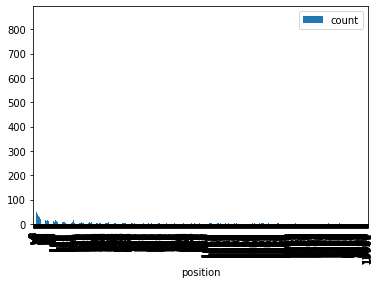

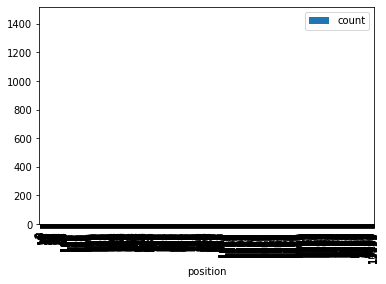

In [40]:
result_dict = copy.deepcopy(hypernym)

for temp_num in range(2):
    count_dict = {}
  
    for (key,value) in hypernym.items():
    
        # 没有预测结果的标记
        no_predict = 0

          # 处理模板
        print("==========================================================")
        text = templates[temp_num].replace('*',key)
        print(text)
    
    
        # module
        if mask_token is not None:
            text = text.replace(' _ ', ' %s ' % mask_token)
        tokens = tokenizer.convert_ids_to_tokens(tokenizer.encode(text, add_special_tokens=True))
        tokens = ['*' if token in ['*', 'Ġ*'] else token for token in tokens]
        marker = '*'
        if marker in tokens:
            assert tokens.count(marker) == 2, str(tokens)
            p, h = [i for i, token in enumerate(tokens) if token == marker]
            tokens = [token for token in tokens if token != marker]
            h -= 1
            print(tokens[p], tokens[h])
        token_ids = tokenizer.convert_tokens_to_ids(tokens)
        pred_idx = [i for i, token in enumerate(tokens) if token == mask_token] if mask_token is not None else [-1]
        tokens = ['@' + token if not token.startswith('Ġ') and token not in ['<s>', '</s>', '<mask>'] else token.replace('Ġ', '') 
                  for token in tokens] 
        #print(tokens)

        input_ids = torch.tensor([token_ids])
        with torch.no_grad():
            logits, attns = model(input_ids, output_attentions=True)
            probs = F.softmax(logits, dim=-1)

        for i in pred_idx:
            top_probs, top_indexes = probs[0][i].topk(10)
            top_tokens = tokenizer.convert_ids_to_tokens(top_indexes) 


            # remove G
            ans = []
            for word in top_tokens:
                ans.append(word[1:])
            print(ans)
            print(top_probs)


            # 找到每个同义词位于预测的第几个位置，先找到概率最大的，再去找最大的是预测的第几个
            # 找到每个同义词对应的概率
            word_probe = {}
            for word in value:
                word_id = tokenizer._convert_token_to_id('Ġ'+ word)
                if (word_id != 3):
                    word_probe[word] = probs[0][i][word_id]
                else:
                    print(word + 'is not in list')

            print(word_probe)

            # 找到同义词中概率最大的词和值

            # 没有反义词在预测的结果里
            # 保存计算结果的json文件中写为 -1
            if (len(word_probe)==0):
                no_predict = 1
                break


            max_word = max(word_probe, key=word_probe.get)
            max_probe = word_probe[max_word]

            print('max_probe is: ',end='')
            print(max_probe)

            # 判断概率最大的同义词是预测的第几个
            # 不要陷入死循环
            # k的值不要超过 tensor 的长度
            k = 10
            probe_get = 0
            while(probe_get == 0):
                top_probs, top_indexes = probs[0][i].topk(k)
                #print(top_probs)
                if max_probe in top_probs:
                    print('the position of max probe is: ',end='')
                    print((top_probs == max_probe).nonzero()[0].item())
                    print('-----------------------------------------------------')

                    probe_get = 1
                else:
                    k=k*2
                    print(k)
                    if (k >= list(probs[0][i].size())[0]):
                        top_probs, top_indexes = probs[0][i].topk(probs[0][i].size())
                        print(top_probs)
                        print('the position of max probe is: ',end='')
                        print((top_probs == max_probe).nonzero()[0].item())
                        print('-----------------------------------------------------')
                        probe_get = 1


            print('*****************************************************')

            
        # 没有预测结果
        if(no_predict == 1):
            # 写入结果文件
            if (temp_num == 0):
                result_dict[key] = [result_dict[key],-1]
            else:
                result_dict[key].append(-1)
            continue

            
        # 有预测结果
        position = (top_probs == max_probe).nonzero()[0].item()
        # 写入结果文件
        if (temp_num == 0):
            result_dict[key] = [result_dict[key],position]
        else:
            result_dict[key].append(position)


        if position not in count_dict:
            count_dict[position] = 1
        else:
            count_dict[position]+=1

       
    
    
    # 画图
    count_dict_keys = count_dict.keys()
    count_dict_values = count_dict.values()

    data = {
        'count':Series(count_dict_values),
        'position':Series(count_dict_keys)
    }

    df = DataFrame(data)
    df.sort_values("position",inplace=True)
    print(df)
    # plt.bar(count_dict_keys,count_dict_values)
    df.plot(x='position',y='count',kind='bar')
    
    
    
# 保存到json文件
with open("result_hypernym.json", "w") as outfile:  
    json.dump(result_dict, outfile)

In [41]:
# 上下位分析完毕，计算时间很长